In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier  
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report                   
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
from scikeras.wrappers import KerasClassifier

In [3]:
data = pd.read_csv("data.csv")
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
#EDA
#'id'와 'Unnamed: 32'는 필요없으니 drop 하고 target은 diagnosis입니다.
#진단 결과는 M = maliganant(양성), B = benign(음성) 입니다.
data = data.drop(['id','Unnamed: 32'],axis = 1,errors = 'ignore')
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
target = data["diagnosis"]
target.value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [6]:
#preprocessing : label encoding
encoder = LabelEncoder()
data["diagnosis"] = encoder.fit_transform(data["diagnosis"])
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


<function matplotlib.pyplot.show(close=None, block=None)>

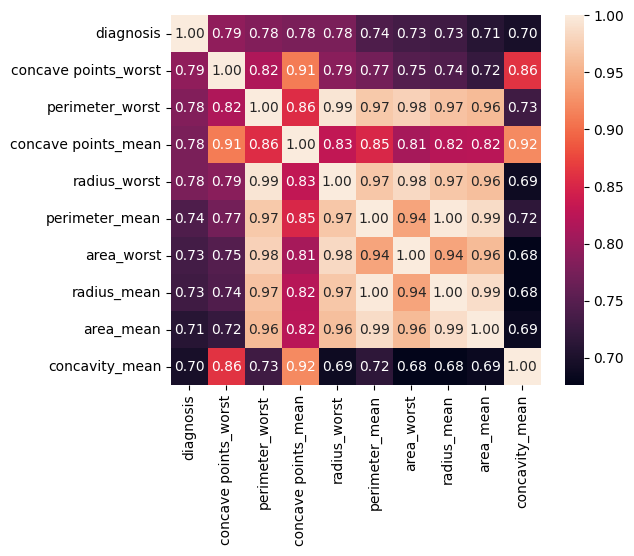

In [7]:
#feature selection using heatmap image
corr = data.corr()
#변수가 31개라 너무 많다. 10개로 줄여야한다.
corr_ten = corr.nlargest(10,'diagnosis')['diagnosis']
index = corr_ten.index
corr_mat = np.corrcoef(data[index].values.T)
heatmap = sns.heatmap(corr_mat, cbar=True, annot=True, square=True, fmt='.2f'
                      ,yticklabels = index.values,xticklabels = index.values )
plt.show

In [8]:
corr_ten

diagnosis               1.000000
concave points_worst    0.793566
perimeter_worst         0.782914
concave points_mean     0.776614
radius_worst            0.776454
perimeter_mean          0.742636
area_worst              0.733825
radius_mean             0.730029
area_mean               0.708984
concavity_mean          0.696360
Name: diagnosis, dtype: float64

In [9]:
#preprocessing 2 : Nan value
data[index].isna().sum()

diagnosis               0
concave points_worst    0
perimeter_worst         0
concave points_mean     0
radius_worst            0
perimeter_mean          0
area_worst              0
radius_mean             0
area_mean               0
concavity_mean          0
dtype: int64

In [10]:
#parameter setting
param_svm = {"C" : [0.1,1,10,100,1000]}
param_dt = {"max_depth" : [1,2,3,4,5,6,7],
            "min_samples_leaf" : [1,2,3,4,5,6,7],
            "criterion" : ['entropy','gini']
}
param_nn = {"epochs" : [100,200,300,400],
            "batch_size" : [32,48,64,80],
            "optimizer" : ['adam','sgd','rmsprop']
}

In [11]:
#Data split
X = data[index[1:10]]
y = data[index[0]]
#Normalization
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
#Data splitting
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2)

In [12]:
lsvc = SVC(kernel='linear',probability=True)
def create_model(optimizer = 'adam'):
    model_nn = Sequential()
    model_nn.add(Dense(60,activation = 'relu',input_shape = (9,)))
    model_nn.add(Dense(60,activation = 'relu'))
    model_nn.add(Dense(30,activation = 'relu'))
    model_nn.add(Dense(1))
    model_nn.compile(optimizer = optimizer, loss = 'mse', metrics = ['accuracy'])
    return model_nn
model = KerasClassifier(model = create_model)
model

KerasClassifier(
	model=<function create_model at 0x283e683a0>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=rmsprop
	loss=None
	metrics=None
	batch_size=None
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=1
	class_weight=None
)

In [13]:
#grid search
grid_svm = GridSearchCV(lsvc,param_svm,refit = True,verbose = 3,scoring = 'accuracy')
grid_dt = GridSearchCV(DecisionTreeClassifier(),param_dt,refit = True, verbose = 3, scoring = 'accuracy')
grid_nn = GridSearchCV(estimator = model, param_grid= param_nn, refit = True, verbose = 3, scoring = 'accuracy')
#model fit
grid_svm = grid_svm.fit(X_train,y_train)
grid_dt = grid_dt.fit(X_train,y_train)
grid_nn = grid_nn.fit(X_train,y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END .............................C=0.1;, score=0.967 total time=   0.0s
[CV 2/5] END .............................C=0.1;, score=0.923 total time=   0.0s
[CV 3/5] END .............................C=0.1;, score=0.945 total time=   0.0s
[CV 4/5] END .............................C=0.1;, score=0.934 total time=   0.0s
[CV 5/5] END .............................C=0.1;, score=0.934 total time=   0.0s
[CV 1/5] END ...............................C=1;, score=0.978 total time=   0.0s
[CV 2/5] END ...............................C=1;, score=0.945 total time=   0.0s
[CV 3/5] END ...............................C=1;, score=0.967 total time=   0.0s
[CV 4/5] END ...............................C=1;, score=0.989 total time=   0.0s
[CV 5/5] END ...............................C=1;, score=0.923 total time=   0.0s
[CV 1/5] END ..............................C=10;, score=0.978 total time=   0.0s
[CV 2/5] END ..............................C=10;,

[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=3;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=4;, score=0.978 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=4;, score=0.901 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=4;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=4;, score=0.945 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, min_samples_leaf=4;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, min_samples_leaf=5;, score=0.989 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, min_samples_leaf=5;, score=0.901 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, min_samples_leaf=5;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, min_samples_leaf=5;, score=0.945 total time=   0.0s
[CV 5/5] END criterion=entropy

[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=2;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=2;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=2;, score=0.901 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=3;, score=0.956 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=3;, score=0.967 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=3;, score=0.912 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, min_samples_leaf=3;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, min_samples_leaf=3;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, min_samples_leaf=4;, score=0.945 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, min_samples_leaf=4;, score=0.923 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, min_samples_leaf=4

12/12 [==============================] - 0s 729us/step - loss: 0.3887 - accuracy: 0.6511
Epoch 2/100
12/12 [==============================] - 0s 517us/step - loss: 0.1169 - accuracy: 0.8626
Epoch 3/100
12/12 [==============================] - 0s 625us/step - loss: 0.0970 - accuracy: 0.8929
Epoch 4/100
12/12 [==============================] - 0s 552us/step - loss: 0.0758 - accuracy: 0.9148
Epoch 5/100
12/12 [==============================] - 0s 585us/step - loss: 0.0642 - accuracy: 0.9396
Epoch 6/100
12/12 [==============================] - 0s 514us/step - loss: 0.0578 - accuracy: 0.9451
Epoch 7/100
12/12 [==============================] - 0s 645us/step - loss: 0.0518 - accuracy: 0.9478
Epoch 8/100
12/12 [==============================] - 0s 616us/step - loss: 0.0484 - accuracy: 0.9478
Epoch 9/100
12/12 [==============================] - 0s 562us/step - loss: 0.0452 - accuracy: 0.9478
Epoch 10/100
12/12 [==============================] - 0s 789us/step - loss: 0.0412 - accuracy: 0.9478
E

12/12 [==============================] - 0s 538us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 82/100
12/12 [==============================] - 0s 623us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 83/100
12/12 [==============================] - 0s 563us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 84/100
12/12 [==============================] - 0s 593us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 85/100
12/12 [==============================] - 0s 533us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 86/100
12/12 [==============================] - 0s 589us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 87/100
12/12 [==============================] - 0s 529us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 88/100
12/12 [==============================] - 0s 580us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 89/100
12/12 [==============================] - 0s 517us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 90/100
12/12 [==============================] - 0s 619us/step - loss: 0.0066 - accuracy: 

12/12 [==============================] - 0s 529us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 61/100
12/12 [==============================] - 0s 613us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 62/100
12/12 [==============================] - 0s 564us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 63/100
12/12 [==============================] - 0s 558us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 64/100
12/12 [==============================] - 0s 582us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 65/100
12/12 [==============================] - 0s 547us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 66/100
12/12 [==============================] - 0s 587us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 67/100
12/12 [==============================] - 0s 528us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 68/100
12/12 [==============================] - 0s 584us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 69/100
12/12 [==============================] - 0s 527us/step - loss: 0.0085 - accuracy: 

12/12 [==============================] - 0s 633us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 40/100
12/12 [==============================] - 0s 543us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 41/100
12/12 [==============================] - 0s 609us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 42/100
12/12 [==============================] - 0s 530us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 43/100
12/12 [==============================] - 0s 649us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 44/100
12/12 [==============================] - 0s 541us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 45/100
12/12 [==============================] - 0s 610us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 46/100
12/12 [==============================] - 0s 508us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 47/100
12/12 [==============================] - 0s 607us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 48/100
12/12 [==============================] - 0s 534us/step - loss: 0.0078 - accuracy: 

12/12 [==============================] - 0s 591us/step - loss: 0.0291 - accuracy: 0.9670
Epoch 19/100
12/12 [==============================] - 0s 538us/step - loss: 0.0289 - accuracy: 0.9670
Epoch 20/100
12/12 [==============================] - 0s 587us/step - loss: 0.0273 - accuracy: 0.9670
Epoch 21/100
12/12 [==============================] - 0s 684us/step - loss: 0.0266 - accuracy: 0.9698
Epoch 22/100
12/12 [==============================] - 0s 601us/step - loss: 0.0258 - accuracy: 0.9698
Epoch 23/100
12/12 [==============================] - 0s 542us/step - loss: 0.0255 - accuracy: 0.9670
Epoch 24/100
12/12 [==============================] - 0s 509us/step - loss: 0.0241 - accuracy: 0.9725
Epoch 25/100
12/12 [==============================] - 0s 703us/step - loss: 0.0237 - accuracy: 0.9670
Epoch 26/100
12/12 [==============================] - 0s 617us/step - loss: 0.0225 - accuracy: 0.9698
Epoch 27/100
12/12 [==============================] - 0s 518us/step - loss: 0.0222 - accuracy: 

12/12 [==============================] - 0s 520us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 99/100
12/12 [==============================] - 0s 593us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 100/100
3/3 [==============================] - 0s 718us/step
[CV 4/5] END batch_size=32, epochs=100, optimizer=adam;, score=0.989 total time=   1.1s
Epoch 1/100
12/12 [==============================] - 0s 885us/step - loss: 0.1318 - accuracy: 0.8489
Epoch 2/100
12/12 [==============================] - 0s 642us/step - loss: 0.0790 - accuracy: 0.9011
Epoch 3/100
12/12 [==============================] - 0s 539us/step - loss: 0.0606 - accuracy: 0.9313
Epoch 4/100
12/12 [==============================] - 0s 486us/step - loss: 0.0527 - accuracy: 0.9560
Epoch 5/100
12/12 [==============================] - 0s 807us/step - loss: 0.0454 - accuracy: 0.9588
Epoch 6/100
12/12 [==============================] - 0s 603us/step - loss: 0.0409 - accuracy: 0.9588
Epoch 7/100
12/12 [=============================

12/12 [==============================] - 0s 731us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 78/100
12/12 [==============================] - 0s 534us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 79/100
12/12 [==============================] - 0s 579us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 80/100
12/12 [==============================] - 0s 521us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 81/100
12/12 [==============================] - 0s 713us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 82/100
12/12 [==============================] - 0s 527us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 83/100
12/12 [==============================] - 0s 553us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 84/100
12/12 [==============================] - 0s 501us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 85/100
12/12 [==============================] - 0s 599us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 86/100
12/12 [==============================] - 0s 614us/step - loss: 0.0015 - accuracy: 

12/12 [==============================] - 0s 567us/step - loss: 0.0125 - accuracy: 0.9835
Epoch 50/100
12/12 [==============================] - 0s 673us/step - loss: 0.0122 - accuracy: 0.9863
Epoch 51/100
12/12 [==============================] - 0s 569us/step - loss: 0.0119 - accuracy: 0.9863
Epoch 52/100
12/12 [==============================] - 0s 527us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 53/100
12/12 [==============================] - 0s 641us/step - loss: 0.0122 - accuracy: 0.9863
Epoch 54/100
12/12 [==============================] - 0s 575us/step - loss: 0.0118 - accuracy: 0.9863
Epoch 55/100
12/12 [==============================] - 0s 552us/step - loss: 0.0122 - accuracy: 0.9835
Epoch 56/100
12/12 [==============================] - 0s 522us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 57/100
12/12 [==============================] - 0s 523us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 58/100
12/12 [==============================] - 0s 757us/step - loss: 0.0107 - accuracy: 

12/12 [==============================] - 0s 563us/step - loss: 0.0203 - accuracy: 0.9780
Epoch 22/100
12/12 [==============================] - 0s 543us/step - loss: 0.0188 - accuracy: 0.9753
Epoch 23/100
12/12 [==============================] - 0s 564us/step - loss: 0.0193 - accuracy: 0.9780
Epoch 24/100
12/12 [==============================] - 0s 677us/step - loss: 0.0183 - accuracy: 0.9753
Epoch 25/100
12/12 [==============================] - 0s 577us/step - loss: 0.0185 - accuracy: 0.9780
Epoch 26/100
12/12 [==============================] - 0s 534us/step - loss: 0.0174 - accuracy: 0.9753
Epoch 27/100
12/12 [==============================] - 0s 514us/step - loss: 0.0170 - accuracy: 0.9753
Epoch 28/100
12/12 [==============================] - 0s 683us/step - loss: 0.0167 - accuracy: 0.9808
Epoch 29/100
12/12 [==============================] - 0s 532us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 30/100
12/12 [==============================] - 0s 543us/step - loss: 0.0162 - accuracy: 

3/3 [==============================] - 0s 629us/step
[CV 2/5] END batch_size=32, epochs=100, optimizer=sgd;, score=0.967 total time=   1.1s
Epoch 1/100
12/12 [==============================] - 0s 582us/step - loss: 0.1753 - accuracy: 0.7967
Epoch 2/100
12/12 [==============================] - 0s 731us/step - loss: 0.0986 - accuracy: 0.8764
Epoch 3/100
12/12 [==============================] - 0s 565us/step - loss: 0.0855 - accuracy: 0.8819
Epoch 4/100
12/12 [==============================] - 0s 505us/step - loss: 0.0708 - accuracy: 0.9231
Epoch 5/100
12/12 [==============================] - 0s 484us/step - loss: 0.0589 - accuracy: 0.9368
Epoch 6/100
12/12 [==============================] - 0s 664us/step - loss: 0.0539 - accuracy: 0.9505
Epoch 7/100
12/12 [==============================] - 0s 506us/step - loss: 0.0488 - accuracy: 0.9560
Epoch 8/100
12/12 [==============================] - 0s 525us/step - loss: 0.0462 - accuracy: 0.9615
Epoch 9/100
12/12 [==============================] -

12/12 [==============================] - 0s 515us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 81/100
12/12 [==============================] - 0s 565us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 82/100
12/12 [==============================] - 0s 536us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 83/100
12/12 [==============================] - 0s 608us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 84/100
12/12 [==============================] - 0s 523us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 85/100
12/12 [==============================] - 0s 571us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 86/100
12/12 [==============================] - 0s 520us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 87/100
12/12 [==============================] - 0s 531us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 88/100
12/12 [==============================] - 0s 569us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 89/100
12/12 [==============================] - 0s 534us/step - loss: 0.0041 - accuracy: 

12/12 [==============================] - 0s 537us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 60/100
12/12 [==============================] - 0s 640us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 61/100
12/12 [==============================] - 0s 517us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 62/100
12/12 [==============================] - 0s 572us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 63/100
12/12 [==============================] - 0s 527us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 64/100
12/12 [==============================] - 0s 673us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 65/100
12/12 [==============================] - 0s 522us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 66/100
12/12 [==============================] - 0s 594us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 67/100
12/12 [==============================] - 0s 521us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 68/100
12/12 [==============================] - 0s 668us/step - loss: 0.0093 - accuracy: 

12/12 [==============================] - 0s 567us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 39/100
12/12 [==============================] - 0s 522us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 40/100
12/12 [==============================] - 0s 620us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 41/100
12/12 [==============================] - 0s 565us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 42/100
12/12 [==============================] - 0s 532us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 43/100
12/12 [==============================] - 0s 516us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 44/100
12/12 [==============================] - 0s 602us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 45/100
12/12 [==============================] - 0s 538us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 46/100
12/12 [==============================] - 0s 543us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 47/100
12/12 [==============================] - 0s 517us/step - loss: 0.0054 - accuracy: 

12/12 [==============================] - 0s 594us/step - loss: 0.0266 - accuracy: 0.9753
Epoch 18/100
12/12 [==============================] - 0s 517us/step - loss: 0.0257 - accuracy: 0.9753
Epoch 19/100
12/12 [==============================] - 0s 567us/step - loss: 0.0244 - accuracy: 0.9753
Epoch 20/100
12/12 [==============================] - 0s 522us/step - loss: 0.0243 - accuracy: 0.9725
Epoch 21/100
12/12 [==============================] - 0s 567us/step - loss: 0.0255 - accuracy: 0.9725
Epoch 22/100
12/12 [==============================] - 0s 507us/step - loss: 0.0237 - accuracy: 0.9753
Epoch 23/100
12/12 [==============================] - 0s 502us/step - loss: 0.0239 - accuracy: 0.9753
Epoch 24/100
12/12 [==============================] - 0s 601us/step - loss: 0.0214 - accuracy: 0.9725
Epoch 25/100
12/12 [==============================] - 0s 533us/step - loss: 0.0206 - accuracy: 0.9753
Epoch 26/100
12/12 [==============================] - 0s 539us/step - loss: 0.0204 - accuracy: 

12/12 [==============================] - 0s 610us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 98/100
12/12 [==============================] - 0s 557us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 99/100
12/12 [==============================] - 0s 602us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 100/100
3/3 [==============================] - 0s 719us/step
[CV 1/5] END batch_size=32, epochs=100, optimizer=rmsprop;, score=0.989 total time=   1.0s
Epoch 1/100
12/12 [==============================] - 0s 565us/step - loss: 0.1585 - accuracy: 0.8242
Epoch 2/100
12/12 [==============================] - 0s 601us/step - loss: 0.1145 - accuracy: 0.9011
Epoch 3/100
12/12 [==============================] - 0s 521us/step - loss: 0.0907 - accuracy: 0.8956
Epoch 4/100
12/12 [==============================] - 0s 509us/step - loss: 0.0731 - accuracy: 0.9203
Epoch 5/100
12/12 [==============================] - 0s 517us/step - loss: 0.0651 - accuracy: 0.9286
Epoch 6/100
12/12 [=========================

12/12 [==============================] - 0s 522us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 77/100
12/12 [==============================] - 0s 700us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 78/100
12/12 [==============================] - 0s 523us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 79/100
12/12 [==============================] - 0s 565us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 80/100
12/12 [==============================] - 0s 526us/step - loss: 0.0118 - accuracy: 0.9945
Epoch 81/100
12/12 [==============================] - 0s 567us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 82/100
12/12 [==============================] - 0s 549us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 83/100
12/12 [==============================] - 0s 481us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 84/100
12/12 [==============================] - 0s 522us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 85/100
12/12 [==============================] - 0s 500us/step - loss: 0.0074 - accuracy: 

12/12 [==============================] - 0s 582us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 56/100
12/12 [==============================] - 0s 513us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 57/100
12/12 [==============================] - 0s 578us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 58/100
12/12 [==============================] - 0s 576us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 59/100
12/12 [==============================] - 0s 577us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 60/100
12/12 [==============================] - 0s 528us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 61/100
12/12 [==============================] - 0s 555us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 62/100
12/12 [==============================] - 0s 510us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 63/100
12/12 [==============================] - 0s 675us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 64/100
12/12 [==============================] - 0s 520us/step - loss: 0.0066 - accuracy: 

12/12 [==============================] - 0s 530us/step - loss: 0.0170 - accuracy: 0.9808
Epoch 35/100
12/12 [==============================] - 0s 553us/step - loss: 0.0181 - accuracy: 0.9808
Epoch 36/100
12/12 [==============================] - 0s 632us/step - loss: 0.0196 - accuracy: 0.9890
Epoch 37/100
12/12 [==============================] - 0s 543us/step - loss: 0.0169 - accuracy: 0.9863
Epoch 38/100
12/12 [==============================] - 0s 537us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 39/100
12/12 [==============================] - 0s 574us/step - loss: 0.0154 - accuracy: 0.9835
Epoch 40/100
12/12 [==============================] - 0s 521us/step - loss: 0.0157 - accuracy: 0.9835
Epoch 41/100
12/12 [==============================] - 0s 592us/step - loss: 0.0152 - accuracy: 0.9835
Epoch 42/100
12/12 [==============================] - 0s 515us/step - loss: 0.0142 - accuracy: 0.9890
Epoch 43/100
12/12 [==============================] - 0s 572us/step - loss: 0.0146 - accuracy: 

12/12 [==============================] - 0s 1ms/step - loss: 0.0304 - accuracy: 0.9808
Epoch 14/100
12/12 [==============================] - 0s 640us/step - loss: 0.0302 - accuracy: 0.9753
Epoch 15/100
12/12 [==============================] - 0s 573us/step - loss: 0.0305 - accuracy: 0.9808
Epoch 16/100
12/12 [==============================] - 0s 510us/step - loss: 0.0259 - accuracy: 0.9835
Epoch 17/100
12/12 [==============================] - 0s 581us/step - loss: 0.0262 - accuracy: 0.9808
Epoch 18/100
12/12 [==============================] - 0s 544us/step - loss: 0.0236 - accuracy: 0.9808
Epoch 19/100
12/12 [==============================] - 0s 597us/step - loss: 0.0231 - accuracy: 0.9890
Epoch 20/100
12/12 [==============================] - 0s 533us/step - loss: 0.0210 - accuracy: 0.9863
Epoch 21/100
12/12 [==============================] - 0s 664us/step - loss: 0.0200 - accuracy: 0.9863
Epoch 22/100
12/12 [==============================] - 0s 518us/step - loss: 0.0192 - accuracy: 0.

12/12 [==============================] - 0s 562us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 94/100
12/12 [==============================] - 0s 567us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 95/100
12/12 [==============================] - 0s 561us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 96/100
12/12 [==============================] - 0s 527us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 97/100
12/12 [==============================] - 0s 563us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 98/100
12/12 [==============================] - 0s 502us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 99/100
12/12 [==============================] - 0s 589us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 100/100
3/3 [==============================] - 0s 720us/step
[CV 5/5] END batch_size=32, epochs=100, optimizer=rmsprop;, score=0.934 total time=   1.0s
Epoch 1/200
12/12 [==============================] - 0s 515us/step - loss: 0.2264 - accuracy: 0.7308
Epoch 2/200
12/12 [=====================

12/12 [==============================] - 0s 558us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 73/200
12/12 [==============================] - 0s 519us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 74/200
12/12 [==============================] - 0s 560us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 75/200
12/12 [==============================] - 0s 634us/step - loss: 0.0084 - accuracy: 0.9973
Epoch 76/200
12/12 [==============================] - 0s 545us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 77/200
12/12 [==============================] - 0s 528us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 78/200
12/12 [==============================] - 0s 509us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 79/200
12/12 [==============================] - 0s 596us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 80/200
12/12 [==============================] - 0s 547us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 81/200
12/12 [==============================] - 0s 568us/step - loss: 0.0072 - accuracy: 

Epoch 152/200
12/12 [==============================] - 0s 612us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 153/200
12/12 [==============================] - 0s 523us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 154/200
12/12 [==============================] - 0s 559us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 155/200
12/12 [==============================] - 0s 557us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 156/200
12/12 [==============================] - 0s 516us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 157/200
12/12 [==============================] - 0s 596us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 158/200
12/12 [==============================] - 0s 563us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 159/200
12/12 [==============================] - 0s 595us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 160/200
12/12 [==============================] - 0s 561us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 161/200
12/12 [==============================] - 0s 620us/step - lo

12/12 [==============================] - 0s 538us/step - loss: 0.0172 - accuracy: 0.9835
Epoch 31/200
12/12 [==============================] - 0s 597us/step - loss: 0.0171 - accuracy: 0.9835
Epoch 32/200
12/12 [==============================] - 0s 543us/step - loss: 0.0156 - accuracy: 0.9780
Epoch 33/200
12/12 [==============================] - 0s 591us/step - loss: 0.0149 - accuracy: 0.9835
Epoch 34/200
12/12 [==============================] - 0s 533us/step - loss: 0.0147 - accuracy: 0.9835
Epoch 35/200
12/12 [==============================] - 0s 550us/step - loss: 0.0148 - accuracy: 0.9808
Epoch 36/200
12/12 [==============================] - 0s 532us/step - loss: 0.0142 - accuracy: 0.9835
Epoch 37/200
12/12 [==============================] - 0s 639us/step - loss: 0.0146 - accuracy: 0.9835
Epoch 38/200
12/12 [==============================] - 0s 541us/step - loss: 0.0136 - accuracy: 0.9835
Epoch 39/200
12/12 [==============================] - 0s 519us/step - loss: 0.0141 - accuracy: 

12/12 [==============================] - 0s 531us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 111/200
12/12 [==============================] - 0s 637us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 112/200
12/12 [==============================] - 0s 541us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 113/200
12/12 [==============================] - 0s 542us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 114/200
12/12 [==============================] - 0s 524us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 115/200
12/12 [==============================] - 0s 508us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 116/200
12/12 [==============================] - 0s 528us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 117/200
12/12 [==============================] - 0s 538us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 118/200
12/12 [==============================] - 0s 502us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 119/200
12/12 [==============================] - 0s 530us/step - loss: 0.0036 - a

12/12 [==============================] - 0s 526us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 190/200
12/12 [==============================] - 0s 588us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 191/200
12/12 [==============================] - 0s 577us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 192/200
12/12 [==============================] - 0s 549us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 193/200
12/12 [==============================] - 0s 529us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 194/200
12/12 [==============================] - 0s 511us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 195/200
12/12 [==============================] - 0s 567us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 196/200
12/12 [==============================] - 0s 529us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 197/200
12/12 [==============================] - 0s 605us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 198/200
12/12 [==============================] - 0s 498us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 572us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 69/200
12/12 [==============================] - 0s 545us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 70/200
12/12 [==============================] - 0s 527us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 71/200
12/12 [==============================] - 0s 603us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 72/200
12/12 [==============================] - 0s 523us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 73/200
12/12 [==============================] - 0s 529us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 74/200
12/12 [==============================] - 0s 529us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 75/200
12/12 [==============================] - 0s 594us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 76/200
12/12 [==============================] - 0s 532us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 77/200
12/12 [==============================] - 0s 569us/step - loss: 0.0047 - accuracy: 

Epoch 148/200
12/12 [==============================] - 0s 647us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 149/200
12/12 [==============================] - 0s 533us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 150/200
12/12 [==============================] - 0s 544us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 151/200
12/12 [==============================] - 0s 512us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 152/200
12/12 [==============================] - 0s 614us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 153/200
12/12 [==============================] - 0s 555us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 154/200
12/12 [==============================] - 0s 542us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 155/200
12/12 [==============================] - 0s 523us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 156/200
12/12 [==============================] - 0s 490us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 157/200
12/12 [==============================] - 0s 544us/step - lo

12/12 [==============================] - 0s 556us/step - loss: 0.0259 - accuracy: 0.9698
Epoch 27/200
12/12 [==============================] - 0s 551us/step - loss: 0.0267 - accuracy: 0.9698
Epoch 28/200
12/12 [==============================] - 0s 572us/step - loss: 0.0246 - accuracy: 0.9698
Epoch 29/200
12/12 [==============================] - 0s 508us/step - loss: 0.0237 - accuracy: 0.9725
Epoch 30/200
12/12 [==============================] - 0s 563us/step - loss: 0.0232 - accuracy: 0.9753
Epoch 31/200
12/12 [==============================] - 0s 547us/step - loss: 0.0233 - accuracy: 0.9725
Epoch 32/200
12/12 [==============================] - 0s 603us/step - loss: 0.0221 - accuracy: 0.9753
Epoch 33/200
12/12 [==============================] - 0s 527us/step - loss: 0.0214 - accuracy: 0.9753
Epoch 34/200
12/12 [==============================] - 0s 585us/step - loss: 0.0211 - accuracy: 0.9753
Epoch 35/200
12/12 [==============================] - 0s 504us/step - loss: 0.0210 - accuracy: 

12/12 [==============================] - 0s 528us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 107/200
12/12 [==============================] - 0s 530us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 108/200
12/12 [==============================] - 0s 554us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 109/200
12/12 [==============================] - 0s 533us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 110/200
12/12 [==============================] - 0s 557us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 111/200
12/12 [==============================] - 0s 511us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 112/200
12/12 [==============================] - 0s 547us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 113/200
12/12 [==============================] - 0s 536us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 114/200
12/12 [==============================] - 0s 657us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 115/200
12/12 [==============================] - 0s 544us/step - loss: 0.0065 - a

12/12 [==============================] - 0s 539us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 186/200
12/12 [==============================] - 0s 630us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 187/200
12/12 [==============================] - 0s 552us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 188/200
12/12 [==============================] - 0s 580us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 189/200
12/12 [==============================] - 0s 540us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 190/200
12/12 [==============================] - 0s 576us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 191/200
12/12 [==============================] - 0s 530us/step - loss: 0.0041 - accuracy: 0.9945
Epoch 192/200
12/12 [==============================] - 0s 540us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 193/200
12/12 [==============================] - 0s 522us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 194/200
12/12 [==============================] - 0s 663us/step - loss: 0.0035 - a

12/12 [==============================] - 0s 610us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 65/200
12/12 [==============================] - 0s 558us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 66/200
12/12 [==============================] - 0s 585us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 67/200
12/12 [==============================] - 0s 555us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 68/200
12/12 [==============================] - 0s 513us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 69/200
12/12 [==============================] - 0s 611us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 70/200
12/12 [==============================] - 0s 532us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 71/200
12/12 [==============================] - 0s 566us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 72/200
12/12 [==============================] - 0s 524us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 73/200
12/12 [==============================] - 0s 610us/step - loss: 0.0032 - accuracy: 

12/12 [==============================] - 0s 516us/step - loss: 7.8387e-04 - accuracy: 1.0000
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 7.2143e-04 - accuracy: 1.0000
Epoch 145/200
12/12 [==============================] - 0s 525us/step - loss: 6.3273e-04 - accuracy: 1.0000
Epoch 146/200
12/12 [==============================] - 0s 685us/step - loss: 7.4405e-04 - accuracy: 1.0000
Epoch 147/200
12/12 [==============================] - 0s 515us/step - loss: 9.8822e-04 - accuracy: 1.0000
Epoch 148/200
12/12 [==============================] - 0s 598us/step - loss: 7.9866e-04 - accuracy: 1.0000
Epoch 149/200
12/12 [==============================] - 0s 526us/step - loss: 6.3967e-04 - accuracy: 1.0000
Epoch 150/200
12/12 [==============================] - 0s 613us/step - loss: 7.4608e-04 - accuracy: 1.0000
Epoch 151/200
12/12 [==============================] - 0s 518us/step - loss: 6.5041e-04 - accuracy: 1.0000
Epoch 152/200
12/12 [==============================

12/12 [==============================] - 0s 574us/step - loss: 0.0266 - accuracy: 0.9725
Epoch 20/200
12/12 [==============================] - 0s 541us/step - loss: 0.0248 - accuracy: 0.9753
Epoch 21/200
12/12 [==============================] - 0s 610us/step - loss: 0.0242 - accuracy: 0.9753
Epoch 22/200
12/12 [==============================] - 0s 534us/step - loss: 0.0226 - accuracy: 0.9753
Epoch 23/200
12/12 [==============================] - 0s 553us/step - loss: 0.0219 - accuracy: 0.9808
Epoch 24/200
12/12 [==============================] - 0s 515us/step - loss: 0.0211 - accuracy: 0.9835
Epoch 25/200
12/12 [==============================] - 0s 600us/step - loss: 0.0208 - accuracy: 0.9808
Epoch 26/200
12/12 [==============================] - 0s 529us/step - loss: 0.0205 - accuracy: 0.9808
Epoch 27/200
12/12 [==============================] - 0s 573us/step - loss: 0.0199 - accuracy: 0.9835
Epoch 28/200
12/12 [==============================] - 0s 522us/step - loss: 0.0188 - accuracy: 

12/12 [==============================] - 0s 555us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 100/200
12/12 [==============================] - 0s 533us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 101/200
12/12 [==============================] - 0s 537us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 102/200
12/12 [==============================] - 0s 533us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 103/200
12/12 [==============================] - 0s 612us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 104/200
12/12 [==============================] - 0s 532us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 105/200
12/12 [==============================] - 0s 557us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 106/200
12/12 [==============================] - 0s 517us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 107/200
12/12 [==============================] - 0s 646us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 108/200
12/12 [==============================] - 0s 504us/step - loss: 0.0047 - a

12/12 [==============================] - 0s 541us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 179/200
12/12 [==============================] - 0s 557us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 180/200
12/12 [==============================] - 0s 502us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 181/200
12/12 [==============================] - 0s 617us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 182/200
12/12 [==============================] - 0s 532us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 183/200
12/12 [==============================] - 0s 521us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 184/200
12/12 [==============================] - 0s 543us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 185/200
12/12 [==============================] - 0s 529us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 186/200
12/12 [==============================] - 0s 619us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 187/200
12/12 [==============================] - 0s 529us/step - loss: 0.0024 - a

Epoch 57/200
12/12 [==============================] - 0s 587us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 58/200
12/12 [==============================] - 0s 519us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 59/200
12/12 [==============================] - 0s 587us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 60/200
12/12 [==============================] - 0s 546us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 61/200
12/12 [==============================] - 0s 571us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 62/200
12/12 [==============================] - 0s 534us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 63/200
12/12 [==============================] - 0s 523us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 64/200
12/12 [==============================] - 0s 645us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 65/200
12/12 [==============================] - 0s 539us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 66/200
12/12 [==============================] - 0s 542us/step - loss: 0.0085

Epoch 137/200
12/12 [==============================] - 0s 492us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 138/200
12/12 [==============================] - 0s 728us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 139/200
12/12 [==============================] - 0s 555us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 140/200
12/12 [==============================] - 0s 572us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 141/200
12/12 [==============================] - 0s 557us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 142/200
12/12 [==============================] - 0s 628us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 143/200
12/12 [==============================] - 0s 557us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 144/200
12/12 [==============================] - 0s 528us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 145/200
12/12 [==============================] - 0s 509us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 146/200
12/12 [==============================] - 0s 593us/step - lo

12/12 [==============================] - 0s 516us/step - loss: 0.0224 - accuracy: 0.9780
Epoch 16/200
12/12 [==============================] - 0s 804us/step - loss: 0.0214 - accuracy: 0.9780
Epoch 17/200
12/12 [==============================] - 0s 544us/step - loss: 0.0203 - accuracy: 0.9780
Epoch 18/200
12/12 [==============================] - 0s 610us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 19/200
12/12 [==============================] - 0s 509us/step - loss: 0.0186 - accuracy: 0.9808
Epoch 20/200
12/12 [==============================] - 0s 593us/step - loss: 0.0175 - accuracy: 0.9835
Epoch 21/200
12/12 [==============================] - 0s 519us/step - loss: 0.0183 - accuracy: 0.9863
Epoch 22/200
12/12 [==============================] - 0s 597us/step - loss: 0.0169 - accuracy: 0.9835
Epoch 23/200
12/12 [==============================] - 0s 518us/step - loss: 0.0165 - accuracy: 0.9890
Epoch 24/200
12/12 [==============================] - 0s 506us/step - loss: 0.0161 - accuracy: 

12/12 [==============================] - 0s 570us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 96/200
12/12 [==============================] - 0s 525us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 97/200
12/12 [==============================] - 0s 625us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 98/200
12/12 [==============================] - 0s 513us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 99/200
12/12 [==============================] - 0s 550us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 100/200
12/12 [==============================] - 0s 545us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 101/200
12/12 [==============================] - 0s 523us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 102/200
12/12 [==============================] - 0s 581us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 103/200
12/12 [==============================] - 0s 531us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 104/200
12/12 [==============================] - 0s 551us/step - loss: 0.0043 - accur

12/12 [==============================] - 0s 535us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 175/200
12/12 [==============================] - 0s 677us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 176/200
12/12 [==============================] - 0s 525us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 177/200
12/12 [==============================] - 0s 567us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 178/200
12/12 [==============================] - 0s 521us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 179/200
12/12 [==============================] - 0s 533us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 180/200
12/12 [==============================] - 0s 578us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 181/200
12/12 [==============================] - 0s 559us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 182/200
12/12 [==============================] - 0s 546us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 183/200
12/12 [==============================] - 0s 512us/step - loss: 0.0027 - a

12/12 [==============================] - 0s 525us/step - loss: 0.0115 - accuracy: 0.9945
Epoch 53/200
12/12 [==============================] - 0s 635us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 54/200
12/12 [==============================] - 0s 541us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 55/200
12/12 [==============================] - 0s 592us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 56/200
12/12 [==============================] - 0s 512us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 57/200
12/12 [==============================] - 0s 581us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 58/200
12/12 [==============================] - 0s 501us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 59/200
12/12 [==============================] - 0s 554us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 60/200
12/12 [==============================] - 0s 532us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 61/200
12/12 [==============================] - 0s 532us/step - loss: 0.0108 - accuracy: 

12/12 [==============================] - 0s 536us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 133/200
12/12 [==============================] - 0s 525us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 134/200
12/12 [==============================] - 0s 623us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 135/200
12/12 [==============================] - 0s 534us/step - loss: 0.0045 - accuracy: 0.9945
Epoch 136/200
12/12 [==============================] - 0s 536us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 137/200
12/12 [==============================] - 0s 532us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 138/200
12/12 [==============================] - 0s 585us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 139/200
12/12 [==============================] - 0s 531us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 140/200
12/12 [==============================] - 0s 575us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 141/200
12/12 [==============================] - 0s 518us/step - loss: 0.0038 - a

12/12 [==============================] - 0s 670us/step - loss: 0.0297 - accuracy: 0.9835
Epoch 11/200
12/12 [==============================] - 0s 540us/step - loss: 0.0318 - accuracy: 0.9863
Epoch 12/200
12/12 [==============================] - 0s 585us/step - loss: 0.0265 - accuracy: 0.9780
Epoch 13/200
12/12 [==============================] - 0s 519us/step - loss: 0.0233 - accuracy: 0.9863
Epoch 14/200
12/12 [==============================] - 0s 618us/step - loss: 0.0215 - accuracy: 0.9890
Epoch 15/200
12/12 [==============================] - 0s 554us/step - loss: 0.0213 - accuracy: 0.9808
Epoch 16/200
12/12 [==============================] - 0s 530us/step - loss: 0.0208 - accuracy: 0.9890
Epoch 17/200
12/12 [==============================] - 0s 561us/step - loss: 0.0195 - accuracy: 0.9863
Epoch 18/200
12/12 [==============================] - 0s 633us/step - loss: 0.0181 - accuracy: 0.9863
Epoch 19/200
12/12 [==============================] - 0s 558us/step - loss: 0.0175 - accuracy: 

12/12 [==============================] - 0s 567us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 91/200
12/12 [==============================] - 0s 575us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 92/200
12/12 [==============================] - 0s 520us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 93/200
12/12 [==============================] - 0s 579us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 94/200
12/12 [==============================] - 0s 540us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 95/200
12/12 [==============================] - 0s 581us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 96/200
12/12 [==============================] - 0s 509us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 97/200
12/12 [==============================] - 0s 571us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 98/200
12/12 [==============================] - 0s 544us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 99/200
12/12 [==============================] - 0s 519us/step - loss: 0.0014 - accuracy: 

12/12 [==============================] - 0s 543us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 169/200
12/12 [==============================] - 0s 591us/step - loss: 4.8204e-04 - accuracy: 1.0000
Epoch 170/200
12/12 [==============================] - 0s 524us/step - loss: 5.9363e-04 - accuracy: 1.0000
Epoch 171/200
12/12 [==============================] - 0s 588us/step - loss: 5.8802e-04 - accuracy: 1.0000
Epoch 172/200
12/12 [==============================] - 0s 540us/step - loss: 5.6091e-04 - accuracy: 1.0000
Epoch 173/200
12/12 [==============================] - 0s 552us/step - loss: 6.4836e-04 - accuracy: 1.0000
Epoch 174/200
12/12 [==============================] - 0s 518us/step - loss: 5.3445e-04 - accuracy: 1.0000
Epoch 175/200
12/12 [==============================] - 0s 527us/step - loss: 5.6282e-04 - accuracy: 1.0000
Epoch 176/200
12/12 [==============================] - 0s 626us/step - loss: 8.9657e-04 - accuracy: 1.0000
Epoch 177/200
12/12 [==============================] - 

12/12 [==============================] - 0s 568us/step - loss: 0.0137 - accuracy: 0.9918
Epoch 46/200
12/12 [==============================] - 0s 533us/step - loss: 0.0131 - accuracy: 0.9945
Epoch 47/200
12/12 [==============================] - 0s 609us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 48/200
12/12 [==============================] - 0s 531us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 49/200
12/12 [==============================] - 0s 537us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 50/200
12/12 [==============================] - 0s 533us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 51/200
12/12 [==============================] - 0s 531us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 52/200
12/12 [==============================] - 0s 587us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 53/200
12/12 [==============================] - 0s 520us/step - loss: 0.0115 - accuracy: 0.9945
Epoch 54/200
12/12 [==============================] - 0s 593us/step - loss: 0.0106 - accuracy: 

12/12 [==============================] - 0s 542us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 126/200
12/12 [==============================] - 0s 600us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 127/200
12/12 [==============================] - 0s 518us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 128/200
12/12 [==============================] - 0s 605us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 129/200
12/12 [==============================] - 0s 536us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 130/200
12/12 [==============================] - 0s 510us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 131/200
12/12 [==============================] - 0s 581us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 132/200
12/12 [==============================] - 0s 523us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 133/200
12/12 [==============================] - 0s 614us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 134/200
12/12 [==============================] - 0s 537us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 503us/step - loss: 0.0811 - accuracy: 0.9011
Epoch 4/200
12/12 [==============================] - 0s 664us/step - loss: 0.0631 - accuracy: 0.9396
Epoch 5/200
12/12 [==============================] - 0s 522us/step - loss: 0.0560 - accuracy: 0.9396
Epoch 6/200
12/12 [==============================] - 0s 542us/step - loss: 0.0512 - accuracy: 0.9505
Epoch 7/200
12/12 [==============================] - 0s 514us/step - loss: 0.0476 - accuracy: 0.9533
Epoch 8/200
12/12 [==============================] - 0s 685us/step - loss: 0.0447 - accuracy: 0.9588
Epoch 9/200
12/12 [==============================] - 0s 520us/step - loss: 0.0417 - accuracy: 0.9560
Epoch 10/200
12/12 [==============================] - 0s 515us/step - loss: 0.0404 - accuracy: 0.9643
Epoch 11/200
12/12 [==============================] - 0s 508us/step - loss: 0.0374 - accuracy: 0.9643
Epoch 12/200
12/12 [==============================] - 0s 513us/step - loss: 0.0351 - accuracy: 0.9698

12/12 [==============================] - 0s 587us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 84/200
12/12 [==============================] - 0s 517us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 85/200
12/12 [==============================] - 0s 590us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 86/200
12/12 [==============================] - 0s 518us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 87/200
12/12 [==============================] - 0s 602us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 88/200
12/12 [==============================] - 0s 540us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 89/200
12/12 [==============================] - 0s 517us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 90/200
12/12 [==============================] - 0s 534us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 91/200
12/12 [==============================] - 0s 494us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 92/200
12/12 [==============================] - 0s 598us/step - loss: 0.0083 - accuracy: 

12/12 [==============================] - 0s 526us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 163/200
12/12 [==============================] - 0s 622us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 164/200
12/12 [==============================] - 0s 545us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 165/200
12/12 [==============================] - 0s 545us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 166/200
12/12 [==============================] - 0s 530us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 167/200
12/12 [==============================] - 0s 550us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 168/200
12/12 [==============================] - 0s 655us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 169/200
12/12 [==============================] - 0s 535us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 170/200
12/12 [==============================] - 0s 558us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 171/200
12/12 [==============================] - 0s 492us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 663us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 41/200
12/12 [==============================] - 0s 538us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 42/200
12/12 [==============================] - 0s 564us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 43/200
12/12 [==============================] - 0s 525us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 44/200
12/12 [==============================] - 0s 574us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 45/200
12/12 [==============================] - 0s 540us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 46/200
12/12 [==============================] - 0s 565us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 47/200
12/12 [==============================] - 0s 510us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 48/200
12/12 [==============================] - 0s 533us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 49/200
12/12 [==============================] - 0s 615us/step - loss: 0.0064 - accuracy: 

12/12 [==============================] - 0s 620us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 121/200
12/12 [==============================] - 0s 536us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 122/200
12/12 [==============================] - 0s 616us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 123/200
12/12 [==============================] - 0s 554us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 124/200
12/12 [==============================] - 0s 564us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 125/200
12/12 [==============================] - 0s 534us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 126/200
12/12 [==============================] - 0s 655us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 127/200
12/12 [==============================] - 0s 503us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 128/200
12/12 [==============================] - 0s 558us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 129/200
12/12 [==============================] - 0s 527us/step - loss: 0.0030 - a

12/12 [==============================] - 0s 632us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 200/200
3/3 [==============================] - 0s 567us/step
[CV 3/5] END batch_size=32, epochs=200, optimizer=rmsprop;, score=0.956 total time=   1.7s
Epoch 1/200
12/12 [==============================] - 0s 529us/step - loss: 0.1337 - accuracy: 0.8159
Epoch 2/200
12/12 [==============================] - 0s 559us/step - loss: 0.0942 - accuracy: 0.8929
Epoch 3/200
12/12 [==============================] - 0s 502us/step - loss: 0.0713 - accuracy: 0.9093
Epoch 4/200
12/12 [==============================] - 0s 611us/step - loss: 0.0632 - accuracy: 0.9313
Epoch 5/200
12/12 [==============================] - 0s 494us/step - loss: 0.0542 - accuracy: 0.9396
Epoch 6/200
12/12 [==============================] - 0s 606us/step - loss: 0.0499 - accuracy: 0.9451
Epoch 7/200
12/12 [==============================] - 0s 529us/step - loss: 0.0469 - accuracy: 0.9478
Epoch 8/200
12/12 [===========================

12/12 [==============================] - 0s 531us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 79/200
12/12 [==============================] - 0s 659us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 80/200
12/12 [==============================] - 0s 544us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 81/200
12/12 [==============================] - 0s 519us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 82/200
12/12 [==============================] - 0s 566us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 83/200
12/12 [==============================] - 0s 539us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 84/200
12/12 [==============================] - 0s 556us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 85/200
12/12 [==============================] - 0s 509us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 86/200
12/12 [==============================] - 0s 558us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 87/200
12/12 [==============================] - 0s 542us/step - loss: 0.0053 - accuracy: 

12/12 [==============================] - 0s 536us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 158/200
12/12 [==============================] - 0s 604us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 159/200
12/12 [==============================] - 0s 518us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 160/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 161/200
12/12 [==============================] - 0s 528us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 162/200
12/12 [==============================] - 0s 591us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 163/200
12/12 [==============================] - 0s 534us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 164/200
12/12 [==============================] - 0s 666us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 165/200
12/12 [==============================] - 0s 534us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 166/200
12/12 [==============================] - 0s 587us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 545us/step - loss: 0.0102 - accuracy: 0.9973
Epoch 36/200
12/12 [==============================] - 0s 565us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 37/200
12/12 [==============================] - 0s 507us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 38/200
12/12 [==============================] - 0s 625us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 39/200
12/12 [==============================] - 0s 534us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 40/200
12/12 [==============================] - 0s 582us/step - loss: 0.0084 - accuracy: 0.9973
Epoch 41/200
12/12 [==============================] - 0s 518us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 42/200
12/12 [==============================] - 0s 511us/step - loss: 0.0076 - accuracy: 0.9973
Epoch 43/200
12/12 [==============================] - 0s 622us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 44/200
12/12 [==============================] - 0s 520us/step - loss: 0.0067 - accuracy: 

12/12 [==============================] - 0s 509us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 116/200
12/12 [==============================] - 0s 570us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 117/200
12/12 [==============================] - 0s 520us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 118/200
12/12 [==============================] - 0s 579us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 119/200
12/12 [==============================] - 0s 512us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 120/200
12/12 [==============================] - 0s 593us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 121/200
12/12 [==============================] - 0s 538us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 122/200
12/12 [==============================] - 0s 488us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 123/200
12/12 [==============================] - 0s 553us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 124/200
12/12 [==============================] - 0s 534us/step - loss: 0.0012 - a

12/12 [==============================] - 0s 624us/step - loss: 3.5721e-04 - accuracy: 1.0000
Epoch 193/200
12/12 [==============================] - 0s 536us/step - loss: 3.7878e-04 - accuracy: 1.0000
Epoch 194/200
12/12 [==============================] - 0s 535us/step - loss: 5.3360e-04 - accuracy: 1.0000
Epoch 195/200
12/12 [==============================] - 0s 577us/step - loss: 2.6304e-04 - accuracy: 1.0000
Epoch 196/200
12/12 [==============================] - 0s 595us/step - loss: 3.7248e-04 - accuracy: 1.0000
Epoch 197/200
12/12 [==============================] - 0s 607us/step - loss: 3.5556e-04 - accuracy: 1.0000
Epoch 198/200
12/12 [==============================] - 0s 509us/step - loss: 3.2523e-04 - accuracy: 1.0000
Epoch 199/200
12/12 [==============================] - 0s 532us/step - loss: 2.6776e-04 - accuracy: 1.0000
Epoch 200/200
3/3 [==============================] - 0s 661us/step
[CV 5/5] END batch_size=32, epochs=200, optimizer=rmsprop;, score=0.945 total time=   1.8s


12/12 [==============================] - 0s 585us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 71/300
12/12 [==============================] - 0s 522us/step - loss: 0.0102 - accuracy: 0.9945
Epoch 72/300
12/12 [==============================] - 0s 667us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 73/300
12/12 [==============================] - 0s 553us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 74/300
12/12 [==============================] - 0s 590us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 75/300
12/12 [==============================] - 0s 534us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 76/300
12/12 [==============================] - 0s 678us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 77/300
12/12 [==============================] - 0s 528us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 78/300
12/12 [==============================] - 0s 600us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 79/300
12/12 [==============================] - 0s 569us/step - loss: 0.0095 - accuracy: 

Epoch 150/300
12/12 [==============================] - 0s 537us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 151/300
12/12 [==============================] - 0s 644us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 152/300
12/12 [==============================] - 0s 529us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 153/300
12/12 [==============================] - 0s 525us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 154/300
12/12 [==============================] - 0s 530us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 155/300
12/12 [==============================] - 0s 600us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 156/300
12/12 [==============================] - 0s 561us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 157/300
12/12 [==============================] - 0s 519us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 158/300
12/12 [==============================] - 0s 563us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 159/300
12/12 [==============================] - 0s 541us/step - lo

12/12 [==============================] - 0s 672us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 230/300
12/12 [==============================] - 0s 533us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 231/300
12/12 [==============================] - 0s 539us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 232/300
12/12 [==============================] - 0s 525us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 233/300
12/12 [==============================] - 0s 626us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 234/300
12/12 [==============================] - 0s 520us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 235/300
12/12 [==============================] - 0s 544us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 236/300
12/12 [==============================] - 0s 516us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 237/300
12/12 [==============================] - 0s 673us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 238/300
12/12 [==============================] - 0s 514us/step - loss: 0.0021 - a

12/12 [==============================] - 0s 561us/step - loss: 0.0467 - accuracy: 0.9588
Epoch 8/300
12/12 [==============================] - 0s 535us/step - loss: 0.0434 - accuracy: 0.9588
Epoch 9/300
12/12 [==============================] - 0s 628us/step - loss: 0.0396 - accuracy: 0.9588
Epoch 10/300
12/12 [==============================] - 0s 597us/step - loss: 0.0367 - accuracy: 0.9615
Epoch 11/300
12/12 [==============================] - 0s 568us/step - loss: 0.0345 - accuracy: 0.9670
Epoch 12/300
12/12 [==============================] - 0s 519us/step - loss: 0.0321 - accuracy: 0.9670
Epoch 13/300
12/12 [==============================] - 0s 613us/step - loss: 0.0304 - accuracy: 0.9725
Epoch 14/300
12/12 [==============================] - 0s 604us/step - loss: 0.0286 - accuracy: 0.9698
Epoch 15/300
12/12 [==============================] - 0s 590us/step - loss: 0.0262 - accuracy: 0.9725
Epoch 16/300
12/12 [==============================] - 0s 534us/step - loss: 0.0246 - accuracy: 0.

12/12 [==============================] - 0s 566us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 88/300
12/12 [==============================] - 0s 528us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 89/300
12/12 [==============================] - 0s 658us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 90/300
12/12 [==============================] - 0s 530us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 91/300
12/12 [==============================] - 0s 556us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 92/300
12/12 [==============================] - 0s 512us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 93/300
12/12 [==============================] - 0s 589us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 94/300
12/12 [==============================] - 0s 541us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 95/300
12/12 [==============================] - 0s 580us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 96/300
12/12 [==============================] - 0s 548us/step - loss: 0.0043 - accuracy: 

12/12 [==============================] - 0s 599us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 167/300
12/12 [==============================] - 0s 521us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 168/300
12/12 [==============================] - 0s 509us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 169/300
12/12 [==============================] - 0s 602us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 170/300
12/12 [==============================] - 0s 530us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 171/300
12/12 [==============================] - 0s 606us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 172/300
12/12 [==============================] - 0s 533us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 173/300
12/12 [==============================] - 0s 591us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 174/300
12/12 [==============================] - 0s 523us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 175/300
12/12 [==============================] - 0s 617us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 639us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 246/300
12/12 [==============================] - 0s 516us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 247/300
12/12 [==============================] - 0s 582us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 248/300
12/12 [==============================] - 0s 539us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 249/300
12/12 [==============================] - 0s 645us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 250/300
12/12 [==============================] - 0s 515us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 251/300
12/12 [==============================] - 0s 535us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 252/300
12/12 [==============================] - 0s 521us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 253/300
12/12 [==============================] - 0s 641us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 254/300
12/12 [==============================] - 0s 535us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 538us/step - loss: 0.0192 - accuracy: 0.9835
Epoch 24/300
12/12 [==============================] - 0s 638us/step - loss: 0.0176 - accuracy: 0.9863
Epoch 25/300
12/12 [==============================] - 0s 513us/step - loss: 0.0176 - accuracy: 0.9863
Epoch 26/300
12/12 [==============================] - 0s 596us/step - loss: 0.0170 - accuracy: 0.9890
Epoch 27/300
12/12 [==============================] - 0s 508us/step - loss: 0.0159 - accuracy: 0.9890
Epoch 28/300
12/12 [==============================] - 0s 634us/step - loss: 0.0157 - accuracy: 0.9863
Epoch 29/300
12/12 [==============================] - 0s 531us/step - loss: 0.0150 - accuracy: 0.9863
Epoch 30/300
12/12 [==============================] - 0s 570us/step - loss: 0.0139 - accuracy: 0.9890
Epoch 31/300
12/12 [==============================] - 0s 538us/step - loss: 0.0141 - accuracy: 0.9890
Epoch 32/300
12/12 [==============================] - 0s 620us/step - loss: 0.0130 - accuracy: 

12/12 [==============================] - 0s 525us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 104/300
12/12 [==============================] - 0s 656us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 105/300
12/12 [==============================] - 0s 556us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 106/300
12/12 [==============================] - 0s 613us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 107/300
12/12 [==============================] - 0s 550us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 108/300
12/12 [==============================] - 0s 733us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 109/300
12/12 [==============================] - 0s 574us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 110/300
12/12 [==============================] - 0s 534us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 111/300
12/12 [==============================] - 0s 539us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 112/300
12/12 [==============================] - 0s 662us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 992us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 183/300
12/12 [==============================] - 0s 621us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 184/300
12/12 [==============================] - 0s 547us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 185/300
12/12 [==============================] - 0s 535us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 186/300
12/12 [==============================] - 0s 532us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 187/300
12/12 [==============================] - 0s 514us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 188/300
12/12 [==============================] - 0s 581us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 189/300
12/12 [==============================] - 0s 536us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 190/300
12/12 [==============================] - 0s 550us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 191/300
12/12 [==============================] - 0s 516us/step - loss: 0.0021 - a

12/12 [==============================] - 0s 565us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 262/300
12/12 [==============================] - 0s 556us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 263/300
12/12 [==============================] - 0s 559us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 264/300
12/12 [==============================] - 0s 550us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 265/300
12/12 [==============================] - 0s 589us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 266/300
12/12 [==============================] - 0s 521us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 267/300
12/12 [==============================] - 0s 510us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 268/300
12/12 [==============================] - 0s 508us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 269/300
12/12 [==============================] - 0s 666us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 270/300
12/12 [==============================] - 0s 522us/step - loss: 0.0014 - a

12/12 [==============================] - 0s 534us/step - loss: 0.0201 - accuracy: 0.9753
Epoch 40/300
12/12 [==============================] - 0s 606us/step - loss: 0.0200 - accuracy: 0.9808
Epoch 41/300
12/12 [==============================] - 0s 534us/step - loss: 0.0199 - accuracy: 0.9808
Epoch 42/300
12/12 [==============================] - 0s 623us/step - loss: 0.0192 - accuracy: 0.9753
Epoch 43/300
12/12 [==============================] - 0s 525us/step - loss: 0.0183 - accuracy: 0.9835
Epoch 44/300
12/12 [==============================] - 0s 594us/step - loss: 0.0184 - accuracy: 0.9808
Epoch 45/300
12/12 [==============================] - 0s 554us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 46/300
12/12 [==============================] - 0s 605us/step - loss: 0.0177 - accuracy: 0.9835
Epoch 47/300
12/12 [==============================] - 0s 526us/step - loss: 0.0175 - accuracy: 0.9835
Epoch 48/300
12/12 [==============================] - 0s 567us/step - loss: 0.0172 - accuracy: 

12/12 [==============================] - 0s 521us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 120/300
12/12 [==============================] - 0s 609us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 121/300
12/12 [==============================] - 0s 548us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 122/300
12/12 [==============================] - 0s 529us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 123/300
12/12 [==============================] - 0s 551us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 124/300
12/12 [==============================] - 0s 523us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 125/300
12/12 [==============================] - 0s 567us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 126/300
12/12 [==============================] - 0s 532us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 127/300
12/12 [==============================] - 0s 587us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 128/300
12/12 [==============================] - 0s 528us/step - loss: 0.0057 - a

12/12 [==============================] - 0s 566us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 199/300
12/12 [==============================] - 0s 586us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 200/300
12/12 [==============================] - 0s 548us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 201/300
12/12 [==============================] - 0s 546us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 202/300
12/12 [==============================] - 0s 494us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 203/300
12/12 [==============================] - 0s 590us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 204/300
12/12 [==============================] - 0s 517us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 205/300
12/12 [==============================] - 0s 577us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 206/300
12/12 [==============================] - 0s 524us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 207/300
12/12 [==============================] - 0s 608us/step - loss: 0.0027 - a

12/12 [==============================] - 0s 610us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 278/300
12/12 [==============================] - 0s 546us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 279/300
12/12 [==============================] - 0s 570us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 280/300
12/12 [==============================] - 0s 530us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 281/300
12/12 [==============================] - 0s 666us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 282/300
12/12 [==============================] - 0s 517us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 283/300
12/12 [==============================] - 0s 587us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 284/300
12/12 [==============================] - 0s 518us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 285/300
12/12 [==============================] - 0s 637us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 286/300
12/12 [==============================] - 0s 518us/step - loss: 0.0025 - a

Epoch 56/300
12/12 [==============================] - 0s 519us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 57/300
12/12 [==============================] - 0s 569us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 58/300
12/12 [==============================] - 0s 553us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 59/300
12/12 [==============================] - 0s 603us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 60/300
12/12 [==============================] - 0s 541us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 61/300
12/12 [==============================] - 0s 610us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 62/300
12/12 [==============================] - 0s 521us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 63/300
12/12 [==============================] - 0s 509us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 64/300
12/12 [==============================] - 0s 562us/step - loss: 0.0081 - accuracy: 0.9973
Epoch 65/300
12/12 [==============================] - 0s 524us/step - loss: 0.0059

12/12 [==============================] - 0s 649us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 136/300
12/12 [==============================] - 0s 526us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 137/300
12/12 [==============================] - 0s 567us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 138/300
12/12 [==============================] - 0s 526us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 139/300
12/12 [==============================] - 0s 639us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 140/300
12/12 [==============================] - 0s 531us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 141/300
12/12 [==============================] - 0s 538us/step - loss: 9.2674e-04 - accuracy: 1.0000
Epoch 142/300
12/12 [==============================] - 0s 521us/step - loss: 7.6900e-04 - accuracy: 1.0000
Epoch 143/300
12/12 [==============================] - 0s 637us/step - loss: 8.7067e-04 - accuracy: 1.0000
Epoch 144/300
12/12 [==============================] - 0s 523us/step - loss

12/12 [==============================] - 0s 631us/step - loss: 1.6833e-04 - accuracy: 1.0000
Epoch 213/300
12/12 [==============================] - 0s 527us/step - loss: 1.5755e-04 - accuracy: 1.0000
Epoch 214/300
12/12 [==============================] - 0s 586us/step - loss: 1.6818e-04 - accuracy: 1.0000
Epoch 215/300
12/12 [==============================] - 0s 514us/step - loss: 2.0031e-04 - accuracy: 1.0000
Epoch 216/300
12/12 [==============================] - 0s 575us/step - loss: 1.4847e-04 - accuracy: 1.0000
Epoch 217/300
12/12 [==============================] - 0s 559us/step - loss: 1.6017e-04 - accuracy: 1.0000
Epoch 218/300
12/12 [==============================] - 0s 509us/step - loss: 1.7180e-04 - accuracy: 1.0000
Epoch 219/300
12/12 [==============================] - 0s 939us/step - loss: 1.9131e-04 - accuracy: 1.0000
Epoch 220/300
12/12 [==============================] - 0s 698us/step - loss: 1.8445e-04 - accuracy: 1.0000
Epoch 221/300
12/12 [==============================

12/12 [==============================] - 0s 579us/step - loss: 9.2688e-05 - accuracy: 1.0000
Epoch 289/300
12/12 [==============================] - 0s 558us/step - loss: 8.3666e-05 - accuracy: 1.0000
Epoch 290/300
12/12 [==============================] - 0s 542us/step - loss: 6.2915e-05 - accuracy: 1.0000
Epoch 291/300
12/12 [==============================] - 0s 567us/step - loss: 5.5461e-05 - accuracy: 1.0000
Epoch 292/300
12/12 [==============================] - 0s 529us/step - loss: 5.1716e-05 - accuracy: 1.0000
Epoch 293/300
12/12 [==============================] - 0s 598us/step - loss: 8.2570e-05 - accuracy: 1.0000
Epoch 294/300
12/12 [==============================] - 0s 522us/step - loss: 7.5590e-05 - accuracy: 1.0000
Epoch 295/300
12/12 [==============================] - 0s 603us/step - loss: 9.0211e-05 - accuracy: 1.0000
Epoch 296/300
12/12 [==============================] - 0s 515us/step - loss: 8.3500e-05 - accuracy: 1.0000
Epoch 297/300
12/12 [==============================

12/12 [==============================] - 0s 602us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 67/300
12/12 [==============================] - 0s 553us/step - loss: 0.0104 - accuracy: 0.9890
Epoch 68/300
12/12 [==============================] - 0s 610us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 69/300
12/12 [==============================] - 0s 536us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 70/300
12/12 [==============================] - 0s 521us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 71/300
12/12 [==============================] - 0s 527us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 72/300
12/12 [==============================] - 0s 644us/step - loss: 0.0107 - accuracy: 0.9890
Epoch 73/300
12/12 [==============================] - 0s 523us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 74/300
12/12 [==============================] - 0s 550us/step - loss: 0.0104 - accuracy: 0.9945
Epoch 75/300
12/12 [==============================] - 0s 521us/step - loss: 0.0100 - accuracy: 

Epoch 146/300
12/12 [==============================] - 0s 573us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 147/300
12/12 [==============================] - 0s 529us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 148/300
12/12 [==============================] - 0s 651us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 149/300
12/12 [==============================] - 0s 522us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 150/300
12/12 [==============================] - 0s 573us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 151/300
12/12 [==============================] - 0s 513us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 152/300
12/12 [==============================] - 0s 520us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 153/300
12/12 [==============================] - 0s 633us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 154/300
12/12 [==============================] - 0s 536us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 155/300
12/12 [==============================] - 0s 561us/step - lo

12/12 [==============================] - 0s 595us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 226/300
12/12 [==============================] - 0s 547us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 227/300
12/12 [==============================] - 0s 520us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 228/300
12/12 [==============================] - 0s 546us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 229/300
12/12 [==============================] - 0s 549us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 230/300
12/12 [==============================] - 0s 635us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 231/300
12/12 [==============================] - 0s 518us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 232/300
12/12 [==============================] - 0s 576us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 233/300
12/12 [==============================] - 0s 514us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 234/300
12/12 [==============================] - 0s 617us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 579us/step - loss: 0.0784 - accuracy: 0.9258
Epoch 4/300
12/12 [==============================] - 0s 497us/step - loss: 0.0648 - accuracy: 0.9231
Epoch 5/300
12/12 [==============================] - 0s 657us/step - loss: 0.0574 - accuracy: 0.9451
Epoch 6/300
12/12 [==============================] - 0s 501us/step - loss: 0.0525 - accuracy: 0.9533
Epoch 7/300
12/12 [==============================] - 0s 523us/step - loss: 0.0490 - accuracy: 0.9533
Epoch 8/300
12/12 [==============================] - 0s 497us/step - loss: 0.0458 - accuracy: 0.9588
Epoch 9/300
12/12 [==============================] - 0s 674us/step - loss: 0.0435 - accuracy: 0.9588
Epoch 10/300
12/12 [==============================] - 0s 535us/step - loss: 0.0408 - accuracy: 0.9533
Epoch 11/300
12/12 [==============================] - 0s 619us/step - loss: 0.0383 - accuracy: 0.9615
Epoch 12/300
12/12 [==============================] - 0s 555us/step - loss: 0.0368 - accuracy: 0.9643

12/12 [==============================] - 0s 516us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 84/300
12/12 [==============================] - 0s 651us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 85/300
12/12 [==============================] - 0s 501us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 86/300
12/12 [==============================] - 0s 578us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 87/300
12/12 [==============================] - 0s 523us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 88/300
12/12 [==============================] - 0s 643us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 89/300
12/12 [==============================] - 0s 557us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 90/300
12/12 [==============================] - 0s 601us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 91/300
12/12 [==============================] - 0s 539us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 92/300
12/12 [==============================] - 0s 528us/step - loss: 0.0069 - accuracy: 

12/12 [==============================] - 0s 509us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 163/300
12/12 [==============================] - 0s 535us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 164/300
12/12 [==============================] - 0s 567us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 165/300
12/12 [==============================] - 0s 579us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 166/300
12/12 [==============================] - 0s 543us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 167/300
12/12 [==============================] - 0s 535us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 168/300
12/12 [==============================] - 0s 578us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 169/300
12/12 [==============================] - 0s 514us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 170/300
12/12 [==============================] - 0s 585us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 171/300
12/12 [==============================] - 0s 529us/step - loss: 0.0049 - a

12/12 [==============================] - 0s 594us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 242/300
12/12 [==============================] - 0s 639us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 243/300
12/12 [==============================] - 0s 533us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 244/300
12/12 [==============================] - 0s 604us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 245/300
12/12 [==============================] - 0s 542us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 246/300
12/12 [==============================] - 0s 650us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 247/300
12/12 [==============================] - 0s 512us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 248/300
12/12 [==============================] - 0s 571us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 249/300
12/12 [==============================] - 0s 505us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 250/300
12/12 [==============================] - 0s 642us/step - loss: 0.0020 - a

12/12 [==============================] - 0s 540us/step - loss: 0.0216 - accuracy: 0.9863
Epoch 20/300
12/12 [==============================] - 0s 489us/step - loss: 0.0204 - accuracy: 0.9863
Epoch 21/300
12/12 [==============================] - 0s 590us/step - loss: 0.0191 - accuracy: 0.9890
Epoch 22/300
12/12 [==============================] - 0s 547us/step - loss: 0.0188 - accuracy: 0.9890
Epoch 23/300
12/12 [==============================] - 0s 567us/step - loss: 0.0177 - accuracy: 0.9890
Epoch 24/300
12/12 [==============================] - 0s 522us/step - loss: 0.0175 - accuracy: 0.9890
Epoch 25/300
12/12 [==============================] - 0s 619us/step - loss: 0.0166 - accuracy: 0.9890
Epoch 26/300
12/12 [==============================] - 0s 526us/step - loss: 0.0160 - accuracy: 0.9890
Epoch 27/300
12/12 [==============================] - 0s 612us/step - loss: 0.0157 - accuracy: 0.9890
Epoch 28/300
12/12 [==============================] - 0s 497us/step - loss: 0.0157 - accuracy: 

12/12 [==============================] - 0s 566us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 100/300
12/12 [==============================] - 0s 522us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 101/300
12/12 [==============================] - 0s 672us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 102/300
12/12 [==============================] - 0s 529us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 103/300
12/12 [==============================] - 0s 592us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 104/300
12/12 [==============================] - 0s 532us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 105/300
12/12 [==============================] - 0s 611us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 106/300
12/12 [==============================] - 0s 542us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 107/300
12/12 [==============================] - 0s 574us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 108/300
12/12 [==============================] - 0s 511us/step - loss: 0.0032 - a

12/12 [==============================] - 0s 520us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 179/300
12/12 [==============================] - 0s 580us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 180/300
12/12 [==============================] - 0s 516us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 181/300
12/12 [==============================] - 0s 621us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 182/300
12/12 [==============================] - 0s 513us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 183/300
12/12 [==============================] - 0s 596us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 184/300
12/12 [==============================] - 0s 514us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 185/300
12/12 [==============================] - 0s 559us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 186/300
12/12 [==============================] - 0s 545us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 187/300
12/12 [==============================] - 0s 553us/step - loss: 0.0025 - a

12/12 [==============================] - 0s 568us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 258/300
12/12 [==============================] - 0s 526us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 259/300
12/12 [==============================] - 0s 583us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 260/300
12/12 [==============================] - 0s 502us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 261/300
12/12 [==============================] - 0s 580us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 262/300
12/12 [==============================] - 0s 544us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 263/300
12/12 [==============================] - 0s 612us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 264/300
12/12 [==============================] - 0s 535us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 265/300
12/12 [==============================] - 0s 557us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 266/300
12/12 [==============================] - 0s 545us/step - loss: 0.0020 - a

12/12 [==============================] - 0s 544us/step - loss: 0.0194 - accuracy: 0.9753
Epoch 36/300
12/12 [==============================] - 0s 555us/step - loss: 0.0189 - accuracy: 0.9780
Epoch 37/300
12/12 [==============================] - 0s 546us/step - loss: 0.0187 - accuracy: 0.9780
Epoch 38/300
12/12 [==============================] - 0s 551us/step - loss: 0.0181 - accuracy: 0.9780
Epoch 39/300
12/12 [==============================] - 0s 588us/step - loss: 0.0173 - accuracy: 0.9808
Epoch 40/300
12/12 [==============================] - 0s 565us/step - loss: 0.0168 - accuracy: 0.9780
Epoch 41/300
12/12 [==============================] - 0s 551us/step - loss: 0.0168 - accuracy: 0.9835
Epoch 42/300
12/12 [==============================] - 0s 513us/step - loss: 0.0174 - accuracy: 0.9780
Epoch 43/300
12/12 [==============================] - 0s 597us/step - loss: 0.0164 - accuracy: 0.9780
Epoch 44/300
12/12 [==============================] - 0s 520us/step - loss: 0.0160 - accuracy: 

12/12 [==============================] - 0s 645us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 116/300
12/12 [==============================] - 0s 533us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 117/300
12/12 [==============================] - 0s 578us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 118/300
12/12 [==============================] - 0s 526us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 119/300
12/12 [==============================] - 0s 651us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 120/300
12/12 [==============================] - 0s 524us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 121/300
12/12 [==============================] - 0s 531us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 122/300
12/12 [==============================] - 0s 539us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 123/300
12/12 [==============================] - 0s 519us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 124/300
12/12 [==============================] - 0s 581us/step - loss: 0.0048 - a

12/12 [==============================] - 0s 538us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 195/300
12/12 [==============================] - 0s 554us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 196/300
12/12 [==============================] - 0s 640us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 197/300
12/12 [==============================] - 0s 522us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 198/300
12/12 [==============================] - 0s 555us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 199/300
12/12 [==============================] - 0s 533us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 200/300
12/12 [==============================] - 0s 631us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 201/300
12/12 [==============================] - 0s 535us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 202/300
12/12 [==============================] - 0s 587us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 203/300
12/12 [==============================] - 0s 524us/step - loss: 0.0019 - a

12/12 [==============================] - 0s 511us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 274/300
12/12 [==============================] - 0s 597us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 275/300
12/12 [==============================] - 0s 521us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 276/300
12/12 [==============================] - 0s 627us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 277/300
12/12 [==============================] - 0s 530us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 278/300
12/12 [==============================] - 0s 573us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 279/300
12/12 [==============================] - 0s 546us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 280/300
12/12 [==============================] - 0s 658us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 281/300
12/12 [==============================] - 0s 575us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 282/300
12/12 [==============================] - 0s 617us/step - loss: 0.0017 - a

12/12 [==============================] - 0s 589us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 52/300
12/12 [==============================] - 0s 579us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 53/300
12/12 [==============================] - 0s 558us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 54/300
12/12 [==============================] - 0s 551us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 55/300
12/12 [==============================] - 0s 557us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 56/300
12/12 [==============================] - 0s 511us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 57/300
12/12 [==============================] - 0s 591us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 58/300
12/12 [==============================] - 0s 510us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 59/300
12/12 [==============================] - 0s 600us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 60/300
12/12 [==============================] - 0s 522us/step - loss: 0.0041 - accuracy: 

12/12 [==============================] - 0s 551us/step - loss: 9.3088e-04 - accuracy: 1.0000
Epoch 132/300
12/12 [==============================] - 0s 981us/step - loss: 9.9322e-04 - accuracy: 1.0000
Epoch 133/300
12/12 [==============================] - 0s 662us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 134/300
12/12 [==============================] - 0s 538us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 135/300
12/12 [==============================] - 0s 592us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 136/300
12/12 [==============================] - 0s 535us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 137/300
12/12 [==============================] - 0s 592us/step - loss: 8.2797e-04 - accuracy: 1.0000
Epoch 138/300
12/12 [==============================] - 0s 558us/step - loss: 9.2061e-04 - accuracy: 1.0000
Epoch 139/300
12/12 [==============================] - 0s 517us/step - loss: 7.2864e-04 - accuracy: 1.0000
Epoch 140/300
12/12 [==============================] - 0s 538us/ste

12/12 [==============================] - 0s 550us/step - loss: 6.2432e-04 - accuracy: 1.0000
Epoch 209/300
12/12 [==============================] - 0s 564us/step - loss: 5.5545e-04 - accuracy: 1.0000
Epoch 210/300
12/12 [==============================] - 0s 619us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 211/300
12/12 [==============================] - 0s 535us/step - loss: 9.2301e-04 - accuracy: 1.0000
Epoch 212/300
12/12 [==============================] - 0s 534us/step - loss: 5.5535e-04 - accuracy: 1.0000
Epoch 213/300
12/12 [==============================] - 0s 538us/step - loss: 4.2108e-04 - accuracy: 1.0000
Epoch 214/300
12/12 [==============================] - 0s 607us/step - loss: 4.4916e-04 - accuracy: 1.0000
Epoch 215/300
12/12 [==============================] - 0s 520us/step - loss: 6.4884e-04 - accuracy: 1.0000
Epoch 216/300
12/12 [==============================] - 0s 528us/step - loss: 7.2482e-04 - accuracy: 1.0000
Epoch 217/300
12/12 [==============================] - 

12/12 [==============================] - 0s 574us/step - loss: 1.2265e-04 - accuracy: 1.0000
Epoch 285/300
12/12 [==============================] - 0s 531us/step - loss: 1.2968e-04 - accuracy: 1.0000
Epoch 286/300
12/12 [==============================] - 0s 597us/step - loss: 1.3708e-04 - accuracy: 1.0000
Epoch 287/300
12/12 [==============================] - 0s 548us/step - loss: 3.1010e-04 - accuracy: 1.0000
Epoch 288/300
12/12 [==============================] - 0s 694us/step - loss: 4.6513e-04 - accuracy: 1.0000
Epoch 289/300
12/12 [==============================] - 0s 582us/step - loss: 2.7412e-04 - accuracy: 1.0000
Epoch 290/300
12/12 [==============================] - 0s 562us/step - loss: 2.2649e-04 - accuracy: 1.0000
Epoch 291/300
12/12 [==============================] - 0s 589us/step - loss: 1.5363e-04 - accuracy: 1.0000
Epoch 292/300
12/12 [==============================] - 0s 809us/step - loss: 8.4332e-05 - accuracy: 1.0000
Epoch 293/300
12/12 [==============================

12/12 [==============================] - 0s 533us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 63/300
12/12 [==============================] - 0s 882us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 64/300
12/12 [==============================] - 0s 537us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 65/300
12/12 [==============================] - 0s 619us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 66/300
12/12 [==============================] - 0s 531us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 67/300
12/12 [==============================] - 0s 624us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 68/300
12/12 [==============================] - 0s 535us/step - loss: 0.0088 - accuracy: 0.9973
Epoch 69/300
12/12 [==============================] - 0s 612us/step - loss: 0.0084 - accuracy: 0.9973
Epoch 70/300
12/12 [==============================] - 0s 515us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 71/300
12/12 [==============================] - 0s 740us/step - loss: 0.0085 - accuracy: 

12/12 [==============================] - 0s 569us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 143/300
12/12 [==============================] - 0s 552us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 144/300
12/12 [==============================] - 0s 539us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 145/300
12/12 [==============================] - 0s 569us/step - loss: 0.0041 - accuracy: 0.9945
Epoch 146/300
12/12 [==============================] - 0s 551us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 147/300
12/12 [==============================] - 0s 522us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 148/300
12/12 [==============================] - 0s 533us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 149/300
12/12 [==============================] - 0s 655us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 150/300
12/12 [==============================] - 0s 554us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 151/300
12/12 [==============================] - 0s 585us/step - loss: 0.0031 - a

12/12 [==============================] - 0s 591us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 222/300
12/12 [==============================] - 0s 513us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 223/300
12/12 [==============================] - 0s 563us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 224/300
12/12 [==============================] - 0s 544us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 225/300
12/12 [==============================] - 0s 614us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 226/300
12/12 [==============================] - 0s 510us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 227/300
12/12 [==============================] - 0s 525us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 228/300
12/12 [==============================] - 0s 532us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 229/300
12/12 [==============================] - 0s 503us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 230/300
12/12 [==============================] - 0s 629us/step - loss: 0.0019 - a

12/12 [==============================] - 0s 570us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 300/300
3/3 [==============================] - 0s 863us/step
[CV 1/5] END batch_size=32, epochs=300, optimizer=rmsprop;, score=0.978 total time=   2.7s
Epoch 1/300
12/12 [==============================] - 0s 603us/step - loss: 0.1868 - accuracy: 0.8049
Epoch 2/300
12/12 [==============================] - 0s 684us/step - loss: 0.0855 - accuracy: 0.9176
Epoch 3/300
12/12 [==============================] - 0s 611us/step - loss: 0.0653 - accuracy: 0.9286
Epoch 4/300
12/12 [==============================] - 0s 513us/step - loss: 0.0555 - accuracy: 0.9505
Epoch 5/300
12/12 [==============================] - 0s 554us/step - loss: 0.0492 - accuracy: 0.9560
Epoch 6/300
12/12 [==============================] - 0s 502us/step - loss: 0.0448 - accuracy: 0.9615
Epoch 7/300
12/12 [==============================] - 0s 704us/step - loss: 0.0407 - accuracy: 0.9588
Epoch 8/300
12/12 [===========================

12/12 [==============================] - 0s 561us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 79/300
12/12 [==============================] - 0s 594us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 80/300
12/12 [==============================] - 0s 606us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 81/300
12/12 [==============================] - 0s 573us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 82/300
12/12 [==============================] - 0s 556us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 83/300
12/12 [==============================] - 0s 563us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 84/300
12/12 [==============================] - 0s 541us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 85/300
12/12 [==============================] - 0s 648us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 86/300
12/12 [==============================] - 0s 543us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 87/300
12/12 [==============================] - 0s 622us/step - loss: 0.0059 - accuracy: 

12/12 [==============================] - 0s 509us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 158/300
12/12 [==============================] - 0s 653us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 159/300
12/12 [==============================] - 0s 547us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 160/300
12/12 [==============================] - 0s 558us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 161/300
12/12 [==============================] - 0s 521us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 162/300
12/12 [==============================] - 0s 628us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 163/300
12/12 [==============================] - 0s 514us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 164/300
12/12 [==============================] - 0s 537us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 165/300
12/12 [==============================] - 0s 512us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 166/300
12/12 [==============================] - 0s 682us/step - loss: 0.0027 - a

12/12 [==============================] - 0s 525us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 237/300
12/12 [==============================] - 0s 536us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 238/300
12/12 [==============================] - 0s 703us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 239/300
12/12 [==============================] - 0s 568us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 240/300
12/12 [==============================] - 0s 515us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 241/300
12/12 [==============================] - 0s 516us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 242/300
12/12 [==============================] - 0s 694us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 243/300
12/12 [==============================] - 0s 530us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 244/300
12/12 [==============================] - 0s 567us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 245/300
12/12 [==============================] - 0s 545us/step - loss: 0.0039 - a

12/12 [==============================] - 0s 553us/step - loss: 0.0359 - accuracy: 0.9698
Epoch 15/300
12/12 [==============================] - 0s 755us/step - loss: 0.0339 - accuracy: 0.9725
Epoch 16/300
12/12 [==============================] - 0s 529us/step - loss: 0.0322 - accuracy: 0.9753
Epoch 17/300
12/12 [==============================] - 0s 587us/step - loss: 0.0314 - accuracy: 0.9780
Epoch 18/300
12/12 [==============================] - 0s 538us/step - loss: 0.0305 - accuracy: 0.9780
Epoch 19/300
12/12 [==============================] - 0s 649us/step - loss: 0.0277 - accuracy: 0.9780
Epoch 20/300
12/12 [==============================] - 0s 542us/step - loss: 0.0270 - accuracy: 0.9780
Epoch 21/300
12/12 [==============================] - 0s 679us/step - loss: 0.0255 - accuracy: 0.9808
Epoch 22/300
12/12 [==============================] - 0s 544us/step - loss: 0.0244 - accuracy: 0.9863
Epoch 23/300
12/12 [==============================] - 0s 589us/step - loss: 0.0236 - accuracy: 

12/12 [==============================] - 0s 537us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 95/300
12/12 [==============================] - 0s 707us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 96/300
12/12 [==============================] - 0s 558us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 97/300
12/12 [==============================] - 0s 551us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 98/300
12/12 [==============================] - 0s 582us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 99/300
12/12 [==============================] - 0s 576us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 100/300
12/12 [==============================] - 0s 567us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 101/300
12/12 [==============================] - 0s 552us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 102/300
12/12 [==============================] - 0s 599us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 103/300
12/12 [==============================] - 0s 583us/step - loss: 0.0050 - accura

12/12 [==============================] - 0s 534us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 174/300
12/12 [==============================] - 0s 583us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 175/300
12/12 [==============================] - 0s 521us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 176/300
12/12 [==============================] - 0s 612us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 177/300
12/12 [==============================] - 0s 572us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 178/300
12/12 [==============================] - 0s 553us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 179/300
12/12 [==============================] - 0s 519us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 180/300
12/12 [==============================] - 0s 641us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 181/300
12/12 [==============================] - 0s 557us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 182/300
12/12 [==============================] - 0s 546us/step - loss: 0.0033 - a

12/12 [==============================] - 0s 712us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 253/300
12/12 [==============================] - 0s 543us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 254/300
12/12 [==============================] - 0s 592us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 255/300
12/12 [==============================] - 0s 538us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 256/300
12/12 [==============================] - 0s 664us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 257/300
12/12 [==============================] - 0s 532us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 258/300
12/12 [==============================] - 0s 594us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 259/300
12/12 [==============================] - 0s 541us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 260/300
12/12 [==============================] - 0s 665us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 261/300
12/12 [==============================] - 0s 531us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 581us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 31/300
12/12 [==============================] - 0s 544us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 32/300
12/12 [==============================] - 0s 684us/step - loss: 0.0151 - accuracy: 0.9863
Epoch 33/300
12/12 [==============================] - 0s 546us/step - loss: 0.0151 - accuracy: 0.9918
Epoch 34/300
12/12 [==============================] - 0s 578us/step - loss: 0.0144 - accuracy: 0.9890
Epoch 35/300
12/12 [==============================] - 0s 547us/step - loss: 0.0139 - accuracy: 0.9918
Epoch 36/300
12/12 [==============================] - 0s 668us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 37/300
12/12 [==============================] - 0s 525us/step - loss: 0.0129 - accuracy: 0.9918
Epoch 38/300
12/12 [==============================] - 0s 608us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 39/300
12/12 [==============================] - 0s 519us/step - loss: 0.0132 - accuracy: 

12/12 [==============================] - 0s 573us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 111/300
12/12 [==============================] - 0s 624us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 112/300
12/12 [==============================] - 0s 518us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 113/300
12/12 [==============================] - 0s 530us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 114/300
12/12 [==============================] - 0s 557us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 115/300
12/12 [==============================] - 0s 521us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 116/300
12/12 [==============================] - 0s 593us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 117/300
12/12 [==============================] - 0s 521us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 118/300
12/12 [==============================] - 0s 570us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 119/300
12/12 [==============================] - 0s 522us/step - loss: 0.0040 - a

12/12 [==============================] - 0s 569us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 190/300
12/12 [==============================] - 0s 561us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 191/300
12/12 [==============================] - 0s 541us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 192/300
12/12 [==============================] - 0s 575us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 193/300
12/12 [==============================] - 0s 521us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 194/300
12/12 [==============================] - 0s 661us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 195/300
12/12 [==============================] - 0s 542us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 196/300
12/12 [==============================] - 0s 603us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 197/300
12/12 [==============================] - 0s 511us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 198/300
12/12 [==============================] - 0s 622us/step - loss: 0.0023 - a

12/12 [==============================] - 0s 620us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 269/300
12/12 [==============================] - 0s 604us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 270/300
12/12 [==============================] - 0s 542us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 271/300
12/12 [==============================] - 0s 669us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 272/300
12/12 [==============================] - 0s 533us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 273/300
12/12 [==============================] - 0s 551us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 274/300
12/12 [==============================] - 0s 539us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 275/300
12/12 [==============================] - 0s 493us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 276/300
12/12 [==============================] - 0s 663us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 277/300
12/12 [==============================] - 0s 554us/step - loss: 0.0020 - a

12/12 [==============================] - 0s 604us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 47/300
12/12 [==============================] - 0s 583us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 48/300
12/12 [==============================] - 0s 571us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 49/300
12/12 [==============================] - 0s 527us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 50/300
12/12 [==============================] - 0s 518us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 51/300
12/12 [==============================] - 0s 517us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 52/300
12/12 [==============================] - 0s 604us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 53/300
12/12 [==============================] - 0s 531us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 54/300
12/12 [==============================] - 0s 559us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 55/300
12/12 [==============================] - 0s 530us/step - loss: 0.0055 - accuracy: 

12/12 [==============================] - 0s 527us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 127/300
12/12 [==============================] - 0s 652us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 128/300
12/12 [==============================] - 0s 526us/step - loss: 9.3821e-04 - accuracy: 1.0000
Epoch 129/300
12/12 [==============================] - 0s 568us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 130/300
12/12 [==============================] - 0s 522us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 131/300
12/12 [==============================] - 0s 631us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 132/300
12/12 [==============================] - 0s 527us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 133/300
12/12 [==============================] - 0s 512us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 134/300
12/12 [==============================] - 0s 515us/step - loss: 8.0226e-04 - accuracy: 1.0000
Epoch 135/300
12/12 [==============================] - 0s 629us/step - loss: 7.

12/12 [==============================] - 0s 656us/step - loss: 6.3011e-04 - accuracy: 1.0000
Epoch 204/300
12/12 [==============================] - 0s 540us/step - loss: 9.6404e-04 - accuracy: 1.0000
Epoch 205/300
12/12 [==============================] - 0s 635us/step - loss: 6.3147e-04 - accuracy: 1.0000
Epoch 206/300
12/12 [==============================] - 0s 522us/step - loss: 4.1014e-04 - accuracy: 1.0000
Epoch 207/300
12/12 [==============================] - 0s 698us/step - loss: 3.0081e-04 - accuracy: 1.0000
Epoch 208/300
12/12 [==============================] - 0s 534us/step - loss: 2.7508e-04 - accuracy: 1.0000
Epoch 209/300
12/12 [==============================] - 0s 612us/step - loss: 2.9550e-04 - accuracy: 1.0000
Epoch 210/300
12/12 [==============================] - 0s 522us/step - loss: 2.6109e-04 - accuracy: 1.0000
Epoch 211/300
12/12 [==============================] - 0s 626us/step - loss: 3.5293e-04 - accuracy: 1.0000
Epoch 212/300
12/12 [==============================

12/12 [==============================] - 0s 541us/step - loss: 5.2149e-05 - accuracy: 1.0000
Epoch 280/300
12/12 [==============================] - 0s 606us/step - loss: 7.4498e-05 - accuracy: 1.0000
Epoch 281/300
12/12 [==============================] - 0s 525us/step - loss: 7.2153e-05 - accuracy: 1.0000
Epoch 282/300
12/12 [==============================] - 0s 700us/step - loss: 9.0839e-05 - accuracy: 1.0000
Epoch 283/300
12/12 [==============================] - 0s 557us/step - loss: 5.3691e-05 - accuracy: 1.0000
Epoch 284/300
12/12 [==============================] - 0s 726us/step - loss: 3.7904e-05 - accuracy: 1.0000
Epoch 285/300
12/12 [==============================] - 0s 545us/step - loss: 3.4363e-05 - accuracy: 1.0000
Epoch 286/300
12/12 [==============================] - 0s 673us/step - loss: 5.2614e-05 - accuracy: 1.0000
Epoch 287/300
12/12 [==============================] - 0s 518us/step - loss: 4.4334e-05 - accuracy: 1.0000
Epoch 288/300
12/12 [==============================

12/12 [==============================] - 0s 584us/step - loss: 0.0131 - accuracy: 0.9863
Epoch 58/400
12/12 [==============================] - 0s 580us/step - loss: 0.0132 - accuracy: 0.9863
Epoch 59/400
12/12 [==============================] - 0s 541us/step - loss: 0.0122 - accuracy: 0.9863
Epoch 60/400
12/12 [==============================] - 0s 681us/step - loss: 0.0123 - accuracy: 0.9863
Epoch 61/400
12/12 [==============================] - 0s 543us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 62/400
12/12 [==============================] - 0s 584us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 63/400
12/12 [==============================] - 0s 531us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 64/400
12/12 [==============================] - 0s 512us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 65/400
12/12 [==============================] - 0s 610us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 66/400
12/12 [==============================] - 0s 584us/step - loss: 0.0126 - accuracy: 

12/12 [==============================] - 0s 523us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 760us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 524us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 571us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 538us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 142/400
12/12 [==============================] - 0s 683us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 143/400
12/12 [==============================] - 0s 552us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 144/400
12/12 [==============================] - 0s 598us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 145/400
12/12 [==============================] - 0s 541us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 647us/step - loss: 0.0043 - a

12/12 [==============================] - 0s 528us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 217/400
12/12 [==============================] - 0s 654us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 218/400
12/12 [==============================] - 0s 548us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 219/400
12/12 [==============================] - 0s 614us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 220/400
12/12 [==============================] - 0s 539us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 221/400
12/12 [==============================] - 0s 699us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 222/400
12/12 [==============================] - 0s 539us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 223/400
12/12 [==============================] - 0s 627us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 224/400
12/12 [==============================] - 0s 522us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 575us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 639us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 296/400
12/12 [==============================] - 0s 575us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 297/400
12/12 [==============================] - 0s 671us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 298/400
12/12 [==============================] - 0s 637us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 299/400
12/12 [==============================] - 0s 579us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 300/400
12/12 [==============================] - 0s 699us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 301/400
12/12 [==============================] - 0s 546us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 302/400
12/12 [==============================] - 0s 618us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 303/400
12/12 [==============================] - 0s 551us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 304/400
12/12 [==============================] - 0s 594us/step - loss: 0.0020 - a

12/12 [==============================] - 0s 527us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 375/400
12/12 [==============================] - 0s 582us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 376/400
12/12 [==============================] - 0s 519us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 377/400
12/12 [==============================] - 0s 611us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 378/400
12/12 [==============================] - 0s 524us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 379/400
12/12 [==============================] - 0s 521us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 380/400
12/12 [==============================] - 0s 544us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 381/400
12/12 [==============================] - 0s 580us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 382/400
12/12 [==============================] - 0s 558us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 383/400
12/12 [==============================] - 0s 575us/step - loss: 0.0017 - a

12/12 [==============================] - 0s 551us/step - loss: 0.0113 - accuracy: 0.9863
Epoch 53/400
12/12 [==============================] - 0s 527us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 54/400
12/12 [==============================] - 0s 678us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 55/400
12/12 [==============================] - 0s 548us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 56/400
12/12 [==============================] - 0s 574us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 57/400
12/12 [==============================] - 0s 518us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 58/400
12/12 [==============================] - 0s 649us/step - loss: 0.0097 - accuracy: 0.9863
Epoch 59/400
12/12 [==============================] - 0s 530us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 60/400
12/12 [==============================] - 0s 560us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 61/400
12/12 [==============================] - 0s 548us/step - loss: 0.0096 - accuracy: 

12/12 [==============================] - 0s 554us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 133/400
12/12 [==============================] - 0s 639us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 134/400
12/12 [==============================] - 0s 531us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 135/400
12/12 [==============================] - 0s 612us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 136/400
12/12 [==============================] - 0s 535us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 137/400
12/12 [==============================] - 0s 623us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 508us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 577us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 548us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 658us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 608us/step - loss: 4.9779e-04 - accuracy: 1.0000
Epoch 211/400
12/12 [==============================] - 0s 538us/step - loss: 6.3152e-04 - accuracy: 1.0000
Epoch 212/400
12/12 [==============================] - 0s 671us/step - loss: 5.0921e-04 - accuracy: 1.0000
Epoch 213/400
12/12 [==============================] - 0s 573us/step - loss: 6.0124e-04 - accuracy: 1.0000
Epoch 214/400
12/12 [==============================] - 0s 594us/step - loss: 4.0208e-04 - accuracy: 1.0000
Epoch 215/400
12/12 [==============================] - 0s 546us/step - loss: 4.2744e-04 - accuracy: 1.0000
Epoch 216/400
12/12 [==============================] - 0s 613us/step - loss: 3.4829e-04 - accuracy: 1.0000
Epoch 217/400
12/12 [==============================] - 0s 527us/step - loss: 3.8449e-04 - accuracy: 1.0000
Epoch 218/400
12/12 [==============================] - 0s 555us/step - loss: 5.2137e-04 - accuracy: 1.0000
Epoch 219/400
12/12 [==============================

12/12 [==============================] - 0s 517us/step - loss: 9.5074e-05 - accuracy: 1.0000
Epoch 288/400
12/12 [==============================] - 0s 580us/step - loss: 1.0349e-04 - accuracy: 1.0000
Epoch 289/400
12/12 [==============================] - 0s 568us/step - loss: 9.3641e-05 - accuracy: 1.0000
Epoch 290/400
12/12 [==============================] - 0s 572us/step - loss: 1.1248e-04 - accuracy: 1.0000
Epoch 291/400
12/12 [==============================] - 0s 526us/step - loss: 1.0213e-04 - accuracy: 1.0000
Epoch 292/400
12/12 [==============================] - 0s 545us/step - loss: 1.0118e-04 - accuracy: 1.0000
Epoch 293/400
12/12 [==============================] - 0s 618us/step - loss: 7.7906e-05 - accuracy: 1.0000
Epoch 294/400
12/12 [==============================] - 0s 572us/step - loss: 7.7830e-05 - accuracy: 1.0000
Epoch 295/400
12/12 [==============================] - 0s 587us/step - loss: 7.9122e-05 - accuracy: 1.0000
Epoch 296/400
12/12 [==============================

12/12 [==============================] - 0s 819us/step - loss: 1.0677e-04 - accuracy: 1.0000
Epoch 364/400
12/12 [==============================] - 0s 549us/step - loss: 1.2721e-04 - accuracy: 1.0000
Epoch 365/400
12/12 [==============================] - 0s 614us/step - loss: 1.8304e-04 - accuracy: 1.0000
Epoch 366/400
12/12 [==============================] - 0s 531us/step - loss: 1.4402e-04 - accuracy: 1.0000
Epoch 367/400
12/12 [==============================] - 0s 691us/step - loss: 1.3389e-04 - accuracy: 1.0000
Epoch 368/400
12/12 [==============================] - 0s 553us/step - loss: 1.5483e-04 - accuracy: 1.0000
Epoch 369/400
12/12 [==============================] - 0s 543us/step - loss: 9.4185e-05 - accuracy: 1.0000
Epoch 370/400
12/12 [==============================] - 0s 600us/step - loss: 9.0914e-05 - accuracy: 1.0000
Epoch 371/400
12/12 [==============================] - 0s 688us/step - loss: 8.4012e-05 - accuracy: 1.0000
Epoch 372/400
12/12 [==============================

12/12 [==============================] - 0s 533us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 41/400
12/12 [==============================] - 0s 651us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 42/400
12/12 [==============================] - 0s 647us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 43/400
12/12 [==============================] - 0s 634us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 44/400
12/12 [==============================] - 0s 547us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 45/400
12/12 [==============================] - 0s 730us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 46/400
12/12 [==============================] - 0s 585us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 47/400
12/12 [==============================] - 0s 526us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 48/400
12/12 [==============================] - 0s 530us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 49/400
12/12 [==============================] - 0s 794us/step - loss: 0.0073 - accuracy: 

12/12 [==============================] - 0s 881us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 121/400
12/12 [==============================] - 0s 563us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 122/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 123/400
12/12 [==============================] - 0s 739us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 124/400
12/12 [==============================] - 0s 611us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 125/400
12/12 [==============================] - 0s 561us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 126/400
12/12 [==============================] - 0s 527us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 127/400
12/12 [==============================] - 0s 785us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 128/400
12/12 [==============================] - 0s 571us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 129/400
12/12 [==============================] - 0s 554us/step - loss: 0.0030 - acc

12/12 [==============================] - 0s 521us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 200/400
12/12 [==============================] - 0s 641us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 201/400
12/12 [==============================] - 0s 528us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 202/400
12/12 [==============================] - 0s 599us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 203/400
12/12 [==============================] - 0s 544us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 204/400
12/12 [==============================] - 0s 693us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 205/400
12/12 [==============================] - 0s 546us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 206/400
12/12 [==============================] - 0s 565us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 207/400
12/12 [==============================] - 0s 525us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 208/400
12/12 [==============================] - 0s 660us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 558us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 279/400
12/12 [==============================] - 0s 711us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 280/400
12/12 [==============================] - 0s 566us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 281/400
12/12 [==============================] - 0s 707us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 282/400
12/12 [==============================] - 0s 529us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 283/400
12/12 [==============================] - 0s 702us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 284/400
12/12 [==============================] - 0s 521us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 285/400
12/12 [==============================] - 0s 623us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 286/400
12/12 [==============================] - 0s 545us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 287/400
12/12 [==============================] - 0s 780us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 597us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 358/400
12/12 [==============================] - 0s 696us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 359/400
12/12 [==============================] - 0s 587us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 360/400
12/12 [==============================] - 0s 513us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 361/400
12/12 [==============================] - 0s 534us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 362/400
12/12 [==============================] - 0s 660us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 363/400
12/12 [==============================] - 0s 589us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 364/400
12/12 [==============================] - 0s 547us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 365/400
12/12 [==============================] - 0s 580us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 366/400
12/12 [==============================] - 0s 631us/step - loss: 0.0025 - a

12/12 [==============================] - 0s 561us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 36/400
12/12 [==============================] - 0s 636us/step - loss: 0.0141 - accuracy: 0.9890
Epoch 37/400
12/12 [==============================] - 0s 605us/step - loss: 0.0144 - accuracy: 0.9890
Epoch 38/400
12/12 [==============================] - 0s 538us/step - loss: 0.0146 - accuracy: 0.9863
Epoch 39/400
12/12 [==============================] - 0s 615us/step - loss: 0.0137 - accuracy: 0.9890
Epoch 40/400
12/12 [==============================] - 0s 595us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 41/400
12/12 [==============================] - 0s 577us/step - loss: 0.0128 - accuracy: 0.9863
Epoch 42/400
12/12 [==============================] - 0s 531us/step - loss: 0.0123 - accuracy: 0.9863
Epoch 43/400
12/12 [==============================] - 0s 539us/step - loss: 0.0125 - accuracy: 0.9890
Epoch 44/400
12/12 [==============================] - 0s 662us/step - loss: 0.0120 - accuracy: 

12/12 [==============================] - 0s 592us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 116/400
12/12 [==============================] - 0s 641us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 117/400
12/12 [==============================] - 0s 589us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 118/400
12/12 [==============================] - 0s 558us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 119/400
12/12 [==============================] - 0s 565us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 120/400
12/12 [==============================] - 0s 746us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 121/400
12/12 [==============================] - 0s 554us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 122/400
12/12 [==============================] - 0s 542us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 123/400
12/12 [==============================] - 0s 774us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 124/400
12/12 [==============================] - 0s 542us/step - loss: 0.0046 - a

12/12 [==============================] - 0s 797us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 195/400
12/12 [==============================] - 0s 554us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 196/400
12/12 [==============================] - 0s 536us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 197/400
12/12 [==============================] - 0s 526us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 198/400
12/12 [==============================] - 0s 794us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 199/400
12/12 [==============================] - 0s 573us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 200/400
12/12 [==============================] - 0s 542us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 201/400
12/12 [==============================] - 0s 563us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 202/400
12/12 [==============================] - 0s 671us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 203/400
12/12 [==============================] - 0s 564us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 676us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 274/400
12/12 [==============================] - 0s 622us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 275/400
12/12 [==============================] - 0s 531us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 276/400
12/12 [==============================] - 0s 711us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 277/400
12/12 [==============================] - 0s 557us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 278/400
12/12 [==============================] - 0s 617us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 279/400
12/12 [==============================] - 0s 553us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 280/400
12/12 [==============================] - 0s 686us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 281/400
12/12 [==============================] - 0s 548us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 282/400
12/12 [==============================] - 0s 679us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 544us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 353/400
12/12 [==============================] - 0s 819us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 354/400
12/12 [==============================] - 0s 566us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 355/400
12/12 [==============================] - 0s 569us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 356/400
12/12 [==============================] - 0s 547us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 357/400
12/12 [==============================] - 0s 646us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 358/400
12/12 [==============================] - 0s 848us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 359/400
12/12 [==============================] - 0s 544us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 360/400
12/12 [==============================] - 0s 881us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 361/400
12/12 [==============================] - 0s 567us/step - loss: 0.0016 - a

12/12 [==============================] - 0s 665us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 31/400
12/12 [==============================] - 0s 521us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 32/400
12/12 [==============================] - 0s 834us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 33/400
12/12 [==============================] - 0s 544us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 34/400
12/12 [==============================] - 0s 621us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 35/400
12/12 [==============================] - 0s 510us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 36/400
12/12 [==============================] - 0s 754us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 37/400
12/12 [==============================] - 0s 554us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 38/400
12/12 [==============================] - 0s 587us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 39/400
12/12 [==============================] - 0s 531us/step - loss: 0.0053 - accuracy: 

12/12 [==============================] - 0s 780us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 111/400
12/12 [==============================] - 0s 558us/step - loss: 9.4781e-04 - accuracy: 1.0000
Epoch 112/400
12/12 [==============================] - 0s 589us/step - loss: 8.6820e-04 - accuracy: 1.0000
Epoch 113/400
12/12 [==============================] - 0s 558us/step - loss: 8.2733e-04 - accuracy: 1.0000
Epoch 114/400
12/12 [==============================] - 0s 732us/step - loss: 8.4046e-04 - accuracy: 1.0000
Epoch 115/400
12/12 [==============================] - 0s 566us/step - loss: 7.6196e-04 - accuracy: 1.0000
Epoch 116/400
12/12 [==============================] - 0s 682us/step - loss: 7.7162e-04 - accuracy: 1.0000
Epoch 117/400
12/12 [==============================] - 0s 530us/step - loss: 6.9956e-04 - accuracy: 1.0000
Epoch 118/400
12/12 [==============================] - 0s 688us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 119/400
12/12 [==============================] - 0s 5

12/12 [==============================] - 0s 588us/step - loss: 4.0994e-04 - accuracy: 1.0000
Epoch 188/400
12/12 [==============================] - 0s 525us/step - loss: 4.2339e-04 - accuracy: 1.0000
Epoch 189/400
12/12 [==============================] - 0s 541us/step - loss: 5.4419e-04 - accuracy: 1.0000
Epoch 190/400
12/12 [==============================] - 0s 518us/step - loss: 3.0683e-04 - accuracy: 1.0000
Epoch 191/400
12/12 [==============================] - 0s 606us/step - loss: 6.4456e-04 - accuracy: 1.0000
Epoch 192/400
12/12 [==============================] - 0s 520us/step - loss: 7.0751e-04 - accuracy: 1.0000
Epoch 193/400
12/12 [==============================] - 0s 585us/step - loss: 6.7240e-04 - accuracy: 1.0000
Epoch 194/400
12/12 [==============================] - 0s 533us/step - loss: 3.0157e-04 - accuracy: 1.0000
Epoch 195/400
12/12 [==============================] - 0s 592us/step - loss: 3.5421e-04 - accuracy: 1.0000
Epoch 196/400
12/12 [==============================

12/12 [==============================] - 0s 655us/step - loss: 2.0007e-05 - accuracy: 1.0000
Epoch 264/400
12/12 [==============================] - 0s 547us/step - loss: 1.7667e-05 - accuracy: 1.0000
Epoch 265/400
12/12 [==============================] - 0s 596us/step - loss: 2.1994e-05 - accuracy: 1.0000
Epoch 266/400
12/12 [==============================] - 0s 615us/step - loss: 3.4226e-05 - accuracy: 1.0000
Epoch 267/400
12/12 [==============================] - 0s 576us/step - loss: 4.4975e-05 - accuracy: 1.0000
Epoch 268/400
12/12 [==============================] - 0s 586us/step - loss: 3.7355e-05 - accuracy: 1.0000
Epoch 269/400
12/12 [==============================] - 0s 564us/step - loss: 2.9984e-05 - accuracy: 1.0000
Epoch 270/400
12/12 [==============================] - 0s 626us/step - loss: 3.1570e-05 - accuracy: 1.0000
Epoch 271/400
12/12 [==============================] - 0s 720us/step - loss: 2.1040e-05 - accuracy: 1.0000
Epoch 272/400
12/12 [==============================

Epoch 340/400
12/12 [==============================] - 0s 511us/step - loss: 1.3042e-04 - accuracy: 1.0000
Epoch 341/400
12/12 [==============================] - 0s 661us/step - loss: 1.5944e-04 - accuracy: 1.0000
Epoch 342/400
12/12 [==============================] - 0s 614us/step - loss: 2.9384e-04 - accuracy: 1.0000
Epoch 343/400
12/12 [==============================] - 0s 539us/step - loss: 1.1610e-04 - accuracy: 1.0000
Epoch 344/400
12/12 [==============================] - 0s 531us/step - loss: 9.1110e-05 - accuracy: 1.0000
Epoch 345/400
12/12 [==============================] - 0s 637us/step - loss: 3.6946e-05 - accuracy: 1.0000
Epoch 346/400
12/12 [==============================] - 0s 608us/step - loss: 3.3622e-05 - accuracy: 1.0000
Epoch 347/400
12/12 [==============================] - 0s 541us/step - loss: 3.0077e-05 - accuracy: 1.0000
Epoch 348/400
12/12 [==============================] - 0s 502us/step - loss: 3.0501e-05 - accuracy: 1.0000
Epoch 349/400
12/12 [================

12/12 [==============================] - 0s 586us/step - loss: 0.0297 - accuracy: 0.9725
Epoch 17/400
12/12 [==============================] - 0s 522us/step - loss: 0.0285 - accuracy: 0.9698
Epoch 18/400
12/12 [==============================] - 0s 713us/step - loss: 0.0281 - accuracy: 0.9725
Epoch 19/400
12/12 [==============================] - 0s 643us/step - loss: 0.0283 - accuracy: 0.9753
Epoch 20/400
12/12 [==============================] - 0s 540us/step - loss: 0.0263 - accuracy: 0.9753
Epoch 21/400
12/12 [==============================] - 0s 911us/step - loss: 0.0246 - accuracy: 0.9753
Epoch 22/400
12/12 [==============================] - 0s 810us/step - loss: 0.0232 - accuracy: 0.9780
Epoch 23/400
12/12 [==============================] - 0s 744us/step - loss: 0.0225 - accuracy: 0.9780
Epoch 24/400
12/12 [==============================] - 0s 747us/step - loss: 0.0225 - accuracy: 0.9780
Epoch 25/400
12/12 [==============================] - 0s 567us/step - loss: 0.0217 - accuracy: 

12/12 [==============================] - 0s 649us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 97/400
12/12 [==============================] - 0s 536us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 98/400
12/12 [==============================] - 0s 585us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 99/400
12/12 [==============================] - 0s 534us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 100/400
12/12 [==============================] - 0s 604us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 101/400
12/12 [==============================] - 0s 525us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 102/400
12/12 [==============================] - 0s 606us/step - loss: 0.0084 - accuracy: 0.9973
Epoch 103/400
12/12 [==============================] - 0s 521us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 104/400
12/12 [==============================] - 0s 593us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 105/400
12/12 [==============================] - 0s 536us/step - loss: 0.0071 - accu

12/12 [==============================] - 0s 574us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 176/400
12/12 [==============================] - 0s 593us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 177/400
12/12 [==============================] - 0s 527us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 178/400
12/12 [==============================] - 0s 573us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 179/400
12/12 [==============================] - 0s 532us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 180/400
12/12 [==============================] - 0s 603us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 181/400
12/12 [==============================] - 0s 533us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 182/400
12/12 [==============================] - 0s 598us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 183/400
12/12 [==============================] - 0s 541us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 184/400
12/12 [==============================] - 0s 597us/step - loss: 0.0041 - a

12/12 [==============================] - 0s 630us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 255/400
12/12 [==============================] - 0s 532us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 256/400
12/12 [==============================] - 0s 594us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 257/400
12/12 [==============================] - 0s 542us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 258/400
12/12 [==============================] - 0s 609us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 259/400
12/12 [==============================] - 0s 529us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 260/400
12/12 [==============================] - 0s 623us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 261/400
12/12 [==============================] - 0s 526us/step - loss: 0.0036 - accuracy: 0.9945
Epoch 262/400
12/12 [==============================] - 0s 538us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 263/400
12/12 [==============================] - 0s 530us/step - loss: 0.0030 - a

12/12 [==============================] - 0s 426us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 334/400
12/12 [==============================] - 0s 536us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 335/400
12/12 [==============================] - 0s 576us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 336/400
12/12 [==============================] - 0s 555us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 337/400
12/12 [==============================] - 0s 561us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 338/400
12/12 [==============================] - 0s 548us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 339/400
12/12 [==============================] - 0s 626us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 340/400
12/12 [==============================] - 0s 528us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 341/400
12/12 [==============================] - 0s 612us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 342/400
12/12 [==============================] - 0s 539us/step - loss: 0.0025 - a

12/12 [==============================] - 0s 578us/step - loss: 0.0373 - accuracy: 0.9615
Epoch 12/400
12/12 [==============================] - 0s 452us/step - loss: 0.0341 - accuracy: 0.9643
Epoch 13/400
12/12 [==============================] - 0s 628us/step - loss: 0.0321 - accuracy: 0.9698
Epoch 14/400
12/12 [==============================] - 0s 518us/step - loss: 0.0319 - accuracy: 0.9725
Epoch 15/400
12/12 [==============================] - 0s 744us/step - loss: 0.0294 - accuracy: 0.9698
Epoch 16/400
12/12 [==============================] - 0s 850us/step - loss: 0.0263 - accuracy: 0.9753
Epoch 17/400
12/12 [==============================] - 0s 573us/step - loss: 0.0263 - accuracy: 0.9753
Epoch 18/400
12/12 [==============================] - 0s 797us/step - loss: 0.0265 - accuracy: 0.9753
Epoch 19/400
12/12 [==============================] - 0s 569us/step - loss: 0.0245 - accuracy: 0.9753
Epoch 20/400
12/12 [==============================] - 0s 569us/step - loss: 0.0226 - accuracy: 

12/12 [==============================] - 0s 644us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 92/400
12/12 [==============================] - 0s 551us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 93/400
12/12 [==============================] - 0s 613us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 94/400
12/12 [==============================] - 0s 540us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 95/400
12/12 [==============================] - 0s 624us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 96/400
12/12 [==============================] - 0s 551us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 97/400
12/12 [==============================] - 0s 666us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 98/400
12/12 [==============================] - 0s 557us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 99/400
12/12 [==============================] - 0s 604us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 100/400
12/12 [==============================] - 0s 559us/step - loss: 0.0063 - accuracy:

12/12 [==============================] - 0s 702us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 171/400
12/12 [==============================] - 0s 545us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 172/400
12/12 [==============================] - 0s 605us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 173/400
12/12 [==============================] - 0s 524us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 174/400
12/12 [==============================] - 0s 527us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 175/400
12/12 [==============================] - 0s 633us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 176/400
12/12 [==============================] - 0s 568us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 177/400
12/12 [==============================] - 0s 564us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 178/400
12/12 [==============================] - 0s 624us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 179/400
12/12 [==============================] - 0s 543us/step - loss: 0.0025 - a

12/12 [==============================] - 0s 567us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 250/400
12/12 [==============================] - 0s 524us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 251/400
12/12 [==============================] - 0s 597us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 252/400
12/12 [==============================] - 0s 522us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 253/400
12/12 [==============================] - 0s 589us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 254/400
12/12 [==============================] - 0s 515us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 255/400
12/12 [==============================] - 0s 564us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 256/400
12/12 [==============================] - 0s 569us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 257/400
12/12 [==============================] - 0s 609us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 258/400
12/12 [==============================] - 0s 560us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 604us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 329/400
12/12 [==============================] - 0s 574us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 330/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 331/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 332/400
12/12 [==============================] - 0s 557us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 333/400
12/12 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 334/400
12/12 [==============================] - 0s 706us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 335/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 0.9973
Epoch 336/400
12/12 [==============================] - 0s 842us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 337/400
12/12 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0

Epoch 7/400
12/12 [==============================] - 0s 531us/step - loss: 0.0439 - accuracy: 0.9615
Epoch 8/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 0.9643
Epoch 9/400
12/12 [==============================] - 0s 606us/step - loss: 0.0332 - accuracy: 0.9698
Epoch 10/400
12/12 [==============================] - 0s 552us/step - loss: 0.0307 - accuracy: 0.9725
Epoch 11/400
12/12 [==============================] - 0s 564us/step - loss: 0.0277 - accuracy: 0.9780
Epoch 12/400
12/12 [==============================] - 0s 606us/step - loss: 0.0259 - accuracy: 0.9753
Epoch 13/400
12/12 [==============================] - 0s 589us/step - loss: 0.0236 - accuracy: 0.9835
Epoch 14/400
12/12 [==============================] - 0s 523us/step - loss: 0.0220 - accuracy: 0.9780
Epoch 15/400
12/12 [==============================] - 0s 565us/step - loss: 0.0205 - accuracy: 0.9835
Epoch 16/400
12/12 [==============================] - 0s 595us/step - loss: 0.0198 - ac

12/12 [==============================] - 0s 553us/step - loss: 0.0046 - accuracy: 0.9945
Epoch 88/400
12/12 [==============================] - 0s 642us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 89/400
12/12 [==============================] - 0s 541us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 90/400
12/12 [==============================] - 0s 764us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 91/400
12/12 [==============================] - 0s 603us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 92/400
12/12 [==============================] - 0s 547us/step - loss: 0.0043 - accuracy: 0.9945
Epoch 93/400
12/12 [==============================] - 0s 632us/step - loss: 0.0044 - accuracy: 0.9945
Epoch 94/400
12/12 [==============================] - 0s 545us/step - loss: 0.0042 - accuracy: 0.9945
Epoch 95/400
12/12 [==============================] - 0s 540us/step - loss: 0.0043 - accuracy: 0.9945
Epoch 96/400
12/12 [==============================] - 0s 498us/step - loss: 0.0041 - accuracy: 

12/12 [==============================] - 0s 571us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 167/400
12/12 [==============================] - 0s 604us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 168/400
12/12 [==============================] - 0s 523us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 169/400
12/12 [==============================] - 0s 929us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 170/400
12/12 [==============================] - 0s 551us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 171/400
12/12 [==============================] - 0s 587us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 172/400
12/12 [==============================] - 0s 550us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 173/400
12/12 [==============================] - 0s 752us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 174/400
12/12 [==============================] - 0s 554us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 175/400
12/12 [==============================] - 0s 597us/step - loss: 0.0027 - a

12/12 [==============================] - 0s 527us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 246/400
12/12 [==============================] - 0s 787us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 247/400
12/12 [==============================] - 0s 545us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 248/400
12/12 [==============================] - 0s 676us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 249/400
12/12 [==============================] - 0s 533us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 250/400
12/12 [==============================] - 0s 740us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 251/400
12/12 [==============================] - 0s 548us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 252/400
12/12 [==============================] - 0s 622us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 253/400
12/12 [==============================] - 0s 523us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 254/400
12/12 [==============================] - 0s 729us/step - loss: 0.0023 - a

12/12 [==============================] - 0s 534us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 325/400
12/12 [==============================] - 0s 559us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 326/400
12/12 [==============================] - 0s 519us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 327/400
12/12 [==============================] - 0s 592us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 328/400
12/12 [==============================] - 0s 539us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 329/400
12/12 [==============================] - 0s 597us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 330/400
12/12 [==============================] - 0s 529us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 331/400
12/12 [==============================] - 0s 599us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 332/400
12/12 [==============================] - 0s 540us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 333/400
12/12 [==============================] - 0s 601us/step - loss: 0.0018 - a

12/12 [==============================] - 0s 570us/step - loss: 0.1346 - accuracy: 0.8049
Epoch 3/400
12/12 [==============================] - 0s 574us/step - loss: 0.0967 - accuracy: 0.8709
Epoch 4/400
12/12 [==============================] - 0s 535us/step - loss: 0.0790 - accuracy: 0.8956
Epoch 5/400
12/12 [==============================] - 0s 542us/step - loss: 0.0659 - accuracy: 0.9093
Epoch 6/400
12/12 [==============================] - 0s 605us/step - loss: 0.0569 - accuracy: 0.9396
Epoch 7/400
12/12 [==============================] - 0s 909us/step - loss: 0.0507 - accuracy: 0.9423
Epoch 8/400
12/12 [==============================] - 0s 534us/step - loss: 0.0465 - accuracy: 0.9505
Epoch 9/400
12/12 [==============================] - 0s 618us/step - loss: 0.0422 - accuracy: 0.9560
Epoch 10/400
12/12 [==============================] - 0s 541us/step - loss: 0.0396 - accuracy: 0.9560
Epoch 11/400
12/12 [==============================] - 0s 675us/step - loss: 0.0370 - accuracy: 0.9643


12/12 [==============================] - 0s 590us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 83/400
12/12 [==============================] - 0s 628us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 84/400
12/12 [==============================] - 0s 602us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 85/400
12/12 [==============================] - 0s 533us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 86/400
12/12 [==============================] - 0s 593us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 87/400
12/12 [==============================] - 0s 585us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 88/400
12/12 [==============================] - 0s 643us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 89/400
12/12 [==============================] - 0s 561us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 90/400
12/12 [==============================] - 0s 537us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 91/400
12/12 [==============================] - 0s 655us/step - loss: 0.0068 - accuracy: 

12/12 [==============================] - 0s 715us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 162/400
12/12 [==============================] - 0s 541us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 163/400
12/12 [==============================] - 0s 559us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 164/400
12/12 [==============================] - 0s 565us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 165/400
12/12 [==============================] - 0s 624us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 166/400
12/12 [==============================] - 0s 528us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 167/400
12/12 [==============================] - 0s 584us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 168/400
12/12 [==============================] - 0s 502us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 169/400
12/12 [==============================] - 0s 644us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 170/400
12/12 [==============================] - 0s 540us/step - loss: 0.0044 - a

12/12 [==============================] - 0s 588us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 241/400
12/12 [==============================] - 0s 530us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 242/400
12/12 [==============================] - 0s 593us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 243/400
12/12 [==============================] - 0s 534us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 244/400
12/12 [==============================] - 0s 543us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 245/400
12/12 [==============================] - 0s 548us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 246/400
12/12 [==============================] - 0s 509us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 247/400
12/12 [==============================] - 0s 647us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 248/400
12/12 [==============================] - 0s 542us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 249/400
12/12 [==============================] - 0s 583us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 652us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 320/400
12/12 [==============================] - 0s 593us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 321/400
12/12 [==============================] - 0s 534us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 322/400
12/12 [==============================] - 0s 587us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 323/400
12/12 [==============================] - 0s 571us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 324/400
12/12 [==============================] - 0s 546us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 325/400
12/12 [==============================] - 0s 523us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 326/400
12/12 [==============================] - 0s 532us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 327/400
12/12 [==============================] - 0s 642us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 328/400
12/12 [==============================] - 0s 531us/step - loss: 0.0019 - a

12/12 [==============================] - 0s 739us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 399/400
12/12 [==============================] - 0s 592us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 400/400
3/3 [==============================] - 0s 633us/step
[CV 4/5] END batch_size=32, epochs=400, optimizer=sgd;, score=0.978 total time=   3.6s
Epoch 1/400
12/12 [==============================] - 0s 689us/step - loss: 0.1765 - accuracy: 0.7720
Epoch 2/400
12/12 [==============================] - 0s 519us/step - loss: 0.1255 - accuracy: 0.9093
Epoch 3/400
12/12 [==============================] - 0s 621us/step - loss: 0.0830 - accuracy: 0.9038
Epoch 4/400
12/12 [==============================] - 0s 608us/step - loss: 0.0716 - accuracy: 0.9148
Epoch 5/400
12/12 [==============================] - 0s 590us/step - loss: 0.0625 - accuracy: 0.9313
Epoch 6/400
12/12 [==============================] - 0s 509us/step - loss: 0.0551 - accuracy: 0.9423
Epoch 7/400
12/12 [=============================

12/12 [==============================] - 0s 588us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 78/400
12/12 [==============================] - 0s 592us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 79/400
12/12 [==============================] - 0s 929us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 80/400
12/12 [==============================] - 0s 557us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 81/400
12/12 [==============================] - 0s 539us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 82/400
12/12 [==============================] - 0s 731us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 83/400
12/12 [==============================] - 0s 544us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 84/400
12/12 [==============================] - 0s 592us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 85/400
12/12 [==============================] - 0s 516us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 86/400
12/12 [==============================] - 0s 644us/step - loss: 0.0020 - accuracy: 

12/12 [==============================] - 0s 517us/step - loss: 7.5941e-04 - accuracy: 1.0000
Epoch 156/400
12/12 [==============================] - 0s 551us/step - loss: 4.7055e-04 - accuracy: 1.0000
Epoch 157/400
12/12 [==============================] - 0s 524us/step - loss: 5.0293e-04 - accuracy: 1.0000
Epoch 158/400
12/12 [==============================] - 0s 535us/step - loss: 5.9261e-04 - accuracy: 1.0000
Epoch 159/400
12/12 [==============================] - 0s 586us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 160/400
12/12 [==============================] - 0s 518us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 161/400
12/12 [==============================] - 0s 602us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 162/400
12/12 [==============================] - 0s 536us/step - loss: 5.3407e-04 - accuracy: 1.0000
Epoch 163/400
12/12 [==============================] - 0s 576us/step - loss: 5.6327e-04 - accuracy: 1.0000
Epoch 164/400
12/12 [==============================] - 0s 511us

12/12 [==============================] - 0s 540us/step - loss: 3.9577e-04 - accuracy: 1.0000
Epoch 233/400
12/12 [==============================] - 0s 585us/step - loss: 3.1158e-04 - accuracy: 1.0000
Epoch 234/400
12/12 [==============================] - 0s 521us/step - loss: 3.4569e-04 - accuracy: 1.0000
Epoch 235/400
12/12 [==============================] - 0s 599us/step - loss: 2.0635e-04 - accuracy: 1.0000
Epoch 236/400
12/12 [==============================] - 0s 549us/step - loss: 2.7884e-04 - accuracy: 1.0000
Epoch 237/400
12/12 [==============================] - 0s 695us/step - loss: 2.7061e-04 - accuracy: 1.0000
Epoch 238/400
12/12 [==============================] - 0s 598us/step - loss: 1.6414e-04 - accuracy: 1.0000
Epoch 239/400
12/12 [==============================] - 0s 672us/step - loss: 5.0321e-04 - accuracy: 1.0000
Epoch 240/400
12/12 [==============================] - 0s 544us/step - loss: 4.7621e-04 - accuracy: 1.0000
Epoch 241/400
12/12 [==============================

12/12 [==============================] - 0s 625us/step - loss: 3.3995e-04 - accuracy: 1.0000
Epoch 309/400
12/12 [==============================] - 0s 547us/step - loss: 2.6297e-04 - accuracy: 1.0000
Epoch 310/400
12/12 [==============================] - 0s 594us/step - loss: 4.0518e-04 - accuracy: 1.0000
Epoch 311/400
12/12 [==============================] - 0s 561us/step - loss: 4.0114e-04 - accuracy: 1.0000
Epoch 312/400
12/12 [==============================] - 0s 575us/step - loss: 2.4052e-04 - accuracy: 1.0000
Epoch 313/400
12/12 [==============================] - 0s 544us/step - loss: 1.7730e-04 - accuracy: 1.0000
Epoch 314/400
12/12 [==============================] - 0s 590us/step - loss: 2.3486e-04 - accuracy: 1.0000
Epoch 315/400
12/12 [==============================] - 0s 537us/step - loss: 4.0516e-04 - accuracy: 1.0000
Epoch 316/400
12/12 [==============================] - 0s 595us/step - loss: 2.1034e-04 - accuracy: 1.0000
Epoch 317/400
12/12 [==============================

12/12 [==============================] - 0s 546us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 385/400
12/12 [==============================] - 0s 561us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 386/400
12/12 [==============================] - 0s 526us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 387/400
12/12 [==============================] - 0s 587us/step - loss: 0.0046 - accuracy: 0.9945
Epoch 388/400
12/12 [==============================] - 0s 559us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 389/400
12/12 [==============================] - 0s 601us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 390/400
12/12 [==============================] - 0s 533us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 391/400
12/12 [==============================] - 0s 606us/step - loss: 9.3204e-04 - accuracy: 1.0000
Epoch 392/400
12/12 [==============================] - 0s 491us/step - loss: 8.4159e-04 - accuracy: 1.0000
Epoch 393/400
12/12 [==============================] - 0s 591us/step - loss: 7.

12/12 [==============================] - 0s 581us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 63/400
12/12 [==============================] - 0s 542us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 64/400
12/12 [==============================] - 0s 559us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 65/400
12/12 [==============================] - 0s 509us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 66/400
12/12 [==============================] - 0s 548us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 67/400
12/12 [==============================] - 0s 540us/step - loss: 0.0121 - accuracy: 0.9918
Epoch 68/400
12/12 [==============================] - 0s 532us/step - loss: 0.0136 - accuracy: 0.9918
Epoch 69/400
12/12 [==============================] - 0s 554us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 70/400
12/12 [==============================] - 0s 648us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 71/400
12/12 [==============================] - 0s 584us/step - loss: 0.0120 - accuracy: 

12/12 [==============================] - 0s 595us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 143/400
12/12 [==============================] - 0s 521us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 144/400
12/12 [==============================] - 0s 554us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 145/400
12/12 [==============================] - 0s 510us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 514us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 147/400
12/12 [==============================] - 0s 583us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 148/400
12/12 [==============================] - 0s 541us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 149/400
12/12 [==============================] - 0s 590us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 150/400
12/12 [==============================] - 0s 509us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 151/400
12/12 [==============================] - 0s 585us/step - loss: 0.0044 - a

12/12 [==============================] - 0s 481us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 222/400
12/12 [==============================] - 0s 556us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 223/400
12/12 [==============================] - 0s 475us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 224/400
12/12 [==============================] - 0s 764us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 501us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 226/400
12/12 [==============================] - 0s 624us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 227/400
12/12 [==============================] - 0s 473us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 228/400
12/12 [==============================] - 0s 630us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 229/400
12/12 [==============================] - 0s 457us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 230/400
12/12 [==============================] - 0s 578us/step - loss: 0.0029 - a

12/12 [==============================] - 0s 586us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 301/400
12/12 [==============================] - 0s 582us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 302/400
12/12 [==============================] - 0s 620us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 303/400
12/12 [==============================] - 0s 861us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 304/400
12/12 [==============================] - 0s 554us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 305/400
12/12 [==============================] - 0s 657us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 306/400
12/12 [==============================] - 0s 514us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 307/400
12/12 [==============================] - 0s 634us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 308/400
12/12 [==============================] - 0s 520us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 309/400
12/12 [==============================] - 0s 624us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 693us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 380/400
12/12 [==============================] - 0s 553us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 381/400
12/12 [==============================] - 0s 632us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 382/400
12/12 [==============================] - 0s 560us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 383/400
12/12 [==============================] - 0s 669us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 384/400
12/12 [==============================] - 0s 522us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 385/400
12/12 [==============================] - 0s 639us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 386/400
12/12 [==============================] - 0s 551us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 387/400
12/12 [==============================] - 0s 627us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 388/400
12/12 [==============================] - 0s 563us/step - loss: 0.0021 - a

12/12 [==============================] - 0s 574us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 58/400
12/12 [==============================] - 0s 565us/step - loss: 0.0110 - accuracy: 0.9863
Epoch 59/400
12/12 [==============================] - 0s 559us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 60/400
12/12 [==============================] - 0s 617us/step - loss: 0.0104 - accuracy: 0.9863
Epoch 61/400
12/12 [==============================] - 0s 580us/step - loss: 0.0102 - accuracy: 0.9890
Epoch 62/400
12/12 [==============================] - 0s 535us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 63/400
12/12 [==============================] - 0s 558us/step - loss: 0.0103 - accuracy: 0.9863
Epoch 64/400
12/12 [==============================] - 0s 569us/step - loss: 0.0104 - accuracy: 0.9890
Epoch 65/400
12/12 [==============================] - 0s 513us/step - loss: 0.0106 - accuracy: 0.9890
Epoch 66/400
12/12 [==============================] - 0s 593us/step - loss: 0.0101 - accuracy: 

12/12 [==============================] - 0s 548us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 573us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 539us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 605us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 552us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 142/400
12/12 [==============================] - 0s 712us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 143/400
12/12 [==============================] - 0s 588us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 144/400
12/12 [==============================] - 0s 639us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 145/400
12/12 [==============================] - 0s 522us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 597us/step - loss: 0.0040 - a

12/12 [==============================] - 0s 571us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 217/400
12/12 [==============================] - 0s 590us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 218/400
12/12 [==============================] - 0s 528us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 219/400
12/12 [==============================] - 0s 582us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 220/400
12/12 [==============================] - 0s 519us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 221/400
12/12 [==============================] - 0s 629us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 222/400
12/12 [==============================] - 0s 529us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 223/400
12/12 [==============================] - 0s 572us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 224/400
12/12 [==============================] - 0s 540us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 689us/step - loss: 0.0029 - a

12/12 [==============================] - 0s 565us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 296/400
12/12 [==============================] - 0s 646us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 297/400
12/12 [==============================] - 0s 538us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 298/400
12/12 [==============================] - 0s 604us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 299/400
12/12 [==============================] - 0s 534us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 300/400
12/12 [==============================] - 0s 532us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 301/400
12/12 [==============================] - 0s 611us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 302/400
12/12 [==============================] - 0s 539us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 303/400
12/12 [==============================] - 0s 591us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 304/400
12/12 [==============================] - 0s 533us/step - loss: 0.0027 - a

12/12 [==============================] - 0s 549us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 375/400
12/12 [==============================] - 0s 651us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 376/400
12/12 [==============================] - 0s 569us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 377/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 378/400
12/12 [==============================] - 0s 619us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 379/400
12/12 [==============================] - 0s 517us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 380/400
12/12 [==============================] - 0s 585us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 381/400
12/12 [==============================] - 0s 524us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 382/400
12/12 [==============================] - 0s 605us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 383/400
12/12 [==============================] - 0s 543us/step - loss: 0.0020 - acc

12/12 [==============================] - 0s 748us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 53/400
12/12 [==============================] - 0s 549us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 54/400
12/12 [==============================] - 0s 585us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 55/400
12/12 [==============================] - 0s 544us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 56/400
12/12 [==============================] - 0s 594us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 57/400
12/12 [==============================] - 0s 538us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 58/400
12/12 [==============================] - 0s 613us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 59/400
12/12 [==============================] - 0s 574us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 60/400
12/12 [==============================] - 0s 753us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 61/400
12/12 [==============================] - 0s 437us/step - loss: 0.0081 - accuracy: 

12/12 [==============================] - 0s 642us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 133/400
12/12 [==============================] - 0s 463us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 134/400
12/12 [==============================] - 0s 595us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 135/400
12/12 [==============================] - 0s 526us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 136/400
12/12 [==============================] - 0s 703us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 137/400
12/12 [==============================] - 0s 545us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 589us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 664us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 604us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 598us/step - loss: 0.0032 - a

12/12 [==============================] - 0s 606us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 212/400
12/12 [==============================] - 0s 537us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 213/400
12/12 [==============================] - 0s 740us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 214/400
12/12 [==============================] - 0s 571us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 215/400
12/12 [==============================] - 0s 689us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 216/400
12/12 [==============================] - 0s 532us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 217/400
12/12 [==============================] - 0s 644us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 218/400
12/12 [==============================] - 0s 551us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 219/400
12/12 [==============================] - 0s 591us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 220/400
12/12 [==============================] - 0s 516us/step - loss: 0.0027 - a

12/12 [==============================] - 0s 537us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 291/400
12/12 [==============================] - 0s 679us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 292/400
12/12 [==============================] - 0s 618us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 293/400
12/12 [==============================] - 0s 786us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 294/400
12/12 [==============================] - 0s 495us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 295/400
12/12 [==============================] - 0s 551us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 296/400
12/12 [==============================] - 0s 627us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 297/400
12/12 [==============================] - 0s 583us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 298/400
12/12 [==============================] - 0s 603us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 299/400
12/12 [==============================] - 0s 573us/step - loss: 0.0018 - a

12/12 [==============================] - 0s 543us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 370/400
12/12 [==============================] - 0s 550us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 371/400
12/12 [==============================] - 0s 563us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 372/400
12/12 [==============================] - 0s 598us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 373/400
12/12 [==============================] - 0s 540us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 374/400
12/12 [==============================] - 0s 565us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 375/400
12/12 [==============================] - 0s 530us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 376/400
12/12 [==============================] - 0s 690us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 377/400
12/12 [==============================] - 0s 535us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 378/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0014 - acc

12/12 [==============================] - 0s 592us/step - loss: 0.0115 - accuracy: 0.9945
Epoch 48/400
12/12 [==============================] - 0s 546us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 49/400
12/12 [==============================] - 0s 600us/step - loss: 0.0111 - accuracy: 0.9945
Epoch 50/400
12/12 [==============================] - 0s 539us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 51/400
12/12 [==============================] - 0s 598us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 52/400
12/12 [==============================] - 0s 546us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 53/400
12/12 [==============================] - 0s 592us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 54/400
12/12 [==============================] - 0s 566us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 55/400
12/12 [==============================] - 0s 599us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 56/400
12/12 [==============================] - 0s 624us/step - loss: 0.0096 - accuracy: 

12/12 [==============================] - 0s 530us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 128/400
12/12 [==============================] - 0s 607us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 129/400
12/12 [==============================] - 0s 552us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 130/400
12/12 [==============================] - 0s 592us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 131/400
12/12 [==============================] - 0s 537us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 132/400
12/12 [==============================] - 0s 710us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 133/400
12/12 [==============================] - 0s 575us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 134/400
12/12 [==============================] - 0s 600us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 135/400
12/12 [==============================] - 0s 537us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 136/400
12/12 [==============================] - 0s 637us/step - loss: 0.0039 - a

12/12 [==============================] - 0s 533us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 207/400
12/12 [==============================] - 0s 630us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 208/400
12/12 [==============================] - 0s 537us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 209/400
12/12 [==============================] - 0s 595us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 210/400
12/12 [==============================] - 0s 541us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 211/400
12/12 [==============================] - 0s 594us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 212/400
12/12 [==============================] - 0s 531us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 213/400
12/12 [==============================] - 0s 547us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 214/400
12/12 [==============================] - 0s 544us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 215/400
12/12 [==============================] - 0s 557us/step - loss: 0.0043 - a

12/12 [==============================] - 0s 670us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 286/400
12/12 [==============================] - 0s 594us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 287/400
12/12 [==============================] - 0s 604us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 288/400
12/12 [==============================] - 0s 576us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 289/400
12/12 [==============================] - 0s 573us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 290/400
12/12 [==============================] - 0s 555us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 291/400
12/12 [==============================] - 0s 600us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 292/400
12/12 [==============================] - 0s 517us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 293/400
12/12 [==============================] - 0s 633us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 294/400
12/12 [==============================] - 0s 566us/step - loss: 0.0015 - a

12/12 [==============================] - 0s 734us/step - loss: 3.3986e-04 - accuracy: 1.0000
Epoch 363/400
12/12 [==============================] - 0s 544us/step - loss: 3.8448e-04 - accuracy: 1.0000
Epoch 364/400
12/12 [==============================] - 0s 998us/step - loss: 3.3517e-04 - accuracy: 1.0000
Epoch 365/400
12/12 [==============================] - 0s 722us/step - loss: 4.0921e-04 - accuracy: 1.0000
Epoch 366/400
12/12 [==============================] - 0s 559us/step - loss: 2.7686e-04 - accuracy: 1.0000
Epoch 367/400
12/12 [==============================] - 0s 586us/step - loss: 2.5020e-04 - accuracy: 1.0000
Epoch 368/400
12/12 [==============================] - 0s 553us/step - loss: 4.9974e-04 - accuracy: 1.0000
Epoch 369/400
12/12 [==============================] - 0s 667us/step - loss: 3.2119e-04 - accuracy: 1.0000
Epoch 370/400
12/12 [==============================] - 0s 507us/step - loss: 2.6841e-04 - accuracy: 1.0000
Epoch 371/400
12/12 [==============================

12/12 [==============================] - 0s 588us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 40/400
12/12 [==============================] - 0s 595us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 41/400
12/12 [==============================] - 0s 575us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 42/400
12/12 [==============================] - 0s 611us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 43/400
12/12 [==============================] - 0s 669us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 44/400
12/12 [==============================] - 0s 542us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 45/400
12/12 [==============================] - 0s 612us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 46/400
12/12 [==============================] - 0s 569us/step - loss: 0.0066 - accuracy: 1.0000
Epoch 47/400
12/12 [==============================] - 0s 558us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 48/400
12/12 [==============================] - 0s 591us/step - loss: 0.0057 - accuracy: 

12/12 [==============================] - 0s 553us/step - loss: 9.6127e-04 - accuracy: 1.0000
Epoch 120/400
12/12 [==============================] - 0s 517us/step - loss: 8.1592e-04 - accuracy: 1.0000
Epoch 121/400
12/12 [==============================] - 0s 600us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 122/400
12/12 [==============================] - 0s 547us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 123/400
12/12 [==============================] - 0s 594us/step - loss: 7.4902e-04 - accuracy: 1.0000
Epoch 124/400
12/12 [==============================] - 0s 510us/step - loss: 7.2401e-04 - accuracy: 1.0000
Epoch 125/400
12/12 [==============================] - 0s 559us/step - loss: 6.9070e-04 - accuracy: 1.0000
Epoch 126/400
12/12 [==============================] - 0s 558us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 127/400
12/12 [==============================] - 0s 539us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 128/400
12/12 [==============================] - 0s 593us/ste

12/12 [==============================] - 0s 621us/step - loss: 2.8124e-04 - accuracy: 1.0000
Epoch 197/400
12/12 [==============================] - 0s 555us/step - loss: 2.1701e-04 - accuracy: 1.0000
Epoch 198/400
12/12 [==============================] - 0s 645us/step - loss: 1.4339e-04 - accuracy: 1.0000
Epoch 199/400
12/12 [==============================] - 0s 516us/step - loss: 1.5447e-04 - accuracy: 1.0000
Epoch 200/400
12/12 [==============================] - 0s 664us/step - loss: 1.5617e-04 - accuracy: 1.0000
Epoch 201/400
12/12 [==============================] - 0s 562us/step - loss: 1.8622e-04 - accuracy: 1.0000
Epoch 202/400
12/12 [==============================] - 0s 614us/step - loss: 1.4965e-04 - accuracy: 1.0000
Epoch 203/400
12/12 [==============================] - 0s 533us/step - loss: 1.9293e-04 - accuracy: 1.0000
Epoch 204/400
12/12 [==============================] - 0s 657us/step - loss: 1.2618e-04 - accuracy: 1.0000
Epoch 205/400
12/12 [==============================

12/12 [==============================] - 0s 549us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 273/400
12/12 [==============================] - 0s 579us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 274/400
12/12 [==============================] - 0s 513us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 275/400
12/12 [==============================] - 0s 565us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 276/400
12/12 [==============================] - 0s 519us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 277/400
12/12 [==============================] - 0s 540us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 278/400
12/12 [==============================] - 0s 609us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 279/400
12/12 [==============================] - 0s 538us/step - loss: 8.4884e-04 - accuracy: 1.0000
Epoch 280/400
12/12 [==============================] - 0s 616us/step - loss: 8.1731e-04 - accuracy: 1.0000
Epoch 281/400
12/12 [==============================] - 0s 511us/step - loss: 7.

Epoch 349/400
12/12 [==============================] - 0s 561us/step - loss: 5.9084e-05 - accuracy: 1.0000
Epoch 350/400
12/12 [==============================] - 0s 613us/step - loss: 5.6422e-05 - accuracy: 1.0000
Epoch 351/400
12/12 [==============================] - 0s 639us/step - loss: 4.4902e-05 - accuracy: 1.0000
Epoch 352/400
12/12 [==============================] - 0s 548us/step - loss: 4.2246e-05 - accuracy: 1.0000
Epoch 353/400
12/12 [==============================] - 0s 551us/step - loss: 5.8454e-05 - accuracy: 1.0000
Epoch 354/400
12/12 [==============================] - 0s 514us/step - loss: 4.8000e-05 - accuracy: 1.0000
Epoch 355/400
12/12 [==============================] - 0s 1ms/step - loss: 4.2251e-05 - accuracy: 1.0000
Epoch 356/400
12/12 [==============================] - 0s 530us/step - loss: 4.4212e-05 - accuracy: 1.0000
Epoch 357/400
12/12 [==============================] - 0s 636us/step - loss: 6.1852e-05 - accuracy: 1.0000
Epoch 358/400
12/12 [==================

8/8 [==============================] - 0s 680us/step - loss: 0.0221 - accuracy: 0.9780
Epoch 27/100
8/8 [==============================] - 0s 590us/step - loss: 0.0221 - accuracy: 0.9808
Epoch 28/100
8/8 [==============================] - 0s 622us/step - loss: 0.0215 - accuracy: 0.9808
Epoch 29/100
8/8 [==============================] - 0s 702us/step - loss: 0.0206 - accuracy: 0.9808
Epoch 30/100
8/8 [==============================] - 0s 608us/step - loss: 0.0200 - accuracy: 0.9808
Epoch 31/100
8/8 [==============================] - 0s 616us/step - loss: 0.0197 - accuracy: 0.9808
Epoch 32/100
8/8 [==============================] - 0s 739us/step - loss: 0.0196 - accuracy: 0.9808
Epoch 33/100
8/8 [==============================] - 0s 569us/step - loss: 0.0186 - accuracy: 0.9808
Epoch 34/100
8/8 [==============================] - 0s 692us/step - loss: 0.0183 - accuracy: 0.9808
Epoch 35/100
8/8 [==============================] - 0s 560us/step - loss: 0.0181 - accuracy: 0.9808
Epoch 36/100


8/8 [==============================] - 0s 621us/step - loss: 0.0663 - accuracy: 0.9341
Epoch 7/100
8/8 [==============================] - 0s 573us/step - loss: 0.0606 - accuracy: 0.9368
Epoch 8/100
8/8 [==============================] - 0s 557us/step - loss: 0.0562 - accuracy: 0.9423
Epoch 9/100
8/8 [==============================] - 0s 627us/step - loss: 0.0532 - accuracy: 0.9451
Epoch 10/100
8/8 [==============================] - 0s 607us/step - loss: 0.0505 - accuracy: 0.9588
Epoch 11/100
8/8 [==============================] - 0s 547us/step - loss: 0.0493 - accuracy: 0.9588
Epoch 12/100
8/8 [==============================] - 0s 703us/step - loss: 0.0467 - accuracy: 0.9615
Epoch 13/100
8/8 [==============================] - 0s 580us/step - loss: 0.0440 - accuracy: 0.9560
Epoch 14/100
8/8 [==============================] - 0s 535us/step - loss: 0.0420 - accuracy: 0.9588
Epoch 15/100
8/8 [==============================] - 0s 691us/step - loss: 0.0399 - accuracy: 0.9588
Epoch 16/100
8/8

8/8 [==============================] - 0s 605us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 89/100
8/8 [==============================] - 0s 806us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 90/100
8/8 [==============================] - 0s 710us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 91/100
8/8 [==============================] - 0s 699us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 92/100
8/8 [==============================] - 0s 587us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 93/100
8/8 [==============================] - 0s 917us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 94/100
8/8 [==============================] - 0s 609us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 95/100
8/8 [==============================] - 0s 661us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 96/100
8/8 [==============================] - 0s 711us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 97/100
8/8 [==============================] - 0s 586us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 98/100


8/8 [==============================] - 0s 685us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 69/100
8/8 [==============================] - 0s 624us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 70/100
8/8 [==============================] - 0s 555us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 71/100
8/8 [==============================] - 0s 693us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 72/100
8/8 [==============================] - 0s 582us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 73/100
8/8 [==============================] - 0s 573us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 74/100
8/8 [==============================] - 0s 670us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 75/100
8/8 [==============================] - 0s 594us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 76/100
8/8 [==============================] - 0s 630us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 77/100
8/8 [==============================] - 0s 845us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 78/100


8/8 [==============================] - 0s 726us/step - loss: 0.0152 - accuracy: 0.9863
Epoch 49/100
8/8 [==============================] - 0s 638us/step - loss: 0.0157 - accuracy: 0.9890
Epoch 50/100
8/8 [==============================] - 0s 590us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 51/100
8/8 [==============================] - 0s 698us/step - loss: 0.0144 - accuracy: 0.9835
Epoch 52/100
8/8 [==============================] - 0s 566us/step - loss: 0.0142 - accuracy: 0.9863
Epoch 53/100
8/8 [==============================] - 0s 743us/step - loss: 0.0137 - accuracy: 0.9890
Epoch 54/100
8/8 [==============================] - 0s 647us/step - loss: 0.0136 - accuracy: 0.9918
Epoch 55/100
8/8 [==============================] - 0s 582us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 56/100
8/8 [==============================] - 0s 713us/step - loss: 0.0137 - accuracy: 0.9890
Epoch 57/100
8/8 [==============================] - 0s 624us/step - loss: 0.0136 - accuracy: 0.9918
Epoch 58/100


8/8 [==============================] - 0s 641us/step - loss: 0.0139 - accuracy: 0.9890
Epoch 29/100
8/8 [==============================] - 0s 612us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 30/100
8/8 [==============================] - 0s 561us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 31/100
8/8 [==============================] - 0s 656us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 32/100
8/8 [==============================] - 0s 577us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 33/100
8/8 [==============================] - 0s 604us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 34/100
8/8 [==============================] - 0s 650us/step - loss: 0.0112 - accuracy: 0.9890
Epoch 35/100
8/8 [==============================] - 0s 566us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 36/100
8/8 [==============================] - 0s 580us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 37/100
8/8 [==============================] - 0s 661us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 38/100


8/8 [==============================] - 0s 566us/step - loss: 0.0557 - accuracy: 0.9368
Epoch 9/100
8/8 [==============================] - 0s 615us/step - loss: 0.0528 - accuracy: 0.9423
Epoch 10/100
8/8 [==============================] - 0s 559us/step - loss: 0.0500 - accuracy: 0.9368
Epoch 11/100
8/8 [==============================] - 0s 676us/step - loss: 0.0488 - accuracy: 0.9478
Epoch 12/100
8/8 [==============================] - 0s 564us/step - loss: 0.0465 - accuracy: 0.9478
Epoch 13/100
8/8 [==============================] - 0s 588us/step - loss: 0.0445 - accuracy: 0.9505
Epoch 14/100
8/8 [==============================] - 0s 652us/step - loss: 0.0426 - accuracy: 0.9588
Epoch 15/100
8/8 [==============================] - 0s 612us/step - loss: 0.0408 - accuracy: 0.9588
Epoch 16/100
8/8 [==============================] - 0s 584us/step - loss: 0.0405 - accuracy: 0.9643
Epoch 17/100
8/8 [==============================] - 0s 664us/step - loss: 0.0380 - accuracy: 0.9643
Epoch 18/100
8

8/8 [==============================] - 0s 816us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 91/100
8/8 [==============================] - 0s 582us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 92/100
8/8 [==============================] - 0s 673us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 93/100
8/8 [==============================] - 0s 595us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 94/100
8/8 [==============================] - 0s 567us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 95/100
8/8 [==============================] - 0s 781us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 96/100
8/8 [==============================] - 0s 589us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 97/100
8/8 [==============================] - 0s 590us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 98/100
8/8 [==============================] - 0s 705us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 99/100
8/8 [==============================] - 0s 575us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 100/100

8/8 [==============================] - 0s 814us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 71/100
8/8 [==============================] - 0s 596us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 72/100
8/8 [==============================] - 0s 578us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 73/100
8/8 [==============================] - 0s 708us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 74/100
8/8 [==============================] - 0s 632us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 75/100
8/8 [==============================] - 0s 682us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 76/100
8/8 [==============================] - 0s 669us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 77/100
8/8 [==============================] - 0s 612us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 78/100
8/8 [==============================] - 0s 675us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 79/100
8/8 [==============================] - 0s 572us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 80/100


8/8 [==============================] - 0s 670us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 51/100
8/8 [==============================] - 0s 604us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 52/100
8/8 [==============================] - 0s 690us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 53/100
8/8 [==============================] - 0s 591us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 54/100
8/8 [==============================] - 0s 570us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 55/100
8/8 [==============================] - 0s 704us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 56/100
8/8 [==============================] - 0s 589us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 57/100
8/8 [==============================] - 0s 612us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 58/100
8/8 [==============================] - 0s 676us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 59/100
8/8 [==============================] - 0s 562us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 60/100


8/8 [==============================] - 0s 635us/step - loss: 0.0206 - accuracy: 0.9753
Epoch 31/100
8/8 [==============================] - 0s 822us/step - loss: 0.0200 - accuracy: 0.9835
Epoch 32/100
8/8 [==============================] - 0s 625us/step - loss: 0.0195 - accuracy: 0.9808
Epoch 33/100
8/8 [==============================] - 0s 596us/step - loss: 0.0191 - accuracy: 0.9808
Epoch 34/100
8/8 [==============================] - 0s 697us/step - loss: 0.0187 - accuracy: 0.9808
Epoch 35/100
8/8 [==============================] - 0s 631us/step - loss: 0.0188 - accuracy: 0.9808
Epoch 36/100
8/8 [==============================] - 0s 738us/step - loss: 0.0210 - accuracy: 0.9835
Epoch 37/100
8/8 [==============================] - 0s 634us/step - loss: 0.0229 - accuracy: 0.9835
Epoch 38/100
8/8 [==============================] - 0s 576us/step - loss: 0.0186 - accuracy: 0.9835
Epoch 39/100
8/8 [==============================] - 0s 700us/step - loss: 0.0182 - accuracy: 0.9863
Epoch 40/100


8/8 [==============================] - 0s 573us/step - loss: 0.0390 - accuracy: 0.9670
Epoch 11/100
8/8 [==============================] - 0s 562us/step - loss: 0.0362 - accuracy: 0.9643
Epoch 12/100
8/8 [==============================] - 0s 669us/step - loss: 0.0336 - accuracy: 0.9670
Epoch 13/100
8/8 [==============================] - 0s 620us/step - loss: 0.0312 - accuracy: 0.9725
Epoch 14/100
8/8 [==============================] - 0s 596us/step - loss: 0.0290 - accuracy: 0.9725
Epoch 15/100
8/8 [==============================] - 0s 689us/step - loss: 0.0277 - accuracy: 0.9753
Epoch 16/100
8/8 [==============================] - 0s 598us/step - loss: 0.0259 - accuracy: 0.9753
Epoch 17/100
8/8 [==============================] - 0s 573us/step - loss: 0.0246 - accuracy: 0.9835
Epoch 18/100
8/8 [==============================] - 0s 687us/step - loss: 0.0230 - accuracy: 0.9863
Epoch 19/100
8/8 [==============================] - 0s 595us/step - loss: 0.0213 - accuracy: 0.9890
Epoch 20/100


8/8 [==============================] - 0s 646us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 93/100
8/8 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 1.0000
Epoch 94/100
8/8 [==============================] - 0s 687us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 95/100
8/8 [==============================] - 0s 685us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 96/100
8/8 [==============================] - 0s 601us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 97/100
8/8 [==============================] - 0s 606us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 98/100
8/8 [==============================] - 0s 664us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 99/100
8/8 [==============================] - 0s 582us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 100/100
2/2 [==============================] - 0s 869us/step
[CV 5/5] END batch_size=48, epochs=100, optimizer=sgd;, score=0.934 total time=   0.8s
Epoch 1/100
8/8 [==============================] - 0s 667us/s

8/8 [==============================] - 0s 638us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 73/100
8/8 [==============================] - 0s 622us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 74/100
8/8 [==============================] - 0s 568us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 75/100
8/8 [==============================] - 0s 691us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 76/100
8/8 [==============================] - 0s 615us/step - loss: 0.0106 - accuracy: 0.9890
Epoch 77/100
8/8 [==============================] - 0s 613us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 78/100
8/8 [==============================] - 0s 684us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 79/100
8/8 [==============================] - 0s 588us/step - loss: 0.0106 - accuracy: 0.9890
Epoch 80/100
8/8 [==============================] - 0s 568us/step - loss: 0.0101 - accuracy: 0.9890
Epoch 81/100
8/8 [==============================] - 0s 684us/step - loss: 0.0098 - accuracy: 0.9890
Epoch 82/100


8/8 [==============================] - 0s 600us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 53/100
8/8 [==============================] - 0s 721us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 54/100
8/8 [==============================] - 0s 592us/step - loss: 0.0119 - accuracy: 0.9945
Epoch 55/100
8/8 [==============================] - 0s 584us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 56/100
8/8 [==============================] - 0s 660us/step - loss: 0.0119 - accuracy: 0.9945
Epoch 57/100
8/8 [==============================] - 0s 597us/step - loss: 0.0120 - accuracy: 0.9890
Epoch 58/100
8/8 [==============================] - 0s 592us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 59/100
8/8 [==============================] - 0s 618us/step - loss: 0.0112 - accuracy: 0.9945
Epoch 60/100
8/8 [==============================] - 0s 584us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 61/100
8/8 [==============================] - 0s 703us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 62/100


8/8 [==============================] - 0s 683us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 33/100
8/8 [==============================] - 0s 566us/step - loss: 0.0154 - accuracy: 0.9890
Epoch 34/100
8/8 [==============================] - 0s 668us/step - loss: 0.0148 - accuracy: 0.9890
Epoch 35/100
8/8 [==============================] - 0s 617us/step - loss: 0.0145 - accuracy: 0.9890
Epoch 36/100
8/8 [==============================] - 0s 584us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 37/100
8/8 [==============================] - 0s 679us/step - loss: 0.0138 - accuracy: 0.9890
Epoch 38/100
8/8 [==============================] - 0s 590us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 39/100
8/8 [==============================] - 0s 579us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 40/100
8/8 [==============================] - 0s 672us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 41/100
8/8 [==============================] - 0s 605us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 42/100


8/8 [==============================] - 0s 668us/step - loss: 0.0407 - accuracy: 0.9643
Epoch 13/100
8/8 [==============================] - 0s 600us/step - loss: 0.0384 - accuracy: 0.9615
Epoch 14/100
8/8 [==============================] - 0s 607us/step - loss: 0.0371 - accuracy: 0.9615
Epoch 15/100
8/8 [==============================] - 0s 670us/step - loss: 0.0357 - accuracy: 0.9643
Epoch 16/100
8/8 [==============================] - 0s 597us/step - loss: 0.0332 - accuracy: 0.9670
Epoch 17/100
8/8 [==============================] - 0s 604us/step - loss: 0.0317 - accuracy: 0.9670
Epoch 18/100
8/8 [==============================] - 0s 653us/step - loss: 0.0308 - accuracy: 0.9698
Epoch 19/100
8/8 [==============================] - 0s 595us/step - loss: 0.0292 - accuracy: 0.9670
Epoch 20/100
8/8 [==============================] - 0s 634us/step - loss: 0.0278 - accuracy: 0.9725
Epoch 21/100
8/8 [==============================] - 0s 601us/step - loss: 0.0267 - accuracy: 0.9698
Epoch 22/100


8/8 [==============================] - 0s 606us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 95/100
8/8 [==============================] - 0s 665us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 96/100
8/8 [==============================] - 0s 619us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 97/100
8/8 [==============================] - 0s 561us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 98/100
8/8 [==============================] - 0s 709us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 99/100
8/8 [==============================] - 0s 574us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 100/100
2/2 [==============================] - 0s 935us/step
[CV 4/5] END batch_size=48, epochs=100, optimizer=rmsprop;, score=0.978 total time=   0.8s
Epoch 1/100
8/8 [==============================] - 0s 684us/step - loss: 0.1610 - accuracy: 0.7610
Epoch 2/100
8/8 [==============================] - 0s 565us/step - loss: 0.1182 - accuracy: 0.9176
Epoch 3/100
8/8 [==============================] - 0s 662

8/8 [==============================] - 0s 597us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 75/100
8/8 [==============================] - 0s 651us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 76/100
8/8 [==============================] - 0s 613us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 77/100
8/8 [==============================] - 0s 563us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 78/100
8/8 [==============================] - 0s 902us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 79/100
8/8 [==============================] - 0s 595us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 80/100
8/8 [==============================] - 0s 659us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 81/100
8/8 [==============================] - 0s 650us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 82/100
8/8 [==============================] - 0s 592us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 83/100
8/8 [==============================] - 0s 794us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 84/100


8/8 [==============================] - 0s 589us/step - loss: 0.0151 - accuracy: 0.9863
Epoch 55/200
8/8 [==============================] - 0s 682us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 56/200
8/8 [==============================] - 0s 558us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 57/200
8/8 [==============================] - 0s 625us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 58/200
8/8 [==============================] - 0s 561us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 59/200
8/8 [==============================] - 0s 604us/step - loss: 0.0145 - accuracy: 0.9863
Epoch 60/200
8/8 [==============================] - 0s 688us/step - loss: 0.0139 - accuracy: 0.9863
Epoch 61/200
8/8 [==============================] - 0s 579us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 62/200
8/8 [==============================] - 0s 632us/step - loss: 0.0137 - accuracy: 0.9863
Epoch 63/200
8/8 [==============================] - 0s 754us/step - loss: 0.0137 - accuracy: 0.9890
Epoch 64/200


8/8 [==============================] - 0s 661us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 136/200
8/8 [==============================] - 0s 579us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 137/200
8/8 [==============================] - 0s 622us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 138/200
8/8 [==============================] - 0s 594us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 139/200
8/8 [==============================] - 0s 577us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 140/200
8/8 [==============================] - 0s 711us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 141/200
8/8 [==============================] - 0s 597us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 142/200
8/8 [==============================] - 0s 605us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 143/200
8/8 [==============================] - 0s 765us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 144/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 586us/step - loss: 0.0306 - accuracy: 0.9698
Epoch 16/200
8/8 [==============================] - 0s 594us/step - loss: 0.0279 - accuracy: 0.9698
Epoch 17/200
8/8 [==============================] - 0s 670us/step - loss: 0.0268 - accuracy: 0.9725
Epoch 18/200
8/8 [==============================] - 0s 591us/step - loss: 0.0256 - accuracy: 0.9698
Epoch 19/200
8/8 [==============================] - 0s 585us/step - loss: 0.0242 - accuracy: 0.9698
Epoch 20/200
8/8 [==============================] - 0s 707us/step - loss: 0.0236 - accuracy: 0.9725
Epoch 21/200
8/8 [==============================] - 0s 601us/step - loss: 0.0223 - accuracy: 0.9753
Epoch 22/200
8/8 [==============================] - 0s 606us/step - loss: 0.0220 - accuracy: 0.9753
Epoch 23/200
8/8 [==============================] - 0s 685us/step - loss: 0.0210 - accuracy: 0.9753
Epoch 24/200
8/8 [==============================] - 0s 568us/step - loss: 0.0202 - accuracy: 0.9780
Epoch 25/200


8/8 [==============================] - 0s 601us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 98/200
8/8 [==============================] - 0s 582us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 99/200
8/8 [==============================] - 0s 680us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 100/200
8/8 [==============================] - 0s 604us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 101/200
8/8 [==============================] - 0s 627us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 102/200
8/8 [==============================] - 0s 610us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 103/200
8/8 [==============================] - 0s 544us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 104/200
8/8 [==============================] - 0s 626us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 105/200
8/8 [==============================] - 0s 599us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 106/200
8/8 [==============================] - 0s 604us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 604us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 179/200
8/8 [==============================] - 0s 590us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 180/200
8/8 [==============================] - 0s 702us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 181/200
8/8 [==============================] - 0s 596us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 182/200
8/8 [==============================] - 0s 596us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 183/200
8/8 [==============================] - 0s 702us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 184/200
8/8 [==============================] - 0s 580us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 185/200
8/8 [==============================] - 0s 589us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 186/200
8/8 [==============================] - 0s 647us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 187/200
8/8 [==============================] - 0s 581us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 608us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 59/200
8/8 [==============================] - 0s 690us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 60/200
8/8 [==============================] - 0s 581us/step - loss: 0.0104 - accuracy: 0.9945
Epoch 61/200
8/8 [==============================] - 0s 583us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 62/200
8/8 [==============================] - 0s 664us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 63/200
8/8 [==============================] - 0s 594us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 64/200
8/8 [==============================] - 0s 570us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 65/200
8/8 [==============================] - 0s 684us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 66/200
8/8 [==============================] - 0s 588us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 67/200
8/8 [==============================] - 0s 600us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 68/200


8/8 [==============================] - 0s 587us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 140/200
8/8 [==============================] - 0s 582us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 141/200
8/8 [==============================] - 0s 634us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 142/200
8/8 [==============================] - 0s 600us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 143/200
8/8 [==============================] - 0s 574us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 144/200
8/8 [==============================] - 0s 720us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 145/200
8/8 [==============================] - 0s 594us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 146/200
8/8 [==============================] - 0s 606us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 147/200
8/8 [==============================] - 0s 645us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 148/200
8/8 [==============================] - 0s 567us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 712us/step - loss: 0.0322 - accuracy: 0.9670
Epoch 20/200
8/8 [==============================] - 0s 594us/step - loss: 0.0316 - accuracy: 0.9725
Epoch 21/200
8/8 [==============================] - 0s 573us/step - loss: 0.0305 - accuracy: 0.9753
Epoch 22/200
8/8 [==============================] - 0s 704us/step - loss: 0.0290 - accuracy: 0.9780
Epoch 23/200
8/8 [==============================] - 0s 618us/step - loss: 0.0278 - accuracy: 0.9780
Epoch 24/200
8/8 [==============================] - 0s 565us/step - loss: 0.0274 - accuracy: 0.9780
Epoch 25/200
8/8 [==============================] - 0s 694us/step - loss: 0.0264 - accuracy: 0.9725
Epoch 26/200
8/8 [==============================] - 0s 610us/step - loss: 0.0264 - accuracy: 0.9725
Epoch 27/200
8/8 [==============================] - 0s 589us/step - loss: 0.0258 - accuracy: 0.9753
Epoch 28/200
8/8 [==============================] - 0s 705us/step - loss: 0.0247 - accuracy: 0.9725
Epoch 29/200


8/8 [==============================] - 0s 655us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 102/200
8/8 [==============================] - 0s 593us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 103/200
8/8 [==============================] - 0s 691us/step - loss: 0.0091 - accuracy: 0.9973
Epoch 104/200
8/8 [==============================] - 0s 562us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 105/200
8/8 [==============================] - 0s 613us/step - loss: 0.0076 - accuracy: 0.9973
Epoch 106/200
8/8 [==============================] - 0s 727us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 107/200
8/8 [==============================] - 0s 599us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 108/200
8/8 [==============================] - 0s 637us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 109/200
8/8 [==============================] - 0s 649us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 110/200
8/8 [==============================] - 0s 620us/step - loss: 0.0068 - accuracy: 0.9945
Epoc

8/8 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 183/200
8/8 [==============================] - 0s 710us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 184/200
8/8 [==============================] - 0s 668us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 185/200
8/8 [==============================] - 0s 575us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 186/200
8/8 [==============================] - 0s 563us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 187/200
8/8 [==============================] - 0s 671us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 188/200
8/8 [==============================] - 0s 572us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 189/200
8/8 [==============================] - 0s 658us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 190/200
8/8 [==============================] - 0s 605us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 191/200
8/8 [==============================] - 0s 584us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 677us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 63/200
8/8 [==============================] - 0s 592us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 64/200
8/8 [==============================] - 0s 589us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 65/200
8/8 [==============================] - 0s 654us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 66/200
8/8 [==============================] - 0s 584us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 67/200
8/8 [==============================] - 0s 555us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 68/200
8/8 [==============================] - 0s 680us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 69/200
8/8 [==============================] - 0s 575us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 70/200
8/8 [==============================] - 0s 554us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 71/200
8/8 [==============================] - 0s 714us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 72/200


8/8 [==============================] - 0s 584us/step - loss: 5.1190e-04 - accuracy: 1.0000
Epoch 143/200
8/8 [==============================] - 0s 566us/step - loss: 4.9612e-04 - accuracy: 1.0000
Epoch 144/200
8/8 [==============================] - 0s 748us/step - loss: 7.7666e-04 - accuracy: 1.0000
Epoch 145/200
8/8 [==============================] - 0s 595us/step - loss: 6.0566e-04 - accuracy: 1.0000
Epoch 146/200
8/8 [==============================] - 0s 668us/step - loss: 3.9840e-04 - accuracy: 1.0000
Epoch 147/200
8/8 [==============================] - 0s 609us/step - loss: 3.8895e-04 - accuracy: 1.0000
Epoch 148/200
8/8 [==============================] - 0s 574us/step - loss: 3.4285e-04 - accuracy: 1.0000
Epoch 149/200
8/8 [==============================] - 0s 739us/step - loss: 4.0899e-04 - accuracy: 1.0000
Epoch 150/200
8/8 [==============================] - 0s 591us/step - loss: 4.5392e-04 - accuracy: 1.0000
Epoch 151/200
8/8 [==============================] - 0s 557us/step - 

8/8 [==============================] - 0s 709us/step - loss: 0.0360 - accuracy: 0.9643
Epoch 20/200
8/8 [==============================] - 0s 580us/step - loss: 0.0337 - accuracy: 0.9643
Epoch 21/200
8/8 [==============================] - 0s 608us/step - loss: 0.0328 - accuracy: 0.9615
Epoch 22/200
8/8 [==============================] - 0s 635us/step - loss: 0.0307 - accuracy: 0.9643
Epoch 23/200
8/8 [==============================] - 0s 592us/step - loss: 0.0297 - accuracy: 0.9643
Epoch 24/200
8/8 [==============================] - 0s 673us/step - loss: 0.0286 - accuracy: 0.9698
Epoch 25/200
8/8 [==============================] - 0s 570us/step - loss: 0.0274 - accuracy: 0.9698
Epoch 26/200
8/8 [==============================] - 0s 585us/step - loss: 0.0268 - accuracy: 0.9725
Epoch 27/200
8/8 [==============================] - 0s 665us/step - loss: 0.0256 - accuracy: 0.9725
Epoch 28/200
8/8 [==============================] - 0s 602us/step - loss: 0.0256 - accuracy: 0.9725
Epoch 29/200


8/8 [==============================] - 0s 660us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 102/200
8/8 [==============================] - 0s 584us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 103/200
8/8 [==============================] - 0s 601us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 104/200
8/8 [==============================] - 0s 689us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 105/200
8/8 [==============================] - 0s 585us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 106/200
8/8 [==============================] - 0s 684us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 107/200
8/8 [==============================] - 0s 673us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 108/200
8/8 [==============================] - 0s 537us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 109/200
8/8 [==============================] - 0s 697us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 110/200
8/8 [==============================] - 0s 626us/step - loss: 0.0080 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 537us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 183/200
8/8 [==============================] - 0s 587us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 184/200
8/8 [==============================] - 0s 726us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 185/200
8/8 [==============================] - 0s 606us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 186/200
8/8 [==============================] - 0s 667us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 187/200
8/8 [==============================] - 0s 599us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 188/200
8/8 [==============================] - 0s 576us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 189/200
8/8 [==============================] - 0s 746us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 190/200
8/8 [==============================] - 0s 585us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 191/200
8/8 [==============================] - 0s 563us/step - loss: 0.0045 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 572us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 63/200
8/8 [==============================] - 0s 700us/step - loss: 0.0106 - accuracy: 0.9863
Epoch 64/200
8/8 [==============================] - 0s 531us/step - loss: 0.0106 - accuracy: 0.9863
Epoch 65/200
8/8 [==============================] - 0s 573us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 66/200
8/8 [==============================] - 0s 678us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 67/200
8/8 [==============================] - 0s 575us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 68/200
8/8 [==============================] - 0s 575us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 69/200
8/8 [==============================] - 0s 674us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 70/200
8/8 [==============================] - 0s 561us/step - loss: 0.0100 - accuracy: 0.9890
Epoch 71/200
8/8 [==============================] - 0s 712us/step - loss: 0.0096 - accuracy: 0.9890
Epoch 72/200


8/8 [==============================] - 0s 573us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 144/200
8/8 [==============================] - 0s 591us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 145/200
8/8 [==============================] - 0s 667us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 146/200
8/8 [==============================] - 0s 577us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 147/200
8/8 [==============================] - 0s 613us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 148/200
8/8 [==============================] - 0s 609us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 149/200
8/8 [==============================] - 0s 589us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 150/200
8/8 [==============================] - 0s 591us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 151/200
8/8 [==============================] - 0s 654us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 152/200
8/8 [==============================] - 0s 594us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 608us/step - loss: 0.0257 - accuracy: 0.9808
Epoch 24/200
8/8 [==============================] - 0s 638us/step - loss: 0.0246 - accuracy: 0.9808
Epoch 25/200
8/8 [==============================] - 0s 622us/step - loss: 0.0235 - accuracy: 0.9808
Epoch 26/200
8/8 [==============================] - 0s 630us/step - loss: 0.0228 - accuracy: 0.9808
Epoch 27/200
8/8 [==============================] - 0s 736us/step - loss: 0.0219 - accuracy: 0.9835
Epoch 28/200
8/8 [==============================] - 0s 573us/step - loss: 0.0210 - accuracy: 0.9863
Epoch 29/200
8/8 [==============================] - 0s 610us/step - loss: 0.0203 - accuracy: 0.9863
Epoch 30/200
8/8 [==============================] - 0s 684us/step - loss: 0.0200 - accuracy: 0.9863
Epoch 31/200
8/8 [==============================] - 0s 582us/step - loss: 0.0194 - accuracy: 0.9863
Epoch 32/200
8/8 [==============================] - 0s 699us/step - loss: 0.0187 - accuracy: 0.9863
Epoch 33/200


8/8 [==============================] - 0s 687us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 106/200
8/8 [==============================] - 0s 620us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 107/200
8/8 [==============================] - 0s 568us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 108/200
8/8 [==============================] - 0s 730us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 109/200
8/8 [==============================] - 0s 592us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 110/200
8/8 [==============================] - 0s 666us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 111/200
8/8 [==============================] - 0s 607us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 112/200
8/8 [==============================] - 0s 19ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 113/200
8/8 [==============================] - 0s 651us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 114/200
8/8 [==============================] - 0s 724us/step - loss: 0.0039 - accuracy: 0.9973
Epoch

8/8 [==============================] - 0s 617us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 187/200
8/8 [==============================] - 0s 572us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 188/200
8/8 [==============================] - 0s 697us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 189/200
8/8 [==============================] - 0s 581us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 190/200
8/8 [==============================] - 0s 686us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 191/200
8/8 [==============================] - 0s 594us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 192/200
8/8 [==============================] - 0s 570us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 193/200
8/8 [==============================] - 0s 685us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 194/200
8/8 [==============================] - 0s 609us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 195/200
8/8 [==============================] - 0s 609us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 605us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 67/200
8/8 [==============================] - 0s 548us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 68/200
8/8 [==============================] - 0s 715us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 69/200
8/8 [==============================] - 0s 596us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 70/200
8/8 [==============================] - 0s 649us/step - loss: 0.0080 - accuracy: 0.9918
Epoch 71/200
8/8 [==============================] - 0s 584us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 72/200
8/8 [==============================] - 0s 574us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 73/200
8/8 [==============================] - 0s 637us/step - loss: 0.0075 - accuracy: 0.9918
Epoch 74/200
8/8 [==============================] - 0s 591us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 75/200
8/8 [==============================] - 0s 587us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 76/200


8/8 [==============================] - 0s 680us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 148/200
8/8 [==============================] - 0s 579us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 149/200
8/8 [==============================] - 0s 632us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 150/200
8/8 [==============================] - 0s 618us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 151/200
8/8 [==============================] - 0s 627us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 152/200
8/8 [==============================] - 0s 681us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 153/200
8/8 [==============================] - 0s 586us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 154/200
8/8 [==============================] - 0s 606us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 155/200
8/8 [==============================] - 0s 644us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 156/200
8/8 [==============================] - 0s 567us/step - loss: 0.0037 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 561us/step - loss: 0.0158 - accuracy: 0.9918
Epoch 28/200
8/8 [==============================] - 0s 850us/step - loss: 0.0150 - accuracy: 0.9918
Epoch 29/200
8/8 [==============================] - 0s 596us/step - loss: 0.0143 - accuracy: 0.9918
Epoch 30/200
8/8 [==============================] - 0s 575us/step - loss: 0.0139 - accuracy: 0.9918
Epoch 31/200
8/8 [==============================] - 0s 674us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 32/200
8/8 [==============================] - 0s 602us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 33/200
8/8 [==============================] - 0s 558us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 34/200
8/8 [==============================] - 0s 709us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 35/200
8/8 [==============================] - 0s 602us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 36/200
8/8 [==============================] - 0s 668us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 37/200


Epoch 109/200
8/8 [==============================] - 0s 598us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 110/200
8/8 [==============================] - 0s 613us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 111/200
8/8 [==============================] - 0s 692us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 112/200
8/8 [==============================] - 0s 598us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 113/200
8/8 [==============================] - 0s 685us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 114/200
8/8 [==============================] - 0s 563us/step - loss: 9.7380e-04 - accuracy: 1.0000
Epoch 115/200
8/8 [==============================] - 0s 570us/step - loss: 9.2391e-04 - accuracy: 1.0000
Epoch 116/200
8/8 [==============================] - 0s 777us/step - loss: 9.6302e-04 - accuracy: 1.0000
Epoch 117/200
8/8 [==============================] - 0s 604us/step - loss: 8.9671e-04 - accuracy: 1.0000
Epoch 118/200
8/8 [==============================] - 0s 587us/step - loss: 

8/8 [==============================] - 0s 613us/step - loss: 3.9174e-04 - accuracy: 1.0000
Epoch 188/200
8/8 [==============================] - 0s 697us/step - loss: 3.1936e-04 - accuracy: 1.0000
Epoch 189/200
8/8 [==============================] - 0s 597us/step - loss: 2.7537e-04 - accuracy: 1.0000
Epoch 190/200
8/8 [==============================] - 0s 606us/step - loss: 2.7755e-04 - accuracy: 1.0000
Epoch 191/200
8/8 [==============================] - 0s 611us/step - loss: 3.5239e-04 - accuracy: 1.0000
Epoch 192/200
8/8 [==============================] - 0s 586us/step - loss: 2.5280e-04 - accuracy: 1.0000
Epoch 193/200
8/8 [==============================] - 0s 681us/step - loss: 3.1892e-04 - accuracy: 1.0000
Epoch 194/200
8/8 [==============================] - 0s 598us/step - loss: 2.5687e-04 - accuracy: 1.0000
Epoch 195/200
8/8 [==============================] - 0s 600us/step - loss: 3.6467e-04 - accuracy: 1.0000
Epoch 196/200
8/8 [==============================] - 0s 718us/step - 

8/8 [==============================] - 0s 639us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 68/200
8/8 [==============================] - 0s 613us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 69/200
8/8 [==============================] - 0s 816us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 70/200
8/8 [==============================] - 0s 616us/step - loss: 0.0112 - accuracy: 0.9945
Epoch 71/200
8/8 [==============================] - 0s 632us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 72/200
8/8 [==============================] - 0s 668us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 73/200
8/8 [==============================] - 0s 595us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 74/200
8/8 [==============================] - 0s 795us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 75/200
8/8 [==============================] - 0s 631us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 76/200
8/8 [==============================] - 0s 620us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 77/200


8/8 [==============================] - 0s 570us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 149/200
8/8 [==============================] - 0s 709us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 150/200
8/8 [==============================] - 0s 602us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 151/200
8/8 [==============================] - 0s 638us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 152/200
8/8 [==============================] - 0s 596us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 153/200
8/8 [==============================] - 0s 569us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 154/200
8/8 [==============================] - 0s 827us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 155/200
8/8 [==============================] - 0s 573us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 156/200
8/8 [==============================] - 0s 577us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 157/200
8/8 [==============================] - 0s 698us/step - loss: 0.0042 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 598us/step - loss: 0.0174 - accuracy: 0.9808
Epoch 29/200
8/8 [==============================] - 0s 579us/step - loss: 0.0168 - accuracy: 0.9808
Epoch 30/200
8/8 [==============================] - 0s 698us/step - loss: 0.0163 - accuracy: 0.9835
Epoch 31/200
8/8 [==============================] - 0s 579us/step - loss: 0.0158 - accuracy: 0.9863
Epoch 32/200
8/8 [==============================] - 0s 593us/step - loss: 0.0152 - accuracy: 0.9863
Epoch 33/200
8/8 [==============================] - 0s 725us/step - loss: 0.0153 - accuracy: 0.9835
Epoch 34/200
8/8 [==============================] - 0s 590us/step - loss: 0.0151 - accuracy: 0.9863
Epoch 35/200
8/8 [==============================] - 0s 601us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 36/200
8/8 [==============================] - 0s 691us/step - loss: 0.0138 - accuracy: 0.9863
Epoch 37/200
8/8 [==============================] - 0s 605us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 38/200


Epoch 110/200
8/8 [==============================] - 0s 654us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 111/200
8/8 [==============================] - 0s 595us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 112/200
8/8 [==============================] - 0s 557us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 113/200
8/8 [==============================] - 0s 721us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 114/200
8/8 [==============================] - 0s 597us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 115/200
8/8 [==============================] - 0s 582us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 116/200
8/8 [==============================] - 0s 730us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 117/200
8/8 [==============================] - 0s 588us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 118/200
8/8 [==============================] - 0s 596us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 119/200
8/8 [==============================] - 0s 611us/step - loss: 0.0046 - accurac

8/8 [==============================] - 0s 597us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 192/200
8/8 [==============================] - 0s 599us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 193/200
8/8 [==============================] - 0s 678us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 194/200
8/8 [==============================] - 0s 595us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 195/200
8/8 [==============================] - 0s 564us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 196/200
8/8 [==============================] - 0s 662us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 197/200
8/8 [==============================] - 0s 583us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 198/200
8/8 [==============================] - 0s 591us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 199/200
8/8 [==============================] - 0s 687us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 935us/step
[CV 2/5] END batch_size=48, epochs=200

8/8 [==============================] - 0s 631us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 72/200
8/8 [==============================] - 0s 576us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 73/200
8/8 [==============================] - 0s 596us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 74/200
8/8 [==============================] - 0s 690us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 75/200
8/8 [==============================] - 0s 593us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 76/200
8/8 [==============================] - 0s 550us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 77/200
8/8 [==============================] - 0s 657us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 78/200
8/8 [==============================] - 0s 548us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 79/200
8/8 [==============================] - 0s 567us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 80/200
8/8 [==============================] - 0s 660us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 81/200


8/8 [==============================] - 0s 655us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 153/200
8/8 [==============================] - 0s 606us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 154/200
8/8 [==============================] - 0s 567us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 155/200
8/8 [==============================] - 0s 683us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 156/200
8/8 [==============================] - 0s 628us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 157/200
8/8 [==============================] - 0s 646us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 158/200
8/8 [==============================] - 0s 623us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 159/200
8/8 [==============================] - 0s 559us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 160/200
8/8 [==============================] - 0s 629us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 161/200
8/8 [==============================] - 0s 595us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 796us/step - loss: 0.0196 - accuracy: 0.9835
Epoch 33/200
8/8 [==============================] - 0s 603us/step - loss: 0.0191 - accuracy: 0.9835
Epoch 34/200
8/8 [==============================] - 0s 557us/step - loss: 0.0193 - accuracy: 0.9835
Epoch 35/200
8/8 [==============================] - 0s 641us/step - loss: 0.0185 - accuracy: 0.9835
Epoch 36/200
8/8 [==============================] - 0s 597us/step - loss: 0.0177 - accuracy: 0.9835
Epoch 37/200
8/8 [==============================] - 0s 592us/step - loss: 0.0180 - accuracy: 0.9835
Epoch 38/200
8/8 [==============================] - 0s 772us/step - loss: 0.0173 - accuracy: 0.9835
Epoch 39/200
8/8 [==============================] - 0s 610us/step - loss: 0.0164 - accuracy: 0.9835
Epoch 40/200
8/8 [==============================] - 0s 593us/step - loss: 0.0167 - accuracy: 0.9835
Epoch 41/200
8/8 [==============================] - 0s 684us/step - loss: 0.0166 - accuracy: 0.9835
Epoch 42/200


8/8 [==============================] - 0s 675us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 114/200
8/8 [==============================] - 0s 585us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 115/200
8/8 [==============================] - 0s 771us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 116/200
8/8 [==============================] - 0s 611us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 117/200
8/8 [==============================] - 0s 598us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 118/200
8/8 [==============================] - 0s 701us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 119/200
8/8 [==============================] - 0s 566us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 120/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 121/200
8/8 [==============================] - 0s 614us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 122/200
8/8 [==============================] - 0s 694us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 843us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 195/200
8/8 [==============================] - 0s 628us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 196/200
8/8 [==============================] - 0s 602us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 197/200
8/8 [==============================] - 0s 650us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 198/200
8/8 [==============================] - 0s 597us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 199/200
8/8 [==============================] - 0s 734us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 879us/step
[CV 4/5] END batch_size=48, epochs=200, optimizer=rmsprop;, score=0.978 total time=   1.4s
Epoch 1/200
8/8 [==============================] - 0s 739us/step - loss: 0.1491 - accuracy: 0.7857
Epoch 2/200
8/8 [==============================] - 0s 639us/step - loss: 0.0945 - accuracy: 0.9066
Epoch 3/200
8/8 [==============================] - 0

8/8 [==============================] - 0s 765us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 75/200
8/8 [==============================] - 0s 544us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 76/200
8/8 [==============================] - 0s 561us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 77/200
8/8 [==============================] - 0s 688us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 78/200
8/8 [==============================] - 0s 587us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 79/200
8/8 [==============================] - 0s 568us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 80/200
8/8 [==============================] - 0s 750us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 81/200
8/8 [==============================] - 0s 603us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 82/200
8/8 [==============================] - 0s 652us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 83/200
8/8 [==============================] - 0s 656us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 84/200


8/8 [==============================] - 0s 629us/step - loss: 6.7146e-04 - accuracy: 1.0000
Epoch 156/200
8/8 [==============================] - 0s 578us/step - loss: 8.3967e-04 - accuracy: 1.0000
Epoch 157/200
8/8 [==============================] - 0s 689us/step - loss: 9.1759e-04 - accuracy: 1.0000
Epoch 158/200
8/8 [==============================] - 0s 583us/step - loss: 6.2555e-04 - accuracy: 1.0000
Epoch 159/200
8/8 [==============================] - 0s 647us/step - loss: 7.3378e-04 - accuracy: 1.0000
Epoch 160/200
8/8 [==============================] - 0s 668us/step - loss: 6.8798e-04 - accuracy: 1.0000
Epoch 161/200
8/8 [==============================] - 0s 593us/step - loss: 6.6158e-04 - accuracy: 1.0000
Epoch 162/200
8/8 [==============================] - 0s 692us/step - loss: 9.2159e-04 - accuracy: 1.0000
Epoch 163/200
8/8 [==============================] - 0s 615us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 164/200
8/8 [==============================] - 0s 585us/step - loss

Epoch 34/300
8/8 [==============================] - 0s 683us/step - loss: 0.0198 - accuracy: 0.9780
Epoch 35/300
8/8 [==============================] - 0s 601us/step - loss: 0.0193 - accuracy: 0.9808
Epoch 36/300
8/8 [==============================] - 0s 611us/step - loss: 0.0189 - accuracy: 0.9808
Epoch 37/300
8/8 [==============================] - 0s 699us/step - loss: 0.0185 - accuracy: 0.9808
Epoch 38/300
8/8 [==============================] - 0s 615us/step - loss: 0.0181 - accuracy: 0.9780
Epoch 39/300
8/8 [==============================] - 0s 783us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 40/300
8/8 [==============================] - 0s 635us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 41/300
8/8 [==============================] - 0s 632us/step - loss: 0.0172 - accuracy: 0.9835
Epoch 42/300
8/8 [==============================] - 0s 778us/step - loss: 0.0171 - accuracy: 0.9808
Epoch 43/300
8/8 [==============================] - 0s 588us/step - loss: 0.0161 - accuracy: 0.9835


8/8 [==============================] - 0s 811us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 116/300
8/8 [==============================] - 0s 667us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 117/300
8/8 [==============================] - 0s 848us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 118/300
8/8 [==============================] - 0s 647us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 119/300
8/8 [==============================] - 0s 635us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 120/300
8/8 [==============================] - 0s 787us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 121/300
8/8 [==============================] - 0s 653us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 122/300
8/8 [==============================] - 0s 777us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 123/300
8/8 [==============================] - 0s 605us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 124/300
8/8 [==============================] - 0s 936us/step - loss: 0.0052 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 671us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 197/300
8/8 [==============================] - 0s 601us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 198/300
8/8 [==============================] - 0s 593us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 199/300
8/8 [==============================] - 0s 680us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 200/300
8/8 [==============================] - 0s 575us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 201/300
8/8 [==============================] - 0s 643us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 202/300
8/8 [==============================] - 0s 645us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 203/300
8/8 [==============================] - 0s 586us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 204/300
8/8 [==============================] - 0s 689us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 205/300
8/8 [==============================] - 0s 578us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 575us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 278/300
8/8 [==============================] - 0s 630us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 279/300
8/8 [==============================] - 0s 598us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 280/300
8/8 [==============================] - 0s 598us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 281/300
8/8 [==============================] - 0s 666us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 282/300
8/8 [==============================] - 0s 554us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 283/300
8/8 [==============================] - 0s 574us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 284/300
8/8 [==============================] - 0s 728us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 285/300
8/8 [==============================] - 0s 569us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 286/300
8/8 [==============================] - 0s 584us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 612us/step - loss: 0.0134 - accuracy: 0.9863
Epoch 58/300
8/8 [==============================] - 0s 599us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 59/300
8/8 [==============================] - 0s 713us/step - loss: 0.0139 - accuracy: 0.9863
Epoch 60/300
8/8 [==============================] - 0s 596us/step - loss: 0.0124 - accuracy: 0.9863
Epoch 61/300
8/8 [==============================] - 0s 587us/step - loss: 0.0128 - accuracy: 0.9863
Epoch 62/300
8/8 [==============================] - 0s 746us/step - loss: 0.0122 - accuracy: 0.9835
Epoch 63/300
8/8 [==============================] - 0s 602us/step - loss: 0.0122 - accuracy: 0.9835
Epoch 64/300
8/8 [==============================] - 0s 591us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 65/300
8/8 [==============================] - 0s 690us/step - loss: 0.0121 - accuracy: 0.9863
Epoch 66/300
8/8 [==============================] - 0s 592us/step - loss: 0.0121 - accuracy: 0.9863
Epoch 67/300


8/8 [==============================] - 0s 598us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 139/300
8/8 [==============================] - 0s 643us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 140/300
8/8 [==============================] - 0s 639us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 141/300
8/8 [==============================] - 0s 620us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 142/300
8/8 [==============================] - 0s 724us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 143/300
8/8 [==============================] - 0s 598us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 144/300
8/8 [==============================] - 0s 571us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 145/300
8/8 [==============================] - 0s 673us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 146/300
8/8 [==============================] - 0s 655us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 147/300
8/8 [==============================] - 0s 601us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 611us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 220/300
8/8 [==============================] - 0s 630us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 221/300
8/8 [==============================] - 0s 603us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 222/300
8/8 [==============================] - 0s 594us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 223/300
8/8 [==============================] - 0s 789us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 224/300
8/8 [==============================] - 0s 608us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 225/300
8/8 [==============================] - 0s 564us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 226/300
8/8 [==============================] - 0s 671us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 227/300
8/8 [==============================] - 0s 588us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 228/300
8/8 [==============================] - 0s 560us/step - loss: 0.0018 - accuracy: 0.9973
Epoc

2/2 [==============================] - 0s 967us/step
[CV 2/5] END batch_size=48, epochs=300, optimizer=adam;, score=0.956 total time=   2.0s
Epoch 1/300
8/8 [==============================] - 0s 719us/step - loss: 0.1684 - accuracy: 0.8132
Epoch 2/300
8/8 [==============================] - 0s 656us/step - loss: 0.1184 - accuracy: 0.8571
Epoch 3/300
8/8 [==============================] - 0s 571us/step - loss: 0.1005 - accuracy: 0.8626
Epoch 4/300
8/8 [==============================] - 0s 741us/step - loss: 0.0830 - accuracy: 0.9011
Epoch 5/300
8/8 [==============================] - 0s 636us/step - loss: 0.0706 - accuracy: 0.9203
Epoch 6/300
8/8 [==============================] - 0s 592us/step - loss: 0.0623 - accuracy: 0.9313
Epoch 7/300
8/8 [==============================] - 0s 729us/step - loss: 0.0554 - accuracy: 0.9396
Epoch 8/300
8/8 [==============================] - 0s 584us/step - loss: 0.0509 - accuracy: 0.9423
Epoch 9/300
8/8 [==============================] - 0s 633us/step - 

8/8 [==============================] - 0s 600us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 81/300
8/8 [==============================] - 0s 557us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 82/300
8/8 [==============================] - 0s 690us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 83/300
8/8 [==============================] - 0s 582us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 84/300
8/8 [==============================] - 0s 578us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 85/300
8/8 [==============================] - 0s 647us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 86/300
8/8 [==============================] - 0s 598us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 87/300
8/8 [==============================] - 0s 600us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 88/300
8/8 [==============================] - 0s 667us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 89/300
8/8 [==============================] - 0s 571us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 90/300


8/8 [==============================] - 0s 710us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 162/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 163/300
8/8 [==============================] - 0s 725us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 164/300
8/8 [==============================] - 0s 590us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 165/300
8/8 [==============================] - 0s 591us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 166/300
8/8 [==============================] - 0s 663us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 167/300
8/8 [==============================] - 0s 598us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 168/300
8/8 [==============================] - 0s 601us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 169/300
8/8 [==============================] - 0s 690us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 170/300
8/8 [==============================] - 0s 593us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 559us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 243/300
8/8 [==============================] - 0s 624us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 244/300
8/8 [==============================] - 0s 603us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 245/300
8/8 [==============================] - 0s 598us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 246/300
8/8 [==============================] - 0s 696us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 247/300
8/8 [==============================] - 0s 569us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 248/300
8/8 [==============================] - 0s 547us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 249/300
8/8 [==============================] - 0s 786us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 250/300
8/8 [==============================] - 0s 593us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 251/300
8/8 [==============================] - 0s 584us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 673us/step - loss: 0.0249 - accuracy: 0.9753
Epoch 23/300
8/8 [==============================] - 0s 578us/step - loss: 0.0237 - accuracy: 0.9780
Epoch 24/300
8/8 [==============================] - 0s 590us/step - loss: 0.0239 - accuracy: 0.9780
Epoch 25/300
8/8 [==============================] - 0s 684us/step - loss: 0.0228 - accuracy: 0.9835
Epoch 26/300
8/8 [==============================] - 0s 573us/step - loss: 0.0225 - accuracy: 0.9808
Epoch 27/300
8/8 [==============================] - 0s 598us/step - loss: 0.0215 - accuracy: 0.9835
Epoch 28/300
8/8 [==============================] - 0s 684us/step - loss: 0.0207 - accuracy: 0.9835
Epoch 29/300
8/8 [==============================] - 0s 568us/step - loss: 0.0200 - accuracy: 0.9835
Epoch 30/300
8/8 [==============================] - 0s 603us/step - loss: 0.0195 - accuracy: 0.9835
Epoch 31/300
8/8 [==============================] - 0s 690us/step - loss: 0.0186 - accuracy: 0.9835
Epoch 32/300


8/8 [==============================] - 0s 594us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 105/300
8/8 [==============================] - 0s 683us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 106/300
8/8 [==============================] - 0s 588us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 107/300
8/8 [==============================] - 0s 590us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 108/300
8/8 [==============================] - 0s 673us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 109/300
8/8 [==============================] - 0s 593us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 110/300
8/8 [==============================] - 0s 687us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 111/300
8/8 [==============================] - 0s 571us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 112/300
8/8 [==============================] - 0s 602us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 113/300
8/8 [==============================] - 0s 771us/step - loss: 0.0052 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 672us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 186/300
8/8 [==============================] - 0s 605us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 187/300
8/8 [==============================] - 0s 673us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 188/300
8/8 [==============================] - 0s 602us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 189/300
8/8 [==============================] - 0s 622us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 190/300
8/8 [==============================] - 0s 656us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 191/300
8/8 [==============================] - 0s 548us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 192/300
8/8 [==============================] - 0s 692us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 193/300
8/8 [==============================] - 0s 604us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 194/300
8/8 [==============================] - 0s 606us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 625us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 267/300
8/8 [==============================] - 0s 622us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 268/300
8/8 [==============================] - 0s 597us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 269/300
8/8 [==============================] - 0s 671us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 270/300
8/8 [==============================] - 0s 605us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 271/300
8/8 [==============================] - 0s 603us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 272/300
8/8 [==============================] - 0s 659us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 273/300
8/8 [==============================] - 0s 559us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 274/300
8/8 [==============================] - 0s 578us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 275/300
8/8 [==============================] - 0s 668us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 642us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 47/300
8/8 [==============================] - 0s 632us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 48/300
8/8 [==============================] - 0s 575us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 49/300
8/8 [==============================] - 0s 759us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 50/300
8/8 [==============================] - 0s 603us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 51/300
8/8 [==============================] - 0s 738us/step - loss: 0.0089 - accuracy: 0.9973
Epoch 52/300
8/8 [==============================] - 0s 616us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 53/300
8/8 [==============================] - 0s 597us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 54/300
8/8 [==============================] - 0s 895us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 55/300
8/8 [==============================] - 0s 596us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 56/300


8/8 [==============================] - 0s 592us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 128/300
8/8 [==============================] - 0s 699us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 129/300
8/8 [==============================] - 0s 620us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 130/300
8/8 [==============================] - 0s 660us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 131/300
8/8 [==============================] - 0s 634us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 132/300
8/8 [==============================] - 0s 550us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 133/300
8/8 [==============================] - 0s 718us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 134/300
8/8 [==============================] - 0s 622us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 135/300
8/8 [==============================] - 0s 608us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 136/300
8/8 [==============================] - 0s 665us/step - loss: 0.0011 - accuracy: 1.0000
Epoc

8/8 [==============================] - 0s 616us/step - loss: 2.5954e-04 - accuracy: 1.0000
Epoch 206/300
8/8 [==============================] - 0s 603us/step - loss: 2.7346e-04 - accuracy: 1.0000
Epoch 207/300
8/8 [==============================] - 0s 877us/step - loss: 2.8302e-04 - accuracy: 1.0000
Epoch 208/300
8/8 [==============================] - 0s 642us/step - loss: 2.6837e-04 - accuracy: 1.0000
Epoch 209/300
8/8 [==============================] - 0s 640us/step - loss: 2.7674e-04 - accuracy: 1.0000
Epoch 210/300
8/8 [==============================] - 0s 617us/step - loss: 3.5644e-04 - accuracy: 1.0000
Epoch 211/300
8/8 [==============================] - 0s 595us/step - loss: 4.5760e-04 - accuracy: 1.0000
Epoch 212/300
8/8 [==============================] - 0s 737us/step - loss: 2.6281e-04 - accuracy: 1.0000
Epoch 213/300
8/8 [==============================] - 0s 616us/step - loss: 2.3173e-04 - accuracy: 1.0000
Epoch 214/300
8/8 [==============================] - 0s 613us/step - 

8/8 [==============================] - 0s 595us/step - loss: 1.1308e-04 - accuracy: 1.0000
Epoch 284/300
8/8 [==============================] - 0s 626us/step - loss: 1.0694e-04 - accuracy: 1.0000
Epoch 285/300
8/8 [==============================] - 0s 579us/step - loss: 1.4962e-04 - accuracy: 1.0000
Epoch 286/300
8/8 [==============================] - 0s 718us/step - loss: 1.3792e-04 - accuracy: 1.0000
Epoch 287/300
8/8 [==============================] - 0s 612us/step - loss: 1.6028e-04 - accuracy: 1.0000
Epoch 288/300
8/8 [==============================] - 0s 586us/step - loss: 2.0593e-04 - accuracy: 1.0000
Epoch 289/300
8/8 [==============================] - 0s 673us/step - loss: 2.3691e-04 - accuracy: 1.0000
Epoch 290/300
8/8 [==============================] - 0s 581us/step - loss: 6.1697e-04 - accuracy: 1.0000
Epoch 291/300
8/8 [==============================] - 0s 591us/step - loss: 4.3326e-04 - accuracy: 1.0000
Epoch 292/300
8/8 [==============================] - 0s 692us/step - 

Epoch 63/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0098 - accuracy: 0.9918
Epoch 64/300
8/8 [==============================] - 0s 598us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 65/300
8/8 [==============================] - 0s 789us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 66/300
8/8 [==============================] - 0s 611us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 67/300
8/8 [==============================] - 0s 824us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 68/300
8/8 [==============================] - 0s 693us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 69/300
8/8 [==============================] - 0s 737us/step - loss: 0.0093 - accuracy: 0.9973
Epoch 70/300
8/8 [==============================] - 0s 598us/step - loss: 0.0083 - accuracy: 0.9973
Epoch 71/300
8/8 [==============================] - 0s 765us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 72/300
8/8 [==============================] - 0s 665us/step - loss: 0.0082 - accuracy: 0.9973
Ep

8/8 [==============================] - 0s 601us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 145/300
8/8 [==============================] - 0s 720us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 146/300
8/8 [==============================] - 0s 585us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 147/300
8/8 [==============================] - 0s 592us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 148/300
8/8 [==============================] - 0s 695us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 149/300
8/8 [==============================] - 0s 581us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 150/300
8/8 [==============================] - 0s 630us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 151/300
8/8 [==============================] - 0s 560us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 152/300
8/8 [==============================] - 0s 559us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 153/300
8/8 [==============================] - 0s 542us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 608us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 226/300
8/8 [==============================] - 0s 607us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 227/300
8/8 [==============================] - 0s 605us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 228/300
8/8 [==============================] - 0s 585us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 229/300
8/8 [==============================] - 0s 698us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 230/300
8/8 [==============================] - 0s 570us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 231/300
8/8 [==============================] - 0s 580us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 232/300
8/8 [==============================] - 0s 784us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 233/300
8/8 [==============================] - 0s 579us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 234/300
8/8 [==============================] - 0s 597us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

Epoch 5/300
8/8 [==============================] - 0s 583us/step - loss: 0.0632 - accuracy: 0.9368
Epoch 6/300
8/8 [==============================] - 0s 604us/step - loss: 0.0564 - accuracy: 0.9478
Epoch 7/300
8/8 [==============================] - 0s 617us/step - loss: 0.0509 - accuracy: 0.9560
Epoch 8/300
8/8 [==============================] - 0s 578us/step - loss: 0.0470 - accuracy: 0.9560
Epoch 9/300
8/8 [==============================] - 0s 656us/step - loss: 0.0436 - accuracy: 0.9588
Epoch 10/300
8/8 [==============================] - 0s 570us/step - loss: 0.0404 - accuracy: 0.9615
Epoch 11/300
8/8 [==============================] - 0s 566us/step - loss: 0.0375 - accuracy: 0.9643
Epoch 12/300
8/8 [==============================] - 0s 734us/step - loss: 0.0347 - accuracy: 0.9643
Epoch 13/300
8/8 [==============================] - 0s 597us/step - loss: 0.0329 - accuracy: 0.9698
Epoch 14/300
8/8 [==============================] - 0s 596us/step - loss: 0.0309 - accuracy: 0.9698
Epoch

Epoch 87/300
8/8 [==============================] - 0s 682us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 88/300
8/8 [==============================] - 0s 577us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 89/300
8/8 [==============================] - 0s 603us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 90/300
8/8 [==============================] - 0s 685us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 91/300
8/8 [==============================] - 0s 618us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 92/300
8/8 [==============================] - 0s 624us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 93/300
8/8 [==============================] - 0s 636us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 94/300
8/8 [==============================] - 0s 552us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 95/300
8/8 [==============================] - 0s 647us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 96/300
8/8 [==============================] - 0s 600us/step - loss: 0.0051 - accuracy: 0.9973


8/8 [==============================] - 0s 669us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 169/300
8/8 [==============================] - 0s 604us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 170/300
8/8 [==============================] - 0s 638us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 171/300
8/8 [==============================] - 0s 709us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 172/300
8/8 [==============================] - 0s 577us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 173/300
8/8 [==============================] - 0s 608us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 174/300
8/8 [==============================] - 0s 594us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 175/300
8/8 [==============================] - 0s 585us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 176/300
8/8 [==============================] - 0s 664us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 177/300
8/8 [==============================] - 0s 608us/step - loss: 0.0040 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 599us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 250/300
8/8 [==============================] - 0s 573us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 251/300
8/8 [==============================] - 0s 590us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 252/300
8/8 [==============================] - 0s 719us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 253/300
8/8 [==============================] - 0s 589us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 254/300
8/8 [==============================] - 0s 579us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 255/300
8/8 [==============================] - 0s 657us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 256/300
8/8 [==============================] - 0s 585us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 257/300
8/8 [==============================] - 0s 663us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 258/300
8/8 [==============================] - 0s 608us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 613us/step - loss: 0.0174 - accuracy: 0.9863
Epoch 30/300
8/8 [==============================] - 0s 631us/step - loss: 0.0171 - accuracy: 0.9863
Epoch 31/300
8/8 [==============================] - 0s 594us/step - loss: 0.0164 - accuracy: 0.9863
Epoch 32/300
8/8 [==============================] - 0s 649us/step - loss: 0.0159 - accuracy: 0.9890
Epoch 33/300
8/8 [==============================] - 0s 719us/step - loss: 0.0154 - accuracy: 0.9863
Epoch 34/300
8/8 [==============================] - 0s 600us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 35/300
8/8 [==============================] - 0s 720us/step - loss: 0.0146 - accuracy: 0.9890
Epoch 36/300
8/8 [==============================] - 0s 597us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 37/300
8/8 [==============================] - 0s 622us/step - loss: 0.0138 - accuracy: 0.9890
Epoch 38/300
8/8 [==============================] - 0s 719us/step - loss: 0.0133 - accuracy: 0.9890
Epoch 39/300


Epoch 111/300
8/8 [==============================] - 0s 667us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 112/300
8/8 [==============================] - 0s 599us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 113/300
8/8 [==============================] - 0s 634us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 114/300
8/8 [==============================] - 0s 763us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 115/300
8/8 [==============================] - 0s 593us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 116/300
8/8 [==============================] - 0s 687us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 117/300
8/8 [==============================] - 0s 618us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 118/300
8/8 [==============================] - 0s 573us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 119/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0042 - accuracy: 0.9973
Epoch 120/300
8/8 [==============================] - 0s 606us/step - loss: 0.0039 - accuracy:

8/8 [==============================] - 0s 570us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 193/300
8/8 [==============================] - 0s 686us/step - loss: 0.0089 - accuracy: 0.9973
Epoch 194/300
8/8 [==============================] - 0s 613us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 195/300
8/8 [==============================] - 0s 673us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 196/300
8/8 [==============================] - 0s 606us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 197/300
8/8 [==============================] - 0s 630us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 198/300
8/8 [==============================] - 0s 726us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 199/300
8/8 [==============================] - 0s 605us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 200/300
8/8 [==============================] - 0s 584us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 201/300
8/8 [==============================] - 0s 721us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 584us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 274/300
8/8 [==============================] - 0s 608us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 275/300
8/8 [==============================] - 0s 692us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 276/300
8/8 [==============================] - 0s 583us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 277/300
8/8 [==============================] - 0s 568us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 278/300
8/8 [==============================] - 0s 694us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 279/300
8/8 [==============================] - 0s 546us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 280/300
8/8 [==============================] - 0s 624us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 281/300
8/8 [==============================] - 0s 593us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 282/300
8/8 [==============================] - 0s 590us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 687us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 54/300
8/8 [==============================] - 0s 593us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 55/300
8/8 [==============================] - 0s 585us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 56/300
8/8 [==============================] - 0s 695us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 57/300
8/8 [==============================] - 0s 608us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 58/300
8/8 [==============================] - 0s 589us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 59/300
8/8 [==============================] - 0s 654us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 60/300
8/8 [==============================] - 0s 606us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 61/300
8/8 [==============================] - 0s 566us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 62/300
8/8 [==============================] - 0s 671us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 63/300


8/8 [==============================] - 0s 684us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 135/300
8/8 [==============================] - 0s 604us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 136/300
8/8 [==============================] - 0s 576us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 137/300
8/8 [==============================] - 0s 650us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 138/300
8/8 [==============================] - 0s 596us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 139/300
8/8 [==============================] - 0s 633us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 140/300
8/8 [==============================] - 0s 607us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 141/300
8/8 [==============================] - 0s 555us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 142/300
8/8 [==============================] - 0s 655us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 143/300
8/8 [==============================] - 0s 609us/step - loss: 0.0046 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 601us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 216/300
8/8 [==============================] - 0s 572us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 217/300
8/8 [==============================] - 0s 727us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 218/300
8/8 [==============================] - 0s 606us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 219/300
8/8 [==============================] - 0s 589us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 220/300
8/8 [==============================] - 0s 726us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 221/300
8/8 [==============================] - 0s 571us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 222/300
8/8 [==============================] - 0s 660us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 223/300
8/8 [==============================] - 0s 628us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 224/300
8/8 [==============================] - 0s 564us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 600us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 297/300
8/8 [==============================] - 0s 613us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 298/300
8/8 [==============================] - 0s 571us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 299/300
8/8 [==============================] - 0s 626us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 4/5] END batch_size=48, epochs=300, optimizer=sgd;, score=0.967 total time=   2.1s
Epoch 1/300
8/8 [==============================] - 0s 797us/step - loss: 0.0957 - accuracy: 0.8846
Epoch 2/300
8/8 [==============================] - 0s 656us/step - loss: 0.0709 - accuracy: 0.9176
Epoch 3/300
8/8 [==============================] - 0s 723us/step - loss: 0.0606 - accuracy: 0.9286
Epoch 4/300
8/8 [==============================] - 0s 591us/step - loss: 0.0524 - accuracy: 0.9423
Epoch 5/300
8/8 [==============================] - 0s 580us/st

8/8 [==============================] - 0s 593us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 77/300
8/8 [==============================] - 0s 613us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 78/300
8/8 [==============================] - 0s 695us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 79/300
8/8 [==============================] - 0s 612us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 80/300
8/8 [==============================] - 0s 636us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 81/300
8/8 [==============================] - 0s 604us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 82/300
8/8 [==============================] - 0s 598us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 83/300
8/8 [==============================] - 0s 613us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 84/300
8/8 [==============================] - 0s 651us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 85/300
8/8 [==============================] - 0s 596us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 86/300


8/8 [==============================] - 0s 618us/step - loss: 8.1755e-04 - accuracy: 1.0000
Epoch 158/300
8/8 [==============================] - 0s 642us/step - loss: 9.1736e-04 - accuracy: 1.0000
Epoch 159/300
8/8 [==============================] - 0s 638us/step - loss: 9.3093e-04 - accuracy: 1.0000
Epoch 160/300
8/8 [==============================] - 0s 579us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 161/300
8/8 [==============================] - 0s 737us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 162/300
8/8 [==============================] - 0s 603us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 163/300
8/8 [==============================] - 0s 552us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 164/300
8/8 [==============================] - 0s 686us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 165/300
8/8 [==============================] - 0s 634us/step - loss: 8.0216e-04 - accuracy: 1.0000
Epoch 166/300
8/8 [==============================] - 0s 576us/step - loss: 8.1287e-04 - a

8/8 [==============================] - 0s 612us/step - loss: 1.8466e-04 - accuracy: 1.0000
Epoch 236/300
8/8 [==============================] - 0s 695us/step - loss: 1.2562e-04 - accuracy: 1.0000
Epoch 237/300
8/8 [==============================] - 0s 614us/step - loss: 1.4623e-04 - accuracy: 1.0000
Epoch 238/300
8/8 [==============================] - 0s 582us/step - loss: 1.1995e-04 - accuracy: 1.0000
Epoch 239/300
8/8 [==============================] - 0s 896us/step - loss: 1.4147e-04 - accuracy: 1.0000
Epoch 240/300
8/8 [==============================] - 0s 596us/step - loss: 1.5293e-04 - accuracy: 1.0000
Epoch 241/300
8/8 [==============================] - 0s 623us/step - loss: 1.5182e-04 - accuracy: 1.0000
Epoch 242/300
8/8 [==============================] - 0s 669us/step - loss: 1.5277e-04 - accuracy: 1.0000
Epoch 243/300
8/8 [==============================] - 0s 578us/step - loss: 1.0867e-04 - accuracy: 1.0000
Epoch 244/300
8/8 [==============================] - 0s 729us/step - 

8/8 [==============================] - 0s 594us/step - loss: 0.0424 - accuracy: 0.9423
Epoch 13/300
8/8 [==============================] - 0s 851us/step - loss: 0.0404 - accuracy: 0.9505
Epoch 14/300
8/8 [==============================] - 0s 612us/step - loss: 0.0382 - accuracy: 0.9533
Epoch 15/300
8/8 [==============================] - 0s 610us/step - loss: 0.0360 - accuracy: 0.9533
Epoch 16/300
8/8 [==============================] - 0s 722us/step - loss: 0.0335 - accuracy: 0.9615
Epoch 17/300
8/8 [==============================] - 0s 729us/step - loss: 0.0320 - accuracy: 0.9643
Epoch 18/300
8/8 [==============================] - 0s 870us/step - loss: 0.0307 - accuracy: 0.9698
Epoch 19/300
8/8 [==============================] - 0s 623us/step - loss: 0.0296 - accuracy: 0.9698
Epoch 20/300
8/8 [==============================] - 0s 761us/step - loss: 0.0277 - accuracy: 0.9725
Epoch 21/300
8/8 [==============================] - 0s 597us/step - loss: 0.0267 - accuracy: 0.9698
Epoch 22/300


8/8 [==============================] - 0s 686us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 95/300
8/8 [==============================] - 0s 626us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 96/300
8/8 [==============================] - 0s 599us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 97/300
8/8 [==============================] - 0s 793us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 98/300
8/8 [==============================] - 0s 615us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 99/300
8/8 [==============================] - 0s 707us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 100/300
8/8 [==============================] - 0s 661us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 101/300
8/8 [==============================] - 0s 642us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 102/300
8/8 [==============================] - 0s 723us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 103/300
8/8 [==============================] - 0s 585us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 104

8/8 [==============================] - 0s 579us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 176/300
8/8 [==============================] - 0s 655us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 177/300
8/8 [==============================] - 0s 589us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 178/300
8/8 [==============================] - 0s 575us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 179/300
8/8 [==============================] - 0s 732us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 180/300
8/8 [==============================] - 0s 568us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 181/300
8/8 [==============================] - 0s 634us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 182/300
8/8 [==============================] - 0s 576us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 183/300
8/8 [==============================] - 0s 587us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 184/300
8/8 [==============================] - 0s 830us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 593us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 257/300
8/8 [==============================] - 0s 573us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 258/300
8/8 [==============================] - 0s 641us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 259/300
8/8 [==============================] - 0s 580us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 260/300
8/8 [==============================] - 0s 563us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 261/300
8/8 [==============================] - 0s 726us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 262/300
8/8 [==============================] - 0s 576us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 263/300
8/8 [==============================] - 0s 624us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 264/300
8/8 [==============================] - 0s 675us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 265/300
8/8 [==============================] - 0s 581us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 632us/step - loss: 0.0234 - accuracy: 0.9698
Epoch 37/300
8/8 [==============================] - 0s 672us/step - loss: 0.0229 - accuracy: 0.9698
Epoch 38/300
8/8 [==============================] - 0s 760us/step - loss: 0.0224 - accuracy: 0.9698
Epoch 39/300
8/8 [==============================] - 0s 593us/step - loss: 0.0223 - accuracy: 0.9698
Epoch 40/300
8/8 [==============================] - 0s 730us/step - loss: 0.0219 - accuracy: 0.9698
Epoch 41/300
8/8 [==============================] - 0s 570us/step - loss: 0.0214 - accuracy: 0.9725
Epoch 42/300
8/8 [==============================] - 0s 600us/step - loss: 0.0209 - accuracy: 0.9725
Epoch 43/300
8/8 [==============================] - 0s 895us/step - loss: 0.0206 - accuracy: 0.9725
Epoch 44/300
8/8 [==============================] - 0s 583us/step - loss: 0.0203 - accuracy: 0.9725
Epoch 45/300
8/8 [==============================] - 0s 587us/step - loss: 0.0206 - accuracy: 0.9725
Epoch 46/300


8/8 [==============================] - 0s 592us/step - loss: 0.0097 - accuracy: 0.9890
Epoch 118/300
8/8 [==============================] - 0s 772us/step - loss: 0.0099 - accuracy: 0.9890
Epoch 119/300
8/8 [==============================] - 0s 630us/step - loss: 0.0096 - accuracy: 0.9890
Epoch 120/300
8/8 [==============================] - 0s 692us/step - loss: 0.0097 - accuracy: 0.9890
Epoch 121/300
8/8 [==============================] - 0s 645us/step - loss: 0.0095 - accuracy: 0.9890
Epoch 122/300
8/8 [==============================] - 0s 604us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 123/300
8/8 [==============================] - 0s 729us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 124/300
8/8 [==============================] - 0s 621us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 125/300
8/8 [==============================] - 0s 670us/step - loss: 0.0092 - accuracy: 0.9890
Epoch 126/300
8/8 [==============================] - 0s 608us/step - loss: 0.0089 - accuracy: 0.9918
Epoc

8/8 [==============================] - 0s 724us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 199/300
8/8 [==============================] - 0s 569us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 200/300
8/8 [==============================] - 0s 560us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 201/300
8/8 [==============================] - 0s 750us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 202/300
8/8 [==============================] - 0s 591us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 203/300
8/8 [==============================] - 0s 599us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 204/300
8/8 [==============================] - 0s 645us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 205/300
8/8 [==============================] - 0s 580us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 206/300
8/8 [==============================] - 0s 644us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 207/300
8/8 [==============================] - 0s 633us/step - loss: 0.0046 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 594us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 280/300
8/8 [==============================] - 0s 655us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 281/300
8/8 [==============================] - 0s 612us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 282/300
8/8 [==============================] - 0s 578us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 283/300
8/8 [==============================] - 0s 737us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 284/300
8/8 [==============================] - 0s 667us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 285/300
8/8 [==============================] - 0s 614us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 286/300
8/8 [==============================] - 0s 709us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 287/300
8/8 [==============================] - 0s 658us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 288/300
8/8 [==============================] - 0s 837us/step - loss: 0.0031 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 622us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 60/300
8/8 [==============================] - 0s 633us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 61/300
8/8 [==============================] - 0s 706us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 62/300
8/8 [==============================] - 0s 586us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 63/300
8/8 [==============================] - 0s 657us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 64/300
8/8 [==============================] - 0s 588us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 65/300
8/8 [==============================] - 0s 596us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 66/300
8/8 [==============================] - 0s 761us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 67/300
8/8 [==============================] - 0s 565us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 68/300
8/8 [==============================] - 0s 602us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 69/300


8/8 [==============================] - 0s 614us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 141/300
8/8 [==============================] - 0s 706us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 142/300
8/8 [==============================] - 0s 596us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 143/300
8/8 [==============================] - 0s 619us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 144/300
8/8 [==============================] - 0s 655us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 145/300
8/8 [==============================] - 0s 584us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 146/300
8/8 [==============================] - 0s 811us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 147/300
8/8 [==============================] - 0s 582us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 148/300
8/8 [==============================] - 0s 528us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 149/300
8/8 [==============================] - 0s 714us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 648us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 222/300
8/8 [==============================] - 0s 582us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 223/300
8/8 [==============================] - 0s 635us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 224/300
8/8 [==============================] - 0s 726us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 225/300
8/8 [==============================] - 0s 611us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 226/300
8/8 [==============================] - 0s 573us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 227/300
8/8 [==============================] - 0s 682us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 228/300
8/8 [==============================] - 0s 585us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 229/300
8/8 [==============================] - 0s 622us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 230/300
8/8 [==============================] - 0s 611us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

Epoch 1/300
8/8 [==============================] - 0s 778us/step - loss: 0.1335 - accuracy: 0.8379
Epoch 2/300
8/8 [==============================] - 0s 681us/step - loss: 0.0977 - accuracy: 0.9011
Epoch 3/300
8/8 [==============================] - 0s 599us/step - loss: 0.0744 - accuracy: 0.9038
Epoch 4/300
8/8 [==============================] - 0s 789us/step - loss: 0.0650 - accuracy: 0.9396
Epoch 5/300
8/8 [==============================] - 0s 616us/step - loss: 0.0567 - accuracy: 0.9423
Epoch 6/300
8/8 [==============================] - 0s 589us/step - loss: 0.0515 - accuracy: 0.9423
Epoch 7/300
8/8 [==============================] - 0s 713us/step - loss: 0.0470 - accuracy: 0.9423
Epoch 8/300
8/8 [==============================] - 0s 637us/step - loss: 0.0450 - accuracy: 0.9396
Epoch 9/300
8/8 [==============================] - 0s 524us/step - loss: 0.0408 - accuracy: 0.9423
Epoch 10/300
8/8 [==============================] - 0s 919us/step - loss: 0.0392 - accuracy: 0.9451
Epoch 11/

8/8 [==============================] - 0s 650us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 84/300
8/8 [==============================] - 0s 681us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 85/300
8/8 [==============================] - 0s 598us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 86/300
8/8 [==============================] - 0s 587us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 87/300
8/8 [==============================] - 0s 824us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 88/300
8/8 [==============================] - 0s 610us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 89/300
8/8 [==============================] - 0s 685us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 90/300
8/8 [==============================] - 0s 575us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 91/300
8/8 [==============================] - 0s 601us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 92/300
8/8 [==============================] - 0s 884us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 93/300


8/8 [==============================] - 0s 614us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 165/300
8/8 [==============================] - 0s 580us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 166/300
8/8 [==============================] - 0s 677us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 167/300
8/8 [==============================] - 0s 566us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 168/300
8/8 [==============================] - 0s 587us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 169/300
8/8 [==============================] - 0s 709us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 170/300
8/8 [==============================] - 0s 596us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 171/300
8/8 [==============================] - 0s 582us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 172/300
8/8 [==============================] - 0s 655us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 173/300
8/8 [==============================] - 0s 604us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 246/300
8/8 [==============================] - 0s 726us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 247/300
8/8 [==============================] - 0s 636us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/300
8/8 [==============================] - 0s 587us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 249/300
8/8 [==============================] - 0s 693us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 250/300
8/8 [==============================] - 0s 596us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 251/300
8/8 [==============================] - 0s 585us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 252/300
8/8 [==============================] - 0s 679us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 253/300
8/8 [==============================] - 0s 571us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 254/300
8/8 [==============================] - 0s 551us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 625us/step - loss: 0.0199 - accuracy: 0.9835
Epoch 26/300
8/8 [==============================] - 0s 629us/step - loss: 0.0189 - accuracy: 0.9863
Epoch 27/300
8/8 [==============================] - 0s 639us/step - loss: 0.0180 - accuracy: 0.9890
Epoch 28/300
8/8 [==============================] - 0s 573us/step - loss: 0.0172 - accuracy: 0.9863
Epoch 29/300
8/8 [==============================] - 0s 687us/step - loss: 0.0166 - accuracy: 0.9890
Epoch 30/300
8/8 [==============================] - 0s 568us/step - loss: 0.0161 - accuracy: 0.9863
Epoch 31/300
8/8 [==============================] - 0s 570us/step - loss: 0.0156 - accuracy: 0.9890
Epoch 32/300
8/8 [==============================] - 0s 651us/step - loss: 0.0152 - accuracy: 0.9863
Epoch 33/300
8/8 [==============================] - 0s 588us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 34/300
8/8 [==============================] - 0s 592us/step - loss: 0.0142 - accuracy: 0.9863
Epoch 35/300


Epoch 107/300
8/8 [==============================] - 0s 584us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 108/300
8/8 [==============================] - 0s 636us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 109/300
8/8 [==============================] - 0s 607us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 110/300
8/8 [==============================] - 0s 584us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 111/300
8/8 [==============================] - 0s 696us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 112/300
8/8 [==============================] - 0s 577us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 113/300
8/8 [==============================] - 0s 685us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 114/300
8/8 [==============================] - 0s 597us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 115/300
8/8 [==============================] - 0s 565us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 116/300
8/8 [==============================] - 0s 716us/step - loss: 0.0011 - accurac

8/8 [==============================] - 0s 672us/step - loss: 6.7057e-04 - accuracy: 1.0000
Epoch 186/300
8/8 [==============================] - 0s 593us/step - loss: 5.0493e-04 - accuracy: 1.0000
Epoch 187/300
8/8 [==============================] - 0s 577us/step - loss: 4.2283e-04 - accuracy: 1.0000
Epoch 188/300
8/8 [==============================] - 0s 664us/step - loss: 4.6708e-04 - accuracy: 1.0000
Epoch 189/300
8/8 [==============================] - 0s 595us/step - loss: 4.0617e-04 - accuracy: 1.0000
Epoch 190/300
8/8 [==============================] - 0s 544us/step - loss: 4.6251e-04 - accuracy: 1.0000
Epoch 191/300
8/8 [==============================] - 0s 722us/step - loss: 4.7044e-04 - accuracy: 1.0000
Epoch 192/300
8/8 [==============================] - 0s 589us/step - loss: 6.9068e-04 - accuracy: 1.0000
Epoch 193/300
8/8 [==============================] - 0s 653us/step - loss: 7.3912e-04 - accuracy: 1.0000
Epoch 194/300
8/8 [==============================] - 0s 731us/step - 

8/8 [==============================] - 0s 797us/step - loss: 1.7123e-04 - accuracy: 1.0000
Epoch 264/300
8/8 [==============================] - 0s 611us/step - loss: 2.1347e-04 - accuracy: 1.0000
Epoch 265/300
8/8 [==============================] - 0s 631us/step - loss: 1.6271e-04 - accuracy: 1.0000
Epoch 266/300
8/8 [==============================] - 0s 611us/step - loss: 1.4982e-04 - accuracy: 1.0000
Epoch 267/300
8/8 [==============================] - 0s 618us/step - loss: 1.9020e-04 - accuracy: 1.0000
Epoch 268/300
8/8 [==============================] - 0s 849us/step - loss: 1.8219e-04 - accuracy: 1.0000
Epoch 269/300
8/8 [==============================] - 0s 597us/step - loss: 2.2672e-04 - accuracy: 1.0000
Epoch 270/300
8/8 [==============================] - 0s 586us/step - loss: 1.7515e-04 - accuracy: 1.0000
Epoch 271/300
8/8 [==============================] - 0s 708us/step - loss: 1.1335e-04 - accuracy: 1.0000
Epoch 272/300
8/8 [==============================] - 0s 619us/step - 

8/8 [==============================] - 0s 682us/step - loss: 0.0193 - accuracy: 0.9780
Epoch 42/400
8/8 [==============================] - 0s 601us/step - loss: 0.0192 - accuracy: 0.9780
Epoch 43/400
8/8 [==============================] - 0s 596us/step - loss: 0.0185 - accuracy: 0.9780
Epoch 44/400
8/8 [==============================] - 0s 683us/step - loss: 0.0188 - accuracy: 0.9780
Epoch 45/400
8/8 [==============================] - 0s 589us/step - loss: 0.0180 - accuracy: 0.9808
Epoch 46/400
8/8 [==============================] - 0s 626us/step - loss: 0.0175 - accuracy: 0.9808
Epoch 47/400
8/8 [==============================] - 0s 687us/step - loss: 0.0177 - accuracy: 0.9780
Epoch 48/400
8/8 [==============================] - 0s 570us/step - loss: 0.0174 - accuracy: 0.9808
Epoch 49/400
8/8 [==============================] - 0s 657us/step - loss: 0.0170 - accuracy: 0.9808
Epoch 50/400
8/8 [==============================] - 0s 610us/step - loss: 0.0163 - accuracy: 0.9808
Epoch 51/400


8/8 [==============================] - 0s 650us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 123/400
8/8 [==============================] - 0s 622us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 124/400
8/8 [==============================] - 0s 635us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 125/400
8/8 [==============================] - 0s 596us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 126/400
8/8 [==============================] - 0s 586us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 127/400
8/8 [==============================] - 0s 797us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 128/400
8/8 [==============================] - 0s 587us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 129/400
8/8 [==============================] - 0s 585us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 130/400
8/8 [==============================] - 0s 677us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 131/400
8/8 [==============================] - 0s 580us/step - loss: 0.0062 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 661us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 204/400
8/8 [==============================] - 0s 602us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 205/400
8/8 [==============================] - 0s 606us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 206/400
8/8 [==============================] - 0s 702us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 207/400
8/8 [==============================] - 0s 594us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 208/400
8/8 [==============================] - 0s 595us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 209/400
8/8 [==============================] - 0s 602us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 210/400
8/8 [==============================] - 0s 578us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 211/400
8/8 [==============================] - 0s 664us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 212/400
8/8 [==============================] - 0s 618us/step - loss: 0.0040 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 609us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 285/400
8/8 [==============================] - 0s 734us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 286/400
8/8 [==============================] - 0s 598us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 287/400
8/8 [==============================] - 0s 616us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 288/400
8/8 [==============================] - 0s 684us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 289/400
8/8 [==============================] - 0s 593us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 290/400
8/8 [==============================] - 0s 607us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 291/400
8/8 [==============================] - 0s 752us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 292/400
8/8 [==============================] - 0s 634us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 293/400
8/8 [==============================] - 0s 721us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 646us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 366/400
8/8 [==============================] - 0s 624us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 367/400
8/8 [==============================] - 0s 567us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 368/400
8/8 [==============================] - 0s 685us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 369/400
8/8 [==============================] - 0s 587us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 370/400
8/8 [==============================] - 0s 560us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 371/400
8/8 [==============================] - 0s 637us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 372/400
8/8 [==============================] - 0s 571us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 373/400
8/8 [==============================] - 0s 620us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 374/400
8/8 [==============================] - 0s 718us/step - loss: 0.0013 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 687us/step - loss: 0.0144 - accuracy: 0.9808
Epoch 46/400
8/8 [==============================] - 0s 631us/step - loss: 0.0147 - accuracy: 0.9835
Epoch 47/400
8/8 [==============================] - 0s 578us/step - loss: 0.0142 - accuracy: 0.9835
Epoch 48/400
8/8 [==============================] - 0s 678us/step - loss: 0.0137 - accuracy: 0.9808
Epoch 49/400
8/8 [==============================] - 0s 564us/step - loss: 0.0135 - accuracy: 0.9835
Epoch 50/400
8/8 [==============================] - 0s 642us/step - loss: 0.0134 - accuracy: 0.9863
Epoch 51/400
8/8 [==============================] - 0s 581us/step - loss: 0.0130 - accuracy: 0.9835
Epoch 52/400
8/8 [==============================] - 0s 601us/step - loss: 0.0130 - accuracy: 0.9863
Epoch 53/400
8/8 [==============================] - 0s 716us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 54/400
8/8 [==============================] - 0s 615us/step - loss: 0.0124 - accuracy: 0.9835
Epoch 55/400


8/8 [==============================] - 0s 719us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 127/400
8/8 [==============================] - 0s 623us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 128/400
8/8 [==============================] - 0s 668us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 129/400
8/8 [==============================] - 0s 639us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 130/400
8/8 [==============================] - 0s 622us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 131/400
8/8 [==============================] - 0s 758us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 132/400
8/8 [==============================] - 0s 574us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 133/400
8/8 [==============================] - 0s 620us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 134/400
8/8 [==============================] - 0s 672us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 135/400
8/8 [==============================] - 0s 624us/step - loss: 0.0048 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 665us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 208/400
8/8 [==============================] - 0s 607us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 209/400
8/8 [==============================] - 0s 577us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 210/400
8/8 [==============================] - 0s 756us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 211/400
8/8 [==============================] - 0s 587us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 212/400
8/8 [==============================] - 0s 611us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 213/400
8/8 [==============================] - 0s 682us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 214/400
8/8 [==============================] - 0s 600us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 215/400
8/8 [==============================] - 0s 797us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 216/400
8/8 [==============================] - 0s 568us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 691us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 289/400
8/8 [==============================] - 0s 619us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 290/400
8/8 [==============================] - 0s 586us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 291/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 292/400
8/8 [==============================] - 0s 766us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 293/400
8/8 [==============================] - 0s 626us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 294/400
8/8 [==============================] - 0s 579us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 295/400
8/8 [==============================] - 0s 717us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 296/400
8/8 [==============================] - 0s 564us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 297/400
8/8 [==============================] - 0s 631us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 706us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 370/400
8/8 [==============================] - 0s 602us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 371/400
8/8 [==============================] - 0s 596us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 372/400
8/8 [==============================] - 0s 617us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 373/400
8/8 [==============================] - 0s 565us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 374/400
8/8 [==============================] - 0s 669us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 375/400
8/8 [==============================] - 0s 583us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 376/400
8/8 [==============================] - 0s 597us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 377/400
8/8 [==============================] - 0s 708us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 378/400
8/8 [==============================] - 0s 584us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 644us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 50/400
8/8 [==============================] - 0s 633us/step - loss: 0.0121 - accuracy: 0.9918
Epoch 51/400
8/8 [==============================] - 0s 593us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 52/400
8/8 [==============================] - 0s 734us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 53/400
8/8 [==============================] - 0s 606us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 54/400
8/8 [==============================] - 0s 608us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 55/400
8/8 [==============================] - 0s 604us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 56/400
8/8 [==============================] - 0s 577us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 57/400
8/8 [==============================] - 0s 604us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 58/400
8/8 [==============================] - 0s 638us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 59/400


8/8 [==============================] - 0s 560us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 131/400
8/8 [==============================] - 0s 637us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 132/400
8/8 [==============================] - 0s 554us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 133/400
8/8 [==============================] - 0s 623us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 134/400
8/8 [==============================] - 0s 660us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 135/400
8/8 [==============================] - 0s 580us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 136/400
8/8 [==============================] - 0s 707us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 137/400
8/8 [==============================] - 0s 556us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 138/400
8/8 [==============================] - 0s 567us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 139/400
8/8 [==============================] - 0s 679us/step - loss: 0.0040 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 627us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 212/400
8/8 [==============================] - 0s 690us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 213/400
8/8 [==============================] - 0s 576us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 214/400
8/8 [==============================] - 0s 583us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 215/400
8/8 [==============================] - 0s 638us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 216/400
8/8 [==============================] - 0s 571us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 217/400
8/8 [==============================] - 0s 613us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 218/400
8/8 [==============================] - 0s 589us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 219/400
8/8 [==============================] - 0s 567us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 220/400
8/8 [==============================] - 0s 677us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 675us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 293/400
8/8 [==============================] - 0s 608us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 294/400
8/8 [==============================] - 0s 580us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 295/400
8/8 [==============================] - 0s 722us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 296/400
8/8 [==============================] - 0s 600us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 297/400
8/8 [==============================] - 0s 607us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 298/400
8/8 [==============================] - 0s 697us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 299/400
8/8 [==============================] - 0s 577us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 300/400
8/8 [==============================] - 0s 642us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 301/400
8/8 [==============================] - 0s 645us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 592us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 374/400
8/8 [==============================] - 0s 584us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 375/400
8/8 [==============================] - 0s 677us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 376/400
8/8 [==============================] - 0s 607us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 377/400
8/8 [==============================] - 0s 577us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 378/400
8/8 [==============================] - 0s 656us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 379/400
8/8 [==============================] - 0s 563us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 380/400
8/8 [==============================] - 0s 569us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 381/400
8/8 [==============================] - 0s 665us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 382/400
8/8 [==============================] - 0s 589us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 586us/step - loss: 0.0128 - accuracy: 0.9945
Epoch 54/400
8/8 [==============================] - 0s 664us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 55/400
8/8 [==============================] - 0s 569us/step - loss: 0.0120 - accuracy: 0.9945
Epoch 56/400
8/8 [==============================] - 0s 625us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 57/400
8/8 [==============================] - 0s 649us/step - loss: 0.0114 - accuracy: 0.9918
Epoch 58/400
8/8 [==============================] - 0s 571us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 59/400
8/8 [==============================] - 0s 841us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 60/400
8/8 [==============================] - 0s 573us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 61/400
8/8 [==============================] - 0s 563us/step - loss: 0.0104 - accuracy: 0.9945
Epoch 62/400
8/8 [==============================] - 0s 712us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 63/400


8/8 [==============================] - 0s 590us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 135/400
8/8 [==============================] - 0s 621us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 136/400
8/8 [==============================] - 0s 713us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 137/400
8/8 [==============================] - 0s 630us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 138/400
8/8 [==============================] - 0s 601us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 139/400
8/8 [==============================] - 0s 671us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 140/400
8/8 [==============================] - 0s 576us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 141/400
8/8 [==============================] - 0s 609us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 587us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 579us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 701us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 216/400
8/8 [==============================] - 0s 570us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 217/400
8/8 [==============================] - 0s 545us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 218/400
8/8 [==============================] - 0s 706us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 219/400
8/8 [==============================] - 0s 607us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 220/400
8/8 [==============================] - 0s 626us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 221/400
8/8 [==============================] - 0s 580us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 222/400
8/8 [==============================] - 0s 567us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 716us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 224/400
8/8 [==============================] - 0s 612us/step - loss: 0.0018 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 559us/step - loss: 7.5070e-04 - accuracy: 1.0000
Epoch 296/400
8/8 [==============================] - 0s 677us/step - loss: 6.8501e-04 - accuracy: 1.0000
Epoch 297/400
8/8 [==============================] - 0s 581us/step - loss: 5.9716e-04 - accuracy: 1.0000
Epoch 298/400
8/8 [==============================] - 0s 1ms/step - loss: 4.6721e-04 - accuracy: 1.0000
Epoch 299/400
8/8 [==============================] - 0s 596us/step - loss: 4.8492e-04 - accuracy: 1.0000
Epoch 300/400
8/8 [==============================] - 0s 558us/step - loss: 4.8734e-04 - accuracy: 1.0000
Epoch 301/400
8/8 [==============================] - 0s 676us/step - loss: 5.7738e-04 - accuracy: 1.0000
Epoch 302/400
8/8 [==============================] - 0s 580us/step - loss: 4.6000e-04 - accuracy: 1.0000
Epoch 303/400
8/8 [==============================] - 0s 595us/step - loss: 6.1176e-04 - accuracy: 1.0000
Epoch 304/400
8/8 [==============================] - 0s 729us/step - lo

8/8 [==============================] - 0s 666us/step - loss: 1.5087e-04 - accuracy: 1.0000
Epoch 374/400
8/8 [==============================] - 0s 601us/step - loss: 1.4438e-04 - accuracy: 1.0000
Epoch 375/400
8/8 [==============================] - 0s 635us/step - loss: 1.3321e-04 - accuracy: 1.0000
Epoch 376/400
8/8 [==============================] - 0s 613us/step - loss: 1.3680e-04 - accuracy: 1.0000
Epoch 377/400
8/8 [==============================] - 0s 587us/step - loss: 1.0626e-04 - accuracy: 1.0000
Epoch 378/400
8/8 [==============================] - 0s 683us/step - loss: 1.3030e-04 - accuracy: 1.0000
Epoch 379/400
8/8 [==============================] - 0s 579us/step - loss: 1.3684e-04 - accuracy: 1.0000
Epoch 380/400
8/8 [==============================] - 0s 568us/step - loss: 1.6210e-04 - accuracy: 1.0000
Epoch 381/400
8/8 [==============================] - 0s 689us/step - loss: 1.2944e-04 - accuracy: 1.0000
Epoch 382/400
8/8 [==============================] - 0s 596us/step - 

8/8 [==============================] - 0s 682us/step - loss: 0.0064 - accuracy: 1.0000
Epoch 53/400
8/8 [==============================] - 0s 559us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 54/400
8/8 [==============================] - 0s 598us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 55/400
8/8 [==============================] - 0s 721us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 56/400
8/8 [==============================] - 0s 625us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 57/400
8/8 [==============================] - 0s 618us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 58/400
8/8 [==============================] - 0s 612us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 59/400
8/8 [==============================] - 0s 589us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 60/400
8/8 [==============================] - 0s 698us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 61/400
8/8 [==============================] - 0s 574us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 62/400


8/8 [==============================] - 0s 735us/step - loss: 7.7830e-04 - accuracy: 1.0000
Epoch 134/400
8/8 [==============================] - 0s 585us/step - loss: 9.6998e-04 - accuracy: 1.0000
Epoch 135/400
8/8 [==============================] - 0s 645us/step - loss: 8.0917e-04 - accuracy: 1.0000
Epoch 136/400
8/8 [==============================] - 0s 607us/step - loss: 9.8079e-04 - accuracy: 1.0000
Epoch 137/400
8/8 [==============================] - 0s 578us/step - loss: 8.3252e-04 - accuracy: 1.0000
Epoch 138/400
8/8 [==============================] - 0s 737us/step - loss: 7.1385e-04 - accuracy: 1.0000
Epoch 139/400
8/8 [==============================] - 0s 588us/step - loss: 7.3184e-04 - accuracy: 1.0000
Epoch 140/400
8/8 [==============================] - 0s 567us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 141/400
8/8 [==============================] - 0s 721us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 142/400
8/8 [==============================] - 0s 576us/step - loss: 0.

8/8 [==============================] - 0s 596us/step - loss: 2.3811e-04 - accuracy: 1.0000
Epoch 212/400
8/8 [==============================] - 0s 750us/step - loss: 1.8361e-04 - accuracy: 1.0000
Epoch 213/400
8/8 [==============================] - 0s 603us/step - loss: 2.3572e-04 - accuracy: 1.0000
Epoch 214/400
8/8 [==============================] - 0s 655us/step - loss: 2.1228e-04 - accuracy: 1.0000
Epoch 215/400
8/8 [==============================] - 0s 660us/step - loss: 2.2921e-04 - accuracy: 1.0000
Epoch 216/400
8/8 [==============================] - 0s 601us/step - loss: 3.2995e-04 - accuracy: 1.0000
Epoch 217/400
8/8 [==============================] - 0s 677us/step - loss: 2.5047e-04 - accuracy: 1.0000
Epoch 218/400
8/8 [==============================] - 0s 584us/step - loss: 2.1958e-04 - accuracy: 1.0000
Epoch 219/400
8/8 [==============================] - 0s 589us/step - loss: 2.5197e-04 - accuracy: 1.0000
Epoch 220/400
8/8 [==============================] - 0s 683us/step - 

8/8 [==============================] - 0s 593us/step - loss: 7.9350e-05 - accuracy: 1.0000
Epoch 290/400
8/8 [==============================] - 0s 712us/step - loss: 7.3980e-05 - accuracy: 1.0000
Epoch 291/400
8/8 [==============================] - 0s 602us/step - loss: 5.7097e-05 - accuracy: 1.0000
Epoch 292/400
8/8 [==============================] - 0s 579us/step - loss: 6.6098e-05 - accuracy: 1.0000
Epoch 293/400
8/8 [==============================] - 0s 712us/step - loss: 7.6837e-05 - accuracy: 1.0000
Epoch 294/400
8/8 [==============================] - 0s 624us/step - loss: 8.2136e-05 - accuracy: 1.0000
Epoch 295/400
8/8 [==============================] - 0s 604us/step - loss: 4.6359e-05 - accuracy: 1.0000
Epoch 296/400
8/8 [==============================] - 0s 600us/step - loss: 4.4707e-05 - accuracy: 1.0000
Epoch 297/400
8/8 [==============================] - 0s 579us/step - loss: 4.4894e-05 - accuracy: 1.0000
Epoch 298/400
8/8 [==============================] - 0s 707us/step - 

8/8 [==============================] - 0s 721us/step - loss: 1.0817e-04 - accuracy: 1.0000
Epoch 368/400
8/8 [==============================] - 0s 584us/step - loss: 9.1091e-05 - accuracy: 1.0000
Epoch 369/400
8/8 [==============================] - 0s 611us/step - loss: 9.6623e-05 - accuracy: 1.0000
Epoch 370/400
8/8 [==============================] - 0s 616us/step - loss: 1.2383e-04 - accuracy: 1.0000
Epoch 371/400
8/8 [==============================] - 0s 587us/step - loss: 1.1170e-04 - accuracy: 1.0000
Epoch 372/400
8/8 [==============================] - 0s 633us/step - loss: 7.0616e-05 - accuracy: 1.0000
Epoch 373/400
8/8 [==============================] - 0s 587us/step - loss: 2.1481e-04 - accuracy: 1.0000
Epoch 374/400
8/8 [==============================] - 0s 587us/step - loss: 1.3938e-04 - accuracy: 1.0000
Epoch 375/400
8/8 [==============================] - 0s 718us/step - loss: 1.7270e-04 - accuracy: 1.0000
Epoch 376/400
8/8 [==============================] - 0s 594us/step - 

8/8 [==============================] - 0s 604us/step - loss: 0.0176 - accuracy: 0.9808
Epoch 47/400
8/8 [==============================] - 0s 736us/step - loss: 0.0171 - accuracy: 0.9835
Epoch 48/400
8/8 [==============================] - 0s 577us/step - loss: 0.0171 - accuracy: 0.9835
Epoch 49/400
8/8 [==============================] - 0s 719us/step - loss: 0.0165 - accuracy: 0.9863
Epoch 50/400
8/8 [==============================] - 0s 595us/step - loss: 0.0161 - accuracy: 0.9835
Epoch 51/400
8/8 [==============================] - 0s 620us/step - loss: 0.0154 - accuracy: 0.9890
Epoch 52/400
8/8 [==============================] - 0s 702us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 53/400
8/8 [==============================] - 0s 599us/step - loss: 0.0156 - accuracy: 0.9890
Epoch 54/400
8/8 [==============================] - 0s 554us/step - loss: 0.0148 - accuracy: 0.9890
Epoch 55/400
8/8 [==============================] - 0s 677us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 56/400


8/8 [==============================] - 0s 575us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 128/400
8/8 [==============================] - 0s 656us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 129/400
8/8 [==============================] - 0s 596us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 130/400
8/8 [==============================] - 0s 584us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 131/400
8/8 [==============================] - 0s 687us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 132/400
8/8 [==============================] - 0s 567us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 133/400
8/8 [==============================] - 0s 582us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 134/400
8/8 [==============================] - 0s 661us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 135/400
8/8 [==============================] - 0s 605us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 136/400
8/8 [==============================] - 0s 572us/step - loss: 0.0045 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 680us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 209/400
8/8 [==============================] - 0s 595us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 210/400
8/8 [==============================] - 0s 588us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 211/400
8/8 [==============================] - 0s 639us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 212/400
8/8 [==============================] - 0s 581us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 213/400
8/8 [==============================] - 0s 556us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 214/400
8/8 [==============================] - 0s 690us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 215/400
8/8 [==============================] - 0s 549us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 216/400
8/8 [==============================] - 0s 607us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 217/400
8/8 [==============================] - 0s 605us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 618us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 290/400
8/8 [==============================] - 0s 633us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 291/400
8/8 [==============================] - 0s 605us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 292/400
8/8 [==============================] - 0s 643us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 293/400
8/8 [==============================] - 0s 583us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 294/400
8/8 [==============================] - 0s 583us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 295/400
8/8 [==============================] - 0s 667us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 296/400
8/8 [==============================] - 0s 564us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 297/400
8/8 [==============================] - 0s 572us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 298/400
8/8 [==============================] - 0s 689us/step - loss: 0.0018 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 570us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 371/400
8/8 [==============================] - 0s 597us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 372/400
8/8 [==============================] - 0s 632us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 373/400
8/8 [==============================] - 0s 620us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 374/400
8/8 [==============================] - 0s 556us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 375/400
8/8 [==============================] - 0s 672us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 376/400
8/8 [==============================] - 0s 596us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 377/400
8/8 [==============================] - 0s 582us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 378/400
8/8 [==============================] - 0s 724us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 379/400
8/8 [==============================] - 0s 579us/step - loss: 0.0012 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 600us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 51/400
8/8 [==============================] - 0s 593us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 52/400
8/8 [==============================] - 0s 613us/step - loss: 0.0132 - accuracy: 0.9863
Epoch 53/400
8/8 [==============================] - 0s 571us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 54/400
8/8 [==============================] - 0s 559us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 55/400
8/8 [==============================] - 0s 670us/step - loss: 0.0128 - accuracy: 0.9890
Epoch 56/400
8/8 [==============================] - 0s 542us/step - loss: 0.0127 - accuracy: 0.9863
Epoch 57/400
8/8 [==============================] - 0s 595us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 58/400
8/8 [==============================] - 0s 677us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 59/400
8/8 [==============================] - 0s 565us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 60/400


8/8 [==============================] - 0s 632us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 132/400
8/8 [==============================] - 0s 589us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 133/400
8/8 [==============================] - 0s 564us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 134/400
8/8 [==============================] - 0s 617us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 135/400
8/8 [==============================] - 0s 594us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 136/400
8/8 [==============================] - 0s 579us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 137/400
8/8 [==============================] - 0s 745us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 138/400
8/8 [==============================] - 0s 589us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 139/400
8/8 [==============================] - 0s 561us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 140/400
8/8 [==============================] - 0s 698us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 630us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 213/400
8/8 [==============================] - 0s 615us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 214/400
8/8 [==============================] - 0s 709us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 215/400
8/8 [==============================] - 0s 594us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 216/400
8/8 [==============================] - 0s 632us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 217/400
8/8 [==============================] - 0s 756us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 218/400
8/8 [==============================] - 0s 608us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 219/400
8/8 [==============================] - 0s 705us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 220/400
8/8 [==============================] - 0s 607us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 221/400
8/8 [==============================] - 0s 574us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 689us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 294/400
8/8 [==============================] - 0s 588us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 295/400
8/8 [==============================] - 0s 627us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 296/400
8/8 [==============================] - 0s 717us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 297/400
8/8 [==============================] - 0s 573us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 298/400
8/8 [==============================] - 0s 687us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 299/400
8/8 [==============================] - 0s 618us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 300/400
8/8 [==============================] - 0s 590us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 301/400
8/8 [==============================] - 0s 709us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 302/400
8/8 [==============================] - 0s 604us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 580us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 375/400
8/8 [==============================] - 0s 657us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 376/400
8/8 [==============================] - 0s 588us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 377/400
8/8 [==============================] - 0s 585us/step - loss: 0.0011 - accuracy: 0.9973
Epoch 378/400
8/8 [==============================] - 0s 641us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 379/400
8/8 [==============================] - 0s 604us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 380/400
8/8 [==============================] - 0s 694us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 381/400
8/8 [==============================] - 0s 590us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 382/400
8/8 [==============================] - 0s 572us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 383/400
8/8 [==============================] - 0s 661us/step - loss: 0.0014 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 579us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 55/400
8/8 [==============================] - 0s 546us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 56/400
8/8 [==============================] - 0s 617us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 57/400
8/8 [==============================] - 0s 609us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 58/400
8/8 [==============================] - 0s 708us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 59/400
8/8 [==============================] - 0s 654us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 60/400
8/8 [==============================] - 0s 696us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 61/400
8/8 [==============================] - 0s 608us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 62/400
8/8 [==============================] - 0s 592us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 63/400
8/8 [==============================] - 0s 679us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 64/400


8/8 [==============================] - 0s 606us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 136/400
8/8 [==============================] - 0s 601us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 137/400
8/8 [==============================] - 0s 616us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 138/400
8/8 [==============================] - 0s 633us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 139/400
8/8 [==============================] - 0s 641us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 140/400
8/8 [==============================] - 0s 565us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 141/400
8/8 [==============================] - 0s 699us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 578us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 594us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 665us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 653us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 217/400
8/8 [==============================] - 0s 625us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 218/400
8/8 [==============================] - 0s 583us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 219/400
8/8 [==============================] - 0s 664us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 220/400
8/8 [==============================] - 0s 576us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 221/400
8/8 [==============================] - 0s 624us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 222/400
8/8 [==============================] - 0s 668us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 585us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 648us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 568us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 709us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 298/400
8/8 [==============================] - 0s 584us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 299/400
8/8 [==============================] - 0s 566us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 300/400
8/8 [==============================] - 0s 655us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 301/400
8/8 [==============================] - 0s 612us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 302/400
8/8 [==============================] - 0s 637us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 303/400
8/8 [==============================] - 0s 560us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 304/400
8/8 [==============================] - 0s 588us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 305/400
8/8 [==============================] - 0s 695us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 306/400
8/8 [==============================] - 0s 582us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 765us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 379/400
8/8 [==============================] - 0s 910us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 380/400
8/8 [==============================] - 0s 701us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 381/400
8/8 [==============================] - 0s 604us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 382/400
8/8 [==============================] - 0s 570us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 383/400
8/8 [==============================] - 0s 708us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 384/400
8/8 [==============================] - 0s 567us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 385/400
8/8 [==============================] - 0s 609us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 386/400
8/8 [==============================] - 0s 603us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 387/400
8/8 [==============================] - 0s 549us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 574us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 59/400
8/8 [==============================] - 0s 697us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 60/400
8/8 [==============================] - 0s 631us/step - loss: 0.0114 - accuracy: 0.9945
Epoch 61/400
8/8 [==============================] - 0s 620us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 62/400
8/8 [==============================] - 0s 708us/step - loss: 0.0108 - accuracy: 0.9945
Epoch 63/400
8/8 [==============================] - 0s 614us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 64/400
8/8 [==============================] - 0s 744us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 65/400
8/8 [==============================] - 0s 706us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 66/400
8/8 [==============================] - 0s 607us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 67/400
8/8 [==============================] - 0s 783us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 68/400


8/8 [==============================] - 0s 708us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 140/400
8/8 [==============================] - 0s 586us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 141/400
8/8 [==============================] - 0s 592us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 655us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 583us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 761us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 145/400
8/8 [==============================] - 0s 610us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 146/400
8/8 [==============================] - 0s 596us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 679us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 148/400
8/8 [==============================] - 0s 577us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 603us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 221/400
8/8 [==============================] - 0s 748us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 222/400
8/8 [==============================] - 0s 597us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 577us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 772us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 595us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 226/400
8/8 [==============================] - 0s 805us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 227/400
8/8 [==============================] - 0s 563us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 609us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 229/400
8/8 [==============================] - 0s 667us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 565us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 302/400
8/8 [==============================] - 0s 671us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 303/400
8/8 [==============================] - 0s 605us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 304/400
8/8 [==============================] - 0s 572us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 305/400
8/8 [==============================] - 0s 689us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 306/400
8/8 [==============================] - 0s 602us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 307/400
8/8 [==============================] - 0s 587us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 308/400
8/8 [==============================] - 0s 709us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 309/400
8/8 [==============================] - 0s 593us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 310/400
8/8 [==============================] - 0s 549us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 562us/step - loss: 8.2075e-04 - accuracy: 1.0000
Epoch 382/400
8/8 [==============================] - 0s 656us/step - loss: 7.7804e-04 - accuracy: 1.0000
Epoch 383/400
8/8 [==============================] - 0s 620us/step - loss: 7.7870e-04 - accuracy: 1.0000
Epoch 384/400
8/8 [==============================] - 0s 581us/step - loss: 7.7526e-04 - accuracy: 1.0000
Epoch 385/400
8/8 [==============================] - 0s 704us/step - loss: 6.8876e-04 - accuracy: 1.0000
Epoch 386/400
8/8 [==============================] - 0s 602us/step - loss: 7.0439e-04 - accuracy: 1.0000
Epoch 387/400
8/8 [==============================] - 0s 619us/step - loss: 6.3710e-04 - accuracy: 1.0000
Epoch 388/400
8/8 [==============================] - 0s 621us/step - loss: 8.8543e-04 - accuracy: 0.9973
Epoch 389/400
8/8 [==============================] - 0s 996us/step - loss: 9.1394e-04 - accuracy: 1.0000
Epoch 390/400
8/8 [==============================] - 0s 702us/step - 

8/8 [==============================] - 0s 607us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 62/400
8/8 [==============================] - 0s 714us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 63/400
8/8 [==============================] - 0s 645us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 64/400
8/8 [==============================] - 0s 680us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 65/400
8/8 [==============================] - 0s 725us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 66/400
8/8 [==============================] - 0s 626us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 67/400
8/8 [==============================] - 0s 869us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 68/400
8/8 [==============================] - 0s 653us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 69/400
8/8 [==============================] - 0s 596us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 70/400
8/8 [==============================] - 0s 711us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 71/400


8/8 [==============================] - 0s 763us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 143/400
8/8 [==============================] - 0s 587us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 144/400
8/8 [==============================] - 0s 670us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 145/400
8/8 [==============================] - 0s 632us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 146/400
8/8 [==============================] - 0s 554us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 147/400
8/8 [==============================] - 0s 853us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 148/400
8/8 [==============================] - 0s 621us/step - loss: 8.7148e-04 - accuracy: 1.0000
Epoch 149/400
8/8 [==============================] - 0s 722us/step - loss: 9.9798e-04 - accuracy: 1.0000
Epoch 150/400
8/8 [==============================] - 0s 641us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 151/400
8/8 [==============================] - 0s 544us/step - loss: 8.7294e-04 - accuracy:

8/8 [==============================] - 0s 609us/step - loss: 5.9373e-04 - accuracy: 1.0000
Epoch 221/400
8/8 [==============================] - 0s 686us/step - loss: 5.4371e-04 - accuracy: 1.0000
Epoch 222/400
8/8 [==============================] - 0s 621us/step - loss: 9.8630e-04 - accuracy: 1.0000
Epoch 223/400
8/8 [==============================] - 0s 628us/step - loss: 8.3484e-04 - accuracy: 1.0000
Epoch 224/400
8/8 [==============================] - 0s 819us/step - loss: 8.8153e-04 - accuracy: 1.0000
Epoch 225/400
8/8 [==============================] - 0s 661us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 226/400
8/8 [==============================] - 0s 808us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 227/400
8/8 [==============================] - 0s 621us/step - loss: 7.5914e-04 - accuracy: 1.0000
Epoch 228/400
8/8 [==============================] - 0s 660us/step - loss: 6.6241e-04 - accuracy: 1.0000
Epoch 229/400
8/8 [==============================] - 0s 781us/step - loss: 4.

8/8 [==============================] - 0s 635us/step - loss: 1.4275e-04 - accuracy: 1.0000
Epoch 299/400
8/8 [==============================] - 0s 619us/step - loss: 2.4836e-04 - accuracy: 1.0000
Epoch 300/400
8/8 [==============================] - 0s 600us/step - loss: 5.4580e-04 - accuracy: 1.0000
Epoch 301/400
8/8 [==============================] - 0s 721us/step - loss: 5.8141e-04 - accuracy: 1.0000
Epoch 302/400
8/8 [==============================] - 0s 597us/step - loss: 4.7524e-04 - accuracy: 1.0000
Epoch 303/400
8/8 [==============================] - 0s 608us/step - loss: 3.7296e-04 - accuracy: 1.0000
Epoch 304/400
8/8 [==============================] - 0s 681us/step - loss: 5.6871e-04 - accuracy: 1.0000
Epoch 305/400
8/8 [==============================] - 0s 576us/step - loss: 3.7756e-04 - accuracy: 1.0000
Epoch 306/400
8/8 [==============================] - 0s 607us/step - loss: 5.3129e-04 - accuracy: 1.0000
Epoch 307/400
8/8 [==============================] - 0s 654us/step - 

8/8 [==============================] - 0s 707us/step - loss: 4.3503e-05 - accuracy: 1.0000
Epoch 377/400
8/8 [==============================] - 0s 634us/step - loss: 7.5657e-05 - accuracy: 1.0000
Epoch 378/400
8/8 [==============================] - 0s 618us/step - loss: 7.2049e-05 - accuracy: 1.0000
Epoch 379/400
8/8 [==============================] - 0s 815us/step - loss: 8.2523e-05 - accuracy: 1.0000
Epoch 380/400
8/8 [==============================] - 0s 814us/step - loss: 1.0774e-04 - accuracy: 1.0000
Epoch 381/400
8/8 [==============================] - 0s 709us/step - loss: 4.9453e-05 - accuracy: 1.0000
Epoch 382/400
8/8 [==============================] - 0s 597us/step - loss: 4.1058e-05 - accuracy: 1.0000
Epoch 383/400
8/8 [==============================] - 0s 563us/step - loss: 3.4422e-05 - accuracy: 1.0000
Epoch 384/400
8/8 [==============================] - 0s 689us/step - loss: 3.8302e-05 - accuracy: 1.0000
Epoch 385/400
8/8 [==============================] - 0s 618us/step - 

8/8 [==============================] - 0s 679us/step - loss: 0.0137 - accuracy: 0.9863
Epoch 56/400
8/8 [==============================] - 0s 603us/step - loss: 0.0134 - accuracy: 0.9863
Epoch 57/400
8/8 [==============================] - 0s 615us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 58/400
8/8 [==============================] - 0s 671us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 59/400
8/8 [==============================] - 0s 597us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 60/400
8/8 [==============================] - 0s 678us/step - loss: 0.0125 - accuracy: 0.9890
Epoch 61/400
8/8 [==============================] - 0s 591us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 62/400
8/8 [==============================] - 0s 559us/step - loss: 0.0121 - accuracy: 0.9918
Epoch 63/400
8/8 [==============================] - 0s 713us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 64/400
8/8 [==============================] - 0s 590us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 65/400


8/8 [==============================] - 0s 596us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 137/400
8/8 [==============================] - 0s 593us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 138/400
8/8 [==============================] - 0s 776us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 139/400
8/8 [==============================] - 0s 576us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 140/400
8/8 [==============================] - 0s 612us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 141/400
8/8 [==============================] - 0s 651us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 644us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 730us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 635us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 145/400
8/8 [==============================] - 0s 611us/step - loss: 0.0048 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 584us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 218/400
8/8 [==============================] - 0s 695us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 219/400
8/8 [==============================] - 0s 593us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 220/400
8/8 [==============================] - 0s 581us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 221/400
8/8 [==============================] - 0s 706us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 222/400
8/8 [==============================] - 0s 585us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 710us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 638us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 580us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 226/400
8/8 [==============================] - 0s 715us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 605us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 299/400
8/8 [==============================] - 0s 637us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 300/400
8/8 [==============================] - 0s 580us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 301/400
8/8 [==============================] - 0s 599us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 302/400
8/8 [==============================] - 0s 617us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 303/400
8/8 [==============================] - 0s 634us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 304/400
8/8 [==============================] - 0s 633us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 305/400
8/8 [==============================] - 0s 704us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 306/400
8/8 [==============================] - 0s 599us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 307/400
8/8 [==============================] - 0s 695us/step - loss: 0.0019 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 772us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 380/400
8/8 [==============================] - 0s 629us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 381/400
8/8 [==============================] - 0s 571us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 382/400
8/8 [==============================] - 0s 668us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 383/400
8/8 [==============================] - 0s 615us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 384/400
8/8 [==============================] - 0s 825us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 385/400
8/8 [==============================] - 0s 605us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 386/400
8/8 [==============================] - 0s 573us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 387/400
8/8 [==============================] - 0s 659us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 388/400
8/8 [==============================] - 0s 583us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 630us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 60/400
8/8 [==============================] - 0s 732us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 61/400
8/8 [==============================] - 0s 661us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 62/400
8/8 [==============================] - 0s 892us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 63/400
8/8 [==============================] - 0s 586us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 64/400
8/8 [==============================] - 0s 649us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 65/400
8/8 [==============================] - 0s 700us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 66/400
8/8 [==============================] - 0s 595us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 67/400
8/8 [==============================] - 0s 732us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 68/400
8/8 [==============================] - 0s 621us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 69/400


8/8 [==============================] - 0s 593us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 141/400
8/8 [==============================] - 0s 648us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 564us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 636us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 606us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 145/400
8/8 [==============================] - 0s 605us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 146/400
8/8 [==============================] - 0s 775us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 600us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 148/400
8/8 [==============================] - 0s 667us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 149/400
8/8 [==============================] - 0s 591us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 222/400
8/8 [==============================] - 0s 617us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 655us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 560us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 748us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 226/400
8/8 [==============================] - 0s 574us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 227/400
8/8 [==============================] - 0s 578us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 712us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 229/400
8/8 [==============================] - 0s 534us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 230/400
8/8 [==============================] - 0s 590us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 731us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 303/400
8/8 [==============================] - 0s 619us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 304/400
8/8 [==============================] - 0s 575us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 305/400
8/8 [==============================] - 0s 703us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 306/400
8/8 [==============================] - 0s 588us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 307/400
8/8 [==============================] - 0s 668us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 308/400
8/8 [==============================] - 0s 573us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 309/400
8/8 [==============================] - 0s 578us/step - loss: 0.0011 - accuracy: 0.9973
Epoch 310/400
8/8 [==============================] - 0s 693us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 311/400
8/8 [==============================] - 0s 585us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 685us/step - loss: 5.1363e-04 - accuracy: 1.0000
Epoch 382/400
8/8 [==============================] - 0s 689us/step - loss: 4.7400e-04 - accuracy: 1.0000
Epoch 383/400
8/8 [==============================] - 0s 588us/step - loss: 4.2844e-04 - accuracy: 1.0000
Epoch 384/400
8/8 [==============================] - 0s 746us/step - loss: 2.9748e-04 - accuracy: 1.0000
Epoch 385/400
8/8 [==============================] - 0s 562us/step - loss: 2.9997e-04 - accuracy: 1.0000
Epoch 386/400
8/8 [==============================] - 0s 638us/step - loss: 3.2836e-04 - accuracy: 1.0000
Epoch 387/400
8/8 [==============================] - 0s 739us/step - loss: 3.7692e-04 - accuracy: 1.0000
Epoch 388/400
8/8 [==============================] - 0s 621us/step - loss: 3.1931e-04 - accuracy: 1.0000
Epoch 389/400
8/8 [==============================] - 0s 761us/step - loss: 2.6174e-04 - accuracy: 1.0000
Epoch 390/400
8/8 [==============================] - 0s 561us/step - 

8/8 [==============================] - 0s 682us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 61/400
8/8 [==============================] - 0s 569us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 62/400
8/8 [==============================] - 0s 601us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 63/400
8/8 [==============================] - 0s 731us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 64/400
8/8 [==============================] - 0s 626us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 65/400
8/8 [==============================] - 0s 679us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 66/400
8/8 [==============================] - 0s 620us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 67/400
8/8 [==============================] - 0s 574us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 68/400
8/8 [==============================] - 0s 727us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 69/400
8/8 [==============================] - 0s 581us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 70/400


8/8 [==============================] - 0s 623us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 581us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 693us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 686us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 145/400
8/8 [==============================] - 0s 645us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 146/400
8/8 [==============================] - 0s 608us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 602us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 148/400
8/8 [==============================] - 0s 827us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 149/400
8/8 [==============================] - 0s 582us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 150/400
8/8 [==============================] - 0s 583us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 663us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 585us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 621us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 874us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 226/400
8/8 [==============================] - 0s 576us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 227/400
8/8 [==============================] - 0s 716us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 586us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 229/400
8/8 [==============================] - 0s 595us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 230/400
8/8 [==============================] - 0s 817us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 231/400
8/8 [==============================] - 0s 589us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 640us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 304/400
8/8 [==============================] - 0s 624us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 305/400
8/8 [==============================] - 0s 584us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 306/400
8/8 [==============================] - 0s 678us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 307/400
8/8 [==============================] - 0s 590us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 308/400
8/8 [==============================] - 0s 585us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 309/400
8/8 [==============================] - 0s 690us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 310/400
8/8 [==============================] - 0s 571us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 311/400
8/8 [==============================] - 0s 564us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 312/400
8/8 [==============================] - 0s 702us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 722us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 385/400
8/8 [==============================] - 0s 607us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 386/400
8/8 [==============================] - 0s 676us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 387/400
8/8 [==============================] - 0s 600us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 388/400
8/8 [==============================] - 0s 620us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 389/400
8/8 [==============================] - 0s 749us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 390/400
8/8 [==============================] - 0s 577us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 391/400
8/8 [==============================] - 0s 618us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 392/400
8/8 [==============================] - 0s 608us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 393/400
8/8 [==============================] - 0s 540us/step - loss: 0.0013 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 589us/step - loss: 0.0114 - accuracy: 0.9918
Epoch 65/400
8/8 [==============================] - 0s 649us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 66/400
8/8 [==============================] - 0s 698us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 67/400
8/8 [==============================] - 0s 579us/step - loss: 0.0109 - accuracy: 0.9890
Epoch 68/400
8/8 [==============================] - 0s 683us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 69/400
8/8 [==============================] - 0s 594us/step - loss: 0.0108 - accuracy: 0.9945
Epoch 70/400
8/8 [==============================] - 0s 541us/step - loss: 0.0104 - accuracy: 0.9890
Epoch 71/400
8/8 [==============================] - 0s 674us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 72/400
8/8 [==============================] - 0s 600us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 73/400
8/8 [==============================] - 0s 633us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 74/400


8/8 [==============================] - 0s 607us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 146/400
8/8 [==============================] - 0s 586us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 684us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 148/400
8/8 [==============================] - 0s 581us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 149/400
8/8 [==============================] - 0s 675us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 150/400
8/8 [==============================] - 0s 600us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 151/400
8/8 [==============================] - 0s 590us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 152/400
8/8 [==============================] - 0s 728us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 153/400
8/8 [==============================] - 0s 607us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 154/400
8/8 [==============================] - 0s 600us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 556us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 227/400
8/8 [==============================] - 0s 660us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 665us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 229/400
8/8 [==============================] - 0s 549us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 230/400
8/8 [==============================] - 0s 708us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 231/400
8/8 [==============================] - 0s 578us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 232/400
8/8 [==============================] - 0s 560us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 233/400
8/8 [==============================] - 0s 685us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 234/400
8/8 [==============================] - 0s 581us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 235/400
8/8 [==============================] - 0s 582us/step - loss: 0.0013 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 595us/step - loss: 7.0804e-04 - accuracy: 1.0000
Epoch 307/400
8/8 [==============================] - 0s 590us/step - loss: 8.4342e-04 - accuracy: 1.0000
Epoch 308/400
8/8 [==============================] - 0s 595us/step - loss: 9.0269e-04 - accuracy: 1.0000
Epoch 309/400
8/8 [==============================] - 0s 874us/step - loss: 6.8092e-04 - accuracy: 1.0000
Epoch 310/400
8/8 [==============================] - 0s 594us/step - loss: 6.5838e-04 - accuracy: 1.0000
Epoch 311/400
8/8 [==============================] - 0s 621us/step - loss: 6.7233e-04 - accuracy: 1.0000
Epoch 312/400
8/8 [==============================] - 0s 695us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 313/400
8/8 [==============================] - 0s 600us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 314/400
8/8 [==============================] - 0s 710us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 315/400
8/8 [==============================] - 0s 634us/step - loss: 9.5002

8/8 [==============================] - 0s 660us/step - loss: 9.2518e-04 - accuracy: 1.0000
Epoch 385/400
8/8 [==============================] - 0s 648us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 386/400
8/8 [==============================] - 0s 577us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 387/400
8/8 [==============================] - 0s 673us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 388/400
8/8 [==============================] - 0s 588us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 389/400
8/8 [==============================] - 0s 585us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 390/400
8/8 [==============================] - 0s 674us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 391/400
8/8 [==============================] - 0s 553us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 392/400
8/8 [==============================] - 0s 625us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 393/400
8/8 [==============================] - 0s 702us/step - loss: 0.0035 - accuracy: 1.0000


8/8 [==============================] - 0s 688us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 65/400
8/8 [==============================] - 0s 557us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 66/400
8/8 [==============================] - 0s 611us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 67/400
8/8 [==============================] - 0s 698us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 68/400
8/8 [==============================] - 0s 586us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 69/400
8/8 [==============================] - 0s 707us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 70/400
8/8 [==============================] - 0s 565us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 71/400
8/8 [==============================] - 0s 578us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 72/400
8/8 [==============================] - 0s 683us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 73/400
8/8 [==============================] - 0s 576us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 74/400


8/8 [==============================] - 0s 647us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 146/400
8/8 [==============================] - 0s 555us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 147/400
8/8 [==============================] - 0s 636us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 148/400
8/8 [==============================] - 0s 598us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 149/400
8/8 [==============================] - 0s 609us/step - loss: 9.4731e-04 - accuracy: 1.0000
Epoch 150/400
8/8 [==============================] - 0s 705us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 151/400
8/8 [==============================] - 0s 614us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 152/400
8/8 [==============================] - 0s 830us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 153/400
8/8 [==============================] - 0s 603us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 154/400
8/8 [==============================] - 0s 582us/step - loss: 0.0012 - accuracy: 1.0000


Epoch 224/400
8/8 [==============================] - 0s 620us/step - loss: 3.5656e-04 - accuracy: 1.0000
Epoch 225/400
8/8 [==============================] - 0s 597us/step - loss: 3.9271e-04 - accuracy: 1.0000
Epoch 226/400
8/8 [==============================] - 0s 586us/step - loss: 3.5204e-04 - accuracy: 1.0000
Epoch 227/400
8/8 [==============================] - 0s 631us/step - loss: 4.7016e-04 - accuracy: 1.0000
Epoch 228/400
8/8 [==============================] - 0s 606us/step - loss: 5.9866e-04 - accuracy: 1.0000
Epoch 229/400
8/8 [==============================] - 0s 613us/step - loss: 7.9191e-04 - accuracy: 1.0000
Epoch 230/400
8/8 [==============================] - 0s 652us/step - loss: 7.5019e-04 - accuracy: 1.0000
Epoch 231/400
8/8 [==============================] - 0s 585us/step - loss: 9.8167e-04 - accuracy: 1.0000
Epoch 232/400
8/8 [==============================] - 0s 634us/step - loss: 8.9215e-04 - accuracy: 1.0000
Epoch 233/400
8/8 [==============================] - 0s

8/8 [==============================] - 0s 613us/step - loss: 2.3992e-04 - accuracy: 1.0000
Epoch 303/400
8/8 [==============================] - 0s 581us/step - loss: 2.5695e-04 - accuracy: 1.0000
Epoch 304/400
8/8 [==============================] - 0s 682us/step - loss: 2.6432e-04 - accuracy: 1.0000
Epoch 305/400
8/8 [==============================] - 0s 585us/step - loss: 2.4183e-04 - accuracy: 1.0000
Epoch 306/400
8/8 [==============================] - 0s 638us/step - loss: 2.5631e-04 - accuracy: 1.0000
Epoch 307/400
8/8 [==============================] - 0s 592us/step - loss: 1.9730e-04 - accuracy: 1.0000
Epoch 308/400
8/8 [==============================] - 0s 582us/step - loss: 2.1387e-04 - accuracy: 1.0000
Epoch 309/400
8/8 [==============================] - 0s 650us/step - loss: 2.2782e-04 - accuracy: 1.0000
Epoch 310/400
8/8 [==============================] - 0s 553us/step - loss: 2.0638e-04 - accuracy: 1.0000
Epoch 311/400
8/8 [==============================] - 0s 606us/step - 

8/8 [==============================] - 0s 687us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 381/400
8/8 [==============================] - 0s 1ms/step - loss: 7.0751e-04 - accuracy: 1.0000
Epoch 382/400
8/8 [==============================] - 0s 611us/step - loss: 5.6654e-04 - accuracy: 1.0000
Epoch 383/400
8/8 [==============================] - 0s 715us/step - loss: 3.7027e-04 - accuracy: 1.0000
Epoch 384/400
8/8 [==============================] - 0s 668us/step - loss: 3.2876e-04 - accuracy: 1.0000
Epoch 385/400
8/8 [==============================] - 0s 602us/step - loss: 3.7540e-04 - accuracy: 1.0000
Epoch 386/400
8/8 [==============================] - 0s 783us/step - loss: 2.7112e-04 - accuracy: 1.0000
Epoch 387/400
8/8 [==============================] - 0s 2ms/step - loss: 1.5150e-04 - accuracy: 1.0000
Epoch 388/400
8/8 [==============================] - 0s 586us/step - loss: 1.3150e-04 - accuracy: 1.0000
Epoch 389/400
8/8 [==============================] - 0s 563us/step - loss: 1.

6/6 [==============================] - 0s 807us/step - loss: 0.0144 - accuracy: 0.9890
Epoch 60/100
6/6 [==============================] - 0s 667us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 61/100
6/6 [==============================] - 0s 670us/step - loss: 0.0141 - accuracy: 0.9890
Epoch 62/100
6/6 [==============================] - 0s 714us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 63/100
6/6 [==============================] - 0s 734us/step - loss: 0.0141 - accuracy: 0.9890
Epoch 64/100
6/6 [==============================] - 0s 631us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 65/100
6/6 [==============================] - 0s 821us/step - loss: 0.0137 - accuracy: 0.9918
Epoch 66/100
6/6 [==============================] - 0s 683us/step - loss: 0.0133 - accuracy: 0.9945
Epoch 67/100
6/6 [==============================] - 0s 617us/step - loss: 0.0143 - accuracy: 0.9918
Epoch 68/100
6/6 [==============================] - 0s 773us/step - loss: 0.0136 - accuracy: 0.9945
Epoch 69/100


6/6 [==============================] - 0s 675us/step - loss: 0.0170 - accuracy: 0.9808
Epoch 40/100
6/6 [==============================] - 0s 729us/step - loss: 0.0169 - accuracy: 0.9780
Epoch 41/100
6/6 [==============================] - 0s 871us/step - loss: 0.0167 - accuracy: 0.9780
Epoch 42/100
6/6 [==============================] - 0s 674us/step - loss: 0.0167 - accuracy: 0.9780
Epoch 43/100
6/6 [==============================] - 0s 662us/step - loss: 0.0162 - accuracy: 0.9808
Epoch 44/100
6/6 [==============================] - 0s 813us/step - loss: 0.0161 - accuracy: 0.9808
Epoch 45/100
6/6 [==============================] - 0s 655us/step - loss: 0.0161 - accuracy: 0.9780
Epoch 46/100
6/6 [==============================] - 0s 723us/step - loss: 0.0155 - accuracy: 0.9808
Epoch 47/100
6/6 [==============================] - 0s 893us/step - loss: 0.0154 - accuracy: 0.9808
Epoch 48/100
6/6 [==============================] - 0s 621us/step - loss: 0.0150 - accuracy: 0.9808
Epoch 49/100


6/6 [==============================] - 0s 848us/step - loss: 0.0310 - accuracy: 0.9725
Epoch 20/100
6/6 [==============================] - 0s 663us/step - loss: 0.0294 - accuracy: 0.9753
Epoch 21/100
6/6 [==============================] - 0s 716us/step - loss: 0.0280 - accuracy: 0.9725
Epoch 22/100
6/6 [==============================] - 0s 830us/step - loss: 0.0266 - accuracy: 0.9753
Epoch 23/100
6/6 [==============================] - 0s 654us/step - loss: 0.0254 - accuracy: 0.9808
Epoch 24/100
6/6 [==============================] - 0s 633us/step - loss: 0.0241 - accuracy: 0.9835
Epoch 25/100
6/6 [==============================] - 0s 858us/step - loss: 0.0232 - accuracy: 0.9863
Epoch 26/100
6/6 [==============================] - 0s 664us/step - loss: 0.0219 - accuracy: 0.9863
Epoch 27/100
6/6 [==============================] - 0s 594us/step - loss: 0.0210 - accuracy: 0.9863
Epoch 28/100
6/6 [==============================] - 0s 772us/step - loss: 0.0204 - accuracy: 0.9890
Epoch 29/100


2/2 [==============================] - 0s 963us/step
[CV 3/5] END batch_size=64, epochs=100, optimizer=adam;, score=0.967 total time=   0.7s
Epoch 1/100
6/6 [==============================] - 0s 769us/step - loss: 0.1952 - accuracy: 0.7253
Epoch 2/100
6/6 [==============================] - 0s 858us/step - loss: 0.1114 - accuracy: 0.8626
Epoch 3/100
6/6 [==============================] - 0s 741us/step - loss: 0.1008 - accuracy: 0.8846
Epoch 4/100
6/6 [==============================] - 0s 718us/step - loss: 0.0876 - accuracy: 0.8874
Epoch 5/100
6/6 [==============================] - 0s 735us/step - loss: 0.0780 - accuracy: 0.8929
Epoch 6/100
6/6 [==============================] - 0s 800us/step - loss: 0.0696 - accuracy: 0.9093
Epoch 7/100
6/6 [==============================] - 0s 687us/step - loss: 0.0636 - accuracy: 0.9203
Epoch 8/100
6/6 [==============================] - 0s 639us/step - loss: 0.0581 - accuracy: 0.9396
Epoch 9/100
6/6 [==============================] - 0s 841us/step - 

6/6 [==============================] - 0s 818us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 82/100
6/6 [==============================] - 0s 651us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 83/100
6/6 [==============================] - 0s 861us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 84/100
6/6 [==============================] - 0s 818us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 85/100
6/6 [==============================] - 0s 673us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 86/100
6/6 [==============================] - 0s 789us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 87/100
6/6 [==============================] - 0s 755us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 88/100
6/6 [==============================] - 0s 678us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 89/100
6/6 [==============================] - 0s 690us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 90/100
6/6 [==============================] - 0s 797us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 91/100


6/6 [==============================] - 0s 742us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 62/100
6/6 [==============================] - 0s 660us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 63/100
6/6 [==============================] - 0s 746us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 64/100
6/6 [==============================] - 0s 716us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 65/100
6/6 [==============================] - 0s 655us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 66/100
6/6 [==============================] - 0s 953us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 67/100
6/6 [==============================] - 0s 691us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 68/100
6/6 [==============================] - 0s 680us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 69/100
6/6 [==============================] - 0s 799us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 70/100
6/6 [==============================] - 0s 641us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 71/100


6/6 [==============================] - 0s 727us/step - loss: 0.0180 - accuracy: 0.9808
Epoch 42/100
6/6 [==============================] - 0s 639us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 43/100
6/6 [==============================] - 0s 659us/step - loss: 0.0175 - accuracy: 0.9808
Epoch 44/100
6/6 [==============================] - 0s 756us/step - loss: 0.0174 - accuracy: 0.9808
Epoch 45/100
6/6 [==============================] - 0s 674us/step - loss: 0.0171 - accuracy: 0.9808
Epoch 46/100
6/6 [==============================] - 0s 621us/step - loss: 0.0168 - accuracy: 0.9808
Epoch 47/100
6/6 [==============================] - 0s 774us/step - loss: 0.0165 - accuracy: 0.9808
Epoch 48/100
6/6 [==============================] - 0s 667us/step - loss: 0.0164 - accuracy: 0.9808
Epoch 49/100
6/6 [==============================] - 0s 685us/step - loss: 0.0161 - accuracy: 0.9835
Epoch 50/100
6/6 [==============================] - 0s 728us/step - loss: 0.0160 - accuracy: 0.9808
Epoch 51/100


6/6 [==============================] - 0s 630us/step - loss: 0.0235 - accuracy: 0.9780
Epoch 22/100
6/6 [==============================] - 0s 735us/step - loss: 0.0230 - accuracy: 0.9780
Epoch 23/100
6/6 [==============================] - 0s 771us/step - loss: 0.0229 - accuracy: 0.9753
Epoch 24/100
6/6 [==============================] - 0s 673us/step - loss: 0.0218 - accuracy: 0.9780
Epoch 25/100
6/6 [==============================] - 0s 729us/step - loss: 0.0212 - accuracy: 0.9780
Epoch 26/100
6/6 [==============================] - 0s 715us/step - loss: 0.0205 - accuracy: 0.9780
Epoch 27/100
6/6 [==============================] - 0s 671us/step - loss: 0.0199 - accuracy: 0.9780
Epoch 28/100
6/6 [==============================] - 0s 639us/step - loss: 0.0195 - accuracy: 0.9780
Epoch 29/100
6/6 [==============================] - 0s 743us/step - loss: 0.0197 - accuracy: 0.9753
Epoch 30/100
6/6 [==============================] - 0s 606us/step - loss: 0.0188 - accuracy: 0.9753
Epoch 31/100


6/6 [==============================] - 0s 825us/step - loss: 0.2803 - accuracy: 0.6676
Epoch 2/100
6/6 [==============================] - 0s 916us/step - loss: 0.1218 - accuracy: 0.8489
Epoch 3/100
6/6 [==============================] - 0s 624us/step - loss: 0.1258 - accuracy: 0.8874
Epoch 4/100
6/6 [==============================] - 0s 659us/step - loss: 0.1015 - accuracy: 0.8901
Epoch 5/100
6/6 [==============================] - 0s 669us/step - loss: 0.0822 - accuracy: 0.8901
Epoch 6/100
6/6 [==============================] - 0s 741us/step - loss: 0.0732 - accuracy: 0.9093
Epoch 7/100
6/6 [==============================] - 0s 674us/step - loss: 0.0639 - accuracy: 0.9313
Epoch 8/100
6/6 [==============================] - 0s 636us/step - loss: 0.0581 - accuracy: 0.9423
Epoch 9/100
6/6 [==============================] - 0s 763us/step - loss: 0.0546 - accuracy: 0.9451
Epoch 10/100
6/6 [==============================] - 0s 672us/step - loss: 0.0523 - accuracy: 0.9478
Epoch 11/100
6/6 [===

6/6 [==============================] - 0s 722us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 84/100
6/6 [==============================] - 0s 750us/step - loss: 0.0069 - accuracy: 0.9918
Epoch 85/100
6/6 [==============================] - 0s 733us/step - loss: 0.0067 - accuracy: 0.9918
Epoch 86/100
6/6 [==============================] - 0s 837us/step - loss: 0.0067 - accuracy: 0.9918
Epoch 87/100
6/6 [==============================] - 0s 728us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 88/100
6/6 [==============================] - 0s 666us/step - loss: 0.0067 - accuracy: 0.9918
Epoch 89/100
6/6 [==============================] - 0s 772us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 90/100
6/6 [==============================] - 0s 663us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 91/100
6/6 [==============================] - 0s 695us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 92/100
6/6 [==============================] - 0s 848us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 93/100


6/6 [==============================] - 0s 693us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 64/100
6/6 [==============================] - 0s 869us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 65/100
6/6 [==============================] - 0s 722us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 66/100
6/6 [==============================] - 0s 703us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 67/100
6/6 [==============================] - 0s 826us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 68/100
6/6 [==============================] - 0s 676us/step - loss: 0.0121 - accuracy: 0.9863
Epoch 69/100
6/6 [==============================] - 0s 755us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 70/100
6/6 [==============================] - 0s 779us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 71/100
6/6 [==============================] - 0s 659us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 72/100
6/6 [==============================] - 0s 609us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 73/100


6/6 [==============================] - 0s 700us/step - loss: 0.0128 - accuracy: 0.9890
Epoch 44/100
6/6 [==============================] - 0s 669us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 45/100
6/6 [==============================] - 0s 721us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 46/100
6/6 [==============================] - 0s 668us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 47/100
6/6 [==============================] - 0s 686us/step - loss: 0.0112 - accuracy: 0.9890
Epoch 48/100
6/6 [==============================] - 0s 869us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 49/100
6/6 [==============================] - 0s 661us/step - loss: 0.0104 - accuracy: 0.9890
Epoch 50/100
6/6 [==============================] - 0s 693us/step - loss: 0.0101 - accuracy: 0.9890
Epoch 51/100
6/6 [==============================] - 0s 802us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 52/100
6/6 [==============================] - 0s 683us/step - loss: 0.0098 - accuracy: 0.9890
Epoch 53/100


6/6 [==============================] - 0s 712us/step - loss: 0.0284 - accuracy: 0.9753
Epoch 24/100
6/6 [==============================] - 0s 670us/step - loss: 0.0266 - accuracy: 0.9753
Epoch 25/100
6/6 [==============================] - 0s 629us/step - loss: 0.0258 - accuracy: 0.9780
Epoch 26/100
6/6 [==============================] - 0s 685us/step - loss: 0.0247 - accuracy: 0.9780
Epoch 27/100
6/6 [==============================] - 0s 686us/step - loss: 0.0241 - accuracy: 0.9780
Epoch 28/100
6/6 [==============================] - 0s 660us/step - loss: 0.0228 - accuracy: 0.9808
Epoch 29/100
6/6 [==============================] - 0s 749us/step - loss: 0.0222 - accuracy: 0.9808
Epoch 30/100
6/6 [==============================] - 0s 699us/step - loss: 0.0222 - accuracy: 0.9753
Epoch 31/100
6/6 [==============================] - 0s 649us/step - loss: 0.0212 - accuracy: 0.9780
Epoch 32/100
6/6 [==============================] - 0s 705us/step - loss: 0.0204 - accuracy: 0.9808
Epoch 33/100


6/6 [==============================] - 0s 664us/step - loss: 0.1162 - accuracy: 0.8681
Epoch 4/100
6/6 [==============================] - 0s 637us/step - loss: 0.0963 - accuracy: 0.8819
Epoch 5/100
6/6 [==============================] - 0s 714us/step - loss: 0.0826 - accuracy: 0.9093
Epoch 6/100
6/6 [==============================] - 0s 655us/step - loss: 0.0690 - accuracy: 0.9231
Epoch 7/100
6/6 [==============================] - 0s 590us/step - loss: 0.0612 - accuracy: 0.9423
Epoch 8/100
6/6 [==============================] - 0s 820us/step - loss: 0.0556 - accuracy: 0.9423
Epoch 9/100
6/6 [==============================] - 0s 650us/step - loss: 0.0514 - accuracy: 0.9478
Epoch 10/100
6/6 [==============================] - 0s 650us/step - loss: 0.0490 - accuracy: 0.9478
Epoch 11/100
6/6 [==============================] - 0s 776us/step - loss: 0.0473 - accuracy: 0.9478
Epoch 12/100
6/6 [==============================] - 0s 646us/step - loss: 0.0443 - accuracy: 0.9505
Epoch 13/100
6/6 [=

6/6 [==============================] - 0s 691us/step - loss: 0.0101 - accuracy: 0.9890
Epoch 86/100
6/6 [==============================] - 0s 725us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 87/100
6/6 [==============================] - 0s 624us/step - loss: 0.0098 - accuracy: 0.9890
Epoch 88/100
6/6 [==============================] - 0s 664us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 89/100
6/6 [==============================] - 0s 788us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 90/100
6/6 [==============================] - 0s 612us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 91/100
6/6 [==============================] - 0s 598us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 92/100
6/6 [==============================] - 0s 685us/step - loss: 0.0099 - accuracy: 0.9890
Epoch 93/100
6/6 [==============================] - 0s 655us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 94/100
6/6 [==============================] - 0s 613us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 95/100


6/6 [==============================] - 0s 719us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 66/100
6/6 [==============================] - 0s 812us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 67/100
6/6 [==============================] - 0s 693us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 68/100
6/6 [==============================] - 0s 717us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 69/100
6/6 [==============================] - 0s 817us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 70/100
6/6 [==============================] - 0s 661us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 71/100
6/6 [==============================] - 0s 723us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 72/100
6/6 [==============================] - 0s 668us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 73/100
6/6 [==============================] - 0s 640us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 74/100
6/6 [==============================] - 0s 714us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 75/100


6/6 [==============================] - 0s 693us/step - loss: 0.0189 - accuracy: 0.9808
Epoch 46/100
6/6 [==============================] - 0s 745us/step - loss: 0.0192 - accuracy: 0.9808
Epoch 47/100
6/6 [==============================] - 0s 713us/step - loss: 0.0184 - accuracy: 0.9808
Epoch 48/100
6/6 [==============================] - 0s 668us/step - loss: 0.0180 - accuracy: 0.9780
Epoch 49/100
6/6 [==============================] - 0s 720us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 50/100
6/6 [==============================] - 0s 756us/step - loss: 0.0174 - accuracy: 0.9808
Epoch 51/100
6/6 [==============================] - 0s 656us/step - loss: 0.0171 - accuracy: 0.9808
Epoch 52/100
6/6 [==============================] - 0s 773us/step - loss: 0.0168 - accuracy: 0.9808
Epoch 53/100
6/6 [==============================] - 0s 703us/step - loss: 0.0165 - accuracy: 0.9835
Epoch 54/100
6/6 [==============================] - 0s 674us/step - loss: 0.0164 - accuracy: 0.9835
Epoch 55/100


6/6 [==============================] - 0s 711us/step - loss: 0.0208 - accuracy: 0.9890
Epoch 26/100
6/6 [==============================] - 0s 644us/step - loss: 0.0198 - accuracy: 0.9890
Epoch 27/100
6/6 [==============================] - 0s 790us/step - loss: 0.0197 - accuracy: 0.9890
Epoch 28/100
6/6 [==============================] - 0s 666us/step - loss: 0.0188 - accuracy: 0.9890
Epoch 29/100
6/6 [==============================] - 0s 674us/step - loss: 0.0183 - accuracy: 0.9890
Epoch 30/100
6/6 [==============================] - 0s 720us/step - loss: 0.0175 - accuracy: 0.9890
Epoch 31/100
6/6 [==============================] - 0s 657us/step - loss: 0.0168 - accuracy: 0.9890
Epoch 32/100
6/6 [==============================] - 0s 686us/step - loss: 0.0166 - accuracy: 0.9890
Epoch 33/100
6/6 [==============================] - 0s 677us/step - loss: 0.0159 - accuracy: 0.9890
Epoch 34/100
6/6 [==============================] - 0s 780us/step - loss: 0.0157 - accuracy: 0.9890
Epoch 35/100


6/6 [==============================] - 0s 855us/step - loss: 0.0804 - accuracy: 0.8901
Epoch 6/200
6/6 [==============================] - 0s 688us/step - loss: 0.0702 - accuracy: 0.9203
Epoch 7/200
6/6 [==============================] - 0s 660us/step - loss: 0.0646 - accuracy: 0.9231
Epoch 8/200
6/6 [==============================] - 0s 825us/step - loss: 0.0570 - accuracy: 0.9396
Epoch 9/200
6/6 [==============================] - 0s 667us/step - loss: 0.0539 - accuracy: 0.9396
Epoch 10/200
6/6 [==============================] - 0s 901us/step - loss: 0.0504 - accuracy: 0.9423
Epoch 11/200
6/6 [==============================] - 0s 708us/step - loss: 0.0478 - accuracy: 0.9451
Epoch 12/200
6/6 [==============================] - 0s 642us/step - loss: 0.0462 - accuracy: 0.9505
Epoch 13/200
6/6 [==============================] - 0s 692us/step - loss: 0.0442 - accuracy: 0.9478
Epoch 14/200
6/6 [==============================] - 0s 693us/step - loss: 0.0420 - accuracy: 0.9505
Epoch 15/200
6/6 

6/6 [==============================] - 0s 676us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 88/200
6/6 [==============================] - 0s 665us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 89/200
6/6 [==============================] - 0s 650us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 90/200
6/6 [==============================] - 0s 817us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 91/200
6/6 [==============================] - 0s 673us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 92/200
6/6 [==============================] - 0s 864us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 93/200
6/6 [==============================] - 0s 821us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 94/200
6/6 [==============================] - 0s 671us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 95/200
6/6 [==============================] - 0s 747us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 96/200
6/6 [==============================] - 0s 674us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 97/200


6/6 [==============================] - 0s 754us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 169/200
6/6 [==============================] - 0s 695us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 170/200
6/6 [==============================] - 0s 840us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 171/200
6/6 [==============================] - 0s 731us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 172/200
6/6 [==============================] - 0s 674us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 173/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 174/200
6/6 [==============================] - 0s 812us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 175/200
6/6 [==============================] - 0s 859us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 176/200
6/6 [==============================] - 0s 784us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 177/200
6/6 [==============================] - 0s 869us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 750us/step - loss: 0.0150 - accuracy: 0.9863
Epoch 49/200
6/6 [==============================] - 0s 762us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 50/200
6/6 [==============================] - 0s 675us/step - loss: 0.0142 - accuracy: 0.9835
Epoch 51/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0139 - accuracy: 0.9890
Epoch 52/200
6/6 [==============================] - 0s 706us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 53/200
6/6 [==============================] - 0s 625us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 54/200
6/6 [==============================] - 0s 849us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 55/200
6/6 [==============================] - 0s 719us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 56/200
6/6 [==============================] - 0s 759us/step - loss: 0.0131 - accuracy: 0.9863
Epoch 57/200
6/6 [==============================] - 0s 858us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 58/200
6/

6/6 [==============================] - 0s 1ms/step - loss: 0.0055 - accuracy: 0.9973
Epoch 130/200
6/6 [==============================] - 0s 736us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 131/200
6/6 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 0.9973
Epoch 132/200
6/6 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 0.9973
Epoch 133/200
6/6 [==============================] - 0s 870us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 134/200
6/6 [==============================] - 0s 6ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 135/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 136/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 0.9973
Epoch 137/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9973
Epoch 138/200
6/6 [==============================] - 0s 851us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 139/200
6/6 

6/6 [==============================] - 0s 686us/step - loss: 0.0510 - accuracy: 0.9478
Epoch 10/200
6/6 [==============================] - 0s 939us/step - loss: 0.0478 - accuracy: 0.9423
Epoch 11/200
6/6 [==============================] - 0s 961us/step - loss: 0.0461 - accuracy: 0.9451
Epoch 12/200
6/6 [==============================] - 0s 3ms/step - loss: 0.0441 - accuracy: 0.9478
Epoch 13/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 0.9505
Epoch 14/200
6/6 [==============================] - 0s 747us/step - loss: 0.0406 - accuracy: 0.9533
Epoch 15/200
6/6 [==============================] - 0s 993us/step - loss: 0.0389 - accuracy: 0.9533
Epoch 16/200
6/6 [==============================] - 0s 793us/step - loss: 0.0373 - accuracy: 0.9560
Epoch 17/200
6/6 [==============================] - 0s 783us/step - loss: 0.0362 - accuracy: 0.9560
Epoch 18/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0349 - accuracy: 0.9615
Epoch 19/200
6/6 [=

6/6 [==============================] - 0s 690us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 92/200
6/6 [==============================] - 0s 831us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 93/200
6/6 [==============================] - 0s 629us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 94/200
6/6 [==============================] - 0s 631us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 95/200
6/6 [==============================] - 0s 702us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 96/200
6/6 [==============================] - 0s 654us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 97/200
6/6 [==============================] - 0s 697us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 98/200
6/6 [==============================] - 0s 784us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 99/200
6/6 [==============================] - 0s 698us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 100/200
6/6 [==============================] - 0s 614us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 101/20

6/6 [==============================] - 0s 640us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 173/200
6/6 [==============================] - 0s 717us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 174/200
6/6 [==============================] - 0s 696us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 175/200
6/6 [==============================] - 0s 613us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 176/200
6/6 [==============================] - 0s 676us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 177/200
6/6 [==============================] - 0s 683us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 178/200
6/6 [==============================] - 0s 635us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 179/200
6/6 [==============================] - 0s 782us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 180/200
6/6 [==============================] - 0s 712us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 181/200
6/6 [==============================] - 0s 645us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 677us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 53/200
6/6 [==============================] - 0s 725us/step - loss: 0.0163 - accuracy: 0.9863
Epoch 54/200
6/6 [==============================] - 0s 747us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 55/200
6/6 [==============================] - 0s 640us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 56/200
6/6 [==============================] - 0s 845us/step - loss: 0.0153 - accuracy: 0.9863
Epoch 57/200
6/6 [==============================] - 0s 689us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 58/200
6/6 [==============================] - 0s 621us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 59/200
6/6 [==============================] - 0s 889us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 60/200
6/6 [==============================] - 0s 688us/step - loss: 0.0145 - accuracy: 0.9863
Epoch 61/200
6/6 [==============================] - 0s 626us/step - loss: 0.0143 - accuracy: 0.9863
Epoch 62/200


6/6 [==============================] - 0s 2ms/step - loss: 0.0056 - accuracy: 0.9973
Epoch 134/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 0.9973
Epoch 135/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0059 - accuracy: 0.9973
Epoch 136/200
6/6 [==============================] - 0s 831us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 137/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0062 - accuracy: 0.9973
Epoch 138/200
6/6 [==============================] - 0s 693us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 139/200
6/6 [==============================] - 0s 660us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 140/200
6/6 [==============================] - 0s 988us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 141/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0050 - accuracy: 0.9973
Epoch 142/200
6/6 [==============================] - 0s 819us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 143/200


6/6 [==============================] - 0s 664us/step - loss: 0.0310 - accuracy: 0.9670
Epoch 14/200
6/6 [==============================] - 0s 803us/step - loss: 0.0295 - accuracy: 0.9670
Epoch 15/200
6/6 [==============================] - 0s 696us/step - loss: 0.0277 - accuracy: 0.9670
Epoch 16/200
6/6 [==============================] - 0s 857us/step - loss: 0.0264 - accuracy: 0.9753
Epoch 17/200
6/6 [==============================] - 0s 783us/step - loss: 0.0245 - accuracy: 0.9780
Epoch 18/200
6/6 [==============================] - 0s 675us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 19/200
6/6 [==============================] - 0s 668us/step - loss: 0.0224 - accuracy: 0.9808
Epoch 20/200
6/6 [==============================] - 0s 736us/step - loss: 0.0213 - accuracy: 0.9808
Epoch 21/200
6/6 [==============================] - 0s 678us/step - loss: 0.0207 - accuracy: 0.9808
Epoch 22/200
6/6 [==============================] - 0s 718us/step - loss: 0.0195 - accuracy: 0.9808
Epoch 23/200


6/6 [==============================] - 0s 767us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 96/200
6/6 [==============================] - 0s 634us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 97/200
6/6 [==============================] - 0s 710us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 98/200
6/6 [==============================] - 0s 897us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 99/200
6/6 [==============================] - 0s 707us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 100/200
6/6 [==============================] - 0s 715us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 101/200
6/6 [==============================] - 0s 739us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 102/200
6/6 [==============================] - 0s 634us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 103/200
6/6 [==============================] - 0s 736us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 104/200
6/6 [==============================] - 0s 710us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 10

6/6 [==============================] - 0s 782us/step - loss: 9.6284e-04 - accuracy: 1.0000
Epoch 177/200
6/6 [==============================] - 0s 678us/step - loss: 9.9511e-04 - accuracy: 1.0000
Epoch 178/200
6/6 [==============================] - 0s 680us/step - loss: 8.1192e-04 - accuracy: 1.0000
Epoch 179/200
6/6 [==============================] - 0s 754us/step - loss: 7.5080e-04 - accuracy: 1.0000
Epoch 180/200
6/6 [==============================] - 0s 630us/step - loss: 7.7248e-04 - accuracy: 1.0000
Epoch 181/200
6/6 [==============================] - 0s 659us/step - loss: 7.8240e-04 - accuracy: 1.0000
Epoch 182/200
6/6 [==============================] - 0s 780us/step - loss: 7.5607e-04 - accuracy: 1.0000
Epoch 183/200
6/6 [==============================] - 0s 701us/step - loss: 7.7509e-04 - accuracy: 1.0000
Epoch 184/200
6/6 [==============================] - 0s 675us/step - loss: 7.5985e-04 - accuracy: 1.0000
Epoch 185/200
6/6 [==============================] - 0s 743us/step - 

6/6 [==============================] - 0s 650us/step - loss: 0.0187 - accuracy: 0.9808
Epoch 56/200
6/6 [==============================] - 0s 775us/step - loss: 0.0184 - accuracy: 0.9835
Epoch 57/200
6/6 [==============================] - 0s 651us/step - loss: 0.0182 - accuracy: 0.9835
Epoch 58/200
6/6 [==============================] - 0s 646us/step - loss: 0.0178 - accuracy: 0.9835
Epoch 59/200
6/6 [==============================] - 0s 698us/step - loss: 0.0175 - accuracy: 0.9835
Epoch 60/200
6/6 [==============================] - 0s 744us/step - loss: 0.0174 - accuracy: 0.9835
Epoch 61/200
6/6 [==============================] - 0s 644us/step - loss: 0.0172 - accuracy: 0.9835
Epoch 62/200
6/6 [==============================] - 0s 766us/step - loss: 0.0167 - accuracy: 0.9835
Epoch 63/200
6/6 [==============================] - 0s 642us/step - loss: 0.0166 - accuracy: 0.9835
Epoch 64/200
6/6 [==============================] - 0s 622us/step - loss: 0.0166 - accuracy: 0.9780
Epoch 65/200


6/6 [==============================] - 0s 639us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 137/200
6/6 [==============================] - 0s 728us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 138/200
6/6 [==============================] - 0s 777us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 139/200
6/6 [==============================] - 0s 655us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 140/200
6/6 [==============================] - 0s 714us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 141/200
6/6 [==============================] - 0s 647us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 142/200
6/6 [==============================] - 0s 621us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 143/200
6/6 [==============================] - 0s 662us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 144/200
6/6 [==============================] - 0s 747us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 145/200
6/6 [==============================] - 0s 643us/step - loss: 0.0057 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 926us/step - loss: 0.0367 - accuracy: 0.9533
Epoch 17/200
6/6 [==============================] - 0s 671us/step - loss: 0.0349 - accuracy: 0.9560
Epoch 18/200
6/6 [==============================] - 0s 888us/step - loss: 0.0340 - accuracy: 0.9643
Epoch 19/200
6/6 [==============================] - 0s 757us/step - loss: 0.0320 - accuracy: 0.9670
Epoch 20/200
6/6 [==============================] - 0s 806us/step - loss: 0.0305 - accuracy: 0.9670
Epoch 21/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0292 - accuracy: 0.9698
Epoch 22/200
6/6 [==============================] - 0s 656us/step - loss: 0.0279 - accuracy: 0.9698
Epoch 23/200
6/6 [==============================] - 0s 676us/step - loss: 0.0273 - accuracy: 0.9698
Epoch 24/200
6/6 [==============================] - 0s 966us/step - loss: 0.0264 - accuracy: 0.9670
Epoch 25/200
6/6 [==============================] - 0s 643us/step - loss: 0.0256 - accuracy: 0.9698
Epoch 26/200
6/

6/6 [==============================] - 0s 981us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 99/200
6/6 [==============================] - 0s 732us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 100/200
6/6 [==============================] - 0s 843us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 101/200
6/6 [==============================] - 0s 841us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 102/200
6/6 [==============================] - 0s 653us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 103/200
6/6 [==============================] - 0s 747us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 104/200
6/6 [==============================] - 0s 801us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 105/200
6/6 [==============================] - 0s 720us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 106/200
6/6 [==============================] - 0s 869us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 107/200
6/6 [==============================] - 0s 687us/step - loss: 0.0061 - accuracy: 0.9973
Epoch

6/6 [==============================] - 0s 640us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 180/200
6/6 [==============================] - 0s 631us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 181/200
6/6 [==============================] - 0s 898us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 182/200
6/6 [==============================] - 0s 642us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 183/200
6/6 [==============================] - 0s 682us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 184/200
6/6 [==============================] - 0s 757us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 185/200
6/6 [==============================] - 0s 646us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 186/200
6/6 [==============================] - 0s 626us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 187/200
6/6 [==============================] - 0s 740us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 188/200
6/6 [==============================] - 0s 720us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 694us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 60/200
6/6 [==============================] - 0s 657us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 61/200
6/6 [==============================] - 0s 749us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 62/200
6/6 [==============================] - 0s 720us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 63/200
6/6 [==============================] - 0s 654us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 64/200
6/6 [==============================] - 0s 814us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 65/200
6/6 [==============================] - 0s 708us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 66/200
6/6 [==============================] - 0s 679us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 67/200
6/6 [==============================] - 0s 795us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 68/200
6/6 [==============================] - 0s 649us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 69/200


6/6 [==============================] - 0s 815us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 141/200
6/6 [==============================] - 0s 660us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 142/200
6/6 [==============================] - 0s 701us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 143/200
6/6 [==============================] - 0s 760us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 144/200
6/6 [==============================] - 0s 651us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 145/200
6/6 [==============================] - 0s 747us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 146/200
6/6 [==============================] - 0s 765us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 147/200
6/6 [==============================] - 0s 601us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 148/200
6/6 [==============================] - 0s 701us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 149/200
6/6 [==============================] - 0s 829us/step - loss: 0.0037 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 733us/step - loss: 0.0291 - accuracy: 0.9753
Epoch 21/200
6/6 [==============================] - 0s 691us/step - loss: 0.0284 - accuracy: 0.9753
Epoch 22/200
6/6 [==============================] - 0s 853us/step - loss: 0.0275 - accuracy: 0.9725
Epoch 23/200
6/6 [==============================] - 0s 683us/step - loss: 0.0267 - accuracy: 0.9725
Epoch 24/200
6/6 [==============================] - 0s 721us/step - loss: 0.0259 - accuracy: 0.9725
Epoch 25/200
6/6 [==============================] - 0s 800us/step - loss: 0.0251 - accuracy: 0.9753
Epoch 26/200
6/6 [==============================] - 0s 682us/step - loss: 0.0245 - accuracy: 0.9725
Epoch 27/200
6/6 [==============================] - 0s 619us/step - loss: 0.0239 - accuracy: 0.9725
Epoch 28/200
6/6 [==============================] - 0s 969us/step - loss: 0.0233 - accuracy: 0.9753
Epoch 29/200
6/6 [==============================] - 0s 686us/step - loss: 0.0226 - accuracy: 0.9780
Epoch 30/200


6/6 [==============================] - 0s 651us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 103/200
6/6 [==============================] - 0s 649us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 104/200
6/6 [==============================] - 0s 727us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 105/200
6/6 [==============================] - 0s 666us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 106/200
6/6 [==============================] - 0s 617us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 107/200
6/6 [==============================] - 0s 762us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 108/200
6/6 [==============================] - 0s 648us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 109/200
6/6 [==============================] - 0s 627us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 110/200
6/6 [==============================] - 0s 742us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 111/200
6/6 [==============================] - 0s 641us/step - loss: 0.0056 - accuracy: 0.9945
Epoc

6/6 [==============================] - 0s 647us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 184/200
6/6 [==============================] - 0s 694us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 185/200
6/6 [==============================] - 0s 860us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 186/200
6/6 [==============================] - 0s 626us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 187/200
6/6 [==============================] - 0s 627us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 188/200
6/6 [==============================] - 0s 838us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 189/200
6/6 [==============================] - 0s 662us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 190/200
6/6 [==============================] - 0s 659us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 191/200
6/6 [==============================] - 0s 661us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 192/200
6/6 [==============================] - 0s 728us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 653us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 64/200
6/6 [==============================] - 0s 663us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 65/200
6/6 [==============================] - 0s 740us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 66/200
6/6 [==============================] - 0s 640us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 67/200
6/6 [==============================] - 0s 682us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 68/200
6/6 [==============================] - 0s 745us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 69/200
6/6 [==============================] - 0s 662us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 70/200
6/6 [==============================] - 0s 672us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 71/200
6/6 [==============================] - 0s 825us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 72/200
6/6 [==============================] - 0s 624us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 73/200


Epoch 144/200
6/6 [==============================] - 0s 674us/step - loss: 5.9498e-04 - accuracy: 1.0000
Epoch 145/200
6/6 [==============================] - 0s 675us/step - loss: 6.1330e-04 - accuracy: 1.0000
Epoch 146/200
6/6 [==============================] - 0s 833us/step - loss: 5.9918e-04 - accuracy: 1.0000
Epoch 147/200
6/6 [==============================] - 0s 684us/step - loss: 5.4960e-04 - accuracy: 1.0000
Epoch 148/200
6/6 [==============================] - 0s 695us/step - loss: 7.3605e-04 - accuracy: 1.0000
Epoch 149/200
6/6 [==============================] - 0s 679us/step - loss: 6.2871e-04 - accuracy: 1.0000
Epoch 150/200
6/6 [==============================] - 0s 661us/step - loss: 6.8418e-04 - accuracy: 1.0000
Epoch 151/200
6/6 [==============================] - 0s 605us/step - loss: 5.8005e-04 - accuracy: 1.0000
Epoch 152/200
6/6 [==============================] - 0s 741us/step - loss: 5.6206e-04 - accuracy: 1.0000
Epoch 153/200
6/6 [==============================] - 0s

6/6 [==============================] - 0s 682us/step - loss: 0.0342 - accuracy: 0.9615
Epoch 22/200
6/6 [==============================] - 0s 716us/step - loss: 0.0335 - accuracy: 0.9670
Epoch 23/200
6/6 [==============================] - 0s 698us/step - loss: 0.0324 - accuracy: 0.9670
Epoch 24/200
6/6 [==============================] - 0s 649us/step - loss: 0.0313 - accuracy: 0.9670
Epoch 25/200
6/6 [==============================] - 0s 717us/step - loss: 0.0302 - accuracy: 0.9670
Epoch 26/200
6/6 [==============================] - 0s 822us/step - loss: 0.0293 - accuracy: 0.9670
Epoch 27/200
6/6 [==============================] - 0s 653us/step - loss: 0.0287 - accuracy: 0.9670
Epoch 28/200
6/6 [==============================] - 0s 690us/step - loss: 0.0279 - accuracy: 0.9698
Epoch 29/200
6/6 [==============================] - 0s 780us/step - loss: 0.0274 - accuracy: 0.9670
Epoch 30/200
6/6 [==============================] - 0s 597us/step - loss: 0.0267 - accuracy: 0.9698
Epoch 31/200


6/6 [==============================] - 0s 724us/step - loss: 0.0079 - accuracy: 0.9973
Epoch 104/200
6/6 [==============================] - 0s 657us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 105/200
6/6 [==============================] - 0s 685us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 106/200
6/6 [==============================] - 0s 780us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 107/200
6/6 [==============================] - 0s 642us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 108/200
6/6 [==============================] - 0s 763us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 109/200
6/6 [==============================] - 0s 682us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 110/200
6/6 [==============================] - 0s 663us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 111/200
6/6 [==============================] - 0s 698us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 112/200
6/6 [==============================] - 0s 743us/step - loss: 0.0069 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 781us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 185/200
6/6 [==============================] - 0s 840us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 186/200
6/6 [==============================] - 0s 616us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 187/200
6/6 [==============================] - 0s 720us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 188/200
6/6 [==============================] - 0s 680us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 189/200
6/6 [==============================] - 0s 622us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 190/200
6/6 [==============================] - 0s 764us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 191/200
6/6 [==============================] - 0s 700us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 192/200
6/6 [==============================] - 0s 607us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 193/200
6/6 [==============================] - 0s 634us/step - loss: 0.0051 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 707us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 65/200
6/6 [==============================] - 0s 825us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 66/200
6/6 [==============================] - 0s 670us/step - loss: 0.0104 - accuracy: 0.9890
Epoch 67/200
6/6 [==============================] - 0s 630us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 68/200
6/6 [==============================] - 0s 773us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 69/200
6/6 [==============================] - 0s 664us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 70/200
6/6 [==============================] - 0s 675us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 71/200
6/6 [==============================] - 0s 776us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 72/200
6/6 [==============================] - 0s 675us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 73/200
6/6 [==============================] - 0s 656us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 74/200


6/6 [==============================] - 0s 835us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 146/200
6/6 [==============================] - 0s 660us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 147/200
6/6 [==============================] - 0s 681us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 148/200
6/6 [==============================] - 0s 783us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 149/200
6/6 [==============================] - 0s 670us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 150/200
6/6 [==============================] - 0s 767us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 151/200
6/6 [==============================] - 0s 697us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 152/200
6/6 [==============================] - 0s 632us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 153/200
6/6 [==============================] - 0s 639us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 154/200
6/6 [==============================] - 0s 756us/step - loss: 0.0042 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 675us/step - loss: 0.0255 - accuracy: 0.9835
Epoch 26/200
6/6 [==============================] - 0s 718us/step - loss: 0.0246 - accuracy: 0.9808
Epoch 27/200
6/6 [==============================] - 0s 830us/step - loss: 0.0240 - accuracy: 0.9808
Epoch 28/200
6/6 [==============================] - 0s 666us/step - loss: 0.0232 - accuracy: 0.9780
Epoch 29/200
6/6 [==============================] - 0s 708us/step - loss: 0.0227 - accuracy: 0.9835
Epoch 30/200
6/6 [==============================] - 0s 684us/step - loss: 0.0225 - accuracy: 0.9863
Epoch 31/200
6/6 [==============================] - 0s 898us/step - loss: 0.0216 - accuracy: 0.9863
Epoch 32/200
6/6 [==============================] - 0s 867us/step - loss: 0.0216 - accuracy: 0.9780
Epoch 33/200
6/6 [==============================] - 0s 712us/step - loss: 0.0208 - accuracy: 0.9863
Epoch 34/200
6/6 [==============================] - 0s 699us/step - loss: 0.0200 - accuracy: 0.9863
Epoch 35/200


Epoch 107/200
6/6 [==============================] - 0s 626us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 108/200
6/6 [==============================] - 0s 683us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 109/200
6/6 [==============================] - 0s 790us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 110/200
6/6 [==============================] - 0s 659us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 111/200
6/6 [==============================] - 0s 590us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 112/200
6/6 [==============================] - 0s 724us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 113/200
6/6 [==============================] - 0s 672us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 114/200
6/6 [==============================] - 0s 694us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 115/200
6/6 [==============================] - 0s 739us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 116/200
6/6 [==============================] - 0s 685us/step - loss: 0.0052 - accurac

6/6 [==============================] - 0s 733us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 189/200
6/6 [==============================] - 0s 754us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 190/200
6/6 [==============================] - 0s 642us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 191/200
6/6 [==============================] - 0s 636us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 192/200
6/6 [==============================] - 0s 717us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 193/200
6/6 [==============================] - 0s 679us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 194/200
6/6 [==============================] - 0s 656us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 195/200
6/6 [==============================] - 0s 804us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 196/200
6/6 [==============================] - 0s 687us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 197/200
6/6 [==============================] - 0s 639us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 677us/step - loss: 0.0122 - accuracy: 0.9890
Epoch 69/200
6/6 [==============================] - 0s 746us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 70/200
6/6 [==============================] - 0s 726us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 71/200
6/6 [==============================] - 0s 651us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 72/200
6/6 [==============================] - 0s 693us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 73/200
6/6 [==============================] - 0s 876us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 74/200
6/6 [==============================] - 0s 702us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 75/200
6/6 [==============================] - 0s 741us/step - loss: 0.0114 - accuracy: 0.9918
Epoch 76/200
6/6 [==============================] - 0s 742us/step - loss: 0.0116 - accuracy: 0.9863
Epoch 77/200
6/6 [==============================] - 0s 680us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 78/200


6/6 [==============================] - 0s 622us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 150/200
6/6 [==============================] - 0s 790us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 151/200
6/6 [==============================] - 0s 805us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 152/200
6/6 [==============================] - 0s 617us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 153/200
6/6 [==============================] - 0s 707us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 154/200
6/6 [==============================] - 0s 740us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 155/200
6/6 [==============================] - 0s 682us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 156/200
6/6 [==============================] - 0s 845us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 157/200
6/6 [==============================] - 0s 679us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 158/200
6/6 [==============================] - 0s 660us/step - loss: 0.0046 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 781us/step - loss: 0.0173 - accuracy: 0.9890
Epoch 30/200
6/6 [==============================] - 0s 673us/step - loss: 0.0168 - accuracy: 0.9890
Epoch 31/200
6/6 [==============================] - 0s 634us/step - loss: 0.0160 - accuracy: 0.9918
Epoch 32/200
6/6 [==============================] - 0s 748us/step - loss: 0.0154 - accuracy: 0.9890
Epoch 33/200
6/6 [==============================] - 0s 760us/step - loss: 0.0153 - accuracy: 0.9890
Epoch 34/200
6/6 [==============================] - 0s 647us/step - loss: 0.0146 - accuracy: 0.9890
Epoch 35/200
6/6 [==============================] - 0s 646us/step - loss: 0.0145 - accuracy: 0.9918
Epoch 36/200
6/6 [==============================] - 0s 795us/step - loss: 0.0139 - accuracy: 0.9918
Epoch 37/200
6/6 [==============================] - 0s 695us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 38/200
6/6 [==============================] - 0s 667us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 39/200


6/6 [==============================] - 0s 783us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 112/200
6/6 [==============================] - 0s 677us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 113/200
6/6 [==============================] - 0s 644us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 114/200
6/6 [==============================] - 0s 743us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 115/200
6/6 [==============================] - 0s 663us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 116/200
6/6 [==============================] - 0s 630us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 117/200
6/6 [==============================] - 0s 754us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 118/200
6/6 [==============================] - 0s 624us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 119/200
6/6 [==============================] - 0s 621us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 120/200
6/6 [==============================] - 0s 845us/step - loss: 0.0017 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 700us/step - loss: 7.0896e-04 - accuracy: 1.0000
Epoch 192/200
6/6 [==============================] - 0s 662us/step - loss: 7.2585e-04 - accuracy: 1.0000
Epoch 193/200
6/6 [==============================] - 0s 768us/step - loss: 7.8051e-04 - accuracy: 1.0000
Epoch 194/200
6/6 [==============================] - 0s 740us/step - loss: 7.7452e-04 - accuracy: 1.0000
Epoch 195/200
6/6 [==============================] - 0s 677us/step - loss: 6.7362e-04 - accuracy: 1.0000
Epoch 196/200
6/6 [==============================] - 0s 730us/step - loss: 7.0888e-04 - accuracy: 1.0000
Epoch 197/200
6/6 [==============================] - 0s 679us/step - loss: 5.8320e-04 - accuracy: 1.0000
Epoch 198/200
6/6 [==============================] - 0s 684us/step - loss: 6.4530e-04 - accuracy: 1.0000
Epoch 199/200
6/6 [==============================] - 0s 783us/step - loss: 9.4441e-04 - accuracy: 1.0000
Epoch 200/200
2/2 [==============================] - 0s 947us/step
[C

6/6 [==============================] - 0s 637us/step - loss: 0.0137 - accuracy: 0.9918
Epoch 72/300
6/6 [==============================] - 0s 708us/step - loss: 0.0138 - accuracy: 0.9918
Epoch 73/300
6/6 [==============================] - 0s 729us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 74/300
6/6 [==============================] - 0s 698us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 75/300
6/6 [==============================] - 0s 698us/step - loss: 0.0128 - accuracy: 0.9918
Epoch 76/300
6/6 [==============================] - 0s 754us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 77/300
6/6 [==============================] - 0s 675us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 78/300
6/6 [==============================] - 0s 685us/step - loss: 0.0128 - accuracy: 0.9918
Epoch 79/300
6/6 [==============================] - 0s 667us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 80/300
6/6 [==============================] - 0s 666us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 81/300


6/6 [==============================] - 0s 759us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 153/300
6/6 [==============================] - 0s 779us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 154/300
6/6 [==============================] - 0s 646us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 155/300
6/6 [==============================] - 0s 676us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 156/300
6/6 [==============================] - 0s 814us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 157/300
6/6 [==============================] - 0s 668us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 158/300
6/6 [==============================] - 0s 732us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 159/300
6/6 [==============================] - 0s 729us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 160/300
6/6 [==============================] - 0s 645us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 161/300
6/6 [==============================] - 0s 658us/step - loss: 0.0059 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 677us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 234/300
6/6 [==============================] - 0s 710us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 235/300
6/6 [==============================] - 0s 699us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 236/300
6/6 [==============================] - 0s 659us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 237/300
6/6 [==============================] - 0s 695us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 238/300
6/6 [==============================] - 0s 704us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 239/300
6/6 [==============================] - 0s 676us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 240/300
6/6 [==============================] - 0s 713us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 241/300
6/6 [==============================] - 0s 656us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 242/300
6/6 [==============================] - 0s 622us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 764us/step - loss: 0.0403 - accuracy: 0.9670
Epoch 14/300
6/6 [==============================] - 0s 660us/step - loss: 0.0380 - accuracy: 0.9698
Epoch 15/300
6/6 [==============================] - 0s 612us/step - loss: 0.0358 - accuracy: 0.9698
Epoch 16/300
6/6 [==============================] - 0s 755us/step - loss: 0.0340 - accuracy: 0.9725
Epoch 17/300
6/6 [==============================] - 0s 706us/step - loss: 0.0325 - accuracy: 0.9725
Epoch 18/300
6/6 [==============================] - 0s 676us/step - loss: 0.0315 - accuracy: 0.9725
Epoch 19/300
6/6 [==============================] - 0s 862us/step - loss: 0.0297 - accuracy: 0.9725
Epoch 20/300
6/6 [==============================] - 0s 648us/step - loss: 0.0282 - accuracy: 0.9725
Epoch 21/300
6/6 [==============================] - 0s 656us/step - loss: 0.0274 - accuracy: 0.9725
Epoch 22/300
6/6 [==============================] - 0s 757us/step - loss: 0.0262 - accuracy: 0.9725
Epoch 23/300


6/6 [==============================] - 0s 739us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 96/300
6/6 [==============================] - 0s 710us/step - loss: 0.0075 - accuracy: 0.9918
Epoch 97/300
6/6 [==============================] - 0s 794us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 98/300
6/6 [==============================] - 0s 721us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 99/300
6/6 [==============================] - 0s 815us/step - loss: 0.0072 - accuracy: 0.9918
Epoch 100/300
6/6 [==============================] - 0s 778us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 101/300
6/6 [==============================] - 0s 667us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 102/300
6/6 [==============================] - 0s 663us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 103/300
6/6 [==============================] - 0s 794us/step - loss: 0.0073 - accuracy: 0.9918
Epoch 104/300
6/6 [==============================] - 0s 678us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 10

6/6 [==============================] - 0s 655us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 177/300
6/6 [==============================] - 0s 769us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 178/300
6/6 [==============================] - 0s 696us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 179/300
6/6 [==============================] - 0s 640us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 180/300
6/6 [==============================] - 0s 736us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 181/300
6/6 [==============================] - 0s 760us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 182/300
6/6 [==============================] - 0s 678us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 183/300
6/6 [==============================] - 0s 685us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 184/300
6/6 [==============================] - 0s 785us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 185/300
6/6 [==============================] - 0s 653us/step - loss: 0.0037 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 706us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 258/300
6/6 [==============================] - 0s 636us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 259/300
6/6 [==============================] - 0s 720us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 260/300
6/6 [==============================] - 0s 696us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 261/300
6/6 [==============================] - 0s 688us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 262/300
6/6 [==============================] - 0s 730us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 263/300
6/6 [==============================] - 0s 664us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 264/300
6/6 [==============================] - 0s 669us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 265/300
6/6 [==============================] - 0s 787us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 266/300
6/6 [==============================] - 0s 687us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 5ms/step - loss: 0.0191 - accuracy: 0.9863
Epoch 38/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0183 - accuracy: 0.9863
Epoch 39/300
6/6 [==============================] - 0s 831us/step - loss: 0.0179 - accuracy: 0.9918
Epoch 40/300
6/6 [==============================] - 0s 833us/step - loss: 0.0175 - accuracy: 0.9918
Epoch 41/300
6/6 [==============================] - 0s 716us/step - loss: 0.0168 - accuracy: 0.9890
Epoch 42/300
6/6 [==============================] - 0s 742us/step - loss: 0.0164 - accuracy: 0.9918
Epoch 43/300
6/6 [==============================] - 0s 728us/step - loss: 0.0161 - accuracy: 0.9918
Epoch 44/300
6/6 [==============================] - 0s 661us/step - loss: 0.0157 - accuracy: 0.9918
Epoch 45/300
6/6 [==============================] - 0s 736us/step - loss: 0.0151 - accuracy: 0.9918
Epoch 46/300
6/6 [==============================] - 0s 729us/step - loss: 0.0147 - accuracy: 0.9918
Epoch 47/300
6/6 

6/6 [==============================] - 0s 715us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 119/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0050 - accuracy: 0.9945
Epoch 120/300
6/6 [==============================] - 0s 744us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 121/300
6/6 [==============================] - 0s 781us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 122/300
6/6 [==============================] - 0s 806us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 123/300
6/6 [==============================] - 0s 673us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 124/300
6/6 [==============================] - 0s 713us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 125/300
6/6 [==============================] - 0s 756us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 126/300
6/6 [==============================] - 0s 689us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 127/300
6/6 [==============================] - 0s 716us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 

6/6 [==============================] - 0s 740us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 200/300
6/6 [==============================] - 0s 713us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 201/300
6/6 [==============================] - 0s 744us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 202/300
6/6 [==============================] - 0s 772us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 203/300
6/6 [==============================] - 0s 728us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 204/300
6/6 [==============================] - 0s 629us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 205/300
6/6 [==============================] - 0s 807us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 206/300
6/6 [==============================] - 0s 683us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 207/300
6/6 [==============================] - 0s 630us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 208/300
6/6 [==============================] - 0s 740us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 746us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 281/300
6/6 [==============================] - 0s 694us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 282/300
6/6 [==============================] - 0s 684us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 283/300
6/6 [==============================] - 0s 753us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 284/300
6/6 [==============================] - 0s 719us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 285/300
6/6 [==============================] - 0s 666us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 286/300
6/6 [==============================] - 0s 693us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 287/300
6/6 [==============================] - 0s 713us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 288/300
6/6 [==============================] - 0s 729us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 289/300
6/6 [==============================] - 0s 837us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 829us/step - loss: 0.0154 - accuracy: 0.9863
Epoch 61/300
6/6 [==============================] - 0s 864us/step - loss: 0.0153 - accuracy: 0.9863
Epoch 62/300
6/6 [==============================] - 0s 739us/step - loss: 0.0153 - accuracy: 0.9890
Epoch 63/300
6/6 [==============================] - 0s 728us/step - loss: 0.0151 - accuracy: 0.9835
Epoch 64/300
6/6 [==============================] - 0s 730us/step - loss: 0.0153 - accuracy: 0.9945
Epoch 65/300
6/6 [==============================] - 0s 744us/step - loss: 0.0145 - accuracy: 0.9918
Epoch 66/300
6/6 [==============================] - 0s 833us/step - loss: 0.0142 - accuracy: 0.9918
Epoch 67/300
6/6 [==============================] - 0s 650us/step - loss: 0.0139 - accuracy: 0.9945
Epoch 68/300
6/6 [==============================] - 0s 682us/step - loss: 0.0141 - accuracy: 0.9945
Epoch 69/300
6/6 [==============================] - 0s 768us/step - loss: 0.0137 - accuracy: 0.9945
Epoch 70/300


6/6 [==============================] - 0s 671us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 142/300
6/6 [==============================] - 0s 715us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 143/300
6/6 [==============================] - 0s 842us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 144/300
6/6 [==============================] - 0s 675us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 145/300
6/6 [==============================] - 0s 877us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 146/300
6/6 [==============================] - 0s 668us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 147/300
6/6 [==============================] - 0s 611us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 148/300
6/6 [==============================] - 0s 698us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 149/300
6/6 [==============================] - 0s 702us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 150/300
6/6 [==============================] - 0s 639us/step - loss: 0.0051 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 658us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 223/300
6/6 [==============================] - 0s 690us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 224/300
6/6 [==============================] - 0s 857us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 225/300
6/6 [==============================] - 0s 652us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 226/300
6/6 [==============================] - 0s 698us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 227/300
6/6 [==============================] - 0s 777us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 228/300
6/6 [==============================] - 0s 646us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 229/300
6/6 [==============================] - 0s 622us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 230/300
6/6 [==============================] - 0s 713us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 231/300
6/6 [==============================] - 0s 746us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 912us/step - loss: 0.3622 - accuracy: 0.6346
Epoch 2/300
6/6 [==============================] - 0s 792us/step - loss: 0.1586 - accuracy: 0.7692
Epoch 3/300
6/6 [==============================] - 0s 695us/step - loss: 0.1166 - accuracy: 0.8626
Epoch 4/300
6/6 [==============================] - 0s 812us/step - loss: 0.1132 - accuracy: 0.8984
Epoch 5/300
6/6 [==============================] - 0s 629us/step - loss: 0.0919 - accuracy: 0.9066
Epoch 6/300
6/6 [==============================] - 0s 626us/step - loss: 0.0809 - accuracy: 0.8956
Epoch 7/300
6/6 [==============================] - 0s 875us/step - loss: 0.0727 - accuracy: 0.9093
Epoch 8/300
6/6 [==============================] - 0s 670us/step - loss: 0.0666 - accuracy: 0.9203
Epoch 9/300
6/6 [==============================] - 0s 662us/step - loss: 0.0610 - accuracy: 0.9451
Epoch 10/300
6/6 [==============================] - 0s 718us/step - loss: 0.0566 - accuracy: 0.9533
Epoch 11/300
6/6 [===

6/6 [==============================] - 0s 660us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 84/300
6/6 [==============================] - 0s 792us/step - loss: 0.0066 - accuracy: 1.0000
Epoch 85/300
6/6 [==============================] - 0s 700us/step - loss: 0.0067 - accuracy: 1.0000
Epoch 86/300
6/6 [==============================] - 0s 703us/step - loss: 0.0064 - accuracy: 1.0000
Epoch 87/300
6/6 [==============================] - 0s 735us/step - loss: 0.0064 - accuracy: 1.0000
Epoch 88/300
6/6 [==============================] - 0s 720us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 89/300
6/6 [==============================] - 0s 620us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 90/300
6/6 [==============================] - 0s 798us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 91/300
6/6 [==============================] - 0s 690us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 92/300
6/6 [==============================] - 0s 627us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 93/300


6/6 [==============================] - 0s 885us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 165/300
6/6 [==============================] - 0s 706us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 166/300
6/6 [==============================] - 0s 730us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 167/300
6/6 [==============================] - 0s 767us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 168/300
6/6 [==============================] - 0s 669us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 169/300
6/6 [==============================] - 0s 849us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 170/300
6/6 [==============================] - 0s 670us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 171/300
6/6 [==============================] - 0s 604us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 172/300
6/6 [==============================] - 0s 695us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 173/300
6/6 [==============================] - 0s 739us/step - loss: 0.0013 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 685us/step - loss: 4.8199e-04 - accuracy: 1.0000
Epoch 244/300
6/6 [==============================] - 0s 684us/step - loss: 3.7613e-04 - accuracy: 1.0000
Epoch 245/300
6/6 [==============================] - 0s 833us/step - loss: 3.5233e-04 - accuracy: 1.0000
Epoch 246/300
6/6 [==============================] - 0s 692us/step - loss: 3.4531e-04 - accuracy: 1.0000
Epoch 247/300
6/6 [==============================] - 0s 657us/step - loss: 4.5379e-04 - accuracy: 1.0000
Epoch 248/300
6/6 [==============================] - 0s 718us/step - loss: 3.5081e-04 - accuracy: 1.0000
Epoch 249/300
6/6 [==============================] - 0s 708us/step - loss: 3.4603e-04 - accuracy: 1.0000
Epoch 250/300
6/6 [==============================] - 0s 607us/step - loss: 4.0160e-04 - accuracy: 1.0000
Epoch 251/300
6/6 [==============================] - 0s 747us/step - loss: 4.0963e-04 - accuracy: 1.0000
Epoch 252/300
6/6 [==============================] - 0s 709us/step - 

6/6 [==============================] - 0s 817us/step - loss: 0.0349 - accuracy: 0.9533
Epoch 21/300
6/6 [==============================] - 0s 652us/step - loss: 0.0340 - accuracy: 0.9533
Epoch 22/300
6/6 [==============================] - 0s 658us/step - loss: 0.0327 - accuracy: 0.9643
Epoch 23/300
6/6 [==============================] - 0s 701us/step - loss: 0.0319 - accuracy: 0.9588
Epoch 24/300
6/6 [==============================] - 0s 685us/step - loss: 0.0318 - accuracy: 0.9698
Epoch 25/300
6/6 [==============================] - 0s 634us/step - loss: 0.0297 - accuracy: 0.9670
Epoch 26/300
6/6 [==============================] - 0s 753us/step - loss: 0.0294 - accuracy: 0.9698
Epoch 27/300
6/6 [==============================] - 0s 639us/step - loss: 0.0290 - accuracy: 0.9725
Epoch 28/300
6/6 [==============================] - 0s 663us/step - loss: 0.0279 - accuracy: 0.9753
Epoch 29/300
6/6 [==============================] - 0s 687us/step - loss: 0.0277 - accuracy: 0.9808
Epoch 30/300


6/6 [==============================] - 0s 663us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 103/300
6/6 [==============================] - 0s 725us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 104/300
6/6 [==============================] - 0s 711us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 105/300
6/6 [==============================] - 0s 663us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 106/300
6/6 [==============================] - 0s 784us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 107/300
6/6 [==============================] - 0s 678us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 108/300
6/6 [==============================] - 0s 651us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 109/300
6/6 [==============================] - 0s 707us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 110/300
6/6 [==============================] - 0s 812us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 111/300
6/6 [==============================] - 0s 664us/step - loss: 0.0065 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 663us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 184/300
6/6 [==============================] - 0s 717us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 185/300
6/6 [==============================] - 0s 757us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 186/300
6/6 [==============================] - 0s 681us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 187/300
6/6 [==============================] - 0s 692us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 188/300
6/6 [==============================] - 0s 740us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 189/300
6/6 [==============================] - 0s 670us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 190/300
6/6 [==============================] - 0s 728us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 191/300
6/6 [==============================] - 0s 680us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 192/300
6/6 [==============================] - 0s 636us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 733us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 265/300
6/6 [==============================] - 0s 668us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 266/300
6/6 [==============================] - 0s 639us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 267/300
6/6 [==============================] - 0s 730us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 268/300
6/6 [==============================] - 0s 743us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 269/300
6/6 [==============================] - 0s 666us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 270/300
6/6 [==============================] - 0s 764us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 271/300
6/6 [==============================] - 0s 643us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 272/300
6/6 [==============================] - 0s 674us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 273/300
6/6 [==============================] - 0s 700us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 762us/step - loss: 0.0172 - accuracy: 0.9808
Epoch 45/300
6/6 [==============================] - 0s 716us/step - loss: 0.0170 - accuracy: 0.9808
Epoch 46/300
6/6 [==============================] - 0s 648us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 47/300
6/6 [==============================] - 0s 766us/step - loss: 0.0159 - accuracy: 0.9835
Epoch 48/300
6/6 [==============================] - 0s 798us/step - loss: 0.0160 - accuracy: 0.9808
Epoch 49/300
6/6 [==============================] - 0s 617us/step - loss: 0.0152 - accuracy: 0.9808
Epoch 50/300
6/6 [==============================] - 0s 713us/step - loss: 0.0151 - accuracy: 0.9808
Epoch 51/300
6/6 [==============================] - 0s 698us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 52/300
6/6 [==============================] - 0s 668us/step - loss: 0.0146 - accuracy: 0.9835
Epoch 53/300
6/6 [==============================] - 0s 733us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 54/300


6/6 [==============================] - 0s 741us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 126/300
6/6 [==============================] - 0s 786us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 127/300
6/6 [==============================] - 0s 667us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 128/300
6/6 [==============================] - 0s 697us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 129/300
6/6 [==============================] - 0s 742us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 130/300
6/6 [==============================] - 0s 680us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 131/300
6/6 [==============================] - 0s 661us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 132/300
6/6 [==============================] - 0s 756us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 133/300
6/6 [==============================] - 0s 698us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 134/300
6/6 [==============================] - 0s 628us/step - loss: 0.0053 - accuracy: 0.9945
Epoc

6/6 [==============================] - 0s 777us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 207/300
6/6 [==============================] - 0s 618us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 208/300
6/6 [==============================] - 0s 665us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 209/300
6/6 [==============================] - 0s 868us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 210/300
6/6 [==============================] - 0s 732us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 211/300
6/6 [==============================] - 0s 643us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 212/300
6/6 [==============================] - 0s 740us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 213/300
6/6 [==============================] - 0s 711us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 214/300
6/6 [==============================] - 0s 653us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 215/300
6/6 [==============================] - 0s 926us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 659us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 288/300
6/6 [==============================] - 0s 722us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 289/300
6/6 [==============================] - 0s 720us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 290/300
6/6 [==============================] - 0s 678us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 291/300
6/6 [==============================] - 0s 652us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 292/300
6/6 [==============================] - 0s 730us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 293/300
6/6 [==============================] - 0s 667us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 294/300
6/6 [==============================] - 0s 724us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 295/300
6/6 [==============================] - 0s 709us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 296/300
6/6 [==============================] - 0s 647us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 731us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 68/300
6/6 [==============================] - 0s 633us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 69/300
6/6 [==============================] - 0s 684us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 70/300
6/6 [==============================] - 0s 731us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 71/300
6/6 [==============================] - 0s 675us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 72/300
6/6 [==============================] - 0s 640us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 73/300
6/6 [==============================] - 0s 764us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 74/300
6/6 [==============================] - 0s 649us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 75/300
6/6 [==============================] - 0s 644us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 76/300
6/6 [==============================] - 0s 737us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 77/300


6/6 [==============================] - 0s 610us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 149/300
6/6 [==============================] - 0s 689us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 150/300
6/6 [==============================] - 0s 722us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 151/300
6/6 [==============================] - 0s 699us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 152/300
6/6 [==============================] - 0s 711us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 153/300
6/6 [==============================] - 0s 763us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 154/300
6/6 [==============================] - 0s 648us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 155/300
6/6 [==============================] - 0s 711us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 156/300
6/6 [==============================] - 0s 702us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 157/300
6/6 [==============================] - 0s 647us/step - loss: 0.0037 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 691us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 230/300
6/6 [==============================] - 0s 664us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 231/300
6/6 [==============================] - 0s 731us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 232/300
6/6 [==============================] - 0s 696us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 233/300
6/6 [==============================] - 0s 631us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 234/300
6/6 [==============================] - 0s 714us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 235/300
6/6 [==============================] - 0s 694us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 236/300
6/6 [==============================] - 0s 644us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 237/300
6/6 [==============================] - 0s 732us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 238/300
6/6 [==============================] - 0s 843us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 722us/step - loss: 0.0742 - accuracy: 0.9066
Epoch 10/300
6/6 [==============================] - 0s 643us/step - loss: 0.0677 - accuracy: 0.9231
Epoch 11/300
6/6 [==============================] - 0s 652us/step - loss: 0.0631 - accuracy: 0.9313
Epoch 12/300
6/6 [==============================] - 0s 737us/step - loss: 0.0582 - accuracy: 0.9396
Epoch 13/300
6/6 [==============================] - 0s 808us/step - loss: 0.0540 - accuracy: 0.9478
Epoch 14/300
6/6 [==============================] - 0s 648us/step - loss: 0.0513 - accuracy: 0.9560
Epoch 15/300
6/6 [==============================] - 0s 804us/step - loss: 0.0485 - accuracy: 0.9588
Epoch 16/300
6/6 [==============================] - 0s 683us/step - loss: 0.0462 - accuracy: 0.9588
Epoch 17/300
6/6 [==============================] - 0s 618us/step - loss: 0.0440 - accuracy: 0.9560
Epoch 18/300
6/6 [==============================] - 0s 638us/step - loss: 0.0422 - accuracy: 0.9533
Epoch 19/300


6/6 [==============================] - 0s 712us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 92/300
6/6 [==============================] - 0s 694us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 93/300
6/6 [==============================] - 0s 869us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 94/300
6/6 [==============================] - 0s 678us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 95/300
6/6 [==============================] - 0s 613us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 96/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0100 - accuracy: 0.9918
Epoch 97/300
6/6 [==============================] - 0s 672us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 98/300
6/6 [==============================] - 0s 633us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 99/300
6/6 [==============================] - 0s 791us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 100/300
6/6 [==============================] - 0s 676us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 101/300


6/6 [==============================] - 0s 696us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 173/300
6/6 [==============================] - 0s 748us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 174/300
6/6 [==============================] - 0s 635us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 175/300
6/6 [==============================] - 0s 614us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 176/300
6/6 [==============================] - 0s 680us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 177/300
6/6 [==============================] - 0s 722us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 178/300
6/6 [==============================] - 0s 665us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 179/300
6/6 [==============================] - 0s 734us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 180/300
6/6 [==============================] - 0s 672us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 181/300
6/6 [==============================] - 0s 766us/step - loss: 0.0044 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 783us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 254/300
6/6 [==============================] - 0s 942us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 255/300
6/6 [==============================] - 0s 659us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 256/300
6/6 [==============================] - 0s 628us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 257/300
6/6 [==============================] - 0s 769us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 258/300
6/6 [==============================] - 0s 723us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 259/300
6/6 [==============================] - 0s 644us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 260/300
6/6 [==============================] - 0s 815us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 261/300
6/6 [==============================] - 0s 711us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 262/300
6/6 [==============================] - 0s 621us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 817us/step - loss: 0.0161 - accuracy: 0.9863
Epoch 34/300
6/6 [==============================] - 0s 783us/step - loss: 0.0154 - accuracy: 0.9863
Epoch 35/300
6/6 [==============================] - 0s 828us/step - loss: 0.0148 - accuracy: 0.9890
Epoch 36/300
6/6 [==============================] - 0s 672us/step - loss: 0.0146 - accuracy: 0.9890
Epoch 37/300
6/6 [==============================] - 0s 678us/step - loss: 0.0142 - accuracy: 0.9890
Epoch 38/300
6/6 [==============================] - 0s 743us/step - loss: 0.0135 - accuracy: 0.9918
Epoch 39/300
6/6 [==============================] - 0s 686us/step - loss: 0.0130 - accuracy: 0.9918
Epoch 40/300
6/6 [==============================] - 0s 662us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 41/300
6/6 [==============================] - 0s 815us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 42/300
6/6 [==============================] - 0s 893us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 43/300


6/6 [==============================] - 0s 766us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 115/300
6/6 [==============================] - 0s 827us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 116/300
6/6 [==============================] - 0s 864us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 117/300
6/6 [==============================] - 0s 699us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 118/300
6/6 [==============================] - 0s 704us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 119/300
6/6 [==============================] - 0s 678us/step - loss: 9.6227e-04 - accuracy: 1.0000
Epoch 120/300
6/6 [==============================] - 0s 692us/step - loss: 9.4882e-04 - accuracy: 1.0000
Epoch 121/300
6/6 [==============================] - 0s 716us/step - loss: 9.3901e-04 - accuracy: 1.0000
Epoch 122/300
6/6 [==============================] - 0s 895us/step - loss: 9.4694e-04 - accuracy: 1.0000
Epoch 123/300
6/6 [==============================] - 0s 639us/step - loss: 9.7338e-04 - a

6/6 [==============================] - 0s 676us/step - loss: 3.7653e-04 - accuracy: 1.0000
Epoch 193/300
6/6 [==============================] - 0s 666us/step - loss: 3.1222e-04 - accuracy: 1.0000
Epoch 194/300
6/6 [==============================] - 0s 689us/step - loss: 2.8428e-04 - accuracy: 1.0000
Epoch 195/300
6/6 [==============================] - 0s 1ms/step - loss: 2.3233e-04 - accuracy: 1.0000
Epoch 196/300
6/6 [==============================] - 0s 723us/step - loss: 2.0788e-04 - accuracy: 1.0000
Epoch 197/300
6/6 [==============================] - 0s 747us/step - loss: 1.9413e-04 - accuracy: 1.0000
Epoch 198/300
6/6 [==============================] - 0s 631us/step - loss: 1.7531e-04 - accuracy: 1.0000
Epoch 199/300
6/6 [==============================] - 0s 777us/step - loss: 1.7157e-04 - accuracy: 1.0000
Epoch 200/300
6/6 [==============================] - 0s 626us/step - loss: 2.0652e-04 - accuracy: 1.0000
Epoch 201/300
6/6 [==============================] - 0s 667us/step - lo

6/6 [==============================] - 0s 656us/step - loss: 7.2914e-05 - accuracy: 1.0000
Epoch 271/300
6/6 [==============================] - 0s 679us/step - loss: 1.4026e-04 - accuracy: 1.0000
Epoch 272/300
6/6 [==============================] - 0s 843us/step - loss: 9.5263e-05 - accuracy: 1.0000
Epoch 273/300
6/6 [==============================] - 0s 637us/step - loss: 7.6000e-05 - accuracy: 1.0000
Epoch 274/300
6/6 [==============================] - 0s 743us/step - loss: 6.4296e-05 - accuracy: 1.0000
Epoch 275/300
6/6 [==============================] - 0s 847us/step - loss: 6.2286e-05 - accuracy: 1.0000
Epoch 276/300
6/6 [==============================] - 0s 702us/step - loss: 7.4833e-05 - accuracy: 1.0000
Epoch 277/300
6/6 [==============================] - 0s 729us/step - loss: 7.9350e-05 - accuracy: 1.0000
Epoch 278/300
6/6 [==============================] - 0s 784us/step - loss: 7.7533e-05 - accuracy: 1.0000
Epoch 279/300
6/6 [==============================] - 0s 635us/step - 

6/6 [==============================] - 0s 740us/step - loss: 0.0241 - accuracy: 0.9670
Epoch 50/300
6/6 [==============================] - 0s 722us/step - loss: 0.0238 - accuracy: 0.9670
Epoch 51/300
6/6 [==============================] - 0s 648us/step - loss: 0.0235 - accuracy: 0.9670
Epoch 52/300
6/6 [==============================] - 0s 705us/step - loss: 0.0234 - accuracy: 0.9670
Epoch 53/300
6/6 [==============================] - 0s 736us/step - loss: 0.0237 - accuracy: 0.9698
Epoch 54/300
6/6 [==============================] - 0s 668us/step - loss: 0.0230 - accuracy: 0.9698
Epoch 55/300
6/6 [==============================] - 0s 664us/step - loss: 0.0228 - accuracy: 0.9670
Epoch 56/300
6/6 [==============================] - 0s 660us/step - loss: 0.0220 - accuracy: 0.9725
Epoch 57/300
6/6 [==============================] - 0s 610us/step - loss: 0.0220 - accuracy: 0.9698
Epoch 58/300
6/6 [==============================] - 0s 720us/step - loss: 0.0217 - accuracy: 0.9753
Epoch 59/300


6/6 [==============================] - 0s 784us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 131/300
6/6 [==============================] - 0s 709us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 132/300
6/6 [==============================] - 0s 658us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 133/300
6/6 [==============================] - 0s 799us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 134/300
6/6 [==============================] - 0s 664us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 135/300
6/6 [==============================] - 0s 712us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 136/300
6/6 [==============================] - 0s 812us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 137/300
6/6 [==============================] - 0s 663us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 138/300
6/6 [==============================] - 0s 635us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 139/300
6/6 [==============================] - 0s 813us/step - loss: 0.0082 - accuracy: 0.9918
Epoc

6/6 [==============================] - 0s 632us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 212/300
6/6 [==============================] - 0s 728us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 213/300
6/6 [==============================] - 0s 649us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 214/300
6/6 [==============================] - 0s 624us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 215/300
6/6 [==============================] - 0s 704us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 216/300
6/6 [==============================] - 0s 731us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 217/300
6/6 [==============================] - 0s 653us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 218/300
6/6 [==============================] - 0s 692us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 219/300
6/6 [==============================] - 0s 697us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 220/300
6/6 [==============================] - 0s 628us/step - loss: 0.0052 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 735us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 293/300
6/6 [==============================] - 0s 659us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 294/300
6/6 [==============================] - 0s 688us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 295/300
6/6 [==============================] - 0s 747us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 296/300
6/6 [==============================] - 0s 646us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 297/300
6/6 [==============================] - 0s 622us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 298/300
6/6 [==============================] - 0s 726us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 299/300
6/6 [==============================] - 0s 717us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 905us/step
[CV 1/5] END batch_size=64, epochs=300, optimizer=rmsprop;, score=0.989 total time=   1.8s
Epoch 1/300
6/6 [==============================]

6/6 [==============================] - 0s 712us/step - loss: 0.0137 - accuracy: 0.9863
Epoch 73/300
6/6 [==============================] - 0s 673us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 74/300
6/6 [==============================] - 0s 662us/step - loss: 0.0133 - accuracy: 0.9863
Epoch 75/300
6/6 [==============================] - 0s 707us/step - loss: 0.0132 - accuracy: 0.9863
Epoch 76/300
6/6 [==============================] - 0s 804us/step - loss: 0.0132 - accuracy: 0.9863
Epoch 77/300
6/6 [==============================] - 0s 675us/step - loss: 0.0128 - accuracy: 0.9863
Epoch 78/300
6/6 [==============================] - 0s 701us/step - loss: 0.0127 - accuracy: 0.9863
Epoch 79/300
6/6 [==============================] - 0s 687us/step - loss: 0.0125 - accuracy: 0.9863
Epoch 80/300
6/6 [==============================] - 0s 707us/step - loss: 0.0123 - accuracy: 0.9863
Epoch 81/300
6/6 [==============================] - 0s 646us/step - loss: 0.0124 - accuracy: 0.9863
Epoch 82/300


6/6 [==============================] - 0s 804us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 154/300
6/6 [==============================] - 0s 637us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 155/300
6/6 [==============================] - 0s 689us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 156/300
6/6 [==============================] - 0s 705us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 157/300
6/6 [==============================] - 0s 661us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 158/300
6/6 [==============================] - 0s 654us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 159/300
6/6 [==============================] - 0s 740us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 160/300
6/6 [==============================] - 0s 692us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 161/300
6/6 [==============================] - 0s 669us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 162/300
6/6 [==============================] - 0s 784us/step - loss: 0.0041 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 667us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 235/300
6/6 [==============================] - 0s 650us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 236/300
6/6 [==============================] - 0s 726us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 237/300
6/6 [==============================] - 0s 739us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 238/300
6/6 [==============================] - 0s 644us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 239/300
6/6 [==============================] - 0s 817us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 240/300
6/6 [==============================] - 0s 671us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 241/300
6/6 [==============================] - 0s 621us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 242/300
6/6 [==============================] - 0s 769us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 243/300
6/6 [==============================] - 0s 638us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 620us/step - loss: 0.0420 - accuracy: 0.9451
Epoch 15/300
6/6 [==============================] - 0s 635us/step - loss: 0.0400 - accuracy: 0.9478
Epoch 16/300
6/6 [==============================] - 0s 771us/step - loss: 0.0386 - accuracy: 0.9560
Epoch 17/300
6/6 [==============================] - 0s 666us/step - loss: 0.0369 - accuracy: 0.9643
Epoch 18/300
6/6 [==============================] - 0s 710us/step - loss: 0.0357 - accuracy: 0.9643
Epoch 19/300
6/6 [==============================] - 0s 753us/step - loss: 0.0346 - accuracy: 0.9698
Epoch 20/300
6/6 [==============================] - 0s 641us/step - loss: 0.0337 - accuracy: 0.9698
Epoch 21/300
6/6 [==============================] - 0s 693us/step - loss: 0.0320 - accuracy: 0.9698
Epoch 22/300
6/6 [==============================] - 0s 807us/step - loss: 0.0308 - accuracy: 0.9698
Epoch 23/300
6/6 [==============================] - 0s 679us/step - loss: 0.0295 - accuracy: 0.9725
Epoch 24/300


6/6 [==============================] - 0s 759us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 97/300
6/6 [==============================] - 0s 754us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 98/300
6/6 [==============================] - 0s 702us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 99/300
6/6 [==============================] - 0s 710us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 100/300
6/6 [==============================] - 0s 752us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 101/300
6/6 [==============================] - 0s 686us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 102/300
6/6 [==============================] - 0s 844us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 103/300
6/6 [==============================] - 0s 620us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 104/300
6/6 [==============================] - 0s 657us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 105/300
6/6 [==============================] - 0s 711us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 1

6/6 [==============================] - 0s 652us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 178/300
6/6 [==============================] - 0s 715us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 179/300
6/6 [==============================] - 0s 795us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 180/300
6/6 [==============================] - 0s 645us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 181/300
6/6 [==============================] - 0s 724us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 182/300
6/6 [==============================] - 0s 751us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 183/300
6/6 [==============================] - 0s 599us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 184/300
6/6 [==============================] - 0s 637us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 185/300
6/6 [==============================] - 0s 809us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 186/300
6/6 [==============================] - 0s 644us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 686us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 259/300
6/6 [==============================] - 0s 743us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 260/300
6/6 [==============================] - 0s 695us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 261/300
6/6 [==============================] - 0s 681us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 262/300
6/6 [==============================] - 0s 729us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 263/300
6/6 [==============================] - 0s 723us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 264/300
6/6 [==============================] - 0s 665us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 265/300
6/6 [==============================] - 0s 799us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 266/300
6/6 [==============================] - 0s 669us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 267/300
6/6 [==============================] - 0s 683us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 808us/step - loss: 0.0323 - accuracy: 0.9643
Epoch 39/300
6/6 [==============================] - 0s 683us/step - loss: 0.0317 - accuracy: 0.9643
Epoch 40/300
6/6 [==============================] - 0s 749us/step - loss: 0.0310 - accuracy: 0.9670
Epoch 41/300
6/6 [==============================] - 0s 754us/step - loss: 0.0305 - accuracy: 0.9670
Epoch 42/300
6/6 [==============================] - 0s 619us/step - loss: 0.0300 - accuracy: 0.9670
Epoch 43/300
6/6 [==============================] - 0s 658us/step - loss: 0.0295 - accuracy: 0.9670
Epoch 44/300
6/6 [==============================] - 0s 725us/step - loss: 0.0291 - accuracy: 0.9670
Epoch 45/300
6/6 [==============================] - 0s 659us/step - loss: 0.0286 - accuracy: 0.9670
Epoch 46/300
6/6 [==============================] - 0s 662us/step - loss: 0.0281 - accuracy: 0.9615
Epoch 47/300
6/6 [==============================] - 0s 706us/step - loss: 0.0276 - accuracy: 0.9670
Epoch 48/300


6/6 [==============================] - 0s 717us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 120/300
6/6 [==============================] - 0s 645us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 121/300
6/6 [==============================] - 0s 680us/step - loss: 0.0120 - accuracy: 0.9890
Epoch 122/300
6/6 [==============================] - 0s 882us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 123/300
6/6 [==============================] - 0s 843us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 124/300
6/6 [==============================] - 0s 645us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 125/300
6/6 [==============================] - 0s 814us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 126/300
6/6 [==============================] - 0s 650us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 127/300
6/6 [==============================] - 0s 686us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 128/300
6/6 [==============================] - 0s 843us/step - loss: 0.0110 - accuracy: 0.9890
Epoc

6/6 [==============================] - 0s 660us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 201/300
6/6 [==============================] - 0s 729us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 202/300
6/6 [==============================] - 0s 957us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 203/300
6/6 [==============================] - 0s 676us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 204/300
6/6 [==============================] - 0s 665us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 205/300
6/6 [==============================] - 0s 797us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 206/300
6/6 [==============================] - 0s 696us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 207/300
6/6 [==============================] - 0s 697us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 208/300
6/6 [==============================] - 0s 947us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 209/300
6/6 [==============================] - 0s 684us/step - loss: 0.0054 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 639us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 282/300
6/6 [==============================] - 0s 733us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 283/300
6/6 [==============================] - 0s 678us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 284/300
6/6 [==============================] - 0s 640us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 285/300
6/6 [==============================] - 0s 788us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 286/300
6/6 [==============================] - 0s 767us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 287/300
6/6 [==============================] - 0s 626us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 288/300
6/6 [==============================] - 0s 784us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 289/300
6/6 [==============================] - 0s 671us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 290/300
6/6 [==============================] - 0s 664us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 672us/step - loss: 0.0063 - accuracy: 1.0000
Epoch 62/300
6/6 [==============================] - 0s 758us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 63/300
6/6 [==============================] - 0s 627us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 64/300
6/6 [==============================] - 0s 611us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 65/300
6/6 [==============================] - 0s 750us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 66/300
6/6 [==============================] - 0s 694us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 67/300
6/6 [==============================] - 0s 661us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 68/300
6/6 [==============================] - 0s 767us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 69/300
6/6 [==============================] - 0s 709us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 70/300
6/6 [==============================] - 0s 818us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 71/300


6/6 [==============================] - 0s 817us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 143/300
6/6 [==============================] - 0s 676us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 144/300
6/6 [==============================] - 0s 729us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 145/300
6/6 [==============================] - 0s 807us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 146/300
6/6 [==============================] - 0s 698us/step - loss: 9.3116e-04 - accuracy: 1.0000
Epoch 147/300
6/6 [==============================] - 0s 716us/step - loss: 9.5744e-04 - accuracy: 1.0000
Epoch 148/300
6/6 [==============================] - 0s 724us/step - loss: 8.9237e-04 - accuracy: 1.0000
Epoch 149/300
6/6 [==============================] - 0s 634us/step - loss: 8.7109e-04 - accuracy: 1.0000
Epoch 150/300
6/6 [==============================] - 0s 706us/step - loss: 8.4999e-04 - accuracy: 1.0000
Epoch 151/300
6/6 [==============================] - 0s 800us/step - loss: 7.9695e-04

6/6 [==============================] - 0s 862us/step - loss: 2.6573e-04 - accuracy: 1.0000
Epoch 221/300
6/6 [==============================] - 0s 704us/step - loss: 2.6694e-04 - accuracy: 1.0000
Epoch 222/300
6/6 [==============================] - 0s 672us/step - loss: 2.7858e-04 - accuracy: 1.0000
Epoch 223/300
6/6 [==============================] - 0s 827us/step - loss: 2.3028e-04 - accuracy: 1.0000
Epoch 224/300
6/6 [==============================] - 0s 681us/step - loss: 2.3015e-04 - accuracy: 1.0000
Epoch 225/300
6/6 [==============================] - 0s 713us/step - loss: 2.1574e-04 - accuracy: 1.0000
Epoch 226/300
6/6 [==============================] - 0s 704us/step - loss: 2.3060e-04 - accuracy: 1.0000
Epoch 227/300
6/6 [==============================] - 0s 625us/step - loss: 2.3057e-04 - accuracy: 1.0000
Epoch 228/300
6/6 [==============================] - 0s 686us/step - loss: 2.2927e-04 - accuracy: 1.0000
Epoch 229/300
6/6 [==============================] - 0s 829us/step - 

6/6 [==============================] - 0s 701us/step - loss: 8.8316e-05 - accuracy: 1.0000
Epoch 299/300
6/6 [==============================] - 0s 693us/step - loss: 9.8030e-05 - accuracy: 1.0000
Epoch 300/300
2/2 [==============================] - 0s 929us/step
[CV 5/5] END batch_size=64, epochs=300, optimizer=rmsprop;, score=0.956 total time=   1.8s
Epoch 1/400
6/6 [==============================] - 0s 846us/step - loss: 0.1636 - accuracy: 0.8049
Epoch 2/400
6/6 [==============================] - 0s 825us/step - loss: 0.1090 - accuracy: 0.8709
Epoch 3/400
6/6 [==============================] - 0s 653us/step - loss: 0.0848 - accuracy: 0.8901
Epoch 4/400
6/6 [==============================] - 0s 763us/step - loss: 0.0715 - accuracy: 0.9066
Epoch 5/400
6/6 [==============================] - 0s 636us/step - loss: 0.0643 - accuracy: 0.9313
Epoch 6/400
6/6 [==============================] - 0s 656us/step - loss: 0.0584 - accuracy: 0.9451
Epoch 7/400
6/6 [==============================] - 0

6/6 [==============================] - 0s 677us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 79/400
6/6 [==============================] - 0s 849us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 80/400
6/6 [==============================] - 0s 615us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 81/400
6/6 [==============================] - 0s 686us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 82/400
6/6 [==============================] - 0s 795us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 83/400
6/6 [==============================] - 0s 632us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 84/400
6/6 [==============================] - 0s 723us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 85/400
6/6 [==============================] - 0s 724us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 86/400
6/6 [==============================] - 0s 657us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 87/400
6/6 [==============================] - 0s 730us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 88/400


6/6 [==============================] - 0s 730us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 160/400
6/6 [==============================] - 0s 723us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 161/400
6/6 [==============================] - 0s 825us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 162/400
6/6 [==============================] - 0s 692us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 163/400
6/6 [==============================] - 0s 693us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 164/400
6/6 [==============================] - 0s 683us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 165/400
6/6 [==============================] - 0s 594us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 166/400
6/6 [==============================] - 0s 627us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 167/400
6/6 [==============================] - 0s 744us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 168/400
6/6 [==============================] - 0s 678us/step - loss: 0.0041 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 642us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 241/400
6/6 [==============================] - 0s 676us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 242/400
6/6 [==============================] - 0s 825us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 243/400
6/6 [==============================] - 0s 698us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 244/400
6/6 [==============================] - 0s 668us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 245/400
6/6 [==============================] - 0s 776us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 246/400
6/6 [==============================] - 0s 622us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 247/400
6/6 [==============================] - 0s 778us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 248/400
6/6 [==============================] - 0s 755us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 249/400
6/6 [==============================] - 0s 647us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 647us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 322/400
6/6 [==============================] - 0s 663us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 323/400
6/6 [==============================] - 0s 707us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 324/400
6/6 [==============================] - 0s 732us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 325/400
6/6 [==============================] - 0s 662us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 326/400
6/6 [==============================] - 0s 715us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 327/400
6/6 [==============================] - 0s 685us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 328/400
6/6 [==============================] - 0s 643us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 329/400
6/6 [==============================] - 0s 734us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 330/400
6/6 [==============================] - 0s 686us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

Epoch 1/400
6/6 [==============================] - 0s 887us/step - loss: 0.3073 - accuracy: 0.5604
Epoch 2/400
6/6 [==============================] - 0s 834us/step - loss: 0.1588 - accuracy: 0.8736
Epoch 3/400
6/6 [==============================] - 0s 616us/step - loss: 0.1334 - accuracy: 0.8709
Epoch 4/400
6/6 [==============================] - 0s 694us/step - loss: 0.0975 - accuracy: 0.8874
Epoch 5/400
6/6 [==============================] - 0s 617us/step - loss: 0.0791 - accuracy: 0.9176
Epoch 6/400
6/6 [==============================] - 0s 636us/step - loss: 0.0700 - accuracy: 0.9286
Epoch 7/400
6/6 [==============================] - 0s 698us/step - loss: 0.0607 - accuracy: 0.9341
Epoch 8/400
6/6 [==============================] - 0s 696us/step - loss: 0.0561 - accuracy: 0.9478
Epoch 9/400
6/6 [==============================] - 0s 596us/step - loss: 0.0512 - accuracy: 0.9533
Epoch 10/400
6/6 [==============================] - 0s 713us/step - loss: 0.0470 - accuracy: 0.9533
Epoch 11/

6/6 [==============================] - 0s 698us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 84/400
6/6 [==============================] - 0s 900us/step - loss: 0.0127 - accuracy: 0.9863
Epoch 85/400
6/6 [==============================] - 0s 704us/step - loss: 0.0127 - accuracy: 0.9863
Epoch 86/400
6/6 [==============================] - 0s 704us/step - loss: 0.0128 - accuracy: 0.9890
Epoch 87/400
6/6 [==============================] - 0s 753us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 88/400
6/6 [==============================] - 0s 664us/step - loss: 0.0124 - accuracy: 0.9863
Epoch 89/400
6/6 [==============================] - 0s 681us/step - loss: 0.0120 - accuracy: 0.9863
Epoch 90/400
6/6 [==============================] - 0s 849us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 91/400
6/6 [==============================] - 0s 652us/step - loss: 0.0118 - accuracy: 0.9863
Epoch 92/400
6/6 [==============================] - 0s 677us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 93/400


6/6 [==============================] - 0s 640us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 165/400
6/6 [==============================] - 0s 638us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 166/400
6/6 [==============================] - 0s 785us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 167/400
6/6 [==============================] - 0s 621us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 168/400
6/6 [==============================] - 0s 623us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 169/400
6/6 [==============================] - 0s 727us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 170/400
6/6 [==============================] - 0s 640us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 171/400
6/6 [==============================] - 0s 668us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 172/400
6/6 [==============================] - 0s 751us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 173/400
6/6 [==============================] - 0s 747us/step - loss: 0.0053 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 693us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 246/400
6/6 [==============================] - 0s 725us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 247/400
6/6 [==============================] - 0s 629us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 248/400
6/6 [==============================] - 0s 713us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 249/400
6/6 [==============================] - 0s 772us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 250/400
6/6 [==============================] - 0s 668us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 251/400
6/6 [==============================] - 0s 706us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 252/400
6/6 [==============================] - 0s 640us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 253/400
6/6 [==============================] - 0s 679us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 254/400
6/6 [==============================] - 0s 746us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 653us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 327/400
6/6 [==============================] - 0s 716us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 328/400
6/6 [==============================] - 0s 727us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 329/400
6/6 [==============================] - 0s 639us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 330/400
6/6 [==============================] - 0s 679us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 331/400
6/6 [==============================] - 0s 776us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 332/400
6/6 [==============================] - 0s 702us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 333/400
6/6 [==============================] - 0s 709us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 334/400
6/6 [==============================] - 0s 724us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 335/400
6/6 [==============================] - 0s 680us/step - loss: 0.0018 - accuracy: 0.9973
Epoc

Epoch 6/400
6/6 [==============================] - 0s 668us/step - loss: 0.0733 - accuracy: 0.9011
Epoch 7/400
6/6 [==============================] - 0s 872us/step - loss: 0.0675 - accuracy: 0.9231
Epoch 8/400
6/6 [==============================] - 0s 685us/step - loss: 0.0636 - accuracy: 0.9368
Epoch 9/400
6/6 [==============================] - 0s 673us/step - loss: 0.0581 - accuracy: 0.9423
Epoch 10/400
6/6 [==============================] - 0s 744us/step - loss: 0.0549 - accuracy: 0.9423
Epoch 11/400
6/6 [==============================] - 0s 683us/step - loss: 0.0515 - accuracy: 0.9423
Epoch 12/400
6/6 [==============================] - 0s 644us/step - loss: 0.0483 - accuracy: 0.9505
Epoch 13/400
6/6 [==============================] - 0s 719us/step - loss: 0.0462 - accuracy: 0.9533
Epoch 14/400
6/6 [==============================] - 0s 656us/step - loss: 0.0447 - accuracy: 0.9560
Epoch 15/400
6/6 [==============================] - 0s 649us/step - loss: 0.0416 - accuracy: 0.9588
Epoc

Epoch 88/400
6/6 [==============================] - 0s 732us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 89/400
6/6 [==============================] - 0s 689us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 90/400
6/6 [==============================] - 0s 665us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 91/400
6/6 [==============================] - 0s 750us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 92/400
6/6 [==============================] - 0s 648us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 93/400
6/6 [==============================] - 0s 747us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 94/400
6/6 [==============================] - 0s 694us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 95/400
6/6 [==============================] - 0s 660us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 96/400
6/6 [==============================] - 0s 669us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 97/400
6/6 [==============================] - 0s 838us/step - loss: 0.0062 - accuracy: 0.9945


6/6 [==============================] - 0s 653us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 170/400
6/6 [==============================] - 0s 792us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 171/400
6/6 [==============================] - 0s 741us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 172/400
6/6 [==============================] - 0s 739us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 173/400
6/6 [==============================] - 0s 753us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 174/400
6/6 [==============================] - 0s 685us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 175/400
6/6 [==============================] - 0s 671us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 176/400
6/6 [==============================] - 0s 811us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 177/400
6/6 [==============================] - 0s 625us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 178/400
6/6 [==============================] - 0s 719us/step - loss: 0.0031 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 776us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 251/400
6/6 [==============================] - 0s 660us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 252/400
6/6 [==============================] - 0s 680us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 253/400
6/6 [==============================] - 0s 809us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 254/400
6/6 [==============================] - 0s 645us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 255/400
6/6 [==============================] - 0s 699us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 256/400
6/6 [==============================] - 0s 679us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 257/400
6/6 [==============================] - 0s 697us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 258/400
6/6 [==============================] - 0s 679us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 259/400
6/6 [==============================] - 0s 788us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 753us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 332/400
6/6 [==============================] - 0s 691us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 333/400
6/6 [==============================] - 0s 654us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 334/400
6/6 [==============================] - 0s 721us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 335/400
6/6 [==============================] - 0s 813us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 336/400
6/6 [==============================] - 0s 668us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 337/400
6/6 [==============================] - 0s 650us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 338/400
6/6 [==============================] - 0s 758us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 339/400
6/6 [==============================] - 0s 657us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 340/400
6/6 [==============================] - 0s 632us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 689us/step - loss: 0.0440 - accuracy: 0.9615
Epoch 12/400
6/6 [==============================] - 0s 746us/step - loss: 0.0419 - accuracy: 0.9560
Epoch 13/400
6/6 [==============================] - 0s 594us/step - loss: 0.0401 - accuracy: 0.9533
Epoch 14/400
6/6 [==============================] - 0s 660us/step - loss: 0.0384 - accuracy: 0.9560
Epoch 15/400
6/6 [==============================] - 0s 798us/step - loss: 0.0368 - accuracy: 0.9588
Epoch 16/400
6/6 [==============================] - 0s 658us/step - loss: 0.0353 - accuracy: 0.9643
Epoch 17/400
6/6 [==============================] - 0s 736us/step - loss: 0.0339 - accuracy: 0.9643
Epoch 18/400
6/6 [==============================] - 0s 721us/step - loss: 0.0327 - accuracy: 0.9643
Epoch 19/400
6/6 [==============================] - 0s 644us/step - loss: 0.0314 - accuracy: 0.9643
Epoch 20/400
6/6 [==============================] - 0s 669us/step - loss: 0.0305 - accuracy: 0.9643
Epoch 21/400


6/6 [==============================] - 0s 697us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 94/400
6/6 [==============================] - 0s 780us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 95/400
6/6 [==============================] - 0s 844us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 96/400
6/6 [==============================] - 0s 688us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 97/400
6/6 [==============================] - 0s 766us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 98/400
6/6 [==============================] - 0s 657us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 99/400
6/6 [==============================] - 0s 725us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 100/400
6/6 [==============================] - 0s 745us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 101/400
6/6 [==============================] - 0s 677us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 102/400
6/6 [==============================] - 0s 707us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 103/

6/6 [==============================] - 0s 743us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 175/400
6/6 [==============================] - 0s 716us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 176/400
6/6 [==============================] - 0s 634us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 177/400
6/6 [==============================] - 0s 730us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 178/400
6/6 [==============================] - 0s 688us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 179/400
6/6 [==============================] - 0s 666us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 180/400
6/6 [==============================] - 0s 705us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 181/400
6/6 [==============================] - 0s 691us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 182/400
6/6 [==============================] - 0s 690us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 183/400
6/6 [==============================] - 0s 703us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 830us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 256/400
6/6 [==============================] - 0s 711us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 257/400
6/6 [==============================] - 0s 754us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 258/400
6/6 [==============================] - 0s 768us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 259/400
6/6 [==============================] - 0s 643us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 260/400
6/6 [==============================] - 0s 765us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 261/400
6/6 [==============================] - 0s 708us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 262/400
6/6 [==============================] - 0s 603us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 263/400
6/6 [==============================] - 0s 715us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 264/400
6/6 [==============================] - 0s 695us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 694us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 337/400
6/6 [==============================] - 0s 811us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 338/400
6/6 [==============================] - 0s 668us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 339/400
6/6 [==============================] - 0s 693us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 340/400
6/6 [==============================] - 0s 796us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 341/400
6/6 [==============================] - 0s 674us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 342/400
6/6 [==============================] - 0s 721us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 343/400
6/6 [==============================] - 0s 699us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 344/400
6/6 [==============================] - 0s 682us/step - loss: 8.9316e-04 - accuracy: 1.0000
Epoch 345/400
6/6 [==============================] - 0s 720us/step - loss: 9.1914e-04 - accuracy: 1.0

6/6 [==============================] - 0s 635us/step - loss: 0.0312 - accuracy: 0.9670
Epoch 14/400
6/6 [==============================] - 0s 645us/step - loss: 0.0302 - accuracy: 0.9670
Epoch 15/400
6/6 [==============================] - 0s 680us/step - loss: 0.0273 - accuracy: 0.9753
Epoch 16/400
6/6 [==============================] - 0s 738us/step - loss: 0.0261 - accuracy: 0.9780
Epoch 17/400
6/6 [==============================] - 0s 663us/step - loss: 0.0258 - accuracy: 0.9808
Epoch 18/400
6/6 [==============================] - 0s 850us/step - loss: 0.0231 - accuracy: 0.9808
Epoch 19/400
6/6 [==============================] - 0s 723us/step - loss: 0.0220 - accuracy: 0.9808
Epoch 20/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0211 - accuracy: 0.9808
Epoch 21/400
6/6 [==============================] - 0s 683us/step - loss: 0.0201 - accuracy: 0.9835
Epoch 22/400
6/6 [==============================] - 0s 747us/step - loss: 0.0195 - accuracy: 0.9835
Epoch 23/400
6/

6/6 [==============================] - 0s 757us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 96/400
6/6 [==============================] - 0s 869us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 97/400
6/6 [==============================] - 0s 910us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 98/400
6/6 [==============================] - 0s 872us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 99/400
6/6 [==============================] - 0s 889us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 100/400
6/6 [==============================] - 0s 802us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 101/400
6/6 [==============================] - 0s 997us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 102/400
6/6 [==============================] - 0s 721us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 103/400
6/6 [==============================] - 0s 767us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 104/400
6/6 [==============================] - 0s 921us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 10

6/6 [==============================] - 0s 772us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 177/400
6/6 [==============================] - 0s 703us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 178/400
6/6 [==============================] - 0s 656us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 179/400
6/6 [==============================] - 0s 728us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 180/400
6/6 [==============================] - 0s 803us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 181/400
6/6 [==============================] - 0s 696us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 182/400
6/6 [==============================] - 0s 895us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 183/400
6/6 [==============================] - 0s 699us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 184/400
6/6 [==============================] - 0s 638us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 185/400
6/6 [==============================] - 0s 741us/step - loss: 0.0013 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 795us/step - loss: 5.4045e-04 - accuracy: 1.0000
Epoch 256/400
6/6 [==============================] - 0s 694us/step - loss: 5.7670e-04 - accuracy: 1.0000
Epoch 257/400
6/6 [==============================] - 0s 723us/step - loss: 5.0781e-04 - accuracy: 1.0000
Epoch 258/400
6/6 [==============================] - 0s 743us/step - loss: 4.6840e-04 - accuracy: 1.0000
Epoch 259/400
6/6 [==============================] - 0s 711us/step - loss: 5.0841e-04 - accuracy: 1.0000
Epoch 260/400
6/6 [==============================] - 0s 629us/step - loss: 5.6905e-04 - accuracy: 1.0000
Epoch 261/400
6/6 [==============================] - 0s 811us/step - loss: 6.9201e-04 - accuracy: 1.0000
Epoch 262/400
6/6 [==============================] - 0s 713us/step - loss: 5.4285e-04 - accuracy: 1.0000
Epoch 263/400
6/6 [==============================] - 0s 708us/step - loss: 5.3026e-04 - accuracy: 1.0000
Epoch 264/400
6/6 [==============================] - 0s 820us/step - 

6/6 [==============================] - 0s 681us/step - loss: 2.5680e-04 - accuracy: 1.0000
Epoch 334/400
6/6 [==============================] - 0s 933us/step - loss: 3.1389e-04 - accuracy: 1.0000
Epoch 335/400
6/6 [==============================] - 0s 881us/step - loss: 2.2796e-04 - accuracy: 1.0000
Epoch 336/400
6/6 [==============================] - 0s 688us/step - loss: 2.3487e-04 - accuracy: 1.0000
Epoch 337/400
6/6 [==============================] - 0s 785us/step - loss: 2.3703e-04 - accuracy: 1.0000
Epoch 338/400
6/6 [==============================] - 0s 690us/step - loss: 2.3182e-04 - accuracy: 1.0000
Epoch 339/400
6/6 [==============================] - 0s 665us/step - loss: 2.7333e-04 - accuracy: 1.0000
Epoch 340/400
6/6 [==============================] - 0s 749us/step - loss: 2.3083e-04 - accuracy: 1.0000
Epoch 341/400
6/6 [==============================] - 0s 689us/step - loss: 2.6544e-04 - accuracy: 1.0000
Epoch 342/400
6/6 [==============================] - 0s 673us/step - 

6/6 [==============================] - 0s 659us/step - loss: 0.0573 - accuracy: 0.9368
Epoch 11/400
6/6 [==============================] - 0s 810us/step - loss: 0.0539 - accuracy: 0.9423
Epoch 12/400
6/6 [==============================] - 0s 645us/step - loss: 0.0507 - accuracy: 0.9478
Epoch 13/400
6/6 [==============================] - 0s 722us/step - loss: 0.0482 - accuracy: 0.9533
Epoch 14/400
6/6 [==============================] - 0s 805us/step - loss: 0.0458 - accuracy: 0.9533
Epoch 15/400
6/6 [==============================] - 0s 658us/step - loss: 0.0436 - accuracy: 0.9560
Epoch 16/400
6/6 [==============================] - 0s 773us/step - loss: 0.0419 - accuracy: 0.9533
Epoch 17/400
6/6 [==============================] - 0s 705us/step - loss: 0.0393 - accuracy: 0.9588
Epoch 18/400
6/6 [==============================] - 0s 636us/step - loss: 0.0379 - accuracy: 0.9615
Epoch 19/400
6/6 [==============================] - 0s 703us/step - loss: 0.0361 - accuracy: 0.9643
Epoch 20/400


6/6 [==============================] - 0s 682us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 93/400
6/6 [==============================] - 0s 723us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 94/400
6/6 [==============================] - 0s 838us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 95/400
6/6 [==============================] - 0s 683us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 96/400
6/6 [==============================] - 0s 697us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 97/400
6/6 [==============================] - 0s 764us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 98/400
6/6 [==============================] - 0s 678us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 99/400
6/6 [==============================] - 0s 698us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 100/400
6/6 [==============================] - 0s 750us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 101/400
6/6 [==============================] - 0s 670us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 102/4

6/6 [==============================] - 0s 685us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 174/400
6/6 [==============================] - 0s 736us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 175/400
6/6 [==============================] - 0s 818us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 176/400
6/6 [==============================] - 0s 743us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 177/400
6/6 [==============================] - 0s 696us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 178/400
6/6 [==============================] - 0s 832us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 179/400
6/6 [==============================] - 0s 708us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 180/400
6/6 [==============================] - 0s 743us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 181/400
6/6 [==============================] - 0s 907us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 182/400
6/6 [==============================] - 0s 655us/step - loss: 0.0044 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 689us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 255/400
6/6 [==============================] - 0s 750us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 256/400
6/6 [==============================] - 0s 747us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 257/400
6/6 [==============================] - 0s 748us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 258/400
6/6 [==============================] - 0s 731us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 259/400
6/6 [==============================] - 0s 737us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 260/400
6/6 [==============================] - 0s 707us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 261/400
6/6 [==============================] - 0s 874us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 262/400
6/6 [==============================] - 0s 715us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 263/400
6/6 [==============================] - 0s 719us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 806us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 336/400
6/6 [==============================] - 0s 827us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 337/400
6/6 [==============================] - 0s 631us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 338/400
6/6 [==============================] - 0s 694us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 339/400
6/6 [==============================] - 0s 756us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 340/400
6/6 [==============================] - 0s 675us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 341/400
6/6 [==============================] - 0s 685us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 342/400
6/6 [==============================] - 0s 796us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 343/400
6/6 [==============================] - 0s 705us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 344/400
6/6 [==============================] - 0s 677us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 656us/step - loss: 0.0460 - accuracy: 0.9533
Epoch 16/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0433 - accuracy: 0.9533
Epoch 17/400
6/6 [==============================] - 0s 915us/step - loss: 0.0417 - accuracy: 0.9533
Epoch 18/400
6/6 [==============================] - 0s 773us/step - loss: 0.0404 - accuracy: 0.9615
Epoch 19/400
6/6 [==============================] - 0s 644us/step - loss: 0.0386 - accuracy: 0.9643
Epoch 20/400
6/6 [==============================] - 0s 803us/step - loss: 0.0370 - accuracy: 0.9643
Epoch 21/400
6/6 [==============================] - 0s 685us/step - loss: 0.0360 - accuracy: 0.9615
Epoch 22/400
6/6 [==============================] - 0s 639us/step - loss: 0.0346 - accuracy: 0.9643
Epoch 23/400
6/6 [==============================] - 0s 749us/step - loss: 0.0334 - accuracy: 0.9643
Epoch 24/400
6/6 [==============================] - 0s 778us/step - loss: 0.0324 - accuracy: 0.9643
Epoch 25/400
6/

6/6 [==============================] - 0s 667us/step - loss: 0.0106 - accuracy: 0.9890
Epoch 98/400
6/6 [==============================] - 0s 689us/step - loss: 0.0109 - accuracy: 0.9890
Epoch 99/400
6/6 [==============================] - 0s 808us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 100/400
6/6 [==============================] - 0s 690us/step - loss: 0.0103 - accuracy: 0.9890
Epoch 101/400
6/6 [==============================] - 0s 712us/step - loss: 0.0102 - accuracy: 0.9890
Epoch 102/400
6/6 [==============================] - 0s 685us/step - loss: 0.0103 - accuracy: 0.9890
Epoch 103/400
6/6 [==============================] - 0s 667us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 104/400
6/6 [==============================] - 0s 756us/step - loss: 0.0101 - accuracy: 0.9890
Epoch 105/400
6/6 [==============================] - 0s 706us/step - loss: 0.0100 - accuracy: 0.9890
Epoch 106/400
6/6 [==============================] - 0s 677us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 

6/6 [==============================] - 0s 694us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 179/400
6/6 [==============================] - 0s 761us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 180/400
6/6 [==============================] - 0s 738us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 181/400
6/6 [==============================] - 0s 661us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 182/400
6/6 [==============================] - 0s 705us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 183/400
6/6 [==============================] - 0s 787us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 184/400
6/6 [==============================] - 0s 669us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 185/400
6/6 [==============================] - 0s 726us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 186/400
6/6 [==============================] - 0s 729us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 187/400
6/6 [==============================] - 0s 656us/step - loss: 0.0050 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 787us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 260/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 261/400
6/6 [==============================] - 0s 779us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 262/400
6/6 [==============================] - 0s 857us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 263/400
6/6 [==============================] - 0s 688us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 264/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 265/400
6/6 [==============================] - 0s 756us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 266/400
6/6 [==============================] - 0s 695us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 267/400
6/6 [==============================] - 0s 838us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 268/400
6/6 [==============================] - 0s 751us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 26

6/6 [==============================] - 0s 997us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 341/400
6/6 [==============================] - 0s 814us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 342/400
6/6 [==============================] - 0s 676us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 343/400
6/6 [==============================] - 0s 761us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 344/400
6/6 [==============================] - 0s 706us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 345/400
6/6 [==============================] - 0s 672us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 346/400
6/6 [==============================] - 0s 940us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 347/400
6/6 [==============================] - 0s 688us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 348/400
6/6 [==============================] - 0s 834us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 349/400
6/6 [==============================] - 0s 933us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 653us/step - loss: 0.0326 - accuracy: 0.9725
Epoch 21/400
6/6 [==============================] - 0s 752us/step - loss: 0.0310 - accuracy: 0.9725
Epoch 22/400
6/6 [==============================] - 0s 618us/step - loss: 0.0300 - accuracy: 0.9780
Epoch 23/400
6/6 [==============================] - 0s 678us/step - loss: 0.0289 - accuracy: 0.9780
Epoch 24/400
6/6 [==============================] - 0s 693us/step - loss: 0.0284 - accuracy: 0.9753
Epoch 25/400
6/6 [==============================] - 0s 842us/step - loss: 0.0282 - accuracy: 0.9725
Epoch 26/400
6/6 [==============================] - 0s 603us/step - loss: 0.0265 - accuracy: 0.9753
Epoch 27/400
6/6 [==============================] - 0s 752us/step - loss: 0.0254 - accuracy: 0.9725
Epoch 28/400
6/6 [==============================] - 0s 696us/step - loss: 0.0241 - accuracy: 0.9808
Epoch 29/400
6/6 [==============================] - 0s 624us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 30/400


6/6 [==============================] - 0s 798us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 103/400
6/6 [==============================] - 0s 660us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 104/400
6/6 [==============================] - 0s 692us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 105/400
6/6 [==============================] - 0s 882us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 106/400
6/6 [==============================] - 0s 637us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 107/400
6/6 [==============================] - 0s 782us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 108/400
6/6 [==============================] - 0s 764us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 109/400
6/6 [==============================] - 0s 663us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 110/400
6/6 [==============================] - 0s 669us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 111/400
6/6 [==============================] - 0s 795us/step - loss: 0.0058 - accuracy: 0.9945
Epoc

6/6 [==============================] - 0s 830us/step - loss: 0.0042 - accuracy: 0.9945
Epoch 184/400
6/6 [==============================] - 0s 645us/step - loss: 0.0042 - accuracy: 0.9945
Epoch 185/400
6/6 [==============================] - 0s 768us/step - loss: 0.0040 - accuracy: 0.9945
Epoch 186/400
6/6 [==============================] - 0s 828us/step - loss: 0.0040 - accuracy: 0.9945
Epoch 187/400
6/6 [==============================] - 0s 659us/step - loss: 0.0038 - accuracy: 0.9945
Epoch 188/400
6/6 [==============================] - 0s 714us/step - loss: 0.0038 - accuracy: 0.9945
Epoch 189/400
6/6 [==============================] - 0s 788us/step - loss: 0.0039 - accuracy: 0.9945
Epoch 190/400
6/6 [==============================] - 0s 636us/step - loss: 0.0038 - accuracy: 0.9945
Epoch 191/400
6/6 [==============================] - 0s 606us/step - loss: 0.0039 - accuracy: 0.9945
Epoch 192/400
6/6 [==============================] - 0s 724us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 714us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 265/400
6/6 [==============================] - 0s 680us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 266/400
6/6 [==============================] - 0s 689us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 267/400
6/6 [==============================] - 0s 734us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 268/400
6/6 [==============================] - 0s 811us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 269/400
6/6 [==============================] - 0s 680us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 270/400
6/6 [==============================] - 0s 773us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 271/400
6/6 [==============================] - 0s 802us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 272/400
6/6 [==============================] - 0s 619us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 273/400
6/6 [==============================] - 0s 687us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 802us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 346/400
6/6 [==============================] - 0s 736us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 347/400
6/6 [==============================] - 0s 656us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 348/400
6/6 [==============================] - 0s 849us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 349/400
6/6 [==============================] - 0s 690us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 350/400
6/6 [==============================] - 0s 664us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 351/400
6/6 [==============================] - 0s 706us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 352/400
6/6 [==============================] - 0s 714us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 353/400
6/6 [==============================] - 0s 656us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 354/400
6/6 [==============================] - 0s 690us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 728us/step - loss: 0.0292 - accuracy: 0.9698
Epoch 26/400
6/6 [==============================] - 0s 618us/step - loss: 0.0284 - accuracy: 0.9698
Epoch 27/400
6/6 [==============================] - 0s 763us/step - loss: 0.0273 - accuracy: 0.9698
Epoch 28/400
6/6 [==============================] - 0s 754us/step - loss: 0.0271 - accuracy: 0.9698
Epoch 29/400
6/6 [==============================] - 0s 622us/step - loss: 0.0263 - accuracy: 0.9698
Epoch 30/400
6/6 [==============================] - 0s 740us/step - loss: 0.0257 - accuracy: 0.9698
Epoch 31/400
6/6 [==============================] - 0s 669us/step - loss: 0.0255 - accuracy: 0.9698
Epoch 32/400
6/6 [==============================] - 0s 684us/step - loss: 0.0247 - accuracy: 0.9698
Epoch 33/400
6/6 [==============================] - 0s 783us/step - loss: 0.0246 - accuracy: 0.9670
Epoch 34/400
6/6 [==============================] - 0s 730us/step - loss: 0.0242 - accuracy: 0.9670
Epoch 35/400


6/6 [==============================] - 0s 754us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 108/400
6/6 [==============================] - 0s 650us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 109/400
6/6 [==============================] - 0s 647us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 110/400
6/6 [==============================] - 0s 872us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 111/400
6/6 [==============================] - 0s 729us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 112/400
6/6 [==============================] - 0s 616us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 113/400
6/6 [==============================] - 0s 721us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 114/400
6/6 [==============================] - 0s 698us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 115/400
6/6 [==============================] - 0s 663us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 116/400
6/6 [==============================] - 0s 769us/step - loss: 0.0064 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 778us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 189/400
6/6 [==============================] - 0s 679us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 190/400
6/6 [==============================] - 0s 786us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 191/400
6/6 [==============================] - 0s 822us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 192/400
6/6 [==============================] - 0s 698us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 193/400
6/6 [==============================] - 0s 756us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 194/400
6/6 [==============================] - 0s 784us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 195/400
6/6 [==============================] - 0s 685us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 196/400
6/6 [==============================] - 0s 812us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 197/400
6/6 [==============================] - 0s 764us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 798us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 270/400
6/6 [==============================] - 0s 736us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 271/400
6/6 [==============================] - 0s 667us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 272/400
6/6 [==============================] - 0s 798us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 273/400
6/6 [==============================] - 0s 747us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 274/400
6/6 [==============================] - 0s 627us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 275/400
6/6 [==============================] - 0s 873us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 276/400
6/6 [==============================] - 0s 740us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 277/400
6/6 [==============================] - 0s 667us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 278/400
6/6 [==============================] - 0s 790us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 791us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 351/400
6/6 [==============================] - 0s 676us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 352/400
6/6 [==============================] - 0s 916us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 353/400
6/6 [==============================] - 0s 716us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 354/400
6/6 [==============================] - 0s 714us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 355/400
6/6 [==============================] - 0s 657us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 356/400
6/6 [==============================] - 0s 762us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 357/400
6/6 [==============================] - 0s 668us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 358/400
6/6 [==============================] - 0s 741us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 359/400
6/6 [==============================] - 0s 721us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 748us/step - loss: 0.0273 - accuracy: 0.9753
Epoch 31/400
6/6 [==============================] - 0s 684us/step - loss: 0.0262 - accuracy: 0.9753
Epoch 32/400
6/6 [==============================] - 0s 684us/step - loss: 0.0253 - accuracy: 0.9780
Epoch 33/400
6/6 [==============================] - 0s 753us/step - loss: 0.0241 - accuracy: 0.9780
Epoch 34/400
6/6 [==============================] - 0s 762us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 35/400
6/6 [==============================] - 0s 662us/step - loss: 0.0226 - accuracy: 0.9780
Epoch 36/400
6/6 [==============================] - 0s 717us/step - loss: 0.0216 - accuracy: 0.9780
Epoch 37/400
6/6 [==============================] - 0s 773us/step - loss: 0.0210 - accuracy: 0.9780
Epoch 38/400
6/6 [==============================] - 0s 657us/step - loss: 0.0205 - accuracy: 0.9780
Epoch 39/400
6/6 [==============================] - 0s 768us/step - loss: 0.0199 - accuracy: 0.9780
Epoch 40/400


Epoch 112/400
6/6 [==============================] - 0s 718us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 113/400
6/6 [==============================] - 0s 757us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 114/400
6/6 [==============================] - 0s 690us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 115/400
6/6 [==============================] - 0s 636us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 116/400
6/6 [==============================] - 0s 759us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 117/400
6/6 [==============================] - 0s 688us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 118/400
6/6 [==============================] - 0s 639us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 119/400
6/6 [==============================] - 0s 831us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 120/400
6/6 [==============================] - 0s 671us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 121/400
6/6 [==============================] - 0s 632us/step - loss: 0.0036 - accurac

6/6 [==============================] - 0s 786us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 194/400
6/6 [==============================] - 0s 665us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 195/400
6/6 [==============================] - 0s 849us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 196/400
6/6 [==============================] - 0s 746us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 197/400
6/6 [==============================] - 0s 707us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 198/400
6/6 [==============================] - 0s 740us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 199/400
6/6 [==============================] - 0s 648us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 200/400
6/6 [==============================] - 0s 657us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 201/400
6/6 [==============================] - 0s 827us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 202/400
6/6 [==============================] - 0s 709us/step - loss: 0.0013 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 645us/step - loss: 7.5736e-04 - accuracy: 1.0000
Epoch 274/400
6/6 [==============================] - 0s 778us/step - loss: 7.9074e-04 - accuracy: 1.0000
Epoch 275/400
6/6 [==============================] - 0s 734us/step - loss: 8.6690e-04 - accuracy: 1.0000
Epoch 276/400
6/6 [==============================] - 0s 627us/step - loss: 8.2823e-04 - accuracy: 1.0000
Epoch 277/400
6/6 [==============================] - 0s 825us/step - loss: 7.7516e-04 - accuracy: 1.0000
Epoch 278/400
6/6 [==============================] - 0s 759us/step - loss: 9.4452e-04 - accuracy: 1.0000
Epoch 279/400
6/6 [==============================] - 0s 712us/step - loss: 8.2225e-04 - accuracy: 1.0000
Epoch 280/400
6/6 [==============================] - 0s 773us/step - loss: 7.9284e-04 - accuracy: 1.0000
Epoch 281/400
6/6 [==============================] - 0s 702us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 282/400
6/6 [==============================] - 0s 701us/step - loss

6/6 [==============================] - 0s 755us/step - loss: 4.5958e-04 - accuracy: 1.0000
Epoch 352/400
6/6 [==============================] - 0s 659us/step - loss: 4.0722e-04 - accuracy: 1.0000
Epoch 353/400
6/6 [==============================] - 0s 732us/step - loss: 3.3539e-04 - accuracy: 1.0000
Epoch 354/400
6/6 [==============================] - 0s 687us/step - loss: 3.3758e-04 - accuracy: 1.0000
Epoch 355/400
6/6 [==============================] - 0s 677us/step - loss: 3.1918e-04 - accuracy: 1.0000
Epoch 356/400
6/6 [==============================] - 0s 741us/step - loss: 4.5622e-04 - accuracy: 1.0000
Epoch 357/400
6/6 [==============================] - 0s 716us/step - loss: 9.2780e-04 - accuracy: 1.0000
Epoch 358/400
6/6 [==============================] - 0s 628us/step - loss: 6.9153e-04 - accuracy: 1.0000
Epoch 359/400
6/6 [==============================] - 0s 775us/step - loss: 6.2299e-04 - accuracy: 1.0000
Epoch 360/400
6/6 [==============================] - 0s 750us/step - 

6/6 [==============================] - 0s 695us/step - loss: 0.0241 - accuracy: 0.9835
Epoch 30/400
6/6 [==============================] - 0s 743us/step - loss: 0.0233 - accuracy: 0.9808
Epoch 31/400
6/6 [==============================] - 0s 726us/step - loss: 0.0235 - accuracy: 0.9753
Epoch 32/400
6/6 [==============================] - 0s 624us/step - loss: 0.0222 - accuracy: 0.9780
Epoch 33/400
6/6 [==============================] - 0s 711us/step - loss: 0.0217 - accuracy: 0.9780
Epoch 34/400
6/6 [==============================] - 0s 779us/step - loss: 0.0214 - accuracy: 0.9780
Epoch 35/400
6/6 [==============================] - 0s 684us/step - loss: 0.0211 - accuracy: 0.9780
Epoch 36/400
6/6 [==============================] - 0s 738us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 37/400
6/6 [==============================] - 0s 773us/step - loss: 0.0201 - accuracy: 0.9780
Epoch 38/400
6/6 [==============================] - 0s 696us/step - loss: 0.0197 - accuracy: 0.9808
Epoch 39/400


Epoch 111/400
6/6 [==============================] - 0s 655us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 112/400
6/6 [==============================] - 0s 771us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 113/400
6/6 [==============================] - 0s 782us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 114/400
6/6 [==============================] - 0s 662us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 115/400
6/6 [==============================] - 0s 782us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 116/400
6/6 [==============================] - 0s 751us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 117/400
6/6 [==============================] - 0s 628us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 118/400
6/6 [==============================] - 0s 722us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 119/400
6/6 [==============================] - 0s 703us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 120/400
6/6 [==============================] - 0s 623us/step - loss: 0.0077 - accurac

6/6 [==============================] - 0s 747us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 193/400
6/6 [==============================] - 0s 786us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 194/400
6/6 [==============================] - 0s 705us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 195/400
6/6 [==============================] - 0s 733us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 196/400
6/6 [==============================] - 0s 818us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 197/400
6/6 [==============================] - 0s 692us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 198/400
6/6 [==============================] - 0s 764us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 199/400
6/6 [==============================] - 0s 712us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 200/400
6/6 [==============================] - 0s 639us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 201/400
6/6 [==============================] - 0s 692us/step - loss: 0.0040 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 779us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 274/400
6/6 [==============================] - 0s 663us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 275/400
6/6 [==============================] - 0s 719us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 276/400
6/6 [==============================] - 0s 714us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 277/400
6/6 [==============================] - 0s 707us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 278/400
6/6 [==============================] - 0s 754us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 279/400
6/6 [==============================] - 0s 843us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 280/400
6/6 [==============================] - 0s 659us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 281/400
6/6 [==============================] - 0s 680us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 282/400
6/6 [==============================] - 0s 818us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 695us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 355/400
6/6 [==============================] - 0s 684us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 356/400
6/6 [==============================] - 0s 874us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 357/400
6/6 [==============================] - 0s 685us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 358/400
6/6 [==============================] - 0s 779us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 359/400
6/6 [==============================] - 0s 761us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 360/400
6/6 [==============================] - 0s 702us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 361/400
6/6 [==============================] - 0s 795us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 362/400
6/6 [==============================] - 0s 700us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 363/400
6/6 [==============================] - 0s 694us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 663us/step - loss: 0.0158 - accuracy: 0.9835
Epoch 35/400
6/6 [==============================] - 0s 771us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 36/400
6/6 [==============================] - 0s 701us/step - loss: 0.0150 - accuracy: 0.9863
Epoch 37/400
6/6 [==============================] - 0s 696us/step - loss: 0.0150 - accuracy: 0.9863
Epoch 38/400
6/6 [==============================] - 0s 726us/step - loss: 0.0146 - accuracy: 0.9863
Epoch 39/400
6/6 [==============================] - 0s 717us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 40/400
6/6 [==============================] - 0s 706us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 41/400
6/6 [==============================] - 0s 763us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 42/400
6/6 [==============================] - 0s 720us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 43/400
6/6 [==============================] - 0s 774us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 44/400


6/6 [==============================] - 0s 692us/step - loss: 0.0046 - accuracy: 0.9945
Epoch 116/400
6/6 [==============================] - 0s 700us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 117/400
6/6 [==============================] - 0s 953us/step - loss: 0.0045 - accuracy: 0.9945
Epoch 118/400
6/6 [==============================] - 0s 633us/step - loss: 0.0045 - accuracy: 0.9945
Epoch 119/400
6/6 [==============================] - 0s 702us/step - loss: 0.0044 - accuracy: 0.9945
Epoch 120/400
6/6 [==============================] - 0s 850us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 121/400
6/6 [==============================] - 0s 638us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 122/400
6/6 [==============================] - 0s 779us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 123/400
6/6 [==============================] - 0s 897us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 124/400
6/6 [==============================] - 0s 745us/step - loss: 0.0043 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 735us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 197/400
6/6 [==============================] - 0s 728us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 198/400
6/6 [==============================] - 0s 807us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 199/400
6/6 [==============================] - 0s 772us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 200/400
6/6 [==============================] - 0s 779us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 201/400
6/6 [==============================] - 0s 840us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 202/400
6/6 [==============================] - 0s 655us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 203/400
6/6 [==============================] - 0s 705us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 204/400
6/6 [==============================] - 0s 829us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 205/400
6/6 [==============================] - 0s 698us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 713us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 278/400
6/6 [==============================] - 0s 837us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 279/400
6/6 [==============================] - 0s 662us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 280/400
6/6 [==============================] - 0s 780us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 281/400
6/6 [==============================] - 0s 856us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 282/400
6/6 [==============================] - 0s 714us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 283/400
6/6 [==============================] - 0s 748us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 284/400
6/6 [==============================] - 0s 703us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 285/400
6/6 [==============================] - 0s 684us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 286/400
6/6 [==============================] - 0s 852us/step - loss: 0.0014 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 890us/step - loss: 9.0459e-04 - accuracy: 1.0000
Epoch 358/400
6/6 [==============================] - 0s 705us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 359/400
6/6 [==============================] - 0s 699us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 360/400
6/6 [==============================] - 0s 779us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 361/400
6/6 [==============================] - 0s 661us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 362/400
6/6 [==============================] - 0s 694us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 363/400
6/6 [==============================] - 0s 806us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 364/400
6/6 [==============================] - 0s 672us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 365/400
6/6 [==============================] - 0s 777us/step - loss: 7.3449e-04 - accuracy: 1.0000
Epoch 366/400
6/6 [==============================] - 0s 839us/step - loss: 6.8897e-04 - accuracy:

6/6 [==============================] - 0s 711us/step - loss: 0.0216 - accuracy: 0.9890
Epoch 37/400
6/6 [==============================] - 0s 783us/step - loss: 0.0209 - accuracy: 0.9863
Epoch 38/400
6/6 [==============================] - 0s 688us/step - loss: 0.0202 - accuracy: 0.9890
Epoch 39/400
6/6 [==============================] - 0s 707us/step - loss: 0.0198 - accuracy: 0.9890
Epoch 40/400
6/6 [==============================] - 0s 772us/step - loss: 0.0191 - accuracy: 0.9890
Epoch 41/400
6/6 [==============================] - 0s 671us/step - loss: 0.0185 - accuracy: 0.9890
Epoch 42/400
6/6 [==============================] - 0s 704us/step - loss: 0.0181 - accuracy: 0.9890
Epoch 43/400
6/6 [==============================] - 0s 763us/step - loss: 0.0175 - accuracy: 0.9890
Epoch 44/400
6/6 [==============================] - 0s 622us/step - loss: 0.0170 - accuracy: 0.9890
Epoch 45/400
6/6 [==============================] - 0s 679us/step - loss: 0.0164 - accuracy: 0.9918
Epoch 46/400


6/6 [==============================] - 0s 815us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 118/400
6/6 [==============================] - 0s 751us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 119/400
6/6 [==============================] - 0s 669us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 120/400
6/6 [==============================] - 0s 784us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 121/400
6/6 [==============================] - 0s 934us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 122/400
6/6 [==============================] - 0s 677us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 123/400
6/6 [==============================] - 0s 802us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 124/400
6/6 [==============================] - 0s 690us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 125/400
6/6 [==============================] - 0s 644us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 126/400
6/6 [==============================] - 0s 804us/step - loss: 0.0057 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 685us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 199/400
6/6 [==============================] - 0s 856us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 200/400
6/6 [==============================] - 0s 692us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 201/400
6/6 [==============================] - 0s 782us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 202/400
6/6 [==============================] - 0s 879us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 203/400
6/6 [==============================] - 0s 658us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 204/400
6/6 [==============================] - 0s 776us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 205/400
6/6 [==============================] - 0s 654us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 206/400
6/6 [==============================] - 0s 670us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 207/400
6/6 [==============================] - 0s 734us/step - loss: 0.0039 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 665us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 280/400
6/6 [==============================] - 0s 747us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 281/400
6/6 [==============================] - 0s 679us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 282/400
6/6 [==============================] - 0s 729us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 283/400
6/6 [==============================] - 0s 717us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 284/400
6/6 [==============================] - 0s 719us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 285/400
6/6 [==============================] - 0s 688us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 286/400
6/6 [==============================] - 0s 763us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 287/400
6/6 [==============================] - 0s 648us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 288/400
6/6 [==============================] - 0s 662us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 677us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 361/400
6/6 [==============================] - 0s 713us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 362/400
6/6 [==============================] - 0s 814us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 363/400
6/6 [==============================] - 0s 655us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 364/400
6/6 [==============================] - 0s 662us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 365/400
6/6 [==============================] - 0s 837us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 366/400
6/6 [==============================] - 0s 700us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 367/400
6/6 [==============================] - 0s 766us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 368/400
6/6 [==============================] - 0s 719us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 369/400
6/6 [==============================] - 0s 710us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 669us/step - loss: 0.0186 - accuracy: 0.9863
Epoch 41/400
6/6 [==============================] - 0s 770us/step - loss: 0.0183 - accuracy: 0.9863
Epoch 42/400
6/6 [==============================] - 0s 847us/step - loss: 0.0179 - accuracy: 0.9863
Epoch 43/400
6/6 [==============================] - 0s 633us/step - loss: 0.0178 - accuracy: 0.9863
Epoch 44/400
6/6 [==============================] - 0s 733us/step - loss: 0.0172 - accuracy: 0.9863
Epoch 45/400
6/6 [==============================] - 0s 889us/step - loss: 0.0172 - accuracy: 0.9863
Epoch 46/400
6/6 [==============================] - 0s 678us/step - loss: 0.0170 - accuracy: 0.9863
Epoch 47/400
6/6 [==============================] - 0s 743us/step - loss: 0.0168 - accuracy: 0.9863
Epoch 48/400
6/6 [==============================] - 0s 731us/step - loss: 0.0170 - accuracy: 0.9863
Epoch 49/400
6/6 [==============================] - 0s 665us/step - loss: 0.0166 - accuracy: 0.9863
Epoch 50/400


6/6 [==============================] - 0s 731us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 122/400
6/6 [==============================] - 0s 732us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 123/400
6/6 [==============================] - 0s 672us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 124/400
6/6 [==============================] - 0s 722us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 125/400
6/6 [==============================] - 0s 825us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 126/400
6/6 [==============================] - 0s 628us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 127/400
6/6 [==============================] - 0s 707us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 128/400
6/6 [==============================] - 0s 687us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 129/400
6/6 [==============================] - 0s 631us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 130/400
6/6 [==============================] - 0s 690us/step - loss: 0.0061 - accuracy: 0.9945
Epoc

6/6 [==============================] - 0s 844us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 203/400
6/6 [==============================] - 0s 661us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 204/400
6/6 [==============================] - 0s 678us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 205/400
6/6 [==============================] - 0s 771us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 206/400
6/6 [==============================] - 0s 637us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 207/400
6/6 [==============================] - 0s 657us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 208/400
6/6 [==============================] - 0s 772us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 209/400
6/6 [==============================] - 0s 810us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 210/400
6/6 [==============================] - 0s 705us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 211/400
6/6 [==============================] - 0s 838us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 880us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 284/400
6/6 [==============================] - 0s 687us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 285/400
6/6 [==============================] - 0s 744us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 286/400
6/6 [==============================] - 0s 914us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 287/400
6/6 [==============================] - 0s 689us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 288/400
6/6 [==============================] - 0s 773us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 289/400
6/6 [==============================] - 0s 708us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 290/400
6/6 [==============================] - 0s 689us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 291/400
6/6 [==============================] - 0s 782us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 292/400
6/6 [==============================] - 0s 879us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 666us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 365/400
6/6 [==============================] - 0s 851us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 366/400
6/6 [==============================] - 0s 664us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 367/400
6/6 [==============================] - 0s 695us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 368/400
6/6 [==============================] - 0s 766us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 369/400
6/6 [==============================] - 0s 709us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 370/400
6/6 [==============================] - 0s 678us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 371/400
6/6 [==============================] - 0s 798us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 372/400
6/6 [==============================] - 0s 675us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 373/400
6/6 [==============================] - 0s 658us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 622us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 45/400
6/6 [==============================] - 0s 725us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 46/400
6/6 [==============================] - 0s 820us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 47/400
6/6 [==============================] - 0s 699us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 48/400
6/6 [==============================] - 0s 749us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 49/400
6/6 [==============================] - 0s 801us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 50/400
6/6 [==============================] - 0s 657us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 51/400
6/6 [==============================] - 0s 750us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 52/400
6/6 [==============================] - 0s 785us/step - loss: 0.0090 - accuracy: 1.0000
Epoch 53/400
6/6 [==============================] - 0s 640us/step - loss: 0.0087 - accuracy: 0.9973
Epoch 54/400


6/6 [==============================] - 0s 656us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 126/400
6/6 [==============================] - 0s 821us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 127/400
6/6 [==============================] - 0s 812us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 128/400
6/6 [==============================] - 0s 647us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 129/400
6/6 [==============================] - 0s 739us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 130/400
6/6 [==============================] - 0s 840us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 131/400
6/6 [==============================] - 0s 647us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 132/400
6/6 [==============================] - 0s 847us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 133/400
6/6 [==============================] - 0s 815us/step - loss: 9.6295e-04 - accuracy: 1.0000
Epoch 134/400
6/6 [==============================] - 0s 673us/step - loss: 0.0011 - accuracy: 1.0000


6/6 [==============================] - 0s 768us/step - loss: 4.7517e-04 - accuracy: 1.0000
Epoch 204/400
6/6 [==============================] - 0s 672us/step - loss: 3.9020e-04 - accuracy: 1.0000
Epoch 205/400
6/6 [==============================] - 0s 658us/step - loss: 3.3864e-04 - accuracy: 1.0000
Epoch 206/400
6/6 [==============================] - 0s 855us/step - loss: 4.6055e-04 - accuracy: 1.0000
Epoch 207/400
6/6 [==============================] - 0s 693us/step - loss: 4.2701e-04 - accuracy: 1.0000
Epoch 208/400
6/6 [==============================] - 0s 733us/step - loss: 3.9156e-04 - accuracy: 1.0000
Epoch 209/400
6/6 [==============================] - 0s 896us/step - loss: 3.4944e-04 - accuracy: 1.0000
Epoch 210/400
6/6 [==============================] - 0s 666us/step - loss: 3.5866e-04 - accuracy: 1.0000
Epoch 211/400
6/6 [==============================] - 0s 692us/step - loss: 3.0941e-04 - accuracy: 1.0000
Epoch 212/400
6/6 [==============================] - 0s 808us/step - 

6/6 [==============================] - 0s 755us/step - loss: 1.2446e-04 - accuracy: 1.0000
Epoch 282/400
6/6 [==============================] - 0s 731us/step - loss: 1.0607e-04 - accuracy: 1.0000
Epoch 283/400
6/6 [==============================] - 0s 638us/step - loss: 1.0168e-04 - accuracy: 1.0000
Epoch 284/400
6/6 [==============================] - 0s 780us/step - loss: 1.0687e-04 - accuracy: 1.0000
Epoch 285/400
6/6 [==============================] - 0s 815us/step - loss: 1.0405e-04 - accuracy: 1.0000
Epoch 286/400
6/6 [==============================] - 0s 704us/step - loss: 1.1037e-04 - accuracy: 1.0000
Epoch 287/400
6/6 [==============================] - 0s 722us/step - loss: 9.1921e-05 - accuracy: 1.0000
Epoch 288/400
6/6 [==============================] - 0s 696us/step - loss: 1.1851e-04 - accuracy: 1.0000
Epoch 289/400
6/6 [==============================] - 0s 631us/step - loss: 1.1472e-04 - accuracy: 1.0000
Epoch 290/400
6/6 [==============================] - 0s 695us/step - 

6/6 [==============================] - 0s 804us/step - loss: 5.3860e-05 - accuracy: 1.0000
Epoch 360/400
6/6 [==============================] - 0s 614us/step - loss: 5.9851e-05 - accuracy: 1.0000
Epoch 361/400
6/6 [==============================] - 0s 705us/step - loss: 6.3752e-05 - accuracy: 1.0000
Epoch 362/400
6/6 [==============================] - 0s 805us/step - loss: 5.4036e-05 - accuracy: 1.0000
Epoch 363/400
6/6 [==============================] - 0s 653us/step - loss: 4.7592e-05 - accuracy: 1.0000
Epoch 364/400
6/6 [==============================] - 0s 737us/step - loss: 5.2646e-05 - accuracy: 1.0000
Epoch 365/400
6/6 [==============================] - 0s 779us/step - loss: 4.3581e-05 - accuracy: 1.0000
Epoch 366/400
6/6 [==============================] - 0s 654us/step - loss: 4.8341e-05 - accuracy: 1.0000
Epoch 367/400
6/6 [==============================] - 0s 710us/step - loss: 4.6599e-05 - accuracy: 1.0000
Epoch 368/400
6/6 [==============================] - 0s 823us/step - 

5/5 [==============================] - 0s 711us/step - loss: 0.0216 - accuracy: 0.9808
Epoch 38/100
5/5 [==============================] - 0s 863us/step - loss: 0.0213 - accuracy: 0.9808
Epoch 39/100
5/5 [==============================] - 0s 731us/step - loss: 0.0209 - accuracy: 0.9780
Epoch 40/100
5/5 [==============================] - 0s 723us/step - loss: 0.0203 - accuracy: 0.9808
Epoch 41/100
5/5 [==============================] - 0s 775us/step - loss: 0.0202 - accuracy: 0.9808
Epoch 42/100
5/5 [==============================] - 0s 960us/step - loss: 0.0198 - accuracy: 0.9808
Epoch 43/100
5/5 [==============================] - 0s 796us/step - loss: 0.0196 - accuracy: 0.9808
Epoch 44/100
5/5 [==============================] - 0s 776us/step - loss: 0.0196 - accuracy: 0.9780
Epoch 45/100
5/5 [==============================] - 0s 943us/step - loss: 0.0190 - accuracy: 0.9808
Epoch 46/100
5/5 [==============================] - 0s 737us/step - loss: 0.0189 - accuracy: 0.9808
Epoch 47/100


5/5 [==============================] - 0s 863us/step - loss: 0.0332 - accuracy: 0.9560
Epoch 18/100
5/5 [==============================] - 0s 688us/step - loss: 0.0315 - accuracy: 0.9588
Epoch 19/100
5/5 [==============================] - 0s 791us/step - loss: 0.0301 - accuracy: 0.9588
Epoch 20/100
5/5 [==============================] - 0s 2ms/step - loss: 0.0286 - accuracy: 0.9615
Epoch 21/100
5/5 [==============================] - 0s 933us/step - loss: 0.0272 - accuracy: 0.9670
Epoch 22/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0261 - accuracy: 0.9643
Epoch 23/100
5/5 [==============================] - 0s 736us/step - loss: 0.0255 - accuracy: 0.9670
Epoch 24/100
5/5 [==============================] - 0s 772us/step - loss: 0.0239 - accuracy: 0.9698
Epoch 25/100
5/5 [==============================] - 0s 840us/step - loss: 0.0230 - accuracy: 0.9698
Epoch 26/100
5/5 [==============================] - 0s 743us/step - loss: 0.0223 - accuracy: 0.9725
Epoch 27/100
5/5 

5/5 [==============================] - 0s 839us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 100/100
2/2 [==============================] - 0s 834us/step
[CV 2/5] END batch_size=80, epochs=100, optimizer=adam;, score=0.956 total time=   0.7s
Epoch 1/100
5/5 [==============================] - 0s 896us/step - loss: 0.1662 - accuracy: 0.7665
Epoch 2/100
5/5 [==============================] - 0s 783us/step - loss: 0.1073 - accuracy: 0.8654
Epoch 3/100
5/5 [==============================] - 0s 806us/step - loss: 0.0970 - accuracy: 0.9011
Epoch 4/100
5/5 [==============================] - 0s 815us/step - loss: 0.0768 - accuracy: 0.9038
Epoch 5/100
5/5 [==============================] - 0s 902us/step - loss: 0.0673 - accuracy: 0.9258
Epoch 6/100
5/5 [==============================] - 0s 724us/step - loss: 0.0600 - accuracy: 0.9368
Epoch 7/100
5/5 [==============================] - 0s 744us/step - loss: 0.0554 - accuracy: 0.9423
Epoch 8/100
5/5 [==============================] - 0s 799us/step 

5/5 [==============================] - 0s 701us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 80/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 0.9945
Epoch 81/100
5/5 [==============================] - 0s 949us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 82/100
5/5 [==============================] - 0s 732us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 83/100
5/5 [==============================] - 0s 980us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 84/100
5/5 [==============================] - 0s 952us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 85/100
5/5 [==============================] - 0s 884us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 86/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 87/100
5/5 [==============================] - 0s 777us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 88/100
5/5 [==============================] - 0s 767us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 89/100
5/5 

5/5 [==============================] - 0s 783us/step - loss: 0.0178 - accuracy: 0.9808
Epoch 60/100
5/5 [==============================] - 0s 950us/step - loss: 0.0180 - accuracy: 0.9808
Epoch 61/100
5/5 [==============================] - 0s 738us/step - loss: 0.0172 - accuracy: 0.9863
Epoch 62/100
5/5 [==============================] - 0s 708us/step - loss: 0.0171 - accuracy: 0.9835
Epoch 63/100
5/5 [==============================] - 0s 875us/step - loss: 0.0168 - accuracy: 0.9835
Epoch 64/100
5/5 [==============================] - 0s 786us/step - loss: 0.0165 - accuracy: 0.9835
Epoch 65/100
5/5 [==============================] - 0s 728us/step - loss: 0.0166 - accuracy: 0.9808
Epoch 66/100
5/5 [==============================] - 0s 893us/step - loss: 0.0164 - accuracy: 0.9835
Epoch 67/100
5/5 [==============================] - 0s 762us/step - loss: 0.0161 - accuracy: 0.9863
Epoch 68/100
5/5 [==============================] - 0s 708us/step - loss: 0.0161 - accuracy: 0.9835
Epoch 69/100


5/5 [==============================] - 0s 792us/step - loss: 0.0176 - accuracy: 0.9835
Epoch 40/100
5/5 [==============================] - 0s 925us/step - loss: 0.0169 - accuracy: 0.9863
Epoch 41/100
5/5 [==============================] - 0s 734us/step - loss: 0.0164 - accuracy: 0.9863
Epoch 42/100
5/5 [==============================] - 0s 767us/step - loss: 0.0159 - accuracy: 0.9863
Epoch 43/100
5/5 [==============================] - 0s 817us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 44/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0150 - accuracy: 0.9863
Epoch 45/100
5/5 [==============================] - 0s 895us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 46/100
5/5 [==============================] - 0s 735us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 47/100
5/5 [==============================] - 0s 781us/step - loss: 0.0140 - accuracy: 0.9918
Epoch 48/100
5/5 [==============================] - 0s 944us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 49/100
5/

5/5 [==============================] - 0s 791us/step - loss: 0.0516 - accuracy: 0.9505
Epoch 20/100
5/5 [==============================] - 0s 836us/step - loss: 0.0500 - accuracy: 0.9505
Epoch 21/100
5/5 [==============================] - 0s 738us/step - loss: 0.0480 - accuracy: 0.9505
Epoch 22/100
5/5 [==============================] - 0s 698us/step - loss: 0.0462 - accuracy: 0.9560
Epoch 23/100
5/5 [==============================] - 0s 835us/step - loss: 0.0447 - accuracy: 0.9560
Epoch 24/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9560
Epoch 25/100
5/5 [==============================] - 0s 709us/step - loss: 0.0416 - accuracy: 0.9588
Epoch 26/100
5/5 [==============================] - 0s 826us/step - loss: 0.0403 - accuracy: 0.9588
Epoch 27/100
5/5 [==============================] - 0s 929us/step - loss: 0.0390 - accuracy: 0.9588
Epoch 28/100
5/5 [==============================] - 0s 707us/step - loss: 0.0376 - accuracy: 0.9643
Epoch 29/100
5/

2/2 [==============================] - 0s 976us/step
[CV 1/5] END batch_size=80, epochs=100, optimizer=sgd;, score=0.978 total time=   0.7s
Epoch 1/100
5/5 [==============================] - 0s 879us/step - loss: 0.6539 - accuracy: 0.6319
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 0.1988 - accuracy: 0.6786
Epoch 3/100
5/5 [==============================] - 0s 935us/step - loss: 0.1036 - accuracy: 0.8736
Epoch 4/100
5/5 [==============================] - 0s 706us/step - loss: 0.0982 - accuracy: 0.9258
Epoch 5/100
5/5 [==============================] - 0s 803us/step - loss: 0.1043 - accuracy: 0.9368
Epoch 6/100
5/5 [==============================] - 0s 726us/step - loss: 0.0894 - accuracy: 0.9313
Epoch 7/100
5/5 [==============================] - 0s 680us/step - loss: 0.0747 - accuracy: 0.9231
Epoch 8/100
5/5 [==============================] - 0s 694us/step - loss: 0.0673 - accuracy: 0.9286
Epoch 9/100
5/5 [==============================] - 0s 807us/step - los

5/5 [==============================] - 0s 744us/step - loss: 0.0114 - accuracy: 0.9890
Epoch 82/100
5/5 [==============================] - 0s 790us/step - loss: 0.0114 - accuracy: 0.9890
Epoch 83/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0110 - accuracy: 0.9890
Epoch 84/100
5/5 [==============================] - 0s 717us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 85/100
5/5 [==============================] - 0s 820us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 86/100
5/5 [==============================] - 0s 921us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 87/100
5/5 [==============================] - 0s 796us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 88/100
5/5 [==============================] - 0s 767us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 89/100
5/5 [==============================] - 0s 993us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 90/100
5/5 [==============================] - 0s 803us/step - loss: 0.0101 - accuracy: 0.9890
Epoch 91/100
5/

5/5 [==============================] - 0s 872us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 62/100
5/5 [==============================] - 0s 950us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 63/100
5/5 [==============================] - 0s 698us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 64/100
5/5 [==============================] - 0s 896us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 65/100
5/5 [==============================] - 0s 926us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 66/100
5/5 [==============================] - 0s 739us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 67/100
5/5 [==============================] - 0s 801us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 68/100
5/5 [==============================] - 0s 974us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 69/100
5/5 [==============================] - 0s 786us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 70/100
5/5 [==============================] - 0s 749us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 71/100


5/5 [==============================] - 0s 902us/step - loss: 0.0196 - accuracy: 0.9725
Epoch 42/100
5/5 [==============================] - 0s 942us/step - loss: 0.0193 - accuracy: 0.9725
Epoch 43/100
5/5 [==============================] - 0s 720us/step - loss: 0.0191 - accuracy: 0.9725
Epoch 44/100
5/5 [==============================] - 0s 745us/step - loss: 0.0187 - accuracy: 0.9780
Epoch 45/100
5/5 [==============================] - 0s 863us/step - loss: 0.0186 - accuracy: 0.9808
Epoch 46/100
5/5 [==============================] - 0s 715us/step - loss: 0.0182 - accuracy: 0.9808
Epoch 47/100
5/5 [==============================] - 0s 761us/step - loss: 0.0179 - accuracy: 0.9808
Epoch 48/100
5/5 [==============================] - 0s 872us/step - loss: 0.0176 - accuracy: 0.9808
Epoch 49/100
5/5 [==============================] - 0s 795us/step - loss: 0.0175 - accuracy: 0.9808
Epoch 50/100
5/5 [==============================] - 0s 808us/step - loss: 0.0174 - accuracy: 0.9835
Epoch 51/100


Epoch 22/100
5/5 [==============================] - 0s 743us/step - loss: 0.0350 - accuracy: 0.9698
Epoch 23/100
5/5 [==============================] - 0s 955us/step - loss: 0.0336 - accuracy: 0.9725
Epoch 24/100
5/5 [==============================] - 0s 728us/step - loss: 0.0321 - accuracy: 0.9780
Epoch 25/100
5/5 [==============================] - 0s 726us/step - loss: 0.0308 - accuracy: 0.9780
Epoch 26/100
5/5 [==============================] - 0s 813us/step - loss: 0.0297 - accuracy: 0.9808
Epoch 27/100
5/5 [==============================] - 0s 838us/step - loss: 0.0282 - accuracy: 0.9808
Epoch 28/100
5/5 [==============================] - 0s 753us/step - loss: 0.0269 - accuracy: 0.9835
Epoch 29/100
5/5 [==============================] - 0s 811us/step - loss: 0.0258 - accuracy: 0.9835
Epoch 30/100
5/5 [==============================] - 0s 880us/step - loss: 0.0249 - accuracy: 0.9835
Epoch 31/100
5/5 [==============================] - 0s 746us/step - loss: 0.0236 - accuracy: 0.9863


5/5 [==============================] - 0s 881us/step - loss: 0.1214 - accuracy: 0.8764
Epoch 3/100
5/5 [==============================] - 0s 770us/step - loss: 0.0980 - accuracy: 0.8681
Epoch 4/100
5/5 [==============================] - 0s 783us/step - loss: 0.0852 - accuracy: 0.8846
Epoch 5/100
5/5 [==============================] - 0s 887us/step - loss: 0.0790 - accuracy: 0.9038
Epoch 6/100
5/5 [==============================] - 0s 691us/step - loss: 0.0712 - accuracy: 0.9203
Epoch 7/100
5/5 [==============================] - 0s 671us/step - loss: 0.0654 - accuracy: 0.9368
Epoch 8/100
5/5 [==============================] - 0s 804us/step - loss: 0.0623 - accuracy: 0.9451
Epoch 9/100
5/5 [==============================] - 0s 843us/step - loss: 0.0581 - accuracy: 0.9505
Epoch 10/100
5/5 [==============================] - 0s 742us/step - loss: 0.0553 - accuracy: 0.9505
Epoch 11/100
5/5 [==============================] - 0s 677us/step - loss: 0.0527 - accuracy: 0.9505
Epoch 12/100
5/5 [==

5/5 [==============================] - 0s 724us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 85/100
5/5 [==============================] - 0s 796us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 86/100
5/5 [==============================] - 0s 829us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 87/100
5/5 [==============================] - 0s 752us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 88/100
5/5 [==============================] - 0s 790us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 89/100
5/5 [==============================] - 0s 905us/step - loss: 0.0093 - accuracy: 0.9890
Epoch 90/100
5/5 [==============================] - 0s 692us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 91/100
5/5 [==============================] - 0s 827us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 92/100
5/5 [==============================] - 0s 928us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 93/100
5/5 [==============================] - 0s 691us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 94/100


5/5 [==============================] - 0s 922us/step - loss: 0.0129 - accuracy: 0.9918
Epoch 65/100
5/5 [==============================] - 0s 725us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 66/100
5/5 [==============================] - 0s 716us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 67/100
5/5 [==============================] - 0s 836us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 68/100
5/5 [==============================] - 0s 743us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 69/100
5/5 [==============================] - 0s 741us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 70/100
5/5 [==============================] - 0s 875us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 71/100
5/5 [==============================] - 0s 800us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 72/100
5/5 [==============================] - 0s 726us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 73/100
5/5 [==============================] - 0s 826us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 74/100


5/5 [==============================] - 0s 752us/step - loss: 0.0126 - accuracy: 0.9918
Epoch 45/100
5/5 [==============================] - 0s 714us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 46/100
5/5 [==============================] - 0s 864us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 47/100
5/5 [==============================] - 0s 740us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 48/100
5/5 [==============================] - 0s 726us/step - loss: 0.0115 - accuracy: 0.9945
Epoch 49/100
5/5 [==============================] - 0s 849us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 50/100
5/5 [==============================] - 0s 732us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 51/100
5/5 [==============================] - 0s 684us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 52/100
5/5 [==============================] - 0s 807us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 53/100
5/5 [==============================] - 0s 945us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 54/100


5/5 [==============================] - 0s 793us/step - loss: 0.0301 - accuracy: 0.9615
Epoch 25/100
5/5 [==============================] - 0s 840us/step - loss: 0.0296 - accuracy: 0.9643
Epoch 26/100
5/5 [==============================] - 0s 727us/step - loss: 0.0288 - accuracy: 0.9643
Epoch 27/100
5/5 [==============================] - 0s 773us/step - loss: 0.0282 - accuracy: 0.9643
Epoch 28/100
5/5 [==============================] - 0s 942us/step - loss: 0.0273 - accuracy: 0.9670
Epoch 29/100
5/5 [==============================] - 0s 735us/step - loss: 0.0268 - accuracy: 0.9670
Epoch 30/100
5/5 [==============================] - 0s 812us/step - loss: 0.0260 - accuracy: 0.9725
Epoch 31/100
5/5 [==============================] - 0s 817us/step - loss: 0.0259 - accuracy: 0.9725
Epoch 32/100
5/5 [==============================] - 0s 701us/step - loss: 0.0249 - accuracy: 0.9753
Epoch 33/100
5/5 [==============================] - 0s 773us/step - loss: 0.0245 - accuracy: 0.9725
Epoch 34/100


5/5 [==============================] - 0s 694us/step - loss: 0.1089 - accuracy: 0.9011
Epoch 5/100
5/5 [==============================] - 0s 739us/step - loss: 0.0838 - accuracy: 0.9011
Epoch 6/100
5/5 [==============================] - 0s 690us/step - loss: 0.0754 - accuracy: 0.9011
Epoch 7/100
5/5 [==============================] - 0s 800us/step - loss: 0.0681 - accuracy: 0.9093
Epoch 8/100
5/5 [==============================] - 0s 778us/step - loss: 0.0627 - accuracy: 0.9258
Epoch 9/100
5/5 [==============================] - 0s 750us/step - loss: 0.0578 - accuracy: 0.9423
Epoch 10/100
5/5 [==============================] - 0s 879us/step - loss: 0.0523 - accuracy: 0.9560
Epoch 11/100
5/5 [==============================] - 0s 732us/step - loss: 0.0495 - accuracy: 0.9588
Epoch 12/100
5/5 [==============================] - 0s 703us/step - loss: 0.0464 - accuracy: 0.9615
Epoch 13/100
5/5 [==============================] - 0s 789us/step - loss: 0.0442 - accuracy: 0.9588
Epoch 14/100
5/5 [

5/5 [==============================] - 0s 733us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 87/100
5/5 [==============================] - 0s 836us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 88/100
5/5 [==============================] - 0s 716us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 89/100
5/5 [==============================] - 0s 694us/step - loss: 0.0062 - accuracy: 1.0000
Epoch 90/100
5/5 [==============================] - 0s 761us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 91/100
5/5 [==============================] - 0s 939us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 92/100
5/5 [==============================] - 0s 721us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 93/100
5/5 [==============================] - 0s 774us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 94/100
5/5 [==============================] - 0s 914us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 95/100
5/5 [==============================] - 0s 721us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 96/100


5/5 [==============================] - 0s 763us/step - loss: 0.0169 - accuracy: 0.9863
Epoch 67/200
5/5 [==============================] - 0s 853us/step - loss: 0.0164 - accuracy: 0.9863
Epoch 68/200
5/5 [==============================] - 0s 769us/step - loss: 0.0162 - accuracy: 0.9835
Epoch 69/200
5/5 [==============================] - 0s 753us/step - loss: 0.0160 - accuracy: 0.9835
Epoch 70/200
5/5 [==============================] - 0s 771us/step - loss: 0.0157 - accuracy: 0.9835
Epoch 71/200
5/5 [==============================] - 0s 945us/step - loss: 0.0155 - accuracy: 0.9890
Epoch 72/200
5/5 [==============================] - 0s 750us/step - loss: 0.0153 - accuracy: 0.9890
Epoch 73/200
5/5 [==============================] - 0s 839us/step - loss: 0.0150 - accuracy: 0.9890
Epoch 74/200
5/5 [==============================] - 0s 988us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 75/200
5/5 [==============================] - 0s 771us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 76/200


5/5 [==============================] - 0s 773us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 148/200
5/5 [==============================] - 0s 814us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 149/200
5/5 [==============================] - 0s 902us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 150/200
5/5 [==============================] - 0s 765us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 151/200
5/5 [==============================] - 0s 882us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 152/200
5/5 [==============================] - 0s 789us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 153/200
5/5 [==============================] - 0s 736us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 154/200
5/5 [==============================] - 0s 661us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 155/200
5/5 [==============================] - 0s 794us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 156/200
5/5 [==============================] - 0s 907us/step - loss: 0.0068 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 713us/step - loss: 0.0376 - accuracy: 0.9698
Epoch 28/200
5/5 [==============================] - 0s 981us/step - loss: 0.0363 - accuracy: 0.9698
Epoch 29/200
5/5 [==============================] - 0s 999us/step - loss: 0.0350 - accuracy: 0.9698
Epoch 30/200
5/5 [==============================] - 0s 755us/step - loss: 0.0339 - accuracy: 0.9725
Epoch 31/200
5/5 [==============================] - 0s 978us/step - loss: 0.0325 - accuracy: 0.9725
Epoch 32/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0312 - accuracy: 0.9725
Epoch 33/200
5/5 [==============================] - 0s 710us/step - loss: 0.0300 - accuracy: 0.9753
Epoch 34/200
5/5 [==============================] - 0s 824us/step - loss: 0.0286 - accuracy: 0.9753
Epoch 35/200
5/5 [==============================] - 0s 958us/step - loss: 0.0275 - accuracy: 0.9753
Epoch 36/200
5/5 [==============================] - 0s 729us/step - loss: 0.0264 - accuracy: 0.9753
Epoch 37/200
5/

5/5 [==============================] - 0s 910us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 110/200
5/5 [==============================] - 0s 756us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 111/200
5/5 [==============================] - 0s 801us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 112/200
5/5 [==============================] - 0s 923us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 113/200
5/5 [==============================] - 0s 720us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 114/200
5/5 [==============================] - 0s 765us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 115/200
5/5 [==============================] - 0s 843us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 116/200
5/5 [==============================] - 0s 716us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 117/200
5/5 [==============================] - 0s 762us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 118/200
5/5 [==============================] - 0s 873us/step - loss: 0.0069 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 744us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 191/200
5/5 [==============================] - 0s 850us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 192/200
5/5 [==============================] - 0s 892us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 193/200
5/5 [==============================] - 0s 738us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 194/200
5/5 [==============================] - 0s 928us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 195/200
5/5 [==============================] - 0s 800us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 196/200
5/5 [==============================] - 0s 730us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 197/200
5/5 [==============================] - 0s 809us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 198/200
5/5 [==============================] - 0s 982us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 199/200
5/5 [==============================] - 0s 732us/step - loss: 0.0031 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 666us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 71/200
5/5 [==============================] - 0s 757us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 72/200
5/5 [==============================] - 0s 764us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 73/200
5/5 [==============================] - 0s 742us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 74/200
5/5 [==============================] - 0s 755us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 75/200
5/5 [==============================] - 0s 830us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 76/200
5/5 [==============================] - 0s 827us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 77/200
5/5 [==============================] - 0s 722us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 78/200
5/5 [==============================] - 0s 862us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 79/200
5/5 [==============================] - 0s 923us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 80/200


5/5 [==============================] - 0s 928us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 152/200
5/5 [==============================] - 0s 733us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 153/200
5/5 [==============================] - 0s 732us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 154/200
5/5 [==============================] - 0s 843us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 155/200
5/5 [==============================] - 0s 728us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 156/200
5/5 [==============================] - 0s 716us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 157/200
5/5 [==============================] - 0s 777us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 158/200
5/5 [==============================] - 0s 895us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 159/200
5/5 [==============================] - 0s 764us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 160/200
5/5 [==============================] - 0s 831us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 717us/step - loss: 0.0214 - accuracy: 0.9753
Epoch 32/200
5/5 [==============================] - 0s 880us/step - loss: 0.0211 - accuracy: 0.9753
Epoch 33/200
5/5 [==============================] - 0s 930us/step - loss: 0.0207 - accuracy: 0.9753
Epoch 34/200
5/5 [==============================] - 0s 772us/step - loss: 0.0203 - accuracy: 0.9753
Epoch 35/200
5/5 [==============================] - 0s 737us/step - loss: 0.0198 - accuracy: 0.9780
Epoch 36/200
5/5 [==============================] - 0s 800us/step - loss: 0.0200 - accuracy: 0.9780
Epoch 37/200
5/5 [==============================] - 0s 803us/step - loss: 0.0196 - accuracy: 0.9780
Epoch 38/200
5/5 [==============================] - 0s 691us/step - loss: 0.0185 - accuracy: 0.9780
Epoch 39/200
5/5 [==============================] - 0s 821us/step - loss: 0.0178 - accuracy: 0.9780
Epoch 40/200
5/5 [==============================] - 0s 843us/step - loss: 0.0174 - accuracy: 0.9808
Epoch 41/200


Epoch 113/200
5/5 [==============================] - 0s 752us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 114/200
5/5 [==============================] - 0s 726us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 115/200
5/5 [==============================] - 0s 804us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 116/200
5/5 [==============================] - 0s 843us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 117/200
5/5 [==============================] - 0s 743us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 118/200
5/5 [==============================] - 0s 900us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 119/200
5/5 [==============================] - 0s 794us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 120/200
5/5 [==============================] - 0s 735us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 121/200
5/5 [==============================] - 0s 868us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 122/200
5/5 [==============================] - 0s 882us/step - loss: 0.0041 - accurac

5/5 [==============================] - 0s 709us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 195/200
5/5 [==============================] - 0s 975us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 196/200
5/5 [==============================] - 0s 964us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 197/200
5/5 [==============================] - 0s 733us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 198/200
5/5 [==============================] - 0s 816us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 199/200
5/5 [==============================] - 0s 927us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 1ms/step
[CV 4/5] END batch_size=80, epochs=200, optimizer=adam;, score=0.967 total time=   1.2s
Epoch 1/200
5/5 [==============================] - 0s 807us/step - loss: 0.9635 - accuracy: 0.6346
Epoch 2/200
5/5 [==============================] - 0s 874us/step - loss: 0.4678 - accuracy: 0.6346
Epoch 3/200
5/5 [==============================] - 0s 733

5/5 [==============================] - 0s 743us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 75/200
5/5 [==============================] - 0s 746us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 76/200
5/5 [==============================] - 0s 814us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 77/200
5/5 [==============================] - 0s 929us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 78/200
5/5 [==============================] - 0s 742us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 79/200
5/5 [==============================] - 0s 798us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 80/200
5/5 [==============================] - 0s 895us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 81/200
5/5 [==============================] - 0s 715us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 82/200
5/5 [==============================] - 0s 735us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 83/200
5/5 [==============================] - 0s 787us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 84/200


5/5 [==============================] - 0s 748us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 156/200
5/5 [==============================] - 0s 911us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 157/200
5/5 [==============================] - 0s 643us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 158/200
5/5 [==============================] - 0s 855us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 159/200
5/5 [==============================] - 0s 831us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 160/200
5/5 [==============================] - 0s 895us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 161/200
5/5 [==============================] - 0s 745us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 162/200
5/5 [==============================] - 0s 836us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 163/200
5/5 [==============================] - 0s 787us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 164/200
5/5 [==============================] - 0s 754us/step - loss: 0.0019 - accuracy: 1.0000
Epoc

5/5 [==============================] - 0s 798us/step - loss: 0.0230 - accuracy: 0.9780
Epoch 36/200
5/5 [==============================] - 0s 862us/step - loss: 0.0227 - accuracy: 0.9780
Epoch 37/200
5/5 [==============================] - 0s 758us/step - loss: 0.0221 - accuracy: 0.9780
Epoch 38/200
5/5 [==============================] - 0s 743us/step - loss: 0.0215 - accuracy: 0.9780
Epoch 39/200
5/5 [==============================] - 0s 839us/step - loss: 0.0212 - accuracy: 0.9780
Epoch 40/200
5/5 [==============================] - 0s 881us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 41/200
5/5 [==============================] - 0s 750us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 42/200
5/5 [==============================] - 0s 884us/step - loss: 0.0200 - accuracy: 0.9780
Epoch 43/200
5/5 [==============================] - 0s 822us/step - loss: 0.0197 - accuracy: 0.9808
Epoch 44/200
5/5 [==============================] - 0s 758us/step - loss: 0.0194 - accuracy: 0.9808
Epoch 45/200


5/5 [==============================] - 0s 858us/step - loss: 0.0073 - accuracy: 0.9918
Epoch 117/200
5/5 [==============================] - 0s 868us/step - loss: 0.0073 - accuracy: 0.9918
Epoch 118/200
5/5 [==============================] - 0s 774us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 119/200
5/5 [==============================] - 0s 765us/step - loss: 0.0068 - accuracy: 0.9918
Epoch 120/200
5/5 [==============================] - 0s 808us/step - loss: 0.0069 - accuracy: 0.9918
Epoch 121/200
5/5 [==============================] - 0s 790us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 122/200
5/5 [==============================] - 0s 684us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 123/200
5/5 [==============================] - 0s 877us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 124/200
5/5 [==============================] - 0s 879us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 125/200
5/5 [==============================] - 0s 779us/step - loss: 0.0065 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 691us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 198/200
5/5 [==============================] - 0s 795us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 199/200
5/5 [==============================] - 0s 841us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 923us/step
[CV 1/5] END batch_size=80, epochs=200, optimizer=sgd;, score=0.978 total time=   1.2s
Epoch 1/200
5/5 [==============================] - 0s 931us/step - loss: 0.2412 - accuracy: 0.6621
Epoch 2/200
5/5 [==============================] - 0s 958us/step - loss: 0.1073 - accuracy: 0.8764
Epoch 3/200
5/5 [==============================] - 0s 776us/step - loss: 0.1091 - accuracy: 0.9313
Epoch 4/200
5/5 [==============================] - 0s 723us/step - loss: 0.0819 - accuracy: 0.9286
Epoch 5/200
5/5 [==============================] - 0s 764us/step - loss: 0.0695 - accuracy: 0.9121
Epoch 6/200
5/5 [==============================] - 0s 815us/st

5/5 [==============================] - 0s 1ms/step - loss: 0.0117 - accuracy: 0.9863
Epoch 78/200
5/5 [==============================] - 0s 874us/step - loss: 0.0114 - accuracy: 0.9890
Epoch 79/200
5/5 [==============================] - 0s 860us/step - loss: 0.0112 - accuracy: 0.9890
Epoch 80/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0111 - accuracy: 0.9890
Epoch 81/200
5/5 [==============================] - 0s 915us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 82/200
5/5 [==============================] - 0s 772us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 83/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0108 - accuracy: 0.9918
Epoch 84/200
5/5 [==============================] - 0s 826us/step - loss: 0.0107 - accuracy: 0.9890
Epoch 85/200
5/5 [==============================] - 0s 735us/step - loss: 0.0106 - accuracy: 0.9890
Epoch 86/200
5/5 [==============================] - 0s 972us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 87/200
5/5 [=

5/5 [==============================] - 0s 927us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 159/200
5/5 [==============================] - 0s 997us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 160/200
5/5 [==============================] - 0s 742us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 161/200
5/5 [==============================] - 0s 812us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 162/200
5/5 [==============================] - 0s 997us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 163/200
5/5 [==============================] - 0s 745us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 164/200
5/5 [==============================] - 0s 877us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 165/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 166/200
5/5 [==============================] - 0s 817us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 167/200
5/5 [==============================] - 0s 771us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 994us/step - loss: 0.0176 - accuracy: 0.9863
Epoch 39/200
5/5 [==============================] - 0s 773us/step - loss: 0.0171 - accuracy: 0.9863
Epoch 40/200
5/5 [==============================] - 0s 747us/step - loss: 0.0167 - accuracy: 0.9890
Epoch 41/200
5/5 [==============================] - 0s 869us/step - loss: 0.0170 - accuracy: 0.9890
Epoch 42/200
5/5 [==============================] - 0s 804us/step - loss: 0.0159 - accuracy: 0.9890
Epoch 43/200
5/5 [==============================] - 0s 783us/step - loss: 0.0158 - accuracy: 0.9863
Epoch 44/200
5/5 [==============================] - 0s 947us/step - loss: 0.0151 - accuracy: 0.9863
Epoch 45/200
5/5 [==============================] - 0s 823us/step - loss: 0.0146 - accuracy: 0.9863
Epoch 46/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0143 - accuracy: 0.9890
Epoch 47/200
5/5 [==============================] - 0s 764us/step - loss: 0.0138 - accuracy: 0.9890
Epoch 48/200
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9945
Epoch 120/200
5/5 [==============================] - 0s 853us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 121/200
5/5 [==============================] - 0s 689us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 122/200
5/5 [==============================] - 0s 744us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 123/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9973
Epoch 124/200
5/5 [==============================] - 0s 952us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 125/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9945
Epoch 126/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9945
Epoch 127/200
5/5 [==============================] - 0s 737us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 128/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 129/200


2/2 [==============================] - 0s 843us/step
[CV 3/5] END batch_size=80, epochs=200, optimizer=sgd;, score=0.956 total time=   1.3s
Epoch 1/200
5/5 [==============================] - 0s 940us/step - loss: 0.2352 - accuracy: 0.7033
Epoch 2/200
5/5 [==============================] - 0s 1ms/step - loss: 0.1373 - accuracy: 0.8599
Epoch 3/200
5/5 [==============================] - 0s 786us/step - loss: 0.1187 - accuracy: 0.8874
Epoch 4/200
5/5 [==============================] - 0s 802us/step - loss: 0.0886 - accuracy: 0.8874
Epoch 5/200
5/5 [==============================] - 0s 789us/step - loss: 0.0801 - accuracy: 0.8819
Epoch 6/200
5/5 [==============================] - 0s 698us/step - loss: 0.0690 - accuracy: 0.9148
Epoch 7/200
5/5 [==============================] - 0s 700us/step - loss: 0.0618 - accuracy: 0.9368
Epoch 8/200
5/5 [==============================] - 0s 888us/step - loss: 0.0575 - accuracy: 0.9451
Epoch 9/200
5/5 [==============================] - 0s 839us/step - los

5/5 [==============================] - 0s 774us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 81/200
5/5 [==============================] - 0s 780us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 82/200
5/5 [==============================] - 0s 908us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 83/200
5/5 [==============================] - 0s 756us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 84/200
5/5 [==============================] - 0s 766us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 85/200
5/5 [==============================] - 0s 876us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 86/200
5/5 [==============================] - 0s 789us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 87/200
5/5 [==============================] - 0s 818us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 88/200
5/5 [==============================] - 0s 912us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 89/200
5/5 [==============================] - 0s 708us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 90/200


5/5 [==============================] - 0s 824us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 162/200
5/5 [==============================] - 0s 824us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 163/200
5/5 [==============================] - 0s 900us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 164/200
5/5 [==============================] - 0s 746us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 165/200
5/5 [==============================] - 0s 699us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 166/200
5/5 [==============================] - 0s 902us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 167/200
5/5 [==============================] - 0s 830us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 168/200
5/5 [==============================] - 0s 784us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 169/200
5/5 [==============================] - 0s 824us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 170/200
5/5 [==============================] - 0s 807us/step - loss: 0.0045 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 1ms/step - loss: 0.0161 - accuracy: 0.9863
Epoch 42/200
5/5 [==============================] - 0s 782us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 43/200
5/5 [==============================] - 0s 860us/step - loss: 0.0154 - accuracy: 0.9863
Epoch 44/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0149 - accuracy: 0.9863
Epoch 45/200
5/5 [==============================] - 0s 747us/step - loss: 0.0145 - accuracy: 0.9863
Epoch 46/200
5/5 [==============================] - 0s 960us/step - loss: 0.0142 - accuracy: 0.9890
Epoch 47/200
5/5 [==============================] - 0s 812us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 48/200
5/5 [==============================] - 0s 759us/step - loss: 0.0133 - accuracy: 0.9890
Epoch 49/200
5/5 [==============================] - 0s 945us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 50/200
5/5 [==============================] - 0s 933us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 51/200
5/5 

Epoch 123/200
5/5 [==============================] - 0s 804us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 124/200
5/5 [==============================] - 0s 965us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 125/200
5/5 [==============================] - 0s 730us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 126/200
5/5 [==============================] - 0s 742us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 127/200
5/5 [==============================] - 0s 912us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 128/200
5/5 [==============================] - 0s 738us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 129/200
5/5 [==============================] - 0s 696us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 130/200
5/5 [==============================] - 0s 796us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 131/200
5/5 [==============================] - 0s 945us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 132/200
5/5 [==============================] - 0s 757us/step - loss: 0.0020 - accurac

Epoch 2/200
5/5 [==============================] - 0s 862us/step - loss: 0.1857 - accuracy: 0.6923
Epoch 3/200
5/5 [==============================] - 0s 722us/step - loss: 0.0926 - accuracy: 0.8709
Epoch 4/200
5/5 [==============================] - 0s 737us/step - loss: 0.0927 - accuracy: 0.9121
Epoch 5/200
5/5 [==============================] - 0s 666us/step - loss: 0.0971 - accuracy: 0.9148
Epoch 6/200
5/5 [==============================] - 0s 769us/step - loss: 0.0813 - accuracy: 0.9176
Epoch 7/200
5/5 [==============================] - 0s 919us/step - loss: 0.0717 - accuracy: 0.9121
Epoch 8/200
5/5 [==============================] - 0s 717us/step - loss: 0.0694 - accuracy: 0.9093
Epoch 9/200
5/5 [==============================] - 0s 726us/step - loss: 0.0659 - accuracy: 0.9231
Epoch 10/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0617 - accuracy: 0.9341
Epoch 11/200
5/5 [==============================] - 0s 733us/step - loss: 0.0587 - accuracy: 0.9423
Epoch 12/2

5/5 [==============================] - 0s 875us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 85/200
5/5 [==============================] - 0s 772us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 86/200
5/5 [==============================] - 0s 759us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 87/200
5/5 [==============================] - 0s 855us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 88/200
5/5 [==============================] - 0s 709us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 89/200
5/5 [==============================] - 0s 683us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 90/200
5/5 [==============================] - 0s 792us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 91/200
5/5 [==============================] - 0s 964us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 92/200
5/5 [==============================] - 0s 684us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 93/200
5/5 [==============================] - 0s 810us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 94/200


5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 166/200
5/5 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 0.9973
Epoch 167/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0055 - accuracy: 0.9973
Epoch 168/200
5/5 [==============================] - 0s 926us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 169/200
5/5 [==============================] - 0s 949us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 170/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0060 - accuracy: 0.9973
Epoch 171/200
5/5 [==============================] - 0s 980us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 172/200
5/5 [==============================] - 0s 883us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 173/200
5/5 [==============================] - 0s 904us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 174/200
5/5 [==============================] - 0s 750us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 175/20

5/5 [==============================] - 0s 947us/step - loss: 0.0169 - accuracy: 0.9835
Epoch 46/200
5/5 [==============================] - 0s 855us/step - loss: 0.0166 - accuracy: 0.9835
Epoch 47/200
5/5 [==============================] - 0s 694us/step - loss: 0.0163 - accuracy: 0.9835
Epoch 48/200
5/5 [==============================] - 0s 803us/step - loss: 0.0159 - accuracy: 0.9835
Epoch 49/200
5/5 [==============================] - 0s 953us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 50/200
5/5 [==============================] - 0s 727us/step - loss: 0.0160 - accuracy: 0.9835
Epoch 51/200
5/5 [==============================] - 0s 861us/step - loss: 0.0155 - accuracy: 0.9835
Epoch 52/200
5/5 [==============================] - 0s 859us/step - loss: 0.0150 - accuracy: 0.9835
Epoch 53/200
5/5 [==============================] - 0s 739us/step - loss: 0.0151 - accuracy: 0.9835
Epoch 54/200
5/5 [==============================] - 0s 861us/step - loss: 0.0149 - accuracy: 0.9835
Epoch 55/200


5/5 [==============================] - 0s 807us/step - loss: 0.0064 - accuracy: 0.9918
Epoch 127/200
5/5 [==============================] - 0s 742us/step - loss: 0.0062 - accuracy: 0.9918
Epoch 128/200
5/5 [==============================] - 0s 785us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 129/200
5/5 [==============================] - 0s 718us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 130/200
5/5 [==============================] - 0s 799us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 131/200
5/5 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 0.9973
Epoch 132/200
5/5 [==============================] - 0s 881us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 133/200
5/5 [==============================] - 0s 834us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 134/200
5/5 [==============================] - 0s 766us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 135/200
5/5 [==============================] - 0s 884us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 820us/step - loss: 0.0642 - accuracy: 0.9203
Epoch 7/200
5/5 [==============================] - 0s 860us/step - loss: 0.0598 - accuracy: 0.9341
Epoch 8/200
5/5 [==============================] - 0s 686us/step - loss: 0.0564 - accuracy: 0.9396
Epoch 9/200
5/5 [==============================] - 0s 824us/step - loss: 0.0540 - accuracy: 0.9368
Epoch 10/200
5/5 [==============================] - 0s 837us/step - loss: 0.0515 - accuracy: 0.9368
Epoch 11/200
5/5 [==============================] - 0s 824us/step - loss: 0.0494 - accuracy: 0.9368
Epoch 12/200
5/5 [==============================] - 0s 790us/step - loss: 0.0472 - accuracy: 0.9423
Epoch 13/200
5/5 [==============================] - 0s 975us/step - loss: 0.0455 - accuracy: 0.9423
Epoch 14/200
5/5 [==============================] - 0s 714us/step - loss: 0.0437 - accuracy: 0.9423
Epoch 15/200
5/5 [==============================] - 0s 712us/step - loss: 0.0418 - accuracy: 0.9505
Epoch 16/200
5/5

5/5 [==============================] - 0s 870us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 89/200
5/5 [==============================] - 0s 780us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 90/200
5/5 [==============================] - 0s 820us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 91/200
5/5 [==============================] - 0s 873us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 92/200
5/5 [==============================] - 0s 758us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 93/200
5/5 [==============================] - 0s 870us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 94/200
5/5 [==============================] - 0s 865us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 95/200
5/5 [==============================] - 0s 715us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 96/200
5/5 [==============================] - 0s 700us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 97/200
5/5 [==============================] - 0s 896us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 98/200


5/5 [==============================] - 0s 745us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 170/200
5/5 [==============================] - 0s 868us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 171/200
5/5 [==============================] - 0s 935us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 172/200
5/5 [==============================] - 0s 778us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 173/200
5/5 [==============================] - 0s 861us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 174/200
5/5 [==============================] - 0s 885us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 175/200
5/5 [==============================] - 0s 739us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 176/200
5/5 [==============================] - 0s 790us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 177/200
5/5 [==============================] - 0s 794us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 178/200
5/5 [==============================] - 0s 790us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 909us/step - loss: 0.0214 - accuracy: 0.9780
Epoch 50/200
5/5 [==============================] - 0s 776us/step - loss: 0.0210 - accuracy: 0.9835
Epoch 51/200
5/5 [==============================] - 0s 757us/step - loss: 0.0206 - accuracy: 0.9835
Epoch 52/200
5/5 [==============================] - 0s 972us/step - loss: 0.0202 - accuracy: 0.9835
Epoch 53/200
5/5 [==============================] - 0s 809us/step - loss: 0.0199 - accuracy: 0.9780
Epoch 54/200
5/5 [==============================] - 0s 808us/step - loss: 0.0196 - accuracy: 0.9780
Epoch 55/200
5/5 [==============================] - 0s 865us/step - loss: 0.0192 - accuracy: 0.9808
Epoch 56/200
5/5 [==============================] - 0s 788us/step - loss: 0.0188 - accuracy: 0.9835
Epoch 57/200
5/5 [==============================] - 0s 767us/step - loss: 0.0184 - accuracy: 0.9808
Epoch 58/200
5/5 [==============================] - 0s 987us/step - loss: 0.0182 - accuracy: 0.9835
Epoch 59/200


5/5 [==============================] - 0s 787us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 131/200
5/5 [==============================] - 0s 812us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 132/200
5/5 [==============================] - 0s 965us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 133/200
5/5 [==============================] - 0s 773us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 134/200
5/5 [==============================] - 0s 862us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 135/200
5/5 [==============================] - 0s 957us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 136/200
5/5 [==============================] - 0s 731us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 137/200
5/5 [==============================] - 0s 704us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 138/200
5/5 [==============================] - 0s 839us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 139/200
5/5 [==============================] - 0s 941us/step - loss: 0.0063 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 952us/step - loss: 0.0581 - accuracy: 0.9341
Epoch 11/200
5/5 [==============================] - 0s 843us/step - loss: 0.0540 - accuracy: 0.9451
Epoch 12/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0496 - accuracy: 0.9643
Epoch 13/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0477 - accuracy: 0.9643
Epoch 14/200
5/5 [==============================] - 0s 782us/step - loss: 0.0443 - accuracy: 0.9643
Epoch 15/200
5/5 [==============================] - 0s 826us/step - loss: 0.0426 - accuracy: 0.9615
Epoch 16/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0408 - accuracy: 0.9643
Epoch 17/200
5/5 [==============================] - 0s 742us/step - loss: 0.0379 - accuracy: 0.9643
Epoch 18/200
5/5 [==============================] - 0s 822us/step - loss: 0.0363 - accuracy: 0.9615
Epoch 19/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0348 - accuracy: 0.9615
Epoch 20/200
5/5 [===

5/5 [==============================] - 0s 768us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 93/200
5/5 [==============================] - 0s 809us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 94/200
5/5 [==============================] - 0s 848us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 95/200
5/5 [==============================] - 0s 728us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 96/200
5/5 [==============================] - 0s 755us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 97/200
5/5 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 98/200
5/5 [==============================] - 0s 900us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 99/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 100/200
5/5 [==============================] - 0s 756us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 101/200
5/5 [==============================] - 0s 759us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 102/200
5

5/5 [==============================] - 0s 720us/step - loss: 7.8797e-04 - accuracy: 1.0000
Epoch 174/200
5/5 [==============================] - 0s 759us/step - loss: 8.6648e-04 - accuracy: 1.0000
Epoch 175/200
5/5 [==============================] - 0s 946us/step - loss: 8.5082e-04 - accuracy: 1.0000
Epoch 176/200
5/5 [==============================] - 0s 739us/step - loss: 8.1420e-04 - accuracy: 1.0000
Epoch 177/200
5/5 [==============================] - 0s 1ms/step - loss: 8.4546e-04 - accuracy: 1.0000
Epoch 178/200
5/5 [==============================] - 0s 724us/step - loss: 9.5308e-04 - accuracy: 1.0000
Epoch 179/200
5/5 [==============================] - 0s 634us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 180/200
5/5 [==============================] - 0s 744us/step - loss: 9.3548e-04 - accuracy: 1.0000
Epoch 181/200
5/5 [==============================] - 0s 915us/step - loss: 7.4046e-04 - accuracy: 1.0000
Epoch 182/200
5/5 [==============================] - 0s 740us/step - loss: 

5/5 [==============================] - 0s 969us/step - loss: 0.0175 - accuracy: 0.9780
Epoch 53/300
5/5 [==============================] - 0s 760us/step - loss: 0.0176 - accuracy: 0.9780
Epoch 54/300
5/5 [==============================] - 0s 862us/step - loss: 0.0174 - accuracy: 0.9780
Epoch 55/300
5/5 [==============================] - 0s 953us/step - loss: 0.0171 - accuracy: 0.9780
Epoch 56/300
5/5 [==============================] - 0s 748us/step - loss: 0.0171 - accuracy: 0.9808
Epoch 57/300
5/5 [==============================] - 0s 908us/step - loss: 0.0167 - accuracy: 0.9780
Epoch 58/300
5/5 [==============================] - 0s 933us/step - loss: 0.0167 - accuracy: 0.9808
Epoch 59/300
5/5 [==============================] - 0s 712us/step - loss: 0.0161 - accuracy: 0.9780
Epoch 60/300
5/5 [==============================] - 0s 949us/step - loss: 0.0157 - accuracy: 0.9835
Epoch 61/300
5/5 [==============================] - 0s 954us/step - loss: 0.0154 - accuracy: 0.9835
Epoch 62/300


5/5 [==============================] - 0s 792us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 134/300
5/5 [==============================] - 0s 795us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 135/300
5/5 [==============================] - 0s 928us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 136/300
5/5 [==============================] - 0s 791us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 137/300
5/5 [==============================] - 0s 842us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 138/300
5/5 [==============================] - 0s 927us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 139/300
5/5 [==============================] - 0s 678us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 140/300
5/5 [==============================] - 0s 774us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 141/300
5/5 [==============================] - 0s 965us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 142/300
5/5 [==============================] - 0s 748us/step - loss: 0.0064 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 866us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 215/300
5/5 [==============================] - 0s 717us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 216/300
5/5 [==============================] - 0s 797us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 217/300
5/5 [==============================] - 0s 817us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 218/300
5/5 [==============================] - 0s 973us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 219/300
5/5 [==============================] - 0s 736us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 220/300
5/5 [==============================] - 0s 856us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 221/300
5/5 [==============================] - 0s 958us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 222/300
5/5 [==============================] - 0s 761us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 223/300
5/5 [==============================] - 0s 807us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 296/300
5/5 [==============================] - 0s 990us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 297/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 298/300
5/5 [==============================] - 0s 837us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 299/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 1/5] END batch_size=80, epochs=300, optimizer=adam;, score=0.989 total time=   1.9s
Epoch 1/300
5/5 [==============================] - 0s 927us/step - loss: 0.3181 - accuracy: 0.6429
Epoch 2/300
5/5 [==============================] - 0s 1ms/step - loss: 0.1616 - accuracy: 0.7418
Epoch 3/300
5/5 [==============================] - 0s 767us/step - loss: 0.0944 - accuracy: 0.8709
Epoch 4/300
5/5 [==============================] - 0s 694us/step - 

5/5 [==============================] - 0s 844us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 76/300
5/5 [==============================] - 0s 730us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 77/300
5/5 [==============================] - 0s 694us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 78/300
5/5 [==============================] - 0s 778us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 79/300
5/5 [==============================] - 0s 865us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 80/300
5/5 [==============================] - 0s 736us/step - loss: 0.0114 - accuracy: 0.9918
Epoch 81/300
5/5 [==============================] - 0s 763us/step - loss: 0.0114 - accuracy: 0.9945
Epoch 82/300
5/5 [==============================] - 0s 959us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 83/300
5/5 [==============================] - 0s 775us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 84/300
5/5 [==============================] - 0s 727us/step - loss: 0.0108 - accuracy: 0.9945
Epoch 85/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 157/300
5/5 [==============================] - 0s 774us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 158/300
5/5 [==============================] - 0s 998us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 159/300
5/5 [==============================] - 0s 900us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 160/300
5/5 [==============================] - 0s 791us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 161/300
5/5 [==============================] - 0s 843us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 162/300
5/5 [==============================] - 0s 977us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 163/300
5/5 [==============================] - 0s 768us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 164/300
5/5 [==============================] - 0s 847us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 165/300
5/5 [==============================] - 0s 899us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 825us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 238/300
5/5 [==============================] - 0s 798us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 239/300
5/5 [==============================] - 0s 757us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 240/300
5/5 [==============================] - 0s 845us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 241/300
5/5 [==============================] - 0s 918us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 242/300
5/5 [==============================] - 0s 777us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 243/300
5/5 [==============================] - 0s 871us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 244/300
5/5 [==============================] - 0s 823us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 245/300
5/5 [==============================] - 0s 732us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 246/300
5/5 [==============================] - 0s 888us/step - loss: 0.0018 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 969us/step - loss: 0.0375 - accuracy: 0.9670
Epoch 18/300
5/5 [==============================] - 0s 803us/step - loss: 0.0357 - accuracy: 0.9698
Epoch 19/300
5/5 [==============================] - 0s 791us/step - loss: 0.0339 - accuracy: 0.9698
Epoch 20/300
5/5 [==============================] - 0s 961us/step - loss: 0.0317 - accuracy: 0.9753
Epoch 21/300
5/5 [==============================] - 0s 728us/step - loss: 0.0305 - accuracy: 0.9780
Epoch 22/300
5/5 [==============================] - 0s 811us/step - loss: 0.0287 - accuracy: 0.9780
Epoch 23/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0272 - accuracy: 0.9808
Epoch 24/300
5/5 [==============================] - 0s 693us/step - loss: 0.0258 - accuracy: 0.9808
Epoch 25/300
5/5 [==============================] - 0s 766us/step - loss: 0.0246 - accuracy: 0.9808
Epoch 26/300
5/5 [==============================] - 0s 945us/step - loss: 0.0239 - accuracy: 0.9808
Epoch 27/300
5/

5/5 [==============================] - 0s 795us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 100/300
5/5 [==============================] - 0s 819us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 101/300
5/5 [==============================] - 0s 744us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 102/300
5/5 [==============================] - 0s 780us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 103/300
5/5 [==============================] - 0s 845us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 104/300
5/5 [==============================] - 0s 791us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 105/300
5/5 [==============================] - 0s 770us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 106/300
5/5 [==============================] - 0s 775us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 107/300
5/5 [==============================] - 0s 926us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 108/300
5/5 [==============================] - 0s 751us/step - loss: 0.0051 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 726us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 181/300
5/5 [==============================] - 0s 756us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 182/300
5/5 [==============================] - 0s 794us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 183/300
5/5 [==============================] - 0s 828us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 184/300
5/5 [==============================] - 0s 746us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 185/300
5/5 [==============================] - 0s 797us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 186/300
5/5 [==============================] - 0s 852us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 187/300
5/5 [==============================] - 0s 759us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 188/300
5/5 [==============================] - 0s 697us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 189/300
5/5 [==============================] - 0s 890us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 809us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 262/300
5/5 [==============================] - 0s 951us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 263/300
5/5 [==============================] - 0s 775us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 264/300
5/5 [==============================] - 0s 772us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 265/300
5/5 [==============================] - 0s 808us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 266/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 267/300
5/5 [==============================] - 0s 971us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 268/300
5/5 [==============================] - 0s 716us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 269/300
5/5 [==============================] - 0s 843us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 270/300
5/5 [==============================] - 0s 870us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 823us/step - loss: 0.0160 - accuracy: 0.9835
Epoch 42/300
5/5 [==============================] - 0s 837us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 43/300
5/5 [==============================] - 0s 837us/step - loss: 0.0153 - accuracy: 0.9835
Epoch 44/300
5/5 [==============================] - 0s 726us/step - loss: 0.0150 - accuracy: 0.9835
Epoch 45/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0146 - accuracy: 0.9835
Epoch 46/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0148 - accuracy: 0.9835
Epoch 47/300
5/5 [==============================] - 0s 832us/step - loss: 0.0142 - accuracy: 0.9863
Epoch 48/300
5/5 [==============================] - 0s 924us/step - loss: 0.0140 - accuracy: 0.9890
Epoch 49/300
5/5 [==============================] - 0s 800us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 50/300
5/5 [==============================] - 0s 839us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 51/300
5/5 

5/5 [==============================] - 0s 978us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 123/300
5/5 [==============================] - 0s 782us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 124/300
5/5 [==============================] - 0s 785us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 125/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 126/300
5/5 [==============================] - 0s 761us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 127/300
5/5 [==============================] - 0s 788us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 128/300
5/5 [==============================] - 0s 890us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 129/300
5/5 [==============================] - 0s 717us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 130/300
5/5 [==============================] - 0s 820us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 131/300
5/5 [==============================] - 0s 935us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 903us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 204/300
5/5 [==============================] - 0s 779us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 205/300
5/5 [==============================] - 0s 965us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 206/300
5/5 [==============================] - 0s 973us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 207/300
5/5 [==============================] - 0s 733us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 208/300
5/5 [==============================] - 0s 850us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 209/300
5/5 [==============================] - 0s 955us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 210/300
5/5 [==============================] - 0s 776us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 211/300
5/5 [==============================] - 0s 873us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 212/300
5/5 [==============================] - 0s 992us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 748us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 285/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 286/300
5/5 [==============================] - 0s 859us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 287/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 288/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 289/300
5/5 [==============================] - 0s 757us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 290/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 291/300
5/5 [==============================] - 0s 750us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 292/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 293/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 294/300
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0076 - accuracy: 0.9945
Epoch 66/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 67/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0073 - accuracy: 0.9945
Epoch 68/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 0.9945
Epoch 69/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0073 - accuracy: 0.9945
Epoch 70/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 0.9945
Epoch 71/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0066 - accuracy: 0.9945
Epoch 72/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0064 - accuracy: 0.9945
Epoch 73/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0065 - accuracy: 0.9973
Epoch 74/300
5/5 [==============================] - 0s 947us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 75/300
5/5 [=============

5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 148/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 149/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 150/300
5/5 [==============================] - 0s 974us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 151/300
5/5 [==============================] - 0s 874us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 152/300
5/5 [==============================] - 0s 946us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 153/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 154/300
5/5 [==============================] - 0s 770us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 155/300
5/5 [==============================] - 0s 942us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 156/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 157/300


5/5 [==============================] - 0s 888us/step - loss: 6.9200e-04 - accuracy: 1.0000
Epoch 228/300
5/5 [==============================] - 0s 827us/step - loss: 5.8563e-04 - accuracy: 1.0000
Epoch 229/300
5/5 [==============================] - 0s 874us/step - loss: 6.4602e-04 - accuracy: 1.0000
Epoch 230/300
5/5 [==============================] - 0s 751us/step - loss: 5.8892e-04 - accuracy: 1.0000
Epoch 231/300
5/5 [==============================] - 0s 1ms/step - loss: 6.4727e-04 - accuracy: 1.0000
Epoch 232/300
5/5 [==============================] - 0s 939us/step - loss: 5.8507e-04 - accuracy: 1.0000
Epoch 233/300
5/5 [==============================] - 0s 736us/step - loss: 5.9152e-04 - accuracy: 1.0000
Epoch 234/300
5/5 [==============================] - 0s 897us/step - loss: 6.0767e-04 - accuracy: 1.0000
Epoch 235/300
5/5 [==============================] - 0s 882us/step - loss: 5.6309e-04 - accuracy: 1.0000
Epoch 236/300
5/5 [==============================] - 0s 767us/step - lo

5/5 [==============================] - 0s 762us/step - loss: 0.0988 - accuracy: 0.8599
Epoch 5/300
5/5 [==============================] - 0s 697us/step - loss: 0.0866 - accuracy: 0.8874
Epoch 6/300
5/5 [==============================] - 0s 986us/step - loss: 0.0766 - accuracy: 0.9038
Epoch 7/300
5/5 [==============================] - 0s 944us/step - loss: 0.0690 - accuracy: 0.9121
Epoch 8/300
5/5 [==============================] - 0s 724us/step - loss: 0.0627 - accuracy: 0.9121
Epoch 9/300
5/5 [==============================] - 0s 786us/step - loss: 0.0579 - accuracy: 0.9231
Epoch 10/300
5/5 [==============================] - 0s 812us/step - loss: 0.0531 - accuracy: 0.9286
Epoch 11/300
5/5 [==============================] - 0s 711us/step - loss: 0.0495 - accuracy: 0.9341
Epoch 12/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0475 - accuracy: 0.9368
Epoch 13/300
5/5 [==============================] - 0s 911us/step - loss: 0.0454 - accuracy: 0.9533
Epoch 14/300
5/5 [==

5/5 [==============================] - 0s 766us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 87/300
5/5 [==============================] - 0s 820us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 88/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0107 - accuracy: 0.9918
Epoch 89/300
5/5 [==============================] - 0s 957us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 90/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0101 - accuracy: 0.9918
Epoch 91/300
5/5 [==============================] - 0s 767us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 92/300
5/5 [==============================] - 0s 944us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 93/300
5/5 [==============================] - 0s 755us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 94/300
5/5 [==============================] - 0s 734us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 95/300
5/5 [==============================] - 0s 831us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 96/300
5/5 

5/5 [==============================] - 0s 953us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 168/300
5/5 [==============================] - 0s 769us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 169/300
5/5 [==============================] - 0s 770us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 170/300
5/5 [==============================] - 0s 830us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 171/300
5/5 [==============================] - 0s 779us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 172/300
5/5 [==============================] - 0s 771us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 173/300
5/5 [==============================] - 0s 839us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 174/300
5/5 [==============================] - 0s 824us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 175/300
5/5 [==============================] - 0s 761us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 176/300
5/5 [==============================] - 0s 847us/step - loss: 0.0037 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 870us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 249/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 250/300
5/5 [==============================] - 0s 809us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 251/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 252/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 253/300
5/5 [==============================] - 0s 786us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 254/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 255/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 256/300
5/5 [==============================] - 0s 910us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 257/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 258/300
5/

5/5 [==============================] - 0s 987us/step - loss: 0.0298 - accuracy: 0.9698
Epoch 29/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0290 - accuracy: 0.9725
Epoch 30/300
5/5 [==============================] - 0s 835us/step - loss: 0.0278 - accuracy: 0.9725
Epoch 31/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0266 - accuracy: 0.9725
Epoch 32/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0258 - accuracy: 0.9725
Epoch 33/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0250 - accuracy: 0.9725
Epoch 34/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0245 - accuracy: 0.9698
Epoch 35/300
5/5 [==============================] - 0s 804us/step - loss: 0.0240 - accuracy: 0.9698
Epoch 36/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0239 - accuracy: 0.9698
Epoch 37/300
5/5 [==============================] - 0s 924us/step - loss: 0.0233 - accuracy: 0.9725
Epoch 38/300
5/5 [=======

5/5 [==============================] - 0s 835us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 111/300
5/5 [==============================] - 0s 724us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 112/300
5/5 [==============================] - 0s 737us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 113/300
5/5 [==============================] - 0s 993us/step - loss: 0.0078 - accuracy: 0.9973
Epoch 114/300
5/5 [==============================] - 0s 776us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 115/300
5/5 [==============================] - 0s 771us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 116/300
5/5 [==============================] - 0s 899us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 117/300
5/5 [==============================] - 0s 789us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 118/300
5/5 [==============================] - 0s 735us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 119/300
5/5 [==============================] - 0s 912us/step - loss: 0.0075 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 798us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 192/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 193/300
5/5 [==============================] - 0s 749us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 194/300
5/5 [==============================] - 0s 715us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 195/300
5/5 [==============================] - 0s 925us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 196/300
5/5 [==============================] - 0s 763us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 197/300
5/5 [==============================] - 0s 806us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 198/300
5/5 [==============================] - 0s 931us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 199/300
5/5 [==============================] - 0s 773us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 200/300
5/5 [==============================] - 0s 810us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 728us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 273/300
5/5 [==============================] - 0s 726us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 274/300
5/5 [==============================] - 0s 761us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 275/300
5/5 [==============================] - 0s 962us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 276/300
5/5 [==============================] - 0s 759us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 277/300
5/5 [==============================] - 0s 871us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 278/300
5/5 [==============================] - 0s 954us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 279/300
5/5 [==============================] - 0s 765us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 280/300
5/5 [==============================] - 0s 794us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 281/300
5/5 [==============================] - 0s 967us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 719us/step - loss: 0.0153 - accuracy: 0.9918
Epoch 53/300
5/5 [==============================] - 0s 749us/step - loss: 0.0149 - accuracy: 0.9918
Epoch 54/300
5/5 [==============================] - 0s 832us/step - loss: 0.0144 - accuracy: 0.9918
Epoch 55/300
5/5 [==============================] - 0s 753us/step - loss: 0.0141 - accuracy: 0.9918
Epoch 56/300
5/5 [==============================] - 0s 709us/step - loss: 0.0138 - accuracy: 0.9918
Epoch 57/300
5/5 [==============================] - 0s 830us/step - loss: 0.0135 - accuracy: 0.9918
Epoch 58/300
5/5 [==============================] - 0s 877us/step - loss: 0.0131 - accuracy: 0.9918
Epoch 59/300
5/5 [==============================] - 0s 656us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 60/300
5/5 [==============================] - 0s 729us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 61/300
5/5 [==============================] - 0s 955us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 62/300


5/5 [==============================] - 0s 741us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 134/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 135/300
5/5 [==============================] - 0s 747us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 136/300
5/5 [==============================] - 0s 796us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 137/300
5/5 [==============================] - 0s 845us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 138/300
5/5 [==============================] - 0s 738us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 139/300
5/5 [==============================] - 0s 748us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 140/300
5/5 [==============================] - 0s 909us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 141/300
5/5 [==============================] - 0s 778us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 142/300
5/5 [==============================] - 0s 796us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 958us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 215/300
5/5 [==============================] - 0s 766us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 216/300
5/5 [==============================] - 0s 783us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 217/300
5/5 [==============================] - 0s 834us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 218/300
5/5 [==============================] - 0s 769us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 219/300
5/5 [==============================] - 0s 769us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 220/300
5/5 [==============================] - 0s 816us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 221/300
5/5 [==============================] - 0s 877us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 222/300
5/5 [==============================] - 0s 707us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 223/300
5/5 [==============================] - 0s 831us/step - loss: 0.0031 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 722us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 296/300
5/5 [==============================] - 0s 863us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 297/300
5/5 [==============================] - 0s 726us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 298/300
5/5 [==============================] - 0s 768us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 299/300
5/5 [==============================] - 0s 776us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 3/5] END batch_size=80, epochs=300, optimizer=sgd;, score=0.945 total time=   1.7s
Epoch 1/300
5/5 [==============================] - 0s 988us/step - loss: 0.1260 - accuracy: 0.8516
Epoch 2/300
5/5 [==============================] - 0s 991us/step - loss: 0.0981 - accuracy: 0.8846
Epoch 3/300
5/5 [==============================] - 0s 763us/step - loss: 0.0780 - accuracy: 0.8929
Epoch 4/300
5/5 [==============================] - 0s 884us/

5/5 [==============================] - 0s 815us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 76/300
5/5 [==============================] - 0s 750us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 77/300
5/5 [==============================] - 0s 838us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 78/300
5/5 [==============================] - 0s 998us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 79/300
5/5 [==============================] - 0s 768us/step - loss: 0.0104 - accuracy: 0.9890
Epoch 80/300
5/5 [==============================] - 0s 810us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 81/300
5/5 [==============================] - 0s 914us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 82/300
5/5 [==============================] - 0s 793us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 83/300
5/5 [==============================] - 0s 825us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 84/300
5/5 [==============================] - 0s 889us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 85/300


5/5 [==============================] - 0s 733us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 157/300
5/5 [==============================] - 0s 774us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 158/300
5/5 [==============================] - 0s 975us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 159/300
5/5 [==============================] - 0s 755us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 160/300
5/5 [==============================] - 0s 781us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 161/300
5/5 [==============================] - 0s 980us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 162/300
5/5 [==============================] - 0s 755us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 163/300
5/5 [==============================] - 0s 737us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 164/300
5/5 [==============================] - 0s 934us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 165/300
5/5 [==============================] - 0s 752us/step - loss: 0.0043 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 864us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 238/300
5/5 [==============================] - 0s 938us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 239/300
5/5 [==============================] - 0s 791us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 240/300
5/5 [==============================] - 0s 837us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 241/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 242/300
5/5 [==============================] - 0s 798us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 243/300
5/5 [==============================] - 0s 814us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 244/300
5/5 [==============================] - 0s 950us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 245/300
5/5 [==============================] - 0s 769us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 246/300
5/5 [==============================] - 0s 834us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 946us/step - loss: 0.0308 - accuracy: 0.9808
Epoch 18/300
5/5 [==============================] - 0s 717us/step - loss: 0.0297 - accuracy: 0.9808
Epoch 19/300
5/5 [==============================] - 0s 680us/step - loss: 0.0282 - accuracy: 0.9835
Epoch 20/300
5/5 [==============================] - 0s 813us/step - loss: 0.0274 - accuracy: 0.9808
Epoch 21/300
5/5 [==============================] - 0s 972us/step - loss: 0.0252 - accuracy: 0.9808
Epoch 22/300
5/5 [==============================] - 0s 785us/step - loss: 0.0241 - accuracy: 0.9835
Epoch 23/300
5/5 [==============================] - 0s 835us/step - loss: 0.0227 - accuracy: 0.9835
Epoch 24/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0228 - accuracy: 0.9835
Epoch 25/300
5/5 [==============================] - 0s 939us/step - loss: 0.0213 - accuracy: 0.9835
Epoch 26/300
5/5 [==============================] - 0s 794us/step - loss: 0.0207 - accuracy: 0.9808
Epoch 27/300
5/

5/5 [==============================] - 0s 920us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 100/300
5/5 [==============================] - 0s 672us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 101/300
5/5 [==============================] - 0s 734us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 102/300
5/5 [==============================] - 0s 799us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 103/300
5/5 [==============================] - 0s 742us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 104/300
5/5 [==============================] - 0s 740us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 105/300
5/5 [==============================] - 0s 763us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 106/300
5/5 [==============================] - 0s 924us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 107/300
5/5 [==============================] - 0s 763us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 108/300
5/5 [==============================] - 0s 796us/step - loss: 0.0033 - accuracy: 1.0000
Epoc

5/5 [==============================] - 0s 709us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 181/300
5/5 [==============================] - 0s 786us/step - loss: 9.8497e-04 - accuracy: 1.0000
Epoch 182/300
5/5 [==============================] - 0s 834us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 183/300
5/5 [==============================] - 0s 760us/step - loss: 9.6171e-04 - accuracy: 1.0000
Epoch 184/300
5/5 [==============================] - 0s 751us/step - loss: 9.9800e-04 - accuracy: 1.0000
Epoch 185/300
5/5 [==============================] - 0s 883us/step - loss: 9.9457e-04 - accuracy: 1.0000
Epoch 186/300
5/5 [==============================] - 0s 739us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 187/300
5/5 [==============================] - 0s 745us/step - loss: 9.0794e-04 - accuracy: 1.0000
Epoch 188/300
5/5 [==============================] - 0s 821us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 189/300
5/5 [==============================] - 0s 873us/step - loss: 9.7689e-04

5/5 [==============================] - 0s 775us/step - loss: 7.5845e-04 - accuracy: 1.0000
Epoch 260/300
5/5 [==============================] - 0s 853us/step - loss: 7.4638e-04 - accuracy: 1.0000
Epoch 261/300
5/5 [==============================] - 0s 776us/step - loss: 8.0087e-04 - accuracy: 1.0000
Epoch 262/300
5/5 [==============================] - 0s 774us/step - loss: 6.2111e-04 - accuracy: 1.0000
Epoch 263/300
5/5 [==============================] - 0s 816us/step - loss: 7.0024e-04 - accuracy: 1.0000
Epoch 264/300
5/5 [==============================] - 0s 800us/step - loss: 5.8894e-04 - accuracy: 1.0000
Epoch 265/300
5/5 [==============================] - 0s 725us/step - loss: 6.3021e-04 - accuracy: 1.0000
Epoch 266/300
5/5 [==============================] - 0s 809us/step - loss: 5.7783e-04 - accuracy: 1.0000
Epoch 267/300
5/5 [==============================] - 0s 929us/step - loss: 5.8695e-04 - accuracy: 1.0000
Epoch 268/300
5/5 [==============================] - 0s 773us/step - 

5/5 [==============================] - 0s 810us/step - loss: 0.0234 - accuracy: 0.9835
Epoch 38/300
5/5 [==============================] - 0s 831us/step - loss: 0.0231 - accuracy: 0.9808
Epoch 39/300
5/5 [==============================] - 0s 815us/step - loss: 0.0223 - accuracy: 0.9835
Epoch 40/300
5/5 [==============================] - 0s 832us/step - loss: 0.0219 - accuracy: 0.9835
Epoch 41/300
5/5 [==============================] - 0s 975us/step - loss: 0.0218 - accuracy: 0.9835
Epoch 42/300
5/5 [==============================] - 0s 793us/step - loss: 0.0214 - accuracy: 0.9863
Epoch 43/300
5/5 [==============================] - 0s 905us/step - loss: 0.0207 - accuracy: 0.9835
Epoch 44/300
5/5 [==============================] - 0s 838us/step - loss: 0.0205 - accuracy: 0.9863
Epoch 45/300
5/5 [==============================] - 0s 791us/step - loss: 0.0199 - accuracy: 0.9863
Epoch 46/300
5/5 [==============================] - 0s 941us/step - loss: 0.0195 - accuracy: 0.9863
Epoch 47/300


5/5 [==============================] - 0s 823us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 120/300
5/5 [==============================] - 0s 837us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 121/300
5/5 [==============================] - 0s 881us/step - loss: 0.0080 - accuracy: 0.9918
Epoch 122/300
5/5 [==============================] - 0s 745us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 123/300
5/5 [==============================] - 0s 898us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 124/300
5/5 [==============================] - 0s 903us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 125/300
5/5 [==============================] - 0s 700us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 126/300
5/5 [==============================] - 0s 821us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 127/300
5/5 [==============================] - 0s 978us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 128/300
5/5 [==============================] - 0s 787us/step - loss: 0.0076 - accuracy: 0.9918
Epoc

5/5 [==============================] - 0s 764us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 201/300
5/5 [==============================] - 0s 873us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 202/300
5/5 [==============================] - 0s 769us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 203/300
5/5 [==============================] - 0s 767us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 204/300
5/5 [==============================] - 0s 888us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 205/300
5/5 [==============================] - 0s 766us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 206/300
5/5 [==============================] - 0s 804us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 207/300
5/5 [==============================] - 0s 899us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 208/300
5/5 [==============================] - 0s 773us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 209/300
5/5 [==============================] - 0s 744us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 738us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 282/300
5/5 [==============================] - 0s 794us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 283/300
5/5 [==============================] - 0s 831us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 284/300
5/5 [==============================] - 0s 754us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 285/300
5/5 [==============================] - 0s 809us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 286/300
5/5 [==============================] - 0s 956us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 287/300
5/5 [==============================] - 0s 759us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 288/300
5/5 [==============================] - 0s 784us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 289/300
5/5 [==============================] - 0s 825us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 290/300
5/5 [==============================] - 0s 911us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 890us/step - loss: 0.0126 - accuracy: 0.9835
Epoch 62/300
5/5 [==============================] - 0s 704us/step - loss: 0.0128 - accuracy: 0.9808
Epoch 63/300
5/5 [==============================] - 0s 778us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 64/300
5/5 [==============================] - 0s 943us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 65/300
5/5 [==============================] - 0s 732us/step - loss: 0.0133 - accuracy: 0.9835
Epoch 66/300
5/5 [==============================] - 0s 767us/step - loss: 0.0124 - accuracy: 0.9863
Epoch 67/300
5/5 [==============================] - 0s 873us/step - loss: 0.0125 - accuracy: 0.9890
Epoch 68/300
5/5 [==============================] - 0s 734us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 69/300
5/5 [==============================] - 0s 713us/step - loss: 0.0119 - accuracy: 0.9863
Epoch 70/300
5/5 [==============================] - 0s 939us/step - loss: 0.0120 - accuracy: 0.9863
Epoch 71/300


5/5 [==============================] - 0s 758us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 143/300
5/5 [==============================] - 0s 787us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 144/300
5/5 [==============================] - 0s 796us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 145/300
5/5 [==============================] - 0s 948us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 146/300
5/5 [==============================] - 0s 731us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 147/300
5/5 [==============================] - 0s 815us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 148/300
5/5 [==============================] - 0s 933us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 149/300
5/5 [==============================] - 0s 734us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 150/300
5/5 [==============================] - 0s 820us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 151/300
5/5 [==============================] - 0s 885us/step - loss: 0.0049 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 776us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 224/300
5/5 [==============================] - 0s 911us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 225/300
5/5 [==============================] - 0s 831us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 226/300
5/5 [==============================] - 0s 760us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 227/300
5/5 [==============================] - 0s 960us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 228/300
5/5 [==============================] - 0s 749us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 229/300
5/5 [==============================] - 0s 842us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 230/300
5/5 [==============================] - 0s 921us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 231/300
5/5 [==============================] - 0s 807us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 232/300
5/5 [==============================] - 0s 821us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

Epoch 3/300
5/5 [==============================] - 0s 826us/step - loss: 0.1038 - accuracy: 0.8901
Epoch 4/300
5/5 [==============================] - 0s 906us/step - loss: 0.0852 - accuracy: 0.8956
Epoch 5/300
5/5 [==============================] - 0s 719us/step - loss: 0.0750 - accuracy: 0.9093
Epoch 6/300
5/5 [==============================] - 0s 755us/step - loss: 0.0655 - accuracy: 0.9286
Epoch 7/300
5/5 [==============================] - 0s 821us/step - loss: 0.0616 - accuracy: 0.9396
Epoch 8/300
5/5 [==============================] - 0s 924us/step - loss: 0.0562 - accuracy: 0.9396
Epoch 9/300
5/5 [==============================] - 0s 771us/step - loss: 0.0525 - accuracy: 0.9396
Epoch 10/300
5/5 [==============================] - 0s 786us/step - loss: 0.0490 - accuracy: 0.9423
Epoch 11/300
5/5 [==============================] - 0s 857us/step - loss: 0.0468 - accuracy: 0.9478
Epoch 12/300
5/5 [==============================] - 0s 792us/step - loss: 0.0443 - accuracy: 0.9478
Epoch 1

5/5 [==============================] - 0s 937us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 86/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9945
Epoch 87/300
5/5 [==============================] - 0s 833us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 88/300
5/5 [==============================] - 0s 894us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 89/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 90/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0072 - accuracy: 0.9945
Epoch 91/300
5/5 [==============================] - 0s 755us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 92/300
5/5 [==============================] - 0s 921us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 93/300
5/5 [==============================] - 0s 953us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 94/300
5/5 [==============================] - 0s 743us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 95/300
5/5 [=

5/5 [==============================] - 0s 750us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 167/300
5/5 [==============================] - 0s 785us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 168/300
5/5 [==============================] - 0s 949us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 169/300
5/5 [==============================] - 0s 748us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 170/300
5/5 [==============================] - 0s 741us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 171/300
5/5 [==============================] - 0s 992us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 172/300
5/5 [==============================] - 0s 762us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 173/300
5/5 [==============================] - 0s 710us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 174/300
5/5 [==============================] - 0s 859us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 175/300
5/5 [==============================] - 0s 892us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 760us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 248/300
5/5 [==============================] - 0s 929us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 249/300
5/5 [==============================] - 0s 756us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 250/300
5/5 [==============================] - 0s 777us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 251/300
5/5 [==============================] - 0s 807us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 252/300
5/5 [==============================] - 0s 741us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 253/300
5/5 [==============================] - 0s 822us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 254/300
5/5 [==============================] - 0s 914us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 255/300
5/5 [==============================] - 0s 764us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 256/300
5/5 [==============================] - 0s 744us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 935us/step - loss: 0.0343 - accuracy: 0.9698
Epoch 28/300
5/5 [==============================] - 0s 699us/step - loss: 0.0334 - accuracy: 0.9698
Epoch 29/300
5/5 [==============================] - 0s 797us/step - loss: 0.0324 - accuracy: 0.9698
Epoch 30/300
5/5 [==============================] - 0s 961us/step - loss: 0.0314 - accuracy: 0.9698
Epoch 31/300
5/5 [==============================] - 0s 777us/step - loss: 0.0306 - accuracy: 0.9698
Epoch 32/300
5/5 [==============================] - 0s 908us/step - loss: 0.0303 - accuracy: 0.9698
Epoch 33/300
5/5 [==============================] - 0s 854us/step - loss: 0.0294 - accuracy: 0.9725
Epoch 34/300
5/5 [==============================] - 0s 741us/step - loss: 0.0291 - accuracy: 0.9725
Epoch 35/300
5/5 [==============================] - 0s 799us/step - loss: 0.0281 - accuracy: 0.9725
Epoch 36/300
5/5 [==============================] - 0s 975us/step - loss: 0.0271 - accuracy: 0.9725
Epoch 37/300


5/5 [==============================] - 0s 824us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 110/300
5/5 [==============================] - 0s 853us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 111/300
5/5 [==============================] - 0s 824us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 112/300
5/5 [==============================] - 0s 784us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 113/300
5/5 [==============================] - 0s 951us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 114/300
5/5 [==============================] - 0s 770us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 115/300
5/5 [==============================] - 0s 773us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 116/300
5/5 [==============================] - 0s 883us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 117/300
5/5 [==============================] - 0s 915us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 118/300
5/5 [==============================] - 0s 785us/step - loss: 0.0086 - accuracy: 0.9918
Epoc

5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 191/300
5/5 [==============================] - 0s 773us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 192/300
5/5 [==============================] - 0s 866us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 193/300
5/5 [==============================] - 0s 940us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 194/300
5/5 [==============================] - 0s 977us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 195/300
5/5 [==============================] - 0s 946us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 196/300
5/5 [==============================] - 0s 793us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 197/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 198/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0040 - accuracy: 0.9973
Epoch 199/300
5/5 [==============================] - 0s 841us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 200/

5/5 [==============================] - 0s 797us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 272/300
5/5 [==============================] - 0s 826us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 273/300
5/5 [==============================] - 0s 851us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 274/300
5/5 [==============================] - 0s 839us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 275/300
5/5 [==============================] - 0s 819us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 276/300
5/5 [==============================] - 0s 876us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 277/300
5/5 [==============================] - 0s 831us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 278/300
5/5 [==============================] - 0s 710us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 279/300
5/5 [==============================] - 0s 898us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 280/300
5/5 [==============================] - 0s 940us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 791us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 52/300
5/5 [==============================] - 0s 879us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 53/300
5/5 [==============================] - 0s 833us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 54/300
5/5 [==============================] - 0s 777us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 55/300
5/5 [==============================] - 0s 787us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 56/300
5/5 [==============================] - 0s 972us/step - loss: 0.0083 - accuracy: 0.9973
Epoch 57/300
5/5 [==============================] - 0s 770us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 58/300
5/5 [==============================] - 0s 809us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 59/300
5/5 [==============================] - 0s 906us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 60/300
5/5 [==============================] - 0s 722us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 61/300


5/5 [==============================] - 0s 695us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 133/300
5/5 [==============================] - 0s 747us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 134/300
5/5 [==============================] - 0s 914us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 135/300
5/5 [==============================] - 0s 746us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 136/300
5/5 [==============================] - 0s 809us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 137/300
5/5 [==============================] - 0s 845us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 138/300
5/5 [==============================] - 0s 748us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 139/300
5/5 [==============================] - 0s 647us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 140/300
5/5 [==============================] - 0s 795us/step - loss: 8.8072e-04 - accuracy: 1.0000
Epoch 141/300
5/5 [==============================] - 0s 934us/step - loss: 0.0010 - accuracy: 1.0000


5/5 [==============================] - 0s 953us/step - loss: 3.7462e-04 - accuracy: 1.0000
Epoch 211/300
5/5 [==============================] - 0s 734us/step - loss: 3.1632e-04 - accuracy: 1.0000
Epoch 212/300
5/5 [==============================] - 0s 782us/step - loss: 3.2509e-04 - accuracy: 1.0000
Epoch 213/300
5/5 [==============================] - 0s 872us/step - loss: 2.9387e-04 - accuracy: 1.0000
Epoch 214/300
5/5 [==============================] - 0s 798us/step - loss: 3.8450e-04 - accuracy: 1.0000
Epoch 215/300
5/5 [==============================] - 0s 814us/step - loss: 4.4510e-04 - accuracy: 1.0000
Epoch 216/300
5/5 [==============================] - 0s 880us/step - loss: 3.2390e-04 - accuracy: 1.0000
Epoch 217/300
5/5 [==============================] - 0s 751us/step - loss: 3.5870e-04 - accuracy: 1.0000
Epoch 218/300
5/5 [==============================] - 0s 735us/step - loss: 3.1841e-04 - accuracy: 1.0000
Epoch 219/300
5/5 [==============================] - 0s 833us/step - 

5/5 [==============================] - 0s 952us/step - loss: 1.8118e-04 - accuracy: 1.0000
Epoch 289/300
5/5 [==============================] - 0s 771us/step - loss: 1.3947e-04 - accuracy: 1.0000
Epoch 290/300
5/5 [==============================] - 0s 798us/step - loss: 1.8490e-04 - accuracy: 1.0000
Epoch 291/300
5/5 [==============================] - 0s 843us/step - loss: 1.0675e-04 - accuracy: 1.0000
Epoch 292/300
5/5 [==============================] - 0s 683us/step - loss: 1.1030e-04 - accuracy: 1.0000
Epoch 293/300
5/5 [==============================] - 0s 681us/step - loss: 1.2305e-04 - accuracy: 1.0000
Epoch 294/300
5/5 [==============================] - 0s 852us/step - loss: 1.2306e-04 - accuracy: 1.0000
Epoch 295/300
5/5 [==============================] - 0s 928us/step - loss: 1.0481e-04 - accuracy: 1.0000
Epoch 296/300
5/5 [==============================] - 0s 755us/step - loss: 1.9518e-04 - accuracy: 1.0000
Epoch 297/300
5/5 [==============================] - 0s 838us/step - 

5/5 [==============================] - 0s 792us/step - loss: 0.0164 - accuracy: 0.9835
Epoch 69/400
5/5 [==============================] - 0s 869us/step - loss: 0.0162 - accuracy: 0.9863
Epoch 70/400
5/5 [==============================] - 0s 731us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 71/400
5/5 [==============================] - 0s 759us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 72/400
5/5 [==============================] - 0s 782us/step - loss: 0.0154 - accuracy: 0.9863
Epoch 73/400
5/5 [==============================] - 0s 758us/step - loss: 0.0158 - accuracy: 0.9835
Epoch 74/400
5/5 [==============================] - 0s 700us/step - loss: 0.0156 - accuracy: 0.9890
Epoch 75/400
5/5 [==============================] - 0s 837us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 76/400
5/5 [==============================] - 0s 910us/step - loss: 0.0152 - accuracy: 0.9890
Epoch 77/400
5/5 [==============================] - 0s 796us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 78/400


5/5 [==============================] - 0s 753us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 150/400
5/5 [==============================] - 0s 768us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 151/400
5/5 [==============================] - 0s 710us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 152/400
5/5 [==============================] - 0s 792us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 153/400
5/5 [==============================] - 0s 871us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 154/400
5/5 [==============================] - 0s 687us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 155/400
5/5 [==============================] - 0s 838us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 156/400
5/5 [==============================] - 0s 913us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 157/400
5/5 [==============================] - 0s 740us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 158/400
5/5 [==============================] - 0s 844us/step - loss: 0.0064 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 889us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 231/400
5/5 [==============================] - 0s 736us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 232/400
5/5 [==============================] - 0s 734us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 233/400
5/5 [==============================] - 0s 798us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 234/400
5/5 [==============================] - 0s 854us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 235/400
5/5 [==============================] - 0s 780us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 236/400
5/5 [==============================] - 0s 869us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 237/400
5/5 [==============================] - 0s 942us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 238/400
5/5 [==============================] - 0s 761us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 239/400
5/5 [==============================] - 0s 819us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 732us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 312/400
5/5 [==============================] - 0s 794us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 313/400
5/5 [==============================] - 0s 854us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 314/400
5/5 [==============================] - 0s 780us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 315/400
5/5 [==============================] - 0s 723us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 316/400
5/5 [==============================] - 0s 790us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 317/400
5/5 [==============================] - 0s 912us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 318/400
5/5 [==============================] - 0s 728us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 319/400
5/5 [==============================] - 0s 858us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 320/400
5/5 [==============================] - 0s 951us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 778us/step - loss: 7.7554e-04 - accuracy: 1.0000
Epoch 392/400
5/5 [==============================] - 0s 821us/step - loss: 8.3114e-04 - accuracy: 1.0000
Epoch 393/400
5/5 [==============================] - 0s 741us/step - loss: 7.2798e-04 - accuracy: 1.0000
Epoch 394/400
5/5 [==============================] - 0s 786us/step - loss: 8.2093e-04 - accuracy: 1.0000
Epoch 395/400
5/5 [==============================] - 0s 748us/step - loss: 8.2518e-04 - accuracy: 1.0000
Epoch 396/400
5/5 [==============================] - 0s 974us/step - loss: 9.8673e-04 - accuracy: 1.0000
Epoch 397/400
5/5 [==============================] - 0s 749us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 398/400
5/5 [==============================] - 0s 866us/step - loss: 8.4429e-04 - accuracy: 1.0000
Epoch 399/400
5/5 [==============================] - 0s 853us/step - loss: 8.3660e-04 - accuracy: 1.0000
Epoch 400/400
2/2 [==============================] - 0s 889us/step
[CV 1/

5/5 [==============================] - 0s 800us/step - loss: 0.0145 - accuracy: 0.9835
Epoch 72/400
5/5 [==============================] - 0s 775us/step - loss: 0.0141 - accuracy: 0.9835
Epoch 73/400
5/5 [==============================] - 0s 792us/step - loss: 0.0143 - accuracy: 0.9808
Epoch 74/400
5/5 [==============================] - 0s 775us/step - loss: 0.0139 - accuracy: 0.9835
Epoch 75/400
5/5 [==============================] - 0s 713us/step - loss: 0.0137 - accuracy: 0.9863
Epoch 76/400
5/5 [==============================] - 0s 764us/step - loss: 0.0136 - accuracy: 0.9835
Epoch 77/400
5/5 [==============================] - 0s 747us/step - loss: 0.0134 - accuracy: 0.9863
Epoch 78/400
5/5 [==============================] - 0s 722us/step - loss: 0.0134 - accuracy: 0.9863
Epoch 79/400
5/5 [==============================] - 0s 853us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 80/400
5/5 [==============================] - 0s 919us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 81/400


5/5 [==============================] - 0s 703us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 153/400
5/5 [==============================] - 0s 823us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 154/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 0.9973
Epoch 155/400
5/5 [==============================] - 0s 973us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 156/400
5/5 [==============================] - 0s 925us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 157/400
5/5 [==============================] - 0s 754us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 158/400
5/5 [==============================] - 0s 812us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 159/400
5/5 [==============================] - 0s 941us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 160/400
5/5 [==============================] - 0s 782us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 161/400
5/5 [==============================] - 0s 799us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 759us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 234/400
5/5 [==============================] - 0s 788us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 235/400
5/5 [==============================] - 0s 926us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 236/400
5/5 [==============================] - 0s 710us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 237/400
5/5 [==============================] - 0s 761us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 238/400
5/5 [==============================] - 0s 879us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 239/400
5/5 [==============================] - 0s 766us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 240/400
5/5 [==============================] - 0s 827us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 241/400
5/5 [==============================] - 0s 964us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 242/400
5/5 [==============================] - 0s 738us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 829us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 315/400
5/5 [==============================] - 0s 761us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 316/400
5/5 [==============================] - 0s 741us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 317/400
5/5 [==============================] - 0s 808us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 318/400
5/5 [==============================] - 0s 898us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 319/400
5/5 [==============================] - 0s 710us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 320/400
5/5 [==============================] - 0s 818us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 321/400
5/5 [==============================] - 0s 993us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 322/400
5/5 [==============================] - 0s 808us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 323/400
5/5 [==============================] - 0s 794us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 879us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 396/400
5/5 [==============================] - 0s 797us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 397/400
5/5 [==============================] - 0s 777us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 398/400
5/5 [==============================] - 0s 798us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 399/400
5/5 [==============================] - 0s 722us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 2/5] END batch_size=80, epochs=400, optimizer=adam;, score=0.967 total time=   2.2s
Epoch 1/400
5/5 [==============================] - 0s 988us/step - loss: 0.2283 - accuracy: 0.6841
Epoch 2/400
5/5 [==============================] - 0s 885us/step - loss: 0.1113 - accuracy: 0.8571
Epoch 3/400
5/5 [==============================] - 0s 709us/step - loss: 0.1238 - accuracy: 0.8819
Epoch 4/400
5/5 [==============================] - 0s 847us

5/5 [==============================] - 0s 776us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 76/400
5/5 [==============================] - 0s 902us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 77/400
5/5 [==============================] - 0s 774us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 78/400
5/5 [==============================] - 0s 789us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 79/400
5/5 [==============================] - 0s 925us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 80/400
5/5 [==============================] - 0s 801us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 81/400
5/5 [==============================] - 0s 782us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 82/400
5/5 [==============================] - 0s 935us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 83/400
5/5 [==============================] - 0s 750us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 84/400
5/5 [==============================] - 0s 769us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 85/400


5/5 [==============================] - 0s 866us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 157/400
5/5 [==============================] - 0s 856us/step - loss: 0.0044 - accuracy: 0.9945
Epoch 158/400
5/5 [==============================] - 0s 724us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 159/400
5/5 [==============================] - 0s 791us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 160/400
5/5 [==============================] - 0s 770us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 161/400
5/5 [==============================] - 0s 787us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 162/400
5/5 [==============================] - 0s 686us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 163/400
5/5 [==============================] - 0s 847us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 164/400
5/5 [==============================] - 0s 876us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 165/400
5/5 [==============================] - 0s 800us/step - loss: 0.0042 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 709us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 238/400
5/5 [==============================] - 0s 793us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 239/400
5/5 [==============================] - 0s 956us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 240/400
5/5 [==============================] - 0s 765us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 241/400
5/5 [==============================] - 0s 772us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 242/400
5/5 [==============================] - 0s 859us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 243/400
5/5 [==============================] - 0s 739us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 244/400
5/5 [==============================] - 0s 722us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 245/400
5/5 [==============================] - 0s 813us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 246/400
5/5 [==============================] - 0s 786us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 821us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 319/400
5/5 [==============================] - 0s 908us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 320/400
5/5 [==============================] - 0s 748us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 321/400
5/5 [==============================] - 0s 719us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 322/400
5/5 [==============================] - 0s 845us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 323/400
5/5 [==============================] - 0s 803us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 324/400
5/5 [==============================] - 0s 737us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 325/400
5/5 [==============================] - 0s 841us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 326/400
5/5 [==============================] - 0s 862us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 327/400
5/5 [==============================] - 0s 765us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 818us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 977us/step
[CV 3/5] END batch_size=80, epochs=400, optimizer=adam;, score=0.945 total time=   2.2s
Epoch 1/400
5/5 [==============================] - 0s 930us/step - loss: 0.1218 - accuracy: 0.8352
Epoch 2/400
5/5 [==============================] - 0s 868us/step - loss: 0.0957 - accuracy: 0.8874
Epoch 3/400
5/5 [==============================] - 0s 728us/step - loss: 0.0817 - accuracy: 0.8929
Epoch 4/400
5/5 [==============================] - 0s 691us/step - loss: 0.0688 - accuracy: 0.9066
Epoch 5/400
5/5 [==============================] - 0s 748us/step - loss: 0.0604 - accuracy: 0.9313
Epoch 6/400
5/5 [==============================] - 0s 867us/step - loss: 0.0552 - accuracy: 0.9368
Epoch 7/400
5/5 [==============================] - 0s 737us/step - loss: 0.0494 - accuracy: 0.9478
Epoch 8/400
5/5 [==============================] - 0s 691us/step 

5/5 [==============================] - 0s 906us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 80/400
5/5 [==============================] - 0s 771us/step - loss: 0.0079 - accuracy: 0.9973
Epoch 81/400
5/5 [==============================] - 0s 777us/step - loss: 0.0079 - accuracy: 0.9973
Epoch 82/400
5/5 [==============================] - 0s 858us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 83/400
5/5 [==============================] - 0s 804us/step - loss: 0.0076 - accuracy: 0.9973
Epoch 84/400
5/5 [==============================] - 0s 709us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 85/400
5/5 [==============================] - 0s 797us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 86/400
5/5 [==============================] - 0s 958us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 87/400
5/5 [==============================] - 0s 732us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 88/400
5/5 [==============================] - 0s 800us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 89/400


5/5 [==============================] - 0s 897us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 161/400
5/5 [==============================] - 0s 755us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 162/400
5/5 [==============================] - 0s 762us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 163/400
5/5 [==============================] - 0s 813us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 164/400
5/5 [==============================] - 0s 809us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 165/400
5/5 [==============================] - 0s 725us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 166/400
5/5 [==============================] - 0s 781us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 167/400
5/5 [==============================] - 0s 787us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 168/400
5/5 [==============================] - 0s 739us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 169/400
5/5 [==============================] - 0s 793us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 770us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 242/400
5/5 [==============================] - 0s 782us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 243/400
5/5 [==============================] - 0s 823us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 244/400
5/5 [==============================] - 0s 739us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 245/400
5/5 [==============================] - 0s 714us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 246/400
5/5 [==============================] - 0s 783us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 247/400
5/5 [==============================] - 0s 787us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/400
5/5 [==============================] - 0s 694us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 249/400
5/5 [==============================] - 0s 785us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 250/400
5/5 [==============================] - 0s 884us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 835us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 323/400
5/5 [==============================] - 0s 932us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 324/400
5/5 [==============================] - 0s 772us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 325/400
5/5 [==============================] - 0s 812us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 326/400
5/5 [==============================] - 0s 846us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 327/400
5/5 [==============================] - 0s 766us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 328/400
5/5 [==============================] - 0s 789us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 329/400
5/5 [==============================] - 0s 877us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 330/400
5/5 [==============================] - 0s 770us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 331/400
5/5 [==============================] - 0s 747us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

Epoch 2/400
5/5 [==============================] - 0s 887us/step - loss: 0.1690 - accuracy: 0.7198
Epoch 3/400
5/5 [==============================] - 0s 763us/step - loss: 0.1066 - accuracy: 0.8901
Epoch 4/400
5/5 [==============================] - 0s 642us/step - loss: 0.1118 - accuracy: 0.9148
Epoch 5/400
5/5 [==============================] - 0s 652us/step - loss: 0.0928 - accuracy: 0.9148
Epoch 6/400
5/5 [==============================] - 0s 722us/step - loss: 0.0801 - accuracy: 0.9121
Epoch 7/400
5/5 [==============================] - 0s 764us/step - loss: 0.0731 - accuracy: 0.9093
Epoch 8/400
5/5 [==============================] - 0s 758us/step - loss: 0.0664 - accuracy: 0.9203
Epoch 9/400
5/5 [==============================] - 0s 689us/step - loss: 0.0597 - accuracy: 0.9368
Epoch 10/400
5/5 [==============================] - 0s 782us/step - loss: 0.0577 - accuracy: 0.9451
Epoch 11/400
5/5 [==============================] - 0s 891us/step - loss: 0.0526 - accuracy: 0.9478
Epoch 12

5/5 [==============================] - 0s 874us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 85/400
5/5 [==============================] - 0s 745us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 86/400
5/5 [==============================] - 0s 755us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 87/400
5/5 [==============================] - 0s 813us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 88/400
5/5 [==============================] - 0s 788us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 89/400
5/5 [==============================] - 0s 811us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 90/400
5/5 [==============================] - 0s 840us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 91/400
5/5 [==============================] - 0s 788us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 92/400
5/5 [==============================] - 0s 727us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 93/400
5/5 [==============================] - 0s 873us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 94/400


5/5 [==============================] - 0s 832us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 166/400
5/5 [==============================] - 0s 807us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 167/400
5/5 [==============================] - 0s 736us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 168/400
5/5 [==============================] - 0s 831us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 169/400
5/5 [==============================] - 0s 918us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 170/400
5/5 [==============================] - 0s 735us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 171/400
5/5 [==============================] - 0s 819us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 172/400
5/5 [==============================] - 0s 932us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 173/400
5/5 [==============================] - 0s 708us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 174/400
5/5 [==============================] - 0s 791us/step - loss: 0.0015 - accuracy: 1.0000
Epoc

5/5 [==============================] - 0s 803us/step - loss: 8.3449e-04 - accuracy: 1.0000
Epoch 246/400
5/5 [==============================] - 0s 770us/step - loss: 8.0986e-04 - accuracy: 1.0000
Epoch 247/400
5/5 [==============================] - 0s 777us/step - loss: 8.2741e-04 - accuracy: 1.0000
Epoch 248/400
5/5 [==============================] - 0s 925us/step - loss: 9.1953e-04 - accuracy: 1.0000
Epoch 249/400
5/5 [==============================] - 0s 718us/step - loss: 8.1593e-04 - accuracy: 1.0000
Epoch 250/400
5/5 [==============================] - 0s 840us/step - loss: 8.4188e-04 - accuracy: 1.0000
Epoch 251/400
5/5 [==============================] - 0s 866us/step - loss: 9.0561e-04 - accuracy: 1.0000
Epoch 252/400
5/5 [==============================] - 0s 752us/step - loss: 8.1864e-04 - accuracy: 1.0000
Epoch 253/400
5/5 [==============================] - 0s 832us/step - loss: 7.9609e-04 - accuracy: 1.0000
Epoch 254/400
5/5 [==============================] - 0s 988us/step - 

5/5 [==============================] - 0s 776us/step - loss: 5.4896e-04 - accuracy: 1.0000
Epoch 324/400
5/5 [==============================] - 0s 2ms/step - loss: 5.7985e-04 - accuracy: 1.0000
Epoch 325/400
5/5 [==============================] - 0s 988us/step - loss: 5.0869e-04 - accuracy: 1.0000
Epoch 326/400
5/5 [==============================] - 0s 885us/step - loss: 5.1366e-04 - accuracy: 1.0000
Epoch 327/400
5/5 [==============================] - 0s 831us/step - loss: 5.5020e-04 - accuracy: 1.0000
Epoch 328/400
5/5 [==============================] - 0s 804us/step - loss: 5.7629e-04 - accuracy: 1.0000
Epoch 329/400
5/5 [==============================] - 0s 982us/step - loss: 7.1677e-04 - accuracy: 1.0000
Epoch 330/400
5/5 [==============================] - 0s 747us/step - loss: 5.7885e-04 - accuracy: 1.0000
Epoch 331/400
5/5 [==============================] - 0s 786us/step - loss: 6.7046e-04 - accuracy: 1.0000
Epoch 332/400
5/5 [==============================] - 0s 905us/step - lo

2/2 [==============================] - 0s 1ms/step
[CV 5/5] END batch_size=80, epochs=400, optimizer=adam;, score=0.923 total time=   2.2s
Epoch 1/400
5/5 [==============================] - 0s 1ms/step - loss: 0.1976 - accuracy: 0.7143
Epoch 2/400
5/5 [==============================] - 0s 1ms/step - loss: 0.1194 - accuracy: 0.8571
Epoch 3/400
5/5 [==============================] - 0s 771us/step - loss: 0.1081 - accuracy: 0.8846
Epoch 4/400
5/5 [==============================] - 0s 874us/step - loss: 0.0910 - accuracy: 0.8984
Epoch 5/400
5/5 [==============================] - 0s 704us/step - loss: 0.0801 - accuracy: 0.8984
Epoch 6/400
5/5 [==============================] - 0s 683us/step - loss: 0.0743 - accuracy: 0.9066
Epoch 7/400
5/5 [==============================] - 0s 763us/step - loss: 0.0687 - accuracy: 0.9176
Epoch 8/400
5/5 [==============================] - 0s 877us/step - loss: 0.0645 - accuracy: 0.9258
Epoch 9/400
5/5 [==============================] - 0s 748us/step - loss: 

5/5 [==============================] - 0s 760us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 82/400
5/5 [==============================] - 0s 905us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 83/400
5/5 [==============================] - 0s 718us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 84/400
5/5 [==============================] - 0s 791us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 85/400
5/5 [==============================] - 0s 876us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 86/400
5/5 [==============================] - 0s 786us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 87/400
5/5 [==============================] - 0s 762us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 88/400
5/5 [==============================] - 0s 806us/step - loss: 0.0099 - accuracy: 0.9890
Epoch 89/400
5/5 [==============================] - 0s 706us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 90/400
5/5 [==============================] - 0s 732us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 91/400


5/5 [==============================] - 0s 833us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 163/400
5/5 [==============================] - 0s 918us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 164/400
5/5 [==============================] - 0s 744us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 165/400
5/5 [==============================] - 0s 770us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 166/400
5/5 [==============================] - 0s 864us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 167/400
5/5 [==============================] - 0s 755us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 168/400
5/5 [==============================] - 0s 743us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 169/400
5/5 [==============================] - 0s 802us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 170/400
5/5 [==============================] - 0s 873us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 171/400
5/5 [==============================] - 0s 759us/step - loss: 0.0052 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 687us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 244/400
5/5 [==============================] - 0s 815us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 245/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 246/400
5/5 [==============================] - 0s 776us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 247/400
5/5 [==============================] - 0s 822us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 248/400
5/5 [==============================] - 0s 902us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 249/400
5/5 [==============================] - 0s 748us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 250/400
5/5 [==============================] - 0s 798us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 251/400
5/5 [==============================] - 0s 877us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 252/400
5/5 [==============================] - 0s 751us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 754us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 325/400
5/5 [==============================] - 0s 826us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 326/400
5/5 [==============================] - 0s 797us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 327/400
5/5 [==============================] - 0s 737us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 328/400
5/5 [==============================] - 0s 788us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 329/400
5/5 [==============================] - 0s 948us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 330/400
5/5 [==============================] - 0s 763us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 331/400
5/5 [==============================] - 0s 811us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 332/400
5/5 [==============================] - 0s 947us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 333/400
5/5 [==============================] - 0s 772us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 732us/step - loss: 0.0992 - accuracy: 0.9176
Epoch 5/400
5/5 [==============================] - 0s 878us/step - loss: 0.0796 - accuracy: 0.9038
Epoch 6/400
5/5 [==============================] - 0s 798us/step - loss: 0.0746 - accuracy: 0.8956
Epoch 7/400
5/5 [==============================] - 0s 721us/step - loss: 0.0656 - accuracy: 0.9066
Epoch 8/400
5/5 [==============================] - 0s 739us/step - loss: 0.0576 - accuracy: 0.9341
Epoch 9/400
5/5 [==============================] - 0s 907us/step - loss: 0.0553 - accuracy: 0.9560
Epoch 10/400
5/5 [==============================] - 0s 712us/step - loss: 0.0515 - accuracy: 0.9505
Epoch 11/400
5/5 [==============================] - 0s 787us/step - loss: 0.0474 - accuracy: 0.9505
Epoch 12/400
5/5 [==============================] - 0s 853us/step - loss: 0.0451 - accuracy: 0.9560
Epoch 13/400
5/5 [==============================] - 0s 692us/step - loss: 0.0425 - accuracy: 0.9588
Epoch 14/400
5/5 [

5/5 [==============================] - 0s 765us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 87/400
5/5 [==============================] - 0s 762us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 88/400
5/5 [==============================] - 0s 890us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 89/400
5/5 [==============================] - 0s 817us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 90/400
5/5 [==============================] - 0s 764us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 91/400
5/5 [==============================] - 0s 917us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 92/400
5/5 [==============================] - 0s 815us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 93/400
5/5 [==============================] - 0s 735us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 94/400
5/5 [==============================] - 0s 856us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 95/400
5/5 [==============================] - 0s 922us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 96/400


5/5 [==============================] - 0s 799us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 168/400
5/5 [==============================] - 0s 786us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 169/400
5/5 [==============================] - 0s 733us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 170/400
5/5 [==============================] - 0s 776us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 171/400
5/5 [==============================] - 0s 779us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 172/400
5/5 [==============================] - 0s 788us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 173/400
5/5 [==============================] - 0s 705us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 174/400
5/5 [==============================] - 0s 785us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 175/400
5/5 [==============================] - 0s 890us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 176/400
5/5 [==============================] - 0s 732us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 862us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 249/400
5/5 [==============================] - 0s 816us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 250/400
5/5 [==============================] - 0s 757us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 251/400
5/5 [==============================] - 0s 804us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 252/400
5/5 [==============================] - 0s 901us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 253/400
5/5 [==============================] - 0s 781us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 254/400
5/5 [==============================] - 0s 879us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 255/400
5/5 [==============================] - 0s 954us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 256/400
5/5 [==============================] - 0s 805us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 257/400
5/5 [==============================] - 0s 799us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 838us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 330/400
5/5 [==============================] - 0s 802us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 331/400
5/5 [==============================] - 0s 768us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 332/400
5/5 [==============================] - 0s 849us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 333/400
5/5 [==============================] - 0s 904us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 334/400
5/5 [==============================] - 0s 793us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 335/400
5/5 [==============================] - 0s 846us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 336/400
5/5 [==============================] - 0s 830us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 337/400
5/5 [==============================] - 0s 789us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 338/400
5/5 [==============================] - 0s 829us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 1ms/step - loss: 0.0496 - accuracy: 0.9505
Epoch 10/400
5/5 [==============================] - 0s 758us/step - loss: 0.0455 - accuracy: 0.9505
Epoch 11/400
5/5 [==============================] - 0s 771us/step - loss: 0.0436 - accuracy: 0.9533
Epoch 12/400
5/5 [==============================] - 0s 799us/step - loss: 0.0407 - accuracy: 0.9615
Epoch 13/400
5/5 [==============================] - 0s 767us/step - loss: 0.0375 - accuracy: 0.9670
Epoch 14/400
5/5 [==============================] - 0s 956us/step - loss: 0.0352 - accuracy: 0.9725
Epoch 15/400
5/5 [==============================] - 0s 957us/step - loss: 0.0328 - accuracy: 0.9780
Epoch 16/400
5/5 [==============================] - 0s 823us/step - loss: 0.0307 - accuracy: 0.9753
Epoch 17/400
5/5 [==============================] - 0s 915us/step - loss: 0.0287 - accuracy: 0.9808
Epoch 18/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0274 - accuracy: 0.9780
Epoch 19/400
5/5 

5/5 [==============================] - 0s 996us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 93/400
5/5 [==============================] - 0s 956us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 94/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0050 - accuracy: 0.9973
Epoch 95/400
5/5 [==============================] - 0s 949us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 96/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 97/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0050 - accuracy: 0.9973
Epoch 98/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 99/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 100/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 101/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 102/400
5/5 [======

5/5 [==============================] - 0s 806us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 174/400
5/5 [==============================] - 0s 722us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 175/400
5/5 [==============================] - 0s 809us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 176/400
5/5 [==============================] - 0s 868us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 177/400
5/5 [==============================] - 0s 771us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 178/400
5/5 [==============================] - 0s 802us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 179/400
5/5 [==============================] - 0s 922us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 180/400
5/5 [==============================] - 0s 750us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 181/400
5/5 [==============================] - 0s 821us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 182/400
5/5 [==============================] - 0s 906us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 807us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 255/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 256/400
5/5 [==============================] - 0s 887us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 257/400
5/5 [==============================] - 0s 793us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 258/400
5/5 [==============================] - 0s 838us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 259/400
5/5 [==============================] - 0s 912us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 260/400
5/5 [==============================] - 0s 760us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 261/400
5/5 [==============================] - 0s 782us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 262/400
5/5 [==============================] - 0s 894us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 263/400
5/5 [==============================] - 0s 713us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 820us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 336/400
5/5 [==============================] - 0s 780us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 337/400
5/5 [==============================] - 0s 862us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 338/400
5/5 [==============================] - 0s 986us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 339/400
5/5 [==============================] - 0s 761us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 340/400
5/5 [==============================] - 0s 840us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 341/400
5/5 [==============================] - 0s 834us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 342/400
5/5 [==============================] - 0s 731us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 343/400
5/5 [==============================] - 0s 861us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 344/400
5/5 [==============================] - 0s 907us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 730us/step - loss: 0.0447 - accuracy: 0.9478
Epoch 16/400
5/5 [==============================] - 0s 780us/step - loss: 0.0432 - accuracy: 0.9478
Epoch 17/400
5/5 [==============================] - 0s 843us/step - loss: 0.0423 - accuracy: 0.9505
Epoch 18/400
5/5 [==============================] - 0s 795us/step - loss: 0.0410 - accuracy: 0.9505
Epoch 19/400
5/5 [==============================] - 0s 796us/step - loss: 0.0398 - accuracy: 0.9505
Epoch 20/400
5/5 [==============================] - 0s 852us/step - loss: 0.0389 - accuracy: 0.9505
Epoch 21/400
5/5 [==============================] - 0s 680us/step - loss: 0.0381 - accuracy: 0.9560
Epoch 22/400
5/5 [==============================] - 0s 719us/step - loss: 0.0372 - accuracy: 0.9560
Epoch 23/400
5/5 [==============================] - 0s 923us/step - loss: 0.0363 - accuracy: 0.9588
Epoch 24/400
5/5 [==============================] - 0s 849us/step - loss: 0.0355 - accuracy: 0.9615
Epoch 25/400


5/5 [==============================] - 0s 740us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 98/400
5/5 [==============================] - 0s 792us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 99/400
5/5 [==============================] - 0s 883us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 100/400
5/5 [==============================] - 0s 726us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 101/400
5/5 [==============================] - 0s 838us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 102/400
5/5 [==============================] - 0s 924us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 103/400
5/5 [==============================] - 0s 742us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 104/400
5/5 [==============================] - 0s 776us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 105/400
5/5 [==============================] - 0s 842us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 106/400
5/5 [==============================] - 0s 766us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 

5/5 [==============================] - 0s 950us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 179/400
5/5 [==============================] - 0s 729us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 180/400
5/5 [==============================] - 0s 759us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 181/400
5/5 [==============================] - 0s 832us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 182/400
5/5 [==============================] - 0s 896us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 183/400
5/5 [==============================] - 0s 782us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 184/400
5/5 [==============================] - 0s 828us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 185/400
5/5 [==============================] - 0s 794us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 186/400
5/5 [==============================] - 0s 722us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 187/400
5/5 [==============================] - 0s 818us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 802us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 260/400
5/5 [==============================] - 0s 794us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 261/400
5/5 [==============================] - 0s 757us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 262/400
5/5 [==============================] - 0s 802us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 263/400
5/5 [==============================] - 0s 793us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 264/400
5/5 [==============================] - 0s 769us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 265/400
5/5 [==============================] - 0s 750us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 266/400
5/5 [==============================] - 0s 814us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 267/400
5/5 [==============================] - 0s 934us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 268/400
5/5 [==============================] - 0s 787us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 796us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 341/400
5/5 [==============================] - 0s 708us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 342/400
5/5 [==============================] - 0s 739us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 343/400
5/5 [==============================] - 0s 791us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 344/400
5/5 [==============================] - 0s 932us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 345/400
5/5 [==============================] - 0s 745us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 346/400
5/5 [==============================] - 0s 838us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 347/400
5/5 [==============================] - 0s 866us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 348/400
5/5 [==============================] - 0s 783us/step - loss: 9.7517e-04 - accuracy: 1.0000
Epoch 349/400
5/5 [==============================] - 0s 828us/step - loss: 0.0011 - accuracy: 0.9973


5/5 [==============================] - 0s 852us/step - loss: 0.0278 - accuracy: 0.9780
Epoch 20/400
5/5 [==============================] - 0s 912us/step - loss: 0.0270 - accuracy: 0.9753
Epoch 21/400
5/5 [==============================] - 0s 705us/step - loss: 0.0260 - accuracy: 0.9808
Epoch 22/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0251 - accuracy: 0.9808
Epoch 23/400
5/5 [==============================] - 0s 983us/step - loss: 0.0240 - accuracy: 0.9808
Epoch 24/400
5/5 [==============================] - 0s 837us/step - loss: 0.0231 - accuracy: 0.9835
Epoch 25/400
5/5 [==============================] - 0s 978us/step - loss: 0.0223 - accuracy: 0.9835
Epoch 26/400
5/5 [==============================] - 0s 791us/step - loss: 0.0216 - accuracy: 0.9835
Epoch 27/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0212 - accuracy: 0.9863
Epoch 28/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0204 - accuracy: 0.9863
Epoch 29/400
5/5 [=

5/5 [==============================] - 0s 734us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 102/400
5/5 [==============================] - 0s 865us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 103/400
5/5 [==============================] - 0s 949us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 104/400
5/5 [==============================] - 0s 781us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 105/400
5/5 [==============================] - 0s 838us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 106/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 107/400
5/5 [==============================] - 0s 752us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 108/400
5/5 [==============================] - 0s 820us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 109/400
5/5 [==============================] - 0s 885us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 110/400
5/5 [==============================] - 0s 770us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 

5/5 [==============================] - 0s 828us/step - loss: 7.4773e-04 - accuracy: 1.0000
Epoch 182/400
5/5 [==============================] - 0s 767us/step - loss: 7.3795e-04 - accuracy: 1.0000
Epoch 183/400
5/5 [==============================] - 0s 732us/step - loss: 6.9684e-04 - accuracy: 1.0000
Epoch 184/400
5/5 [==============================] - 0s 863us/step - loss: 7.1454e-04 - accuracy: 1.0000
Epoch 185/400
5/5 [==============================] - 0s 907us/step - loss: 7.5264e-04 - accuracy: 1.0000
Epoch 186/400
5/5 [==============================] - 0s 751us/step - loss: 8.5231e-04 - accuracy: 1.0000
Epoch 187/400
5/5 [==============================] - 0s 820us/step - loss: 7.8373e-04 - accuracy: 1.0000
Epoch 188/400
5/5 [==============================] - 0s 915us/step - loss: 7.5516e-04 - accuracy: 1.0000
Epoch 189/400
5/5 [==============================] - 0s 762us/step - loss: 6.9517e-04 - accuracy: 1.0000
Epoch 190/400
5/5 [==============================] - 0s 795us/step - 

5/5 [==============================] - 0s 761us/step - loss: 6.2597e-04 - accuracy: 1.0000
Epoch 260/400
5/5 [==============================] - 0s 707us/step - loss: 5.8588e-04 - accuracy: 1.0000
Epoch 261/400
5/5 [==============================] - 0s 788us/step - loss: 4.0356e-04 - accuracy: 1.0000
Epoch 262/400
5/5 [==============================] - 0s 940us/step - loss: 5.4884e-04 - accuracy: 1.0000
Epoch 263/400
5/5 [==============================] - 0s 764us/step - loss: 6.1412e-04 - accuracy: 1.0000
Epoch 264/400
5/5 [==============================] - 0s 840us/step - loss: 6.4017e-04 - accuracy: 1.0000
Epoch 265/400
5/5 [==============================] - 0s 858us/step - loss: 5.7397e-04 - accuracy: 1.0000
Epoch 266/400
5/5 [==============================] - 0s 716us/step - loss: 4.9527e-04 - accuracy: 1.0000
Epoch 267/400
5/5 [==============================] - 0s 803us/step - loss: 3.2329e-04 - accuracy: 1.0000
Epoch 268/400
5/5 [==============================] - 0s 915us/step - 

5/5 [==============================] - 0s 872us/step - loss: 8.4127e-05 - accuracy: 1.0000
Epoch 338/400
5/5 [==============================] - 0s 782us/step - loss: 8.8288e-05 - accuracy: 1.0000
Epoch 339/400
5/5 [==============================] - 0s 872us/step - loss: 9.1397e-05 - accuracy: 1.0000
Epoch 340/400
5/5 [==============================] - 0s 747us/step - loss: 1.3775e-04 - accuracy: 1.0000
Epoch 341/400
5/5 [==============================] - 0s 763us/step - loss: 2.0099e-04 - accuracy: 1.0000
Epoch 342/400
5/5 [==============================] - 0s 2ms/step - loss: 2.0345e-04 - accuracy: 1.0000
Epoch 343/400
5/5 [==============================] - 0s 779us/step - loss: 2.6777e-04 - accuracy: 1.0000
Epoch 344/400
5/5 [==============================] - 0s 888us/step - loss: 1.5934e-04 - accuracy: 1.0000
Epoch 345/400
5/5 [==============================] - 0s 737us/step - loss: 2.2260e-04 - accuracy: 1.0000
Epoch 346/400
5/5 [==============================] - 0s 700us/step - lo

5/5 [==============================] - 0s 671us/step - loss: 0.0454 - accuracy: 0.9505
Epoch 16/400
5/5 [==============================] - 0s 744us/step - loss: 0.0431 - accuracy: 0.9533
Epoch 17/400
5/5 [==============================] - 0s 888us/step - loss: 0.0410 - accuracy: 0.9560
Epoch 18/400
5/5 [==============================] - 0s 709us/step - loss: 0.0393 - accuracy: 0.9588
Epoch 19/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 0.9588
Epoch 20/400
5/5 [==============================] - 0s 915us/step - loss: 0.0365 - accuracy: 0.9588
Epoch 21/400
5/5 [==============================] - 0s 722us/step - loss: 0.0349 - accuracy: 0.9588
Epoch 22/400
5/5 [==============================] - 0s 841us/step - loss: 0.0343 - accuracy: 0.9643
Epoch 23/400
5/5 [==============================] - 0s 974us/step - loss: 0.0331 - accuracy: 0.9670
Epoch 24/400
5/5 [==============================] - 0s 745us/step - loss: 0.0318 - accuracy: 0.9643
Epoch 25/400
5/

5/5 [==============================] - 0s 923us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 98/400
5/5 [==============================] - 0s 741us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 99/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 100/400
5/5 [==============================] - 0s 802us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 101/400
5/5 [==============================] - 0s 857us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 102/400
5/5 [==============================] - 0s 939us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 103/400
5/5 [==============================] - 0s 728us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 104/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 0.9973
Epoch 105/400
5/5 [==============================] - 0s 816us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 106/400
5/5 [==============================] - 0s 793us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 107/

5/5 [==============================] - 0s 825us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 179/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 180/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 181/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 182/400
5/5 [==============================] - 0s 722us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 183/400
5/5 [==============================] - 0s 867us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 184/400
5/5 [==============================] - 0s 896us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 185/400
5/5 [==============================] - 0s 722us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 186/400
5/5 [==============================] - 0s 791us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 187/400
5/5 [==============================] - 0s 787us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 188/

5/5 [==============================] - 0s 770us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 260/400
5/5 [==============================] - 0s 788us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 261/400
5/5 [==============================] - 0s 797us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 262/400
5/5 [==============================] - 0s 778us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 263/400
5/5 [==============================] - 0s 768us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 264/400
5/5 [==============================] - 0s 778us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 265/400
5/5 [==============================] - 0s 702us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 266/400
5/5 [==============================] - 0s 797us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 267/400
5/5 [==============================] - 0s 797us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 268/400
5/5 [==============================] - 0s 741us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 934us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 341/400
5/5 [==============================] - 0s 728us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 342/400
5/5 [==============================] - 0s 870us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 343/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 0.9973
Epoch 344/400
5/5 [==============================] - 0s 760us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 345/400
5/5 [==============================] - 0s 817us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 346/400
5/5 [==============================] - 0s 996us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 347/400
5/5 [==============================] - 0s 782us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 348/400
5/5 [==============================] - 0s 860us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 349/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 0.9973
Epoch 35

5/5 [==============================] - 0s 759us/step - loss: 0.0280 - accuracy: 0.9698
Epoch 21/400
5/5 [==============================] - 0s 867us/step - loss: 0.0267 - accuracy: 0.9698
Epoch 22/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0261 - accuracy: 0.9698
Epoch 23/400
5/5 [==============================] - 0s 709us/step - loss: 0.0250 - accuracy: 0.9698
Epoch 24/400
5/5 [==============================] - 0s 802us/step - loss: 0.0245 - accuracy: 0.9698
Epoch 25/400
5/5 [==============================] - 0s 849us/step - loss: 0.0235 - accuracy: 0.9698
Epoch 26/400
5/5 [==============================] - 0s 774us/step - loss: 0.0232 - accuracy: 0.9698
Epoch 27/400
5/5 [==============================] - 0s 863us/step - loss: 0.0225 - accuracy: 0.9698
Epoch 28/400
5/5 [==============================] - 0s 962us/step - loss: 0.0223 - accuracy: 0.9698
Epoch 29/400
5/5 [==============================] - 0s 710us/step - loss: 0.0216 - accuracy: 0.9698
Epoch 30/400
5/

5/5 [==============================] - 0s 977us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 103/400
5/5 [==============================] - 0s 735us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 104/400
5/5 [==============================] - 0s 803us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 105/400
5/5 [==============================] - 0s 908us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 106/400
5/5 [==============================] - 0s 790us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 107/400
5/5 [==============================] - 0s 822us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 108/400
5/5 [==============================] - 0s 956us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 109/400
5/5 [==============================] - 0s 759us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 110/400
5/5 [==============================] - 0s 728us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 111/400
5/5 [==============================] - 0s 864us/step - loss: 0.0064 - accuracy: 0.9945
Epoc

5/5 [==============================] - 0s 890us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 184/400
5/5 [==============================] - 0s 798us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 185/400
5/5 [==============================] - 0s 758us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 186/400
5/5 [==============================] - 0s 958us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 187/400
5/5 [==============================] - 0s 866us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 188/400
5/5 [==============================] - 0s 831us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 189/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 190/400
5/5 [==============================] - 0s 788us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 191/400
5/5 [==============================] - 0s 785us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 192/400
5/5 [==============================] - 0s 993us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 849us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 265/400
5/5 [==============================] - 0s 825us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 266/400
5/5 [==============================] - 0s 780us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 267/400
5/5 [==============================] - 0s 790us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 268/400
5/5 [==============================] - 0s 846us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 269/400
5/5 [==============================] - 0s 836us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 270/400
5/5 [==============================] - 0s 848us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 271/400
5/5 [==============================] - 0s 955us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 272/400
5/5 [==============================] - 0s 755us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 273/400
5/5 [==============================] - 0s 827us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 744us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 346/400
5/5 [==============================] - 0s 882us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 347/400
5/5 [==============================] - 0s 875us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 348/400
5/5 [==============================] - 0s 783us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 349/400
5/5 [==============================] - 0s 846us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 350/400
5/5 [==============================] - 0s 930us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 351/400
5/5 [==============================] - 0s 717us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 352/400
5/5 [==============================] - 0s 762us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 353/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 354/400
5/5 [==============================] - 0s 788us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 753us/step - loss: 0.0325 - accuracy: 0.9753
Epoch 26/400
5/5 [==============================] - 0s 943us/step - loss: 0.0320 - accuracy: 0.9780
Epoch 27/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0312 - accuracy: 0.9753
Epoch 28/400
5/5 [==============================] - 0s 777us/step - loss: 0.0300 - accuracy: 0.9780
Epoch 29/400
5/5 [==============================] - 0s 852us/step - loss: 0.0294 - accuracy: 0.9808
Epoch 30/400
5/5 [==============================] - 0s 995us/step - loss: 0.0285 - accuracy: 0.9808
Epoch 31/400
5/5 [==============================] - 0s 751us/step - loss: 0.0280 - accuracy: 0.9835
Epoch 32/400
5/5 [==============================] - 0s 823us/step - loss: 0.0273 - accuracy: 0.9808
Epoch 33/400
5/5 [==============================] - 0s 907us/step - loss: 0.0266 - accuracy: 0.9808
Epoch 34/400
5/5 [==============================] - 0s 837us/step - loss: 0.0263 - accuracy: 0.9835
Epoch 35/400
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9945
Epoch 108/400
5/5 [==============================] - 0s 809us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 109/400
5/5 [==============================] - 0s 844us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 110/400
5/5 [==============================] - 0s 845us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 111/400
5/5 [==============================] - 0s 772us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 112/400
5/5 [==============================] - 0s 879us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 113/400
5/5 [==============================] - 0s 859us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 114/400
5/5 [==============================] - 0s 781us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 115/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 116/400
5/5 [==============================] - 0s 889us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 11

5/5 [==============================] - 0s 806us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 189/400
5/5 [==============================] - 0s 794us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 190/400
5/5 [==============================] - 0s 905us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 191/400
5/5 [==============================] - 0s 809us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 192/400
5/5 [==============================] - 0s 830us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 193/400
5/5 [==============================] - 0s 911us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 194/400
5/5 [==============================] - 0s 844us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 195/400
5/5 [==============================] - 0s 799us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 196/400
5/5 [==============================] - 0s 880us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 197/400
5/5 [==============================] - 0s 808us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 924us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 270/400
5/5 [==============================] - 0s 749us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 271/400
5/5 [==============================] - 0s 854us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 272/400
5/5 [==============================] - 0s 932us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 273/400
5/5 [==============================] - 0s 775us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 274/400
5/5 [==============================] - 0s 910us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 275/400
5/5 [==============================] - 0s 864us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 276/400
5/5 [==============================] - 0s 800us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 277/400
5/5 [==============================] - 0s 871us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 278/400
5/5 [==============================] - 0s 872us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 735us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 351/400
5/5 [==============================] - 0s 760us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 352/400
5/5 [==============================] - 0s 792us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 353/400
5/5 [==============================] - 0s 813us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 354/400
5/5 [==============================] - 0s 770us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 355/400
5/5 [==============================] - 0s 879us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 356/400
5/5 [==============================] - 0s 835us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 357/400
5/5 [==============================] - 0s 832us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 358/400
5/5 [==============================] - 0s 860us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 359/400
5/5 [==============================] - 0s 749us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 792us/step - loss: 0.0243 - accuracy: 0.9698
Epoch 31/400
5/5 [==============================] - 0s 942us/step - loss: 0.0235 - accuracy: 0.9698
Epoch 32/400
5/5 [==============================] - 0s 736us/step - loss: 0.0232 - accuracy: 0.9753
Epoch 33/400
5/5 [==============================] - 0s 808us/step - loss: 0.0229 - accuracy: 0.9725
Epoch 34/400
5/5 [==============================] - 0s 962us/step - loss: 0.0221 - accuracy: 0.9725
Epoch 35/400
5/5 [==============================] - 0s 758us/step - loss: 0.0217 - accuracy: 0.9698
Epoch 36/400
5/5 [==============================] - 0s 812us/step - loss: 0.0215 - accuracy: 0.9725
Epoch 37/400
5/5 [==============================] - 0s 873us/step - loss: 0.0212 - accuracy: 0.9725
Epoch 38/400
5/5 [==============================] - 0s 757us/step - loss: 0.0208 - accuracy: 0.9725
Epoch 39/400
5/5 [==============================] - 0s 741us/step - loss: 0.0205 - accuracy: 0.9725
Epoch 40/400


Epoch 112/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9918
Epoch 113/400
5/5 [==============================] - 0s 725us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 114/400
5/5 [==============================] - 0s 791us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 115/400
5/5 [==============================] - 0s 955us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 116/400
5/5 [==============================] - 0s 818us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 117/400
5/5 [==============================] - 0s 836us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 118/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 0.9918
Epoch 119/400
5/5 [==============================] - 0s 802us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 120/400
5/5 [==============================] - 0s 854us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 121/400
5/5 [==============================] - 0s 981us/step - loss: 0.0076 - accuracy: 0

5/5 [==============================] - 0s 858us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 194/400
5/5 [==============================] - 0s 707us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 195/400
5/5 [==============================] - 0s 854us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 196/400
5/5 [==============================] - 0s 842us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 197/400
5/5 [==============================] - 0s 740us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 198/400
5/5 [==============================] - 0s 786us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 199/400
5/5 [==============================] - 0s 895us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 200/400
5/5 [==============================] - 0s 803us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 201/400
5/5 [==============================] - 0s 727us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 202/400
5/5 [==============================] - 0s 905us/step - loss: 0.0039 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 876us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 275/400
5/5 [==============================] - 0s 930us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 276/400
5/5 [==============================] - 0s 757us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 277/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 278/400
5/5 [==============================] - 0s 939us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 279/400
5/5 [==============================] - 0s 938us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 280/400
5/5 [==============================] - 0s 851us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 281/400
5/5 [==============================] - 0s 736us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 282/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 283/400
5/5 [==============================] - 0s 789us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 28

5/5 [==============================] - 0s 780us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 356/400
5/5 [==============================] - 0s 811us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 357/400
5/5 [==============================] - 0s 784us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 358/400
5/5 [==============================] - 0s 796us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 359/400
5/5 [==============================] - 0s 796us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 360/400
5/5 [==============================] - 0s 793us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 361/400
5/5 [==============================] - 0s 776us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 362/400
5/5 [==============================] - 0s 823us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 363/400
5/5 [==============================] - 0s 736us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 364/400
5/5 [==============================] - 0s 742us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

5/5 [==============================] - 0s 1ms/step - loss: 0.0147 - accuracy: 0.9863
Epoch 36/400
5/5 [==============================] - 0s 877us/step - loss: 0.0142 - accuracy: 0.9863
Epoch 37/400
5/5 [==============================] - 0s 846us/step - loss: 0.0140 - accuracy: 0.9890
Epoch 38/400
5/5 [==============================] - 0s 785us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 39/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0130 - accuracy: 0.9890
Epoch 40/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0126 - accuracy: 0.9890
Epoch 41/400
5/5 [==============================] - 0s 854us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 42/400
5/5 [==============================] - 0s 914us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 43/400
5/5 [==============================] - 0s 766us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 44/400
5/5 [==============================] - 0s 1000us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 45/400
5/5 [

5/5 [==============================] - 0s 837us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 118/400
5/5 [==============================] - 0s 799us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 119/400
5/5 [==============================] - 0s 863us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 120/400
5/5 [==============================] - 0s 919us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 121/400
5/5 [==============================] - 0s 812us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 122/400
5/5 [==============================] - 0s 836us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 123/400
5/5 [==============================] - 0s 826us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 124/400
5/5 [==============================] - 0s 731us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 125/400
5/5 [==============================] - 0s 791us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 126/400
5/5 [==============================] - 0s 895us/step - loss: 0.0016 - accuracy: 1.0000
Epoc

5/5 [==============================] - 0s 850us/step - loss: 5.7748e-04 - accuracy: 1.0000
Epoch 197/400
5/5 [==============================] - 0s 959us/step - loss: 4.7821e-04 - accuracy: 1.0000
Epoch 198/400
5/5 [==============================] - 0s 786us/step - loss: 5.1163e-04 - accuracy: 1.0000
Epoch 199/400
5/5 [==============================] - 0s 887us/step - loss: 5.0450e-04 - accuracy: 1.0000
Epoch 200/400
5/5 [==============================] - 0s 2ms/step - loss: 4.6896e-04 - accuracy: 1.0000
Epoch 201/400
5/5 [==============================] - 0s 1ms/step - loss: 4.9769e-04 - accuracy: 1.0000
Epoch 202/400
5/5 [==============================] - 0s 892us/step - loss: 5.0786e-04 - accuracy: 1.0000
Epoch 203/400
5/5 [==============================] - 0s 796us/step - loss: 4.7280e-04 - accuracy: 1.0000
Epoch 204/400
5/5 [==============================] - 0s 983us/step - loss: 5.0353e-04 - accuracy: 1.0000
Epoch 205/400
5/5 [==============================] - 0s 787us/step - loss

5/5 [==============================] - 0s 867us/step - loss: 1.6927e-04 - accuracy: 1.0000
Epoch 275/400
5/5 [==============================] - 0s 855us/step - loss: 1.8007e-04 - accuracy: 1.0000
Epoch 276/400
5/5 [==============================] - 0s 914us/step - loss: 1.5885e-04 - accuracy: 1.0000
Epoch 277/400
5/5 [==============================] - 0s 950us/step - loss: 1.9149e-04 - accuracy: 1.0000
Epoch 278/400
5/5 [==============================] - 0s 819us/step - loss: 1.6806e-04 - accuracy: 1.0000
Epoch 279/400
5/5 [==============================] - 0s 887us/step - loss: 1.7274e-04 - accuracy: 1.0000
Epoch 280/400
5/5 [==============================] - 0s 873us/step - loss: 1.8670e-04 - accuracy: 1.0000
Epoch 281/400
5/5 [==============================] - 0s 751us/step - loss: 1.9651e-04 - accuracy: 1.0000
Epoch 282/400
5/5 [==============================] - 0s 792us/step - loss: 1.9500e-04 - accuracy: 1.0000
Epoch 283/400
5/5 [==============================] - 0s 1ms/step - lo

5/5 [==============================] - 0s 917us/step - loss: 9.5535e-05 - accuracy: 1.0000
Epoch 353/400
5/5 [==============================] - 0s 817us/step - loss: 7.7652e-05 - accuracy: 1.0000
Epoch 354/400
5/5 [==============================] - 0s 802us/step - loss: 7.5504e-05 - accuracy: 1.0000
Epoch 355/400
5/5 [==============================] - 0s 843us/step - loss: 8.8453e-05 - accuracy: 1.0000
Epoch 356/400
5/5 [==============================] - 0s 800us/step - loss: 8.4870e-05 - accuracy: 1.0000
Epoch 357/400
5/5 [==============================] - 0s 785us/step - loss: 8.6324e-05 - accuracy: 1.0000
Epoch 358/400
5/5 [==============================] - 0s 916us/step - loss: 9.6472e-05 - accuracy: 1.0000
Epoch 359/400
5/5 [==============================] - 0s 780us/step - loss: 8.1020e-05 - accuracy: 1.0000
Epoch 360/400
5/5 [==============================] - 0s 740us/step - loss: 7.9027e-05 - accuracy: 1.0000
Epoch 361/400
5/5 [==============================] - 0s 874us/step - 

8/8 [==============================] - 0s 749us/step - loss: 0.0203 - accuracy: 0.9758
Epoch 31/100
8/8 [==============================] - 0s 678us/step - loss: 0.0202 - accuracy: 0.9758
Epoch 32/100
8/8 [==============================] - 0s 689us/step - loss: 0.0205 - accuracy: 0.9780
Epoch 33/100
8/8 [==============================] - 0s 732us/step - loss: 0.0199 - accuracy: 0.9780
Epoch 34/100
8/8 [==============================] - 0s 594us/step - loss: 0.0203 - accuracy: 0.9758
Epoch 35/100
8/8 [==============================] - 0s 737us/step - loss: 0.0200 - accuracy: 0.9780
Epoch 36/100
8/8 [==============================] - 0s 637us/step - loss: 0.0187 - accuracy: 0.9780
Epoch 37/100
8/8 [==============================] - 0s 682us/step - loss: 0.0182 - accuracy: 0.9780
Epoch 38/100
8/8 [==============================] - 0s 693us/step - loss: 0.0182 - accuracy: 0.9802
Epoch 39/100
8/8 [==============================] - 0s 617us/step - loss: 0.0180 - accuracy: 0.9824
Epoch 40/100


In [14]:
print("SVM:\n",grid_svm.best_params_)
print(grid_svm.best_estimator_)
print("Decision Tree :\n",grid_dt.best_params_)
print(grid_dt.best_estimator_)
print("Nueral Network :\n",grid_nn.best_params_)
print(grid_nn.best_estimator_)

SVM:
 {'C': 10}
SVC(C=10, kernel='linear', probability=True)
Decision Tree :
 {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 3}
DecisionTreeClassifier(max_depth=3, min_samples_leaf=3)
Nueral Network :
 {'batch_size': 64, 'epochs': 100, 'optimizer': 'adam'}
KerasClassifier(
	model=<function create_model at 0x283e683a0>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=adam
	loss=None
	metrics=None
	batch_size=64
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=100
	class_weight=None
)


In [15]:
g_pred_svm = grid_svm.predict(X_test)
print("svm:\n",classification_report(y_test,g_pred_svm))

g_pred_dt = grid_dt.predict(X_test)
print("Decision Tree:\n",classification_report(y_test,g_pred_dt))

g_pred_nn = grid_nn.predict(X_test)
print("Nueral Network:\n",classification_report(y_test,g_pred_nn))

svm:
               precision    recall  f1-score   support

           0       0.94      0.97      0.96        69
           1       0.95      0.91      0.93        45

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114

Decision Tree:
               precision    recall  f1-score   support

           0       0.92      0.94      0.93        69
           1       0.91      0.87      0.89        45

    accuracy                           0.91       114
   macro avg       0.91      0.90      0.91       114
weighted avg       0.91      0.91      0.91       114

2/2 [==============================] - 0s 1ms/step
Nueral Network:
               precision    recall  f1-score   support

           0       0.97      0.96      0.96        69
           1       0.93      0.96      0.95        45

    accuracy                           0.96       114
   macro avg       0.95      0.96     

In [16]:
from sklearn.ensemble import VotingClassifier
estimator = [('SVM',grid_svm),('Decision Tree',grid_dt),('Nueral Network',grid_nn)]
soft_vc = VotingClassifier(estimators = estimator, voting ='soft')
soft_vc = soft_vc.fit(X_train, y_train)
y_pred = soft_vc.predict(X_test)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END .............................C=0.1;, score=0.967 total time=   0.0s
[CV 2/5] END .............................C=0.1;, score=0.923 total time=   0.0s
[CV 3/5] END .............................C=0.1;, score=0.945 total time=   0.0s
[CV 4/5] END .............................C=0.1;, score=0.934 total time=   0.0s
[CV 5/5] END .............................C=0.1;, score=0.934 total time=   0.0s
[CV 1/5] END ...............................C=1;, score=0.978 total time=   0.0s
[CV 2/5] END ...............................C=1;, score=0.945 total time=   0.0s
[CV 3/5] END ...............................C=1;, score=0.967 total time=   0.0s
[CV 4/5] END ...............................C=1;, score=0.989 total time=   0.0s
[CV 5/5] END ...............................C=1;, score=0.923 total time=   0.0s
[CV 1/5] END ..............................C=10;, score=0.978 total time=   0.0s
[CV 2/5] END ..............................C=10;,

[CV 4/5] END criterion=entropy, max_depth=3, min_samples_leaf=7;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, min_samples_leaf=7;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=1;, score=0.934 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=1;, score=0.945 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=1;, score=0.967 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, min_samples_leaf=1;, score=0.912 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, min_samples_leaf=1;, score=0.912 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, min_samples_leaf=2;, score=0.934 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, min_samples_leaf=2;, score=0.912 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, min_samples_leaf=2;, score=0.934 total time=   0.0s
[CV 4/5] END criterion=entropy

[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=1;, score=0.901 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=2;, score=0.956 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=2;, score=0.967 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=2;, score=0.956 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=2;, score=0.934 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=2;, score=0.901 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, min_samples_leaf=3;, score=0.956 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, min_samples_leaf=3;, score=0.967 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, min_samples_leaf=3;, score=0.967 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, min_samples_leaf=3;, score=0.923 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, min_samples_leaf=3

Epoch 1/100
12/12 [==============================] - 0s 564us/step - loss: 0.2564 - accuracy: 0.7198
Epoch 2/100
12/12 [==============================] - 0s 519us/step - loss: 0.1278 - accuracy: 0.8874
Epoch 3/100
12/12 [==============================] - 0s 575us/step - loss: 0.0884 - accuracy: 0.8901
Epoch 4/100
12/12 [==============================] - 0s 516us/step - loss: 0.0761 - accuracy: 0.9066
Epoch 5/100
12/12 [==============================] - 0s 557us/step - loss: 0.0656 - accuracy: 0.9258
Epoch 6/100
12/12 [==============================] - 0s 511us/step - loss: 0.0592 - accuracy: 0.9368
Epoch 7/100
12/12 [==============================] - 0s 558us/step - loss: 0.0544 - accuracy: 0.9505
Epoch 8/100
12/12 [==============================] - 0s 509us/step - loss: 0.0515 - accuracy: 0.9478
Epoch 9/100
12/12 [==============================] - 0s 522us/step - loss: 0.0495 - accuracy: 0.9478
Epoch 10/100
12/12 [==============================] - 0s 578us/step - loss: 0.0482 - accura

12/12 [==============================] - 0s 541us/step - loss: 0.0096 - accuracy: 0.9890
Epoch 82/100
12/12 [==============================] - 0s 584us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 83/100
12/12 [==============================] - 0s 514us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 84/100
12/12 [==============================] - 0s 581us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 85/100
12/12 [==============================] - 0s 516us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 86/100
12/12 [==============================] - 0s 538us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 87/100
12/12 [==============================] - 0s 560us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 88/100
12/12 [==============================] - 0s 534us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 89/100
12/12 [==============================] - 0s 604us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 90/100
12/12 [==============================] - 0s 551us/step - loss: 0.0075 - accuracy: 

12/12 [==============================] - 0s 567us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 61/100
12/12 [==============================] - 0s 604us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 62/100
12/12 [==============================] - 0s 530us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 63/100
12/12 [==============================] - 0s 571us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 64/100
12/12 [==============================] - 0s 537us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 65/100
12/12 [==============================] - 0s 522us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 66/100
12/12 [==============================] - 0s 520us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 67/100
12/12 [==============================] - 0s 491us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 68/100
12/12 [==============================] - 0s 547us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 69/100
12/12 [==============================] - 0s 508us/step - loss: 0.0077 - accuracy: 

12/12 [==============================] - 0s 520us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 40/100
12/12 [==============================] - 0s 626us/step - loss: 0.0128 - accuracy: 0.9918
Epoch 41/100
12/12 [==============================] - 0s 552us/step - loss: 0.0121 - accuracy: 0.9918
Epoch 42/100
12/12 [==============================] - 0s 609us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 43/100
12/12 [==============================] - 0s 526us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 44/100
12/12 [==============================] - 0s 598us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 45/100
12/12 [==============================] - 0s 536us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 46/100
12/12 [==============================] - 0s 615us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 47/100
12/12 [==============================] - 0s 533us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 48/100
12/12 [==============================] - 0s 578us/step - loss: 0.0092 - accuracy: 

12/12 [==============================] - 0s 566us/step - loss: 0.0241 - accuracy: 0.9698
Epoch 19/100
12/12 [==============================] - 0s 619us/step - loss: 0.0236 - accuracy: 0.9780
Epoch 20/100
12/12 [==============================] - 0s 529us/step - loss: 0.0227 - accuracy: 0.9808
Epoch 21/100
12/12 [==============================] - 0s 629us/step - loss: 0.0227 - accuracy: 0.9808
Epoch 22/100
12/12 [==============================] - 0s 545us/step - loss: 0.0216 - accuracy: 0.9808
Epoch 23/100
12/12 [==============================] - 0s 575us/step - loss: 0.0214 - accuracy: 0.9863
Epoch 24/100
12/12 [==============================] - 0s 528us/step - loss: 0.0209 - accuracy: 0.9780
Epoch 25/100
12/12 [==============================] - 0s 609us/step - loss: 0.0209 - accuracy: 0.9835
Epoch 26/100
12/12 [==============================] - 0s 537us/step - loss: 0.0197 - accuracy: 0.9863
Epoch 27/100
12/12 [==============================] - 0s 629us/step - loss: 0.0201 - accuracy: 

12/12 [==============================] - 0s 517us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 99/100
12/12 [==============================] - 0s 537us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 100/100
3/3 [==============================] - 0s 616us/step
[CV 4/5] END batch_size=32, epochs=100, optimizer=adam;, score=0.967 total time=   1.0s
Epoch 1/100
12/12 [==============================] - 0s 573us/step - loss: 0.1373 - accuracy: 0.8324
Epoch 2/100
12/12 [==============================] - 0s 577us/step - loss: 0.0862 - accuracy: 0.8901
Epoch 3/100
12/12 [==============================] - 0s 519us/step - loss: 0.0686 - accuracy: 0.9286
Epoch 4/100
12/12 [==============================] - 0s 484us/step - loss: 0.0578 - accuracy: 0.9368
Epoch 5/100
12/12 [==============================] - 0s 573us/step - loss: 0.0517 - accuracy: 0.9533
Epoch 6/100
12/12 [==============================] - 0s 502us/step - loss: 0.0468 - accuracy: 0.9588
Epoch 7/100
12/12 [=============================

12/12 [==============================] - 0s 589us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 78/100
12/12 [==============================] - 0s 555us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 79/100
12/12 [==============================] - 0s 614us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 80/100
12/12 [==============================] - 0s 564us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 81/100
12/12 [==============================] - 0s 526us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 82/100
12/12 [==============================] - 0s 539us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 83/100
12/12 [==============================] - 0s 613us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 84/100
12/12 [==============================] - 0s 527us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 85/100
12/12 [==============================] - 0s 619us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 86/100
12/12 [==============================] - 0s 538us/step - loss: 0.0022 - accuracy: 

12/12 [==============================] - 0s 526us/step - loss: 0.0130 - accuracy: 0.9863
Epoch 57/100
12/12 [==============================] - 0s 599us/step - loss: 0.0125 - accuracy: 0.9863
Epoch 58/100
12/12 [==============================] - 0s 511us/step - loss: 0.0126 - accuracy: 0.9863
Epoch 59/100
12/12 [==============================] - 0s 589us/step - loss: 0.0120 - accuracy: 0.9890
Epoch 60/100
12/12 [==============================] - 0s 505us/step - loss: 0.0121 - accuracy: 0.9863
Epoch 61/100
12/12 [==============================] - 0s 639us/step - loss: 0.0128 - accuracy: 0.9890
Epoch 62/100
12/12 [==============================] - 0s 513us/step - loss: 0.0123 - accuracy: 0.9863
Epoch 63/100
12/12 [==============================] - 0s 526us/step - loss: 0.0112 - accuracy: 0.9863
Epoch 64/100
12/12 [==============================] - 0s 539us/step - loss: 0.0109 - accuracy: 0.9863
Epoch 65/100
12/12 [==============================] - 0s 515us/step - loss: 0.0106 - accuracy: 

12/12 [==============================] - 0s 521us/step - loss: 0.0139 - accuracy: 0.9835
Epoch 36/100
12/12 [==============================] - 0s 541us/step - loss: 0.0138 - accuracy: 0.9835
Epoch 37/100
12/12 [==============================] - 0s 531us/step - loss: 0.0133 - accuracy: 0.9890
Epoch 38/100
12/12 [==============================] - 0s 551us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 39/100
12/12 [==============================] - 0s 532us/step - loss: 0.0131 - accuracy: 0.9863
Epoch 40/100
12/12 [==============================] - 0s 527us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 41/100
12/12 [==============================] - 0s 547us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 42/100
12/12 [==============================] - 0s 521us/step - loss: 0.0132 - accuracy: 0.9835
Epoch 43/100
12/12 [==============================] - 0s 585us/step - loss: 0.0130 - accuracy: 0.9863
Epoch 44/100
12/12 [==============================] - 0s 511us/step - loss: 0.0125 - accuracy: 

12/12 [==============================] - 0s 560us/step - loss: 0.0270 - accuracy: 0.9753
Epoch 15/100
12/12 [==============================] - 0s 521us/step - loss: 0.0261 - accuracy: 0.9780
Epoch 16/100
12/12 [==============================] - 0s 598us/step - loss: 0.0254 - accuracy: 0.9780
Epoch 17/100
12/12 [==============================] - 0s 524us/step - loss: 0.0244 - accuracy: 0.9780
Epoch 18/100
12/12 [==============================] - 0s 604us/step - loss: 0.0220 - accuracy: 0.9808
Epoch 19/100
12/12 [==============================] - 0s 524us/step - loss: 0.0208 - accuracy: 0.9808
Epoch 20/100
12/12 [==============================] - 0s 531us/step - loss: 0.0197 - accuracy: 0.9780
Epoch 21/100
12/12 [==============================] - 0s 542us/step - loss: 0.0189 - accuracy: 0.9808
Epoch 22/100
12/12 [==============================] - 0s 538us/step - loss: 0.0181 - accuracy: 0.9808
Epoch 23/100
12/12 [==============================] - 0s 540us/step - loss: 0.0170 - accuracy: 

12/12 [==============================] - 0s 525us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 95/100
12/12 [==============================] - 0s 550us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 96/100
12/12 [==============================] - 0s 523us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 97/100
12/12 [==============================] - 0s 514us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 98/100
12/12 [==============================] - 0s 533us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 99/100
12/12 [==============================] - 0s 527us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 100/100
3/3 [==============================] - 0s 663us/step
[CV 3/5] END batch_size=32, epochs=100, optimizer=sgd;, score=0.945 total time=   0.9s
Epoch 1/100
12/12 [==============================] - 0s 597us/step - loss: 0.2471 - accuracy: 0.6896
Epoch 2/100
12/12 [==============================] - 0s 518us/step - loss: 0.1078 - accuracy: 0.8681
Epoch 3/100
12/12 [==========================

12/12 [==============================] - 0s 520us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 74/100
12/12 [==============================] - 0s 596us/step - loss: 0.0079 - accuracy: 0.9973
Epoch 75/100
12/12 [==============================] - 0s 516us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 76/100
12/12 [==============================] - 0s 600us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 77/100
12/12 [==============================] - 0s 536us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 78/100
12/12 [==============================] - 0s 557us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 79/100
12/12 [==============================] - 0s 560us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 80/100
12/12 [==============================] - 0s 548us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 81/100
12/12 [==============================] - 0s 545us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 82/100
12/12 [==============================] - 0s 520us/step - loss: 0.0069 - accuracy: 

12/12 [==============================] - 0s 579us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 53/100
12/12 [==============================] - 0s 522us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 54/100
12/12 [==============================] - 0s 544us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 55/100
12/12 [==============================] - 0s 517us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 56/100
12/12 [==============================] - 0s 542us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 57/100
12/12 [==============================] - 0s 533us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 58/100
12/12 [==============================] - 0s 539us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 59/100
12/12 [==============================] - 0s 529us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 60/100
12/12 [==============================] - 0s 541us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 61/100
12/12 [==============================] - 0s 549us/step - loss: 0.0040 - accuracy: 

12/12 [==============================] - 0s 536us/step - loss: 0.0221 - accuracy: 0.9780
Epoch 32/100
12/12 [==============================] - 0s 564us/step - loss: 0.0209 - accuracy: 0.9835
Epoch 33/100
12/12 [==============================] - 0s 518us/step - loss: 0.0221 - accuracy: 0.9835
Epoch 34/100
12/12 [==============================] - 0s 550us/step - loss: 0.0206 - accuracy: 0.9753
Epoch 35/100
12/12 [==============================] - 0s 515us/step - loss: 0.0221 - accuracy: 0.9835
Epoch 36/100
12/12 [==============================] - 0s 555us/step - loss: 0.0210 - accuracy: 0.9835
Epoch 37/100
12/12 [==============================] - 0s 526us/step - loss: 0.0214 - accuracy: 0.9863
Epoch 38/100
12/12 [==============================] - 0s 493us/step - loss: 0.0199 - accuracy: 0.9835
Epoch 39/100
12/12 [==============================] - 0s 528us/step - loss: 0.0185 - accuracy: 0.9835
Epoch 40/100
12/12 [==============================] - 0s 541us/step - loss: 0.0182 - accuracy: 

12/12 [==============================] - 0s 585us/step - loss: 0.0303 - accuracy: 0.9698
Epoch 11/100
12/12 [==============================] - 0s 502us/step - loss: 0.0283 - accuracy: 0.9670
Epoch 12/100
12/12 [==============================] - 0s 619us/step - loss: 0.0271 - accuracy: 0.9698
Epoch 13/100
12/12 [==============================] - 0s 529us/step - loss: 0.0247 - accuracy: 0.9725
Epoch 14/100
12/12 [==============================] - 0s 597us/step - loss: 0.0230 - accuracy: 0.9753
Epoch 15/100
12/12 [==============================] - 0s 526us/step - loss: 0.0223 - accuracy: 0.9753
Epoch 16/100
12/12 [==============================] - 0s 576us/step - loss: 0.0219 - accuracy: 0.9698
Epoch 17/100
12/12 [==============================] - 0s 573us/step - loss: 0.0204 - accuracy: 0.9780
Epoch 18/100
12/12 [==============================] - 0s 536us/step - loss: 0.0200 - accuracy: 0.9780
Epoch 19/100
12/12 [==============================] - 0s 548us/step - loss: 0.0190 - accuracy: 

12/12 [==============================] - 0s 571us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 91/100
12/12 [==============================] - 0s 517us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 92/100
12/12 [==============================] - 0s 577us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 93/100
12/12 [==============================] - 0s 506us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 94/100
12/12 [==============================] - 0s 573us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 95/100
12/12 [==============================] - 0s 528us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 96/100
12/12 [==============================] - 0s 587us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 97/100
12/12 [==============================] - 0s 542us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 98/100
12/12 [==============================] - 0s 499us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 99/100
12/12 [==============================] - 0s 574us/step - loss: 0.0047 - accuracy: 

12/12 [==============================] - 0s 521us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 70/100
12/12 [==============================] - 0s 576us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 71/100
12/12 [==============================] - 0s 533us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 72/100
12/12 [==============================] - 0s 553us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 73/100
12/12 [==============================] - 0s 525us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 74/100
12/12 [==============================] - 0s 515us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 75/100
12/12 [==============================] - 0s 531us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 76/100
12/12 [==============================] - 0s 521us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 77/100
12/12 [==============================] - 0s 587us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 78/100
12/12 [==============================] - 0s 519us/step - loss: 0.0055 - accuracy: 

12/12 [==============================] - 0s 543us/step - loss: 0.0143 - accuracy: 0.9835
Epoch 49/100
12/12 [==============================] - 0s 532us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 50/100
12/12 [==============================] - 0s 573us/step - loss: 0.0134 - accuracy: 0.9835
Epoch 51/100
12/12 [==============================] - 0s 544us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 52/100
12/12 [==============================] - 0s 585us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 53/100
12/12 [==============================] - 0s 515us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 54/100
12/12 [==============================] - 0s 589us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 55/100
12/12 [==============================] - 0s 512us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 56/100
12/12 [==============================] - 0s 521us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 57/100
12/12 [==============================] - 0s 539us/step - loss: 0.0109 - accuracy: 

12/12 [==============================] - 0s 584us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 28/100
12/12 [==============================] - 0s 548us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 29/100
12/12 [==============================] - 0s 542us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 30/100
12/12 [==============================] - 0s 577us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 31/100
12/12 [==============================] - 0s 524us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 32/100
12/12 [==============================] - 0s 573us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 33/100
12/12 [==============================] - 0s 526us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 34/100
12/12 [==============================] - 0s 576us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 35/100
12/12 [==============================] - 0s 525us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 36/100
12/12 [==============================] - 0s 525us/step - loss: 0.0095 - accuracy: 

12/12 [==============================] - 0s 518us/step - loss: 0.0573 - accuracy: 0.9423
Epoch 7/200
12/12 [==============================] - 0s 535us/step - loss: 0.0522 - accuracy: 0.9505
Epoch 8/200
12/12 [==============================] - 0s 526us/step - loss: 0.0471 - accuracy: 0.9588
Epoch 9/200
12/12 [==============================] - 0s 594us/step - loss: 0.0431 - accuracy: 0.9615
Epoch 10/200
12/12 [==============================] - 0s 529us/step - loss: 0.0399 - accuracy: 0.9643
Epoch 11/200
12/12 [==============================] - 0s 556us/step - loss: 0.0375 - accuracy: 0.9643
Epoch 12/200
12/12 [==============================] - 0s 562us/step - loss: 0.0345 - accuracy: 0.9698
Epoch 13/200
12/12 [==============================] - 0s 513us/step - loss: 0.0328 - accuracy: 0.9698
Epoch 14/200
12/12 [==============================] - 0s 592us/step - loss: 0.0310 - accuracy: 0.9670
Epoch 15/200
12/12 [==============================] - 0s 527us/step - loss: 0.0281 - accuracy: 0.9

12/12 [==============================] - 0s 585us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 87/200
12/12 [==============================] - 0s 529us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 88/200
12/12 [==============================] - 0s 587us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 90/200
12/12 [==============================] - 0s 595us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 91/200
12/12 [==============================] - 0s 520us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 92/200
12/12 [==============================] - 0s 502us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 93/200
12/12 [==============================] - 0s 526us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 94/200
12/12 [==============================] - 0s 524us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 95/200
12/12 [==============================] - 0s 532us/step - loss: 0.0052 - accuracy: 

12/12 [==============================] - 0s 544us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 166/200
12/12 [==============================] - 0s 612us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 167/200
12/12 [==============================] - 0s 546us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 168/200
12/12 [==============================] - 0s 550us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 169/200
12/12 [==============================] - 0s 538us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 170/200
12/12 [==============================] - 0s 492us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 171/200
12/12 [==============================] - 0s 511us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 172/200
12/12 [==============================] - 0s 515us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 173/200
12/12 [==============================] - 0s 590us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 174/200
12/12 [==============================] - 0s 522us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 612us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 44/200
12/12 [==============================] - 0s 521us/step - loss: 0.0151 - accuracy: 0.9835
Epoch 45/200
12/12 [==============================] - 0s 605us/step - loss: 0.0137 - accuracy: 0.9918
Epoch 46/200
12/12 [==============================] - 0s 537us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 47/200
12/12 [==============================] - 0s 593us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 48/200
12/12 [==============================] - 0s 522us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 49/200
12/12 [==============================] - 0s 526us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 50/200
12/12 [==============================] - 0s 549us/step - loss: 0.0126 - accuracy: 0.9918
Epoch 51/200
12/12 [==============================] - 0s 533us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 52/200
12/12 [==============================] - 0s 576us/step - loss: 0.0118 - accuracy: 

12/12 [==============================] - 0s 538us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 124/200
12/12 [==============================] - 0s 522us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 125/200
12/12 [==============================] - 0s 564us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 126/200
12/12 [==============================] - 0s 534us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 127/200
12/12 [==============================] - 0s 570us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 128/200
12/12 [==============================] - 0s 497us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 129/200
12/12 [==============================] - 0s 517us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 130/200
12/12 [==============================] - 0s 518us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 131/200
12/12 [==============================] - 0s 567us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 132/200
12/12 [==============================] - 0s 527us/step - loss: 0.0039 - a

12/12 [==============================] - 0s 581us/step - loss: 0.1782 - accuracy: 0.8022
Epoch 2/200
12/12 [==============================] - 0s 607us/step - loss: 0.1103 - accuracy: 0.8626
Epoch 3/200
12/12 [==============================] - 0s 557us/step - loss: 0.0889 - accuracy: 0.8709
Epoch 4/200
12/12 [==============================] - 0s 549us/step - loss: 0.0720 - accuracy: 0.9176
Epoch 5/200
12/12 [==============================] - 0s 497us/step - loss: 0.0628 - accuracy: 0.9368
Epoch 6/200
12/12 [==============================] - 0s 509us/step - loss: 0.0541 - accuracy: 0.9451
Epoch 7/200
12/12 [==============================] - 0s 493us/step - loss: 0.0510 - accuracy: 0.9451
Epoch 8/200
12/12 [==============================] - 0s 494us/step - loss: 0.0457 - accuracy: 0.9505
Epoch 9/200
12/12 [==============================] - 0s 596us/step - loss: 0.0424 - accuracy: 0.9560
Epoch 10/200
12/12 [==============================] - 0s 532us/step - loss: 0.0393 - accuracy: 0.9505
E

12/12 [==============================] - 0s 608us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 82/200
12/12 [==============================] - 0s 557us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 83/200
12/12 [==============================] - 0s 601us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 84/200
12/12 [==============================] - 0s 535us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 85/200
12/12 [==============================] - 0s 576us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 86/200
12/12 [==============================] - 0s 557us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 87/200
12/12 [==============================] - 0s 553us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 88/200
12/12 [==============================] - 0s 558us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 89/200
12/12 [==============================] - 0s 601us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 90/200
12/12 [==============================] - 0s 535us/step - loss: 0.0055 - accuracy: 

12/12 [==============================] - 0s 544us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 161/200
12/12 [==============================] - 0s 588us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 162/200
12/12 [==============================] - 0s 524us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 163/200
12/12 [==============================] - 0s 599us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 164/200
12/12 [==============================] - 0s 531us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 165/200
12/12 [==============================] - 0s 573us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 166/200
12/12 [==============================] - 0s 519us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 167/200
12/12 [==============================] - 0s 577us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 168/200
12/12 [==============================] - 0s 541us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 169/200
12/12 [==============================] - 0s 605us/step - loss: 0.0032 - a

12/12 [==============================] - 0s 516us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 39/200
12/12 [==============================] - 0s 553us/step - loss: 0.0137 - accuracy: 0.9863
Epoch 40/200
12/12 [==============================] - 0s 534us/step - loss: 0.0135 - accuracy: 0.9863
Epoch 41/200
12/12 [==============================] - 0s 534us/step - loss: 0.0139 - accuracy: 0.9835
Epoch 42/200
12/12 [==============================] - 0s 549us/step - loss: 0.0128 - accuracy: 0.9890
Epoch 43/200
12/12 [==============================] - 0s 536us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 44/200
12/12 [==============================] - 0s 591us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 45/200
12/12 [==============================] - 0s 513us/step - loss: 0.0119 - accuracy: 0.9863
Epoch 46/200
12/12 [==============================] - 0s 562us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 47/200
12/12 [==============================] - 0s 535us/step - loss: 0.0120 - accuracy: 

12/12 [==============================] - 0s 574us/step - loss: 0.0041 - accuracy: 0.9945
Epoch 119/200
12/12 [==============================] - 0s 538us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 120/200
12/12 [==============================] - 0s 542us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 121/200
12/12 [==============================] - 0s 566us/step - loss: 0.0041 - accuracy: 0.9945
Epoch 122/200
12/12 [==============================] - 0s 514us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 123/200
12/12 [==============================] - 0s 557us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 124/200
12/12 [==============================] - 0s 498us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 125/200
12/12 [==============================] - 0s 581us/step - loss: 0.0043 - accuracy: 0.9945
Epoch 126/200
12/12 [==============================] - 0s 519us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 127/200
12/12 [==============================] - 0s 558us/step - loss: 0.0042 - a

12/12 [==============================] - 0s 673us/step - loss: 0.0035 - accuracy: 0.9945
Epoch 198/200
12/12 [==============================] - 0s 535us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 199/200
12/12 [==============================] - 0s 615us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 200/200
3/3 [==============================] - 0s 669us/step
[CV 4/5] END batch_size=32, epochs=200, optimizer=adam;, score=0.956 total time=   1.7s
Epoch 1/200
12/12 [==============================] - 0s 622us/step - loss: 0.1944 - accuracy: 0.7500
Epoch 2/200
12/12 [==============================] - 0s 636us/step - loss: 0.1106 - accuracy: 0.9121
Epoch 3/200
12/12 [==============================] - 0s 532us/step - loss: 0.0734 - accuracy: 0.9038
Epoch 4/200
12/12 [==============================] - 0s 624us/step - loss: 0.0602 - accuracy: 0.9313
Epoch 5/200
12/12 [==============================] - 0s 516us/step - loss: 0.0519 - accuracy: 0.9451
Epoch 6/200
12/12 [==========================

12/12 [==============================] - 0s 595us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 77/200
12/12 [==============================] - 0s 538us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 78/200
12/12 [==============================] - 0s 724us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 79/200
12/12 [==============================] - 0s 541us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 80/200
12/12 [==============================] - 0s 601us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 81/200
12/12 [==============================] - 0s 505us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 82/200
12/12 [==============================] - 0s 639us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 83/200
12/12 [==============================] - 0s 544us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 84/200
12/12 [==============================] - 0s 582us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 85/200
12/12 [==============================] - 0s 516us/step - loss: 0.0026 - accuracy: 

12/12 [==============================] - 0s 536us/step - loss: 9.6149e-04 - accuracy: 1.0000
Epoch 156/200
12/12 [==============================] - 0s 585us/step - loss: 8.9650e-04 - accuracy: 1.0000
Epoch 157/200
12/12 [==============================] - 0s 534us/step - loss: 9.5476e-04 - accuracy: 1.0000
Epoch 158/200
12/12 [==============================] - 0s 537us/step - loss: 6.9738e-04 - accuracy: 1.0000
Epoch 159/200
12/12 [==============================] - 0s 538us/step - loss: 7.7430e-04 - accuracy: 1.0000
Epoch 160/200
12/12 [==============================] - 0s 513us/step - loss: 7.3960e-04 - accuracy: 1.0000
Epoch 161/200
12/12 [==============================] - 0s 576us/step - loss: 7.3129e-04 - accuracy: 1.0000
Epoch 162/200
12/12 [==============================] - 0s 502us/step - loss: 7.8972e-04 - accuracy: 1.0000
Epoch 163/200
12/12 [==============================] - 0s 525us/step - loss: 6.7873e-04 - accuracy: 1.0000
Epoch 164/200
12/12 [==============================

12/12 [==============================] - 0s 507us/step - loss: 0.0169 - accuracy: 0.9863
Epoch 33/200
12/12 [==============================] - 0s 561us/step - loss: 0.0170 - accuracy: 0.9863
Epoch 34/200
12/12 [==============================] - 0s 513us/step - loss: 0.0174 - accuracy: 0.9863
Epoch 35/200
12/12 [==============================] - 0s 537us/step - loss: 0.0164 - accuracy: 0.9863
Epoch 36/200
12/12 [==============================] - 0s 591us/step - loss: 0.0155 - accuracy: 0.9835
Epoch 37/200
12/12 [==============================] - 0s 535us/step - loss: 0.0157 - accuracy: 0.9863
Epoch 38/200
12/12 [==============================] - 0s 565us/step - loss: 0.0166 - accuracy: 0.9890
Epoch 39/200
12/12 [==============================] - 0s 535us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 40/200
12/12 [==============================] - 0s 590us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 41/200
12/12 [==============================] - 0s 524us/step - loss: 0.0147 - accuracy: 

12/12 [==============================] - 0s 547us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 113/200
12/12 [==============================] - 0s 590us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 114/200
12/12 [==============================] - 0s 527us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 115/200
12/12 [==============================] - 0s 596us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 116/200
12/12 [==============================] - 0s 537us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 117/200
12/12 [==============================] - 0s 533us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 118/200
12/12 [==============================] - 0s 545us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 119/200
12/12 [==============================] - 0s 596us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 120/200
12/12 [==============================] - 0s 534us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 121/200
12/12 [==============================] - 0s 604us/step - loss: 0.0056 - a

12/12 [==============================] - 0s 520us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 192/200
12/12 [==============================] - 0s 586us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 193/200
12/12 [==============================] - 0s 561us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 194/200
12/12 [==============================] - 0s 592us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 195/200
12/12 [==============================] - 0s 534us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 196/200
12/12 [==============================] - 0s 596us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 197/200
12/12 [==============================] - 0s 540us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 198/200
12/12 [==============================] - 0s 561us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 199/200
12/12 [==============================] - 0s 607us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 200/200
3/3 [==============================] - 0s 645us/step
[CV 1/5] END batch_s

12/12 [==============================] - 0s 594us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 71/200
12/12 [==============================] - 0s 560us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 72/200
12/12 [==============================] - 0s 627us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 73/200
12/12 [==============================] - 0s 528us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 74/200
12/12 [==============================] - 0s 620us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 75/200
12/12 [==============================] - 0s 529us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 76/200
12/12 [==============================] - 0s 593us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 77/200
12/12 [==============================] - 0s 497us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 78/200
12/12 [==============================] - 0s 529us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 79/200
12/12 [==============================] - 0s 558us/step - loss: 0.0043 - accuracy: 

12/12 [==============================] - 0s 538us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 150/200
12/12 [==============================] - 0s 567us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 151/200
12/12 [==============================] - 0s 529us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 152/200
12/12 [==============================] - 0s 716us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 153/200
12/12 [==============================] - 0s 563us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 154/200
12/12 [==============================] - 0s 549us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 155/200
12/12 [==============================] - 0s 528us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 156/200
12/12 [==============================] - 0s 647us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 157/200
12/12 [==============================] - 0s 551us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 158/200
12/12 [==============================] - 0s 539us/step - loss: 0.0021 - a

12/12 [==============================] - 0s 648us/step - loss: 0.0165 - accuracy: 0.9863
Epoch 28/200
12/12 [==============================] - 0s 557us/step - loss: 0.0160 - accuracy: 0.9835
Epoch 29/200
12/12 [==============================] - 0s 614us/step - loss: 0.0154 - accuracy: 0.9918
Epoch 30/200
12/12 [==============================] - 0s 533us/step - loss: 0.0153 - accuracy: 0.9890
Epoch 31/200
12/12 [==============================] - 0s 795us/step - loss: 0.0149 - accuracy: 0.9918
Epoch 32/200
12/12 [==============================] - 0s 570us/step - loss: 0.0138 - accuracy: 0.9918
Epoch 33/200
12/12 [==============================] - 0s 600us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 34/200
12/12 [==============================] - 0s 561us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 35/200
12/12 [==============================] - 0s 925us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 36/200
12/12 [==============================] - 0s 673us/step - loss: 0.0128 - accuracy: 

12/12 [==============================] - 0s 527us/step - loss: 0.0042 - accuracy: 0.9945
Epoch 108/200
12/12 [==============================] - 0s 653us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 109/200
12/12 [==============================] - 0s 539us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 110/200
12/12 [==============================] - 0s 537us/step - loss: 0.0043 - accuracy: 0.9945
Epoch 111/200
12/12 [==============================] - 0s 531us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 112/200
12/12 [==============================] - 0s 666us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 113/200
12/12 [==============================] - 0s 531us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 114/200
12/12 [==============================] - 0s 574us/step - loss: 0.0046 - accuracy: 0.9945
Epoch 115/200
12/12 [==============================] - 0s 534us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 116/200
12/12 [==============================] - 0s 746us/step - loss: 0.0046 - a

12/12 [==============================] - 0s 573us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 187/200
12/12 [==============================] - 0s 519us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 188/200
12/12 [==============================] - 0s 560us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 189/200
12/12 [==============================] - 0s 529us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 190/200
12/12 [==============================] - 0s 623us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 191/200
12/12 [==============================] - 0s 554us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 192/200
12/12 [==============================] - 0s 523us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 193/200
12/12 [==============================] - 0s 599us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 194/200
12/12 [==============================] - 0s 558us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 195/200
12/12 [==============================] - 0s 519us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 562us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 66/200
12/12 [==============================] - 0s 603us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 67/200
12/12 [==============================] - 0s 535us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 68/200
12/12 [==============================] - 0s 683us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 69/200
12/12 [==============================] - 0s 521us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 70/200
12/12 [==============================] - 0s 581us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 71/200
12/12 [==============================] - 0s 521us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 72/200
12/12 [==============================] - 0s 713us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 73/200
12/12 [==============================] - 0s 547us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 74/200
12/12 [==============================] - 0s 570us/step - loss: 0.0075 - accuracy: 

12/12 [==============================] - 0s 562us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 146/200
12/12 [==============================] - 0s 524us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 147/200
12/12 [==============================] - 0s 679us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 148/200
12/12 [==============================] - 0s 529us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 149/200
12/12 [==============================] - 0s 563us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 150/200
12/12 [==============================] - 0s 523us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 151/200
12/12 [==============================] - 0s 669us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 152/200
12/12 [==============================] - 0s 538us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 153/200
12/12 [==============================] - 0s 594us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039 - acc

12/12 [==============================] - 0s 525us/step - loss: 0.0162 - accuracy: 0.9863
Epoch 24/200
12/12 [==============================] - 0s 637us/step - loss: 0.0156 - accuracy: 0.9918
Epoch 25/200
12/12 [==============================] - 0s 545us/step - loss: 0.0144 - accuracy: 0.9890
Epoch 26/200
12/12 [==============================] - 0s 546us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 27/200
12/12 [==============================] - 0s 532us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 28/200
12/12 [==============================] - 0s 694us/step - loss: 0.0131 - accuracy: 0.9945
Epoch 29/200
12/12 [==============================] - 0s 543us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 30/200
12/12 [==============================] - 0s 619us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 31/200
12/12 [==============================] - 0s 572us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 32/200
12/12 [==============================] - 0s 644us/step - loss: 0.0109 - accuracy: 

12/12 [==============================] - 0s 551us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 104/200
12/12 [==============================] - 0s 576us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 105/200
12/12 [==============================] - 0s 520us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 106/200
12/12 [==============================] - 0s 679us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 107/200
12/12 [==============================] - 0s 570us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 108/200
12/12 [==============================] - 0s 525us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 109/200
12/12 [==============================] - 0s 535us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 110/200
12/12 [==============================] - 0s 663us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 111/200
12/12 [==============================] - 0s 587us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 112/200
12/12 [==============================] - 0s 520us/step - loss: 0.0039 - a

12/12 [==============================] - 0s 533us/step - loss: 9.1497e-04 - accuracy: 1.0000
Epoch 183/200
12/12 [==============================] - 0s 577us/step - loss: 9.1430e-04 - accuracy: 1.0000
Epoch 184/200
12/12 [==============================] - 0s 613us/step - loss: 6.7327e-04 - accuracy: 1.0000
Epoch 185/200
12/12 [==============================] - 0s 581us/step - loss: 6.9393e-04 - accuracy: 1.0000
Epoch 186/200
12/12 [==============================] - 0s 537us/step - loss: 5.8104e-04 - accuracy: 1.0000
Epoch 187/200
12/12 [==============================] - 0s 535us/step - loss: 6.3163e-04 - accuracy: 1.0000
Epoch 188/200
12/12 [==============================] - 0s 728us/step - loss: 5.0847e-04 - accuracy: 1.0000
Epoch 189/200
12/12 [==============================] - 0s 559us/step - loss: 5.0086e-04 - accuracy: 1.0000
Epoch 190/200
12/12 [==============================] - 0s 542us/step - loss: 6.0432e-04 - accuracy: 1.0000
Epoch 191/200
12/12 [==============================

12/12 [==============================] - 0s 541us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 61/200
12/12 [==============================] - 0s 562us/step - loss: 0.0086 - accuracy: 0.9973
Epoch 62/200
12/12 [==============================] - 0s 540us/step - loss: 0.0084 - accuracy: 0.9973
Epoch 63/200
12/12 [==============================] - 0s 694us/step - loss: 0.0088 - accuracy: 0.9973
Epoch 64/200
12/12 [==============================] - 0s 532us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 65/200
12/12 [==============================] - 0s 607us/step - loss: 0.0083 - accuracy: 0.9973
Epoch 66/200
12/12 [==============================] - 0s 548us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 67/200
12/12 [==============================] - 0s 703us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 68/200
12/12 [==============================] - 0s 570us/step - loss: 0.0081 - accuracy: 0.9973
Epoch 69/200
12/12 [==============================] - 0s 579us/step - loss: 0.0077 - accuracy: 

12/12 [==============================] - 0s 550us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 141/200
12/12 [==============================] - 0s 695us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 142/200
12/12 [==============================] - 0s 536us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 143/200
12/12 [==============================] - 0s 598us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 144/200
12/12 [==============================] - 0s 536us/step - loss: 0.0044 - accuracy: 0.9945
Epoch 145/200
12/12 [==============================] - 0s 715us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 146/200
12/12 [==============================] - 0s 551us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 147/200
12/12 [==============================] - 0s 568us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 148/200
12/12 [==============================] - 0s 527us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 149/200
12/12 [==============================] - 0s 594us/step - loss: 0.0037 - a

12/12 [==============================] - 0s 558us/step - loss: 0.0217 - accuracy: 0.9698
Epoch 19/200
12/12 [==============================] - 0s 571us/step - loss: 0.0217 - accuracy: 0.9670
Epoch 20/200
12/12 [==============================] - 0s 522us/step - loss: 0.0205 - accuracy: 0.9698
Epoch 21/200
12/12 [==============================] - 0s 580us/step - loss: 0.0196 - accuracy: 0.9725
Epoch 22/200
12/12 [==============================] - 0s 511us/step - loss: 0.0189 - accuracy: 0.9725
Epoch 23/200
12/12 [==============================] - 0s 591us/step - loss: 0.0197 - accuracy: 0.9725
Epoch 24/200
12/12 [==============================] - 0s 526us/step - loss: 0.0188 - accuracy: 0.9670
Epoch 25/200
12/12 [==============================] - 0s 582us/step - loss: 0.0181 - accuracy: 0.9698
Epoch 26/200
12/12 [==============================] - 0s 527us/step - loss: 0.0177 - accuracy: 0.9780
Epoch 27/200
12/12 [==============================] - 0s 576us/step - loss: 0.0177 - accuracy: 

12/12 [==============================] - 0s 581us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 99/200
12/12 [==============================] - 0s 523us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 100/200
12/12 [==============================] - 0s 511us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 101/200
12/12 [==============================] - 0s 627us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 102/200
12/12 [==============================] - 0s 550us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 103/200
12/12 [==============================] - 0s 549us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 104/200
12/12 [==============================] - 0s 538us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 105/200
12/12 [==============================] - 0s 560us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 106/200
12/12 [==============================] - 0s 523us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 107/200
12/12 [==============================] - 0s 533us/step - loss: 0.0031 - ac

12/12 [==============================] - 0s 551us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 178/200
12/12 [==============================] - 0s 542us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 179/200
12/12 [==============================] - 0s 609us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 180/200
12/12 [==============================] - 0s 534us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 181/200
12/12 [==============================] - 0s 568us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 182/200
12/12 [==============================] - 0s 507us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 183/200
12/12 [==============================] - 0s 560us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 184/200
12/12 [==============================] - 0s 528us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 185/200
12/12 [==============================] - 0s 560us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 186/200
12/12 [==============================] - 0s 537us/step - loss: 0.0019 - a

12/12 [==============================] - 0s 547us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 56/200
12/12 [==============================] - 0s 575us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 57/200
12/12 [==============================] - 0s 537us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 58/200
12/12 [==============================] - 0s 663us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 59/200
12/12 [==============================] - 0s 519us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 60/200
12/12 [==============================] - 0s 569us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 61/200
12/12 [==============================] - 0s 522us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 63/200
12/12 [==============================] - 0s 517us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 64/200
12/12 [==============================] - 0s 569us/step - loss: 0.0052 - accuracy: 

12/12 [==============================] - 0s 528us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 136/200
12/12 [==============================] - 0s 710us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 137/200
12/12 [==============================] - 0s 556us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 138/200
12/12 [==============================] - 0s 582us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 139/200
12/12 [==============================] - 0s 507us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 140/200
12/12 [==============================] - 0s 606us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 141/200
12/12 [==============================] - 0s 529us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 142/200
12/12 [==============================] - 0s 537us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 143/200
12/12 [==============================] - 0s 580us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 144/200
12/12 [==============================] - 0s 613us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 578us/step - loss: 0.0367 - accuracy: 0.9643
Epoch 14/200
12/12 [==============================] - 0s 558us/step - loss: 0.0352 - accuracy: 0.9643
Epoch 15/200
12/12 [==============================] - 0s 638us/step - loss: 0.0339 - accuracy: 0.9698
Epoch 16/200
12/12 [==============================] - 0s 544us/step - loss: 0.0320 - accuracy: 0.9643
Epoch 17/200
12/12 [==============================] - 0s 595us/step - loss: 0.0312 - accuracy: 0.9670
Epoch 18/200
12/12 [==============================] - 0s 537us/step - loss: 0.0305 - accuracy: 0.9643
Epoch 19/200
12/12 [==============================] - 0s 543us/step - loss: 0.0286 - accuracy: 0.9670
Epoch 20/200
12/12 [==============================] - 0s 533us/step - loss: 0.0271 - accuracy: 0.9670
Epoch 21/200
12/12 [==============================] - 0s 518us/step - loss: 0.0269 - accuracy: 0.9670
Epoch 22/200
12/12 [==============================] - 0s 516us/step - loss: 0.0248 - accuracy: 

12/12 [==============================] - 0s 559us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 94/200
12/12 [==============================] - 0s 529us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 95/200
12/12 [==============================] - 0s 575us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 96/200
12/12 [==============================] - 0s 530us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 97/200
12/12 [==============================] - 0s 622us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 98/200
12/12 [==============================] - 0s 530us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 99/200
12/12 [==============================] - 0s 567us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 100/200
12/12 [==============================] - 0s 524us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 101/200
12/12 [==============================] - 0s 616us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 102/200
12/12 [==============================] - 0s 533us/step - loss: 0.0053 - accurac

12/12 [==============================] - 0s 516us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 173/200
12/12 [==============================] - 0s 613us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 174/200
12/12 [==============================] - 0s 532us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 175/200
12/12 [==============================] - 0s 594us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 176/200
12/12 [==============================] - 0s 525us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 177/200
12/12 [==============================] - 0s 588us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 178/200
12/12 [==============================] - 0s 534us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 179/200
12/12 [==============================] - 0s 575us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 180/200
12/12 [==============================] - 0s 530us/step - loss: 0.0036 - accuracy: 0.9945
Epoch 181/200
12/12 [==============================] - 0s 565us/step - loss: 0.0040 - a

12/12 [==============================] - 0s 573us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 51/200
12/12 [==============================] - 0s 540us/step - loss: 0.0058 - accuracy: 1.0000
Epoch 52/200
12/12 [==============================] - 0s 582us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 53/200
12/12 [==============================] - 0s 524us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 54/200
12/12 [==============================] - 0s 636us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 55/200
12/12 [==============================] - 0s 525us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 56/200
12/12 [==============================] - 0s 616us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 57/200
12/12 [==============================] - 0s 523us/step - loss: 0.0058 - accuracy: 1.0000
Epoch 58/200
12/12 [==============================] - 0s 575us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 59/200
12/12 [==============================] - 0s 530us/step - loss: 0.0043 - accuracy: 

12/12 [==============================] - 0s 589us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 131/200
12/12 [==============================] - 0s 539us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 132/200
12/12 [==============================] - 0s 574us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 133/200
12/12 [==============================] - 0s 535us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 134/200
12/12 [==============================] - 0s 532us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 135/200
12/12 [==============================] - 0s 519us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 136/200
12/12 [==============================] - 0s 660us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 137/200
12/12 [==============================] - 0s 567us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 138/200
12/12 [==============================] - 0s 581us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 139/200
12/12 [==============================] - 0s 532us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 523us/step - loss: 0.0445 - accuracy: 0.9588
Epoch 9/300
12/12 [==============================] - 0s 597us/step - loss: 0.0403 - accuracy: 0.9643
Epoch 10/300
12/12 [==============================] - 0s 547us/step - loss: 0.0384 - accuracy: 0.9643
Epoch 11/300
12/12 [==============================] - 0s 556us/step - loss: 0.0350 - accuracy: 0.9643
Epoch 12/300
12/12 [==============================] - 0s 534us/step - loss: 0.0330 - accuracy: 0.9670
Epoch 13/300
12/12 [==============================] - 0s 525us/step - loss: 0.0305 - accuracy: 0.9643
Epoch 14/300
12/12 [==============================] - 0s 592us/step - loss: 0.0301 - accuracy: 0.9698
Epoch 15/300
12/12 [==============================] - 0s 502us/step - loss: 0.0281 - accuracy: 0.9698
Epoch 16/300
12/12 [==============================] - 0s 578us/step - loss: 0.0272 - accuracy: 0.9725
Epoch 17/300
12/12 [==============================] - 0s 530us/step - loss: 0.0262 - accuracy: 0

12/12 [==============================] - 0s 607us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 89/300
12/12 [==============================] - 0s 560us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 90/300
12/12 [==============================] - 0s 559us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 91/300
12/12 [==============================] - 0s 522us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 92/300
12/12 [==============================] - 0s 583us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 93/300
12/12 [==============================] - 0s 528us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 94/300
12/12 [==============================] - 0s 534us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 95/300
12/12 [==============================] - 0s 539us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 96/300
12/12 [==============================] - 0s 549us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 97/300
12/12 [==============================] - 0s 520us/step - loss: 0.0054 - accuracy: 

12/12 [==============================] - 0s 530us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 168/300
12/12 [==============================] - 0s 622us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 169/300
12/12 [==============================] - 0s 524us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 170/300
12/12 [==============================] - 0s 579us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 171/300
12/12 [==============================] - 0s 507us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 172/300
12/12 [==============================] - 0s 592us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 173/300
12/12 [==============================] - 0s 539us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 174/300
12/12 [==============================] - 0s 628us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 175/300
12/12 [==============================] - 0s 528us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 176/300
12/12 [==============================] - 0s 551us/step - loss: 0.0029 - a

12/12 [==============================] - 0s 543us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 247/300
12/12 [==============================] - 0s 657us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/300
12/12 [==============================] - 0s 553us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 249/300
12/12 [==============================] - 0s 552us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 250/300
12/12 [==============================] - 0s 523us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 251/300
12/12 [==============================] - 0s 610us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 252/300
12/12 [==============================] - 0s 530us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 253/300
12/12 [==============================] - 0s 579us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 254/300
12/12 [==============================] - 0s 530us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 255/300
12/12 [==============================] - 0s 661us/step - loss: 0.0023 - a

12/12 [==============================] - 0s 586us/step - loss: 0.0215 - accuracy: 0.9753
Epoch 25/300
12/12 [==============================] - 0s 555us/step - loss: 0.0223 - accuracy: 0.9780
Epoch 26/300
12/12 [==============================] - 0s 663us/step - loss: 0.0211 - accuracy: 0.9753
Epoch 27/300
12/12 [==============================] - 0s 528us/step - loss: 0.0208 - accuracy: 0.9780
Epoch 28/300
12/12 [==============================] - 0s 528us/step - loss: 0.0219 - accuracy: 0.9780
Epoch 29/300
12/12 [==============================] - 0s 546us/step - loss: 0.0201 - accuracy: 0.9808
Epoch 30/300
12/12 [==============================] - 0s 598us/step - loss: 0.0186 - accuracy: 0.9808
Epoch 31/300
12/12 [==============================] - 0s 534us/step - loss: 0.0186 - accuracy: 0.9780
Epoch 32/300
12/12 [==============================] - 0s 518us/step - loss: 0.0184 - accuracy: 0.9808
Epoch 33/300
12/12 [==============================] - 0s 524us/step - loss: 0.0180 - accuracy: 

12/12 [==============================] - 0s 530us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 105/300
12/12 [==============================] - 0s 560us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 106/300
12/12 [==============================] - 0s 547us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 107/300
12/12 [==============================] - 0s 515us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 108/300
12/12 [==============================] - 0s 584us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 109/300
12/12 [==============================] - 0s 537us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 110/300
12/12 [==============================] - 0s 602us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 111/300
12/12 [==============================] - 0s 520us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 112/300
12/12 [==============================] - 0s 625us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 113/300
12/12 [==============================] - 0s 542us/step - loss: 0.0067 - a

12/12 [==============================] - 0s 596us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 184/300
12/12 [==============================] - 0s 522us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 185/300
12/12 [==============================] - 0s 591us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 186/300
12/12 [==============================] - 0s 529us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 187/300
12/12 [==============================] - 0s 659us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 188/300
12/12 [==============================] - 0s 515us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 189/300
12/12 [==============================] - 0s 540us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 190/300
12/12 [==============================] - 0s 545us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 191/300
12/12 [==============================] - 0s 532us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 192/300
12/12 [==============================] - 0s 559us/step - loss: 0.0042 - a

12/12 [==============================] - 0s 527us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 263/300
12/12 [==============================] - 0s 574us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 264/300
12/12 [==============================] - 0s 535us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 265/300
12/12 [==============================] - 0s 609us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 266/300
12/12 [==============================] - 0s 535us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 267/300
12/12 [==============================] - 0s 572us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 268/300
12/12 [==============================] - 0s 518us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 269/300
12/12 [==============================] - 0s 649us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 270/300
12/12 [==============================] - 0s 541us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 271/300
12/12 [==============================] - 0s 547us/step - loss: 0.0036 - a

12/12 [==============================] - 0s 579us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 41/300
12/12 [==============================] - 0s 547us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 42/300
12/12 [==============================] - 0s 561us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 43/300
12/12 [==============================] - 0s 516us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 44/300
12/12 [==============================] - 0s 654us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 45/300
12/12 [==============================] - 0s 543us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 46/300
12/12 [==============================] - 0s 565us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 47/300
12/12 [==============================] - 0s 514us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 48/300
12/12 [==============================] - 0s 573us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 49/300
12/12 [==============================] - 0s 522us/step - loss: 0.0073 - accuracy: 

12/12 [==============================] - 0s 639us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 121/300
12/12 [==============================] - 0s 511us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 122/300
12/12 [==============================] - 0s 577us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 123/300
12/12 [==============================] - 0s 546us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 124/300
12/12 [==============================] - 0s 590us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 125/300
12/12 [==============================] - 0s 521us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 126/300
12/12 [==============================] - 0s 522us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 127/300
12/12 [==============================] - 0s 556us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 128/300
12/12 [==============================] - 0s 511us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 129/300
12/12 [==============================] - 0s 626us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 557us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 200/300
12/12 [==============================] - 0s 554us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 201/300
12/12 [==============================] - 0s 515us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 202/300
12/12 [==============================] - 0s 603us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 203/300
12/12 [==============================] - 0s 536us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 204/300
12/12 [==============================] - 0s 553us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 205/300
12/12 [==============================] - 0s 534us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 206/300
12/12 [==============================] - 0s 618us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 207/300
12/12 [==============================] - 0s 553us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 208/300
12/12 [==============================] - 0s 594us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 526us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 279/300
12/12 [==============================] - 0s 553us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 280/300
12/12 [==============================] - 0s 584us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 281/300
12/12 [==============================] - 0s 505us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 282/300
12/12 [==============================] - 0s 546us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 283/300
12/12 [==============================] - 0s 542us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 284/300
12/12 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 285/300
12/12 [==============================] - 0s 600us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 286/300
12/12 [==============================] - 0s 528us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 287/300
12/12 [==============================] - 0s 598us/step - loss: 0.0023 - acc

Epoch 57/300
12/12 [==============================] - 0s 544us/step - loss: 0.0131 - accuracy: 0.9835
Epoch 58/300
12/12 [==============================] - 0s 493us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 59/300
12/12 [==============================] - 0s 546us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 60/300
12/12 [==============================] - 0s 521us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 61/300
12/12 [==============================] - 0s 588us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 62/300
12/12 [==============================] - 0s 532us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 63/300
12/12 [==============================] - 0s 573us/step - loss: 0.0114 - accuracy: 0.9890
Epoch 64/300
12/12 [==============================] - 0s 536us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 65/300
12/12 [==============================] - 0s 595us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 66/300
12/12 [==============================] - 0s 545us/step - loss: 0.0107

Epoch 137/300
12/12 [==============================] - 0s 552us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 138/300
12/12 [==============================] - 0s 524us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 139/300
12/12 [==============================] - 0s 527us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 140/300
12/12 [==============================] - 0s 544us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 141/300
12/12 [==============================] - 0s 489us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 142/300
12/12 [==============================] - 0s 564us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 143/300
12/12 [==============================] - 0s 541us/step - loss: 0.0030 - accuracy: 0.9945
Epoch 144/300
12/12 [==============================] - 0s 579us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 145/300
12/12 [==============================] - 0s 530us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 146/300
12/12 [==============================] - 0s 577us/step - lo

12/12 [==============================] - 0s 575us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 217/300
12/12 [==============================] - 0s 532us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 218/300
12/12 [==============================] - 0s 594us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 219/300
12/12 [==============================] - 0s 506us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 220/300
12/12 [==============================] - 0s 671us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 221/300
12/12 [==============================] - 0s 502us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 222/300
12/12 [==============================] - 0s 630us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 223/300
12/12 [==============================] - 0s 520us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 224/300
12/12 [==============================] - 0s 608us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 225/300
12/12 [==============================] - 0s 526us/step - loss: 0.0011 - a

12/12 [==============================] - 0s 538us/step - loss: 1.6847e-04 - accuracy: 1.0000
Epoch 295/300
12/12 [==============================] - 0s 576us/step - loss: 1.7040e-04 - accuracy: 1.0000
Epoch 296/300
12/12 [==============================] - 0s 507us/step - loss: 1.5402e-04 - accuracy: 1.0000
Epoch 297/300
12/12 [==============================] - 0s 529us/step - loss: 1.2388e-04 - accuracy: 1.0000
Epoch 298/300
12/12 [==============================] - 0s 513us/step - loss: 1.2214e-04 - accuracy: 1.0000
Epoch 299/300
12/12 [==============================] - 0s 511us/step - loss: 1.3793e-04 - accuracy: 1.0000
Epoch 300/300
3/3 [==============================] - 0s 629us/step
[CV 4/5] END batch_size=32, epochs=300, optimizer=adam;, score=0.967 total time=   2.5s
Epoch 1/300
12/12 [==============================] - 0s 587us/step - loss: 0.2360 - accuracy: 0.7143
Epoch 2/300
12/12 [==============================] - 0s 544us/step - loss: 0.1122 - accuracy: 0.8874
Epoch 3/300
12/

12/12 [==============================] - 0s 565us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 73/300
12/12 [==============================] - 0s 543us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 74/300
12/12 [==============================] - 0s 538us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 75/300
12/12 [==============================] - 0s 536us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 76/300
12/12 [==============================] - 0s 596us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 77/300
12/12 [==============================] - 0s 518us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 78/300
12/12 [==============================] - 0s 566us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 79/300
12/12 [==============================] - 0s 522us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 80/300
12/12 [==============================] - 0s 617us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 81/300
12/12 [==============================] - 0s 536us/step - loss: 0.0029 - accuracy: 

12/12 [==============================] - 0s 543us/step - loss: 3.5905e-04 - accuracy: 1.0000
Epoch 151/300
12/12 [==============================] - 0s 622us/step - loss: 3.4931e-04 - accuracy: 1.0000
Epoch 152/300
12/12 [==============================] - 0s 508us/step - loss: 3.4300e-04 - accuracy: 1.0000
Epoch 153/300
12/12 [==============================] - 0s 599us/step - loss: 4.5026e-04 - accuracy: 1.0000
Epoch 154/300
12/12 [==============================] - 0s 529us/step - loss: 5.5754e-04 - accuracy: 1.0000
Epoch 155/300
12/12 [==============================] - 0s 514us/step - loss: 4.3585e-04 - accuracy: 1.0000
Epoch 156/300
12/12 [==============================] - 0s 622us/step - loss: 3.2584e-04 - accuracy: 1.0000
Epoch 157/300
12/12 [==============================] - 0s 525us/step - loss: 3.8036e-04 - accuracy: 1.0000
Epoch 158/300
12/12 [==============================] - 0s 525us/step - loss: 5.2254e-04 - accuracy: 1.0000
Epoch 159/300
12/12 [==============================

12/12 [==============================] - 0s 537us/step - loss: 7.8145e-05 - accuracy: 1.0000
Epoch 227/300
12/12 [==============================] - 0s 614us/step - loss: 7.8851e-05 - accuracy: 1.0000
Epoch 228/300
12/12 [==============================] - 0s 573us/step - loss: 7.3946e-05 - accuracy: 1.0000
Epoch 229/300
12/12 [==============================] - 0s 612us/step - loss: 5.8731e-05 - accuracy: 1.0000
Epoch 230/300
12/12 [==============================] - 0s 541us/step - loss: 6.1179e-05 - accuracy: 1.0000
Epoch 231/300
12/12 [==============================] - 0s 593us/step - loss: 8.1730e-05 - accuracy: 1.0000
Epoch 232/300
12/12 [==============================] - 0s 513us/step - loss: 1.3290e-04 - accuracy: 1.0000
Epoch 233/300
12/12 [==============================] - 0s 613us/step - loss: 1.2610e-04 - accuracy: 1.0000
Epoch 234/300
12/12 [==============================] - 0s 540us/step - loss: 8.6744e-05 - accuracy: 1.0000
Epoch 235/300
12/12 [==============================

12/12 [==============================] - 0s 593us/step - loss: 0.2541 - accuracy: 0.7390
Epoch 2/300
12/12 [==============================] - 0s 657us/step - loss: 0.1267 - accuracy: 0.8571
Epoch 3/300
12/12 [==============================] - 0s 506us/step - loss: 0.0933 - accuracy: 0.8764
Epoch 4/300
12/12 [==============================] - 0s 596us/step - loss: 0.0763 - accuracy: 0.9121
Epoch 5/300
12/12 [==============================] - 0s 518us/step - loss: 0.0654 - accuracy: 0.9341
Epoch 6/300
12/12 [==============================] - 0s 576us/step - loss: 0.0590 - accuracy: 0.9368
Epoch 7/300
12/12 [==============================] - 0s 499us/step - loss: 0.0537 - accuracy: 0.9396
Epoch 8/300
12/12 [==============================] - 0s 597us/step - loss: 0.0499 - accuracy: 0.9368
Epoch 9/300
12/12 [==============================] - 0s 543us/step - loss: 0.0477 - accuracy: 0.9478
Epoch 10/300
12/12 [==============================] - 0s 526us/step - loss: 0.0446 - accuracy: 0.9478
E

12/12 [==============================] - 0s 555us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 82/300
12/12 [==============================] - 0s 606us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 83/300
12/12 [==============================] - 0s 522us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 84/300
12/12 [==============================] - 0s 596us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 85/300
12/12 [==============================] - 0s 518us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 86/300
12/12 [==============================] - 0s 585us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 87/300
12/12 [==============================] - 0s 511us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 88/300
12/12 [==============================] - 0s 650us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 89/300
12/12 [==============================] - 0s 537us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 90/300
12/12 [==============================] - 0s 624us/step - loss: 0.0087 - accuracy: 

12/12 [==============================] - 0s 549us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 161/300
12/12 [==============================] - 0s 625us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 162/300
12/12 [==============================] - 0s 526us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 163/300
12/12 [==============================] - 0s 575us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 164/300
12/12 [==============================] - 0s 536us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 165/300
12/12 [==============================] - 0s 649us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 166/300
12/12 [==============================] - 0s 506us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 167/300
12/12 [==============================] - 0s 546us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 168/300
12/12 [==============================] - 0s 530us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 169/300
12/12 [==============================] - 0s 504us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 525us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 240/300
12/12 [==============================] - 0s 582us/step - loss: 8.0220e-04 - accuracy: 1.0000
Epoch 241/300
12/12 [==============================] - 0s 513us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 242/300
12/12 [==============================] - 0s 1ms/step - loss: 9.0908e-04 - accuracy: 1.0000
Epoch 243/300
12/12 [==============================] - 0s 606us/step - loss: 8.5250e-04 - accuracy: 1.0000
Epoch 244/300
12/12 [==============================] - 0s 541us/step - loss: 7.8332e-04 - accuracy: 1.0000
Epoch 245/300
12/12 [==============================] - 0s 625us/step - loss: 7.5984e-04 - accuracy: 1.0000
Epoch 246/300
12/12 [==============================] - 0s 544us/step - loss: 8.2775e-04 - accuracy: 1.0000
Epoch 247/300
12/12 [==============================] - 0s 531us/step - loss: 7.8710e-04 - accuracy: 1.0000
Epoch 248/300
12/12 [==============================] - 0s 527

12/12 [==============================] - 0s 551us/step - loss: 0.0252 - accuracy: 0.9670
Epoch 16/300
12/12 [==============================] - 0s 553us/step - loss: 0.0247 - accuracy: 0.9698
Epoch 17/300
12/12 [==============================] - 0s 527us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 18/300
12/12 [==============================] - 0s 578us/step - loss: 0.0225 - accuracy: 0.9780
Epoch 19/300
12/12 [==============================] - 0s 548us/step - loss: 0.0215 - accuracy: 0.9698
Epoch 20/300
12/12 [==============================] - 0s 582us/step - loss: 0.0218 - accuracy: 0.9698
Epoch 21/300
12/12 [==============================] - 0s 539us/step - loss: 0.0208 - accuracy: 0.9780
Epoch 22/300
12/12 [==============================] - 0s 583us/step - loss: 0.0203 - accuracy: 0.9753
Epoch 23/300
12/12 [==============================] - 0s 531us/step - loss: 0.0193 - accuracy: 0.9753
Epoch 24/300
12/12 [==============================] - 0s 583us/step - loss: 0.0191 - accuracy: 

12/12 [==============================] - 0s 593us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 96/300
12/12 [==============================] - 0s 530us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 97/300
12/12 [==============================] - 0s 669us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 98/300
12/12 [==============================] - 0s 528us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 99/300
12/12 [==============================] - 0s 637us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 100/300
12/12 [==============================] - 0s 519us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 101/300
12/12 [==============================] - 0s 629us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 102/300
12/12 [==============================] - 0s 541us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 103/300
12/12 [==============================] - 0s 559us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 104/300
12/12 [==============================] - 0s 530us/step - loss: 0.0043 - accur

12/12 [==============================] - 0s 532us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 175/300
12/12 [==============================] - 0s 601us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 176/300
12/12 [==============================] - 0s 560us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 177/300
12/12 [==============================] - 0s 589us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 178/300
12/12 [==============================] - 0s 513us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 179/300
12/12 [==============================] - 0s 557us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 180/300
12/12 [==============================] - 0s 564us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 181/300
12/12 [==============================] - 0s 495us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 182/300
12/12 [==============================] - 0s 622us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 183/300
12/12 [==============================] - 0s 534us/step - loss: 0.0013 - a

12/12 [==============================] - 0s 574us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 254/300
12/12 [==============================] - 0s 493us/step - loss: 9.0839e-04 - accuracy: 1.0000
Epoch 255/300
12/12 [==============================] - 0s 606us/step - loss: 9.0692e-04 - accuracy: 1.0000
Epoch 256/300
12/12 [==============================] - 0s 544us/step - loss: 7.3363e-04 - accuracy: 1.0000
Epoch 257/300
12/12 [==============================] - 0s 627us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 258/300
12/12 [==============================] - 0s 553us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 259/300
12/12 [==============================] - 0s 639us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 260/300
12/12 [==============================] - 0s 532us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 261/300
12/12 [==============================] - 0s 571us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 262/300
12/12 [==============================] - 0s 523us/step - loss

12/12 [==============================] - 0s 657us/step - loss: 0.0162 - accuracy: 0.9890
Epoch 31/300
12/12 [==============================] - 0s 536us/step - loss: 0.0140 - accuracy: 0.9890
Epoch 32/300
12/12 [==============================] - 0s 614us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 33/300
12/12 [==============================] - 0s 521us/step - loss: 0.0121 - accuracy: 0.9918
Epoch 34/300
12/12 [==============================] - 0s 634us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 35/300
12/12 [==============================] - 0s 529us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 36/300
12/12 [==============================] - 0s 585us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 37/300
12/12 [==============================] - 0s 534us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 38/300
12/12 [==============================] - 0s 502us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 39/300
12/12 [==============================] - 0s 577us/step - loss: 0.0103 - accuracy: 

12/12 [==============================] - 0s 594us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 111/300
12/12 [==============================] - 0s 506us/step - loss: 0.0038 - accuracy: 0.9945
Epoch 112/300
12/12 [==============================] - 0s 537us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 113/300
12/12 [==============================] - 0s 535us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 114/300
12/12 [==============================] - 0s 632us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 115/300
12/12 [==============================] - 0s 514us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 116/300
12/12 [==============================] - 0s 537us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 117/300
12/12 [==============================] - 0s 534us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 118/300
12/12 [==============================] - 0s 505us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 119/300
12/12 [==============================] - 0s 565us/step - loss: 0.0037 - a

12/12 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 190/300
12/12 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 191/300
12/12 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 192/300
12/12 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 193/300
12/12 [==============================] - 0s 816us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 194/300
12/12 [==============================] - 0s 688us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 195/300
12/12 [==============================] - 0s 530us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 196/300
12/12 [==============================] - 0s 625us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 197/300
12/12 [==============================] - 0s 542us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 198/300
12/12 [==============================] - 0s 601us/step - loss: 0.0027 - accuracy:

12/12 [==============================] - 0s 673us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 269/300
12/12 [==============================] - 0s 553us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 270/300
12/12 [==============================] - 0s 538us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 271/300
12/12 [==============================] - 0s 585us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 272/300
12/12 [==============================] - 0s 527us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 273/300
12/12 [==============================] - 0s 524us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 274/300
12/12 [==============================] - 0s 547us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 275/300
12/12 [==============================] - 0s 519us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 276/300
12/12 [==============================] - 0s 499us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 277/300
12/12 [==============================] - 0s 627us/step - loss: 0.0016 - a

12/12 [==============================] - 0s 534us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 47/300
12/12 [==============================] - 0s 557us/step - loss: 0.0094 - accuracy: 0.9918
Epoch 48/300
12/12 [==============================] - 0s 549us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 49/300
12/12 [==============================] - 0s 591us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 50/300
12/12 [==============================] - 0s 546us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 51/300
12/12 [==============================] - 0s 541us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 52/300
12/12 [==============================] - 0s 586us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 53/300
12/12 [==============================] - 0s 604us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 54/300
12/12 [==============================] - 0s 535us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 55/300
12/12 [==============================] - 0s 520us/step - loss: 0.0077 - accuracy: 

12/12 [==============================] - 0s 531us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 127/300
12/12 [==============================] - 0s 602us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 128/300
12/12 [==============================] - 0s 532us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 129/300
12/12 [==============================] - 0s 598us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 130/300
12/12 [==============================] - 0s 511us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 131/300
12/12 [==============================] - 0s 636us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 132/300
12/12 [==============================] - 0s 529us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 133/300
12/12 [==============================] - 0s 592us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 134/300
12/12 [==============================] - 0s 523us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 135/300
12/12 [==============================] - 0s 631us/step - loss: 0.0045 - a

12/12 [==============================] - 0s 585us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 206/300
12/12 [==============================] - 0s 520us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 207/300
12/12 [==============================] - 0s 669us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 208/300
12/12 [==============================] - 0s 543us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 209/300
12/12 [==============================] - 0s 611us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 210/300
12/12 [==============================] - 0s 521us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 211/300
12/12 [==============================] - 0s 634us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 212/300
12/12 [==============================] - 0s 521us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 213/300
12/12 [==============================] - 0s 569us/step - loss: 0.0042 - accuracy: 0.9945
Epoch 214/300
12/12 [==============================] - 0s 537us/step - loss: 0.0034 - a

12/12 [==============================] - 0s 647us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 285/300
12/12 [==============================] - 0s 524us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 286/300
12/12 [==============================] - 0s 595us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 287/300
12/12 [==============================] - 0s 524us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 288/300
12/12 [==============================] - 0s 617us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 289/300
12/12 [==============================] - 0s 519us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 290/300
12/12 [==============================] - 0s 547us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 291/300
12/12 [==============================] - 0s 545us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 292/300
12/12 [==============================] - 0s 529us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 293/300
12/12 [==============================] - 0s 570us/step - loss: 0.0038 - a

12/12 [==============================] - 0s 530us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 64/300
12/12 [==============================] - 0s 639us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 65/300
12/12 [==============================] - 0s 539us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 66/300
12/12 [==============================] - 0s 576us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 67/300
12/12 [==============================] - 0s 507us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 68/300
12/12 [==============================] - 0s 612us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 69/300
12/12 [==============================] - 0s 506us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 70/300
12/12 [==============================] - 0s 556us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 71/300
12/12 [==============================] - 0s 520us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 72/300
12/12 [==============================] - 0s 652us/step - loss: 0.0026 - accuracy: 

12/12 [==============================] - 0s 594us/step - loss: 4.3918e-04 - accuracy: 1.0000
Epoch 142/300
12/12 [==============================] - 0s 537us/step - loss: 7.8530e-04 - accuracy: 1.0000
Epoch 143/300
12/12 [==============================] - 0s 641us/step - loss: 3.7502e-04 - accuracy: 1.0000
Epoch 144/300
12/12 [==============================] - 0s 601us/step - loss: 4.9377e-04 - accuracy: 1.0000
Epoch 145/300
12/12 [==============================] - 0s 580us/step - loss: 4.4074e-04 - accuracy: 1.0000
Epoch 146/300
12/12 [==============================] - 0s 556us/step - loss: 5.5479e-04 - accuracy: 1.0000
Epoch 147/300
12/12 [==============================] - 0s 688us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 148/300
12/12 [==============================] - 0s 566us/step - loss: 7.0140e-04 - accuracy: 1.0000
Epoch 149/300
12/12 [==============================] - 0s 565us/step - loss: 6.6811e-04 - accuracy: 1.0000
Epoch 150/300
12/12 [==============================] - 

12/12 [==============================] - 0s 562us/step - loss: 7.5708e-05 - accuracy: 1.0000
Epoch 218/300
12/12 [==============================] - 0s 570us/step - loss: 1.8275e-04 - accuracy: 1.0000
Epoch 219/300
12/12 [==============================] - 0s 523us/step - loss: 9.0827e-05 - accuracy: 1.0000
Epoch 220/300
12/12 [==============================] - 0s 676us/step - loss: 7.5263e-05 - accuracy: 1.0000
Epoch 221/300
12/12 [==============================] - 0s 550us/step - loss: 7.2678e-05 - accuracy: 1.0000
Epoch 222/300
12/12 [==============================] - 0s 537us/step - loss: 1.5722e-04 - accuracy: 1.0000
Epoch 223/300
12/12 [==============================] - 0s 531us/step - loss: 1.0707e-04 - accuracy: 1.0000
Epoch 224/300
12/12 [==============================] - 0s 538us/step - loss: 5.8709e-05 - accuracy: 1.0000
Epoch 225/300
12/12 [==============================] - 0s 547us/step - loss: 7.2949e-05 - accuracy: 1.0000
Epoch 226/300
12/12 [==============================

12/12 [==============================] - 0s 568us/step - loss: 4.9333e-05 - accuracy: 1.0000
Epoch 294/300
12/12 [==============================] - 0s 593us/step - loss: 4.7542e-05 - accuracy: 1.0000
Epoch 295/300
12/12 [==============================] - 0s 604us/step - loss: 4.0499e-05 - accuracy: 1.0000
Epoch 296/300
12/12 [==============================] - 0s 3ms/step - loss: 5.7831e-05 - accuracy: 1.0000
Epoch 297/300
12/12 [==============================] - 0s 582us/step - loss: 5.0124e-05 - accuracy: 1.0000
Epoch 298/300
12/12 [==============================] - 0s 618us/step - loss: 3.3468e-05 - accuracy: 1.0000
Epoch 299/300
12/12 [==============================] - 0s 564us/step - loss: 2.6129e-05 - accuracy: 1.0000
Epoch 300/300
3/3 [==============================] - 0s 679us/step
[CV 5/5] END batch_size=32, epochs=300, optimizer=sgd;, score=0.934 total time=   2.7s
Epoch 1/300
12/12 [==============================] - 0s 593us/step - loss: 0.2314 - accuracy: 0.7335
Epoch 2/300


12/12 [==============================] - 0s 599us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 72/300
12/12 [==============================] - 0s 633us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 73/300
12/12 [==============================] - 0s 564us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 74/300
12/12 [==============================] - 0s 571us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 75/300
12/12 [==============================] - 0s 564us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 76/300
12/12 [==============================] - 0s 592us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 77/300
12/12 [==============================] - 0s 566us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 78/300
12/12 [==============================] - 0s 560us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 79/300
12/12 [==============================] - 0s 726us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 80/300
12/12 [==============================] - 0s 552us/step - loss: 0.0081 - accuracy: 

Epoch 151/300
12/12 [==============================] - 0s 594us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 152/300
12/12 [==============================] - 0s 538us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 153/300
12/12 [==============================] - 0s 554us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 154/300
12/12 [==============================] - 0s 532us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 155/300
12/12 [==============================] - 0s 688us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 156/300
12/12 [==============================] - 0s 536us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 157/300
12/12 [==============================] - 0s 592us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 158/300
12/12 [==============================] - 0s 535us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 159/300
12/12 [==============================] - 0s 528us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 160/300
12/12 [==============================] - 0s 592us/step - lo

12/12 [==============================] - 0s 684us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 231/300
12/12 [==============================] - 0s 521us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 232/300
12/12 [==============================] - 0s 581us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 233/300
12/12 [==============================] - 0s 531us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 234/300
12/12 [==============================] - 0s 547us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 235/300
12/12 [==============================] - 0s 542us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 236/300
12/12 [==============================] - 0s 516us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 237/300
12/12 [==============================] - 0s 558us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 238/300
12/12 [==============================] - 0s 537us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 239/300
12/12 [==============================] - 0s 645us/step - loss: 0.0023 - a

12/12 [==============================] - 0s 688us/step - loss: 0.0402 - accuracy: 0.9560
Epoch 9/300
12/12 [==============================] - 0s 550us/step - loss: 0.0384 - accuracy: 0.9615
Epoch 10/300
12/12 [==============================] - 0s 581us/step - loss: 0.0357 - accuracy: 0.9615
Epoch 11/300
12/12 [==============================] - 0s 553us/step - loss: 0.0336 - accuracy: 0.9698
Epoch 12/300
12/12 [==============================] - 0s 557us/step - loss: 0.0340 - accuracy: 0.9615
Epoch 13/300
12/12 [==============================] - 0s 553us/step - loss: 0.0335 - accuracy: 0.9698
Epoch 14/300
12/12 [==============================] - 0s 528us/step - loss: 0.0297 - accuracy: 0.9753
Epoch 15/300
12/12 [==============================] - 0s 548us/step - loss: 0.0283 - accuracy: 0.9725
Epoch 16/300
12/12 [==============================] - 0s 535us/step - loss: 0.0271 - accuracy: 0.9753
Epoch 17/300
12/12 [==============================] - 0s 594us/step - loss: 0.0256 - accuracy: 0

12/12 [==============================] - 0s 514us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 89/300
12/12 [==============================] - 0s 525us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 90/300
12/12 [==============================] - 0s 607us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 91/300
12/12 [==============================] - 0s 547us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 92/300
12/12 [==============================] - 0s 522us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 93/300
12/12 [==============================] - 0s 532us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 94/300
12/12 [==============================] - 0s 668us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 95/300
12/12 [==============================] - 0s 534us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 96/300
12/12 [==============================] - 0s 521us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 97/300
12/12 [==============================] - 0s 499us/step - loss: 0.0048 - accuracy: 

12/12 [==============================] - 0s 533us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 168/300
12/12 [==============================] - 0s 607us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 169/300
12/12 [==============================] - 0s 616us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 170/300
12/12 [==============================] - 0s 550us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 171/300
12/12 [==============================] - 0s 530us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 172/300
12/12 [==============================] - 0s 619us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 173/300
12/12 [==============================] - 0s 529us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 174/300
12/12 [==============================] - 0s 568us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 175/300
12/12 [==============================] - 0s 520us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 176/300
12/12 [==============================] - 0s 590us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 540us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 247/300
12/12 [==============================] - 0s 651us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 248/300
12/12 [==============================] - 0s 530us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 249/300
12/12 [==============================] - 0s 571us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 250/300
12/12 [==============================] - 0s 514us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 251/300
12/12 [==============================] - 0s 594us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 252/300
12/12 [==============================] - 0s 527us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 253/300
12/12 [==============================] - 0s 589us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 254/300
12/12 [==============================] - 0s 527us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 255/300
12/12 [==============================] - 0s 574us/step - loss: 0.0018 - a

12/12 [==============================] - 0s 531us/step - loss: 0.0189 - accuracy: 0.9863
Epoch 25/300
12/12 [==============================] - 0s 1ms/step - loss: 0.0185 - accuracy: 0.9863
Epoch 26/300
12/12 [==============================] - 0s 628us/step - loss: 0.0176 - accuracy: 0.9863
Epoch 27/300
12/12 [==============================] - 0s 533us/step - loss: 0.0172 - accuracy: 0.9863
Epoch 28/300
12/12 [==============================] - 0s 602us/step - loss: 0.0161 - accuracy: 0.9863
Epoch 29/300
12/12 [==============================] - 0s 530us/step - loss: 0.0156 - accuracy: 0.9890
Epoch 30/300
12/12 [==============================] - 0s 594us/step - loss: 0.0149 - accuracy: 0.9890
Epoch 31/300
12/12 [==============================] - 0s 534us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 32/300
12/12 [==============================] - 0s 662us/step - loss: 0.0146 - accuracy: 0.9918
Epoch 33/300
12/12 [==============================] - 0s 531us/step - loss: 0.0137 - accuracy: 0.

12/12 [==============================] - 0s 528us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 105/300
12/12 [==============================] - 0s 595us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 106/300
12/12 [==============================] - 0s 521us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 107/300
12/12 [==============================] - 0s 560us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 108/300
12/12 [==============================] - 0s 558us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 109/300
12/12 [==============================] - 0s 564us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 110/300
12/12 [==============================] - 0s 545us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 111/300
12/12 [==============================] - 0s 595us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 112/300
12/12 [==============================] - 0s 552us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 113/300
12/12 [==============================] - 0s 539us/step - loss: 0.0031 - a

12/12 [==============================] - 0s 679us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 184/300
12/12 [==============================] - 0s 534us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 185/300
12/12 [==============================] - 0s 589us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 186/300
12/12 [==============================] - 0s 525us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 187/300
12/12 [==============================] - 0s 604us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 188/300
12/12 [==============================] - 0s 531us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 189/300
12/12 [==============================] - 0s 543us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 190/300
12/12 [==============================] - 0s 538us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 191/300
12/12 [==============================] - 0s 548us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 192/300
12/12 [==============================] - 0s 601us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 520us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 263/300
12/12 [==============================] - 0s 622us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 264/300
12/12 [==============================] - 0s 531us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 265/300
12/12 [==============================] - 0s 594us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 266/300
12/12 [==============================] - 0s 537us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 267/300
12/12 [==============================] - 0s 650us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 268/300
12/12 [==============================] - 0s 516us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 269/300
12/12 [==============================] - 0s 603us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 270/300
12/12 [==============================] - 0s 515us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 271/300
12/12 [==============================] - 0s 601us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 539us/step - loss: 0.0164 - accuracy: 0.9835
Epoch 41/300
12/12 [==============================] - 0s 556us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 42/300
12/12 [==============================] - 0s 574us/step - loss: 0.0152 - accuracy: 0.9863
Epoch 43/300
12/12 [==============================] - 0s 539us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 44/300
12/12 [==============================] - 0s 609us/step - loss: 0.0148 - accuracy: 0.9918
Epoch 45/300
12/12 [==============================] - 0s 523us/step - loss: 0.0142 - accuracy: 0.9890
Epoch 46/300
12/12 [==============================] - 0s 624us/step - loss: 0.0140 - accuracy: 0.9890
Epoch 47/300
12/12 [==============================] - 0s 537us/step - loss: 0.0140 - accuracy: 0.9918
Epoch 48/300
12/12 [==============================] - 0s 580us/step - loss: 0.0139 - accuracy: 0.9890
Epoch 49/300
12/12 [==============================] - 0s 527us/step - loss: 0.0130 - accuracy: 

12/12 [==============================] - 0s 609us/step - loss: 0.0047 - accuracy: 0.9945
Epoch 121/300
12/12 [==============================] - 0s 526us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 122/300
12/12 [==============================] - 0s 695us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 123/300
12/12 [==============================] - 0s 521us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 124/300
12/12 [==============================] - 0s 600us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 125/300
12/12 [==============================] - 0s 543us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 126/300
12/12 [==============================] - 0s 529us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 127/300
12/12 [==============================] - 0s 609us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 128/300
12/12 [==============================] - 0s 508us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 129/300
12/12 [==============================] - 0s 583us/step - loss: 0.0043 - a

12/12 [==============================] - 0s 533us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 200/300
12/12 [==============================] - 0s 594us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 201/300
12/12 [==============================] - 0s 518us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 202/300
12/12 [==============================] - 0s 627us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 203/300
12/12 [==============================] - 0s 537us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 204/300
12/12 [==============================] - 0s 598us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 205/300
12/12 [==============================] - 0s 523us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 206/300
12/12 [==============================] - 0s 705us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 207/300
12/12 [==============================] - 0s 516us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 208/300
12/12 [==============================] - 0s 590us/step - loss: 0.0042 - a

12/12 [==============================] - 0s 561us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 279/300
12/12 [==============================] - 0s 598us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 280/300
12/12 [==============================] - 0s 541us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 281/300
12/12 [==============================] - 0s 574us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 282/300
12/12 [==============================] - 0s 530us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 283/300
12/12 [==============================] - 0s 639us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 284/300
12/12 [==============================] - 0s 530us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 285/300
12/12 [==============================] - 0s 586us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 286/300
12/12 [==============================] - 0s 516us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 287/300
12/12 [==============================] - 0s 613us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 595us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 57/300
12/12 [==============================] - 0s 542us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 58/300
12/12 [==============================] - 0s 544us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 59/300
12/12 [==============================] - 0s 579us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 60/300
12/12 [==============================] - 0s 545us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 61/300
12/12 [==============================] - 0s 659us/step - loss: 0.0062 - accuracy: 1.0000
Epoch 62/300
12/12 [==============================] - 0s 529us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 63/300
12/12 [==============================] - 0s 609us/step - loss: 0.0060 - accuracy: 1.0000
Epoch 64/300
12/12 [==============================] - 0s 525us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 65/300
12/12 [==============================] - 0s 581us/step - loss: 0.0045 - accuracy: 

12/12 [==============================] - 0s 581us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 137/300
12/12 [==============================] - 0s 587us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 138/300
12/12 [==============================] - 0s 562us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 139/300
12/12 [==============================] - 0s 530us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 140/300
12/12 [==============================] - 0s 572us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 141/300
12/12 [==============================] - 0s 538us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 142/300
12/12 [==============================] - 0s 566us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 143/300
12/12 [==============================] - 0s 530us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 144/300
12/12 [==============================] - 0s 557us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 145/300
12/12 [==============================] - 0s 527us/step - loss: 0.0019 - a

12/12 [==============================] - 0s 614us/step - loss: 8.0599e-04 - accuracy: 1.0000
Epoch 215/300
12/12 [==============================] - 0s 553us/step - loss: 7.1043e-04 - accuracy: 1.0000
Epoch 216/300
12/12 [==============================] - 0s 573us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 217/300
12/12 [==============================] - 0s 523us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 218/300
12/12 [==============================] - 0s 599us/step - loss: 8.1352e-04 - accuracy: 1.0000
Epoch 219/300
12/12 [==============================] - 0s 536us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 220/300
12/12 [==============================] - 0s 579us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 221/300
12/12 [==============================] - 0s 525us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 222/300
12/12 [==============================] - 0s 587us/step - loss: 9.3530e-04 - accuracy: 1.0000
Epoch 223/300
12/12 [==============================] - 0s 509us/step - 

12/12 [==============================] - 0s 517us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 292/300
12/12 [==============================] - 0s 609us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 293/300
12/12 [==============================] - 0s 510us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 294/300
12/12 [==============================] - 0s 585us/step - loss: 8.3943e-04 - accuracy: 1.0000
Epoch 295/300
12/12 [==============================] - 0s 518us/step - loss: 8.9990e-04 - accuracy: 1.0000
Epoch 296/300
12/12 [==============================] - 0s 576us/step - loss: 7.7099e-04 - accuracy: 1.0000
Epoch 297/300
12/12 [==============================] - 0s 520us/step - loss: 4.6018e-04 - accuracy: 1.0000
Epoch 298/300
12/12 [==============================] - 0s 516us/step - loss: 3.3602e-04 - accuracy: 1.0000
Epoch 299/300
12/12 [==============================] - 0s 641us/step - loss: 3.4065e-04 - accuracy: 1.0000
Epoch 300/300
3/3 [==============================] - 0s 657us/s

12/12 [==============================] - 0s 607us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 70/400
12/12 [==============================] - 0s 518us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 71/400
12/12 [==============================] - 0s 571us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 72/400
12/12 [==============================] - 0s 521us/step - loss: 0.0080 - accuracy: 0.9918
Epoch 73/400
12/12 [==============================] - 0s 693us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 74/400
12/12 [==============================] - 0s 510us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 75/400
12/12 [==============================] - 0s 562us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 76/400
12/12 [==============================] - 0s 512us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 77/400
12/12 [==============================] - 0s 533us/step - loss: 0.0073 - accuracy: 0.9918
Epoch 78/400
12/12 [==============================] - 0s 610us/step - loss: 0.0071 - accuracy: 

Epoch 149/400
12/12 [==============================] - 0s 526us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 150/400
12/12 [==============================] - 0s 542us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 151/400
12/12 [==============================] - 0s 588us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 152/400
12/12 [==============================] - 0s 541us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 153/400
12/12 [==============================] - 0s 529us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 154/400
12/12 [==============================] - 0s 541us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 155/400
12/12 [==============================] - 0s 630us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 156/400
12/12 [==============================] - 0s 528us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 157/400
12/12 [==============================] - 0s 562us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 158/400
12/12 [==============================] - 0s 523us/step - lo

12/12 [==============================] - 0s 609us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 229/400
12/12 [==============================] - 0s 526us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 230/400
12/12 [==============================] - 0s 628us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 231/400
12/12 [==============================] - 0s 532us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 232/400
12/12 [==============================] - 0s 573us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 233/400
12/12 [==============================] - 0s 529us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 234/400
12/12 [==============================] - 0s 518us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 235/400
12/12 [==============================] - 0s 594us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 236/400
12/12 [==============================] - 0s 548us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 237/400
12/12 [==============================] - 0s 533us/step - loss: 0.0018 - a

12/12 [==============================] - 0s 562us/step - loss: 9.0577e-04 - accuracy: 1.0000
Epoch 308/400
12/12 [==============================] - 0s 583us/step - loss: 7.2391e-04 - accuracy: 1.0000
Epoch 309/400
12/12 [==============================] - 0s 530us/step - loss: 8.3346e-04 - accuracy: 1.0000
Epoch 310/400
12/12 [==============================] - 0s 572us/step - loss: 8.3005e-04 - accuracy: 1.0000
Epoch 311/400
12/12 [==============================] - 0s 516us/step - loss: 8.2056e-04 - accuracy: 1.0000
Epoch 312/400
12/12 [==============================] - 0s 659us/step - loss: 9.2238e-04 - accuracy: 1.0000
Epoch 313/400
12/12 [==============================] - 0s 530us/step - loss: 7.2944e-04 - accuracy: 1.0000
Epoch 314/400
12/12 [==============================] - 0s 580us/step - loss: 9.8975e-04 - accuracy: 1.0000
Epoch 315/400
12/12 [==============================] - 0s 539us/step - loss: 0.0025 - accuracy: 0.9945
Epoch 316/400
12/12 [==============================] - 

12/12 [==============================] - 0s 526us/step - loss: 2.4229e-04 - accuracy: 1.0000
Epoch 385/400
12/12 [==============================] - 0s 526us/step - loss: 1.9759e-04 - accuracy: 1.0000
Epoch 386/400
12/12 [==============================] - 0s 537us/step - loss: 2.5027e-04 - accuracy: 1.0000
Epoch 387/400
12/12 [==============================] - 0s 600us/step - loss: 2.9755e-04 - accuracy: 1.0000
Epoch 388/400
12/12 [==============================] - 0s 588us/step - loss: 2.6649e-04 - accuracy: 1.0000
Epoch 389/400
12/12 [==============================] - 0s 521us/step - loss: 1.9322e-04 - accuracy: 1.0000
Epoch 390/400
12/12 [==============================] - 0s 591us/step - loss: 2.0278e-04 - accuracy: 1.0000
Epoch 391/400
12/12 [==============================] - 0s 545us/step - loss: 1.7674e-04 - accuracy: 1.0000
Epoch 392/400
12/12 [==============================] - 0s 595us/step - loss: 2.0587e-04 - accuracy: 1.0000
Epoch 393/400
12/12 [==============================

12/12 [==============================] - 0s 519us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 63/400
12/12 [==============================] - 0s 546us/step - loss: 0.0098 - accuracy: 0.9890
Epoch 64/400
12/12 [==============================] - 0s 520us/step - loss: 0.0096 - accuracy: 0.9890
Epoch 65/400
12/12 [==============================] - 0s 554us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 66/400
12/12 [==============================] - 0s 549us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 67/400
12/12 [==============================] - 0s 532us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 68/400
12/12 [==============================] - 0s 537us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 69/400
12/12 [==============================] - 0s 523us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 70/400
12/12 [==============================] - 0s 680us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 71/400
12/12 [==============================] - 0s 542us/step - loss: 0.0083 - accuracy: 

12/12 [==============================] - 0s 528us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 143/400
12/12 [==============================] - 0s 526us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 144/400
12/12 [==============================] - 0s 586us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 145/400
12/12 [==============================] - 0s 540us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 618us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 147/400
12/12 [==============================] - 0s 531us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 148/400
12/12 [==============================] - 0s 581us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 149/400
12/12 [==============================] - 0s 520us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 150/400
12/12 [==============================] - 0s 613us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 151/400
12/12 [==============================] - 0s 552us/step - loss: 0.0033 - a

12/12 [==============================] - 0s 580us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 222/400
12/12 [==============================] - 0s 547us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 223/400
12/12 [==============================] - 0s 586us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 224/400
12/12 [==============================] - 0s 530us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 586us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 226/400
12/12 [==============================] - 0s 536us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 227/400
12/12 [==============================] - 0s 593us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 228/400
12/12 [==============================] - 0s 518us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 229/400
12/12 [==============================] - 0s 623us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 230/400
12/12 [==============================] - 0s 537us/step - loss: 0.0020 - a

12/12 [==============================] - 0s 515us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 301/400
12/12 [==============================] - 0s 604us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 302/400
12/12 [==============================] - 0s 524us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 303/400
12/12 [==============================] - 0s 598us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 304/400
12/12 [==============================] - 0s 524us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 305/400
12/12 [==============================] - 0s 748us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 306/400
12/12 [==============================] - 0s 512us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 307/400
12/12 [==============================] - 0s 589us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 308/400
12/12 [==============================] - 0s 560us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 309/400
12/12 [==============================] - 0s 609us/step - loss: 0.0017 - a

12/12 [==============================] - 0s 597us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 380/400
12/12 [==============================] - 0s 541us/step - loss: 8.8947e-04 - accuracy: 1.0000
Epoch 381/400
12/12 [==============================] - 0s 1ms/step - loss: 8.3131e-04 - accuracy: 1.0000
Epoch 382/400
12/12 [==============================] - 0s 637us/step - loss: 8.8223e-04 - accuracy: 1.0000
Epoch 383/400
12/12 [==============================] - 0s 544us/step - loss: 7.7999e-04 - accuracy: 1.0000
Epoch 384/400
12/12 [==============================] - 0s 568us/step - loss: 6.9746e-04 - accuracy: 1.0000
Epoch 385/400
12/12 [==============================] - 0s 541us/step - loss: 5.9294e-04 - accuracy: 1.0000
Epoch 386/400
12/12 [==============================] - 0s 554us/step - loss: 6.6524e-04 - accuracy: 1.0000
Epoch 387/400
12/12 [==============================] - 0s 588us/step - loss: 8.6742e-04 - accuracy: 1.0000
Epoch 388/400
12/12 [==============================] - 0s

12/12 [==============================] - 0s 595us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 58/400
12/12 [==============================] - 0s 534us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 59/400
12/12 [==============================] - 0s 638us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 60/400
12/12 [==============================] - 0s 535us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 61/400
12/12 [==============================] - 0s 594us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 62/400
12/12 [==============================] - 0s 524us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 63/400
12/12 [==============================] - 0s 597us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 64/400
12/12 [==============================] - 0s 544us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 65/400
12/12 [==============================] - 0s 559us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 66/400
12/12 [==============================] - 0s 534us/step - loss: 0.0062 - accuracy: 

12/12 [==============================] - 0s 511us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 584us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 527us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 607us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 530us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 142/400
12/12 [==============================] - 0s 571us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 143/400
12/12 [==============================] - 0s 528us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 144/400
12/12 [==============================] - 0s 649us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 145/400
12/12 [==============================] - 0s 546us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 595us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 545us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 217/400
12/12 [==============================] - 0s 580us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 218/400
12/12 [==============================] - 0s 507us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 219/400
12/12 [==============================] - 0s 645us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 220/400
12/12 [==============================] - 0s 538us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 221/400
12/12 [==============================] - 0s 505us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 222/400
12/12 [==============================] - 0s 555us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 223/400
12/12 [==============================] - 0s 496us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 224/400
12/12 [==============================] - 0s 601us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 543us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 634us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 296/400
12/12 [==============================] - 0s 540us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 297/400
12/12 [==============================] - 0s 535us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 298/400
12/12 [==============================] - 0s 591us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 299/400
12/12 [==============================] - 0s 567us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 300/400
12/12 [==============================] - 0s 528us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 301/400
12/12 [==============================] - 0s 521us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 302/400
12/12 [==============================] - 0s 583us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 303/400
12/12 [==============================] - 0s 543us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 304/400
12/12 [==============================] - 0s 637us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 532us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 375/400
12/12 [==============================] - 0s 551us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 376/400
12/12 [==============================] - 0s 529us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 377/400
12/12 [==============================] - 0s 588us/step - loss: 9.0865e-04 - accuracy: 1.0000
Epoch 378/400
12/12 [==============================] - 0s 516us/step - loss: 0.0010 - accuracy: 0.9973
Epoch 379/400
12/12 [==============================] - 0s 575us/step - loss: 9.6411e-04 - accuracy: 1.0000
Epoch 380/400
12/12 [==============================] - 0s 559us/step - loss: 9.7996e-04 - accuracy: 1.0000
Epoch 381/400
12/12 [==============================] - 0s 681us/step - loss: 9.3001e-04 - accuracy: 1.0000
Epoch 382/400
12/12 [==============================] - 0s 540us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 383/400
12/12 [==============================] - 0s 565us/step - 

12/12 [==============================] - 0s 577us/step - loss: 0.0128 - accuracy: 0.9945
Epoch 53/400
12/12 [==============================] - 0s 539us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 54/400
12/12 [==============================] - 0s 651us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 55/400
12/12 [==============================] - 0s 531us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 56/400
12/12 [==============================] - 0s 539us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 57/400
12/12 [==============================] - 0s 544us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 58/400
12/12 [==============================] - 0s 559us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 59/400
12/12 [==============================] - 0s 596us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 60/400
12/12 [==============================] - 0s 556us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 61/400
12/12 [==============================] - 0s 614us/step - loss: 0.0103 - accuracy: 

12/12 [==============================] - 0s 553us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 133/400
12/12 [==============================] - 0s 590us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 134/400
12/12 [==============================] - 0s 523us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 135/400
12/12 [==============================] - 0s 667us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 136/400
12/12 [==============================] - 0s 549us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 137/400
12/12 [==============================] - 0s 607us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 541us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 584us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 531us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 586us/step - loss: 0.0050 - a

12/12 [==============================] - 0s 540us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 212/400
12/12 [==============================] - 0s 586us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 213/400
12/12 [==============================] - 0s 545us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 214/400
12/12 [==============================] - 0s 532us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 215/400
12/12 [==============================] - 0s 566us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 216/400
12/12 [==============================] - 0s 516us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 217/400
12/12 [==============================] - 0s 594us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 218/400
12/12 [==============================] - 0s 516us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 219/400
12/12 [==============================] - 0s 659us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 220/400
12/12 [==============================] - 0s 533us/step - loss: 0.0018 - a

12/12 [==============================] - 0s 537us/step - loss: 8.4625e-04 - accuracy: 1.0000
Epoch 291/400
12/12 [==============================] - 0s 584us/step - loss: 8.5579e-04 - accuracy: 1.0000
Epoch 292/400
12/12 [==============================] - 0s 547us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 293/400
12/12 [==============================] - 0s 603us/step - loss: 9.4647e-04 - accuracy: 1.0000
Epoch 294/400
12/12 [==============================] - 0s 528us/step - loss: 8.3450e-04 - accuracy: 1.0000
Epoch 295/400
12/12 [==============================] - 0s 626us/step - loss: 8.7483e-04 - accuracy: 1.0000
Epoch 296/400
12/12 [==============================] - 0s 519us/step - loss: 8.2972e-04 - accuracy: 1.0000
Epoch 297/400
12/12 [==============================] - 0s 587us/step - loss: 8.4062e-04 - accuracy: 1.0000
Epoch 298/400
12/12 [==============================] - 0s 548us/step - loss: 7.2709e-04 - accuracy: 1.0000
Epoch 299/400
12/12 [==============================] - 

12/12 [==============================] - 0s 644us/step - loss: 2.7666e-04 - accuracy: 1.0000
Epoch 368/400
12/12 [==============================] - 0s 550us/step - loss: 3.8690e-04 - accuracy: 1.0000
Epoch 369/400
12/12 [==============================] - 0s 566us/step - loss: 5.7141e-04 - accuracy: 1.0000
Epoch 370/400
12/12 [==============================] - 0s 519us/step - loss: 3.8285e-04 - accuracy: 1.0000
Epoch 371/400
12/12 [==============================] - 0s 572us/step - loss: 4.4047e-04 - accuracy: 1.0000
Epoch 372/400
12/12 [==============================] - 0s 559us/step - loss: 4.9465e-04 - accuracy: 1.0000
Epoch 373/400
12/12 [==============================] - 0s 515us/step - loss: 5.9667e-04 - accuracy: 1.0000
Epoch 374/400
12/12 [==============================] - 0s 572us/step - loss: 3.3677e-04 - accuracy: 1.0000
Epoch 375/400
12/12 [==============================] - 0s 527us/step - loss: 2.5209e-04 - accuracy: 1.0000
Epoch 376/400
12/12 [==============================

12/12 [==============================] - 0s 556us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 45/400
12/12 [==============================] - 0s 524us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 46/400
12/12 [==============================] - 0s 578us/step - loss: 0.0080 - accuracy: 1.0000
Epoch 47/400
12/12 [==============================] - 0s 619us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 48/400
12/12 [==============================] - 0s 534us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 49/400
12/12 [==============================] - 0s 595us/step - loss: 0.0066 - accuracy: 1.0000
Epoch 50/400
12/12 [==============================] - 0s 542us/step - loss: 0.0075 - accuracy: 1.0000
Epoch 51/400
12/12 [==============================] - 0s 603us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 52/400
12/12 [==============================] - 0s 538us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 53/400
12/12 [==============================] - 0s 588us/step - loss: 0.0059 - accuracy: 

12/12 [==============================] - 0s 521us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 125/400
12/12 [==============================] - 0s 567us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 126/400
12/12 [==============================] - 0s 540us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 127/400
12/12 [==============================] - 0s 599us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 128/400
12/12 [==============================] - 0s 541us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 129/400
12/12 [==============================] - 0s 612us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 130/400
12/12 [==============================] - 0s 519us/step - loss: 9.7971e-04 - accuracy: 1.0000
Epoch 131/400
12/12 [==============================] - 0s 660us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 132/400
12/12 [==============================] - 0s 533us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 133/400
12/12 [==============================] - 0s 601us/step - loss: 0.0011

12/12 [==============================] - 0s 529us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 203/400
12/12 [==============================] - 0s 620us/step - loss: 9.1935e-04 - accuracy: 1.0000
Epoch 204/400
12/12 [==============================] - 0s 530us/step - loss: 9.1202e-04 - accuracy: 1.0000
Epoch 205/400
12/12 [==============================] - 0s 568us/step - loss: 6.6203e-04 - accuracy: 1.0000
Epoch 206/400
12/12 [==============================] - 0s 521us/step - loss: 4.8967e-04 - accuracy: 1.0000
Epoch 207/400
12/12 [==============================] - 0s 637us/step - loss: 4.5552e-04 - accuracy: 1.0000
Epoch 208/400
12/12 [==============================] - 0s 545us/step - loss: 7.1275e-04 - accuracy: 1.0000
Epoch 209/400
12/12 [==============================] - 0s 532us/step - loss: 4.4227e-04 - accuracy: 1.0000
Epoch 210/400
12/12 [==============================] - 0s 556us/step - loss: 5.4208e-04 - accuracy: 1.0000
Epoch 211/400
12/12 [==============================] - 

Epoch 279/400
12/12 [==============================] - 0s 556us/step - loss: 1.7826e-04 - accuracy: 1.0000
Epoch 280/400
12/12 [==============================] - 0s 591us/step - loss: 1.8011e-04 - accuracy: 1.0000
Epoch 281/400
12/12 [==============================] - 0s 527us/step - loss: 2.5934e-04 - accuracy: 1.0000
Epoch 282/400
12/12 [==============================] - 0s 644us/step - loss: 1.9345e-04 - accuracy: 1.0000
Epoch 283/400
12/12 [==============================] - 0s 527us/step - loss: 2.4072e-04 - accuracy: 1.0000
Epoch 284/400
12/12 [==============================] - 0s 606us/step - loss: 2.6011e-04 - accuracy: 1.0000
Epoch 285/400
12/12 [==============================] - 0s 537us/step - loss: 2.1800e-04 - accuracy: 1.0000
Epoch 286/400
12/12 [==============================] - 0s 634us/step - loss: 1.9329e-04 - accuracy: 1.0000
Epoch 287/400
12/12 [==============================] - 0s 528us/step - loss: 2.5553e-04 - accuracy: 1.0000
Epoch 288/400
12/12 [================

12/12 [==============================] - 0s 569us/step - loss: 7.5282e-05 - accuracy: 1.0000
Epoch 356/400
12/12 [==============================] - 0s 535us/step - loss: 1.3008e-04 - accuracy: 1.0000
Epoch 357/400
12/12 [==============================] - 0s 613us/step - loss: 1.3265e-04 - accuracy: 1.0000
Epoch 358/400
12/12 [==============================] - 0s 524us/step - loss: 1.2437e-04 - accuracy: 1.0000
Epoch 359/400
12/12 [==============================] - 0s 636us/step - loss: 1.9306e-04 - accuracy: 1.0000
Epoch 360/400
12/12 [==============================] - 0s 513us/step - loss: 1.2493e-04 - accuracy: 1.0000
Epoch 361/400
12/12 [==============================] - 0s 585us/step - loss: 7.5507e-05 - accuracy: 1.0000
Epoch 362/400
12/12 [==============================] - 0s 532us/step - loss: 4.6056e-05 - accuracy: 1.0000
Epoch 363/400
12/12 [==============================] - 0s 611us/step - loss: 3.7806e-05 - accuracy: 1.0000
Epoch 364/400
12/12 [==============================

12/12 [==============================] - 0s 513us/step - loss: 0.0196 - accuracy: 0.9780
Epoch 33/400
12/12 [==============================] - 0s 647us/step - loss: 0.0192 - accuracy: 0.9780
Epoch 34/400
12/12 [==============================] - 0s 554us/step - loss: 0.0194 - accuracy: 0.9780
Epoch 35/400
12/12 [==============================] - 0s 530us/step - loss: 0.0190 - accuracy: 0.9780
Epoch 36/400
12/12 [==============================] - 0s 559us/step - loss: 0.0183 - accuracy: 0.9808
Epoch 37/400
12/12 [==============================] - 0s 558us/step - loss: 0.0191 - accuracy: 0.9808
Epoch 38/400
12/12 [==============================] - 0s 574us/step - loss: 0.0175 - accuracy: 0.9835
Epoch 39/400
12/12 [==============================] - 0s 540us/step - loss: 0.0171 - accuracy: 0.9808
Epoch 40/400
12/12 [==============================] - 0s 602us/step - loss: 0.0164 - accuracy: 0.9808
Epoch 41/400
12/12 [==============================] - 0s 535us/step - loss: 0.0161 - accuracy: 

12/12 [==============================] - 0s 521us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 113/400
12/12 [==============================] - 0s 577us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 114/400
12/12 [==============================] - 0s 531us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 115/400
12/12 [==============================] - 0s 532us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 116/400
12/12 [==============================] - 0s 604us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 117/400
12/12 [==============================] - 0s 529us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 118/400
12/12 [==============================] - 0s 645us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 119/400
12/12 [==============================] - 0s 525us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 120/400
12/12 [==============================] - 0s 599us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 121/400
12/12 [==============================] - 0s 534us/step - loss: 0.0057 - a

12/12 [==============================] - 0s 602us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 192/400
12/12 [==============================] - 0s 554us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 193/400
12/12 [==============================] - 0s 524us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 194/400
12/12 [==============================] - 0s 527us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 195/400
12/12 [==============================] - 0s 618us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 196/400
12/12 [==============================] - 0s 520us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 197/400
12/12 [==============================] - 0s 595us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 198/400
12/12 [==============================] - 0s 531us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 199/400
12/12 [==============================] - 0s 597us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 200/400
12/12 [==============================] - 0s 544us/step - loss: 0.0028 - a

12/12 [==============================] - 0s 625us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 271/400
12/12 [==============================] - 0s 537us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 272/400
12/12 [==============================] - 0s 539us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 273/400
12/12 [==============================] - 0s 579us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 274/400
12/12 [==============================] - 0s 560us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 275/400
12/12 [==============================] - 0s 528us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 276/400
12/12 [==============================] - 0s 524us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 277/400
12/12 [==============================] - 0s 583us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 278/400
12/12 [==============================] - 0s 510us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 279/400
12/12 [==============================] - 0s 659us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 580us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 350/400
12/12 [==============================] - 0s 505us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 351/400
12/12 [==============================] - 0s 545us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 352/400
12/12 [==============================] - 0s 618us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 353/400
12/12 [==============================] - 0s 535us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 354/400
12/12 [==============================] - 0s 539us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 355/400
12/12 [==============================] - 0s 522us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 356/400
12/12 [==============================] - 0s 662us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 357/400
12/12 [==============================] - 0s 557us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 358/400
12/12 [==============================] - 0s 542us/step - loss: 0.0015 - a

12/12 [==============================] - 0s 533us/step - loss: 0.0176 - accuracy: 0.9835
Epoch 28/400
12/12 [==============================] - 0s 599us/step - loss: 0.0159 - accuracy: 0.9835
Epoch 29/400
12/12 [==============================] - 0s 532us/step - loss: 0.0161 - accuracy: 0.9835
Epoch 30/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0153 - accuracy: 0.9835
Epoch 31/400
12/12 [==============================] - 0s 603us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 32/400
12/12 [==============================] - 0s 513us/step - loss: 0.0150 - accuracy: 0.9863
Epoch 33/400
12/12 [==============================] - 0s 674us/step - loss: 0.0147 - accuracy: 0.9863
Epoch 34/400
12/12 [==============================] - 0s 521us/step - loss: 0.0144 - accuracy: 0.9835
Epoch 35/400
12/12 [==============================] - 0s 607us/step - loss: 0.0140 - accuracy: 0.9863
Epoch 36/400
12/12 [==============================] - 0s 513us/step - loss: 0.0140 - accuracy: 0.

12/12 [==============================] - 0s 595us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 108/400
12/12 [==============================] - 0s 544us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 109/400
12/12 [==============================] - 0s 662us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 110/400
12/12 [==============================] - 0s 535us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 111/400
12/12 [==============================] - 0s 600us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 112/400
12/12 [==============================] - 0s 515us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 113/400
12/12 [==============================] - 0s 617us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 114/400
12/12 [==============================] - 0s 518us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 115/400
12/12 [==============================] - 0s 566us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 116/400
12/12 [==============================] - 0s 524us/step - loss: 0.0042 - a

12/12 [==============================] - 0s 659us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 187/400
12/12 [==============================] - 0s 541us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 188/400
12/12 [==============================] - 0s 589us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 189/400
12/12 [==============================] - 0s 532us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 190/400
12/12 [==============================] - 0s 621us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 191/400
12/12 [==============================] - 0s 526us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 192/400
12/12 [==============================] - 0s 601us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 193/400
12/12 [==============================] - 0s 517us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 194/400
12/12 [==============================] - 0s 595us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 195/400
12/12 [==============================] - 0s 584us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 639us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 266/400
12/12 [==============================] - 0s 517us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 267/400
12/12 [==============================] - 0s 584us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 268/400
12/12 [==============================] - 0s 517us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 269/400
12/12 [==============================] - 0s 669us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 270/400
12/12 [==============================] - 0s 535us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 271/400
12/12 [==============================] - 0s 546us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 272/400
12/12 [==============================] - 0s 572us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 273/400
12/12 [==============================] - 0s 569us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 274/400
12/12 [==============================] - 0s 529us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 601us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 345/400
12/12 [==============================] - 0s 543us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 346/400
12/12 [==============================] - 0s 677us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 347/400
12/12 [==============================] - 0s 537us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 348/400
12/12 [==============================] - 0s 584us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 349/400
12/12 [==============================] - 0s 521us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 350/400
12/12 [==============================] - 0s 608us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 351/400
12/12 [==============================] - 0s 500us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 352/400
12/12 [==============================] - 0s 562us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 353/400
12/12 [==============================] - 0s 532us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 591us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 23/400
12/12 [==============================] - 0s 522us/step - loss: 0.0212 - accuracy: 0.9835
Epoch 24/400
12/12 [==============================] - 0s 621us/step - loss: 0.0198 - accuracy: 0.9808
Epoch 25/400
12/12 [==============================] - 0s 528us/step - loss: 0.0186 - accuracy: 0.9835
Epoch 26/400
12/12 [==============================] - 0s 586us/step - loss: 0.0183 - accuracy: 0.9835
Epoch 27/400
12/12 [==============================] - 0s 524us/step - loss: 0.0177 - accuracy: 0.9835
Epoch 28/400
12/12 [==============================] - 0s 631us/step - loss: 0.0174 - accuracy: 0.9835
Epoch 29/400
12/12 [==============================] - 0s 545us/step - loss: 0.0166 - accuracy: 0.9835
Epoch 30/400
12/12 [==============================] - 0s 540us/step - loss: 0.0166 - accuracy: 0.9863
Epoch 31/400
12/12 [==============================] - 0s 571us/step - loss: 0.0153 - accuracy: 

12/12 [==============================] - 0s 544us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 103/400
12/12 [==============================] - 0s 601us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 104/400
12/12 [==============================] - 0s 553us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 105/400
12/12 [==============================] - 0s 601us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 106/400
12/12 [==============================] - 0s 560us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 107/400
12/12 [==============================] - 0s 655us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 108/400
12/12 [==============================] - 0s 529us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 109/400
12/12 [==============================] - 0s 590us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 110/400
12/12 [==============================] - 0s 542us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 111/400
12/12 [==============================] - 0s 634us/step - loss: 0.0039 - a

12/12 [==============================] - 0s 567us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 182/400
12/12 [==============================] - 0s 512us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 183/400
12/12 [==============================] - 0s 627us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 184/400
12/12 [==============================] - 0s 533us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 185/400
12/12 [==============================] - 0s 610us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 186/400
12/12 [==============================] - 0s 535us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 187/400
12/12 [==============================] - 0s 597us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 188/400
12/12 [==============================] - 0s 517us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 189/400
12/12 [==============================] - 0s 614us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 190/400
12/12 [==============================] - 0s 540us/step - loss: 0.0022 - a

12/12 [==============================] - 0s 561us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 261/400
12/12 [==============================] - 0s 587us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 262/400
12/12 [==============================] - 0s 544us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 263/400
12/12 [==============================] - 0s 595us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 264/400
12/12 [==============================] - 0s 535us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 265/400
12/12 [==============================] - 0s 638us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 266/400
12/12 [==============================] - 0s 534us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 267/400
12/12 [==============================] - 0s 585us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 268/400
12/12 [==============================] - 0s 551us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 269/400
12/12 [==============================] - 0s 571us/step - loss: 0.0016 - a

Epoch 339/400
12/12 [==============================] - 0s 601us/step - loss: 5.8062e-04 - accuracy: 1.0000
Epoch 340/400
12/12 [==============================] - 0s 525us/step - loss: 3.4436e-04 - accuracy: 1.0000
Epoch 341/400
12/12 [==============================] - 0s 651us/step - loss: 7.0878e-04 - accuracy: 1.0000
Epoch 342/400
12/12 [==============================] - 0s 549us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 343/400
12/12 [==============================] - 0s 520us/step - loss: 9.9016e-04 - accuracy: 1.0000
Epoch 344/400
12/12 [==============================] - 0s 552us/step - loss: 9.0175e-04 - accuracy: 1.0000
Epoch 345/400
12/12 [==============================] - 0s 569us/step - loss: 5.3733e-04 - accuracy: 1.0000
Epoch 346/400
12/12 [==============================] - 0s 526us/step - loss: 3.3350e-04 - accuracy: 1.0000
Epoch 347/400
12/12 [==============================] - 0s 528us/step - loss: 7.0818e-04 - accuracy: 1.0000
Epoch 348/400
12/12 [====================

12/12 [==============================] - 0s 562us/step - loss: 0.0320 - accuracy: 0.9670
Epoch 16/400
12/12 [==============================] - 0s 610us/step - loss: 0.0304 - accuracy: 0.9670
Epoch 17/400
12/12 [==============================] - 0s 545us/step - loss: 0.0281 - accuracy: 0.9698
Epoch 18/400
12/12 [==============================] - 0s 564us/step - loss: 0.0275 - accuracy: 0.9753
Epoch 19/400
12/12 [==============================] - 0s 558us/step - loss: 0.0273 - accuracy: 0.9753
Epoch 20/400
12/12 [==============================] - 0s 616us/step - loss: 0.0263 - accuracy: 0.9698
Epoch 21/400
12/12 [==============================] - 0s 534us/step - loss: 0.0266 - accuracy: 0.9753
Epoch 22/400
12/12 [==============================] - 0s 588us/step - loss: 0.0242 - accuracy: 0.9753
Epoch 23/400
12/12 [==============================] - 0s 529us/step - loss: 0.0231 - accuracy: 0.9808
Epoch 24/400
12/12 [==============================] - 0s 608us/step - loss: 0.0226 - accuracy: 

12/12 [==============================] - 0s 656us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 96/400
12/12 [==============================] - 0s 527us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 97/400
12/12 [==============================] - 0s 581us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 98/400
12/12 [==============================] - 0s 546us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 99/400
12/12 [==============================] - 0s 646us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 100/400
12/12 [==============================] - 0s 535us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 101/400
12/12 [==============================] - 0s 583us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 102/400
12/12 [==============================] - 0s 568us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 103/400
12/12 [==============================] - 0s 618us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 104/400
12/12 [==============================] - 0s 542us/step - loss: 0.0048 - accur

12/12 [==============================] - 0s 546us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 175/400
12/12 [==============================] - 0s 557us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 176/400
12/12 [==============================] - 0s 587us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 177/400
12/12 [==============================] - 0s 571us/step - loss: 0.0041 - accuracy: 0.9945
Epoch 178/400
12/12 [==============================] - 0s 545us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 179/400
12/12 [==============================] - 0s 523us/step - loss: 0.0040 - accuracy: 0.9945
Epoch 180/400
12/12 [==============================] - 0s 644us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 181/400
12/12 [==============================] - 0s 533us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 182/400
12/12 [==============================] - 0s 557us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 183/400
12/12 [==============================] - 0s 531us/step - loss: 0.0031 - a

12/12 [==============================] - 0s 531us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 254/400
12/12 [==============================] - 0s 675us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 255/400
12/12 [==============================] - 0s 538us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 256/400
12/12 [==============================] - 0s 617us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 257/400
12/12 [==============================] - 0s 515us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 258/400
12/12 [==============================] - 0s 633us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 259/400
12/12 [==============================] - 0s 537us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 260/400
12/12 [==============================] - 0s 556us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 261/400
12/12 [==============================] - 0s 539us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 262/400
12/12 [==============================] - 0s 525us/step - loss: 0.0025 - a

12/12 [==============================] - 0s 566us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 333/400
12/12 [==============================] - 0s 529us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 334/400
12/12 [==============================] - 0s 539us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 335/400
12/12 [==============================] - 0s 607us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 336/400
12/12 [==============================] - 0s 537us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 337/400
12/12 [==============================] - 0s 588us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 338/400
12/12 [==============================] - 0s 556us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 339/400
12/12 [==============================] - 0s 630us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 340/400
12/12 [==============================] - 0s 537us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 341/400
12/12 [==============================] - 0s 576us/step - loss: 0.0015 - a

12/12 [==============================] - 0s 655us/step - loss: 0.0451 - accuracy: 0.9725
Epoch 10/400
12/12 [==============================] - 0s 574us/step - loss: 0.0412 - accuracy: 0.9725
Epoch 11/400
12/12 [==============================] - 0s 631us/step - loss: 0.0382 - accuracy: 0.9753
Epoch 12/400
12/12 [==============================] - 0s 585us/step - loss: 0.0348 - accuracy: 0.9753
Epoch 13/400
12/12 [==============================] - 0s 637us/step - loss: 0.0330 - accuracy: 0.9725
Epoch 14/400
12/12 [==============================] - 0s 516us/step - loss: 0.0308 - accuracy: 0.9725
Epoch 15/400
12/12 [==============================] - 0s 569us/step - loss: 0.0281 - accuracy: 0.9780
Epoch 16/400
12/12 [==============================] - 0s 521us/step - loss: 0.0265 - accuracy: 0.9753
Epoch 17/400
12/12 [==============================] - 0s 641us/step - loss: 0.0255 - accuracy: 0.9725
Epoch 18/400
12/12 [==============================] - 0s 527us/step - loss: 0.0240 - accuracy: 

12/12 [==============================] - 0s 611us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 90/400
12/12 [==============================] - 0s 583us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 91/400
12/12 [==============================] - 0s 580us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 92/400
12/12 [==============================] - 0s 528us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 93/400
12/12 [==============================] - 0s 574us/step - loss: 9.4608e-04 - accuracy: 1.0000
Epoch 94/400
12/12 [==============================] - 0s 566us/step - loss: 9.0207e-04 - accuracy: 1.0000
Epoch 95/400
12/12 [==============================] - 0s 559us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 96/400
12/12 [==============================] - 0s 531us/step - loss: 9.4099e-04 - accuracy: 1.0000
Epoch 97/400
12/12 [==============================] - 0s 583us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 98/400
12/12 [==============================] - 0s 529us/step - loss: 8.9409e

12/12 [==============================] - 0s 521us/step - loss: 5.2123e-04 - accuracy: 1.0000
Epoch 167/400
12/12 [==============================] - 0s 656us/step - loss: 4.1580e-04 - accuracy: 1.0000
Epoch 168/400
12/12 [==============================] - 0s 545us/step - loss: 3.9414e-04 - accuracy: 1.0000
Epoch 169/400
12/12 [==============================] - 0s 591us/step - loss: 3.1869e-04 - accuracy: 1.0000
Epoch 170/400
12/12 [==============================] - 0s 520us/step - loss: 2.0518e-04 - accuracy: 1.0000
Epoch 171/400
12/12 [==============================] - 0s 613us/step - loss: 2.2196e-04 - accuracy: 1.0000
Epoch 172/400
12/12 [==============================] - 0s 518us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 173/400
12/12 [==============================] - 0s 588us/step - loss: 4.0912e-04 - accuracy: 1.0000
Epoch 174/400
12/12 [==============================] - 0s 509us/step - loss: 1.8571e-04 - accuracy: 1.0000
Epoch 175/400
12/12 [==============================] - 

12/12 [==============================] - 0s 518us/step - loss: 3.1711e-05 - accuracy: 1.0000
Epoch 243/400
12/12 [==============================] - 0s 663us/step - loss: 5.0132e-05 - accuracy: 1.0000
Epoch 244/400
12/12 [==============================] - 0s 536us/step - loss: 3.5640e-05 - accuracy: 1.0000
Epoch 245/400
12/12 [==============================] - 0s 613us/step - loss: 5.0054e-05 - accuracy: 1.0000
Epoch 246/400
12/12 [==============================] - 0s 520us/step - loss: 4.7188e-05 - accuracy: 1.0000
Epoch 247/400
12/12 [==============================] - 0s 614us/step - loss: 3.2224e-05 - accuracy: 1.0000
Epoch 248/400
12/12 [==============================] - 0s 530us/step - loss: 2.1435e-05 - accuracy: 1.0000
Epoch 249/400
12/12 [==============================] - 0s 573us/step - loss: 2.7863e-05 - accuracy: 1.0000
Epoch 250/400
12/12 [==============================] - 0s 518us/step - loss: 4.2473e-05 - accuracy: 1.0000
Epoch 251/400
12/12 [==============================

12/12 [==============================] - 0s 552us/step - loss: 4.6233e-04 - accuracy: 1.0000
Epoch 320/400
12/12 [==============================] - 0s 570us/step - loss: 4.2636e-04 - accuracy: 1.0000
Epoch 321/400
12/12 [==============================] - 0s 510us/step - loss: 4.5333e-04 - accuracy: 1.0000
Epoch 322/400
12/12 [==============================] - 0s 678us/step - loss: 4.2786e-04 - accuracy: 1.0000
Epoch 323/400
12/12 [==============================] - 0s 530us/step - loss: 3.3415e-04 - accuracy: 1.0000
Epoch 324/400
12/12 [==============================] - 0s 587us/step - loss: 4.3700e-04 - accuracy: 1.0000
Epoch 325/400
12/12 [==============================] - 0s 538us/step - loss: 3.8648e-04 - accuracy: 1.0000
Epoch 326/400
12/12 [==============================] - 0s 644us/step - loss: 3.9306e-04 - accuracy: 1.0000
Epoch 327/400
12/12 [==============================] - 0s 544us/step - loss: 3.5455e-04 - accuracy: 1.0000
Epoch 328/400
12/12 [==============================

12/12 [==============================] - 0s 538us/step - loss: 3.8171e-05 - accuracy: 1.0000
Epoch 396/400
12/12 [==============================] - 0s 594us/step - loss: 4.3571e-05 - accuracy: 1.0000
Epoch 397/400
12/12 [==============================] - 0s 516us/step - loss: 3.9554e-05 - accuracy: 1.0000
Epoch 398/400
12/12 [==============================] - 0s 658us/step - loss: 5.2596e-05 - accuracy: 1.0000
Epoch 399/400
12/12 [==============================] - 0s 526us/step - loss: 5.7564e-05 - accuracy: 1.0000
Epoch 400/400
3/3 [==============================] - 0s 687us/step
[CV 5/5] END batch_size=32, epochs=400, optimizer=sgd;, score=0.923 total time=   3.4s
Epoch 1/400
12/12 [==============================] - 0s 600us/step - loss: 0.1446 - accuracy: 0.8077
Epoch 2/400
12/12 [==============================] - 0s 696us/step - loss: 0.0932 - accuracy: 0.9038
Epoch 3/400
12/12 [==============================] - 0s 503us/step - loss: 0.0757 - accuracy: 0.8929
Epoch 4/400
12/12 [===

12/12 [==============================] - 0s 610us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 74/400
12/12 [==============================] - 0s 546us/step - loss: 0.0083 - accuracy: 0.9973
Epoch 75/400
12/12 [==============================] - 0s 623us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 76/400
12/12 [==============================] - 0s 526us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 77/400
12/12 [==============================] - 0s 622us/step - loss: 0.0079 - accuracy: 0.9973
Epoch 78/400
12/12 [==============================] - 0s 571us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 79/400
12/12 [==============================] - 0s 604us/step - loss: 0.0076 - accuracy: 0.9973
Epoch 80/400
12/12 [==============================] - 0s 518us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 81/400
12/12 [==============================] - 0s 585us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 82/400
12/12 [==============================] - 0s 529us/step - loss: 0.0079 - accuracy: 

12/12 [==============================] - 0s 552us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 153/400
12/12 [==============================] - 0s 523us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 154/400
12/12 [==============================] - 0s 604us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 155/400
12/12 [==============================] - 0s 525us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 156/400
12/12 [==============================] - 0s 607us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 157/400
12/12 [==============================] - 0s 526us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 158/400
12/12 [==============================] - 0s 597us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 159/400
12/12 [==============================] - 0s 515us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 160/400
12/12 [==============================] - 0s 593us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 161/400
12/12 [==============================] - 0s 528us/step - loss: 0.0033 - a

12/12 [==============================] - 0s 630us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 232/400
12/12 [==============================] - 0s 518us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 233/400
12/12 [==============================] - 0s 528us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 234/400
12/12 [==============================] - 0s 560us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 235/400
12/12 [==============================] - 0s 520us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 236/400
12/12 [==============================] - 0s 565us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 237/400
12/12 [==============================] - 0s 517us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 238/400
12/12 [==============================] - 0s 624us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 239/400
12/12 [==============================] - 0s 534us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 240/400
12/12 [==============================] - 0s 591us/step - loss: 0.0021 - a

12/12 [==============================] - 0s 503us/step - loss: 5.8798e-04 - accuracy: 1.0000
Epoch 311/400
12/12 [==============================] - 0s 581us/step - loss: 5.8378e-04 - accuracy: 1.0000
Epoch 312/400
12/12 [==============================] - 0s 580us/step - loss: 6.5136e-04 - accuracy: 1.0000
Epoch 313/400
12/12 [==============================] - 0s 557us/step - loss: 7.3089e-04 - accuracy: 1.0000
Epoch 314/400
12/12 [==============================] - 0s 521us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 315/400
12/12 [==============================] - 0s 577us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 316/400
12/12 [==============================] - 0s 519us/step - loss: 9.0397e-04 - accuracy: 1.0000
Epoch 317/400
12/12 [==============================] - 0s 582us/step - loss: 5.5654e-04 - accuracy: 1.0000
Epoch 318/400
12/12 [==============================] - 0s 568us/step - loss: 4.9291e-04 - accuracy: 1.0000
Epoch 319/400
12/12 [==============================] - 0s 5

Epoch 387/400
12/12 [==============================] - 0s 567us/step - loss: 5.2789e-04 - accuracy: 1.0000
Epoch 388/400
12/12 [==============================] - 0s 544us/step - loss: 4.2013e-04 - accuracy: 1.0000
Epoch 389/400
12/12 [==============================] - 0s 676us/step - loss: 5.3845e-04 - accuracy: 1.0000
Epoch 390/400
12/12 [==============================] - 0s 545us/step - loss: 2.9309e-04 - accuracy: 1.0000
Epoch 391/400
12/12 [==============================] - 0s 600us/step - loss: 2.9588e-04 - accuracy: 1.0000
Epoch 392/400
12/12 [==============================] - 0s 548us/step - loss: 3.3595e-04 - accuracy: 1.0000
Epoch 393/400
12/12 [==============================] - 0s 516us/step - loss: 1.9636e-04 - accuracy: 1.0000
Epoch 394/400
12/12 [==============================] - 0s 590us/step - loss: 1.3352e-04 - accuracy: 1.0000
Epoch 395/400
12/12 [==============================] - 0s 524us/step - loss: 1.3817e-04 - accuracy: 1.0000
Epoch 396/400
12/12 [================

12/12 [==============================] - 0s 642us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 66/400
12/12 [==============================] - 0s 534us/step - loss: 0.0089 - accuracy: 0.9918
Epoch 67/400
12/12 [==============================] - 0s 659us/step - loss: 0.0092 - accuracy: 0.9973
Epoch 68/400
12/12 [==============================] - 0s 544us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 69/400
12/12 [==============================] - 0s 548us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 70/400
12/12 [==============================] - 0s 539us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 71/400
12/12 [==============================] - 0s 616us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 72/400
12/12 [==============================] - 0s 559us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 73/400
12/12 [==============================] - 0s 548us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 74/400
12/12 [==============================] - 0s 528us/step - loss: 0.0082 - accuracy: 

12/12 [==============================] - 0s 587us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 521us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 147/400
12/12 [==============================] - 0s 654us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 148/400
12/12 [==============================] - 0s 521us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 149/400
12/12 [==============================] - 0s 587us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 150/400
12/12 [==============================] - 0s 543us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 151/400
12/12 [==============================] - 0s 600us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 152/400
12/12 [==============================] - 0s 515us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 153/400
12/12 [==============================] - 0s 510us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 154/400
12/12 [==============================] - 0s 585us/step - loss: 0.0029 - a

12/12 [==============================] - 0s 528us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 610us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 226/400
12/12 [==============================] - 0s 518us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 227/400
12/12 [==============================] - 0s 598us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 228/400
12/12 [==============================] - 0s 524us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 229/400
12/12 [==============================] - 0s 589us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 230/400
12/12 [==============================] - 0s 508us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 231/400
12/12 [==============================] - 0s 645us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 232/400
12/12 [==============================] - 0s 521us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 233/400
12/12 [==============================] - 0s 593us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 582us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 304/400
12/12 [==============================] - 0s 521us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 305/400
12/12 [==============================] - 0s 639us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 306/400
12/12 [==============================] - 0s 525us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 307/400
12/12 [==============================] - 0s 555us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 308/400
12/12 [==============================] - 0s 541us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 309/400
12/12 [==============================] - 0s 557us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 310/400
12/12 [==============================] - 0s 580us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 311/400
12/12 [==============================] - 0s 547us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 312/400
12/12 [==============================] - 0s 577us/step - loss: 0.0024 - a

12/12 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 0.9973
Epoch 383/400
12/12 [==============================] - 0s 545us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 384/400
12/12 [==============================] - 0s 766us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 385/400
12/12 [==============================] - 0s 553us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 386/400
12/12 [==============================] - 0s 613us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 387/400
12/12 [==============================] - 0s 534us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 388/400
12/12 [==============================] - 0s 793us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 389/400
12/12 [==============================] - 0s 548us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 390/400
12/12 [==============================] - 0s 615us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 391/400
12/12 [==============================] - 0s 548us/step - loss: 0.0025 - acc

12/12 [==============================] - 0s 590us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 62/400
12/12 [==============================] - 0s 739us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 63/400
12/12 [==============================] - 0s 576us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 64/400
12/12 [==============================] - 0s 638us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 65/400
12/12 [==============================] - 0s 545us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 66/400
12/12 [==============================] - 0s 776us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 67/400
12/12 [==============================] - 0s 544us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 68/400
12/12 [==============================] - 0s 648us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 69/400
12/12 [==============================] - 0s 557us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 70/400
12/12 [==============================] - 0s 813us/step - loss: 0.0066 - accuracy: 

12/12 [==============================] - 0s 560us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 142/400
12/12 [==============================] - 0s 576us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 143/400
12/12 [==============================] - 0s 606us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 144/400
12/12 [==============================] - 0s 611us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 145/400
12/12 [==============================] - 0s 540us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 146/400
12/12 [==============================] - 0s 582us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 147/400
12/12 [==============================] - 0s 544us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 148/400
12/12 [==============================] - 0s 622us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 149/400
12/12 [==============================] - 0s 557us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 150/400
12/12 [==============================] - 0s 585us/step - loss: 0.0026 - a

12/12 [==============================] - 0s 587us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 221/400
12/12 [==============================] - 0s 621us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 222/400
12/12 [==============================] - 0s 605us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 223/400
12/12 [==============================] - 0s 567us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 224/400
12/12 [==============================] - 0s 627us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 225/400
12/12 [==============================] - 0s 561us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 226/400
12/12 [==============================] - 0s 634us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 227/400
12/12 [==============================] - 0s 538us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 228/400
12/12 [==============================] - 0s 572us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 229/400
12/12 [==============================] - 0s 588us/step - loss: 0.0017 - a

12/12 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 300/400
12/12 [==============================] - 0s 938us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 301/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 302/400
12/12 [==============================] - 0s 628us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 303/400
12/12 [==============================] - 0s 733us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 304/400
12/12 [==============================] - 0s 698us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 305/400
12/12 [==============================] - 0s 740us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 306/400
12/12 [==============================] - 0s 542us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 307/400
12/12 [==============================] - 0s 670us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 308/400
12/12 [==============================] - 0s 527us/step - loss: 0.0023 - accur

12/12 [==============================] - 0s 926us/step - loss: 3.7861e-04 - accuracy: 1.0000
Epoch 377/400
12/12 [==============================] - 0s 531us/step - loss: 5.2310e-04 - accuracy: 1.0000
Epoch 378/400
12/12 [==============================] - 0s 628us/step - loss: 6.1355e-04 - accuracy: 1.0000
Epoch 379/400
12/12 [==============================] - 0s 555us/step - loss: 3.3852e-04 - accuracy: 1.0000
Epoch 380/400
12/12 [==============================] - 0s 727us/step - loss: 2.4535e-04 - accuracy: 1.0000
Epoch 381/400
12/12 [==============================] - 0s 554us/step - loss: 3.1294e-04 - accuracy: 1.0000
Epoch 382/400
12/12 [==============================] - 0s 617us/step - loss: 3.8362e-04 - accuracy: 1.0000
Epoch 383/400
12/12 [==============================] - 0s 526us/step - loss: 2.9516e-04 - accuracy: 1.0000
Epoch 384/400
12/12 [==============================] - 0s 674us/step - loss: 2.5208e-04 - accuracy: 1.0000
Epoch 385/400
12/12 [==============================

12/12 [==============================] - 0s 582us/step - loss: 0.0100 - accuracy: 0.9890
Epoch 54/400
12/12 [==============================] - 0s 540us/step - loss: 0.0104 - accuracy: 0.9863
Epoch 55/400
12/12 [==============================] - 0s 667us/step - loss: 0.0099 - accuracy: 0.9890
Epoch 56/400
12/12 [==============================] - 0s 518us/step - loss: 0.0099 - accuracy: 0.9890
Epoch 57/400
12/12 [==============================] - 0s 593us/step - loss: 0.0095 - accuracy: 0.9890
Epoch 58/400
12/12 [==============================] - 0s 525us/step - loss: 0.0096 - accuracy: 0.9890
Epoch 59/400
12/12 [==============================] - 0s 598us/step - loss: 0.0092 - accuracy: 0.9890
Epoch 60/400
12/12 [==============================] - 0s 539us/step - loss: 0.0090 - accuracy: 0.9890
Epoch 61/400
12/12 [==============================] - 0s 513us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 62/400
12/12 [==============================] - 0s 603us/step - loss: 0.0092 - accuracy: 

12/12 [==============================] - 0s 530us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 134/400
12/12 [==============================] - 0s 598us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 135/400
12/12 [==============================] - 0s 534us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 136/400
12/12 [==============================] - 0s 628us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 137/400
12/12 [==============================] - 0s 533us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 138/400
12/12 [==============================] - 0s 596us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 139/400
12/12 [==============================] - 0s 534us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 140/400
12/12 [==============================] - 0s 541us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 141/400
12/12 [==============================] - 0s 550us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 142/400
12/12 [==============================] - 0s 542us/step - loss: 0.0038 - a

12/12 [==============================] - 0s 691us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 213/400
12/12 [==============================] - 0s 635us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 214/400
12/12 [==============================] - 0s 552us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 215/400
12/12 [==============================] - 0s 556us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 216/400
12/12 [==============================] - 0s 548us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 217/400
12/12 [==============================] - 0s 655us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 218/400
12/12 [==============================] - 0s 632us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 219/400
12/12 [==============================] - 0s 568us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 220/400
12/12 [==============================] - 0s 532us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 221/400
12/12 [==============================] - 0s 559us/step - loss: 0.0029 - a

12/12 [==============================] - 0s 621us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 292/400
12/12 [==============================] - 0s 599us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 293/400
12/12 [==============================] - 0s 620us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 294/400
12/12 [==============================] - 0s 546us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 295/400
12/12 [==============================] - 0s 546us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 296/400
12/12 [==============================] - 0s 512us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 297/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 298/400
12/12 [==============================] - 0s 710us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 299/400
12/12 [==============================] - 0s 974us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 300/400
12/12 [==============================] - 0s 645us/step - loss: 0.0018 - acc

12/12 [==============================] - 0s 581us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 371/400
12/12 [==============================] - 0s 630us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 372/400
12/12 [==============================] - 0s 562us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 373/400
12/12 [==============================] - 0s 598us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 374/400
12/12 [==============================] - 0s 578us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 375/400
12/12 [==============================] - 0s 608us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 376/400
12/12 [==============================] - 0s 560us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 377/400
12/12 [==============================] - 0s 564us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 378/400
12/12 [==============================] - 0s 585us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 379/400
12/12 [==============================] - 0s 560us/step - loss: 0.0025 - a

12/12 [==============================] - 0s 599us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 49/400
12/12 [==============================] - 0s 540us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 50/400
12/12 [==============================] - 0s 657us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 51/400
12/12 [==============================] - 0s 538us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 52/400
12/12 [==============================] - 0s 598us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 53/400
12/12 [==============================] - 0s 524us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 54/400
12/12 [==============================] - 0s 670us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 55/400
12/12 [==============================] - 0s 517us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 56/400
12/12 [==============================] - 0s 596us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 57/400
12/12 [==============================] - 0s 528us/step - loss: 0.0048 - accuracy: 

12/12 [==============================] - 0s 642us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 129/400
12/12 [==============================] - 0s 545us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 130/400
12/12 [==============================] - 0s 603us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 131/400
12/12 [==============================] - 0s 517us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 132/400
12/12 [==============================] - 0s 704us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 133/400
12/12 [==============================] - 0s 676us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 134/400
12/12 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 135/400
12/12 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 136/400
12/12 [==============================] - 0s 845us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 137/400
12/12 [==============================] - 0s 614us/step - loss: 0.0015 - accur

12/12 [==============================] - 0s 542us/step - loss: 8.1065e-04 - accuracy: 1.0000
Epoch 208/400
12/12 [==============================] - 0s 606us/step - loss: 8.4527e-04 - accuracy: 1.0000
Epoch 209/400
12/12 [==============================] - 0s 532us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 210/400
12/12 [==============================] - 0s 720us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 211/400
12/12 [==============================] - 0s 528us/step - loss: 8.9828e-04 - accuracy: 1.0000
Epoch 212/400
12/12 [==============================] - 0s 605us/step - loss: 7.6143e-04 - accuracy: 1.0000
Epoch 213/400
12/12 [==============================] - 0s 523us/step - loss: 7.6998e-04 - accuracy: 1.0000
Epoch 214/400
12/12 [==============================] - 0s 697us/step - loss: 6.3900e-04 - accuracy: 1.0000
Epoch 215/400
12/12 [==============================] - 0s 549us/step - loss: 6.9166e-04 - accuracy: 1.0000
Epoch 216/400
12/12 [==============================] - 0s 6

12/12 [==============================] - 0s 811us/step - loss: 6.4280e-04 - accuracy: 1.0000
Epoch 285/400
12/12 [==============================] - 0s 561us/step - loss: 7.7427e-04 - accuracy: 1.0000
Epoch 286/400
12/12 [==============================] - 0s 632us/step - loss: 7.7639e-04 - accuracy: 1.0000
Epoch 287/400
12/12 [==============================] - 0s 519us/step - loss: 4.8671e-04 - accuracy: 1.0000
Epoch 288/400
12/12 [==============================] - 0s 669us/step - loss: 2.9929e-04 - accuracy: 1.0000
Epoch 289/400
12/12 [==============================] - 0s 518us/step - loss: 5.7784e-04 - accuracy: 1.0000
Epoch 290/400
12/12 [==============================] - 0s 606us/step - loss: 6.0843e-04 - accuracy: 1.0000
Epoch 291/400
12/12 [==============================] - 0s 550us/step - loss: 4.2524e-04 - accuracy: 1.0000
Epoch 292/400
12/12 [==============================] - 0s 658us/step - loss: 3.9211e-04 - accuracy: 1.0000
Epoch 293/400
12/12 [==============================

12/12 [==============================] - 0s 511us/step - loss: 1.2088e-04 - accuracy: 1.0000
Epoch 361/400
12/12 [==============================] - 0s 576us/step - loss: 7.7396e-05 - accuracy: 1.0000
Epoch 362/400
12/12 [==============================] - 0s 527us/step - loss: 1.4024e-04 - accuracy: 1.0000
Epoch 363/400
12/12 [==============================] - 0s 569us/step - loss: 1.3207e-04 - accuracy: 1.0000
Epoch 364/400
12/12 [==============================] - 0s 536us/step - loss: 7.5471e-05 - accuracy: 1.0000
Epoch 365/400
12/12 [==============================] - 0s 526us/step - loss: 4.8714e-05 - accuracy: 1.0000
Epoch 366/400
12/12 [==============================] - 0s 576us/step - loss: 4.9932e-05 - accuracy: 1.0000
Epoch 367/400
12/12 [==============================] - 0s 543us/step - loss: 5.7348e-05 - accuracy: 1.0000
Epoch 368/400
12/12 [==============================] - 0s 580us/step - loss: 8.9927e-05 - accuracy: 1.0000
Epoch 369/400
12/12 [==============================

8/8 [==============================] - 0s 684us/step - loss: 0.0222 - accuracy: 0.9835
Epoch 38/100
8/8 [==============================] - 0s 593us/step - loss: 0.0216 - accuracy: 0.9835
Epoch 39/100
8/8 [==============================] - 0s 590us/step - loss: 0.0226 - accuracy: 0.9863
Epoch 40/100
8/8 [==============================] - 0s 783us/step - loss: 0.0205 - accuracy: 0.9863
Epoch 41/100
8/8 [==============================] - 0s 597us/step - loss: 0.0204 - accuracy: 0.9835
Epoch 42/100
8/8 [==============================] - 0s 689us/step - loss: 0.0198 - accuracy: 0.9835
Epoch 43/100
8/8 [==============================] - 0s 635us/step - loss: 0.0193 - accuracy: 0.9835
Epoch 44/100
8/8 [==============================] - 0s 596us/step - loss: 0.0190 - accuracy: 0.9863
Epoch 45/100
8/8 [==============================] - 0s 790us/step - loss: 0.0187 - accuracy: 0.9890
Epoch 46/100
8/8 [==============================] - 0s 609us/step - loss: 0.0187 - accuracy: 0.9863
Epoch 47/100


8/8 [==============================] - 0s 638us/step - loss: 0.0432 - accuracy: 0.9615
Epoch 18/100
8/8 [==============================] - 0s 751us/step - loss: 0.0414 - accuracy: 0.9643
Epoch 19/100
8/8 [==============================] - 0s 614us/step - loss: 0.0404 - accuracy: 0.9615
Epoch 20/100
8/8 [==============================] - 0s 683us/step - loss: 0.0388 - accuracy: 0.9670
Epoch 21/100
8/8 [==============================] - 0s 637us/step - loss: 0.0374 - accuracy: 0.9643
Epoch 22/100
8/8 [==============================] - 0s 582us/step - loss: 0.0360 - accuracy: 0.9643
Epoch 23/100
8/8 [==============================] - 0s 803us/step - loss: 0.0350 - accuracy: 0.9725
Epoch 24/100
8/8 [==============================] - 0s 599us/step - loss: 0.0340 - accuracy: 0.9698
Epoch 25/100
8/8 [==============================] - 0s 645us/step - loss: 0.0326 - accuracy: 0.9698
Epoch 26/100
8/8 [==============================] - 0s 597us/step - loss: 0.0311 - accuracy: 0.9725
Epoch 27/100


8/8 [==============================] - 0s 661us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 100/100
2/2 [==============================] - 0s 904us/step
[CV 2/5] END batch_size=48, epochs=100, optimizer=adam;, score=0.945 total time=   0.8s
Epoch 1/100
8/8 [==============================] - 0s 784us/step - loss: 0.1796 - accuracy: 0.8077
Epoch 2/100
8/8 [==============================] - 0s 689us/step - loss: 0.1135 - accuracy: 0.8544
Epoch 3/100
8/8 [==============================] - 0s 618us/step - loss: 0.0853 - accuracy: 0.8874
Epoch 4/100
8/8 [==============================] - 0s 807us/step - loss: 0.0729 - accuracy: 0.9148
Epoch 5/100
8/8 [==============================] - 0s 877us/step - loss: 0.0625 - accuracy: 0.9286
Epoch 6/100
8/8 [==============================] - 0s 566us/step - loss: 0.0576 - accuracy: 0.9286
Epoch 7/100
8/8 [==============================] - 0s 653us/step - loss: 0.0542 - accuracy: 0.9396
Epoch 8/100
8/8 [==============================] - 0s 570us/step 

8/8 [==============================] - 0s 962us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 80/100
8/8 [==============================] - 0s 783us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 81/100
8/8 [==============================] - 0s 812us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 82/100
8/8 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 83/100
8/8 [==============================] - 0s 683us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 84/100
8/8 [==============================] - 0s 829us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 85/100
8/8 [==============================] - 0s 708us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 86/100
8/8 [==============================] - 0s 663us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 87/100
8/8 [==============================] - 0s 995us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 88/100
8/8 [==============================] - 0s 701us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 89/100
8/

8/8 [==============================] - 0s 721us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 60/100
8/8 [==============================] - 0s 612us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 61/100
8/8 [==============================] - 0s 640us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 62/100
8/8 [==============================] - 0s 614us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 63/100
8/8 [==============================] - 0s 768us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 64/100
8/8 [==============================] - 0s 706us/step - loss: 0.0131 - accuracy: 0.9863
Epoch 65/100
8/8 [==============================] - 0s 609us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 66/100
8/8 [==============================] - 0s 674us/step - loss: 0.0130 - accuracy: 0.9918
Epoch 67/100
8/8 [==============================] - 0s 608us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 68/100
8/8 [==============================] - 0s 756us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 69/100


8/8 [==============================] - 0s 584us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 40/100
8/8 [==============================] - 0s 840us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 41/100
8/8 [==============================] - 0s 615us/step - loss: 0.0108 - accuracy: 0.9945
Epoch 42/100
8/8 [==============================] - 0s 709us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 43/100
8/8 [==============================] - 0s 634us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 44/100
8/8 [==============================] - 0s 864us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 45/100
8/8 [==============================] - 0s 687us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 46/100
8/8 [==============================] - 0s 600us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 47/100
8/8 [==============================] - 0s 683us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 48/100
8/8 [==============================] - 0s 594us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 49/100


8/8 [==============================] - 0s 655us/step - loss: 0.0327 - accuracy: 0.9670
Epoch 20/100
8/8 [==============================] - 0s 589us/step - loss: 0.0316 - accuracy: 0.9670
Epoch 21/100
8/8 [==============================] - 0s 677us/step - loss: 0.0305 - accuracy: 0.9698
Epoch 22/100
8/8 [==============================] - 0s 592us/step - loss: 0.0294 - accuracy: 0.9698
Epoch 23/100
8/8 [==============================] - 0s 559us/step - loss: 0.0281 - accuracy: 0.9753
Epoch 24/100
8/8 [==============================] - 0s 768us/step - loss: 0.0269 - accuracy: 0.9753
Epoch 25/100
8/8 [==============================] - 0s 573us/step - loss: 0.0262 - accuracy: 0.9753
Epoch 26/100
8/8 [==============================] - 0s 692us/step - loss: 0.0262 - accuracy: 0.9753
Epoch 27/100
8/8 [==============================] - 0s 587us/step - loss: 0.0244 - accuracy: 0.9780
Epoch 28/100
8/8 [==============================] - 0s 579us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 29/100


2/2 [==============================] - 0s 885us/step
[CV 1/5] END batch_size=48, epochs=100, optimizer=sgd;, score=0.978 total time=   0.9s
Epoch 1/100
8/8 [==============================] - 0s 809us/step - loss: 0.1801 - accuracy: 0.7802
Epoch 2/100
8/8 [==============================] - 0s 741us/step - loss: 0.1120 - accuracy: 0.8819
Epoch 3/100
8/8 [==============================] - 0s 583us/step - loss: 0.0805 - accuracy: 0.8956
Epoch 4/100
8/8 [==============================] - 0s 576us/step - loss: 0.0638 - accuracy: 0.9368
Epoch 5/100
8/8 [==============================] - 0s 797us/step - loss: 0.0528 - accuracy: 0.9533
Epoch 6/100
8/8 [==============================] - 0s 584us/step - loss: 0.0479 - accuracy: 0.9533
Epoch 7/100
8/8 [==============================] - 0s 608us/step - loss: 0.0433 - accuracy: 0.9588
Epoch 8/100
8/8 [==============================] - 0s 604us/step - loss: 0.0396 - accuracy: 0.9615
Epoch 9/100
8/8 [==============================] - 0s 599us/step - l

8/8 [==============================] - 0s 617us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 82/100
8/8 [==============================] - 0s 678us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 83/100
8/8 [==============================] - 0s 629us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 84/100
8/8 [==============================] - 0s 632us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 85/100
8/8 [==============================] - 0s 799us/step - loss: 0.0079 - accuracy: 0.9890
Epoch 86/100
8/8 [==============================] - 0s 611us/step - loss: 0.0072 - accuracy: 0.9918
Epoch 87/100
8/8 [==============================] - 0s 627us/step - loss: 0.0075 - accuracy: 0.9918
Epoch 88/100
8/8 [==============================] - 0s 692us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 89/100
8/8 [==============================] - 0s 607us/step - loss: 0.0080 - accuracy: 0.9918
Epoch 90/100
8/8 [==============================] - 0s 802us/step - loss: 0.0070 - accuracy: 0.9918
Epoch 91/100


Epoch 62/100
8/8 [==============================] - 0s 779us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 63/100
8/8 [==============================] - 0s 796us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 64/100
8/8 [==============================] - 0s 651us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 65/100
8/8 [==============================] - 0s 728us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 66/100
8/8 [==============================] - 0s 603us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 67/100
8/8 [==============================] - 0s 870us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 68/100
8/8 [==============================] - 0s 718us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 69/100
8/8 [==============================] - 0s 798us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 70/100
8/8 [==============================] - 0s 592us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 71/100
8/8 [==============================] - 0s 581us/step - loss: 0.0064 - accuracy: 0.9945


8/8 [==============================] - 0s 605us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 43/100
8/8 [==============================] - 0s 872us/step - loss: 0.0166 - accuracy: 0.9808
Epoch 44/100
8/8 [==============================] - 0s 1ms/step - loss: 0.0167 - accuracy: 0.9835
Epoch 45/100
8/8 [==============================] - 0s 548us/step - loss: 0.0164 - accuracy: 0.9863
Epoch 46/100
8/8 [==============================] - 0s 579us/step - loss: 0.0157 - accuracy: 0.9835
Epoch 47/100
8/8 [==============================] - 0s 800us/step - loss: 0.0153 - accuracy: 0.9835
Epoch 48/100
8/8 [==============================] - 0s 757us/step - loss: 0.0150 - accuracy: 0.9835
Epoch 49/100
8/8 [==============================] - 0s 720us/step - loss: 0.0152 - accuracy: 0.9835
Epoch 50/100
8/8 [==============================] - 0s 570us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 51/100
8/8 [==============================] - 0s 888us/step - loss: 0.0147 - accuracy: 0.9835
Epoch 52/100
8/

8/8 [==============================] - 0s 595us/step - loss: 0.0242 - accuracy: 0.9808
Epoch 23/100
8/8 [==============================] - 0s 811us/step - loss: 0.0230 - accuracy: 0.9808
Epoch 24/100
8/8 [==============================] - 0s 645us/step - loss: 0.0217 - accuracy: 0.9863
Epoch 25/100
8/8 [==============================] - 0s 573us/step - loss: 0.0209 - accuracy: 0.9890
Epoch 26/100
8/8 [==============================] - 0s 695us/step - loss: 0.0205 - accuracy: 0.9863
Epoch 27/100
8/8 [==============================] - 0s 578us/step - loss: 0.0199 - accuracy: 0.9863
Epoch 28/100
8/8 [==============================] - 0s 747us/step - loss: 0.0198 - accuracy: 0.9863
Epoch 29/100
8/8 [==============================] - 0s 731us/step - loss: 0.0192 - accuracy: 0.9918
Epoch 30/100
8/8 [==============================] - 0s 582us/step - loss: 0.0175 - accuracy: 0.9918
Epoch 31/100
8/8 [==============================] - 0s 705us/step - loss: 0.0167 - accuracy: 0.9890
Epoch 32/100


8/8 [==============================] - 0s 802us/step - loss: 0.1103 - accuracy: 0.8929
Epoch 3/100
8/8 [==============================] - 0s 671us/step - loss: 0.0838 - accuracy: 0.8874
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 0.0694 - accuracy: 0.9093
Epoch 5/100
8/8 [==============================] - 0s 755us/step - loss: 0.0616 - accuracy: 0.9341
Epoch 6/100
8/8 [==============================] - 0s 708us/step - loss: 0.0549 - accuracy: 0.9341
Epoch 7/100
8/8 [==============================] - 0s 629us/step - loss: 0.0506 - accuracy: 0.9396
Epoch 8/100
8/8 [==============================] - 0s 569us/step - loss: 0.0485 - accuracy: 0.9396
Epoch 9/100
8/8 [==============================] - 0s 879us/step - loss: 0.0463 - accuracy: 0.9451
Epoch 10/100
8/8 [==============================] - 0s 677us/step - loss: 0.0435 - accuracy: 0.9451
Epoch 11/100
8/8 [==============================] - 0s 592us/step - loss: 0.0414 - accuracy: 0.9478
Epoch 12/100
8/8 [====

8/8 [==============================] - 0s 609us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 85/100
8/8 [==============================] - 0s 669us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 86/100
8/8 [==============================] - 0s 572us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 87/100
8/8 [==============================] - 0s 591us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 88/100
8/8 [==============================] - 0s 780us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 89/100
8/8 [==============================] - 0s 560us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 90/100
8/8 [==============================] - 0s 641us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 91/100
8/8 [==============================] - 0s 573us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 92/100
8/8 [==============================] - 0s 610us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 93/100
8/8 [==============================] - 0s 821us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 94/100


8/8 [==============================] - 0s 618us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 65/100
8/8 [==============================] - 0s 604us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 66/100
8/8 [==============================] - 0s 694us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 67/100
8/8 [==============================] - 0s 579us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 68/100
8/8 [==============================] - 0s 614us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 69/100
8/8 [==============================] - 0s 627us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 70/100
8/8 [==============================] - 0s 571us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 71/100
8/8 [==============================] - 0s 654us/step - loss: 0.0098 - accuracy: 0.9973
Epoch 72/100
8/8 [==============================] - 0s 590us/step - loss: 0.0102 - accuracy: 0.9945
Epoch 73/100
8/8 [==============================] - 0s 586us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 74/100


8/8 [==============================] - 0s 598us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 45/100
8/8 [==============================] - 0s 597us/step - loss: 0.0101 - accuracy: 0.9945
Epoch 46/100
8/8 [==============================] - 0s 703us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 47/100
8/8 [==============================] - 0s 578us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 48/100
8/8 [==============================] - 0s 569us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 49/100
8/8 [==============================] - 0s 673us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 50/100
8/8 [==============================] - 0s 592us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 51/100
8/8 [==============================] - 0s 588us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 52/100
8/8 [==============================] - 0s 689us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 53/100
8/8 [==============================] - 0s 609us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 54/100


Epoch 25/100
8/8 [==============================] - 0s 889us/step - loss: 0.0243 - accuracy: 0.9698
Epoch 26/100
8/8 [==============================] - 0s 617us/step - loss: 0.0239 - accuracy: 0.9698
Epoch 27/100
8/8 [==============================] - 0s 668us/step - loss: 0.0232 - accuracy: 0.9753
Epoch 28/100
8/8 [==============================] - 0s 679us/step - loss: 0.0229 - accuracy: 0.9725
Epoch 29/100
8/8 [==============================] - 0s 563us/step - loss: 0.0221 - accuracy: 0.9753
Epoch 30/100
8/8 [==============================] - 0s 815us/step - loss: 0.0217 - accuracy: 0.9753
Epoch 31/100
8/8 [==============================] - 0s 572us/step - loss: 0.0214 - accuracy: 0.9753
Epoch 32/100
8/8 [==============================] - 0s 676us/step - loss: 0.0208 - accuracy: 0.9780
Epoch 33/100
8/8 [==============================] - 0s 615us/step - loss: 0.0211 - accuracy: 0.9780
Epoch 34/100
8/8 [==============================] - 0s 643us/step - loss: 0.0205 - accuracy: 0.9780


8/8 [==============================] - 0s 1ms/step - loss: 0.0598 - accuracy: 0.9368
Epoch 6/100
8/8 [==============================] - 0s 882us/step - loss: 0.0547 - accuracy: 0.9451
Epoch 7/100
8/8 [==============================] - 0s 703us/step - loss: 0.0498 - accuracy: 0.9533
Epoch 8/100
8/8 [==============================] - 0s 840us/step - loss: 0.0463 - accuracy: 0.9533
Epoch 9/100
8/8 [==============================] - 0s 739us/step - loss: 0.0433 - accuracy: 0.9588
Epoch 10/100
8/8 [==============================] - 0s 604us/step - loss: 0.0404 - accuracy: 0.9670
Epoch 11/100
8/8 [==============================] - 0s 594us/step - loss: 0.0378 - accuracy: 0.9698
Epoch 12/100
8/8 [==============================] - 0s 657us/step - loss: 0.0358 - accuracy: 0.9698
Epoch 13/100
8/8 [==============================] - 0s 601us/step - loss: 0.0336 - accuracy: 0.9753
Epoch 14/100
8/8 [==============================] - 0s 578us/step - loss: 0.0307 - accuracy: 0.9808
Epoch 15/100
8/8 [=

8/8 [==============================] - 0s 579us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 88/100
8/8 [==============================] - 0s 565us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 89/100
8/8 [==============================] - 0s 695us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 90/100
8/8 [==============================] - 0s 585us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 91/100
8/8 [==============================] - 0s 573us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 92/100
8/8 [==============================] - 0s 693us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 93/100
8/8 [==============================] - 0s 583us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 94/100
8/8 [==============================] - 0s 578us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 95/100
8/8 [==============================] - 0s 614us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 96/100
8/8 [==============================] - 0s 553us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 97/100


8/8 [==============================] - 0s 584us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 68/200
8/8 [==============================] - 0s 733us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 69/200
8/8 [==============================] - 0s 640us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 70/200
8/8 [==============================] - 0s 551us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 71/200
8/8 [==============================] - 0s 683us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 72/200
8/8 [==============================] - 0s 593us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 73/200
8/8 [==============================] - 0s 711us/step - loss: 0.0075 - accuracy: 0.9918
Epoch 74/200
8/8 [==============================] - 0s 792us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 75/200
8/8 [==============================] - 0s 683us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 76/200
8/8 [==============================] - 0s 824us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 77/200


8/8 [==============================] - 0s 618us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 149/200
8/8 [==============================] - 0s 569us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 150/200
8/8 [==============================] - 0s 683us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 151/200
8/8 [==============================] - 0s 580us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 152/200
8/8 [==============================] - 0s 563us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 153/200
8/8 [==============================] - 0s 686us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 154/200
8/8 [==============================] - 0s 580us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 155/200
8/8 [==============================] - 0s 559us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 156/200
8/8 [==============================] - 0s 710us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 157/200
8/8 [==============================] - 0s 586us/step - loss: 0.0041 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 561us/step - loss: 0.0183 - accuracy: 0.9835
Epoch 29/200
8/8 [==============================] - 0s 641us/step - loss: 0.0181 - accuracy: 0.9835
Epoch 30/200
8/8 [==============================] - 0s 611us/step - loss: 0.0170 - accuracy: 0.9835
Epoch 31/200
8/8 [==============================] - 0s 585us/step - loss: 0.0170 - accuracy: 0.9835
Epoch 32/200
8/8 [==============================] - 0s 664us/step - loss: 0.0163 - accuracy: 0.9863
Epoch 33/200
8/8 [==============================] - 0s 586us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 34/200
8/8 [==============================] - 0s 651us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 35/200
8/8 [==============================] - 0s 689us/step - loss: 0.0152 - accuracy: 0.9863
Epoch 36/200
8/8 [==============================] - 0s 578us/step - loss: 0.0148 - accuracy: 0.9863
Epoch 37/200
8/8 [==============================] - 0s 567us/step - loss: 0.0144 - accuracy: 0.9863
Epoch 38/200


Epoch 110/200
8/8 [==============================] - 0s 634us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 111/200
8/8 [==============================] - 0s 559us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 112/200
8/8 [==============================] - 0s 677us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 113/200
8/8 [==============================] - 0s 596us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 114/200
8/8 [==============================] - 0s 651us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 115/200
8/8 [==============================] - 0s 592us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 116/200
8/8 [==============================] - 0s 590us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 117/200
8/8 [==============================] - 0s 735us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 118/200
8/8 [==============================] - 0s 603us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 119/200
8/8 [==============================] - 0s 577us/step - loss: 0.0039 - accurac

8/8 [==============================] - 0s 720us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 192/200
8/8 [==============================] - 0s 922us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 193/200
8/8 [==============================] - 0s 611us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 194/200
8/8 [==============================] - 0s 781us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 195/200
8/8 [==============================] - 0s 644us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 196/200
8/8 [==============================] - 0s 590us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 197/200
8/8 [==============================] - 0s 799us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 198/200
8/8 [==============================] - 0s 612us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 199/200
8/8 [==============================] - 0s 830us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 869us/step
[CV 2/5] END batch_size=48, epochs=200

8/8 [==============================] - 0s 772us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 72/200
8/8 [==============================] - 0s 737us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 73/200
8/8 [==============================] - 0s 580us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 74/200
8/8 [==============================] - 0s 857us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 75/200
8/8 [==============================] - 0s 682us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 76/200
8/8 [==============================] - 0s 667us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 77/200
8/8 [==============================] - 0s 608us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 78/200
8/8 [==============================] - 0s 559us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 79/200
8/8 [==============================] - 0s 824us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 80/200
8/8 [==============================] - 0s 601us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 81/200


8/8 [==============================] - 0s 634us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 153/200
8/8 [==============================] - 0s 897us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 154/200
8/8 [==============================] - 0s 610us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 155/200
8/8 [==============================] - 0s 663us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 156/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 157/200
8/8 [==============================] - 0s 964us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 158/200
8/8 [==============================] - 0s 649us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 159/200
8/8 [==============================] - 0s 735us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 160/200
8/8 [==============================] - 0s 617us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 161/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 16

8/8 [==============================] - 0s 1ms/step - loss: 0.0181 - accuracy: 0.9835
Epoch 33/200
8/8 [==============================] - 0s 688us/step - loss: 0.0183 - accuracy: 0.9863
Epoch 34/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0185 - accuracy: 0.9863
Epoch 35/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0173 - accuracy: 0.9863
Epoch 36/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0170 - accuracy: 0.9863
Epoch 37/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 0.9863
Epoch 38/200
8/8 [==============================] - 0s 878us/step - loss: 0.0166 - accuracy: 0.9863
Epoch 39/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0161 - accuracy: 0.9863
Epoch 40/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 0.9863
Epoch 41/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 0.9863
Epoch 42/200
8/8 [===========

8/8 [==============================] - 0s 722us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 115/200
8/8 [==============================] - 0s 731us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 116/200
8/8 [==============================] - 0s 540us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 117/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0055 - accuracy: 0.9945
Epoch 118/200
8/8 [==============================] - 0s 689us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 119/200
8/8 [==============================] - 0s 746us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 120/200
8/8 [==============================] - 0s 578us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 121/200
8/8 [==============================] - 0s 591us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 122/200
8/8 [==============================] - 0s 743us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 123/200
8/8 [==============================] - 0s 652us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 

8/8 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 196/200
8/8 [==============================] - 0s 713us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 197/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 198/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 199/200
8/8 [==============================] - 0s 3ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 1ms/step
[CV 4/5] END batch_size=48, epochs=200, optimizer=adam;, score=0.956 total time=   2.0s
Epoch 1/200
8/8 [==============================] - 0s 728us/step - loss: 0.3002 - accuracy: 0.6813
Epoch 2/200
8/8 [==============================] - 0s 844us/step - loss: 0.1212 - accuracy: 0.8846
Epoch 3/200
8/8 [==============================] - 0s 610us/step - loss: 0.0962 - accuracy: 0.9176
Epoch 4/200
8/8 [==============================] - 0s 795us/step - 

8/8 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 1.0000
Epoch 76/200
8/8 [==============================] - 0s 959us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 77/200
8/8 [==============================] - 0s 629us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 78/200
8/8 [==============================] - 0s 593us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 79/200
8/8 [==============================] - 0s 865us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 80/200
8/8 [==============================] - 0s 685us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 81/200
8/8 [==============================] - 0s 721us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 82/200
8/8 [==============================] - 0s 591us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 83/200
8/8 [==============================] - 0s 569us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 84/200
8/8 [==============================] - 0s 864us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 85/200
8/

8/8 [==============================] - 0s 688us/step - loss: 6.4468e-04 - accuracy: 1.0000
Epoch 156/200
8/8 [==============================] - 0s 597us/step - loss: 6.4556e-04 - accuracy: 1.0000
Epoch 157/200
8/8 [==============================] - 0s 574us/step - loss: 6.7997e-04 - accuracy: 1.0000
Epoch 158/200
8/8 [==============================] - 0s 760us/step - loss: 6.2512e-04 - accuracy: 1.0000
Epoch 159/200
8/8 [==============================] - 0s 597us/step - loss: 5.9649e-04 - accuracy: 1.0000
Epoch 160/200
8/8 [==============================] - 0s 566us/step - loss: 6.4647e-04 - accuracy: 1.0000
Epoch 161/200
8/8 [==============================] - 0s 646us/step - loss: 6.6494e-04 - accuracy: 1.0000
Epoch 162/200
8/8 [==============================] - 0s 608us/step - loss: 6.0563e-04 - accuracy: 1.0000
Epoch 163/200
8/8 [==============================] - 0s 681us/step - loss: 7.0771e-04 - accuracy: 1.0000
Epoch 164/200
8/8 [==============================] - 0s 599us/step - 

8/8 [==============================] - 0s 599us/step - loss: 0.0222 - accuracy: 0.9753
Epoch 34/200
8/8 [==============================] - 0s 580us/step - loss: 0.0217 - accuracy: 0.9753
Epoch 35/200
8/8 [==============================] - 0s 657us/step - loss: 0.0212 - accuracy: 0.9753
Epoch 36/200
8/8 [==============================] - 0s 587us/step - loss: 0.0208 - accuracy: 0.9753
Epoch 37/200
8/8 [==============================] - 0s 572us/step - loss: 0.0203 - accuracy: 0.9753
Epoch 38/200
8/8 [==============================] - 0s 3ms/step - loss: 0.0199 - accuracy: 0.9780
Epoch 39/200
8/8 [==============================] - 0s 758us/step - loss: 0.0198 - accuracy: 0.9780
Epoch 40/200
8/8 [==============================] - 0s 676us/step - loss: 0.0203 - accuracy: 0.9780
Epoch 41/200
8/8 [==============================] - 0s 690us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 42/200
8/8 [==============================] - 0s 599us/step - loss: 0.0206 - accuracy: 0.9808
Epoch 43/200
8/

Epoch 115/200
8/8 [==============================] - 0s 892us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 116/200
8/8 [==============================] - 0s 725us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 117/200
8/8 [==============================] - 0s 697us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 118/200
8/8 [==============================] - 0s 559us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 119/200
8/8 [==============================] - 0s 590us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 120/200
8/8 [==============================] - 0s 825us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 121/200
8/8 [==============================] - 0s 741us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 122/200
8/8 [==============================] - 0s 694us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 123/200
8/8 [==============================] - 0s 575us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 124/200
8/8 [==============================] - 0s 557us/step - loss: 0.0075 - accurac

8/8 [==============================] - 0s 666us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 197/200
8/8 [==============================] - 0s 600us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 198/200
8/8 [==============================] - 0s 710us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 199/200
8/8 [==============================] - 0s 583us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 972us/step
[CV 1/5] END batch_size=48, epochs=200, optimizer=sgd;, score=0.978 total time=   1.5s
Epoch 1/200
8/8 [==============================] - 0s 800us/step - loss: 0.4417 - accuracy: 0.6456
Epoch 2/200
8/8 [==============================] - 0s 614us/step - loss: 0.1466 - accuracy: 0.7857
Epoch 3/200
8/8 [==============================] - 0s 660us/step - loss: 0.1236 - accuracy: 0.8901
Epoch 4/200
8/8 [==============================] - 0s 547us/step - loss: 0.1028 - accuracy: 0.8956
Epoch 5/200
8/8 [==============================] - 0s 518us/

8/8 [==============================] - 0s 620us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 77/200
8/8 [==============================] - 0s 664us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 78/200
8/8 [==============================] - 0s 622us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 79/200
8/8 [==============================] - 0s 992us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 80/200
8/8 [==============================] - 0s 3ms/step - loss: 0.0095 - accuracy: 0.9945
Epoch 81/200
8/8 [==============================] - 0s 990us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 82/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 0.9945
Epoch 83/200
8/8 [==============================] - 0s 900us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 84/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0086 - accuracy: 0.9945
Epoch 85/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 0.9945
Epoch 86/200
8/8 [===

8/8 [==============================] - 0s 592us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 158/200
8/8 [==============================] - 0s 598us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 159/200
8/8 [==============================] - 0s 721us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 160/200
8/8 [==============================] - 0s 566us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 161/200
8/8 [==============================] - 0s 678us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 162/200
8/8 [==============================] - 0s 578us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 163/200
8/8 [==============================] - 0s 579us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 164/200
8/8 [==============================] - 0s 721us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 165/200
8/8 [==============================] - 0s 612us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 166/200
8/8 [==============================] - 0s 562us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 689us/step - loss: 0.0148 - accuracy: 0.9918
Epoch 38/200
8/8 [==============================] - 0s 590us/step - loss: 0.0145 - accuracy: 0.9918
Epoch 39/200
8/8 [==============================] - 0s 570us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 40/200
8/8 [==============================] - 0s 705us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 41/200
8/8 [==============================] - 0s 579us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 42/200
8/8 [==============================] - 0s 566us/step - loss: 0.0126 - accuracy: 0.9918
Epoch 43/200
8/8 [==============================] - 0s 694us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 44/200
8/8 [==============================] - 0s 601us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 45/200
8/8 [==============================] - 0s 696us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 46/200
8/8 [==============================] - 0s 593us/step - loss: 0.0122 - accuracy: 0.9945
Epoch 47/200


8/8 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 119/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 120/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 121/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 122/200
8/8 [==============================] - 0s 660us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 123/200
8/8 [==============================] - 0s 824us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 124/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 125/200
8/8 [==============================] - 0s 4ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 126/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 127/200
8/8 [==============================] - 0s 625us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 128/200
8/8 

8/8 [==============================] - 0s 640us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 1ms/step
[CV 3/5] END batch_size=48, epochs=200, optimizer=sgd;, score=0.934 total time=   1.7s
Epoch 1/200
8/8 [==============================] - 0s 848us/step - loss: 0.3169 - accuracy: 0.6648
Epoch 2/200
8/8 [==============================] - 0s 671us/step - loss: 0.1235 - accuracy: 0.8462
Epoch 3/200
8/8 [==============================] - 0s 596us/step - loss: 0.1178 - accuracy: 0.8874
Epoch 4/200
8/8 [==============================] - 0s 789us/step - loss: 0.0909 - accuracy: 0.8764
Epoch 5/200
8/8 [==============================] - 0s 729us/step - loss: 0.0795 - accuracy: 0.8901
Epoch 6/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0682 - accuracy: 0.9231
Epoch 7/200
8/8 [==============================] - 0s 655us/step - loss: 0.0597 - accuracy: 0.9423
Epoch 8/200
8/8 [==============================] - 0s 904us/step - los

8/8 [==============================] - 0s 883us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 80/200
8/8 [==============================] - 0s 702us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 81/200
8/8 [==============================] - 0s 669us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 82/200
8/8 [==============================] - 0s 627us/step - loss: 0.0083 - accuracy: 0.9918
Epoch 83/200
8/8 [==============================] - 0s 551us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 84/200
8/8 [==============================] - 0s 790us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 85/200
8/8 [==============================] - 0s 746us/step - loss: 0.0079 - accuracy: 0.9918
Epoch 86/200
8/8 [==============================] - 0s 751us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 87/200
8/8 [==============================] - 0s 610us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 88/200
8/8 [==============================] - 0s 560us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 89/200


8/8 [==============================] - 0s 980us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 161/200
8/8 [==============================] - 0s 813us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 162/200
8/8 [==============================] - 0s 801us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 163/200
8/8 [==============================] - 0s 679us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 164/200
8/8 [==============================] - 0s 972us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 165/200
8/8 [==============================] - 0s 738us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 166/200
8/8 [==============================] - 0s 695us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 167/200
8/8 [==============================] - 0s 849us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 168/200
8/8 [==============================] - 0s 768us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 169/200
8/8 [==============================] - 0s 654us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 1ms/step - loss: 0.0097 - accuracy: 0.9918
Epoch 41/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0091 - accuracy: 0.9945
Epoch 42/200
8/8 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 0.9945
Epoch 43/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 0.9918
Epoch 44/200
8/8 [==============================] - 0s 910us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 45/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0082 - accuracy: 0.9945
Epoch 46/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0083 - accuracy: 0.9945
Epoch 47/200
8/8 [==============================] - 0s 767us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 48/200
8/8 [==============================] - 0s 924us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 49/200
8/8 [==============================] - 0s 705us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 50/200
8/8 [=======

8/8 [==============================] - 0s 589us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 123/200
8/8 [==============================] - 0s 616us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 124/200
8/8 [==============================] - 0s 676us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 125/200
8/8 [==============================] - 0s 597us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 126/200
8/8 [==============================] - 0s 812us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 127/200
8/8 [==============================] - 0s 601us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 128/200
8/8 [==============================] - 0s 655us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 129/200
8/8 [==============================] - 0s 738us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 130/200
8/8 [==============================] - 0s 624us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 131/200
8/8 [==============================] - 0s 545us/step - loss: 0.0014 - accuracy: 1.0000
Epoc

Epoch 1/200
8/8 [==============================] - 0s 854us/step - loss: 0.4376 - accuracy: 0.6319
Epoch 2/200
8/8 [==============================] - 0s 669us/step - loss: 0.1550 - accuracy: 0.7582
Epoch 3/200
8/8 [==============================] - 0s 603us/step - loss: 0.1036 - accuracy: 0.8846
Epoch 4/200
8/8 [==============================] - 0s 951us/step - loss: 0.0906 - accuracy: 0.9011
Epoch 5/200
8/8 [==============================] - 0s 673us/step - loss: 0.0772 - accuracy: 0.8956
Epoch 6/200
8/8 [==============================] - 0s 503us/step - loss: 0.0689 - accuracy: 0.9121
Epoch 7/200
8/8 [==============================] - 0s 671us/step - loss: 0.0645 - accuracy: 0.9341
Epoch 8/200
8/8 [==============================] - 0s 578us/step - loss: 0.0579 - accuracy: 0.9368
Epoch 9/200
8/8 [==============================] - 0s 555us/step - loss: 0.0550 - accuracy: 0.9451
Epoch 10/200
8/8 [==============================] - 0s 738us/step - loss: 0.0508 - accuracy: 0.9533
Epoch 11/

8/8 [==============================] - 0s 613us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 84/200
8/8 [==============================] - 0s 811us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 85/200
8/8 [==============================] - 0s 614us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 86/200
8/8 [==============================] - 0s 689us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 87/200
8/8 [==============================] - 0s 616us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 88/200
8/8 [==============================] - 0s 600us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 89/200
8/8 [==============================] - 0s 763us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 90/200
8/8 [==============================] - 0s 592us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 91/200
8/8 [==============================] - 0s 570us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 92/200
8/8 [==============================] - 0s 667us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 93/200


8/8 [==============================] - 0s 566us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 165/200
8/8 [==============================] - 0s 842us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 166/200
8/8 [==============================] - 0s 597us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 167/200
8/8 [==============================] - 0s 633us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 168/200
8/8 [==============================] - 0s 599us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 169/200
8/8 [==============================] - 0s 589us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 170/200
8/8 [==============================] - 0s 808us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 171/200
8/8 [==============================] - 0s 607us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 172/200
8/8 [==============================] - 0s 594us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 173/200
8/8 [==============================] - 0s 666us/step - loss: 0.0042 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 651us/step - loss: 0.0164 - accuracy: 0.9780
Epoch 45/200
8/8 [==============================] - 0s 615us/step - loss: 0.0158 - accuracy: 0.9753
Epoch 46/200
8/8 [==============================] - 0s 588us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 47/200
8/8 [==============================] - 0s 799us/step - loss: 0.0157 - accuracy: 0.9835
Epoch 48/200
8/8 [==============================] - 0s 591us/step - loss: 0.0152 - accuracy: 0.9808
Epoch 49/200
8/8 [==============================] - 0s 683us/step - loss: 0.0149 - accuracy: 0.9835
Epoch 50/200
8/8 [==============================] - 0s 571us/step - loss: 0.0147 - accuracy: 0.9835
Epoch 51/200
8/8 [==============================] - 0s 592us/step - loss: 0.0145 - accuracy: 0.9890
Epoch 52/200
8/8 [==============================] - 0s 761us/step - loss: 0.0145 - accuracy: 0.9890
Epoch 53/200
8/8 [==============================] - 0s 604us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 54/200


Epoch 126/200
8/8 [==============================] - 0s 697us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 127/200
8/8 [==============================] - 0s 568us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 128/200
8/8 [==============================] - 0s 662us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 129/200
8/8 [==============================] - 0s 752us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 130/200
8/8 [==============================] - 0s 586us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 131/200
8/8 [==============================] - 0s 664us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 132/200
8/8 [==============================] - 0s 578us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 133/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 134/200
8/8 [==============================] - 0s 628us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 135/200
8/8 [==============================] - 0s 628us/step - loss: 0.0043 - accuracy:

8/8 [==============================] - 0s 809us/step - loss: 0.0699 - accuracy: 0.9231
Epoch 6/200
8/8 [==============================] - 0s 603us/step - loss: 0.0620 - accuracy: 0.9341
Epoch 7/200
8/8 [==============================] - 0s 601us/step - loss: 0.0553 - accuracy: 0.9451
Epoch 8/200
8/8 [==============================] - 0s 584us/step - loss: 0.0518 - accuracy: 0.9505
Epoch 9/200
8/8 [==============================] - 0s 551us/step - loss: 0.0490 - accuracy: 0.9533
Epoch 10/200
8/8 [==============================] - 0s 805us/step - loss: 0.0452 - accuracy: 0.9533
Epoch 11/200
8/8 [==============================] - 0s 619us/step - loss: 0.0424 - accuracy: 0.9588
Epoch 12/200
8/8 [==============================] - 0s 695us/step - loss: 0.0392 - accuracy: 0.9643
Epoch 13/200
8/8 [==============================] - 0s 618us/step - loss: 0.0376 - accuracy: 0.9698
Epoch 14/200
8/8 [==============================] - 0s 589us/step - loss: 0.0349 - accuracy: 0.9725
Epoch 15/200
8/8 

8/8 [==============================] - 0s 549us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 88/200
8/8 [==============================] - 0s 935us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 89/200
8/8 [==============================] - 0s 562us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 90/200
8/8 [==============================] - 0s 613us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 91/200
8/8 [==============================] - 0s 676us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 92/200
8/8 [==============================] - 0s 571us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 93/200
8/8 [==============================] - 0s 921us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 94/200
8/8 [==============================] - 0s 596us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 95/200
8/8 [==============================] - 0s 560us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 96/200
8/8 [==============================] - 0s 665us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 97/200


8/8 [==============================] - 0s 595us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 169/200
8/8 [==============================] - 0s 645us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 170/200
8/8 [==============================] - 0s 585us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 171/200
8/8 [==============================] - 0s 559us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 172/200
8/8 [==============================] - 0s 823us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 173/200
8/8 [==============================] - 0s 605us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 174/200
8/8 [==============================] - 0s 584us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 175/200
8/8 [==============================] - 0s 697us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 176/200
8/8 [==============================] - 0s 592us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 177/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 629us/step - loss: 0.0162 - accuracy: 0.9863
Epoch 49/200
8/8 [==============================] - 0s 544us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 50/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0149 - accuracy: 0.9863
Epoch 51/200
8/8 [==============================] - 0s 582us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 52/200
8/8 [==============================] - 0s 553us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 53/200
8/8 [==============================] - 0s 704us/step - loss: 0.0138 - accuracy: 0.9863
Epoch 54/200
8/8 [==============================] - 0s 568us/step - loss: 0.0138 - accuracy: 0.9863
Epoch 55/200
8/8 [==============================] - 0s 581us/step - loss: 0.0135 - accuracy: 0.9863
Epoch 56/200
8/8 [==============================] - 0s 627us/step - loss: 0.0133 - accuracy: 0.9863
Epoch 57/200
8/8 [==============================] - 0s 615us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 58/200
8/

8/8 [==============================] - 0s 1ms/step - loss: 0.0056 - accuracy: 0.9973
Epoch 130/200
8/8 [==============================] - 0s 609us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 131/200
8/8 [==============================] - 0s 645us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 132/200
8/8 [==============================] - 0s 611us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 133/200
8/8 [==============================] - 0s 568us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 134/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0056 - accuracy: 0.9973
Epoch 135/200
8/8 [==============================] - 0s 576us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 136/200
8/8 [==============================] - 0s 629us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 137/200
8/8 [==============================] - 0s 571us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 138/200
8/8 [==============================] - 0s 582us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 13

8/8 [==============================] - 0s 580us/step - loss: 0.0402 - accuracy: 0.9643
Epoch 10/200
8/8 [==============================] - 0s 566us/step - loss: 0.0368 - accuracy: 0.9670
Epoch 11/200
8/8 [==============================] - 0s 763us/step - loss: 0.0347 - accuracy: 0.9643
Epoch 12/200
8/8 [==============================] - 0s 563us/step - loss: 0.0316 - accuracy: 0.9725
Epoch 13/200
8/8 [==============================] - 0s 696us/step - loss: 0.0289 - accuracy: 0.9698
Epoch 14/200
8/8 [==============================] - 0s 593us/step - loss: 0.0271 - accuracy: 0.9835
Epoch 15/200
8/8 [==============================] - 0s 596us/step - loss: 0.0261 - accuracy: 0.9835
Epoch 16/200
8/8 [==============================] - 0s 673us/step - loss: 0.0249 - accuracy: 0.9808
Epoch 17/200
8/8 [==============================] - 0s 679us/step - loss: 0.0246 - accuracy: 0.9808
Epoch 18/200
8/8 [==============================] - 0s 713us/step - loss: 0.0223 - accuracy: 0.9808
Epoch 19/200


8/8 [==============================] - 0s 575us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 92/200
8/8 [==============================] - 0s 665us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 93/200
8/8 [==============================] - 0s 596us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 94/200
8/8 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 95/200
8/8 [==============================] - 0s 620us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 96/200
8/8 [==============================] - 0s 574us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 97/200
8/8 [==============================] - 0s 693us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 98/200
8/8 [==============================] - 0s 574us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 99/200
8/8 [==============================] - 0s 588us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 100/200
8/8 [==============================] - 0s 849us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 101/200


8/8 [==============================] - 0s 587us/step - loss: 3.5343e-04 - accuracy: 1.0000
Epoch 171/200
8/8 [==============================] - 0s 572us/step - loss: 3.9027e-04 - accuracy: 1.0000
Epoch 172/200
8/8 [==============================] - 0s 878us/step - loss: 3.2290e-04 - accuracy: 1.0000
Epoch 173/200
8/8 [==============================] - 0s 626us/step - loss: 2.6257e-04 - accuracy: 1.0000
Epoch 174/200
8/8 [==============================] - 0s 679us/step - loss: 2.0508e-04 - accuracy: 1.0000
Epoch 175/200
8/8 [==============================] - 0s 579us/step - loss: 2.0619e-04 - accuracy: 1.0000
Epoch 176/200
8/8 [==============================] - 0s 588us/step - loss: 1.6999e-04 - accuracy: 1.0000
Epoch 177/200
8/8 [==============================] - 0s 868us/step - loss: 1.4297e-04 - accuracy: 1.0000
Epoch 178/200
8/8 [==============================] - 0s 588us/step - loss: 1.2996e-04 - accuracy: 1.0000
Epoch 179/200
8/8 [==============================] - 0s 609us/step - 

8/8 [==============================] - 0s 590us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 50/300
8/8 [==============================] - 0s 697us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 51/300
8/8 [==============================] - 0s 587us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 52/300
8/8 [==============================] - 0s 949us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 53/300
8/8 [==============================] - 0s 566us/step - loss: 0.0125 - accuracy: 0.9890
Epoch 54/300
8/8 [==============================] - 0s 581us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 55/300
8/8 [==============================] - 0s 719us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 56/300
8/8 [==============================] - 0s 543us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 57/300
8/8 [==============================] - 0s 547us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 58/300
8/8 [==============================] - 0s 697us/step - loss: 0.0112 - accuracy: 0.9890
Epoch 59/300


8/8 [==============================] - 0s 691us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 131/300
8/8 [==============================] - 0s 593us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 132/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 133/300
8/8 [==============================] - 0s 587us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 134/300
8/8 [==============================] - 0s 674us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 135/300
8/8 [==============================] - 0s 591us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 136/300
8/8 [==============================] - 0s 617us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 137/300
8/8 [==============================] - 0s 789us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 138/300
8/8 [==============================] - 0s 728us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 139/300
8/8 [==============================] - 0s 610us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 583us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 212/300
8/8 [==============================] - 0s 571us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 213/300
8/8 [==============================] - 0s 644us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 214/300
8/8 [==============================] - 0s 591us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 215/300
8/8 [==============================] - 0s 684us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 216/300
8/8 [==============================] - 0s 590us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 217/300
8/8 [==============================] - 0s 579us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 218/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 219/300
8/8 [==============================] - 0s 584us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 220/300
8/8 [==============================] - 0s 680us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 590us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 293/300
8/8 [==============================] - 0s 693us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 294/300
8/8 [==============================] - 0s 567us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 295/300
8/8 [==============================] - 0s 687us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 296/300
8/8 [==============================] - 0s 578us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 297/300
8/8 [==============================] - 0s 602us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 298/300
8/8 [==============================] - 0s 841us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 299/300
8/8 [==============================] - 0s 573us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 869us/step
[CV 1/5] END batch_size=48, epochs=300, optimizer=adam;, score=0.989 total time=   2.2s
Epoch 1/300
8/8 [==============================] - 

8/8 [==============================] - 0s 585us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 73/300
8/8 [==============================] - 0s 702us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 74/300
8/8 [==============================] - 0s 579us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 75/300
8/8 [==============================] - 0s 670us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 76/300
8/8 [==============================] - 0s 608us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 77/300
8/8 [==============================] - 0s 584us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 78/300
8/8 [==============================] - 0s 769us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 79/300
8/8 [==============================] - 0s 580us/step - loss: 0.0080 - accuracy: 0.9918
Epoch 80/300
8/8 [==============================] - 0s 585us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 81/300
8/8 [==============================] - 0s 699us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 82/300


8/8 [==============================] - 0s 599us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 154/300
8/8 [==============================] - 0s 694us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 155/300
8/8 [==============================] - 0s 588us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 156/300
8/8 [==============================] - 0s 920us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 157/300
8/8 [==============================] - 0s 634us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 158/300
8/8 [==============================] - 0s 574us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 159/300
8/8 [==============================] - 0s 672us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 160/300
8/8 [==============================] - 0s 568us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 161/300
8/8 [==============================] - 0s 568us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 162/300
8/8 [==============================] - 0s 793us/step - loss: 0.0031 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 590us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 235/300
8/8 [==============================] - 0s 562us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 236/300
8/8 [==============================] - 0s 644us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 237/300
8/8 [==============================] - 0s 557us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 238/300
8/8 [==============================] - 0s 801us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 239/300
8/8 [==============================] - 0s 631us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 240/300
8/8 [==============================] - 0s 589us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 241/300
8/8 [==============================] - 0s 704us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 242/300
8/8 [==============================] - 0s 610us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 243/300
8/8 [==============================] - 0s 588us/step - loss: 0.0019 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 569us/step - loss: 0.0438 - accuracy: 0.9560
Epoch 15/300
8/8 [==============================] - 0s 701us/step - loss: 0.0417 - accuracy: 0.9505
Epoch 16/300
8/8 [==============================] - 0s 577us/step - loss: 0.0397 - accuracy: 0.9615
Epoch 17/300
8/8 [==============================] - 0s 603us/step - loss: 0.0371 - accuracy: 0.9670
Epoch 18/300
8/8 [==============================] - 0s 671us/step - loss: 0.0354 - accuracy: 0.9643
Epoch 19/300
8/8 [==============================] - 0s 586us/step - loss: 0.0333 - accuracy: 0.9725
Epoch 20/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0317 - accuracy: 0.9753
Epoch 21/300
8/8 [==============================] - 0s 588us/step - loss: 0.0302 - accuracy: 0.9725
Epoch 22/300
8/8 [==============================] - 0s 557us/step - loss: 0.0288 - accuracy: 0.9753
Epoch 23/300
8/8 [==============================] - 0s 685us/step - loss: 0.0276 - accuracy: 0.9725
Epoch 24/300
8/

8/8 [==============================] - 0s 600us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 97/300
8/8 [==============================] - 0s 620us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 98/300
8/8 [==============================] - 0s 595us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 99/300
8/8 [==============================] - 0s 687us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 100/300
8/8 [==============================] - 0s 611us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 101/300
8/8 [==============================] - 0s 563us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 102/300
8/8 [==============================] - 0s 692us/step - loss: 0.0073 - accuracy: 0.9918
Epoch 103/300
8/8 [==============================] - 0s 576us/step - loss: 0.0071 - accuracy: 0.9918
Epoch 104/300
8/8 [==============================] - 0s 754us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 105/300
8/8 [==============================] - 0s 590us/step - loss: 0.0069 - accuracy: 0.9918
Epoch 1

8/8 [==============================] - 0s 643us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 178/300
8/8 [==============================] - 0s 726us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 179/300
8/8 [==============================] - 0s 629us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 180/300
8/8 [==============================] - 0s 576us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 181/300
8/8 [==============================] - 0s 703us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 182/300
8/8 [==============================] - 0s 593us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 183/300
8/8 [==============================] - 0s 571us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 184/300
8/8 [==============================] - 0s 704us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 185/300
8/8 [==============================] - 0s 584us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 186/300
8/8 [==============================] - 0s 743us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 613us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 259/300
8/8 [==============================] - 0s 731us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 260/300
8/8 [==============================] - 0s 605us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 261/300
8/8 [==============================] - 0s 622us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 262/300
8/8 [==============================] - 0s 677us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 263/300
8/8 [==============================] - 0s 581us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 264/300
8/8 [==============================] - 0s 759us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 265/300
8/8 [==============================] - 0s 557us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 266/300
8/8 [==============================] - 0s 610us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 267/300
8/8 [==============================] - 0s 706us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 560us/step - loss: 0.0165 - accuracy: 0.9808
Epoch 39/300
8/8 [==============================] - 0s 678us/step - loss: 0.0158 - accuracy: 0.9808
Epoch 40/300
8/8 [==============================] - 0s 586us/step - loss: 0.0162 - accuracy: 0.9835
Epoch 41/300
8/8 [==============================] - 0s 624us/step - loss: 0.0154 - accuracy: 0.9863
Epoch 42/300
8/8 [==============================] - 0s 618us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 43/300
8/8 [==============================] - 0s 569us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 44/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0145 - accuracy: 0.9863
Epoch 45/300
8/8 [==============================] - 0s 576us/step - loss: 0.0145 - accuracy: 0.9890
Epoch 46/300
8/8 [==============================] - 0s 611us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 47/300
8/8 [==============================] - 0s 647us/step - loss: 0.0138 - accuracy: 0.9890
Epoch 48/300
8/

Epoch 120/300
8/8 [==============================] - 0s 646us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 121/300
8/8 [==============================] - 0s 614us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 122/300
8/8 [==============================] - 0s 568us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 123/300
8/8 [==============================] - 0s 748us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 124/300
8/8 [==============================] - 0s 564us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 125/300
8/8 [==============================] - 0s 600us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 126/300
8/8 [==============================] - 0s 693us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 127/300
8/8 [==============================] - 0s 592us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 128/300
8/8 [==============================] - 0s 909us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 129/300
8/8 [==============================] - 0s 584us/step - loss: 0.0044 - accurac

8/8 [==============================] - 0s 803us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 202/300
8/8 [==============================] - 0s 575us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 203/300
8/8 [==============================] - 0s 636us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 204/300
8/8 [==============================] - 0s 585us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 205/300
8/8 [==============================] - 0s 555us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 206/300
8/8 [==============================] - 0s 740us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 207/300
8/8 [==============================] - 0s 584us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 208/300
8/8 [==============================] - 0s 561us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 209/300
8/8 [==============================] - 0s 696us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 210/300
8/8 [==============================] - 0s 563us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 619us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 283/300
8/8 [==============================] - 0s 598us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 284/300
8/8 [==============================] - 0s 574us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 285/300
8/8 [==============================] - 0s 828us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 286/300
8/8 [==============================] - 0s 604us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 287/300
8/8 [==============================] - 0s 573us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 288/300
8/8 [==============================] - 0s 727us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 289/300
8/8 [==============================] - 0s 610us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 290/300
8/8 [==============================] - 0s 531us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 291/300
8/8 [==============================] - 0s 750us/step - loss: 0.0015 - accuracy: 1.0000
Epoc

8/8 [==============================] - 0s 590us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 63/300
8/8 [==============================] - 0s 597us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 64/300
8/8 [==============================] - 0s 699us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 65/300
8/8 [==============================] - 0s 607us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 66/300
8/8 [==============================] - 0s 665us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 67/300
8/8 [==============================] - 0s 600us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 68/300
8/8 [==============================] - 0s 756us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 69/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 70/300
8/8 [==============================] - 0s 661us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 71/300
8/8 [==============================] - 0s 633us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 72/300
8/

8/8 [==============================] - 0s 595us/step - loss: 9.9128e-04 - accuracy: 1.0000
Epoch 144/300
8/8 [==============================] - 0s 620us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 145/300
8/8 [==============================] - 0s 643us/step - loss: 8.5373e-04 - accuracy: 1.0000
Epoch 146/300
8/8 [==============================] - 0s 615us/step - loss: 9.3879e-04 - accuracy: 1.0000
Epoch 147/300
8/8 [==============================] - 0s 934us/step - loss: 7.8968e-04 - accuracy: 1.0000
Epoch 148/300
8/8 [==============================] - 0s 583us/step - loss: 9.2996e-04 - accuracy: 1.0000
Epoch 149/300
8/8 [==============================] - 0s 633us/step - loss: 7.9536e-04 - accuracy: 1.0000
Epoch 150/300
8/8 [==============================] - 0s 657us/step - loss: 8.4594e-04 - accuracy: 1.0000
Epoch 151/300
8/8 [==============================] - 0s 587us/step - loss: 8.6685e-04 - accuracy: 1.0000
Epoch 152/300
8/8 [==============================] - 0s 789us/step - loss

8/8 [==============================] - 0s 626us/step - loss: 5.1563e-04 - accuracy: 1.0000
Epoch 222/300
8/8 [==============================] - 0s 673us/step - loss: 5.3941e-04 - accuracy: 1.0000
Epoch 223/300
8/8 [==============================] - 0s 611us/step - loss: 5.2491e-04 - accuracy: 1.0000
Epoch 224/300
8/8 [==============================] - 0s 551us/step - loss: 8.4406e-04 - accuracy: 1.0000
Epoch 225/300
8/8 [==============================] - 0s 682us/step - loss: 6.2277e-04 - accuracy: 1.0000
Epoch 226/300
8/8 [==============================] - 0s 604us/step - loss: 4.3733e-04 - accuracy: 1.0000
Epoch 227/300
8/8 [==============================] - 0s 692us/step - loss: 4.5812e-04 - accuracy: 1.0000
Epoch 228/300
8/8 [==============================] - 0s 580us/step - loss: 3.0716e-04 - accuracy: 1.0000
Epoch 229/300
8/8 [==============================] - 0s 1ms/step - loss: 2.5256e-04 - accuracy: 1.0000
Epoch 230/300
8/8 [==============================] - 0s 608us/step - lo

8/8 [==============================] - 0s 909us/step - loss: 5.8518e-05 - accuracy: 1.0000
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 5/5] END batch_size=48, epochs=300, optimizer=adam;, score=0.934 total time=   2.4s
Epoch 1/300
8/8 [==============================] - 0s 718us/step - loss: 0.1589 - accuracy: 0.8077
Epoch 2/300
8/8 [==============================] - 0s 603us/step - loss: 0.0938 - accuracy: 0.9176
Epoch 3/300
8/8 [==============================] - 0s 538us/step - loss: 0.0752 - accuracy: 0.9148
Epoch 4/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0671 - accuracy: 0.9203
Epoch 5/300
8/8 [==============================] - 0s 581us/step - loss: 0.0585 - accuracy: 0.9258
Epoch 6/300
8/8 [==============================] - 0s 558us/step - loss: 0.0548 - accuracy: 0.9341
Epoch 7/300
8/8 [==============================] - 0s 569us/step - loss: 0.0519 - accuracy: 0.9423
Epoch 8/300
8/8 [==============================] - 0s 547us/step 

8/8 [==============================] - 0s 591us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 80/300
8/8 [==============================] - 0s 708us/step - loss: 0.0092 - accuracy: 0.9918
Epoch 81/300
8/8 [==============================] - 0s 601us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 82/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0086 - accuracy: 0.9945
Epoch 83/300
8/8 [==============================] - 0s 611us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 84/300
8/8 [==============================] - 0s 565us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 85/300
8/8 [==============================] - 0s 673us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 86/300
8/8 [==============================] - 0s 571us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 87/300
8/8 [==============================] - 0s 600us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 88/300
8/8 [==============================] - 0s 760us/step - loss: 0.0079 - accuracy: 0.9973
Epoch 89/300
8/

8/8 [==============================] - 0s 583us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 161/300
8/8 [==============================] - 0s 725us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 162/300
8/8 [==============================] - 0s 558us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 163/300
8/8 [==============================] - 0s 648us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 164/300
8/8 [==============================] - 0s 602us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 165/300
8/8 [==============================] - 0s 586us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 166/300
8/8 [==============================] - 0s 860us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 167/300
8/8 [==============================] - 0s 637us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 168/300
8/8 [==============================] - 0s 741us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 169/300
8/8 [==============================] - 0s 606us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 573us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 242/300
8/8 [==============================] - 0s 678us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 243/300
8/8 [==============================] - 0s 609us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 244/300
8/8 [==============================] - 0s 698us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 245/300
8/8 [==============================] - 0s 584us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 246/300
8/8 [==============================] - 0s 650us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 247/300
8/8 [==============================] - 0s 632us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 248/300
8/8 [==============================] - 0s 599us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 249/300
8/8 [==============================] - 0s 579us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 250/300
8/8 [==============================] - 0s 658us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 595us/step - loss: 0.0237 - accuracy: 0.9725
Epoch 22/300
8/8 [==============================] - 0s 665us/step - loss: 0.0229 - accuracy: 0.9725
Epoch 23/300
8/8 [==============================] - 0s 597us/step - loss: 0.0219 - accuracy: 0.9725
Epoch 24/300
8/8 [==============================] - 0s 596us/step - loss: 0.0210 - accuracy: 0.9725
Epoch 25/300
8/8 [==============================] - 0s 680us/step - loss: 0.0205 - accuracy: 0.9753
Epoch 26/300
8/8 [==============================] - 0s 598us/step - loss: 0.0196 - accuracy: 0.9725
Epoch 27/300
8/8 [==============================] - 0s 711us/step - loss: 0.0193 - accuracy: 0.9725
Epoch 28/300
8/8 [==============================] - 0s 590us/step - loss: 0.0190 - accuracy: 0.9725
Epoch 29/300
8/8 [==============================] - 0s 566us/step - loss: 0.0187 - accuracy: 0.9753
Epoch 30/300
8/8 [==============================] - 0s 701us/step - loss: 0.0181 - accuracy: 0.9725
Epoch 31/300


8/8 [==============================] - 0s 606us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 104/300
8/8 [==============================] - 0s 670us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 105/300
8/8 [==============================] - 0s 596us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 106/300
8/8 [==============================] - 0s 826us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 107/300
8/8 [==============================] - 0s 620us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 108/300
8/8 [==============================] - 0s 590us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 109/300
8/8 [==============================] - 0s 731us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 110/300
8/8 [==============================] - 0s 612us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 111/300
8/8 [==============================] - 0s 581us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 112/300
8/8 [==============================] - 0s 746us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 565us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 185/300
8/8 [==============================] - 0s 754us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 186/300
8/8 [==============================] - 0s 616us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 187/300
8/8 [==============================] - 0s 745us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 188/300
8/8 [==============================] - 0s 577us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 189/300
8/8 [==============================] - 0s 557us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 190/300
8/8 [==============================] - 0s 764us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 191/300
8/8 [==============================] - 0s 577us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 192/300
8/8 [==============================] - 0s 573us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 193/300
8/8 [==============================] - 0s 701us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 607us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 266/300
8/8 [==============================] - 0s 663us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 267/300
8/8 [==============================] - 0s 605us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 268/300
8/8 [==============================] - 0s 539us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 269/300
8/8 [==============================] - 0s 722us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 270/300
8/8 [==============================] - 0s 562us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 271/300
8/8 [==============================] - 0s 683us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 272/300
8/8 [==============================] - 0s 598us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 273/300
8/8 [==============================] - 0s 577us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 274/300
8/8 [==============================] - 0s 647us/step - loss: 0.0013 - accuracy: 1.0000
Epoc

8/8 [==============================] - 0s 685us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 46/300
8/8 [==============================] - 0s 623us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 47/300
8/8 [==============================] - 0s 597us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 48/300
8/8 [==============================] - 0s 684us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 49/300
8/8 [==============================] - 0s 595us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 50/300
8/8 [==============================] - 0s 657us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 51/300
8/8 [==============================] - 0s 597us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 52/300
8/8 [==============================] - 0s 596us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 53/300
8/8 [==============================] - 0s 837us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 54/300
8/8 [==============================] - 0s 587us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 55/300


8/8 [==============================] - 0s 566us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 127/300
8/8 [==============================] - 0s 697us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 128/300
8/8 [==============================] - 0s 571us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 129/300
8/8 [==============================] - 0s 870us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 130/300
8/8 [==============================] - 0s 709us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 131/300
8/8 [==============================] - 0s 612us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 132/300
8/8 [==============================] - 0s 675us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 133/300
8/8 [==============================] - 0s 591us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 134/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0061 - accuracy: 0.9973
Epoch 135/300
8/8 [==============================] - 0s 616us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 208/300
8/8 [==============================] - 0s 683us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 209/300
8/8 [==============================] - 0s 630us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 210/300
8/8 [==============================] - 0s 713us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 211/300
8/8 [==============================] - 0s 618us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 212/300
8/8 [==============================] - 0s 976us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 213/300
8/8 [==============================] - 0s 653us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 214/300
8/8 [==============================] - 0s 633us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 215/300
8/8 [==============================] - 0s 731us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 216/300
8/8 [==============================] - 0s 645us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 579us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 289/300
8/8 [==============================] - 0s 868us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 290/300
8/8 [==============================] - 0s 581us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 291/300
8/8 [==============================] - 0s 635us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 292/300
8/8 [==============================] - 0s 637us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 293/300
8/8 [==============================] - 0s 555us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 294/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 295/300
8/8 [==============================] - 0s 600us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 296/300
8/8 [==============================] - 0s 673us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 297/300
8/8 [==============================] - 0s 570us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 616us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 69/300
8/8 [==============================] - 0s 564us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 70/300
8/8 [==============================] - 0s 812us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 71/300
8/8 [==============================] - 0s 611us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 72/300
8/8 [==============================] - 0s 712us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 73/300
8/8 [==============================] - 0s 578us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 74/300
8/8 [==============================] - 0s 607us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 75/300
8/8 [==============================] - 0s 714us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 76/300
8/8 [==============================] - 0s 584us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 77/300
8/8 [==============================] - 0s 730us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 78/300


8/8 [==============================] - 0s 592us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 150/300
8/8 [==============================] - 0s 583us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 151/300
8/8 [==============================] - 0s 753us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 152/300
8/8 [==============================] - 0s 578us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 153/300
8/8 [==============================] - 0s 5ms/step - loss: 0.0040 - accuracy: 0.9973
Epoch 154/300
8/8 [==============================] - 0s 6ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 155/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0042 - accuracy: 0.9973
Epoch 156/300
8/8 [==============================] - 0s 790us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 157/300
8/8 [==============================] - 0s 630us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 158/300
8/8 [==============================] - 0s 873us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 159/

8/8 [==============================] - 0s 618us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 231/300
8/8 [==============================] - 0s 582us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 232/300
8/8 [==============================] - 0s 769us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 233/300
8/8 [==============================] - 0s 573us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 234/300
8/8 [==============================] - 0s 690us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 235/300
8/8 [==============================] - 0s 605us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 236/300
8/8 [==============================] - 0s 591us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 237/300
8/8 [==============================] - 0s 768us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 238/300
8/8 [==============================] - 0s 598us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 239/300
8/8 [==============================] - 0s 734us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 549us/step - loss: 0.0291 - accuracy: 0.9863
Epoch 11/300
8/8 [==============================] - 0s 649us/step - loss: 0.0279 - accuracy: 0.9890
Epoch 12/300
8/8 [==============================] - 0s 611us/step - loss: 0.0231 - accuracy: 0.9890
Epoch 13/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0214 - accuracy: 0.9890
Epoch 14/300
8/8 [==============================] - 0s 640us/step - loss: 0.0193 - accuracy: 0.9863
Epoch 15/300
8/8 [==============================] - 0s 631us/step - loss: 0.0174 - accuracy: 0.9863
Epoch 16/300
8/8 [==============================] - 0s 692us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 17/300
8/8 [==============================] - 0s 660us/step - loss: 0.0162 - accuracy: 0.9863
Epoch 18/300
8/8 [==============================] - 0s 868us/step - loss: 0.0156 - accuracy: 0.9890
Epoch 19/300
8/8 [==============================] - 0s 597us/step - loss: 0.0142 - accuracy: 0.9890
Epoch 20/300
8/

8/8 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 93/300
8/8 [==============================] - 0s 731us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 94/300
8/8 [==============================] - 0s 616us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 95/300
8/8 [==============================] - 0s 747us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 96/300
8/8 [==============================] - 0s 707us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 97/300
8/8 [==============================] - 0s 604us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 98/300
8/8 [==============================] - 0s 701us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 99/300
8/8 [==============================] - 0s 614us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 100/300
8/8 [==============================] - 0s 540us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 101/300
8/8 [==============================] - 0s 897us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 102/300

8/8 [==============================] - 0s 578us/step - loss: 3.9748e-04 - accuracy: 1.0000
Epoch 172/300
8/8 [==============================] - 0s 588us/step - loss: 4.0889e-04 - accuracy: 1.0000
Epoch 173/300
8/8 [==============================] - 0s 713us/step - loss: 2.9335e-04 - accuracy: 1.0000
Epoch 174/300
8/8 [==============================] - 0s 584us/step - loss: 3.3856e-04 - accuracy: 1.0000
Epoch 175/300
8/8 [==============================] - 0s 878us/step - loss: 4.4351e-04 - accuracy: 1.0000
Epoch 176/300
8/8 [==============================] - 0s 586us/step - loss: 2.7766e-04 - accuracy: 1.0000
Epoch 177/300
8/8 [==============================] - 0s 561us/step - loss: 3.2139e-04 - accuracy: 1.0000
Epoch 178/300
8/8 [==============================] - 0s 705us/step - loss: 2.6433e-04 - accuracy: 1.0000
Epoch 179/300
8/8 [==============================] - 0s 620us/step - loss: 2.2016e-04 - accuracy: 1.0000
Epoch 180/300
8/8 [==============================] - 0s 575us/step - 

8/8 [==============================] - 0s 693us/step - loss: 1.2061e-04 - accuracy: 1.0000
Epoch 250/300
8/8 [==============================] - 0s 599us/step - loss: 1.0925e-04 - accuracy: 1.0000
Epoch 251/300
8/8 [==============================] - 0s 560us/step - loss: 7.3759e-05 - accuracy: 1.0000
Epoch 252/300
8/8 [==============================] - 0s 645us/step - loss: 7.9620e-05 - accuracy: 1.0000
Epoch 253/300
8/8 [==============================] - 0s 605us/step - loss: 9.0665e-05 - accuracy: 1.0000
Epoch 254/300
8/8 [==============================] - 0s 578us/step - loss: 8.6905e-05 - accuracy: 1.0000
Epoch 255/300
8/8 [==============================] - 0s 575us/step - loss: 5.3087e-05 - accuracy: 1.0000
Epoch 256/300
8/8 [==============================] - 0s 562us/step - loss: 6.8441e-05 - accuracy: 1.0000
Epoch 257/300
8/8 [==============================] - 0s 690us/step - loss: 9.7687e-05 - accuracy: 1.0000
Epoch 258/300
8/8 [==============================] - 0s 595us/step - 

8/8 [==============================] - 0s 572us/step - loss: 0.0262 - accuracy: 0.9670
Epoch 28/300
8/8 [==============================] - 0s 698us/step - loss: 0.0251 - accuracy: 0.9698
Epoch 29/300
8/8 [==============================] - 0s 757us/step - loss: 0.0241 - accuracy: 0.9753
Epoch 30/300
8/8 [==============================] - 0s 707us/step - loss: 0.0235 - accuracy: 0.9725
Epoch 31/300
8/8 [==============================] - 0s 739us/step - loss: 0.0229 - accuracy: 0.9753
Epoch 32/300
8/8 [==============================] - 0s 634us/step - loss: 0.0218 - accuracy: 0.9753
Epoch 33/300
8/8 [==============================] - 0s 674us/step - loss: 0.0216 - accuracy: 0.9808
Epoch 34/300
8/8 [==============================] - 0s 636us/step - loss: 0.0209 - accuracy: 0.9835
Epoch 35/300
8/8 [==============================] - 0s 588us/step - loss: 0.0214 - accuracy: 0.9835
Epoch 36/300
8/8 [==============================] - 0s 716us/step - loss: 0.0202 - accuracy: 0.9835
Epoch 37/300


Epoch 109/300
8/8 [==============================] - 0s 619us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 110/300
8/8 [==============================] - 0s 558us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 111/300
8/8 [==============================] - 0s 571us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 112/300
8/8 [==============================] - 0s 715us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 113/300
8/8 [==============================] - 0s 585us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 114/300
8/8 [==============================] - 0s 555us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 115/300
8/8 [==============================] - 0s 685us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 116/300
8/8 [==============================] - 0s 587us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 117/300
8/8 [==============================] - 0s 565us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 118/300
8/8 [==============================] - 0s 698us/step - loss: 0.0072 - accurac

8/8 [==============================] - 0s 583us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 191/300
8/8 [==============================] - 0s 558us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 192/300
8/8 [==============================] - 0s 622us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 193/300
8/8 [==============================] - 0s 600us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 194/300
8/8 [==============================] - 0s 598us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 195/300
8/8 [==============================] - 0s 673us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 196/300
8/8 [==============================] - 0s 548us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 197/300
8/8 [==============================] - 0s 598us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 198/300
8/8 [==============================] - 0s 591us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 199/300
8/8 [==============================] - 0s 571us/step - loss: 0.0050 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 588us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 272/300
8/8 [==============================] - 0s 656us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 273/300
8/8 [==============================] - 0s 634us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 274/300
8/8 [==============================] - 0s 998us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 275/300
8/8 [==============================] - 0s 691us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 276/300
8/8 [==============================] - 0s 607us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 277/300
8/8 [==============================] - 0s 731us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 278/300
8/8 [==============================] - 0s 601us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 279/300
8/8 [==============================] - 0s 600us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 280/300
8/8 [==============================] - 0s 754us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 595us/step - loss: 0.0133 - accuracy: 0.9863
Epoch 52/300
8/8 [==============================] - 0s 861us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 53/300
8/8 [==============================] - 0s 570us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 54/300
8/8 [==============================] - 0s 594us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 55/300
8/8 [==============================] - 0s 700us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 56/300
8/8 [==============================] - 0s 583us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 57/300
8/8 [==============================] - 0s 931us/step - loss: 0.0120 - accuracy: 0.9890
Epoch 58/300
8/8 [==============================] - 0s 569us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 59/300
8/8 [==============================] - 0s 579us/step - loss: 0.0113 - accuracy: 0.9890
Epoch 60/300
8/8 [==============================] - 0s 654us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 61/300


8/8 [==============================] - 0s 574us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 133/300
8/8 [==============================] - 0s 677us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 134/300
8/8 [==============================] - 0s 558us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 135/300
8/8 [==============================] - 0s 692us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 136/300
8/8 [==============================] - 0s 656us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 137/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 0.9973
Epoch 138/300
8/8 [==============================] - 0s 616us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 139/300
8/8 [==============================] - 0s 602us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 140/300
8/8 [==============================] - 0s 630us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 141/300
8/8 [==============================] - 0s 618us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 683us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 214/300
8/8 [==============================] - 0s 555us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 215/300
8/8 [==============================] - 0s 970us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 216/300
8/8 [==============================] - 0s 632us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 217/300
8/8 [==============================] - 0s 578us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 218/300
8/8 [==============================] - 0s 688us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 219/300
8/8 [==============================] - 0s 588us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 220/300
8/8 [==============================] - 0s 561us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 221/300
8/8 [==============================] - 0s 738us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 222/300
8/8 [==============================] - 0s 616us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 622us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 295/300
8/8 [==============================] - 0s 650us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 296/300
8/8 [==============================] - 0s 572us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 297/300
8/8 [==============================] - 0s 928us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 298/300
8/8 [==============================] - 0s 583us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 299/300
8/8 [==============================] - 0s 634us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 300/300
2/2 [==============================] - 0s 938us/step
[CV 2/5] END batch_size=48, epochs=300, optimizer=rmsprop;, score=0.934 total time=   2.3s
Epoch 1/300
8/8 [==============================] - 0s 962us/step - loss: 0.1635 - accuracy: 0.7940
Epoch 2/300
8/8 [==============================] - 0s 688us/step - loss: 0.1053 - accuracy: 0.8626
Epoch 3/300
8/8 [==============================] - 0

8/8 [==============================] - 0s 620us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 75/300
8/8 [==============================] - 0s 960us/step - loss: 0.0065 - accuracy: 0.9918
Epoch 76/300
8/8 [==============================] - 0s 681us/step - loss: 0.0066 - accuracy: 0.9918
Epoch 77/300
8/8 [==============================] - 0s 586us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 78/300
8/8 [==============================] - 0s 684us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 79/300
8/8 [==============================] - 0s 578us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 80/300
8/8 [==============================] - 0s 597us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 81/300
8/8 [==============================] - 0s 710us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 82/300
8/8 [==============================] - 0s 584us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 83/300
8/8 [==============================] - 0s 673us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 84/300


8/8 [==============================] - 0s 610us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 156/300
8/8 [==============================] - 0s 608us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 157/300
8/8 [==============================] - 0s 732us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 158/300
8/8 [==============================] - 0s 567us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 159/300
8/8 [==============================] - 0s 688us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 160/300
8/8 [==============================] - 0s 617us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 161/300
8/8 [==============================] - 0s 531us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 162/300
8/8 [==============================] - 0s 740us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 163/300
8/8 [==============================] - 0s 618us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 164/300
8/8 [==============================] - 0s 582us/step - loss: 0.0036 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 591us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 237/300
8/8 [==============================] - 0s 552us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 238/300
8/8 [==============================] - 0s 689us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 239/300
8/8 [==============================] - 0s 582us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 240/300
8/8 [==============================] - 0s 729us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 241/300
8/8 [==============================] - 0s 573us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 242/300
8/8 [==============================] - 0s 579us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 243/300
8/8 [==============================] - 0s 754us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 244/300
8/8 [==============================] - 0s 561us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 245/300
8/8 [==============================] - 0s 550us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 588us/step - loss: 0.0318 - accuracy: 0.9670
Epoch 17/300
8/8 [==============================] - 0s 873us/step - loss: 0.0307 - accuracy: 0.9670
Epoch 18/300
8/8 [==============================] - 0s 697us/step - loss: 0.0296 - accuracy: 0.9698
Epoch 19/300
8/8 [==============================] - 0s 632us/step - loss: 0.0290 - accuracy: 0.9698
Epoch 20/300
8/8 [==============================] - 0s 706us/step - loss: 0.0274 - accuracy: 0.9698
Epoch 21/300
8/8 [==============================] - 0s 600us/step - loss: 0.0265 - accuracy: 0.9725
Epoch 22/300
8/8 [==============================] - 0s 601us/step - loss: 0.0261 - accuracy: 0.9725
Epoch 23/300
8/8 [==============================] - 0s 735us/step - loss: 0.0247 - accuracy: 0.9725
Epoch 24/300
8/8 [==============================] - 0s 592us/step - loss: 0.0245 - accuracy: 0.9725
Epoch 25/300
8/8 [==============================] - 0s 705us/step - loss: 0.0232 - accuracy: 0.9753
Epoch 26/300


8/8 [==============================] - 0s 689us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 99/300
8/8 [==============================] - 0s 591us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 100/300
8/8 [==============================] - 0s 728us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 101/300
8/8 [==============================] - 0s 578us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 102/300
8/8 [==============================] - 0s 555us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 103/300
8/8 [==============================] - 0s 709us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 104/300
8/8 [==============================] - 0s 595us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 105/300
8/8 [==============================] - 0s 854us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 106/300
8/8 [==============================] - 0s 651us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 107/300
8/8 [==============================] - 0s 566us/step - loss: 0.0052 - accuracy: 0.9945
Epoch

8/8 [==============================] - 0s 583us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 180/300
8/8 [==============================] - 0s 704us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 181/300
8/8 [==============================] - 0s 577us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 182/300
8/8 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 183/300
8/8 [==============================] - 0s 561us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 184/300
8/8 [==============================] - 0s 640us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 185/300
8/8 [==============================] - 0s 656us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 186/300
8/8 [==============================] - 0s 603us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 187/300
8/8 [==============================] - 0s 666us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 188/300
8/8 [==============================] - 0s 586us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 842us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 261/300
8/8 [==============================] - 0s 619us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 262/300
8/8 [==============================] - 0s 555us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 263/300
8/8 [==============================] - 0s 633us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 264/300
8/8 [==============================] - 0s 578us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 265/300
8/8 [==============================] - 0s 575us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 266/300
8/8 [==============================] - 0s 664us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 267/300
8/8 [==============================] - 0s 553us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 268/300
8/8 [==============================] - 0s 703us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 269/300
8/8 [==============================] - 0s 595us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 847us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 41/300
8/8 [==============================] - 0s 735us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 42/300
8/8 [==============================] - 0s 583us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 43/300
8/8 [==============================] - 0s 680us/step - loss: 0.0091 - accuracy: 0.9918
Epoch 44/300
8/8 [==============================] - 0s 587us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 45/300
8/8 [==============================] - 0s 611us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 46/300
8/8 [==============================] - 0s 692us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 47/300
8/8 [==============================] - 0s 575us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 48/300
8/8 [==============================] - 0s 651us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 49/300
8/8 [==============================] - 0s 607us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 50/300


8/8 [==============================] - 0s 655us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 122/300
8/8 [==============================] - 0s 597us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 123/300
8/8 [==============================] - 0s 581us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 124/300
8/8 [==============================] - 0s 743us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 125/300
8/8 [==============================] - 0s 582us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 126/300
8/8 [==============================] - 0s 619us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 127/300
8/8 [==============================] - 0s 590us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 128/300
8/8 [==============================] - 0s 576us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 129/300
8/8 [==============================] - 0s 735us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 130/300
8/8 [==============================] - 0s 587us/step - loss: 0.0011 - accuracy: 1.0000
Epoc

8/8 [==============================] - 0s 586us/step - loss: 6.3536e-04 - accuracy: 1.0000
Epoch 201/300
8/8 [==============================] - 0s 553us/step - loss: 6.5040e-04 - accuracy: 1.0000
Epoch 202/300
8/8 [==============================] - 0s 898us/step - loss: 6.6370e-04 - accuracy: 1.0000
Epoch 203/300
8/8 [==============================] - 0s 573us/step - loss: 6.4131e-04 - accuracy: 1.0000
Epoch 204/300
8/8 [==============================] - 0s 678us/step - loss: 6.0760e-04 - accuracy: 1.0000
Epoch 205/300
8/8 [==============================] - 0s 587us/step - loss: 6.6341e-04 - accuracy: 1.0000
Epoch 206/300
8/8 [==============================] - 0s 810us/step - loss: 6.0130e-04 - accuracy: 1.0000
Epoch 207/300
8/8 [==============================] - 0s 674us/step - loss: 5.7476e-04 - accuracy: 1.0000
Epoch 208/300
8/8 [==============================] - 0s 575us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 209/300
8/8 [==============================] - 0s 562us/step - loss

8/8 [==============================] - 0s 743us/step - loss: 6.7150e-04 - accuracy: 1.0000
Epoch 279/300
8/8 [==============================] - 0s 606us/step - loss: 8.4121e-04 - accuracy: 1.0000
Epoch 280/300
8/8 [==============================] - 0s 649us/step - loss: 5.6146e-04 - accuracy: 1.0000
Epoch 281/300
8/8 [==============================] - 0s 620us/step - loss: 7.2923e-04 - accuracy: 1.0000
Epoch 282/300
8/8 [==============================] - 0s 539us/step - loss: 6.5417e-04 - accuracy: 1.0000
Epoch 283/300
8/8 [==============================] - 0s 764us/step - loss: 6.4560e-04 - accuracy: 1.0000
Epoch 284/300
8/8 [==============================] - 0s 592us/step - loss: 5.8008e-04 - accuracy: 1.0000
Epoch 285/300
8/8 [==============================] - 0s 669us/step - loss: 5.4519e-04 - accuracy: 1.0000
Epoch 286/300
8/8 [==============================] - 0s 585us/step - loss: 4.0337e-04 - accuracy: 1.0000
Epoch 287/300
8/8 [==============================] - 0s 601us/step - 

8/8 [==============================] - 0s 551us/step - loss: 0.0130 - accuracy: 0.9918
Epoch 58/400
8/8 [==============================] - 0s 689us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 59/400
8/8 [==============================] - 0s 605us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 60/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0124 - accuracy: 0.9890
Epoch 61/400
8/8 [==============================] - 0s 623us/step - loss: 0.0125 - accuracy: 0.9945
Epoch 62/400
8/8 [==============================] - 0s 648us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 63/400
8/8 [==============================] - 0s 606us/step - loss: 0.0123 - accuracy: 0.9890
Epoch 64/400
8/8 [==============================] - 0s 613us/step - loss: 0.0120 - accuracy: 0.9918
Epoch 65/400
8/8 [==============================] - 0s 906us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 66/400
8/8 [==============================] - 0s 605us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 67/400
8/

8/8 [==============================] - 0s 615us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 139/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9973
Epoch 140/400
8/8 [==============================] - 0s 592us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 141/400
8/8 [==============================] - 0s 543us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 142/400
8/8 [==============================] - 0s 669us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 143/400
8/8 [==============================] - 0s 541us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 596us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 145/400
8/8 [==============================] - 0s 624us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 146/400
8/8 [==============================] - 0s 600us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 660us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 597us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 220/400
8/8 [==============================] - 0s 570us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 221/400
8/8 [==============================] - 0s 726us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 222/400
8/8 [==============================] - 0s 598us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 223/400
8/8 [==============================] - 0s 695us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 577us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 572us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 226/400
8/8 [==============================] - 0s 731us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 227/400
8/8 [==============================] - 0s 603us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 674us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 688us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 301/400
8/8 [==============================] - 0s 642us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 302/400
8/8 [==============================] - 0s 584us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 303/400
8/8 [==============================] - 0s 723us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 304/400
8/8 [==============================] - 0s 611us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 305/400
8/8 [==============================] - 0s 666us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 306/400
8/8 [==============================] - 0s 637us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 307/400
8/8 [==============================] - 0s 559us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 308/400
8/8 [==============================] - 0s 737us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 309/400
8/8 [==============================] - 0s 590us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 666us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 382/400
8/8 [==============================] - 0s 573us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 383/400
8/8 [==============================] - 0s 592us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 384/400
8/8 [==============================] - 0s 651us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 385/400
8/8 [==============================] - 0s 628us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 386/400
8/8 [==============================] - 0s 582us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 387/400
8/8 [==============================] - 0s 695us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 388/400
8/8 [==============================] - 0s 559us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 389/400
8/8 [==============================] - 0s 656us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 390/400
8/8 [==============================] - 0s 614us/step - loss: 0.0014 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 641us/step - loss: 0.0123 - accuracy: 0.9890
Epoch 62/400
8/8 [==============================] - 0s 623us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 63/400
8/8 [==============================] - 0s 605us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 64/400
8/8 [==============================] - 0s 718us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 65/400
8/8 [==============================] - 0s 590us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 66/400
8/8 [==============================] - 0s 679us/step - loss: 0.0114 - accuracy: 0.9945
Epoch 67/400
8/8 [==============================] - 0s 612us/step - loss: 0.0114 - accuracy: 0.9945
Epoch 68/400
8/8 [==============================] - 0s 583us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 69/400
8/8 [==============================] - 0s 735us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 70/400
8/8 [==============================] - 0s 565us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 71/400


8/8 [==============================] - 0s 1ms/step - loss: 0.0042 - accuracy: 0.9973
Epoch 143/400
8/8 [==============================] - 0s 654us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 144/400
8/8 [==============================] - 0s 600us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 145/400
8/8 [==============================] - 0s 687us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 146/400
8/8 [==============================] - 0s 593us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 148/400
8/8 [==============================] - 0s 573us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 149/400
8/8 [==============================] - 0s 707us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 150/400
8/8 [==============================] - 0s 622us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 151/400
8/8 [==============================] - 0s 594us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 15

8/8 [==============================] - 0s 582us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 224/400
8/8 [==============================] - 0s 771us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 225/400
8/8 [==============================] - 0s 572us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 226/400
8/8 [==============================] - 0s 670us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 227/400
8/8 [==============================] - 0s 598us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 658us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 229/400
8/8 [==============================] - 0s 758us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 230/400
8/8 [==============================] - 0s 599us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 231/400
8/8 [==============================] - 0s 711us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 232/400
8/8 [==============================] - 0s 595us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 770us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 305/400
8/8 [==============================] - 0s 615us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 306/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 307/400
8/8 [==============================] - 0s 763us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 308/400
8/8 [==============================] - 0s 672us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 309/400
8/8 [==============================] - 0s 648us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 310/400
8/8 [==============================] - 0s 563us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 311/400
8/8 [==============================] - 0s 834us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 312/400
8/8 [==============================] - 0s 571us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 313/400
8/8 [==============================] - 0s 768us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 714us/step - loss: 9.0702e-04 - accuracy: 1.0000
Epoch 386/400
8/8 [==============================] - 0s 600us/step - loss: 7.6182e-04 - accuracy: 1.0000
Epoch 387/400
8/8 [==============================] - 0s 604us/step - loss: 7.9170e-04 - accuracy: 1.0000
Epoch 388/400
8/8 [==============================] - 0s 850us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 389/400
8/8 [==============================] - 0s 619us/step - loss: 8.4120e-04 - accuracy: 1.0000
Epoch 390/400
8/8 [==============================] - 0s 699us/step - loss: 8.7970e-04 - accuracy: 1.0000
Epoch 391/400
8/8 [==============================] - 0s 630us/step - loss: 8.9048e-04 - accuracy: 1.0000
Epoch 392/400
8/8 [==============================] - 0s 624us/step - loss: 7.7233e-04 - accuracy: 1.0000
Epoch 393/400
8/8 [==============================] - 0s 773us/step - loss: 7.4442e-04 - accuracy: 1.0000
Epoch 394/400
8/8 [==============================] - 0s 607us/step - loss

8/8 [==============================] - 0s 596us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 66/400
8/8 [==============================] - 0s 648us/step - loss: 0.0082 - accuracy: 0.9918
Epoch 67/400
8/8 [==============================] - 0s 709us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 68/400
8/8 [==============================] - 0s 625us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 69/400
8/8 [==============================] - 0s 813us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 70/400
8/8 [==============================] - 0s 583us/step - loss: 0.0076 - accuracy: 0.9973
Epoch 71/400
8/8 [==============================] - 0s 576us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 72/400
8/8 [==============================] - 0s 694us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 73/400
8/8 [==============================] - 0s 597us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 74/400
8/8 [==============================] - 0s 978us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 75/400


8/8 [==============================] - 0s 596us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 147/400
8/8 [==============================] - 0s 818us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 148/400
8/8 [==============================] - 0s 649us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 149/400
8/8 [==============================] - 0s 667us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 150/400
8/8 [==============================] - 0s 711us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 151/400
8/8 [==============================] - 0s 587us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 152/400
8/8 [==============================] - 0s 886us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 153/400
8/8 [==============================] - 0s 666us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 154/400
8/8 [==============================] - 0s 589us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 155/400
8/8 [==============================] - 0s 687us/step - loss: 0.0030 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 580us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 228/400
8/8 [==============================] - 0s 623us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 229/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 230/400
8/8 [==============================] - 0s 739us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 231/400
8/8 [==============================] - 0s 569us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 232/400
8/8 [==============================] - 0s 686us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 233/400
8/8 [==============================] - 0s 583us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 234/400
8/8 [==============================] - 0s 562us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 235/400
8/8 [==============================] - 0s 732us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 236/400
8/8 [==============================] - 0s 566us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 600us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 309/400
8/8 [==============================] - 0s 590us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 310/400
8/8 [==============================] - 0s 698us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 311/400
8/8 [==============================] - 0s 580us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 312/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 313/400
8/8 [==============================] - 0s 588us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 314/400
8/8 [==============================] - 0s 665us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 315/400
8/8 [==============================] - 0s 589us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 316/400
8/8 [==============================] - 0s 585us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 317/400
8/8 [==============================] - 0s 869us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 609us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 390/400
8/8 [==============================] - 0s 728us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 391/400
8/8 [==============================] - 0s 609us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 392/400
8/8 [==============================] - 0s 607us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 393/400
8/8 [==============================] - 0s 631us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 394/400
8/8 [==============================] - 0s 590us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 395/400
8/8 [==============================] - 0s 744us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 396/400
8/8 [==============================] - 0s 563us/step - loss: 0.0010 - accuracy: 0.9973
Epoch 397/400
8/8 [==============================] - 0s 669us/step - loss: 8.9891e-04 - accuracy: 1.0000
Epoch 398/400
8/8 [==============================] - 0s 609us/step - loss: 9.5573e-04 - accuracy: 0.9

8/8 [==============================] - 0s 541us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 70/400
8/8 [==============================] - 0s 871us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 71/400
8/8 [==============================] - 0s 616us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 72/400
8/8 [==============================] - 0s 701us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 73/400
8/8 [==============================] - 0s 614us/step - loss: 0.0088 - accuracy: 0.9973
Epoch 74/400
8/8 [==============================] - 0s 600us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 75/400
8/8 [==============================] - 0s 686us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 76/400
8/8 [==============================] - 0s 608us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 77/400
8/8 [==============================] - 0s 651us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 78/400
8/8 [==============================] - 0s 625us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 79/400


8/8 [==============================] - 0s 655us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 151/400
8/8 [==============================] - 0s 553us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 152/400
8/8 [==============================] - 0s 717us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 153/400
8/8 [==============================] - 0s 547us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 154/400
8/8 [==============================] - 0s 591us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 155/400
8/8 [==============================] - 0s 670us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 156/400
8/8 [==============================] - 0s 567us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 157/400
8/8 [==============================] - 0s 690us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 158/400
8/8 [==============================] - 0s 570us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 159/400
8/8 [==============================] - 0s 580us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 613us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 232/400
8/8 [==============================] - 0s 687us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 233/400
8/8 [==============================] - 0s 571us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 234/400
8/8 [==============================] - 0s 601us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 235/400
8/8 [==============================] - 0s 705us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 236/400
8/8 [==============================] - 0s 578us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 237/400
8/8 [==============================] - 0s 593us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 238/400
8/8 [==============================] - 0s 647us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 239/400
8/8 [==============================] - 0s 571us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 240/400
8/8 [==============================] - 0s 747us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 582us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 313/400
8/8 [==============================] - 0s 715us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 314/400
8/8 [==============================] - 0s 595us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 315/400
8/8 [==============================] - 0s 719us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 316/400
8/8 [==============================] - 0s 604us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 317/400
8/8 [==============================] - 0s 603us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 318/400
8/8 [==============================] - 0s 721us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 319/400
8/8 [==============================] - 0s 567us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 320/400
8/8 [==============================] - 0s 768us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 321/400
8/8 [==============================] - 0s 587us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 771us/step - loss: 6.3514e-04 - accuracy: 1.0000
Epoch 393/400
8/8 [==============================] - 0s 635us/step - loss: 6.3539e-04 - accuracy: 1.0000
Epoch 394/400
8/8 [==============================] - 0s 664us/step - loss: 6.6171e-04 - accuracy: 1.0000
Epoch 395/400
8/8 [==============================] - 0s 609us/step - loss: 7.1405e-04 - accuracy: 1.0000
Epoch 396/400
8/8 [==============================] - 0s 582us/step - loss: 7.4840e-04 - accuracy: 1.0000
Epoch 397/400
8/8 [==============================] - 0s 776us/step - loss: 7.2521e-04 - accuracy: 1.0000
Epoch 398/400
8/8 [==============================] - 0s 586us/step - loss: 6.4089e-04 - accuracy: 1.0000
Epoch 399/400
8/8 [==============================] - 0s 680us/step - loss: 7.1732e-04 - accuracy: 1.0000
Epoch 400/400
2/2 [==============================] - 0s 939us/step
[CV 4/5] END batch_size=48, epochs=400, optimizer=adam;, score=0.934 total time=   2.8s
Epoch 1/400
8/8 [==

8/8 [==============================] - 0s 579us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 73/400
8/8 [==============================] - 0s 665us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 74/400
8/8 [==============================] - 0s 622us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 75/400
8/8 [==============================] - 0s 718us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 76/400
8/8 [==============================] - 0s 630us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 77/400
8/8 [==============================] - 0s 619us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 78/400
8/8 [==============================] - 0s 712us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 79/400
8/8 [==============================] - 0s 597us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 80/400
8/8 [==============================] - 0s 700us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 81/400
8/8 [==============================] - 0s 558us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 82/400


8/8 [==============================] - 0s 1ms/step - loss: 7.6341e-04 - accuracy: 1.0000
Epoch 154/400
8/8 [==============================] - 0s 1ms/step - loss: 7.3732e-04 - accuracy: 1.0000
Epoch 155/400
8/8 [==============================] - 0s 2ms/step - loss: 6.8450e-04 - accuracy: 1.0000
Epoch 156/400
8/8 [==============================] - 0s 1ms/step - loss: 6.0133e-04 - accuracy: 1.0000
Epoch 157/400
8/8 [==============================] - 0s 907us/step - loss: 6.7163e-04 - accuracy: 1.0000
Epoch 158/400
8/8 [==============================] - 0s 1ms/step - loss: 7.5028e-04 - accuracy: 1.0000
Epoch 159/400
8/8 [==============================] - 0s 1ms/step - loss: 7.9767e-04 - accuracy: 1.0000
Epoch 160/400
8/8 [==============================] - 0s 947us/step - loss: 5.9532e-04 - accuracy: 1.0000
Epoch 161/400
8/8 [==============================] - 0s 2ms/step - loss: 6.4764e-04 - accuracy: 1.0000
Epoch 162/400
8/8 [==============================] - 0s 2ms/step - loss: 5.7624e-04

8/8 [==============================] - 0s 719us/step - loss: 3.5995e-04 - accuracy: 1.0000
Epoch 232/400
8/8 [==============================] - 0s 609us/step - loss: 2.8483e-04 - accuracy: 1.0000
Epoch 233/400
8/8 [==============================] - 0s 694us/step - loss: 2.4671e-04 - accuracy: 1.0000
Epoch 234/400
8/8 [==============================] - 0s 628us/step - loss: 2.1784e-04 - accuracy: 1.0000
Epoch 235/400
8/8 [==============================] - 0s 584us/step - loss: 2.2008e-04 - accuracy: 1.0000
Epoch 236/400
8/8 [==============================] - 0s 711us/step - loss: 2.1563e-04 - accuracy: 1.0000
Epoch 237/400
8/8 [==============================] - 0s 620us/step - loss: 2.3135e-04 - accuracy: 1.0000
Epoch 238/400
8/8 [==============================] - 0s 578us/step - loss: 2.0942e-04 - accuracy: 1.0000
Epoch 239/400
8/8 [==============================] - 0s 682us/step - loss: 2.5102e-04 - accuracy: 1.0000
Epoch 240/400
8/8 [==============================] - 0s 573us/step - 

8/8 [==============================] - 0s 869us/step - loss: 6.4977e-05 - accuracy: 1.0000
Epoch 310/400
8/8 [==============================] - 0s 582us/step - loss: 7.0237e-05 - accuracy: 1.0000
Epoch 311/400
8/8 [==============================] - 0s 582us/step - loss: 6.0265e-05 - accuracy: 1.0000
Epoch 312/400
8/8 [==============================] - 0s 642us/step - loss: 5.2988e-05 - accuracy: 1.0000
Epoch 313/400
8/8 [==============================] - 0s 672us/step - loss: 5.5754e-05 - accuracy: 1.0000
Epoch 314/400
8/8 [==============================] - 0s 777us/step - loss: 4.6139e-05 - accuracy: 1.0000
Epoch 315/400
8/8 [==============================] - 0s 635us/step - loss: 5.1398e-05 - accuracy: 1.0000
Epoch 316/400
8/8 [==============================] - 0s 541us/step - loss: 5.8602e-05 - accuracy: 1.0000
Epoch 317/400
8/8 [==============================] - 0s 688us/step - loss: 5.4797e-05 - accuracy: 1.0000
Epoch 318/400
8/8 [==============================] - 0s 574us/step - 

8/8 [==============================] - 0s 796us/step - loss: 5.7129e-05 - accuracy: 1.0000
Epoch 388/400
8/8 [==============================] - 0s 704us/step - loss: 4.0093e-05 - accuracy: 1.0000
Epoch 389/400
8/8 [==============================] - 0s 610us/step - loss: 4.8255e-05 - accuracy: 1.0000
Epoch 390/400
8/8 [==============================] - 0s 633us/step - loss: 4.0232e-05 - accuracy: 1.0000
Epoch 391/400
8/8 [==============================] - 0s 583us/step - loss: 3.1854e-05 - accuracy: 1.0000
Epoch 392/400
8/8 [==============================] - 0s 576us/step - loss: 3.1491e-05 - accuracy: 1.0000
Epoch 393/400
8/8 [==============================] - 0s 701us/step - loss: 2.2705e-05 - accuracy: 1.0000
Epoch 394/400
8/8 [==============================] - 0s 598us/step - loss: 1.8832e-05 - accuracy: 1.0000
Epoch 395/400
8/8 [==============================] - 0s 658us/step - loss: 2.0984e-05 - accuracy: 1.0000
Epoch 396/400
8/8 [==============================] - 0s 583us/step - 

8/8 [==============================] - 0s 631us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 68/400
8/8 [==============================] - 0s 578us/step - loss: 0.0098 - accuracy: 0.9945
Epoch 69/400
8/8 [==============================] - 0s 850us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 70/400
8/8 [==============================] - 0s 605us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 71/400
8/8 [==============================] - 0s 702us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 72/400
8/8 [==============================] - 0s 559us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 73/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0089 - accuracy: 0.9945
Epoch 74/400
8/8 [==============================] - 0s 630us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 75/400
8/8 [==============================] - 0s 605us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 76/400
8/8 [==============================] - 0s 671us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 77/400
8/

8/8 [==============================] - 0s 612us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 149/400
8/8 [==============================] - 0s 765us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 150/400
8/8 [==============================] - 0s 615us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 151/400
8/8 [==============================] - 0s 692us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 152/400
8/8 [==============================] - 0s 579us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 153/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 154/400
8/8 [==============================] - 0s 767us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 155/400
8/8 [==============================] - 0s 598us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 156/400
8/8 [==============================] - 0s 698us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 157/400
8/8 [==============================] - 0s 617us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 626us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 230/400
8/8 [==============================] - 0s 939us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 231/400
8/8 [==============================] - 0s 722us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 232/400
8/8 [==============================] - 0s 605us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 233/400
8/8 [==============================] - 0s 731us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 234/400
8/8 [==============================] - 0s 597us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 235/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 236/400
8/8 [==============================] - 0s 590us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 237/400
8/8 [==============================] - 0s 653us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 238/400
8/8 [==============================] - 0s 590us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 675us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 311/400
8/8 [==============================] - 0s 612us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 312/400
8/8 [==============================] - 0s 828us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 313/400
8/8 [==============================] - 0s 625us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 314/400
8/8 [==============================] - 0s 649us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 315/400
8/8 [==============================] - 0s 697us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 316/400
8/8 [==============================] - 0s 597us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 317/400
8/8 [==============================] - 0s 884us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 318/400
8/8 [==============================] - 0s 595us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 319/400
8/8 [==============================] - 0s 618us/step - loss: 0.0013 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 566us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 391/400
8/8 [==============================] - 0s 759us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 392/400
8/8 [==============================] - 0s 596us/step - loss: 9.9561e-04 - accuracy: 1.0000
Epoch 393/400
8/8 [==============================] - 0s 671us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 394/400
8/8 [==============================] - 0s 603us/step - loss: 8.1258e-04 - accuracy: 1.0000
Epoch 395/400
8/8 [==============================] - 0s 589us/step - loss: 8.7214e-04 - accuracy: 1.0000
Epoch 396/400
8/8 [==============================] - 0s 728us/step - loss: 8.2269e-04 - accuracy: 1.0000
Epoch 397/400
8/8 [==============================] - 0s 627us/step - loss: 7.3664e-04 - accuracy: 1.0000
Epoch 398/400
8/8 [==============================] - 0s 700us/step - loss: 7.9413e-04 - accuracy: 1.0000
Epoch 399/400
8/8 [==============================] - 0s 588us/step - loss: 7.0537

8/8 [==============================] - 0s 600us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 71/400
8/8 [==============================] - 0s 579us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 72/400
8/8 [==============================] - 0s 703us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 73/400
8/8 [==============================] - 0s 577us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 74/400
8/8 [==============================] - 0s 687us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 75/400
8/8 [==============================] - 0s 568us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 76/400
8/8 [==============================] - 0s 878us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 77/400
8/8 [==============================] - 0s 567us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 78/400
8/8 [==============================] - 0s 722us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 79/400
8/8 [==============================] - 0s 613us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 80/400


8/8 [==============================] - 0s 626us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 152/400
8/8 [==============================] - 0s 567us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 153/400
8/8 [==============================] - 0s 704us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 154/400
8/8 [==============================] - 0s 595us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 155/400
8/8 [==============================] - 0s 650us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 156/400
8/8 [==============================] - 0s 615us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 157/400
8/8 [==============================] - 0s 606us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 158/400
8/8 [==============================] - 0s 690us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 159/400
8/8 [==============================] - 0s 575us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 160/400
8/8 [==============================] - 0s 672us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 610us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 233/400
8/8 [==============================] - 0s 683us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 234/400
8/8 [==============================] - 0s 587us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 235/400
8/8 [==============================] - 0s 578us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 236/400
8/8 [==============================] - 0s 700us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 237/400
8/8 [==============================] - 0s 580us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 238/400
8/8 [==============================] - 0s 683us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 239/400
8/8 [==============================] - 0s 619us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 240/400
8/8 [==============================] - 0s 794us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 241/400
8/8 [==============================] - 0s 8ms/step - loss: 0.0020 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 626us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 314/400
8/8 [==============================] - 0s 570us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 315/400
8/8 [==============================] - 0s 953us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 316/400
8/8 [==============================] - 0s 612us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 317/400
8/8 [==============================] - 0s 843us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 318/400
8/8 [==============================] - 0s 603us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 319/400
8/8 [==============================] - 0s 728us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 320/400
8/8 [==============================] - 0s 632us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 321/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 322/400
8/8 [==============================] - 0s 595us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 692us/step - loss: 2.9059e-04 - accuracy: 1.0000
Epoch 394/400
8/8 [==============================] - 0s 623us/step - loss: 2.4070e-04 - accuracy: 1.0000
Epoch 395/400
8/8 [==============================] - 0s 653us/step - loss: 2.5017e-04 - accuracy: 1.0000
Epoch 396/400
8/8 [==============================] - 0s 622us/step - loss: 3.2918e-04 - accuracy: 1.0000
Epoch 397/400
8/8 [==============================] - 0s 1ms/step - loss: 5.4076e-04 - accuracy: 1.0000
Epoch 398/400
8/8 [==============================] - 0s 609us/step - loss: 8.8447e-04 - accuracy: 1.0000
Epoch 399/400
8/8 [==============================] - 0s 597us/step - loss: 4.0874e-04 - accuracy: 1.0000
Epoch 400/400
2/2 [==============================] - 0s 963us/step
[CV 2/5] END batch_size=48, epochs=400, optimizer=sgd;, score=0.945 total time=   3.4s
Epoch 1/400
8/8 [==============================] - 0s 1ms/step - loss: 0.1820 - accuracy: 0.7473
Epoch 2/400
8/8 [=============

8/8 [==============================] - 0s 756us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 74/400
8/8 [==============================] - 0s 573us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 75/400
8/8 [==============================] - 0s 798us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 76/400
8/8 [==============================] - 0s 869us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 77/400
8/8 [==============================] - 0s 903us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 78/400
8/8 [==============================] - 0s 747us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 79/400
8/8 [==============================] - 0s 665us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 80/400
8/8 [==============================] - 0s 678us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 81/400
8/8 [==============================] - 0s 597us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 82/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9973
Epoch 83/400
8/

8/8 [==============================] - 0s 592us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 155/400
8/8 [==============================] - 0s 629us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 156/400
8/8 [==============================] - 0s 626us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 157/400
8/8 [==============================] - 0s 570us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 158/400
8/8 [==============================] - 0s 863us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 159/400
8/8 [==============================] - 0s 609us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 160/400
8/8 [==============================] - 0s 663us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 161/400
8/8 [==============================] - 0s 623us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 162/400
8/8 [==============================] - 0s 569us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 163/400
8/8 [==============================] - 0s 959us/step - loss: 0.0029 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 619us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 236/400
8/8 [==============================] - 0s 732us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 237/400
8/8 [==============================] - 0s 622us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 238/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 239/400
8/8 [==============================] - 0s 716us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 240/400
8/8 [==============================] - 0s 624us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 241/400
8/8 [==============================] - 0s 709us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 242/400
8/8 [==============================] - 0s 638us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 243/400
8/8 [==============================] - 0s 855us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 244/400
8/8 [==============================] - 0s 642us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 617us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 317/400
8/8 [==============================] - 0s 605us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 318/400
8/8 [==============================] - 0s 645us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 319/400
8/8 [==============================] - 0s 595us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 320/400
8/8 [==============================] - 0s 662us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 321/400
8/8 [==============================] - 0s 615us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 322/400
8/8 [==============================] - 0s 626us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 323/400
8/8 [==============================] - 0s 610us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 324/400
8/8 [==============================] - 0s 546us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 325/400
8/8 [==============================] - 0s 840us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 548us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 398/400
8/8 [==============================] - 0s 804us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 399/400
8/8 [==============================] - 0s 648us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 950us/step
[CV 3/5] END batch_size=48, epochs=400, optimizer=sgd;, score=0.956 total time=   3.0s
Epoch 1/400
8/8 [==============================] - 0s 1ms/step - loss: 0.2121 - accuracy: 0.7363
Epoch 2/400
8/8 [==============================] - 0s 684us/step - loss: 0.1337 - accuracy: 0.8819
Epoch 3/400
8/8 [==============================] - 0s 598us/step - loss: 0.0893 - accuracy: 0.8791
Epoch 4/400
8/8 [==============================] - 0s 712us/step - loss: 0.0741 - accuracy: 0.9066
Epoch 5/400
8/8 [==============================] - 0s 620us/step - loss: 0.0642 - accuracy: 0.9286
Epoch 6/400
8/8 [==============================] - 0s 549us/step

8/8 [==============================] - 0s 616us/step - loss: 0.0102 - accuracy: 0.9945
Epoch 78/400
8/8 [==============================] - 0s 913us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 79/400
8/8 [==============================] - 0s 624us/step - loss: 0.0094 - accuracy: 0.9973
Epoch 80/400
8/8 [==============================] - 0s 702us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 81/400
8/8 [==============================] - 0s 633us/step - loss: 0.0093 - accuracy: 0.9973
Epoch 82/400
8/8 [==============================] - 0s 565us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 83/400
8/8 [==============================] - 0s 774us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 84/400
8/8 [==============================] - 0s 581us/step - loss: 0.0086 - accuracy: 0.9973
Epoch 85/400
8/8 [==============================] - 0s 688us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 86/400
8/8 [==============================] - 0s 575us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 87/400


8/8 [==============================] - 0s 551us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 159/400
8/8 [==============================] - 0s 731us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 160/400
8/8 [==============================] - 0s 628us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 161/400
8/8 [==============================] - 0s 628us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 162/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 163/400
8/8 [==============================] - 0s 821us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 164/400
8/8 [==============================] - 0s 579us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 165/400
8/8 [==============================] - 0s 757us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 166/400
8/8 [==============================] - 0s 613us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 167/400
8/8 [==============================] - 0s 600us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 716us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 240/400
8/8 [==============================] - 0s 611us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 241/400
8/8 [==============================] - 0s 582us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 242/400
8/8 [==============================] - 0s 892us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 243/400
8/8 [==============================] - 0s 599us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 244/400
8/8 [==============================] - 0s 661us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 245/400
8/8 [==============================] - 0s 702us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 246/400
8/8 [==============================] - 0s 583us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 247/400
8/8 [==============================] - 0s 732us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 248/400
8/8 [==============================] - 0s 619us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 636us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 321/400
8/8 [==============================] - 0s 618us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 322/400
8/8 [==============================] - 0s 674us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 323/400
8/8 [==============================] - 0s 570us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 324/400
8/8 [==============================] - 0s 706us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 325/400
8/8 [==============================] - 0s 575us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 326/400
8/8 [==============================] - 0s 563us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 327/400
8/8 [==============================] - 0s 697us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 328/400
8/8 [==============================] - 0s 627us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 329/400
8/8 [==============================] - 0s 629us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

2/2 [==============================] - 0s 1ms/step
[CV 4/5] END batch_size=48, epochs=400, optimizer=sgd;, score=0.978 total time=   3.0s
Epoch 1/400
8/8 [==============================] - 0s 761us/step - loss: 0.1482 - accuracy: 0.8324
Epoch 2/400
8/8 [==============================] - 0s 706us/step - loss: 0.0886 - accuracy: 0.8956
Epoch 3/400
8/8 [==============================] - 0s 588us/step - loss: 0.0691 - accuracy: 0.9258
Epoch 4/400
8/8 [==============================] - 0s 591us/step - loss: 0.0597 - accuracy: 0.9313
Epoch 5/400
8/8 [==============================] - 0s 810us/step - loss: 0.0532 - accuracy: 0.9423
Epoch 6/400
8/8 [==============================] - 0s 551us/step - loss: 0.0474 - accuracy: 0.9533
Epoch 7/400
8/8 [==============================] - 0s 549us/step - loss: 0.0428 - accuracy: 0.9588
Epoch 8/400
8/8 [==============================] - 0s 676us/step - loss: 0.0388 - accuracy: 0.9615
Epoch 9/400
8/8 [==============================] - 0s 574us/step - los

8/8 [==============================] - 0s 580us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 82/400
8/8 [==============================] - 0s 691us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 83/400
8/8 [==============================] - 0s 628us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 84/400
8/8 [==============================] - 0s 635us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 85/400
8/8 [==============================] - 0s 788us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 86/400
8/8 [==============================] - 0s 619us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 87/400
8/8 [==============================] - 0s 697us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 88/400
8/8 [==============================] - 0s 586us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 89/400
8/8 [==============================] - 0s 649us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 90/400
8/8 [==============================] - 0s 721us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 91/400


8/8 [==============================] - 0s 640us/step - loss: 7.9084e-04 - accuracy: 1.0000
Epoch 163/400
8/8 [==============================] - 0s 751us/step - loss: 8.3036e-04 - accuracy: 1.0000
Epoch 164/400
8/8 [==============================] - 0s 565us/step - loss: 9.3446e-04 - accuracy: 1.0000
Epoch 165/400
8/8 [==============================] - 0s 931us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 166/400
8/8 [==============================] - 0s 655us/step - loss: 8.2847e-04 - accuracy: 1.0000
Epoch 167/400
8/8 [==============================] - 0s 760us/step - loss: 9.7842e-04 - accuracy: 1.0000
Epoch 168/400
8/8 [==============================] - 0s 597us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 169/400
8/8 [==============================] - 0s 594us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 170/400
8/8 [==============================] - 0s 755us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 171/400
8/8 [==============================] - 0s 617us/step - loss: 0.0021 - a

8/8 [==============================] - 0s 710us/step - loss: 4.8160e-04 - accuracy: 1.0000
Epoch 242/400
8/8 [==============================] - 0s 623us/step - loss: 6.7146e-04 - accuracy: 1.0000
Epoch 243/400
8/8 [==============================] - 0s 674us/step - loss: 6.9304e-04 - accuracy: 1.0000
Epoch 244/400
8/8 [==============================] - 0s 628us/step - loss: 6.1303e-04 - accuracy: 1.0000
Epoch 245/400
8/8 [==============================] - 0s 640us/step - loss: 4.2033e-04 - accuracy: 1.0000
Epoch 246/400
8/8 [==============================] - 0s 690us/step - loss: 5.9918e-04 - accuracy: 1.0000
Epoch 247/400
8/8 [==============================] - 0s 580us/step - loss: 4.6540e-04 - accuracy: 1.0000
Epoch 248/400
8/8 [==============================] - 0s 624us/step - loss: 3.9281e-04 - accuracy: 1.0000
Epoch 249/400
8/8 [==============================] - 0s 739us/step - loss: 3.3770e-04 - accuracy: 1.0000
Epoch 250/400
8/8 [==============================] - 0s 628us/step - 

8/8 [==============================] - 0s 609us/step - loss: 2.8645e-04 - accuracy: 1.0000
Epoch 320/400
8/8 [==============================] - 0s 692us/step - loss: 6.2326e-04 - accuracy: 1.0000
Epoch 321/400
8/8 [==============================] - 0s 622us/step - loss: 8.2105e-04 - accuracy: 1.0000
Epoch 322/400
8/8 [==============================] - 0s 611us/step - loss: 4.9617e-04 - accuracy: 1.0000
Epoch 323/400
8/8 [==============================] - 0s 754us/step - loss: 3.1997e-04 - accuracy: 1.0000
Epoch 324/400
8/8 [==============================] - 0s 599us/step - loss: 2.1873e-04 - accuracy: 1.0000
Epoch 325/400
8/8 [==============================] - 0s 693us/step - loss: 1.7198e-04 - accuracy: 1.0000
Epoch 326/400
8/8 [==============================] - 0s 630us/step - loss: 1.2200e-04 - accuracy: 1.0000
Epoch 327/400
8/8 [==============================] - 0s 617us/step - loss: 1.0438e-04 - accuracy: 1.0000
Epoch 328/400
8/8 [==============================] - 0s 881us/step - 

8/8 [==============================] - 0s 621us/step - loss: 5.9580e-05 - accuracy: 1.0000
Epoch 398/400
8/8 [==============================] - 0s 636us/step - loss: 1.8518e-04 - accuracy: 1.0000
Epoch 399/400
8/8 [==============================] - 0s 716us/step - loss: 1.8649e-04 - accuracy: 1.0000
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 5/5] END batch_size=48, epochs=400, optimizer=sgd;, score=0.934 total time=   2.9s
Epoch 1/400
8/8 [==============================] - 0s 787us/step - loss: 0.1248 - accuracy: 0.8626
Epoch 2/400
8/8 [==============================] - 0s 664us/step - loss: 0.0896 - accuracy: 0.8846
Epoch 3/400
8/8 [==============================] - 0s 660us/step - loss: 0.0752 - accuracy: 0.9093
Epoch 4/400
8/8 [==============================] - 0s 662us/step - loss: 0.0618 - accuracy: 0.9313
Epoch 5/400
8/8 [==============================] - 0s 601us/step - loss: 0.0537 - accuracy: 0.9341
Epoch 6/400
8/8 [==============================] - 0

8/8 [==============================] - 0s 743us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 78/400
8/8 [==============================] - 0s 642us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 79/400
8/8 [==============================] - 0s 697us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 80/400
8/8 [==============================] - 0s 674us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 81/400
8/8 [==============================] - 0s 610us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 82/400
8/8 [==============================] - 0s 716us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 83/400
8/8 [==============================] - 0s 616us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 84/400
8/8 [==============================] - 0s 824us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 85/400
8/8 [==============================] - 0s 632us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 86/400
8/8 [==============================] - 0s 708us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 87/400


8/8 [==============================] - 0s 766us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 159/400
8/8 [==============================] - 0s 611us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 160/400
8/8 [==============================] - 0s 690us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 161/400
8/8 [==============================] - 0s 659us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 162/400
8/8 [==============================] - 0s 575us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 163/400
8/8 [==============================] - 0s 715us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 164/400
8/8 [==============================] - 0s 617us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 165/400
8/8 [==============================] - 0s 664us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 166/400
8/8 [==============================] - 0s 641us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 167/400
8/8 [==============================] - 0s 594us/step - loss: 0.0049 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 610us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 240/400
8/8 [==============================] - 0s 656us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 241/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 242/400
8/8 [==============================] - 0s 836us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 243/400
8/8 [==============================] - 0s 635us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 244/400
8/8 [==============================] - 0s 755us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 245/400
8/8 [==============================] - 0s 625us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 246/400
8/8 [==============================] - 0s 720us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 247/400
8/8 [==============================] - 0s 640us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/400
8/8 [==============================] - 0s 615us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 663us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 321/400
8/8 [==============================] - 0s 694us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 322/400
8/8 [==============================] - 0s 670us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 323/400
8/8 [==============================] - 0s 593us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 324/400
8/8 [==============================] - 0s 772us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 325/400
8/8 [==============================] - 0s 625us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 326/400
8/8 [==============================] - 0s 615us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 327/400
8/8 [==============================] - 0s 769us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 328/400
8/8 [==============================] - 0s 629us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 329/400
8/8 [==============================] - 0s 810us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

2/2 [==============================] - 0s 921us/step
[CV 1/5] END batch_size=48, epochs=400, optimizer=rmsprop;, score=0.978 total time=   2.8s
Epoch 1/400
8/8 [==============================] - 0s 776us/step - loss: 0.1501 - accuracy: 0.8352
Epoch 2/400
8/8 [==============================] - 0s 712us/step - loss: 0.0903 - accuracy: 0.9121
Epoch 3/400
8/8 [==============================] - 0s 663us/step - loss: 0.0711 - accuracy: 0.9038
Epoch 4/400
8/8 [==============================] - 0s 601us/step - loss: 0.0606 - accuracy: 0.9396
Epoch 5/400
8/8 [==============================] - 0s 690us/step - loss: 0.0522 - accuracy: 0.9451
Epoch 6/400
8/8 [==============================] - 0s 587us/step - loss: 0.0477 - accuracy: 0.9505
Epoch 7/400
8/8 [==============================] - 0s 698us/step - loss: 0.0434 - accuracy: 0.9533
Epoch 8/400
8/8 [==============================] - 0s 750us/step - loss: 0.0410 - accuracy: 0.9615
Epoch 9/400
8/8 [==============================] - 0s 602us/step

8/8 [==============================] - 0s 816us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 81/400
8/8 [==============================] - 0s 699us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 82/400
8/8 [==============================] - 0s 930us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 83/400
8/8 [==============================] - 0s 702us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 84/400
8/8 [==============================] - 0s 634us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 85/400
8/8 [==============================] - 0s 673us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 86/400
8/8 [==============================] - 0s 607us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 87/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 0.9973
Epoch 88/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0064 - accuracy: 0.9973
Epoch 89/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0064 - accuracy: 0.9973
Epoch 90/400
8/8 [=

8/8 [==============================] - 0s 675us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 163/400
8/8 [==============================] - 0s 749us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 164/400
8/8 [==============================] - 0s 733us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 165/400
8/8 [==============================] - 0s 727us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 166/400
8/8 [==============================] - 0s 677us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 167/400
8/8 [==============================] - 0s 874us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 168/400
8/8 [==============================] - 0s 635us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 169/400
8/8 [==============================] - 0s 764us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 170/400
8/8 [==============================] - 0s 677us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 171/400
8/8 [==============================] - 0s 882us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 653us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 244/400
8/8 [==============================] - 0s 605us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 245/400
8/8 [==============================] - 0s 796us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 246/400
8/8 [==============================] - 0s 713us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 247/400
8/8 [==============================] - 0s 722us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 248/400
8/8 [==============================] - 0s 617us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 249/400
8/8 [==============================] - 0s 969us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 250/400
8/8 [==============================] - 0s 633us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 251/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 252/400
8/8 [==============================] - 0s 647us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 828us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 325/400
8/8 [==============================] - 0s 659us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 326/400
8/8 [==============================] - 0s 696us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 327/400
8/8 [==============================] - 0s 604us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 328/400
8/8 [==============================] - 0s 665us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 329/400
8/8 [==============================] - 0s 763us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 330/400
8/8 [==============================] - 0s 666us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 331/400
8/8 [==============================] - 0s 821us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 332/400
8/8 [==============================] - 0s 603us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 333/400
8/8 [==============================] - 0s 719us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 635us/step - loss: 0.1309 - accuracy: 0.8764
Epoch 4/400
8/8 [==============================] - 0s 682us/step - loss: 0.1073 - accuracy: 0.8764
Epoch 5/400
8/8 [==============================] - 0s 744us/step - loss: 0.0954 - accuracy: 0.8681
Epoch 6/400
8/8 [==============================] - 0s 838us/step - loss: 0.0851 - accuracy: 0.8984
Epoch 7/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0748 - accuracy: 0.9066
Epoch 8/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0647 - accuracy: 0.9286
Epoch 9/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9451
Epoch 10/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9478
Epoch 11/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0479 - accuracy: 0.9533
Epoch 12/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0451 - accuracy: 0.9560
Epoch 13/400
8/8 [=============

8/8 [==============================] - 0s 976us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 86/400
8/8 [==============================] - 0s 787us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 87/400
8/8 [==============================] - 0s 804us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 88/400
8/8 [==============================] - 0s 713us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 89/400
8/8 [==============================] - 0s 722us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 90/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0072 - accuracy: 0.9945
Epoch 91/400
8/8 [==============================] - 0s 760us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 92/400
8/8 [==============================] - 0s 620us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 93/400
8/8 [==============================] - 0s 892us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 94/400
8/8 [==============================] - 0s 748us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 95/400
8/

8/8 [==============================] - 0s 647us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 167/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 168/400
8/8 [==============================] - 0s 682us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 169/400
8/8 [==============================] - 0s 869us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 170/400
8/8 [==============================] - 0s 650us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 171/400
8/8 [==============================] - 0s 677us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 172/400
8/8 [==============================] - 0s 822us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 173/400
8/8 [==============================] - 0s 633us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 174/400
8/8 [==============================] - 0s 790us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 175/400
8/8 [==============================] - 0s 633us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 645us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/400
8/8 [==============================] - 0s 860us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 249/400
8/8 [==============================] - 0s 653us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 250/400
8/8 [==============================] - 0s 677us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 251/400
8/8 [==============================] - 0s 736us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 252/400
8/8 [==============================] - 0s 655us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 253/400
8/8 [==============================] - 0s 968us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 254/400
8/8 [==============================] - 0s 810us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 255/400
8/8 [==============================] - 0s 783us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 256/400
8/8 [==============================] - 0s 725us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 651us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 329/400
8/8 [==============================] - 0s 682us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 330/400
8/8 [==============================] - 0s 663us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 331/400
8/8 [==============================] - 0s 849us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 332/400
8/8 [==============================] - 0s 733us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 333/400
8/8 [==============================] - 0s 622us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 334/400
8/8 [==============================] - 0s 721us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 335/400
8/8 [==============================] - 0s 633us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 336/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 337/400
8/8 [==============================] - 0s 684us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 587us/step - loss: 0.0438 - accuracy: 0.9670
Epoch 9/400
8/8 [==============================] - 0s 593us/step - loss: 0.0401 - accuracy: 0.9670
Epoch 10/400
8/8 [==============================] - 0s 639us/step - loss: 0.0377 - accuracy: 0.9698
Epoch 11/400
8/8 [==============================] - 0s 574us/step - loss: 0.0358 - accuracy: 0.9643
Epoch 12/400
8/8 [==============================] - 0s 583us/step - loss: 0.0345 - accuracy: 0.9725
Epoch 13/400
8/8 [==============================] - 0s 784us/step - loss: 0.0322 - accuracy: 0.9725
Epoch 14/400
8/8 [==============================] - 0s 636us/step - loss: 0.0304 - accuracy: 0.9725
Epoch 15/400
8/8 [==============================] - 0s 738us/step - loss: 0.0290 - accuracy: 0.9725
Epoch 16/400
8/8 [==============================] - 0s 583us/step - loss: 0.0280 - accuracy: 0.9725
Epoch 17/400
8/8 [==============================] - 0s 585us/step - loss: 0.0271 - accuracy: 0.9725
Epoch 18/400
8

8/8 [==============================] - 0s 654us/step - loss: 0.0063 - accuracy: 0.9918
Epoch 91/400
8/8 [==============================] - 0s 978us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 92/400
8/8 [==============================] - 0s 647us/step - loss: 0.0061 - accuracy: 0.9945
Epoch 93/400
8/8 [==============================] - 0s 697us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 94/400
8/8 [==============================] - 0s 701us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 95/400
8/8 [==============================] - 0s 621us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 96/400
8/8 [==============================] - 0s 950us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 97/400
8/8 [==============================] - 0s 618us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 98/400
8/8 [==============================] - 0s 688us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 99/400
8/8 [==============================] - 0s 597us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 100/400

8/8 [==============================] - 0s 641us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 172/400
8/8 [==============================] - 0s 641us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 173/400
8/8 [==============================] - 0s 654us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 174/400
8/8 [==============================] - 0s 674us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 175/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 176/400
8/8 [==============================] - 0s 624us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 177/400
8/8 [==============================] - 0s 684us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 178/400
8/8 [==============================] - 0s 676us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 179/400
8/8 [==============================] - 0s 625us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 180/400
8/8 [==============================] - 0s 856us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 

8/8 [==============================] - 0s 630us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 253/400
8/8 [==============================] - 0s 702us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 254/400
8/8 [==============================] - 0s 637us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 255/400
8/8 [==============================] - 0s 723us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 256/400
8/8 [==============================] - 0s 818us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 257/400
8/8 [==============================] - 0s 646us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 258/400
8/8 [==============================] - 0s 673us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 259/400
8/8 [==============================] - 0s 612us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 260/400
8/8 [==============================] - 0s 984us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 261/400
8/8 [==============================] - 0s 640us/step - loss: 0.0022 - accuracy: 0.9973
Epoc

8/8 [==============================] - 0s 612us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 334/400
8/8 [==============================] - 0s 954us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 335/400
8/8 [==============================] - 0s 657us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 336/400
8/8 [==============================] - 0s 646us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 337/400
8/8 [==============================] - 0s 736us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 338/400
8/8 [==============================] - 0s 615us/step - loss: 9.1280e-04 - accuracy: 1.0000
Epoch 339/400
8/8 [==============================] - 0s 1ms/step - loss: 9.4191e-04 - accuracy: 1.0000
Epoch 340/400
8/8 [==============================] - 0s 659us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 341/400
8/8 [==============================] - 0s 772us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 342/400
8/8 [==============================] - 0s 640us/step - loss: 0.0013 - accuracy: 0.997

8/8 [==============================] - 0s 715us/step - loss: 0.0353 - accuracy: 0.9725
Epoch 12/400
8/8 [==============================] - 0s 600us/step - loss: 0.0335 - accuracy: 0.9753
Epoch 13/400
8/8 [==============================] - 0s 963us/step - loss: 0.0323 - accuracy: 0.9753
Epoch 14/400
8/8 [==============================] - 0s 626us/step - loss: 0.0300 - accuracy: 0.9780
Epoch 15/400
8/8 [==============================] - 0s 750us/step - loss: 0.0284 - accuracy: 0.9780
Epoch 16/400
8/8 [==============================] - 0s 654us/step - loss: 0.0272 - accuracy: 0.9753
Epoch 17/400
8/8 [==============================] - 0s 631us/step - loss: 0.0257 - accuracy: 0.9808
Epoch 18/400
8/8 [==============================] - 0s 861us/step - loss: 0.0242 - accuracy: 0.9835
Epoch 19/400
8/8 [==============================] - 0s 604us/step - loss: 0.0231 - accuracy: 0.9835
Epoch 20/400
8/8 [==============================] - 0s 747us/step - loss: 0.0221 - accuracy: 0.9835
Epoch 21/400


8/8 [==============================] - 0s 625us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 94/400
8/8 [==============================] - 0s 609us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 95/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 96/400
8/8 [==============================] - 0s 722us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 97/400
8/8 [==============================] - 0s 809us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 98/400
8/8 [==============================] - 0s 766us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 99/400
8/8 [==============================] - 0s 639us/step - loss: 0.0018 - accuracy: 1.0000
Epoch 100/400
8/8 [==============================] - 0s 691us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 101/400
8/8 [==============================] - 0s 624us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 102/400
8/8 [==============================] - 0s 871us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 103/40

8/8 [==============================] - 0s 719us/step - loss: 4.7085e-04 - accuracy: 1.0000
Epoch 173/400
8/8 [==============================] - 0s 587us/step - loss: 4.8646e-04 - accuracy: 1.0000
Epoch 174/400
8/8 [==============================] - 0s 631us/step - loss: 5.7910e-04 - accuracy: 1.0000
Epoch 175/400
8/8 [==============================] - 0s 646us/step - loss: 4.8201e-04 - accuracy: 1.0000
Epoch 176/400
8/8 [==============================] - 0s 599us/step - loss: 6.2886e-04 - accuracy: 1.0000
Epoch 177/400
8/8 [==============================] - 0s 803us/step - loss: 4.0855e-04 - accuracy: 1.0000
Epoch 178/400
8/8 [==============================] - 0s 630us/step - loss: 3.8795e-04 - accuracy: 1.0000
Epoch 179/400
8/8 [==============================] - 0s 685us/step - loss: 3.0741e-04 - accuracy: 1.0000
Epoch 180/400
8/8 [==============================] - 0s 561us/step - loss: 3.0628e-04 - accuracy: 1.0000
Epoch 181/400
8/8 [==============================] - 0s 611us/step - 

8/8 [==============================] - 0s 812us/step - loss: 5.1332e-04 - accuracy: 1.0000
Epoch 251/400
8/8 [==============================] - 0s 614us/step - loss: 2.2174e-04 - accuracy: 1.0000
Epoch 252/400
8/8 [==============================] - 0s 657us/step - loss: 1.3003e-04 - accuracy: 1.0000
Epoch 253/400
8/8 [==============================] - 0s 637us/step - loss: 9.8509e-05 - accuracy: 1.0000
Epoch 254/400
8/8 [==============================] - 0s 674us/step - loss: 1.1188e-04 - accuracy: 1.0000
Epoch 255/400
8/8 [==============================] - 0s 720us/step - loss: 7.5187e-05 - accuracy: 1.0000
Epoch 256/400
8/8 [==============================] - 0s 569us/step - loss: 5.3167e-05 - accuracy: 1.0000
Epoch 257/400
8/8 [==============================] - 0s 645us/step - loss: 4.4040e-05 - accuracy: 1.0000
Epoch 258/400
8/8 [==============================] - 0s 693us/step - loss: 3.9553e-05 - accuracy: 1.0000
Epoch 259/400
8/8 [==============================] - 0s 608us/step - 

8/8 [==============================] - 0s 875us/step - loss: 4.2697e-04 - accuracy: 1.0000
Epoch 329/400
8/8 [==============================] - 0s 635us/step - loss: 4.4207e-04 - accuracy: 1.0000
Epoch 330/400
8/8 [==============================] - 0s 685us/step - loss: 7.2826e-04 - accuracy: 1.0000
Epoch 331/400
8/8 [==============================] - 0s 607us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 332/400
8/8 [==============================] - 0s 627us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 333/400
8/8 [==============================] - 0s 821us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 334/400
8/8 [==============================] - 0s 640us/step - loss: 8.3048e-04 - accuracy: 1.0000
Epoch 335/400
8/8 [==============================] - 0s 737us/step - loss: 4.3690e-04 - accuracy: 1.0000
Epoch 336/400
8/8 [==============================] - 0s 595us/step - loss: 3.9739e-04 - accuracy: 1.0000
Epoch 337/400
8/8 [==============================] - 0s 615us/step - loss: 3.1397

6/6 [==============================] - 0s 614us/step - loss: 0.1007 - accuracy: 0.9038
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0915 - accuracy: 0.9093
Epoch 7/100
6/6 [==============================] - 0s 656us/step - loss: 0.0821 - accuracy: 0.9066
Epoch 8/100
6/6 [==============================] - 0s 721us/step - loss: 0.0770 - accuracy: 0.9011
Epoch 9/100
6/6 [==============================] - 0s 784us/step - loss: 0.0724 - accuracy: 0.9066
Epoch 10/100
6/6 [==============================] - 0s 597us/step - loss: 0.0689 - accuracy: 0.9203
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0656 - accuracy: 0.9368
Epoch 12/100
6/6 [==============================] - 0s 681us/step - loss: 0.0617 - accuracy: 0.9341
Epoch 13/100
6/6 [==============================] - 0s 660us/step - loss: 0.0583 - accuracy: 0.9396
Epoch 14/100
6/6 [==============================] - 0s 726us/step - loss: 0.0551 - accuracy: 0.9478
Epoch 15/100
6/6 [===

6/6 [==============================] - 0s 1ms/step - loss: 0.0113 - accuracy: 0.9945
Epoch 88/100
6/6 [==============================] - 0s 745us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 89/100
6/6 [==============================] - 0s 775us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 90/100
6/6 [==============================] - 0s 730us/step - loss: 0.0103 - accuracy: 0.9973
Epoch 91/100
6/6 [==============================] - 0s 670us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 92/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0102 - accuracy: 0.9973
Epoch 93/100
6/6 [==============================] - 0s 702us/step - loss: 0.0101 - accuracy: 0.9973
Epoch 94/100
6/6 [==============================] - 0s 706us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 95/100
6/6 [==============================] - 0s 767us/step - loss: 0.0100 - accuracy: 0.9945
Epoch 96/100
6/6 [==============================] - 0s 691us/step - loss: 0.0095 - accuracy: 0.9973
Epoch 97/100
6/6 

6/6 [==============================] - 0s 767us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 69/100
6/6 [==============================] - 0s 768us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 70/100
6/6 [==============================] - 0s 702us/step - loss: 0.0105 - accuracy: 0.9890
Epoch 71/100
6/6 [==============================] - 0s 712us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 72/100
6/6 [==============================] - 0s 925us/step - loss: 0.0099 - accuracy: 0.9918
Epoch 73/100
6/6 [==============================] - 0s 715us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 74/100
6/6 [==============================] - 0s 748us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 75/100
6/6 [==============================] - 0s 638us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 76/100
6/6 [==============================] - 0s 664us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 77/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0094 - accuracy: 0.9918
Epoch 78/100
6/

6/6 [==============================] - 0s 630us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 50/100
6/6 [==============================] - 0s 755us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 51/100
6/6 [==============================] - 0s 883us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 52/100
6/6 [==============================] - 0s 699us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 53/100
6/6 [==============================] - 0s 663us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 54/100
6/6 [==============================] - 0s 727us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 55/100
6/6 [==============================] - 0s 679us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 56/100
6/6 [==============================] - 0s 677us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 57/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9945
Epoch 58/100
6/6 [==============================] - 0s 665us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 59/100
6/

6/6 [==============================] - 0s 718us/step - loss: 0.0244 - accuracy: 0.9698
Epoch 30/100
6/6 [==============================] - 0s 712us/step - loss: 0.0235 - accuracy: 0.9698
Epoch 31/100
6/6 [==============================] - 0s 864us/step - loss: 0.0229 - accuracy: 0.9698
Epoch 32/100
6/6 [==============================] - 0s 664us/step - loss: 0.0227 - accuracy: 0.9698
Epoch 33/100
6/6 [==============================] - 0s 644us/step - loss: 0.0221 - accuracy: 0.9698
Epoch 34/100
6/6 [==============================] - 0s 755us/step - loss: 0.0217 - accuracy: 0.9670
Epoch 35/100
6/6 [==============================] - 0s 604us/step - loss: 0.0212 - accuracy: 0.9670
Epoch 36/100
6/6 [==============================] - 0s 626us/step - loss: 0.0206 - accuracy: 0.9753
Epoch 37/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0202 - accuracy: 0.9753
Epoch 38/100
6/6 [==============================] - 0s 741us/step - loss: 0.0197 - accuracy: 0.9753
Epoch 39/100
6/

6/6 [==============================] - 0s 825us/step - loss: 0.0546 - accuracy: 0.9478
Epoch 10/100
6/6 [==============================] - 0s 655us/step - loss: 0.0509 - accuracy: 0.9533
Epoch 11/100
6/6 [==============================] - 0s 597us/step - loss: 0.0459 - accuracy: 0.9698
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 0.9698
Epoch 13/100
6/6 [==============================] - 0s 646us/step - loss: 0.0411 - accuracy: 0.9670
Epoch 14/100
6/6 [==============================] - 0s 626us/step - loss: 0.0388 - accuracy: 0.9698
Epoch 15/100
6/6 [==============================] - 0s 771us/step - loss: 0.0360 - accuracy: 0.9725
Epoch 16/100
6/6 [==============================] - 0s 691us/step - loss: 0.0345 - accuracy: 0.9725
Epoch 17/100
6/6 [==============================] - 0s 729us/step - loss: 0.0325 - accuracy: 0.9725
Epoch 18/100
6/6 [==============================] - 0s 985us/step - loss: 0.0310 - accuracy: 0.9698
Epoch 19/100
6/

6/6 [==============================] - 0s 693us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 92/100
6/6 [==============================] - 0s 737us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 93/100
6/6 [==============================] - 0s 697us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 94/100
6/6 [==============================] - 0s 974us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 95/100
6/6 [==============================] - 0s 697us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 96/100
6/6 [==============================] - 0s 765us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 97/100
6/6 [==============================] - 0s 697us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 98/100
6/6 [==============================] - 0s 665us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 99/100
6/6 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 100/100
2/2 [==============================] - 0s 952us/step
[CV 5/5] END batch_size=64, epochs=100, optimize

6/6 [==============================] - 0s 721us/step - loss: 0.0146 - accuracy: 0.9835
Epoch 72/100
6/6 [==============================] - 0s 663us/step - loss: 0.0145 - accuracy: 0.9835
Epoch 73/100
6/6 [==============================] - 0s 868us/step - loss: 0.0140 - accuracy: 0.9835
Epoch 74/100
6/6 [==============================] - 0s 865us/step - loss: 0.0137 - accuracy: 0.9835
Epoch 75/100
6/6 [==============================] - 0s 676us/step - loss: 0.0137 - accuracy: 0.9835
Epoch 76/100
6/6 [==============================] - 0s 739us/step - loss: 0.0134 - accuracy: 0.9835
Epoch 77/100
6/6 [==============================] - 0s 2ms/step - loss: 0.0131 - accuracy: 0.9835
Epoch 78/100
6/6 [==============================] - 0s 976us/step - loss: 0.0129 - accuracy: 0.9835
Epoch 79/100
6/6 [==============================] - 0s 689us/step - loss: 0.0126 - accuracy: 0.9835
Epoch 80/100
6/6 [==============================] - 0s 728us/step - loss: 0.0126 - accuracy: 0.9835
Epoch 81/100
6/

6/6 [==============================] - 0s 830us/step - loss: 0.0134 - accuracy: 0.9918
Epoch 52/100
6/6 [==============================] - 0s 748us/step - loss: 0.0129 - accuracy: 0.9918
Epoch 53/100
6/6 [==============================] - 0s 690us/step - loss: 0.0127 - accuracy: 0.9918
Epoch 54/100
6/6 [==============================] - 0s 815us/step - loss: 0.0127 - accuracy: 0.9945
Epoch 55/100
6/6 [==============================] - 0s 832us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 56/100
6/6 [==============================] - 0s 664us/step - loss: 0.0123 - accuracy: 0.9890
Epoch 57/100
6/6 [==============================] - 0s 704us/step - loss: 0.0121 - accuracy: 0.9945
Epoch 58/100
6/6 [==============================] - 0s 30ms/step - loss: 0.0121 - accuracy: 0.9945
Epoch 59/100
6/6 [==============================] - 0s 846us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 60/100
6/6 [==============================] - 0s 647us/step - loss: 0.0116 - accuracy: 0.9945
Epoch 61/100
6

6/6 [==============================] - 0s 886us/step - loss: 0.0202 - accuracy: 0.9835
Epoch 32/100
6/6 [==============================] - 0s 713us/step - loss: 0.0198 - accuracy: 0.9835
Epoch 33/100
6/6 [==============================] - 0s 681us/step - loss: 0.0193 - accuracy: 0.9835
Epoch 34/100
6/6 [==============================] - 0s 726us/step - loss: 0.0188 - accuracy: 0.9835
Epoch 35/100
6/6 [==============================] - 0s 836us/step - loss: 0.0183 - accuracy: 0.9863
Epoch 36/100
6/6 [==============================] - 0s 680us/step - loss: 0.0179 - accuracy: 0.9863
Epoch 37/100
6/6 [==============================] - 0s 838us/step - loss: 0.0163 - accuracy: 0.9863
Epoch 38/100
6/6 [==============================] - 0s 673us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 39/100
6/6 [==============================] - 0s 662us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 40/100
6/6 [==============================] - 0s 795us/step - loss: 0.0153 - accuracy: 0.9863
Epoch 41/100


6/6 [==============================] - 0s 711us/step - loss: 0.0423 - accuracy: 0.9615
Epoch 12/100
6/6 [==============================] - 0s 794us/step - loss: 0.0402 - accuracy: 0.9533
Epoch 13/100
6/6 [==============================] - 0s 610us/step - loss: 0.0385 - accuracy: 0.9615
Epoch 14/100
6/6 [==============================] - 0s 875us/step - loss: 0.0374 - accuracy: 0.9643
Epoch 15/100
6/6 [==============================] - 0s 696us/step - loss: 0.0356 - accuracy: 0.9670
Epoch 16/100
6/6 [==============================] - 0s 620us/step - loss: 0.0342 - accuracy: 0.9698
Epoch 17/100
6/6 [==============================] - 0s 726us/step - loss: 0.0329 - accuracy: 0.9698
Epoch 18/100
6/6 [==============================] - 0s 699us/step - loss: 0.0316 - accuracy: 0.9698
Epoch 19/100
6/6 [==============================] - 0s 676us/step - loss: 0.0307 - accuracy: 0.9698
Epoch 20/100
6/6 [==============================] - 0s 816us/step - loss: 0.0298 - accuracy: 0.9725
Epoch 21/100


6/6 [==============================] - 0s 669us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 94/100
6/6 [==============================] - 0s 785us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 95/100
6/6 [==============================] - 0s 722us/step - loss: 0.0096 - accuracy: 0.9945
Epoch 96/100
6/6 [==============================] - 0s 648us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 97/100
6/6 [==============================] - 0s 768us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 98/100
6/6 [==============================] - 0s 705us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 99/100
6/6 [==============================] - 0s 663us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 100/100
2/2 [==============================] - 0s 953us/step
[CV 4/5] END batch_size=64, epochs=100, optimizer=sgd;, score=0.989 total time=   0.8s
Epoch 1/100
6/6 [==============================] - 0s 897us/step - loss: 0.2234 - accuracy: 0.7033
Epoch 2/100
6/6 [==============================] - 0s 855us/

6/6 [==============================] - 0s 793us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 74/100
6/6 [==============================] - 0s 677us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 75/100
6/6 [==============================] - 0s 713us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 76/100
6/6 [==============================] - 0s 830us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 77/100
6/6 [==============================] - 0s 700us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 78/100
6/6 [==============================] - 0s 827us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 79/100
6/6 [==============================] - 0s 677us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 80/100
6/6 [==============================] - 0s 613us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 81/100
6/6 [==============================] - 0s 693us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 82/100
6/6 [==============================] - 0s 842us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 83/100


6/6 [==============================] - 0s 756us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 54/100
6/6 [==============================] - 0s 681us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 55/100
6/6 [==============================] - 0s 898us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 56/100
6/6 [==============================] - 0s 725us/step - loss: 0.0134 - accuracy: 0.9890
Epoch 57/100
6/6 [==============================] - 0s 686us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 58/100
6/6 [==============================] - 0s 840us/step - loss: 0.0128 - accuracy: 0.9918
Epoch 59/100
6/6 [==============================] - 0s 680us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 60/100
6/6 [==============================] - 0s 680us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 61/100
6/6 [==============================] - 0s 862us/step - loss: 0.0121 - accuracy: 0.9918
Epoch 62/100
6/6 [==============================] - 0s 658us/step - loss: 0.0125 - accuracy: 0.9890
Epoch 63/100


6/6 [==============================] - 0s 683us/step - loss: 0.0213 - accuracy: 0.9753
Epoch 34/100
6/6 [==============================] - 0s 649us/step - loss: 0.0207 - accuracy: 0.9753
Epoch 35/100
6/6 [==============================] - 0s 739us/step - loss: 0.0203 - accuracy: 0.9753
Epoch 36/100
6/6 [==============================] - 0s 710us/step - loss: 0.0200 - accuracy: 0.9753
Epoch 37/100
6/6 [==============================] - 0s 659us/step - loss: 0.0193 - accuracy: 0.9780
Epoch 38/100
6/6 [==============================] - 0s 686us/step - loss: 0.0190 - accuracy: 0.9780
Epoch 39/100
6/6 [==============================] - 0s 715us/step - loss: 0.0185 - accuracy: 0.9780
Epoch 40/100
6/6 [==============================] - 0s 672us/step - loss: 0.0184 - accuracy: 0.9780
Epoch 41/100
6/6 [==============================] - 0s 990us/step - loss: 0.0183 - accuracy: 0.9780
Epoch 42/100
6/6 [==============================] - 0s 694us/step - loss: 0.0183 - accuracy: 0.9780
Epoch 43/100


6/6 [==============================] - 0s 921us/step - loss: 0.0428 - accuracy: 0.9615
Epoch 14/100
6/6 [==============================] - 0s 709us/step - loss: 0.0410 - accuracy: 0.9615
Epoch 15/100
6/6 [==============================] - 0s 621us/step - loss: 0.0385 - accuracy: 0.9698
Epoch 16/100
6/6 [==============================] - 0s 675us/step - loss: 0.0364 - accuracy: 0.9753
Epoch 17/100
6/6 [==============================] - 0s 735us/step - loss: 0.0342 - accuracy: 0.9753
Epoch 18/100
6/6 [==============================] - 0s 610us/step - loss: 0.0327 - accuracy: 0.9780
Epoch 19/100
6/6 [==============================] - 0s 822us/step - loss: 0.0308 - accuracy: 0.9780
Epoch 20/100
6/6 [==============================] - 0s 705us/step - loss: 0.0291 - accuracy: 0.9780
Epoch 21/100
6/6 [==============================] - 0s 619us/step - loss: 0.0277 - accuracy: 0.9808
Epoch 22/100
6/6 [==============================] - 0s 927us/step - loss: 0.0266 - accuracy: 0.9808
Epoch 23/100


6/6 [==============================] - 0s 862us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 96/100
6/6 [==============================] - 0s 756us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 97/100
6/6 [==============================] - 0s 691us/step - loss: 0.0046 - accuracy: 0.9945
Epoch 98/100
6/6 [==============================] - 0s 813us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 99/100
6/6 [==============================] - 0s 669us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 100/100
2/2 [==============================] - 0s 1ms/step
[CV 3/5] END batch_size=64, epochs=100, optimizer=rmsprop;, score=0.934 total time=   0.8s
Epoch 1/100
6/6 [==============================] - 0s 895us/step - loss: 0.5065 - accuracy: 0.6346
Epoch 2/100
6/6 [==============================] - 0s 890us/step - loss: 0.2061 - accuracy: 0.7060
Epoch 3/100
6/6 [==============================] - 0s 638us/step - loss: 0.1246 - accuracy: 0.8407
Epoch 4/100
6/6 [==============================] - 0s 845us/

6/6 [==============================] - 0s 861us/step - loss: 0.0140 - accuracy: 0.9835
Epoch 76/100
6/6 [==============================] - 0s 650us/step - loss: 0.0137 - accuracy: 0.9835
Epoch 77/100
6/6 [==============================] - 0s 744us/step - loss: 0.0137 - accuracy: 0.9835
Epoch 78/100
6/6 [==============================] - 0s 813us/step - loss: 0.0133 - accuracy: 0.9835
Epoch 79/100
6/6 [==============================] - 0s 673us/step - loss: 0.0129 - accuracy: 0.9863
Epoch 80/100
6/6 [==============================] - 0s 654us/step - loss: 0.0129 - accuracy: 0.9890
Epoch 81/100
6/6 [==============================] - 0s 1000us/step - loss: 0.0125 - accuracy: 0.9863
Epoch 82/100
6/6 [==============================] - 0s 700us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 83/100
6/6 [==============================] - 0s 693us/step - loss: 0.0122 - accuracy: 0.9890
Epoch 84/100
6/6 [==============================] - 0s 795us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 85/100

6/6 [==============================] - 0s 707us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 56/100
6/6 [==============================] - 0s 672us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 57/100
6/6 [==============================] - 0s 759us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 58/100
6/6 [==============================] - 0s 645us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 59/100
6/6 [==============================] - 0s 684us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 60/100
6/6 [==============================] - 0s 781us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 61/100
6/6 [==============================] - 0s 694us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 62/100
6/6 [==============================] - 0s 662us/step - loss: 0.0076 - accuracy: 0.9918
Epoch 63/100
6/6 [==============================] - 0s 726us/step - loss: 0.0075 - accuracy: 0.9918
Epoch 64/100
6/6 [==============================] - 0s 688us/step - loss: 0.0074 - accuracy: 0.9918
Epoch 65/100


6/6 [==============================] - 0s 732us/step - loss: 0.0223 - accuracy: 0.9835
Epoch 36/200
6/6 [==============================] - 0s 689us/step - loss: 0.0217 - accuracy: 0.9835
Epoch 37/200
6/6 [==============================] - 0s 637us/step - loss: 0.0215 - accuracy: 0.9808
Epoch 38/200
6/6 [==============================] - 0s 952us/step - loss: 0.0211 - accuracy: 0.9835
Epoch 39/200
6/6 [==============================] - 0s 676us/step - loss: 0.0207 - accuracy: 0.9835
Epoch 40/200
6/6 [==============================] - 0s 679us/step - loss: 0.0203 - accuracy: 0.9835
Epoch 41/200
6/6 [==============================] - 0s 743us/step - loss: 0.0198 - accuracy: 0.9835
Epoch 42/200
6/6 [==============================] - 0s 715us/step - loss: 0.0196 - accuracy: 0.9835
Epoch 43/200
6/6 [==============================] - 0s 694us/step - loss: 0.0196 - accuracy: 0.9835
Epoch 44/200
6/6 [==============================] - 0s 857us/step - loss: 0.0188 - accuracy: 0.9835
Epoch 45/200


6/6 [==============================] - 0s 688us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 117/200
6/6 [==============================] - 0s 731us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 118/200
6/6 [==============================] - 0s 730us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 119/200
6/6 [==============================] - 0s 592us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 120/200
6/6 [==============================] - 0s 763us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 121/200
6/6 [==============================] - 0s 650us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 122/200
6/6 [==============================] - 0s 723us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 123/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 124/200
6/6 [==============================] - 0s 681us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 125/200
6/6 [==============================] - 0s 685us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 

6/6 [==============================] - 0s 690us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 198/200
6/6 [==============================] - 0s 718us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 199/200
6/6 [==============================] - 0s 662us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 1ms/step
[CV 1/5] END batch_size=64, epochs=200, optimizer=adam;, score=0.989 total time=   1.3s
Epoch 1/200
6/6 [==============================] - 0s 971us/step - loss: 0.1368 - accuracy: 0.8681
Epoch 2/200
6/6 [==============================] - 0s 791us/step - loss: 0.0980 - accuracy: 0.8846
Epoch 3/200
6/6 [==============================] - 0s 631us/step - loss: 0.0836 - accuracy: 0.9148
Epoch 4/200
6/6 [==============================] - 0s 838us/step - loss: 0.0727 - accuracy: 0.9231
Epoch 5/200
6/6 [==============================] - 0s 669us/step - loss: 0.0660 - accuracy: 0.9313
Epoch 6/200
6/6 [==============================] - 0s 614us/ste

6/6 [==============================] - 0s 705us/step - loss: 0.0092 - accuracy: 0.9890
Epoch 78/200
6/6 [==============================] - 0s 884us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 79/200
6/6 [==============================] - 0s 628us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 80/200
6/6 [==============================] - 0s 644us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 81/200
6/6 [==============================] - 0s 704us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 82/200
6/6 [==============================] - 0s 790us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 83/200
6/6 [==============================] - 0s 687us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 84/200
6/6 [==============================] - 0s 809us/step - loss: 0.0087 - accuracy: 0.9918
Epoch 85/200
6/6 [==============================] - 0s 727us/step - loss: 0.0088 - accuracy: 0.9918
Epoch 86/200
6/6 [==============================] - 0s 654us/step - loss: 0.0085 - accuracy: 0.9945
Epoch 87/200


6/6 [==============================] - 0s 789us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 159/200
6/6 [==============================] - 0s 707us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 160/200
6/6 [==============================] - 0s 682us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 161/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 0.9973
Epoch 162/200
6/6 [==============================] - 0s 721us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 163/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 164/200
6/6 [==============================] - 0s 758us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 165/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 166/200
6/6 [==============================] - 0s 761us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 167/200
6/6 [==============================] - 0s 687us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 168/

6/6 [==============================] - 0s 674us/step - loss: 0.0176 - accuracy: 0.9808
Epoch 39/200
6/6 [==============================] - 0s 684us/step - loss: 0.0170 - accuracy: 0.9808
Epoch 40/200
6/6 [==============================] - 0s 988us/step - loss: 0.0164 - accuracy: 0.9808
Epoch 41/200
6/6 [==============================] - 0s 684us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 42/200
6/6 [==============================] - 0s 637us/step - loss: 0.0158 - accuracy: 0.9835
Epoch 43/200
6/6 [==============================] - 0s 727us/step - loss: 0.0158 - accuracy: 0.9863
Epoch 44/200
6/6 [==============================] - 0s 671us/step - loss: 0.0153 - accuracy: 0.9835
Epoch 45/200
6/6 [==============================] - 0s 640us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 46/200
6/6 [==============================] - 0s 994us/step - loss: 0.0138 - accuracy: 0.9863
Epoch 47/200
6/6 [==============================] - 0s 687us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 48/200


6/6 [==============================] - 0s 639us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 121/200
6/6 [==============================] - 0s 750us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 122/200
6/6 [==============================] - 0s 780us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 123/200
6/6 [==============================] - 0s 639us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 124/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 125/200
6/6 [==============================] - 0s 702us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 126/200
6/6 [==============================] - 0s 662us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 127/200
6/6 [==============================] - 0s 868us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 128/200
6/6 [==============================] - 0s 666us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 129/200
6/6 [==============================] - 0s 632us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 

[CV 3/5] END batch_size=64, epochs=200, optimizer=adam;, score=0.956 total time=   1.4s
Epoch 1/200
6/6 [==============================] - 0s 901us/step - loss: 0.2059 - accuracy: 0.7720
Epoch 2/200
6/6 [==============================] - 0s 843us/step - loss: 0.1161 - accuracy: 0.8654
Epoch 3/200
6/6 [==============================] - 0s 670us/step - loss: 0.0967 - accuracy: 0.8819
Epoch 4/200
6/6 [==============================] - 0s 632us/step - loss: 0.0803 - accuracy: 0.9066
Epoch 5/200
6/6 [==============================] - 0s 989us/step - loss: 0.0702 - accuracy: 0.9011
Epoch 6/200
6/6 [==============================] - 0s 647us/step - loss: 0.0617 - accuracy: 0.9176
Epoch 7/200
6/6 [==============================] - 0s 658us/step - loss: 0.0572 - accuracy: 0.9258
Epoch 8/200
6/6 [==============================] - 0s 793us/step - loss: 0.0525 - accuracy: 0.9396
Epoch 9/200
6/6 [==============================] - 0s 651us/step - loss: 0.0502 - accuracy: 0.9478
Epoch 10/200
6/6 [===

6/6 [==============================] - 0s 680us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 83/200
6/6 [==============================] - 0s 773us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 84/200
6/6 [==============================] - 0s 723us/step - loss: 0.0097 - accuracy: 0.9918
Epoch 85/200
6/6 [==============================] - 0s 700us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 86/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0092 - accuracy: 0.9945
Epoch 87/200
6/6 [==============================] - 0s 674us/step - loss: 0.0094 - accuracy: 0.9945
Epoch 88/200
6/6 [==============================] - 0s 626us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 89/200
6/6 [==============================] - 0s 833us/step - loss: 0.0094 - accuracy: 0.9890
Epoch 90/200
6/6 [==============================] - 0s 675us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 91/200
6/6 [==============================] - 0s 640us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 92/200
6/

6/6 [==============================] - 0s 654us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 164/200
6/6 [==============================] - 0s 965us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 165/200
6/6 [==============================] - 0s 703us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 166/200
6/6 [==============================] - 0s 702us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 167/200
6/6 [==============================] - 0s 825us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 168/200
6/6 [==============================] - 0s 698us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 169/200
6/6 [==============================] - 0s 641us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 170/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 171/200
6/6 [==============================] - 0s 692us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 172/200
6/6 [==============================] - 0s 680us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 693us/step - loss: 0.0160 - accuracy: 0.9890
Epoch 44/200
6/6 [==============================] - 0s 645us/step - loss: 0.0154 - accuracy: 0.9890
Epoch 45/200
6/6 [==============================] - 0s 742us/step - loss: 0.0153 - accuracy: 0.9918
Epoch 46/200
6/6 [==============================] - 0s 699us/step - loss: 0.0151 - accuracy: 0.9835
Epoch 47/200
6/6 [==============================] - 0s 649us/step - loss: 0.0145 - accuracy: 0.9918
Epoch 48/200
6/6 [==============================] - 0s 852us/step - loss: 0.0143 - accuracy: 0.9918
Epoch 49/200
6/6 [==============================] - 0s 668us/step - loss: 0.0139 - accuracy: 0.9918
Epoch 50/200
6/6 [==============================] - 0s 671us/step - loss: 0.0137 - accuracy: 0.9918
Epoch 51/200
6/6 [==============================] - 0s 891us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 52/200
6/6 [==============================] - 0s 691us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 53/200


6/6 [==============================] - 0s 829us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 125/200
6/6 [==============================] - 0s 820us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 126/200
6/6 [==============================] - 0s 649us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 127/200
6/6 [==============================] - 0s 687us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 128/200
6/6 [==============================] - 0s 785us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 129/200
6/6 [==============================] - 0s 703us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 130/200
6/6 [==============================] - 0s 635us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 131/200
6/6 [==============================] - 0s 772us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 132/200
6/6 [==============================] - 0s 654us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 133/200
6/6 [==============================] - 0s 636us/step - loss: 0.0021 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 888us/step - loss: 0.3510 - accuracy: 0.6319
Epoch 3/200
6/6 [==============================] - 0s 698us/step - loss: 0.1715 - accuracy: 0.7335
Epoch 4/200
6/6 [==============================] - 0s 729us/step - loss: 0.1192 - accuracy: 0.8214
Epoch 5/200
6/6 [==============================] - 0s 708us/step - loss: 0.1070 - accuracy: 0.8681
Epoch 6/200
6/6 [==============================] - 0s 611us/step - loss: 0.1018 - accuracy: 0.8984
Epoch 7/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0930 - accuracy: 0.8984
Epoch 8/200
6/6 [==============================] - 0s 693us/step - loss: 0.0835 - accuracy: 0.9011
Epoch 9/200
6/6 [==============================] - 0s 582us/step - loss: 0.0778 - accuracy: 0.9038
Epoch 10/200
6/6 [==============================] - 0s 819us/step - loss: 0.0731 - accuracy: 0.9093
Epoch 11/200
6/6 [==============================] - 0s 689us/step - loss: 0.0685 - accuracy: 0.9176
Epoch 12/200
6/6 [====

6/6 [==============================] - 0s 805us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 85/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 0.9918
Epoch 86/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0111 - accuracy: 0.9918
Epoch 87/200
6/6 [==============================] - 0s 821us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 88/200
6/6 [==============================] - 0s 779us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 89/200
6/6 [==============================] - 0s 922us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 90/200
6/6 [==============================] - 0s 864us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 91/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0103 - accuracy: 0.9918
Epoch 92/200
6/6 [==============================] - 0s 669us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 93/200
6/6 [==============================] - 0s 644us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 94/200
6/6 [=

6/6 [==============================] - 0s 757us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 166/200
6/6 [==============================] - 0s 690us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 167/200
6/6 [==============================] - 0s 918us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 168/200
6/6 [==============================] - 0s 674us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 169/200
6/6 [==============================] - 0s 643us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 170/200
6/6 [==============================] - 0s 800us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 171/200
6/6 [==============================] - 0s 631us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 172/200
6/6 [==============================] - 0s 681us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 173/200
6/6 [==============================] - 0s 869us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 174/200
6/6 [==============================] - 0s 696us/step - loss: 0.0049 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 1ms/step - loss: 0.0166 - accuracy: 0.9780
Epoch 46/200
6/6 [==============================] - 0s 894us/step - loss: 0.0166 - accuracy: 0.9725
Epoch 47/200
6/6 [==============================] - 0s 793us/step - loss: 0.0164 - accuracy: 0.9780
Epoch 48/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0162 - accuracy: 0.9780
Epoch 49/200
6/6 [==============================] - 0s 741us/step - loss: 0.0160 - accuracy: 0.9780
Epoch 50/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0157 - accuracy: 0.9780
Epoch 51/200
6/6 [==============================] - 0s 870us/step - loss: 0.0155 - accuracy: 0.9780
Epoch 52/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0151 - accuracy: 0.9808
Epoch 53/200
6/6 [==============================] - 0s 763us/step - loss: 0.0152 - accuracy: 0.9780
Epoch 54/200
6/6 [==============================] - 0s 913us/step - loss: 0.0148 - accuracy: 0.9780
Epoch 55/200
6/6 [===

6/6 [==============================] - 0s 675us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 128/200
6/6 [==============================] - 0s 684us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 129/200
6/6 [==============================] - 0s 810us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 130/200
6/6 [==============================] - 0s 704us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 131/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0057 - accuracy: 0.9973
Epoch 132/200
6/6 [==============================] - 0s 720us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 133/200
6/6 [==============================] - 0s 694us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 134/200
6/6 [==============================] - 0s 721us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 135/200
6/6 [==============================] - 0s 722us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 136/200
6/6 [==============================] - 0s 666us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 771us/step - loss: 0.0675 - accuracy: 0.9203
Epoch 8/200
6/6 [==============================] - 0s 609us/step - loss: 0.0615 - accuracy: 0.9423
Epoch 9/200
6/6 [==============================] - 0s 606us/step - loss: 0.0567 - accuracy: 0.9396
Epoch 10/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0539 - accuracy: 0.9396
Epoch 11/200
6/6 [==============================] - 0s 662us/step - loss: 0.0510 - accuracy: 0.9368
Epoch 12/200
6/6 [==============================] - 0s 817us/step - loss: 0.0484 - accuracy: 0.9368
Epoch 13/200
6/6 [==============================] - 0s 622us/step - loss: 0.0452 - accuracy: 0.9451
Epoch 14/200
6/6 [==============================] - 0s 624us/step - loss: 0.0435 - accuracy: 0.9505
Epoch 15/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 0.9615
Epoch 16/200
6/6 [==============================] - 0s 691us/step - loss: 0.0394 - accuracy: 0.9643
Epoch 17/200
6/6 [=

6/6 [==============================] - 0s 777us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 90/200
6/6 [==============================] - 0s 768us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 91/200
6/6 [==============================] - 0s 969us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 92/200
6/6 [==============================] - 0s 754us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 93/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0057 - accuracy: 0.9973
Epoch 94/200
6/6 [==============================] - 0s 803us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 95/200
6/6 [==============================] - 0s 844us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 96/200
6/6 [==============================] - 0s 905us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 97/200
6/6 [==============================] - 0s 718us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 98/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 99/200
6/6 

6/6 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 171/200
6/6 [==============================] - 0s 773us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 172/200
6/6 [==============================] - 0s 652us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 173/200
6/6 [==============================] - 0s 708us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 174/200
6/6 [==============================] - 0s 844us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 175/200
6/6 [==============================] - 0s 669us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 176/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 177/200
6/6 [==============================] - 0s 652us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 178/200
6/6 [==============================] - 0s 676us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 179/200
6/6 [==============================] - 0s 838us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 18

6/6 [==============================] - 0s 656us/step - loss: 0.0183 - accuracy: 0.9780
Epoch 51/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0180 - accuracy: 0.9808
Epoch 52/200
6/6 [==============================] - 0s 690us/step - loss: 0.0173 - accuracy: 0.9808
Epoch 53/200
6/6 [==============================] - 0s 635us/step - loss: 0.0171 - accuracy: 0.9808
Epoch 54/200
6/6 [==============================] - 0s 725us/step - loss: 0.0172 - accuracy: 0.9780
Epoch 55/200
6/6 [==============================] - 0s 756us/step - loss: 0.0166 - accuracy: 0.9808
Epoch 56/200
6/6 [==============================] - 0s 662us/step - loss: 0.0167 - accuracy: 0.9808
Epoch 57/200
6/6 [==============================] - 0s 982us/step - loss: 0.0164 - accuracy: 0.9808
Epoch 58/200
6/6 [==============================] - 0s 713us/step - loss: 0.0160 - accuracy: 0.9808
Epoch 59/200
6/6 [==============================] - 0s 783us/step - loss: 0.0157 - accuracy: 0.9808
Epoch 60/200
6/

6/6 [==============================] - 0s 831us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 132/200
6/6 [==============================] - 0s 694us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 133/200
6/6 [==============================] - 0s 651us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 134/200
6/6 [==============================] - 0s 894us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 135/200
6/6 [==============================] - 0s 651us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 136/200
6/6 [==============================] - 0s 896us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 137/200
6/6 [==============================] - 0s 706us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 138/200
6/6 [==============================] - 0s 655us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 139/200
6/6 [==============================] - 0s 719us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 140/200
6/6 [==============================] - 0s 655us/step - loss: 0.0057 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 647us/step - loss: 0.0392 - accuracy: 0.9588
Epoch 12/200
6/6 [==============================] - 0s 718us/step - loss: 0.0370 - accuracy: 0.9615
Epoch 13/200
6/6 [==============================] - 0s 755us/step - loss: 0.0354 - accuracy: 0.9643
Epoch 14/200
6/6 [==============================] - 0s 621us/step - loss: 0.0336 - accuracy: 0.9643
Epoch 15/200
6/6 [==============================] - 0s 876us/step - loss: 0.0327 - accuracy: 0.9643
Epoch 16/200
6/6 [==============================] - 0s 733us/step - loss: 0.0307 - accuracy: 0.9725
Epoch 17/200
6/6 [==============================] - 0s 683us/step - loss: 0.0290 - accuracy: 0.9698
Epoch 18/200
6/6 [==============================] - 0s 711us/step - loss: 0.0276 - accuracy: 0.9753
Epoch 19/200
6/6 [==============================] - 0s 727us/step - loss: 0.0268 - accuracy: 0.9753
Epoch 20/200
6/6 [==============================] - 0s 691us/step - loss: 0.0257 - accuracy: 0.9753
Epoch 21/200


6/6 [==============================] - 0s 697us/step - loss: 0.0042 - accuracy: 1.0000
Epoch 94/200
6/6 [==============================] - 0s 751us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 95/200
6/6 [==============================] - 0s 758us/step - loss: 0.0049 - accuracy: 1.0000
Epoch 96/200
6/6 [==============================] - 0s 700us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 97/200
6/6 [==============================] - 0s 772us/step - loss: 0.0039 - accuracy: 1.0000
Epoch 98/200
6/6 [==============================] - 0s 825us/step - loss: 0.0040 - accuracy: 1.0000
Epoch 99/200
6/6 [==============================] - 0s 928us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 100/200
6/6 [==============================] - 0s 764us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 101/200
6/6 [==============================] - 0s 876us/step - loss: 0.0036 - accuracy: 1.0000
Epoch 102/200
6/6 [==============================] - 0s 684us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 103/

6/6 [==============================] - 0s 710us/step - loss: 8.9191e-04 - accuracy: 1.0000
Epoch 175/200
6/6 [==============================] - 0s 823us/step - loss: 9.2382e-04 - accuracy: 1.0000
Epoch 176/200
6/6 [==============================] - 0s 842us/step - loss: 8.3252e-04 - accuracy: 1.0000
Epoch 177/200
6/6 [==============================] - 0s 646us/step - loss: 8.5651e-04 - accuracy: 1.0000
Epoch 178/200
6/6 [==============================] - 0s 669us/step - loss: 8.0762e-04 - accuracy: 1.0000
Epoch 179/200
6/6 [==============================] - 0s 685us/step - loss: 8.4496e-04 - accuracy: 1.0000
Epoch 180/200
6/6 [==============================] - 0s 696us/step - loss: 9.2430e-04 - accuracy: 1.0000
Epoch 181/200
6/6 [==============================] - 0s 693us/step - loss: 7.6296e-04 - accuracy: 1.0000
Epoch 182/200
6/6 [==============================] - 0s 832us/step - loss: 7.7069e-04 - accuracy: 1.0000
Epoch 183/200
6/6 [==============================] - 0s 690us/step - 

6/6 [==============================] - 0s 640us/step - loss: 0.0150 - accuracy: 0.9890
Epoch 54/200
6/6 [==============================] - 0s 822us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 55/200
6/6 [==============================] - 0s 694us/step - loss: 0.0143 - accuracy: 0.9945
Epoch 56/200
6/6 [==============================] - 0s 770us/step - loss: 0.0136 - accuracy: 0.9890
Epoch 57/200
6/6 [==============================] - 0s 823us/step - loss: 0.0138 - accuracy: 0.9918
Epoch 58/200
6/6 [==============================] - 0s 671us/step - loss: 0.0134 - accuracy: 0.9918
Epoch 59/200
6/6 [==============================] - 0s 756us/step - loss: 0.0129 - accuracy: 0.9945
Epoch 60/200
6/6 [==============================] - 0s 667us/step - loss: 0.0126 - accuracy: 0.9918
Epoch 61/200
6/6 [==============================] - 0s 678us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 62/200
6/6 [==============================] - 0s 879us/step - loss: 0.0122 - accuracy: 0.9945
Epoch 63/200


6/6 [==============================] - 0s 744us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 135/200
6/6 [==============================] - 0s 698us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 136/200
6/6 [==============================] - 0s 764us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 137/200
6/6 [==============================] - 0s 718us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 138/200
6/6 [==============================] - 0s 701us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 139/200
6/6 [==============================] - 0s 857us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 140/200
6/6 [==============================] - 0s 663us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 141/200
6/6 [==============================] - 0s 679us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 142/200
6/6 [==============================] - 0s 814us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 143/200
6/6 [==============================] - 0s 685us/step - loss: 0.0041 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 643us/step - loss: 0.0335 - accuracy: 0.9643
Epoch 15/200
6/6 [==============================] - 0s 638us/step - loss: 0.0328 - accuracy: 0.9698
Epoch 16/200
6/6 [==============================] - 0s 743us/step - loss: 0.0306 - accuracy: 0.9698
Epoch 17/200
6/6 [==============================] - 0s 697us/step - loss: 0.0286 - accuracy: 0.9725
Epoch 18/200
6/6 [==============================] - 0s 798us/step - loss: 0.0274 - accuracy: 0.9698
Epoch 19/200
6/6 [==============================] - 0s 889us/step - loss: 0.0263 - accuracy: 0.9753
Epoch 20/200
6/6 [==============================] - 0s 650us/step - loss: 0.0253 - accuracy: 0.9753
Epoch 21/200
6/6 [==============================] - 0s 655us/step - loss: 0.0242 - accuracy: 0.9725
Epoch 22/200
6/6 [==============================] - 0s 704us/step - loss: 0.0233 - accuracy: 0.9753
Epoch 23/200
6/6 [==============================] - 0s 653us/step - loss: 0.0229 - accuracy: 0.9780
Epoch 24/200


6/6 [==============================] - 0s 790us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 97/200
6/6 [==============================] - 0s 630us/step - loss: 0.0065 - accuracy: 0.9945
Epoch 98/200
6/6 [==============================] - 0s 773us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 99/200
6/6 [==============================] - 0s 812us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 100/200
6/6 [==============================] - 0s 681us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 101/200
6/6 [==============================] - 0s 899us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 102/200
6/6 [==============================] - 0s 683us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 103/200
6/6 [==============================] - 0s 713us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 104/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0057 - accuracy: 0.9973
Epoch 105/200
6/6 [==============================] - 0s 665us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 106

6/6 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 178/200
6/6 [==============================] - 0s 764us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 179/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 180/200
6/6 [==============================] - 0s 849us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 181/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 182/200
6/6 [==============================] - 0s 836us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 183/200
6/6 [==============================] - 0s 932us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 184/200
6/6 [==============================] - 0s 811us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 185/200
6/6 [==============================] - 0s 793us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 186/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 187/20

6/6 [==============================] - 0s 773us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 58/200
6/6 [==============================] - 0s 714us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 59/200
6/6 [==============================] - 0s 942us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 60/200
6/6 [==============================] - 0s 675us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 61/200
6/6 [==============================] - 0s 645us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 62/200
6/6 [==============================] - 0s 813us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 63/200
6/6 [==============================] - 0s 648us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 64/200
6/6 [==============================] - 0s 988us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 65/200
6/6 [==============================] - 0s 800us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 66/200
6/6 [==============================] - 0s 720us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 67/200


6/6 [==============================] - 0s 688us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 139/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 140/200
6/6 [==============================] - 0s 818us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 141/200
6/6 [==============================] - 0s 777us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 142/200
6/6 [==============================] - 0s 654us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 143/200
6/6 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 144/200
6/6 [==============================] - 0s 603us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 145/200
6/6 [==============================] - 0s 768us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 146/200
6/6 [==============================] - 0s 916us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 147/200
6/6 [==============================] - 0s 657us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 14

6/6 [==============================] - 0s 672us/step - loss: 0.0341 - accuracy: 0.9615
Epoch 19/200
6/6 [==============================] - 0s 722us/step - loss: 0.0328 - accuracy: 0.9615
Epoch 20/200
6/6 [==============================] - 0s 755us/step - loss: 0.0319 - accuracy: 0.9698
Epoch 21/200
6/6 [==============================] - 0s 658us/step - loss: 0.0307 - accuracy: 0.9698
Epoch 22/200
6/6 [==============================] - 0s 898us/step - loss: 0.0299 - accuracy: 0.9698
Epoch 23/200
6/6 [==============================] - 0s 740us/step - loss: 0.0290 - accuracy: 0.9670
Epoch 24/200
6/6 [==============================] - 0s 612us/step - loss: 0.0279 - accuracy: 0.9725
Epoch 25/200
6/6 [==============================] - 0s 793us/step - loss: 0.0267 - accuracy: 0.9725
Epoch 26/200
6/6 [==============================] - 0s 690us/step - loss: 0.0263 - accuracy: 0.9753
Epoch 27/200
6/6 [==============================] - 0s 641us/step - loss: 0.0251 - accuracy: 0.9725
Epoch 28/200


6/6 [==============================] - 0s 664us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 101/200
6/6 [==============================] - 0s 700us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 102/200
6/6 [==============================] - 0s 744us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 103/200
6/6 [==============================] - 0s 660us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 104/200
6/6 [==============================] - 0s 699us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 105/200
6/6 [==============================] - 0s 786us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 106/200
6/6 [==============================] - 0s 700us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 107/200
6/6 [==============================] - 0s 739us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 108/200
6/6 [==============================] - 0s 763us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 109/200
6/6 [==============================] - 0s 652us/step - loss: 0.0068 - accuracy: 0.9945
Epoc

6/6 [==============================] - 0s 641us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 182/200
6/6 [==============================] - 0s 784us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 183/200
6/6 [==============================] - 0s 717us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 184/200
6/6 [==============================] - 0s 932us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 185/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 0.9973
Epoch 186/200
6/6 [==============================] - 0s 759us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 187/200
6/6 [==============================] - 0s 828us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 188/200
6/6 [==============================] - 0s 732us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 189/200
6/6 [==============================] - 0s 630us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 190/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 19

6/6 [==============================] - 0s 761us/step - loss: 0.0072 - accuracy: 1.0000
Epoch 62/200
6/6 [==============================] - 0s 942us/step - loss: 0.0065 - accuracy: 1.0000
Epoch 63/200
6/6 [==============================] - 0s 697us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 64/200
6/6 [==============================] - 0s 758us/step - loss: 0.0061 - accuracy: 1.0000
Epoch 65/200
6/6 [==============================] - 0s 777us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 66/200
6/6 [==============================] - 0s 736us/step - loss: 0.0058 - accuracy: 1.0000
Epoch 67/200
6/6 [==============================] - 0s 936us/step - loss: 0.0056 - accuracy: 1.0000
Epoch 68/200
6/6 [==============================] - 0s 655us/step - loss: 0.0054 - accuracy: 1.0000
Epoch 69/200
6/6 [==============================] - 0s 690us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 70/200
6/6 [==============================] - 0s 824us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 71/200


6/6 [==============================] - 0s 852us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 143/200
6/6 [==============================] - 0s 695us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 144/200
6/6 [==============================] - 0s 914us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 145/200
6/6 [==============================] - 0s 729us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 146/200
6/6 [==============================] - 0s 687us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 147/200
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 148/200
6/6 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 149/200
6/6 [==============================] - 0s 783us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 150/200
6/6 [==============================] - 0s 742us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 151/200
6/6 [==============================] - 0s 867us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 15

6/6 [==============================] - 0s 708us/step - loss: 0.0365 - accuracy: 0.9643
Epoch 21/300
6/6 [==============================] - 0s 742us/step - loss: 0.0356 - accuracy: 0.9643
Epoch 22/300
6/6 [==============================] - 0s 676us/step - loss: 0.0346 - accuracy: 0.9615
Epoch 23/300
6/6 [==============================] - 0s 721us/step - loss: 0.0338 - accuracy: 0.9643
Epoch 24/300
6/6 [==============================] - 0s 777us/step - loss: 0.0331 - accuracy: 0.9643
Epoch 25/300
6/6 [==============================] - 0s 690us/step - loss: 0.0327 - accuracy: 0.9615
Epoch 26/300
6/6 [==============================] - 0s 670us/step - loss: 0.0317 - accuracy: 0.9643
Epoch 27/300
6/6 [==============================] - 0s 814us/step - loss: 0.0309 - accuracy: 0.9643
Epoch 28/300
6/6 [==============================] - 0s 687us/step - loss: 0.0303 - accuracy: 0.9643
Epoch 29/300
6/6 [==============================] - 0s 630us/step - loss: 0.0296 - accuracy: 0.9643
Epoch 30/300


6/6 [==============================] - 0s 678us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 103/300
6/6 [==============================] - 0s 808us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 104/300
6/6 [==============================] - 0s 693us/step - loss: 0.0086 - accuracy: 0.9945
Epoch 105/300
6/6 [==============================] - 0s 654us/step - loss: 0.0083 - accuracy: 0.9973
Epoch 106/300
6/6 [==============================] - 0s 854us/step - loss: 0.0083 - accuracy: 0.9973
Epoch 107/300
6/6 [==============================] - 0s 694us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 108/300
6/6 [==============================] - 0s 690us/step - loss: 0.0082 - accuracy: 0.9973
Epoch 109/300
6/6 [==============================] - 0s 876us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 110/300
6/6 [==============================] - 0s 658us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 111/300
6/6 [==============================] - 0s 631us/step - loss: 0.0077 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 5ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 184/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 185/300
6/6 [==============================] - 0s 772us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 186/300
6/6 [==============================] - 0s 813us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 187/300
6/6 [==============================] - 0s 730us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 188/300
6/6 [==============================] - 0s 717us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 189/300
6/6 [==============================] - 0s 967us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 190/300
6/6 [==============================] - 0s 718us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 191/300
6/6 [==============================] - 0s 754us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 192/300
6/6 [==============================] - 0s 828us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 19

6/6 [==============================] - 0s 792us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 265/300
6/6 [==============================] - 0s 795us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 266/300
6/6 [==============================] - 0s 703us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 267/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 268/300
6/6 [==============================] - 0s 802us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 269/300
6/6 [==============================] - 0s 664us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 270/300
6/6 [==============================] - 0s 773us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 271/300
6/6 [==============================] - 0s 649us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 272/300
6/6 [==============================] - 0s 596us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 273/300
6/6 [==============================] - 0s 841us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 662us/step - loss: 0.0184 - accuracy: 0.9753
Epoch 45/300
6/6 [==============================] - 0s 757us/step - loss: 0.0186 - accuracy: 0.9753
Epoch 46/300
6/6 [==============================] - 0s 710us/step - loss: 0.0182 - accuracy: 0.9780
Epoch 47/300
6/6 [==============================] - 0s 674us/step - loss: 0.0182 - accuracy: 0.9753
Epoch 48/300
6/6 [==============================] - 0s 934us/step - loss: 0.0184 - accuracy: 0.9753
Epoch 49/300
6/6 [==============================] - 0s 738us/step - loss: 0.0173 - accuracy: 0.9780
Epoch 50/300
6/6 [==============================] - 0s 670us/step - loss: 0.0170 - accuracy: 0.9808
Epoch 51/300
6/6 [==============================] - 0s 825us/step - loss: 0.0168 - accuracy: 0.9808
Epoch 52/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0168 - accuracy: 0.9780
Epoch 53/300
6/6 [==============================] - 0s 979us/step - loss: 0.0166 - accuracy: 0.9780
Epoch 54/300
6/

6/6 [==============================] - 0s 720us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 126/300
6/6 [==============================] - 0s 799us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 127/300
6/6 [==============================] - 0s 630us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 128/300
6/6 [==============================] - 0s 749us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 129/300
6/6 [==============================] - 0s 819us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 130/300
6/6 [==============================] - 0s 673us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 131/300
6/6 [==============================] - 0s 755us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 132/300
6/6 [==============================] - 0s 770us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 133/300
6/6 [==============================] - 0s 680us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 134/300
6/6 [==============================] - 0s 730us/step - loss: 0.0071 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 776us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 207/300
6/6 [==============================] - 0s 791us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 208/300
6/6 [==============================] - 0s 710us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 209/300
6/6 [==============================] - 0s 752us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 210/300
6/6 [==============================] - 0s 762us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 211/300
6/6 [==============================] - 0s 675us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 212/300
6/6 [==============================] - 0s 870us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 213/300
6/6 [==============================] - 0s 699us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 214/300
6/6 [==============================] - 0s 659us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 215/300
6/6 [==============================] - 0s 736us/step - loss: 0.0028 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 703us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 288/300
6/6 [==============================] - 0s 679us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 289/300
6/6 [==============================] - 0s 823us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 290/300
6/6 [==============================] - 0s 673us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 291/300
6/6 [==============================] - 0s 653us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 292/300
6/6 [==============================] - 0s 794us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 293/300
6/6 [==============================] - 0s 685us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 294/300
6/6 [==============================] - 0s 652us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 295/300
6/6 [==============================] - 0s 772us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 296/300
6/6 [==============================] - 0s 640us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 753us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 68/300
6/6 [==============================] - 0s 738us/step - loss: 0.0114 - accuracy: 0.9890
Epoch 69/300
6/6 [==============================] - 0s 709us/step - loss: 0.0111 - accuracy: 0.9890
Epoch 70/300
6/6 [==============================] - 0s 740us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 71/300
6/6 [==============================] - 0s 695us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 72/300
6/6 [==============================] - 0s 631us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 73/300
6/6 [==============================] - 0s 714us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 74/300
6/6 [==============================] - 0s 666us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 75/300
6/6 [==============================] - 0s 698us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 76/300
6/6 [==============================] - 0s 707us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 77/300


6/6 [==============================] - 0s 885us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 149/300
6/6 [==============================] - 0s 839us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 150/300
6/6 [==============================] - 0s 678us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 151/300
6/6 [==============================] - 0s 724us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 152/300
6/6 [==============================] - 0s 787us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 153/300
6/6 [==============================] - 0s 633us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 154/300
6/6 [==============================] - 0s 776us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 155/300
6/6 [==============================] - 0s 699us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 156/300
6/6 [==============================] - 0s 680us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 157/300
6/6 [==============================] - 0s 751us/step - loss: 0.0038 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 694us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 230/300
6/6 [==============================] - 0s 698us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 231/300
6/6 [==============================] - 0s 756us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 232/300
6/6 [==============================] - 0s 736us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 233/300
6/6 [==============================] - 0s 680us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 234/300
6/6 [==============================] - 0s 868us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 235/300
6/6 [==============================] - 0s 754us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 236/300
6/6 [==============================] - 0s 691us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 237/300
6/6 [==============================] - 0s 831us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 238/300
6/6 [==============================] - 0s 724us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 758us/step - loss: 0.0540 - accuracy: 0.9451
Epoch 10/300
6/6 [==============================] - 0s 709us/step - loss: 0.0498 - accuracy: 0.9451
Epoch 11/300
6/6 [==============================] - 0s 630us/step - loss: 0.0471 - accuracy: 0.9533
Epoch 12/300
6/6 [==============================] - 0s 671us/step - loss: 0.0443 - accuracy: 0.9478
Epoch 13/300
6/6 [==============================] - 0s 709us/step - loss: 0.0414 - accuracy: 0.9533
Epoch 14/300
6/6 [==============================] - 0s 675us/step - loss: 0.0392 - accuracy: 0.9615
Epoch 15/300
6/6 [==============================] - 0s 784us/step - loss: 0.0373 - accuracy: 0.9615
Epoch 16/300
6/6 [==============================] - 0s 662us/step - loss: 0.0363 - accuracy: 0.9615
Epoch 17/300
6/6 [==============================] - 0s 653us/step - loss: 0.0348 - accuracy: 0.9643
Epoch 18/300
6/6 [==============================] - 0s 785us/step - loss: 0.0331 - accuracy: 0.9643
Epoch 19/300


6/6 [==============================] - 0s 693us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 92/300
6/6 [==============================] - 0s 640us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 93/300
6/6 [==============================] - 0s 690us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 94/300
6/6 [==============================] - 0s 744us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 95/300
6/6 [==============================] - 0s 646us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 96/300
6/6 [==============================] - 0s 746us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 97/300
6/6 [==============================] - 0s 666us/step - loss: 0.0069 - accuracy: 0.9973
Epoch 98/300
6/6 [==============================] - 0s 659us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 99/300
6/6 [==============================] - 0s 756us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 100/300
6/6 [==============================] - 0s 685us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 101/30

6/6 [==============================] - 0s 868us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 173/300
6/6 [==============================] - 0s 787us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 174/300
6/6 [==============================] - 0s 962us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 175/300
6/6 [==============================] - 0s 701us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 176/300
6/6 [==============================] - 0s 708us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 177/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 178/300
6/6 [==============================] - 0s 757us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 179/300
6/6 [==============================] - 0s 803us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 180/300
6/6 [==============================] - 0s 713us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 181/300
6/6 [==============================] - 0s 641us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 738us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 254/300
6/6 [==============================] - 0s 790us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 255/300
6/6 [==============================] - 0s 699us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 256/300
6/6 [==============================] - 0s 769us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 257/300
6/6 [==============================] - 0s 663us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 258/300
6/6 [==============================] - 0s 650us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 259/300
6/6 [==============================] - 0s 795us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 260/300
6/6 [==============================] - 0s 723us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 261/300
6/6 [==============================] - 0s 650us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 262/300
6/6 [==============================] - 0s 775us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 737us/step - loss: 0.0151 - accuracy: 0.9890
Epoch 34/300
6/6 [==============================] - 0s 830us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 35/300
6/6 [==============================] - 0s 696us/step - loss: 0.0143 - accuracy: 0.9890
Epoch 36/300
6/6 [==============================] - 0s 629us/step - loss: 0.0140 - accuracy: 0.9890
Epoch 37/300
6/6 [==============================] - 0s 693us/step - loss: 0.0138 - accuracy: 0.9890
Epoch 38/300
6/6 [==============================] - 0s 759us/step - loss: 0.0132 - accuracy: 0.9890
Epoch 39/300
6/6 [==============================] - 0s 825us/step - loss: 0.0130 - accuracy: 0.9890
Epoch 40/300
6/6 [==============================] - 0s 857us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 41/300
6/6 [==============================] - 0s 681us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 42/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0120 - accuracy: 0.9890
Epoch 43/300
6/

6/6 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 116/300
6/6 [==============================] - 0s 718us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 117/300
6/6 [==============================] - 0s 767us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 118/300
6/6 [==============================] - 0s 790us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 119/300
6/6 [==============================] - 0s 699us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 120/300
6/6 [==============================] - 0s 932us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 121/300
6/6 [==============================] - 0s 763us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 122/300
6/6 [==============================] - 0s 699us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 123/300
6/6 [==============================] - 0s 876us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 124/300
6/6 [==============================] - 0s 923us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 

6/6 [==============================] - 0s 704us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 197/300
6/6 [==============================] - 0s 665us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 198/300
6/6 [==============================] - 0s 729us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 199/300
6/6 [==============================] - 0s 765us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 200/300
6/6 [==============================] - 0s 638us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 201/300
6/6 [==============================] - 0s 777us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 202/300
6/6 [==============================] - 0s 641us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 203/300
6/6 [==============================] - 0s 621us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 204/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 205/300
6/6 [==============================] - 0s 617us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 

6/6 [==============================] - 0s 743us/step - loss: 9.4834e-04 - accuracy: 1.0000
Epoch 276/300
6/6 [==============================] - 0s 812us/step - loss: 8.4012e-04 - accuracy: 1.0000
Epoch 277/300
6/6 [==============================] - 0s 629us/step - loss: 8.2281e-04 - accuracy: 1.0000
Epoch 278/300
6/6 [==============================] - 0s 733us/step - loss: 9.9368e-04 - accuracy: 1.0000
Epoch 279/300
6/6 [==============================] - 0s 851us/step - loss: 9.7530e-04 - accuracy: 1.0000
Epoch 280/300
6/6 [==============================] - 0s 683us/step - loss: 9.2590e-04 - accuracy: 1.0000
Epoch 281/300
6/6 [==============================] - 0s 742us/step - loss: 8.0916e-04 - accuracy: 1.0000
Epoch 282/300
6/6 [==============================] - 0s 730us/step - loss: 8.3117e-04 - accuracy: 1.0000
Epoch 283/300
6/6 [==============================] - 0s 648us/step - loss: 7.8381e-04 - accuracy: 1.0000
Epoch 284/300
6/6 [==============================] - 0s 779us/step - 

6/6 [==============================] - 0s 738us/step - loss: 0.0192 - accuracy: 0.9863
Epoch 55/300
6/6 [==============================] - 0s 842us/step - loss: 0.0193 - accuracy: 0.9835
Epoch 56/300
6/6 [==============================] - 0s 656us/step - loss: 0.0184 - accuracy: 0.9863
Epoch 57/300
6/6 [==============================] - 0s 743us/step - loss: 0.0182 - accuracy: 0.9863
Epoch 58/300
6/6 [==============================] - 0s 710us/step - loss: 0.0180 - accuracy: 0.9863
Epoch 59/300
6/6 [==============================] - 0s 645us/step - loss: 0.0177 - accuracy: 0.9835
Epoch 60/300
6/6 [==============================] - 0s 704us/step - loss: 0.0172 - accuracy: 0.9863
Epoch 61/300
6/6 [==============================] - 0s 669us/step - loss: 0.0171 - accuracy: 0.9863
Epoch 62/300
6/6 [==============================] - 0s 651us/step - loss: 0.0176 - accuracy: 0.9863
Epoch 63/300
6/6 [==============================] - 0s 783us/step - loss: 0.0171 - accuracy: 0.9863
Epoch 64/300


6/6 [==============================] - 0s 699us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 136/300
6/6 [==============================] - 0s 823us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 137/300
6/6 [==============================] - 0s 661us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 138/300
6/6 [==============================] - 0s 650us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 139/300
6/6 [==============================] - 0s 714us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 140/300
6/6 [==============================] - 0s 770us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 141/300
6/6 [==============================] - 0s 617us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 142/300
6/6 [==============================] - 0s 664us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 143/300
6/6 [==============================] - 0s 707us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 144/300
6/6 [==============================] - 0s 682us/step - loss: 0.0060 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 217/300
6/6 [==============================] - 0s 747us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 218/300
6/6 [==============================] - 0s 811us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 219/300
6/6 [==============================] - 0s 858us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 220/300
6/6 [==============================] - 0s 635us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 221/300
6/6 [==============================] - 0s 804us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 222/300
6/6 [==============================] - 0s 761us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 223/300
6/6 [==============================] - 0s 717us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 224/300
6/6 [==============================] - 0s 803us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 225/300
6/6 [==============================] - 0s 686us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 650us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 298/300
6/6 [==============================] - 0s 767us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 299/300
6/6 [==============================] - 0s 766us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 1/5] END batch_size=64, epochs=300, optimizer=sgd;, score=0.989 total time=   1.9s
Epoch 1/300
6/6 [==============================] - 0s 908us/step - loss: 0.2083 - accuracy: 0.7335
Epoch 2/300
6/6 [==============================] - 0s 910us/step - loss: 0.1376 - accuracy: 0.8516
Epoch 3/300
6/6 [==============================] - 0s 619us/step - loss: 0.1075 - accuracy: 0.8901
Epoch 4/300
6/6 [==============================] - 0s 739us/step - loss: 0.0796 - accuracy: 0.9066
Epoch 5/300
6/6 [==============================] - 0s 671us/step - loss: 0.0685 - accuracy: 0.9203
Epoch 6/300
6/6 [==============================] - 0s 656us/step

6/6 [==============================] - 0s 624us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 78/300
6/6 [==============================] - 0s 740us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 79/300
6/6 [==============================] - 0s 735us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 80/300
6/6 [==============================] - 0s 653us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 81/300
6/6 [==============================] - 0s 742us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 82/300
6/6 [==============================] - 0s 836us/step - loss: 0.0060 - accuracy: 0.9973
Epoch 83/300
6/6 [==============================] - 0s 673us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 84/300
6/6 [==============================] - 0s 862us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 85/300
6/6 [==============================] - 0s 706us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 86/300
6/6 [==============================] - 0s 719us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 87/300


6/6 [==============================] - 0s 817us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 159/300
6/6 [==============================] - 0s 671us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 160/300
6/6 [==============================] - 0s 810us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 161/300
6/6 [==============================] - 0s 755us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 162/300
6/6 [==============================] - 0s 682us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 163/300
6/6 [==============================] - 0s 792us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 164/300
6/6 [==============================] - 0s 663us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 165/300
6/6 [==============================] - 0s 698us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 166/300
6/6 [==============================] - 0s 938us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 167/300
6/6 [==============================] - 0s 731us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 240/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 241/300
6/6 [==============================] - 0s 898us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 242/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 243/300
6/6 [==============================] - 0s 782us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 244/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 245/300
6/6 [==============================] - 0s 899us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 246/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 247/300
6/6 [==============================] - 0s 863us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 249/300
6/

6/6 [==============================] - 0s 2ms/step - loss: 0.0333 - accuracy: 0.9670
Epoch 20/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0316 - accuracy: 0.9698
Epoch 21/300
6/6 [==============================] - 0s 6ms/step - loss: 0.0305 - accuracy: 0.9698
Epoch 22/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0291 - accuracy: 0.9698
Epoch 23/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0280 - accuracy: 0.9725
Epoch 24/300
6/6 [==============================] - 0s 940us/step - loss: 0.0271 - accuracy: 0.9725
Epoch 25/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0259 - accuracy: 0.9753
Epoch 26/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0249 - accuracy: 0.9753
Epoch 27/300
6/6 [==============================] - 0s 906us/step - loss: 0.0238 - accuracy: 0.9780
Epoch 28/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0231 - accuracy: 0.9780
Epoch 29/300
6/6 [===========

6/6 [==============================] - 0s 709us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 103/300
6/6 [==============================] - 0s 814us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 104/300
6/6 [==============================] - 0s 894us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 105/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 0.9945
Epoch 106/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 0.9945
Epoch 107/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 108/300
6/6 [==============================] - 0s 764us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 109/300
6/6 [==============================] - 0s 727us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 110/300
6/6 [==============================] - 0s 824us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 111/300
6/6 [==============================] - 0s 733us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 112/

6/6 [==============================] - 0s 955us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 184/300
6/6 [==============================] - 0s 738us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 185/300
6/6 [==============================] - 0s 808us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 186/300
6/6 [==============================] - 0s 705us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 187/300
6/6 [==============================] - 0s 699us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 188/300
6/6 [==============================] - 0s 756us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 189/300
6/6 [==============================] - 0s 653us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 190/300
6/6 [==============================] - 0s 763us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 191/300
6/6 [==============================] - 0s 841us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 192/300
6/6 [==============================] - 0s 697us/step - loss: 0.0032 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 783us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 265/300
6/6 [==============================] - 0s 708us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 266/300
6/6 [==============================] - 0s 712us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 267/300
6/6 [==============================] - 0s 787us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 268/300
6/6 [==============================] - 0s 655us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 269/300
6/6 [==============================] - 0s 779us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 270/300
6/6 [==============================] - 0s 700us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 271/300
6/6 [==============================] - 0s 681us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 272/300
6/6 [==============================] - 0s 740us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 273/300
6/6 [==============================] - 0s 696us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 3ms/step - loss: 0.0232 - accuracy: 0.9725
Epoch 45/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0227 - accuracy: 0.9725
Epoch 46/300
6/6 [==============================] - 0s 779us/step - loss: 0.0222 - accuracy: 0.9780
Epoch 47/300
6/6 [==============================] - 0s 988us/step - loss: 0.0219 - accuracy: 0.9725
Epoch 48/300
6/6 [==============================] - 0s 666us/step - loss: 0.0214 - accuracy: 0.9780
Epoch 49/300
6/6 [==============================] - 0s 649us/step - loss: 0.0212 - accuracy: 0.9753
Epoch 50/300
6/6 [==============================] - 0s 768us/step - loss: 0.0210 - accuracy: 0.9808
Epoch 51/300
6/6 [==============================] - 0s 720us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 52/300
6/6 [==============================] - 0s 641us/step - loss: 0.0202 - accuracy: 0.9780
Epoch 53/300
6/6 [==============================] - 0s 994us/step - loss: 0.0199 - accuracy: 0.9780
Epoch 54/300
6/6 

6/6 [==============================] - 0s 777us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 127/300
6/6 [==============================] - 0s 696us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 128/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0072 - accuracy: 0.9945
Epoch 129/300
6/6 [==============================] - 0s 752us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 130/300
6/6 [==============================] - 0s 718us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 131/300
6/6 [==============================] - 0s 845us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 132/300
6/6 [==============================] - 0s 674us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 133/300
6/6 [==============================] - 0s 635us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 134/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0067 - accuracy: 0.9945
Epoch 135/300
6/6 [==============================] - 0s 687us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 13

6/6 [==============================] - 0s 688us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 208/300
6/6 [==============================] - 0s 866us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 209/300
6/6 [==============================] - 0s 702us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 210/300
6/6 [==============================] - 0s 681us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 211/300
6/6 [==============================] - 0s 741us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 212/300
6/6 [==============================] - 0s 697us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 213/300
6/6 [==============================] - 0s 850us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 214/300
6/6 [==============================] - 0s 814us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 215/300
6/6 [==============================] - 0s 718us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 216/300
6/6 [==============================] - 0s 633us/step - loss: 0.0035 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 661us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 289/300
6/6 [==============================] - 0s 680us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 290/300
6/6 [==============================] - 0s 744us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 291/300
6/6 [==============================] - 0s 771us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 292/300
6/6 [==============================] - 0s 664us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 293/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 294/300
6/6 [==============================] - 0s 653us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 295/300
6/6 [==============================] - 0s 647us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 296/300
6/6 [==============================] - 0s 737us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 297/300
6/6 [==============================] - 0s 667us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 707us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 69/300
6/6 [==============================] - 0s 761us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 70/300
6/6 [==============================] - 0s 706us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 71/300
6/6 [==============================] - 0s 685us/step - loss: 0.0047 - accuracy: 1.0000
Epoch 72/300
6/6 [==============================] - 0s 732us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 73/300
6/6 [==============================] - 0s 743us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 74/300
6/6 [==============================] - 0s 616us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 75/300
6/6 [==============================] - 0s 733us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 76/300
6/6 [==============================] - 0s 684us/step - loss: 0.0051 - accuracy: 1.0000
Epoch 77/300
6/6 [==============================] - 0s 636us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 78/300


6/6 [==============================] - 0s 698us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 150/300
6/6 [==============================] - 0s 954us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 151/300
6/6 [==============================] - 0s 723us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 152/300
6/6 [==============================] - 0s 682us/step - loss: 0.0019 - accuracy: 1.0000
Epoch 153/300
6/6 [==============================] - 0s 713us/step - loss: 0.0017 - accuracy: 1.0000
Epoch 154/300
6/6 [==============================] - 0s 823us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 155/300
6/6 [==============================] - 0s 910us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 156/300
6/6 [==============================] - 0s 876us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 157/300
6/6 [==============================] - 0s 706us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 158/300
6/6 [==============================] - 0s 743us/step - loss: 0.0011 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 691us/step - loss: 5.1703e-04 - accuracy: 1.0000
Epoch 229/300
6/6 [==============================] - 0s 735us/step - loss: 4.9247e-04 - accuracy: 1.0000
Epoch 230/300
6/6 [==============================] - 0s 863us/step - loss: 6.1690e-04 - accuracy: 1.0000
Epoch 231/300
6/6 [==============================] - 0s 698us/step - loss: 7.1450e-04 - accuracy: 1.0000
Epoch 232/300
6/6 [==============================] - 0s 1ms/step - loss: 6.8996e-04 - accuracy: 1.0000
Epoch 233/300
6/6 [==============================] - 0s 758us/step - loss: 5.0560e-04 - accuracy: 1.0000
Epoch 234/300
6/6 [==============================] - 0s 694us/step - loss: 4.8188e-04 - accuracy: 1.0000
Epoch 235/300
6/6 [==============================] - 0s 741us/step - loss: 5.0006e-04 - accuracy: 1.0000
Epoch 236/300
6/6 [==============================] - 0s 761us/step - loss: 6.4395e-04 - accuracy: 1.0000
Epoch 237/300
6/6 [==============================] - 0s 678us/step - lo

6/6 [==============================] - 0s 655us/step - loss: 0.0646 - accuracy: 0.9258
Epoch 6/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0588 - accuracy: 0.9341
Epoch 7/300
6/6 [==============================] - 0s 717us/step - loss: 0.0548 - accuracy: 0.9368
Epoch 8/300
6/6 [==============================] - 0s 648us/step - loss: 0.0508 - accuracy: 0.9313
Epoch 9/300
6/6 [==============================] - 0s 723us/step - loss: 0.0477 - accuracy: 0.9423
Epoch 10/300
6/6 [==============================] - 0s 794us/step - loss: 0.0461 - accuracy: 0.9478
Epoch 11/300
6/6 [==============================] - 0s 716us/step - loss: 0.0428 - accuracy: 0.9478
Epoch 12/300
6/6 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9533
Epoch 13/300
6/6 [==============================] - 0s 620us/step - loss: 0.0384 - accuracy: 0.9560
Epoch 14/300
6/6 [==============================] - 0s 653us/step - loss: 0.0369 - accuracy: 0.9560
Epoch 15/300
6/6 [=

6/6 [==============================] - 0s 853us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 88/300
6/6 [==============================] - 0s 688us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 89/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0079 - accuracy: 0.9945
Epoch 90/300
6/6 [==============================] - 0s 707us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 91/300
6/6 [==============================] - 0s 706us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 92/300
6/6 [==============================] - 0s 766us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 93/300
6/6 [==============================] - 0s 694us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 94/300
6/6 [==============================] - 0s 981us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 95/300
6/6 [==============================] - 0s 690us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 96/300
6/6 [==============================] - 0s 646us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 97/300
6/

6/6 [==============================] - 0s 703us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 169/300
6/6 [==============================] - 0s 926us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 170/300
6/6 [==============================] - 0s 819us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 171/300
6/6 [==============================] - 0s 687us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 172/300
6/6 [==============================] - 0s 770us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 173/300
6/6 [==============================] - 0s 731us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 174/300
6/6 [==============================] - 0s 706us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 175/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 176/300
6/6 [==============================] - 0s 750us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 177/300
6/6 [==============================] - 0s 724us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 838us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 250/300
6/6 [==============================] - 0s 901us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 251/300
6/6 [==============================] - 0s 863us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 252/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 253/300
6/6 [==============================] - 0s 716us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 254/300
6/6 [==============================] - 0s 932us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 255/300
6/6 [==============================] - 0s 966us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 256/300
6/6 [==============================] - 0s 719us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 257/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 258/300
6/6 [==============================] - 0s 724us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 25

6/6 [==============================] - 0s 760us/step - loss: 0.0221 - accuracy: 0.9725
Epoch 30/300
6/6 [==============================] - 0s 712us/step - loss: 0.0215 - accuracy: 0.9725
Epoch 31/300
6/6 [==============================] - 0s 604us/step - loss: 0.0206 - accuracy: 0.9753
Epoch 32/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0202 - accuracy: 0.9753
Epoch 33/300
6/6 [==============================] - 0s 732us/step - loss: 0.0198 - accuracy: 0.9753
Epoch 34/300
6/6 [==============================] - 0s 661us/step - loss: 0.0194 - accuracy: 0.9753
Epoch 35/300
6/6 [==============================] - 0s 814us/step - loss: 0.0189 - accuracy: 0.9753
Epoch 36/300
6/6 [==============================] - 0s 703us/step - loss: 0.0186 - accuracy: 0.9780
Epoch 37/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0183 - accuracy: 0.9753
Epoch 38/300
6/6 [==============================] - 0s 761us/step - loss: 0.0178 - accuracy: 0.9753
Epoch 39/300
6/6 

6/6 [==============================] - 0s 752us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 112/300
6/6 [==============================] - 0s 658us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 113/300
6/6 [==============================] - 0s 990us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 114/300
6/6 [==============================] - 0s 798us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 115/300
6/6 [==============================] - 0s 730us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 116/300
6/6 [==============================] - 0s 850us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 117/300
6/6 [==============================] - 0s 746us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 118/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0057 - accuracy: 0.9945
Epoch 119/300
6/6 [==============================] - 0s 762us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 120/300
6/6 [==============================] - 0s 642us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 

6/6 [==============================] - 0s 855us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 193/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 194/300
6/6 [==============================] - 0s 859us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 195/300
6/6 [==============================] - 0s 903us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 196/300
6/6 [==============================] - 0s 777us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 197/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 198/300
6/6 [==============================] - 0s 794us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 199/300
6/6 [==============================] - 0s 785us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 200/300
6/6 [==============================] - 0s 878us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 201/300
6/6 [==============================] - 0s 813us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 20

6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 275/300
6/6 [==============================] - 0s 906us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 276/300
6/6 [==============================] - 0s 731us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 277/300
6/6 [==============================] - 0s 842us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 278/300
6/6 [==============================] - 0s 790us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 279/300
6/6 [==============================] - 0s 767us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 280/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 281/300
6/6 [==============================] - 0s 789us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 282/300
6/6 [==============================] - 0s 748us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 283/300
6/6 [==============================] - 0s 812us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 28

6/6 [==============================] - 0s 1ms/step - loss: 0.0093 - accuracy: 0.9945
Epoch 56/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0092 - accuracy: 0.9945
Epoch 57/300
6/6 [==============================] - 0s 774us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 58/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 0.9945
Epoch 59/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0086 - accuracy: 0.9945
Epoch 60/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0082 - accuracy: 0.9918
Epoch 61/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0083 - accuracy: 0.9918
Epoch 62/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9918
Epoch 63/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0079 - accuracy: 0.9918
Epoch 64/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9945
Epoch 65/300
6/6 [=============

6/6 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 138/300
6/6 [==============================] - 0s 761us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 139/300
6/6 [==============================] - 0s 895us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 140/300
6/6 [==============================] - 0s 859us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 141/300
6/6 [==============================] - 0s 753us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 142/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0040 - accuracy: 0.9973
Epoch 143/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 144/300
6/6 [==============================] - 0s 878us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 145/300
6/6 [==============================] - 0s 726us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 146/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 147/30

6/6 [==============================] - 0s 887us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 219/300
6/6 [==============================] - 0s 773us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 220/300
6/6 [==============================] - 0s 734us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 221/300
6/6 [==============================] - 0s 784us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 222/300
6/6 [==============================] - 0s 798us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 223/300
6/6 [==============================] - 0s 946us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 224/300
6/6 [==============================] - 0s 778us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 225/300
6/6 [==============================] - 0s 762us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 226/300
6/6 [==============================] - 0s 842us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 227/300
6/6 [==============================] - 0s 673us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 3/5] END batch_size=64, epochs=300, optimizer=rmsprop;, score=0.956 total time=   2.7s
Epoch 1/300
6/6 [==============================] - 0s 913us/step - loss: 0.2271 - accuracy: 0.6676
Epoch 2/300
6/6 [==============================] - 0s 936us/step - loss: 0.1018 - accuracy: 0.8654
Epoch 3/300
6/6 [==============================] - 0s 812us/step - loss: 0.0976 - accuracy: 0.9121
Epoch 4/300
6/6 [==============================] - 0s 655us/step - loss: 0.0785 - accuracy: 0.9121
Epoch 5/300
6/6 [==============================] - 0s 702us/step - loss: 0.0673 - accuracy: 0.9176
Epoch 6/300
6/6 [==============================] - 0s 775us/step - loss: 0.0596 - accuracy: 0.9231
Epoch 7/300
6/6 [==============================] - 0s 644us/step - loss: 0.0545 - accuracy: 0.9505
Epoch 8/300
6/6 [==============================] - 0s 603us/step -

6/6 [==============================] - 0s 963us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 80/300
6/6 [==============================] - 0s 741us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 81/300
6/6 [==============================] - 0s 671us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 82/300
6/6 [==============================] - 0s 744us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 83/300
6/6 [==============================] - 0s 776us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 84/300
6/6 [==============================] - 0s 676us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 85/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9945
Epoch 86/300
6/6 [==============================] - 0s 869us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 87/300
6/6 [==============================] - 0s 834us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 88/300
6/6 [==============================] - 0s 722us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 89/300
6/

6/6 [==============================] - 0s 711us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 161/300
6/6 [==============================] - 0s 650us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 162/300
6/6 [==============================] - 0s 724us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 163/300
6/6 [==============================] - 0s 685us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 164/300
6/6 [==============================] - 0s 670us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 165/300
6/6 [==============================] - 0s 727us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 166/300
6/6 [==============================] - 0s 686us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 167/300
6/6 [==============================] - 0s 599us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 168/300
6/6 [==============================] - 0s 816us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 169/300
6/6 [==============================] - 0s 674us/step - loss: 0.0042 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 850us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 242/300
6/6 [==============================] - 0s 792us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 243/300
6/6 [==============================] - 0s 659us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 244/300
6/6 [==============================] - 0s 814us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 245/300
6/6 [==============================] - 0s 866us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 246/300
6/6 [==============================] - 0s 654us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 247/300
6/6 [==============================] - 0s 792us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 248/300
6/6 [==============================] - 0s 726us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 249/300
6/6 [==============================] - 0s 708us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 250/300
6/6 [==============================] - 0s 853us/step - loss: 0.0024 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 644us/step - loss: 0.0305 - accuracy: 0.9808
Epoch 22/300
6/6 [==============================] - 0s 750us/step - loss: 0.0289 - accuracy: 0.9808
Epoch 23/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0278 - accuracy: 0.9808
Epoch 24/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0269 - accuracy: 0.9808
Epoch 25/300
6/6 [==============================] - 0s 790us/step - loss: 0.0253 - accuracy: 0.9835
Epoch 26/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0244 - accuracy: 0.9890
Epoch 27/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0233 - accuracy: 0.9835
Epoch 28/300
6/6 [==============================] - 0s 810us/step - loss: 0.0225 - accuracy: 0.9835
Epoch 29/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0218 - accuracy: 0.9863
Epoch 30/300
6/6 [==============================] - 0s 887us/step - loss: 0.0210 - accuracy: 0.9863
Epoch 31/300
6/6 [=====

Epoch 104/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 105/300
6/6 [==============================] - 0s 745us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 106/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 1.0000
Epoch 107/300
6/6 [==============================] - 0s 783us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 108/300
6/6 [==============================] - 0s 811us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 109/300
6/6 [==============================] - 0s 801us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 110/300
6/6 [==============================] - 0s 717us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 111/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 112/300
6/6 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 113/300
6/6 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 1.0000


6/6 [==============================] - 0s 937us/step - loss: 6.2423e-04 - accuracy: 1.0000
Epoch 185/300
6/6 [==============================] - 0s 759us/step - loss: 6.1588e-04 - accuracy: 1.0000
Epoch 186/300
6/6 [==============================] - 0s 1ms/step - loss: 5.4567e-04 - accuracy: 1.0000
Epoch 187/300
6/6 [==============================] - 0s 739us/step - loss: 9.7119e-04 - accuracy: 1.0000
Epoch 188/300
6/6 [==============================] - 0s 878us/step - loss: 7.6996e-04 - accuracy: 1.0000
Epoch 189/300
6/6 [==============================] - 0s 1ms/step - loss: 6.8365e-04 - accuracy: 1.0000
Epoch 190/300
6/6 [==============================] - 0s 790us/step - loss: 5.5376e-04 - accuracy: 1.0000
Epoch 191/300
6/6 [==============================] - 0s 916us/step - loss: 7.2974e-04 - accuracy: 1.0000
Epoch 192/300
6/6 [==============================] - 0s 714us/step - loss: 6.5545e-04 - accuracy: 1.0000
Epoch 193/300
6/6 [==============================] - 0s 820us/step - loss

6/6 [==============================] - 0s 731us/step - loss: 1.7555e-04 - accuracy: 1.0000
Epoch 263/300
6/6 [==============================] - 0s 943us/step - loss: 2.1907e-04 - accuracy: 1.0000
Epoch 264/300
6/6 [==============================] - 0s 822us/step - loss: 3.4046e-04 - accuracy: 1.0000
Epoch 265/300
6/6 [==============================] - 0s 697us/step - loss: 2.9706e-04 - accuracy: 1.0000
Epoch 266/300
6/6 [==============================] - 0s 696us/step - loss: 2.0294e-04 - accuracy: 1.0000
Epoch 267/300
6/6 [==============================] - 0s 784us/step - loss: 2.4915e-04 - accuracy: 1.0000
Epoch 268/300
6/6 [==============================] - 0s 655us/step - loss: 1.2830e-04 - accuracy: 1.0000
Epoch 269/300
6/6 [==============================] - 0s 1ms/step - loss: 1.2782e-04 - accuracy: 1.0000
Epoch 270/300
6/6 [==============================] - 0s 729us/step - loss: 1.3188e-04 - accuracy: 1.0000
Epoch 271/300
6/6 [==============================] - 0s 675us/step - lo

6/6 [==============================] - 0s 816us/step - loss: 0.0181 - accuracy: 0.9835
Epoch 42/400
6/6 [==============================] - 0s 691us/step - loss: 0.0181 - accuracy: 0.9890
Epoch 43/400
6/6 [==============================] - 0s 964us/step - loss: 0.0171 - accuracy: 0.9863
Epoch 44/400
6/6 [==============================] - 0s 881us/step - loss: 0.0169 - accuracy: 0.9863
Epoch 45/400
6/6 [==============================] - 0s 710us/step - loss: 0.0163 - accuracy: 0.9863
Epoch 46/400
6/6 [==============================] - 0s 741us/step - loss: 0.0161 - accuracy: 0.9890
Epoch 47/400
6/6 [==============================] - 0s 742us/step - loss: 0.0158 - accuracy: 0.9890
Epoch 48/400
6/6 [==============================] - 0s 679us/step - loss: 0.0152 - accuracy: 0.9890
Epoch 49/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0151 - accuracy: 0.9890
Epoch 50/400
6/6 [==============================] - 0s 700us/step - loss: 0.0147 - accuracy: 0.9890
Epoch 51/400
6/

6/6 [==============================] - 0s 698us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 124/400
6/6 [==============================] - 0s 779us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 125/400
6/6 [==============================] - 0s 702us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 126/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0063 - accuracy: 0.9945
Epoch 127/400
6/6 [==============================] - 0s 691us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 128/400
6/6 [==============================] - 0s 660us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 129/400
6/6 [==============================] - 0s 762us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 130/400
6/6 [==============================] - 0s 691us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 131/400
6/6 [==============================] - 0s 685us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 132/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9945
Epoch 13

6/6 [==============================] - 0s 709us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 205/400
6/6 [==============================] - 0s 812us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 206/400
6/6 [==============================] - 0s 637us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 207/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 208/400
6/6 [==============================] - 0s 873us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 209/400
6/6 [==============================] - 0s 723us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 210/400
6/6 [==============================] - 0s 820us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 211/400
6/6 [==============================] - 0s 736us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 212/400
6/6 [==============================] - 0s 671us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 213/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 21

6/6 [==============================] - 0s 869us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 286/400
6/6 [==============================] - 0s 687us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 287/400
6/6 [==============================] - 0s 759us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 288/400
6/6 [==============================] - 0s 826us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 289/400
6/6 [==============================] - 0s 695us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 290/400
6/6 [==============================] - 0s 843us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 291/400
6/6 [==============================] - 0s 697us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 292/400
6/6 [==============================] - 0s 656us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 293/400
6/6 [==============================] - 0s 764us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 294/400
6/6 [==============================] - 0s 762us/step - loss: 0.0019 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 750us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 367/400
6/6 [==============================] - 0s 694us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 368/400
6/6 [==============================] - 0s 666us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 369/400
6/6 [==============================] - 0s 741us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 370/400
6/6 [==============================] - 0s 763us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 371/400
6/6 [==============================] - 0s 671us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 372/400
6/6 [==============================] - 0s 714us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 373/400
6/6 [==============================] - 0s 682us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 374/400
6/6 [==============================] - 0s 655us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 375/400
6/6 [==============================] - 0s 752us/step - loss: 0.0016 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 722us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 47/400
6/6 [==============================] - 0s 996us/step - loss: 0.0154 - accuracy: 0.9835
Epoch 48/400
6/6 [==============================] - 0s 819us/step - loss: 0.0151 - accuracy: 0.9863
Epoch 49/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0151 - accuracy: 0.9863
Epoch 50/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0149 - accuracy: 0.9863
Epoch 51/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0146 - accuracy: 0.9863
Epoch 52/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0148 - accuracy: 0.9863
Epoch 53/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0144 - accuracy: 0.9890
Epoch 54/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0142 - accuracy: 0.9863
Epoch 55/400
6/6 [==============================] - 0s 5ms/step - loss: 0.0142 - accuracy: 0.9863
Epoch 56/400
6/6 [=========

6/6 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9973
Epoch 129/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 130/400
6/6 [==============================] - 0s 854us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 131/400
6/6 [==============================] - 0s 854us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 132/400
6/6 [==============================] - 0s 678us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 133/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 134/400
6/6 [==============================] - 0s 827us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 135/400
6/6 [==============================] - 0s 734us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 136/400
6/6 [==============================] - 0s 997us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 137/400
6/6 [==============================] - 0s 768us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 138/

6/6 [==============================] - 0s 811us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 210/400
6/6 [==============================] - 0s 762us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 211/400
6/6 [==============================] - 0s 970us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 212/400
6/6 [==============================] - 0s 701us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 213/400
6/6 [==============================] - 0s 815us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 214/400
6/6 [==============================] - 0s 757us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 215/400
6/6 [==============================] - 0s 750us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 216/400
6/6 [==============================] - 0s 890us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 217/400
6/6 [==============================] - 0s 691us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 218/400
6/6 [==============================] - 0s 680us/step - loss: 0.0031 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 715us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 291/400
6/6 [==============================] - 0s 709us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 292/400
6/6 [==============================] - 0s 634us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 293/400
6/6 [==============================] - 0s 692us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 294/400
6/6 [==============================] - 0s 848us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 295/400
6/6 [==============================] - 0s 592us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 296/400
6/6 [==============================] - 0s 747us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 297/400
6/6 [==============================] - 0s 648us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 298/400
6/6 [==============================] - 0s 614us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 299/400
6/6 [==============================] - 0s 733us/step - loss: 0.0027 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 727us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 372/400
6/6 [==============================] - 0s 920us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 373/400
6/6 [==============================] - 0s 707us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 374/400
6/6 [==============================] - 0s 762us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 375/400
6/6 [==============================] - 0s 817us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 376/400
6/6 [==============================] - 0s 720us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 377/400
6/6 [==============================] - 0s 765us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 378/400
6/6 [==============================] - 0s 720us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 379/400
6/6 [==============================] - 0s 722us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 380/400
6/6 [==============================] - 0s 849us/step - loss: 0.0026 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 794us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 52/400
6/6 [==============================] - 0s 691us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 53/400
6/6 [==============================] - 0s 711us/step - loss: 0.0114 - accuracy: 0.9918
Epoch 54/400
6/6 [==============================] - 0s 727us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 55/400
6/6 [==============================] - 0s 843us/step - loss: 0.0111 - accuracy: 0.9918
Epoch 56/400
6/6 [==============================] - 0s 685us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 57/400
6/6 [==============================] - 0s 802us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 58/400
6/6 [==============================] - 0s 679us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 59/400
6/6 [==============================] - 0s 703us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 60/400
6/6 [==============================] - 0s 747us/step - loss: 0.0102 - accuracy: 0.9918
Epoch 61/400


6/6 [==============================] - 0s 824us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 133/400
6/6 [==============================] - 0s 986us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 134/400
6/6 [==============================] - 0s 789us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 135/400
6/6 [==============================] - 0s 838us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 136/400
6/6 [==============================] - 0s 700us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 137/400
6/6 [==============================] - 0s 767us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 138/400
6/6 [==============================] - 0s 727us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 139/400
6/6 [==============================] - 0s 751us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 140/400
6/6 [==============================] - 0s 863us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 141/400
6/6 [==============================] - 0s 681us/step - loss: 0.0033 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 791us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 214/400
6/6 [==============================] - 0s 701us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 215/400
6/6 [==============================] - 0s 715us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 216/400
6/6 [==============================] - 0s 817us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 217/400
6/6 [==============================] - 0s 653us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 218/400
6/6 [==============================] - 0s 777us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 219/400
6/6 [==============================] - 0s 739us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 220/400
6/6 [==============================] - 0s 682us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 221/400
6/6 [==============================] - 0s 732us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 222/400
6/6 [==============================] - 0s 844us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 295/400
6/6 [==============================] - 0s 718us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 296/400
6/6 [==============================] - 0s 724us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 297/400
6/6 [==============================] - 0s 806us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 298/400
6/6 [==============================] - 0s 703us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 299/400
6/6 [==============================] - 0s 922us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 300/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 301/400
6/6 [==============================] - 0s 773us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 302/400
6/6 [==============================] - 0s 859us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 303/400
6/6 [==============================] - 0s 719us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 30

6/6 [==============================] - 0s 914us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 376/400
6/6 [==============================] - 0s 749us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 377/400
6/6 [==============================] - 0s 819us/step - loss: 0.0011 - accuracy: 0.9973
Epoch 378/400
6/6 [==============================] - 0s 734us/step - loss: 0.0011 - accuracy: 0.9973
Epoch 379/400
6/6 [==============================] - 0s 806us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 380/400
6/6 [==============================] - 0s 706us/step - loss: 0.0010 - accuracy: 0.9973
Epoch 381/400
6/6 [==============================] - 0s 691us/step - loss: 9.0595e-04 - accuracy: 1.0000
Epoch 382/400
6/6 [==============================] - 0s 802us/step - loss: 9.2534e-04 - accuracy: 1.0000
Epoch 383/400
6/6 [==============================] - 0s 718us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 384/400
6/6 [==============================] - 0s 690us/step - loss: 0.0011 - accuracy: 1.0

Epoch 55/400
6/6 [==============================] - 0s 861us/step - loss: 0.0136 - accuracy: 0.9863
Epoch 56/400
6/6 [==============================] - 0s 725us/step - loss: 0.0135 - accuracy: 0.9890
Epoch 57/400
6/6 [==============================] - 0s 823us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 58/400
6/6 [==============================] - 0s 898us/step - loss: 0.0131 - accuracy: 0.9890
Epoch 59/400
6/6 [==============================] - 0s 696us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 60/400
6/6 [==============================] - 0s 720us/step - loss: 0.0125 - accuracy: 0.9890
Epoch 61/400
6/6 [==============================] - 0s 779us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 62/400
6/6 [==============================] - 0s 635us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 63/400
6/6 [==============================] - 0s 906us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 64/400
6/6 [==============================] - 0s 750us/step - loss: 0.0113 - accuracy: 0.9918


6/6 [==============================] - 0s 900us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 137/400
6/6 [==============================] - 0s 761us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 138/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0050 - accuracy: 0.9973
Epoch 139/400
6/6 [==============================] - 0s 902us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 140/400
6/6 [==============================] - 0s 777us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 141/400
6/6 [==============================] - 0s 881us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 142/400
6/6 [==============================] - 0s 771us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 143/400
6/6 [==============================] - 0s 947us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 144/400
6/6 [==============================] - 0s 764us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 145/400
6/6 [==============================] - 0s 733us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 796us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 218/400
6/6 [==============================] - 0s 761us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 219/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 220/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 221/400
6/6 [==============================] - 0s 707us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 222/400
6/6 [==============================] - 0s 820us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 223/400
6/6 [==============================] - 0s 716us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 224/400
6/6 [==============================] - 0s 964us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 225/400
6/6 [==============================] - 0s 980us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 226/400
6/6 [==============================] - 0s 694us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 22

6/6 [==============================] - 0s 795us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 299/400
6/6 [==============================] - 0s 672us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 300/400
6/6 [==============================] - 0s 671us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 301/400
6/6 [==============================] - 0s 817us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 302/400
6/6 [==============================] - 0s 706us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 303/400
6/6 [==============================] - 0s 750us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 304/400
6/6 [==============================] - 0s 719us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 305/400
6/6 [==============================] - 0s 666us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 306/400
6/6 [==============================] - 0s 750us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 307/400
6/6 [==============================] - 0s 736us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 784us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 380/400
6/6 [==============================] - 0s 698us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 381/400
6/6 [==============================] - 0s 742us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 382/400
6/6 [==============================] - 0s 766us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 383/400
6/6 [==============================] - 0s 700us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 384/400
6/6 [==============================] - 0s 744us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 385/400
6/6 [==============================] - 0s 664us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 386/400
6/6 [==============================] - 0s 646us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 387/400
6/6 [==============================] - 0s 744us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 388/400
6/6 [==============================] - 0s 682us/step - loss: 0.0015 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 848us/step - loss: 0.0086 - accuracy: 0.9973
Epoch 60/400
6/6 [==============================] - 0s 682us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 61/400
6/6 [==============================] - 0s 669us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 62/400
6/6 [==============================] - 0s 850us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 63/400
6/6 [==============================] - 0s 685us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 64/400
6/6 [==============================] - 0s 776us/step - loss: 0.0077 - accuracy: 0.9973
Epoch 65/400
6/6 [==============================] - 0s 771us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 66/400
6/6 [==============================] - 0s 678us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 67/400
6/6 [==============================] - 0s 780us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 68/400
6/6 [==============================] - 0s 763us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 69/400


6/6 [==============================] - 0s 837us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 141/400
6/6 [==============================] - 0s 733us/step - loss: 0.0022 - accuracy: 1.0000
Epoch 142/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 143/400
6/6 [==============================] - 0s 674us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 144/400
6/6 [==============================] - 0s 745us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 145/400
6/6 [==============================] - 0s 778us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 146/400
6/6 [==============================] - 0s 685us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 147/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 148/400
6/6 [==============================] - 0s 744us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 149/400
6/6 [==============================] - 0s 698us/step - loss: 0.0021 - accuracy: 1.0000
Epoch 15

6/6 [==============================] - 0s 860us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 222/400
6/6 [==============================] - 0s 699us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 223/400
6/6 [==============================] - 0s 750us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 224/400
6/6 [==============================] - 0s 784us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 225/400
6/6 [==============================] - 0s 662us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 226/400
6/6 [==============================] - 0s 710us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 227/400
6/6 [==============================] - 0s 820us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 228/400
6/6 [==============================] - 0s 715us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 229/400
6/6 [==============================] - 0s 707us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 230/400
6/6 [==============================] - 0s 809us/step - loss: 0.0013 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 699us/step - loss: 8.8069e-04 - accuracy: 1.0000
Epoch 301/400
6/6 [==============================] - 0s 720us/step - loss: 7.6865e-04 - accuracy: 1.0000
Epoch 302/400
6/6 [==============================] - 0s 756us/step - loss: 8.3379e-04 - accuracy: 1.0000
Epoch 303/400
6/6 [==============================] - 0s 694us/step - loss: 8.1132e-04 - accuracy: 1.0000
Epoch 304/400
6/6 [==============================] - 0s 801us/step - loss: 7.3617e-04 - accuracy: 1.0000
Epoch 305/400
6/6 [==============================] - 0s 722us/step - loss: 8.4678e-04 - accuracy: 1.0000
Epoch 306/400
6/6 [==============================] - 0s 838us/step - loss: 7.1791e-04 - accuracy: 1.0000
Epoch 307/400
6/6 [==============================] - 0s 831us/step - loss: 7.4178e-04 - accuracy: 1.0000
Epoch 308/400
6/6 [==============================] - 0s 756us/step - loss: 8.2537e-04 - accuracy: 1.0000
Epoch 309/400
6/6 [==============================] - 0s 854us/step - 

6/6 [==============================] - 0s 905us/step - loss: 6.5477e-04 - accuracy: 1.0000
Epoch 379/400
6/6 [==============================] - 0s 1ms/step - loss: 7.0471e-04 - accuracy: 1.0000
Epoch 380/400
6/6 [==============================] - 0s 1ms/step - loss: 6.5211e-04 - accuracy: 1.0000
Epoch 381/400
6/6 [==============================] - 0s 1ms/step - loss: 6.1168e-04 - accuracy: 1.0000
Epoch 382/400
6/6 [==============================] - 0s 1ms/step - loss: 6.8198e-04 - accuracy: 1.0000
Epoch 383/400
6/6 [==============================] - 0s 724us/step - loss: 5.5069e-04 - accuracy: 1.0000
Epoch 384/400
6/6 [==============================] - 0s 842us/step - loss: 6.1751e-04 - accuracy: 1.0000
Epoch 385/400
6/6 [==============================] - 0s 760us/step - loss: 5.8480e-04 - accuracy: 1.0000
Epoch 386/400
6/6 [==============================] - 0s 1ms/step - loss: 7.3351e-04 - accuracy: 1.0000
Epoch 387/400
6/6 [==============================] - 0s 741us/step - loss: 9.81

6/6 [==============================] - 0s 1ms/step - loss: 0.0173 - accuracy: 0.9863
Epoch 58/400
6/6 [==============================] - 0s 960us/step - loss: 0.0173 - accuracy: 0.9863
Epoch 59/400
6/6 [==============================] - 0s 738us/step - loss: 0.0170 - accuracy: 0.9863
Epoch 60/400
6/6 [==============================] - 0s 913us/step - loss: 0.0169 - accuracy: 0.9863
Epoch 61/400
6/6 [==============================] - 0s 740us/step - loss: 0.0166 - accuracy: 0.9863
Epoch 62/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0162 - accuracy: 0.9890
Epoch 63/400
6/6 [==============================] - 0s 744us/step - loss: 0.0160 - accuracy: 0.9863
Epoch 64/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0159 - accuracy: 0.9863
Epoch 65/400
6/6 [==============================] - 0s 949us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 66/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0152 - accuracy: 0.9863
Epoch 67/400
6/6 [===

6/6 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 0.9918
Epoch 140/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0073 - accuracy: 0.9918
Epoch 141/400
6/6 [==============================] - 0s 847us/step - loss: 0.0072 - accuracy: 0.9918
Epoch 142/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0073 - accuracy: 0.9918
Epoch 143/400
6/6 [==============================] - 0s 952us/step - loss: 0.0069 - accuracy: 0.9918
Epoch 144/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9918
Epoch 145/400
6/6 [==============================] - 0s 898us/step - loss: 0.0070 - accuracy: 0.9918
Epoch 146/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9918
Epoch 147/400
6/6 [==============================] - 0s 884us/step - loss: 0.0067 - accuracy: 0.9918
Epoch 148/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 0.9918
Epoch 149/400
6/

6/6 [==============================] - 0s 735us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 221/400
6/6 [==============================] - 0s 809us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 222/400
6/6 [==============================] - 0s 851us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 223/400
6/6 [==============================] - 0s 709us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 224/400
6/6 [==============================] - 0s 762us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 225/400
6/6 [==============================] - 0s 710us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 226/400
6/6 [==============================] - 0s 684us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 227/400
6/6 [==============================] - 0s 893us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 228/400
6/6 [==============================] - 0s 712us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 229/400
6/6 [==============================] - 0s 713us/step - loss: 0.0039 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 685us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 302/400
6/6 [==============================] - 0s 818us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 303/400
6/6 [==============================] - 0s 821us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 304/400
6/6 [==============================] - 0s 681us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 305/400
6/6 [==============================] - 0s 742us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 306/400
6/6 [==============================] - 0s 765us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 307/400
6/6 [==============================] - 0s 730us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 308/400
6/6 [==============================] - 0s 783us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 309/400
6/6 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 310/400
6/6 [==============================] - 0s 967us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 794us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 383/400
6/6 [==============================] - 0s 702us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 384/400
6/6 [==============================] - 0s 767us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 385/400
6/6 [==============================] - 0s 809us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 386/400
6/6 [==============================] - 0s 679us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 387/400
6/6 [==============================] - 0s 745us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 388/400
6/6 [==============================] - 0s 723us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 389/400
6/6 [==============================] - 0s 700us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 390/400
6/6 [==============================] - 0s 784us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 391/400
6/6 [==============================] - 0s 770us/step - loss: 0.0023 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 842us/step - loss: 0.0127 - accuracy: 0.9890
Epoch 63/400
6/6 [==============================] - 0s 707us/step - loss: 0.0126 - accuracy: 0.9890
Epoch 64/400
6/6 [==============================] - 0s 716us/step - loss: 0.0122 - accuracy: 0.9863
Epoch 65/400
6/6 [==============================] - 0s 843us/step - loss: 0.0121 - accuracy: 0.9890
Epoch 66/400
6/6 [==============================] - 0s 671us/step - loss: 0.0120 - accuracy: 0.9890
Epoch 67/400
6/6 [==============================] - 0s 840us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 68/400
6/6 [==============================] - 0s 808us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 69/400
6/6 [==============================] - 0s 723us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 70/400
6/6 [==============================] - 0s 741us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 71/400
6/6 [==============================] - 0s 926us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 72/400


6/6 [==============================] - 0s 798us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 144/400
6/6 [==============================] - 0s 712us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 145/400
6/6 [==============================] - 0s 828us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 146/400
6/6 [==============================] - 0s 921us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 147/400
6/6 [==============================] - 0s 644us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 148/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9945
Epoch 149/400
6/6 [==============================] - 0s 726us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 150/400
6/6 [==============================] - 0s 836us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 151/400
6/6 [==============================] - 0s 739us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 152/400
6/6 [==============================] - 0s 3ms/step - loss: 0.0059 - accuracy: 0.9945
Epoch 15

6/6 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 225/400
6/6 [==============================] - 0s 875us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 226/400
6/6 [==============================] - 0s 873us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 227/400
6/6 [==============================] - 0s 670us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 228/400
6/6 [==============================] - 0s 844us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 229/400
6/6 [==============================] - 0s 921us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 230/400
6/6 [==============================] - 0s 718us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 231/400
6/6 [==============================] - 0s 748us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 232/400
6/6 [==============================] - 0s 774us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 233/400
6/6 [==============================] - 0s 695us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 716us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 306/400
6/6 [==============================] - 0s 672us/step - loss: 0.0013 - accuracy: 0.9973
Epoch 307/400
6/6 [==============================] - 0s 711us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 308/400
6/6 [==============================] - 0s 851us/step - loss: 0.0014 - accuracy: 0.9973
Epoch 309/400
6/6 [==============================] - 0s 682us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 310/400
6/6 [==============================] - 0s 879us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 311/400
6/6 [==============================] - 0s 701us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 312/400
6/6 [==============================] - 0s 663us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 313/400
6/6 [==============================] - 0s 777us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 314/400
6/6 [==============================] - 0s 682us/step - loss: 0.0017 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 791us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 387/400
6/6 [==============================] - 0s 688us/step - loss: 8.6848e-04 - accuracy: 1.0000
Epoch 388/400
6/6 [==============================] - 0s 745us/step - loss: 8.1872e-04 - accuracy: 1.0000
Epoch 389/400
6/6 [==============================] - 0s 856us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 390/400
6/6 [==============================] - 0s 696us/step - loss: 0.0012 - accuracy: 0.9973
Epoch 391/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 392/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 393/400
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 394/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 395/400
6/6 [==============================] - 0s 1ms/step - loss: 9.8093e-04 - accuracy: 1.0000
Ep

6/6 [==============================] - 0s 1ms/step - loss: 0.0085 - accuracy: 0.9918
Epoch 67/400
6/6 [==============================] - 0s 958us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 68/400
6/6 [==============================] - 0s 831us/step - loss: 0.0086 - accuracy: 0.9918
Epoch 69/400
6/6 [==============================] - 0s 785us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 70/400
6/6 [==============================] - 0s 844us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 71/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9918
Epoch 72/400
6/6 [==============================] - 0s 809us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 73/400
6/6 [==============================] - 0s 865us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 74/400
6/6 [==============================] - 0s 814us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 75/400
6/6 [==============================] - 0s 732us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 76/400
6/6 

6/6 [==============================] - 0s 746us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 149/400
6/6 [==============================] - 0s 845us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 150/400
6/6 [==============================] - 0s 778us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 151/400
6/6 [==============================] - 0s 751us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 152/400
6/6 [==============================] - 0s 783us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 153/400
6/6 [==============================] - 0s 760us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 154/400
6/6 [==============================] - 0s 900us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 155/400
6/6 [==============================] - 0s 730us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 156/400
6/6 [==============================] - 0s 723us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 157/400
6/6 [==============================] - 0s 910us/step - loss: 0.0041 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 863us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 230/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 231/400
6/6 [==============================] - 0s 826us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 232/400
6/6 [==============================] - 0s 853us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 233/400
6/6 [==============================] - 0s 789us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 234/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 235/400
6/6 [==============================] - 0s 837us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 236/400
6/6 [==============================] - 0s 779us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 237/400
6/6 [==============================] - 0s 866us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 238/400
6/6 [==============================] - 0s 706us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 23

6/6 [==============================] - 0s 964us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 311/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 312/400
6/6 [==============================] - 0s 864us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 313/400
6/6 [==============================] - 0s 713us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 314/400
6/6 [==============================] - 0s 744us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 315/400
6/6 [==============================] - 0s 854us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 316/400
6/6 [==============================] - 0s 785us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 317/400
6/6 [==============================] - 0s 948us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 318/400
6/6 [==============================] - 0s 692us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 319/400
6/6 [==============================] - 0s 800us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 823us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 392/400
6/6 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 393/400
6/6 [==============================] - 0s 952us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 394/400
6/6 [==============================] - 0s 838us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 395/400
6/6 [==============================] - 0s 778us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 396/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 397/400
6/6 [==============================] - 0s 802us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 398/400
6/6 [==============================] - 0s 743us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 399/400
6/6 [==============================] - 0s 838us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 3/5] END batch_size=64, epochs=400, opti

Epoch 72/400
6/6 [==============================] - 0s 712us/step - loss: 0.0117 - accuracy: 0.9918
Epoch 73/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0118 - accuracy: 0.9890
Epoch 74/400
6/6 [==============================] - 0s 702us/step - loss: 0.0115 - accuracy: 0.9890
Epoch 75/400
6/6 [==============================] - 0s 803us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 76/400
6/6 [==============================] - 0s 5ms/step - loss: 0.0113 - accuracy: 0.9918
Epoch 77/400
6/6 [==============================] - 0s 942us/step - loss: 0.0109 - accuracy: 0.9890
Epoch 78/400
6/6 [==============================] - 0s 805us/step - loss: 0.0108 - accuracy: 0.9890
Epoch 79/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0107 - accuracy: 0.9890
Epoch 80/400
6/6 [==============================] - 0s 792us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 81/400
6/6 [==============================] - 0s 747us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 

6/6 [==============================] - 0s 784us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 154/400
6/6 [==============================] - 0s 708us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 155/400
6/6 [==============================] - 0s 778us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 156/400
6/6 [==============================] - 0s 786us/step - loss: 0.0054 - accuracy: 0.9918
Epoch 157/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9945
Epoch 158/400
6/6 [==============================] - 0s 769us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 159/400
6/6 [==============================] - 0s 747us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 160/400
6/6 [==============================] - 0s 869us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 161/400
6/6 [==============================] - 0s 698us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 162/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9973
Epoch 16

6/6 [==============================] - 0s 787us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 235/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 236/400
6/6 [==============================] - 0s 690us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 237/400
6/6 [==============================] - 0s 741us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 238/400
6/6 [==============================] - 0s 895us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 239/400
6/6 [==============================] - 0s 762us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 240/400
6/6 [==============================] - 0s 991us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 241/400
6/6 [==============================] - 0s 715us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 242/400
6/6 [==============================] - 0s 725us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 243/400
6/6 [==============================] - 0s 827us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 859us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 316/400
6/6 [==============================] - 0s 891us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 317/400
6/6 [==============================] - 0s 896us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 318/400
6/6 [==============================] - 0s 734us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 319/400
6/6 [==============================] - 0s 763us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 320/400
6/6 [==============================] - 0s 780us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 321/400
6/6 [==============================] - 0s 695us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 322/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 323/400
6/6 [==============================] - 0s 731us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 324/400
6/6 [==============================] - 0s 727us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 991us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 397/400
6/6 [==============================] - 0s 688us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 398/400
6/6 [==============================] - 0s 694us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 399/400
6/6 [==============================] - 0s 854us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 4/5] END batch_size=64, epochs=400, optimizer=sgd;, score=0.956 total time=   2.9s
Epoch 1/400
6/6 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.6401
Epoch 2/400
6/6 [==============================] - 0s 826us/step - loss: 0.1304 - accuracy: 0.7940
Epoch 3/400
6/6 [==============================] - 0s 653us/step - loss: 0.1081 - accuracy: 0.9038
Epoch 4/400
6/6 [==============================] - 0s 753us/step - loss: 0.1042 - accuracy: 0.9148
Epoch 5/400
6/6 [==============================] - 0s 711us/step

Epoch 77/400
6/6 [==============================] - 0s 789us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 78/400
6/6 [==============================] - 0s 943us/step - loss: 0.0052 - accuracy: 1.0000
Epoch 79/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 1.0000
Epoch 80/400
6/6 [==============================] - 0s 859us/step - loss: 0.0050 - accuracy: 1.0000
Epoch 81/400
6/6 [==============================] - 0s 698us/step - loss: 0.0053 - accuracy: 1.0000
Epoch 82/400
6/6 [==============================] - 0s 834us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 83/400
6/6 [==============================] - 0s 736us/step - loss: 0.0048 - accuracy: 1.0000
Epoch 84/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 1.0000
Epoch 85/400
6/6 [==============================] - 0s 735us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 86/400
6/6 [==============================] - 0s 774us/step - loss: 0.0044 - accuracy: 1.0000
Epoc

6/6 [==============================] - 0s 828us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 159/400
6/6 [==============================] - 0s 944us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 160/400
6/6 [==============================] - 0s 773us/step - loss: 9.5330e-04 - accuracy: 1.0000
Epoch 161/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 162/400
6/6 [==============================] - 0s 782us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 163/400
6/6 [==============================] - 0s 860us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 164/400
6/6 [==============================] - 0s 790us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 165/400
6/6 [==============================] - 0s 738us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 166/400
6/6 [==============================] - 0s 990us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 167/400
6/6 [==============================] - 0s 771us/step - loss: 0.0011 - accuracy: 1.0000
Ep

6/6 [==============================] - 0s 781us/step - loss: 4.3847e-04 - accuracy: 1.0000
Epoch 237/400
6/6 [==============================] - 0s 4ms/step - loss: 7.0406e-04 - accuracy: 1.0000
Epoch 238/400
6/6 [==============================] - 0s 1ms/step - loss: 5.5699e-04 - accuracy: 1.0000
Epoch 239/400
6/6 [==============================] - 0s 952us/step - loss: 4.3491e-04 - accuracy: 1.0000
Epoch 240/400
6/6 [==============================] - 0s 789us/step - loss: 4.3104e-04 - accuracy: 1.0000
Epoch 241/400
6/6 [==============================] - 0s 868us/step - loss: 3.8980e-04 - accuracy: 1.0000
Epoch 242/400
6/6 [==============================] - 0s 829us/step - loss: 3.1898e-04 - accuracy: 1.0000
Epoch 243/400
6/6 [==============================] - 0s 1ms/step - loss: 2.6816e-04 - accuracy: 1.0000
Epoch 244/400
6/6 [==============================] - 0s 954us/step - loss: 2.7708e-04 - accuracy: 1.0000
Epoch 245/400
6/6 [==============================] - 0s 765us/step - loss: 

6/6 [==============================] - 0s 799us/step - loss: 1.0273e-04 - accuracy: 1.0000
Epoch 315/400
6/6 [==============================] - 0s 1ms/step - loss: 9.5970e-05 - accuracy: 1.0000
Epoch 316/400
6/6 [==============================] - 0s 830us/step - loss: 8.8728e-05 - accuracy: 1.0000
Epoch 317/400
6/6 [==============================] - 0s 823us/step - loss: 9.8631e-05 - accuracy: 1.0000
Epoch 318/400
6/6 [==============================] - 0s 917us/step - loss: 1.4193e-04 - accuracy: 1.0000
Epoch 319/400
6/6 [==============================] - 0s 713us/step - loss: 9.0981e-05 - accuracy: 1.0000
Epoch 320/400
6/6 [==============================] - 0s 1ms/step - loss: 1.4485e-04 - accuracy: 1.0000
Epoch 321/400
6/6 [==============================] - 0s 731us/step - loss: 1.5162e-04 - accuracy: 1.0000
Epoch 322/400
6/6 [==============================] - 0s 796us/step - loss: 1.2938e-04 - accuracy: 1.0000
Epoch 323/400
6/6 [==============================] - 0s 879us/step - loss

6/6 [==============================] - 0s 807us/step - loss: 4.1982e-05 - accuracy: 1.0000
Epoch 393/400
6/6 [==============================] - 0s 695us/step - loss: 3.8713e-05 - accuracy: 1.0000
Epoch 394/400
6/6 [==============================] - 0s 819us/step - loss: 3.9305e-05 - accuracy: 1.0000
Epoch 395/400
6/6 [==============================] - 0s 794us/step - loss: 3.9045e-05 - accuracy: 1.0000
Epoch 396/400
6/6 [==============================] - 0s 1ms/step - loss: 3.8831e-05 - accuracy: 1.0000
Epoch 397/400
6/6 [==============================] - 0s 748us/step - loss: 5.4029e-05 - accuracy: 1.0000
Epoch 398/400
6/6 [==============================] - 0s 720us/step - loss: 6.1827e-05 - accuracy: 1.0000
Epoch 399/400
6/6 [==============================] - 0s 807us/step - loss: 4.3743e-05 - accuracy: 1.0000
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 5/5] END batch_size=64, epochs=400, optimizer=sgd;, score=0.923 total time=   3.0s
Epoch 1/400
6/6 [=======

6/6 [==============================] - 0s 685us/step - loss: 0.0116 - accuracy: 0.9890
Epoch 73/400
6/6 [==============================] - 0s 753us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 74/400
6/6 [==============================] - 0s 730us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 75/400
6/6 [==============================] - 0s 716us/step - loss: 0.0112 - accuracy: 0.9945
Epoch 76/400
6/6 [==============================] - 0s 847us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 77/400
6/6 [==============================] - 0s 706us/step - loss: 0.0108 - accuracy: 0.9945
Epoch 78/400
6/6 [==============================] - 0s 753us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 79/400
6/6 [==============================] - 0s 862us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 80/400
6/6 [==============================] - 0s 697us/step - loss: 0.0103 - accuracy: 0.9945
Epoch 81/400
6/6 [==============================] - 0s 902us/step - loss: 0.0112 - accuracy: 0.9945
Epoch 82/400


6/6 [==============================] - 0s 857us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 154/400
6/6 [==============================] - 0s 792us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 155/400
6/6 [==============================] - 0s 690us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 156/400
6/6 [==============================] - 0s 744us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 157/400
6/6 [==============================] - 0s 861us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 158/400
6/6 [==============================] - 0s 705us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 159/400
6/6 [==============================] - 0s 879us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 160/400
6/6 [==============================] - 0s 717us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 161/400
6/6 [==============================] - 0s 737us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 162/400
6/6 [==============================] - 0s 837us/step - loss: 0.0040 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 693us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 235/400
6/6 [==============================] - 0s 877us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 236/400
6/6 [==============================] - 0s 726us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 237/400
6/6 [==============================] - 0s 746us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 238/400
6/6 [==============================] - 0s 844us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 239/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 240/400
6/6 [==============================] - 0s 905us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 241/400
6/6 [==============================] - 0s 715us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 242/400
6/6 [==============================] - 0s 777us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 243/400
6/6 [==============================] - 0s 719us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 863us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 316/400
6/6 [==============================] - 0s 976us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 317/400
6/6 [==============================] - 0s 743us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 318/400
6/6 [==============================] - 0s 945us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 319/400
6/6 [==============================] - 0s 720us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 320/400
6/6 [==============================] - 0s 766us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 321/400
6/6 [==============================] - 0s 750us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 322/400
6/6 [==============================] - 0s 692us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 323/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 324/400
6/6 [==============================] - 0s 796us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 796us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 397/400
6/6 [==============================] - 0s 775us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 398/400
6/6 [==============================] - 0s 840us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 399/400
6/6 [==============================] - 0s 709us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 1/5] END batch_size=64, epochs=400, optimizer=rmsprop;, score=1.000 total time=   2.7s
Epoch 1/400
6/6 [==============================] - 0s 927us/step - loss: 0.4320 - accuracy: 0.6374
Epoch 2/400
6/6 [==============================] - 0s 866us/step - loss: 0.1390 - accuracy: 0.7747
Epoch 3/400
6/6 [==============================] - 0s 915us/step - loss: 0.1072 - accuracy: 0.9038
Epoch 4/400
6/6 [==============================] - 0s 745us/step - loss: 0.1038 - accuracy: 0.9093
Epoch 5/400
6/6 [==============================] - 0s 1ms/

Epoch 77/400
6/6 [==============================] - 0s 719us/step - loss: 0.0112 - accuracy: 0.9918
Epoch 78/400
6/6 [==============================] - 0s 766us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 79/400
6/6 [==============================] - 0s 786us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 80/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0111 - accuracy: 0.9918
Epoch 81/400
6/6 [==============================] - 0s 785us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 82/400
6/6 [==============================] - 0s 718us/step - loss: 0.0110 - accuracy: 0.9890
Epoch 83/400
6/6 [==============================] - 0s 784us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 84/400
6/6 [==============================] - 0s 766us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 85/400
6/6 [==============================] - 0s 808us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 86/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0099 - accuracy: 0.9918
Epoc

6/6 [==============================] - 0s 942us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 159/400
6/6 [==============================] - 0s 978us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 160/400
6/6 [==============================] - 0s 718us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 161/400
6/6 [==============================] - 0s 854us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 162/400
6/6 [==============================] - 0s 869us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 163/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9973
Epoch 164/400
6/6 [==============================] - 0s 792us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 165/400
6/6 [==============================] - 0s 775us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 166/400
6/6 [==============================] - 0s 836us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 167/400
6/6 [==============================] - 0s 736us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 779us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 240/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 241/400
6/6 [==============================] - 0s 843us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 242/400
6/6 [==============================] - 0s 784us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 243/400
6/6 [==============================] - 0s 853us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 244/400
6/6 [==============================] - 0s 751us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 245/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 246/400
6/6 [==============================] - 0s 800us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 247/400
6/6 [==============================] - 0s 838us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 248/400
6/6 [==============================] - 0s 958us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 24

6/6 [==============================] - 0s 758us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 321/400
6/6 [==============================] - 0s 867us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 322/400
6/6 [==============================] - 0s 755us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 323/400
6/6 [==============================] - 0s 941us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 324/400
6/6 [==============================] - 0s 795us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 325/400
6/6 [==============================] - 0s 682us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 326/400
6/6 [==============================] - 0s 824us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 327/400
6/6 [==============================] - 0s 726us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 328/400
6/6 [==============================] - 0s 959us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 329/400
6/6 [==============================] - 0s 847us/step - loss: 0.0018 - accuracy: 0.9973
Epoc

2/2 [==============================] - 0s 1ms/step
[CV 2/5] END batch_size=64, epochs=400, optimizer=rmsprop;, score=0.956 total time=   2.9s
Epoch 1/400
6/6 [==============================] - 0s 1ms/step - loss: 0.5205 - accuracy: 0.6319
Epoch 2/400
6/6 [==============================] - 0s 888us/step - loss: 0.1661 - accuracy: 0.7527
Epoch 3/400
6/6 [==============================] - 0s 709us/step - loss: 0.1107 - accuracy: 0.8681
Epoch 4/400
6/6 [==============================] - 0s 755us/step - loss: 0.1085 - accuracy: 0.8874
Epoch 5/400
6/6 [==============================] - 0s 713us/step - loss: 0.0889 - accuracy: 0.8901
Epoch 6/400
6/6 [==============================] - 0s 647us/step - loss: 0.0792 - accuracy: 0.8874
Epoch 7/400
6/6 [==============================] - 0s 931us/step - loss: 0.0713 - accuracy: 0.9038
Epoch 8/400
6/6 [==============================] - 0s 692us/step - loss: 0.0663 - accuracy: 0.9148
Epoch 9/400
6/6 [==============================] - 0s 668us/step - l

6/6 [==============================] - 0s 897us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 82/400
6/6 [==============================] - 0s 743us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 83/400
6/6 [==============================] - 0s 774us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 84/400
6/6 [==============================] - 0s 821us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 85/400
6/6 [==============================] - 0s 925us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 86/400
6/6 [==============================] - 0s 857us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 87/400
6/6 [==============================] - 0s 687us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 88/400
6/6 [==============================] - 0s 740us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 89/400
6/6 [==============================] - 0s 860us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 90/400
6/6 [==============================] - 0s 679us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 91/400


6/6 [==============================] - 0s 858us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 163/400
6/6 [==============================] - 0s 933us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 164/400
6/6 [==============================] - 0s 997us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 165/400
6/6 [==============================] - 0s 762us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 166/400
6/6 [==============================] - 0s 861us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 167/400
6/6 [==============================] - 0s 770us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 168/400
6/6 [==============================] - 0s 704us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 169/400
6/6 [==============================] - 0s 866us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 170/400
6/6 [==============================] - 0s 725us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 171/400
6/6 [==============================] - 0s 740us/step - loss: 0.0034 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 775us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 244/400
6/6 [==============================] - 0s 977us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 245/400
6/6 [==============================] - 0s 713us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 246/400
6/6 [==============================] - 0s 831us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 247/400
6/6 [==============================] - 0s 920us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 248/400
6/6 [==============================] - 0s 783us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 249/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 250/400
6/6 [==============================] - 0s 793us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 251/400
6/6 [==============================] - 0s 809us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 252/400
6/6 [==============================] - 0s 786us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 708us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 325/400
6/6 [==============================] - 0s 893us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 326/400
6/6 [==============================] - 0s 719us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 327/400
6/6 [==============================] - 0s 944us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 328/400
6/6 [==============================] - 0s 912us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 329/400
6/6 [==============================] - 0s 751us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 330/400
6/6 [==============================] - 0s 766us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 331/400
6/6 [==============================] - 0s 830us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 332/400
6/6 [==============================] - 0s 879us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 333/400
6/6 [==============================] - 0s 986us/step - loss: 0.0021 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 654us/step - loss: 0.1057 - accuracy: 0.9038
Epoch 5/400
6/6 [==============================] - 0s 843us/step - loss: 0.0903 - accuracy: 0.8956
Epoch 6/400
6/6 [==============================] - 0s 765us/step - loss: 0.0819 - accuracy: 0.8956
Epoch 7/400
6/6 [==============================] - 0s 673us/step - loss: 0.0731 - accuracy: 0.9038
Epoch 8/400
6/6 [==============================] - 0s 724us/step - loss: 0.0674 - accuracy: 0.9231
Epoch 9/400
6/6 [==============================] - 0s 728us/step - loss: 0.0614 - accuracy: 0.9286
Epoch 10/400
6/6 [==============================] - 0s 668us/step - loss: 0.0569 - accuracy: 0.9423
Epoch 11/400
6/6 [==============================] - 0s 862us/step - loss: 0.0530 - accuracy: 0.9533
Epoch 12/400
6/6 [==============================] - 0s 822us/step - loss: 0.0501 - accuracy: 0.9533
Epoch 13/400
6/6 [==============================] - 0s 668us/step - loss: 0.0472 - accuracy: 0.9533
Epoch 14/400
6/6 [

6/6 [==============================] - 0s 792us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 87/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0104 - accuracy: 0.9890
Epoch 88/400
6/6 [==============================] - 0s 920us/step - loss: 0.0102 - accuracy: 0.9890
Epoch 89/400
6/6 [==============================] - 0s 887us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 90/400
6/6 [==============================] - 0s 811us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 91/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0096 - accuracy: 0.9945
Epoch 92/400
6/6 [==============================] - 0s 947us/step - loss: 0.0095 - accuracy: 0.9945
Epoch 93/400
6/6 [==============================] - 0s 855us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 94/400
6/6 [==============================] - 0s 853us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 95/400
6/6 [==============================] - 0s 776us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 96/400
6/6 

6/6 [==============================] - 0s 816us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 168/400
6/6 [==============================] - 0s 864us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 169/400
6/6 [==============================] - 0s 788us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 170/400
6/6 [==============================] - 0s 811us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 171/400
6/6 [==============================] - 0s 771us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 172/400
6/6 [==============================] - 0s 797us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 173/400
6/6 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 174/400
6/6 [==============================] - 0s 772us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 175/400
6/6 [==============================] - 0s 950us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 176/400
6/6 [==============================] - 0s 734us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 

6/6 [==============================] - 0s 930us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 249/400
6/6 [==============================] - 0s 944us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 250/400
6/6 [==============================] - 0s 852us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 251/400
6/6 [==============================] - 0s 732us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 252/400
6/6 [==============================] - 0s 815us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 253/400
6/6 [==============================] - 0s 735us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 254/400
6/6 [==============================] - 0s 716us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 255/400
6/6 [==============================] - 0s 852us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 256/400
6/6 [==============================] - 0s 761us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 257/400
6/6 [==============================] - 0s 749us/step - loss: 0.0025 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 725us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 330/400
6/6 [==============================] - 0s 935us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 331/400
6/6 [==============================] - 0s 901us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 332/400
6/6 [==============================] - 0s 820us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 333/400
6/6 [==============================] - 0s 877us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 334/400
6/6 [==============================] - 0s 746us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 335/400
6/6 [==============================] - 0s 879us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 336/400
6/6 [==============================] - 0s 762us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 337/400
6/6 [==============================] - 0s 710us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 338/400
6/6 [==============================] - 0s 776us/step - loss: 0.0020 - accuracy: 0.9973
Epoc

6/6 [==============================] - 0s 765us/step - loss: 0.0407 - accuracy: 0.9643
Epoch 10/400
6/6 [==============================] - 0s 640us/step - loss: 0.0386 - accuracy: 0.9643
Epoch 11/400
6/6 [==============================] - 0s 881us/step - loss: 0.0359 - accuracy: 0.9643
Epoch 12/400
6/6 [==============================] - 0s 815us/step - loss: 0.0339 - accuracy: 0.9698
Epoch 13/400
6/6 [==============================] - 0s 695us/step - loss: 0.0320 - accuracy: 0.9698
Epoch 14/400
6/6 [==============================] - 0s 832us/step - loss: 0.0305 - accuracy: 0.9753
Epoch 15/400
6/6 [==============================] - 0s 765us/step - loss: 0.0297 - accuracy: 0.9780
Epoch 16/400
6/6 [==============================] - 0s 709us/step - loss: 0.0278 - accuracy: 0.9725
Epoch 17/400
6/6 [==============================] - 0s 853us/step - loss: 0.0268 - accuracy: 0.9808
Epoch 18/400
6/6 [==============================] - 0s 727us/step - loss: 0.0255 - accuracy: 0.9808
Epoch 19/400


6/6 [==============================] - 0s 855us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 92/400
6/6 [==============================] - 0s 744us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 93/400
6/6 [==============================] - 0s 937us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 94/400
6/6 [==============================] - 0s 784us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 95/400
6/6 [==============================] - 0s 759us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 96/400
6/6 [==============================] - 0s 788us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 97/400
6/6 [==============================] - 0s 690us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 98/400
6/6 [==============================] - 0s 887us/step - loss: 0.0027 - accuracy: 1.0000
Epoch 99/400
6/6 [==============================] - 0s 813us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 100/400
6/6 [==============================] - 0s 718us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 101/40

6/6 [==============================] - 0s 687us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 173/400
6/6 [==============================] - 0s 864us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 174/400
6/6 [==============================] - 0s 800us/step - loss: 8.4861e-04 - accuracy: 1.0000
Epoch 175/400
6/6 [==============================] - 0s 868us/step - loss: 8.6009e-04 - accuracy: 1.0000
Epoch 176/400
6/6 [==============================] - 0s 805us/step - loss: 8.0361e-04 - accuracy: 1.0000
Epoch 177/400
6/6 [==============================] - 0s 681us/step - loss: 8.6324e-04 - accuracy: 1.0000
Epoch 178/400
6/6 [==============================] - 0s 861us/step - loss: 9.0107e-04 - accuracy: 1.0000
Epoch 179/400
6/6 [==============================] - 0s 725us/step - loss: 8.2837e-04 - accuracy: 1.0000
Epoch 180/400
6/6 [==============================] - 0s 718us/step - loss: 8.2344e-04 - accuracy: 1.0000
Epoch 181/400
6/6 [==============================] - 0s 764us/step - loss: 7.

6/6 [==============================] - 0s 820us/step - loss: 3.0313e-04 - accuracy: 1.0000
Epoch 251/400
6/6 [==============================] - 0s 893us/step - loss: 3.0668e-04 - accuracy: 1.0000
Epoch 252/400
6/6 [==============================] - 0s 721us/step - loss: 3.9388e-04 - accuracy: 1.0000
Epoch 253/400
6/6 [==============================] - 0s 849us/step - loss: 2.4460e-04 - accuracy: 1.0000
Epoch 254/400
6/6 [==============================] - 0s 764us/step - loss: 2.8595e-04 - accuracy: 1.0000
Epoch 255/400
6/6 [==============================] - 0s 736us/step - loss: 3.4242e-04 - accuracy: 1.0000
Epoch 256/400
6/6 [==============================] - 0s 757us/step - loss: 2.5864e-04 - accuracy: 1.0000
Epoch 257/400
6/6 [==============================] - 0s 737us/step - loss: 2.5892e-04 - accuracy: 1.0000
Epoch 258/400
6/6 [==============================] - 0s 971us/step - loss: 2.5577e-04 - accuracy: 1.0000
Epoch 259/400
6/6 [==============================] - 0s 777us/step - 

6/6 [==============================] - 0s 827us/step - loss: 8.6415e-05 - accuracy: 1.0000
Epoch 329/400
6/6 [==============================] - 0s 957us/step - loss: 8.1854e-05 - accuracy: 1.0000
Epoch 330/400
6/6 [==============================] - 0s 918us/step - loss: 1.0271e-04 - accuracy: 1.0000
Epoch 331/400
6/6 [==============================] - 0s 813us/step - loss: 6.9932e-05 - accuracy: 1.0000
Epoch 332/400
6/6 [==============================] - 0s 748us/step - loss: 5.9553e-05 - accuracy: 1.0000
Epoch 333/400
6/6 [==============================] - 0s 790us/step - loss: 6.0795e-05 - accuracy: 1.0000
Epoch 334/400
6/6 [==============================] - 0s 861us/step - loss: 7.6888e-05 - accuracy: 1.0000
Epoch 335/400
6/6 [==============================] - 0s 720us/step - loss: 7.9355e-05 - accuracy: 1.0000
Epoch 336/400
6/6 [==============================] - 0s 851us/step - loss: 8.9416e-05 - accuracy: 1.0000
Epoch 337/400
6/6 [==============================] - 0s 778us/step - 

5/5 [==============================] - 0s 764us/step - loss: 0.0657 - accuracy: 0.9231
Epoch 6/100
5/5 [==============================] - 0s 959us/step - loss: 0.0592 - accuracy: 0.9341
Epoch 7/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0552 - accuracy: 0.9368
Epoch 8/100
5/5 [==============================] - 0s 773us/step - loss: 0.0529 - accuracy: 0.9368
Epoch 9/100
5/5 [==============================] - 0s 976us/step - loss: 0.0499 - accuracy: 0.9396
Epoch 10/100
5/5 [==============================] - 0s 995us/step - loss: 0.0481 - accuracy: 0.9396
Epoch 11/100
5/5 [==============================] - 0s 706us/step - loss: 0.0455 - accuracy: 0.9423
Epoch 12/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9423
Epoch 13/100
5/5 [==============================] - 0s 923us/step - loss: 0.0421 - accuracy: 0.9505
Epoch 14/100
5/5 [==============================] - 0s 717us/step - loss: 0.0403 - accuracy: 0.9505
Epoch 15/100
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0097 - accuracy: 0.9945
Epoch 88/100
5/5 [==============================] - 0s 863us/step - loss: 0.0093 - accuracy: 0.9945
Epoch 89/100
5/5 [==============================] - 0s 879us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 90/100
5/5 [==============================] - 0s 913us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 91/100
5/5 [==============================] - 0s 879us/step - loss: 0.0088 - accuracy: 0.9945
Epoch 92/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 0.9945
Epoch 93/100
5/5 [==============================] - 0s 933us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 94/100
5/5 [==============================] - 0s 842us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 95/100
5/5 [==============================] - 0s 931us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 96/100
5/5 [==============================] - 0s 886us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 97/100
5/5 

5/5 [==============================] - 0s 980us/step - loss: 0.0156 - accuracy: 0.9835
Epoch 69/100
5/5 [==============================] - 0s 868us/step - loss: 0.0156 - accuracy: 0.9863
Epoch 70/100
5/5 [==============================] - 0s 989us/step - loss: 0.0154 - accuracy: 0.9835
Epoch 71/100
5/5 [==============================] - 0s 914us/step - loss: 0.0152 - accuracy: 0.9863
Epoch 72/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0149 - accuracy: 0.9835
Epoch 73/100
5/5 [==============================] - 0s 856us/step - loss: 0.0148 - accuracy: 0.9835
Epoch 74/100
5/5 [==============================] - 0s 820us/step - loss: 0.0150 - accuracy: 0.9863
Epoch 75/100
5/5 [==============================] - 0s 964us/step - loss: 0.0146 - accuracy: 0.9863
Epoch 76/100
5/5 [==============================] - 0s 901us/step - loss: 0.0147 - accuracy: 0.9835
Epoch 77/100
5/5 [==============================] - 0s 797us/step - loss: 0.0141 - accuracy: 0.9835
Epoch 78/100
5/

5/5 [==============================] - 0s 773us/step - loss: 0.0159 - accuracy: 0.9890
Epoch 50/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0150 - accuracy: 0.9918
Epoch 51/100
5/5 [==============================] - 0s 991us/step - loss: 0.0150 - accuracy: 0.9890
Epoch 52/100
5/5 [==============================] - 0s 782us/step - loss: 0.0145 - accuracy: 0.9918
Epoch 53/100
5/5 [==============================] - 0s 868us/step - loss: 0.0140 - accuracy: 0.9918
Epoch 54/100
5/5 [==============================] - 0s 853us/step - loss: 0.0135 - accuracy: 0.9918
Epoch 55/100
5/5 [==============================] - 0s 760us/step - loss: 0.0133 - accuracy: 0.9918
Epoch 56/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0130 - accuracy: 0.9918
Epoch 57/100
5/5 [==============================] - 0s 808us/step - loss: 0.0126 - accuracy: 0.9918
Epoch 58/100
5/5 [==============================] - 0s 796us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 59/100
5/5 

5/5 [==============================] - 0s 947us/step - loss: 0.0286 - accuracy: 0.9670
Epoch 31/100
5/5 [==============================] - 0s 786us/step - loss: 0.0281 - accuracy: 0.9698
Epoch 32/100
5/5 [==============================] - 0s 940us/step - loss: 0.0272 - accuracy: 0.9698
Epoch 33/100
5/5 [==============================] - 0s 929us/step - loss: 0.0267 - accuracy: 0.9753
Epoch 34/100
5/5 [==============================] - 0s 786us/step - loss: 0.0258 - accuracy: 0.9753
Epoch 35/100
5/5 [==============================] - 0s 803us/step - loss: 0.0254 - accuracy: 0.9753
Epoch 36/100
5/5 [==============================] - 0s 863us/step - loss: 0.0245 - accuracy: 0.9753
Epoch 37/100
5/5 [==============================] - 0s 771us/step - loss: 0.0241 - accuracy: 0.9780
Epoch 38/100
5/5 [==============================] - 0s 983us/step - loss: 0.0236 - accuracy: 0.9780
Epoch 39/100
5/5 [==============================] - 0s 844us/step - loss: 0.0230 - accuracy: 0.9780
Epoch 40/100


5/5 [==============================] - 0s 758us/step - loss: 0.0410 - accuracy: 0.9670
Epoch 12/100
5/5 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.9780
Epoch 13/100
5/5 [==============================] - 0s 946us/step - loss: 0.0381 - accuracy: 0.9780
Epoch 14/100
5/5 [==============================] - 0s 718us/step - loss: 0.0355 - accuracy: 0.9780
Epoch 15/100
5/5 [==============================] - 0s 919us/step - loss: 0.0344 - accuracy: 0.9808
Epoch 16/100
5/5 [==============================] - 0s 836us/step - loss: 0.0327 - accuracy: 0.9808
Epoch 17/100
5/5 [==============================] - 0s 742us/step - loss: 0.0308 - accuracy: 0.9835
Epoch 18/100
5/5 [==============================] - 0s 870us/step - loss: 0.0292 - accuracy: 0.9890
Epoch 19/100
5/5 [==============================] - 0s 979us/step - loss: 0.0284 - accuracy: 0.9863
Epoch 20/100
5/5 [==============================] - 0s 767us/step - loss: 0.0259 - accuracy: 0.9890
Epoch 21/100
5/

5/5 [==============================] - 0s 856us/step - loss: 0.0030 - accuracy: 1.0000
Epoch 94/100
5/5 [==============================] - 0s 972us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 95/100
5/5 [==============================] - 0s 952us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 96/100
5/5 [==============================] - 0s 812us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 97/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 98/100
5/5 [==============================] - 0s 902us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 99/100
5/5 [==============================] - 0s 778us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 100/100
2/2 [==============================] - 0s 2ms/step
[CV 5/5] END batch_size=80, epochs=100, optimizer=adam;, score=0.945 total time=   0.8s
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 0.2238 - accuracy: 0.6566
Epoch 2/100
5/5 [==============================] - 0s 803us/step 

5/5 [==============================] - 0s 801us/step - loss: 0.0113 - accuracy: 0.9945
Epoch 75/100
5/5 [==============================] - 0s 839us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 76/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0110 - accuracy: 0.9945
Epoch 77/100
5/5 [==============================] - 0s 941us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 78/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0110 - accuracy: 0.9945
Epoch 79/100
5/5 [==============================] - 0s 901us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 80/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0106 - accuracy: 0.9945
Epoch 81/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0104 - accuracy: 0.9945
Epoch 82/100
5/5 [==============================] - 0s 856us/step - loss: 0.0102 - accuracy: 0.9945
Epoch 83/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0101 - accuracy: 0.9945
Epoch 84/100
5/5 [=====

5/5 [==============================] - 0s 1ms/step - loss: 0.0173 - accuracy: 0.9780
Epoch 56/100
5/5 [==============================] - 0s 921us/step - loss: 0.0171 - accuracy: 0.9753
Epoch 57/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0168 - accuracy: 0.9808
Epoch 58/100
5/5 [==============================] - 0s 895us/step - loss: 0.0166 - accuracy: 0.9780
Epoch 59/100
5/5 [==============================] - 0s 999us/step - loss: 0.0163 - accuracy: 0.9835
Epoch 60/100
5/5 [==============================] - 0s 998us/step - loss: 0.0161 - accuracy: 0.9863
Epoch 61/100
5/5 [==============================] - 0s 871us/step - loss: 0.0161 - accuracy: 0.9863
Epoch 62/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0157 - accuracy: 0.9918
Epoch 63/100
5/5 [==============================] - 0s 779us/step - loss: 0.0156 - accuracy: 0.9918
Epoch 64/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0156 - accuracy: 0.9863
Epoch 65/100
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0207 - accuracy: 0.9780
Epoch 37/100
5/5 [==============================] - 0s 899us/step - loss: 0.0202 - accuracy: 0.9780
Epoch 38/100
5/5 [==============================] - 0s 754us/step - loss: 0.0201 - accuracy: 0.9780
Epoch 39/100
5/5 [==============================] - 0s 906us/step - loss: 0.0193 - accuracy: 0.9835
Epoch 40/100
5/5 [==============================] - 0s 895us/step - loss: 0.0189 - accuracy: 0.9808
Epoch 41/100
5/5 [==============================] - 0s 772us/step - loss: 0.0186 - accuracy: 0.9808
Epoch 42/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0187 - accuracy: 0.9808
Epoch 43/100
5/5 [==============================] - 0s 974us/step - loss: 0.0175 - accuracy: 0.9835
Epoch 44/100
5/5 [==============================] - 0s 811us/step - loss: 0.0175 - accuracy: 0.9835
Epoch 45/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0169 - accuracy: 0.9835
Epoch 46/100
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0543 - accuracy: 0.9423
Epoch 18/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0519 - accuracy: 0.9505
Epoch 19/100
5/5 [==============================] - 0s 879us/step - loss: 0.0486 - accuracy: 0.9533
Epoch 20/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9560
Epoch 21/100
5/5 [==============================] - 0s 929us/step - loss: 0.0436 - accuracy: 0.9643
Epoch 22/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 0.9588
Epoch 23/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0399 - accuracy: 0.9560
Epoch 24/100
5/5 [==============================] - 0s 832us/step - loss: 0.0382 - accuracy: 0.9615
Epoch 25/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9643
Epoch 26/100
5/5 [==============================] - 0s 932us/step - loss: 0.0352 - accuracy: 0.9670
Epoch 27/100
5/5 [=======

5/5 [==============================] - 0s 1ms/step - loss: 0.0107 - accuracy: 0.9945
Epoch 100/100
2/2 [==============================] - 0s 1ms/step
[CV 4/5] END batch_size=80, epochs=100, optimizer=sgd;, score=0.978 total time=   0.9s
Epoch 1/100
5/5 [==============================] - 0s 844us/step - loss: 0.1418 - accuracy: 0.8324
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 0.1068 - accuracy: 0.8626
Epoch 3/100
5/5 [==============================] - 0s 929us/step - loss: 0.0889 - accuracy: 0.8874
Epoch 4/100
5/5 [==============================] - 0s 758us/step - loss: 0.0749 - accuracy: 0.9121
Epoch 5/100
5/5 [==============================] - 0s 928us/step - loss: 0.0672 - accuracy: 0.9258
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0604 - accuracy: 0.9286
Epoch 7/100
5/5 [==============================] - 0s 796us/step - loss: 0.0543 - accuracy: 0.9423
Epoch 8/100
5/5 [==============================] - 0s 920us/step - loss: 0

5/5 [==============================] - 0s 906us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 81/100
5/5 [==============================] - 0s 898us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 82/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9973
Epoch 83/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 84/100
5/5 [==============================] - 0s 867us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 85/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9973
Epoch 86/100
5/5 [==============================] - 0s 850us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 87/100
5/5 [==============================] - 0s 962us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 88/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 89/100
5/5 [==============================] - 0s 851us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 90/100
5/5 [===

5/5 [==============================] - 0s 764us/step - loss: 0.0141 - accuracy: 0.9918
Epoch 62/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0136 - accuracy: 0.9863
Epoch 63/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0133 - accuracy: 0.9890
Epoch 64/100
5/5 [==============================] - 0s 873us/step - loss: 0.0136 - accuracy: 0.9918
Epoch 65/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0137 - accuracy: 0.9890
Epoch 66/100
5/5 [==============================] - 0s 846us/step - loss: 0.0131 - accuracy: 0.9918
Epoch 67/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0127 - accuracy: 0.9890
Epoch 68/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0128 - accuracy: 0.9890
Epoch 69/100
5/5 [==============================] - 0s 836us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 70/100
5/5 [==============================] - 0s 961us/step - loss: 0.0123 - accuracy: 0.9918
Epoch 71/100
5/5 [=====

5/5 [==============================] - 0s 885us/step - loss: 0.0204 - accuracy: 0.9753
Epoch 43/100
5/5 [==============================] - 0s 791us/step - loss: 0.0203 - accuracy: 0.9725
Epoch 44/100
5/5 [==============================] - 0s 998us/step - loss: 0.0198 - accuracy: 0.9753
Epoch 45/100
5/5 [==============================] - 0s 997us/step - loss: 0.0195 - accuracy: 0.9753
Epoch 46/100
5/5 [==============================] - 0s 792us/step - loss: 0.0193 - accuracy: 0.9753
Epoch 47/100
5/5 [==============================] - 0s 819us/step - loss: 0.0188 - accuracy: 0.9780
Epoch 48/100
5/5 [==============================] - 0s 980us/step - loss: 0.0185 - accuracy: 0.9753
Epoch 49/100
5/5 [==============================] - 0s 759us/step - loss: 0.0182 - accuracy: 0.9780
Epoch 50/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0179 - accuracy: 0.9808
Epoch 51/100
5/5 [==============================] - 0s 962us/step - loss: 0.0178 - accuracy: 0.9780
Epoch 52/100
5/

5/5 [==============================] - 0s 863us/step - loss: 0.0318 - accuracy: 0.9725
Epoch 24/100
5/5 [==============================] - 0s 817us/step - loss: 0.0304 - accuracy: 0.9753
Epoch 25/100
5/5 [==============================] - 0s 801us/step - loss: 0.0291 - accuracy: 0.9780
Epoch 26/100
5/5 [==============================] - 0s 848us/step - loss: 0.0287 - accuracy: 0.9808
Epoch 27/100
5/5 [==============================] - 0s 809us/step - loss: 0.0270 - accuracy: 0.9835
Epoch 28/100
5/5 [==============================] - 0s 783us/step - loss: 0.0258 - accuracy: 0.9835
Epoch 29/100
5/5 [==============================] - 0s 944us/step - loss: 0.0247 - accuracy: 0.9808
Epoch 30/100
5/5 [==============================] - 0s 814us/step - loss: 0.0235 - accuracy: 0.9835
Epoch 31/100
5/5 [==============================] - 0s 753us/step - loss: 0.0225 - accuracy: 0.9835
Epoch 32/100
5/5 [==============================] - 0s 901us/step - loss: 0.0217 - accuracy: 0.9863
Epoch 33/100


5/5 [==============================] - 0s 881us/step - loss: 0.1521 - accuracy: 0.7610
Epoch 4/100
5/5 [==============================] - 0s 793us/step - loss: 0.1193 - accuracy: 0.8434
Epoch 5/100
5/5 [==============================] - 0s 711us/step - loss: 0.1079 - accuracy: 0.8791
Epoch 6/100
5/5 [==============================] - 0s 806us/step - loss: 0.1023 - accuracy: 0.8929
Epoch 7/100
5/5 [==============================] - 0s 3ms/step - loss: 0.0906 - accuracy: 0.8956
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0795 - accuracy: 0.9093
Epoch 9/100
5/5 [==============================] - 0s 826us/step - loss: 0.0708 - accuracy: 0.9093
Epoch 10/100
5/5 [==============================] - 0s 935us/step - loss: 0.0640 - accuracy: 0.9258
Epoch 11/100
5/5 [==============================] - 0s 896us/step - loss: 0.0585 - accuracy: 0.9451
Epoch 12/100
5/5 [==============================] - 0s 747us/step - loss: 0.0555 - accuracy: 0.9478
Epoch 13/100
5/5 [=====

5/5 [==============================] - 0s 950us/step - loss: 0.0102 - accuracy: 0.9890
Epoch 86/100
5/5 [==============================] - 0s 922us/step - loss: 0.0100 - accuracy: 0.9918
Epoch 87/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0100 - accuracy: 0.9945
Epoch 88/100
5/5 [==============================] - 0s 989us/step - loss: 0.0099 - accuracy: 0.9945
Epoch 89/100
5/5 [==============================] - 0s 811us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 90/100
5/5 [==============================] - 0s 938us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 91/100
5/5 [==============================] - 0s 880us/step - loss: 0.0095 - accuracy: 0.9918
Epoch 92/100
5/5 [==============================] - 0s 820us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 93/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0091 - accuracy: 0.9918
Epoch 94/100
5/5 [==============================] - 0s 797us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 95/100
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 66/100
5/5 [==============================] - 0s 863us/step - loss: 0.0073 - accuracy: 0.9973
Epoch 67/100
5/5 [==============================] - 0s 889us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 68/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9973
Epoch 69/100
5/5 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 70/100
5/5 [==============================] - 0s 986us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 71/100
5/5 [==============================] - 0s 809us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 72/100
5/5 [==============================] - 0s 856us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 73/100
5/5 [==============================] - 0s 991us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 74/100
5/5 [==============================] - 0s 837us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 75/100
5/5 [=

5/5 [==============================] - 0s 811us/step - loss: 0.0193 - accuracy: 0.9835
Epoch 47/200
5/5 [==============================] - 0s 805us/step - loss: 0.0191 - accuracy: 0.9863
Epoch 48/200
5/5 [==============================] - 0s 870us/step - loss: 0.0185 - accuracy: 0.9835
Epoch 49/200
5/5 [==============================] - 0s 2ms/step - loss: 0.0182 - accuracy: 0.9863
Epoch 50/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0176 - accuracy: 0.9890
Epoch 51/200
5/5 [==============================] - 0s 933us/step - loss: 0.0173 - accuracy: 0.9918
Epoch 52/200
5/5 [==============================] - 0s 906us/step - loss: 0.0171 - accuracy: 0.9890
Epoch 53/200
5/5 [==============================] - 0s 836us/step - loss: 0.0166 - accuracy: 0.9890
Epoch 54/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0166 - accuracy: 0.9918
Epoch 55/200
5/5 [==============================] - 0s 851us/step - loss: 0.0161 - accuracy: 0.9890
Epoch 56/200
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9973
Epoch 129/200
5/5 [==============================] - 0s 867us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 130/200
5/5 [==============================] - 0s 914us/step - loss: 0.0066 - accuracy: 0.9973
Epoch 131/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0071 - accuracy: 0.9973
Epoch 132/200
5/5 [==============================] - 0s 909us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 133/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9973
Epoch 134/200
5/5 [==============================] - 0s 844us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 135/200
5/5 [==============================] - 0s 806us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 136/200
5/5 [==============================] - 0s 876us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 137/200
5/5 [==============================] - 0s 905us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 138/

5/5 [==============================] - 0s 764us/step - loss: 0.0666 - accuracy: 0.9286
Epoch 9/200
5/5 [==============================] - 0s 802us/step - loss: 0.0617 - accuracy: 0.9368
Epoch 10/200
5/5 [==============================] - 0s 737us/step - loss: 0.0588 - accuracy: 0.9423
Epoch 11/200
5/5 [==============================] - 0s 933us/step - loss: 0.0558 - accuracy: 0.9451
Epoch 12/200
5/5 [==============================] - 0s 940us/step - loss: 0.0530 - accuracy: 0.9505
Epoch 13/200
5/5 [==============================] - 0s 798us/step - loss: 0.0509 - accuracy: 0.9560
Epoch 14/200
5/5 [==============================] - 0s 835us/step - loss: 0.0482 - accuracy: 0.9588
Epoch 15/200
5/5 [==============================] - 0s 881us/step - loss: 0.0464 - accuracy: 0.9560
Epoch 16/200
5/5 [==============================] - 0s 718us/step - loss: 0.0442 - accuracy: 0.9615
Epoch 17/200
5/5 [==============================] - 0s 926us/step - loss: 0.0421 - accuracy: 0.9643
Epoch 18/200
5

5/5 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 0.9918
Epoch 91/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0083 - accuracy: 0.9918
Epoch 92/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0082 - accuracy: 0.9945
Epoch 93/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0082 - accuracy: 0.9945
Epoch 94/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0080 - accuracy: 0.9945
Epoch 95/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9945
Epoch 96/200
5/5 [==============================] - 0s 847us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 97/200
5/5 [==============================] - 0s 942us/step - loss: 0.0078 - accuracy: 0.9945
Epoch 98/200
5/5 [==============================] - 0s 902us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 99/200
5/5 [==============================] - 0s 841us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 100/200
5/5 [======

Epoch 172/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 173/200
5/5 [==============================] - 0s 955us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 174/200
5/5 [==============================] - 0s 865us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 175/200
5/5 [==============================] - 0s 965us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 176/200
5/5 [==============================] - 0s 834us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 177/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 178/200
5/5 [==============================] - 0s 955us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 179/200
5/5 [==============================] - 0s 881us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 180/200
5/5 [==============================] - 0s 892us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 181/200
5/5 [==============================] - 0s 891us/step - loss: 0.0030 - accuracy: 0

5/5 [==============================] - 0s 832us/step - loss: 0.0136 - accuracy: 0.9918
Epoch 53/200
5/5 [==============================] - 0s 842us/step - loss: 0.0131 - accuracy: 0.9918
Epoch 54/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0129 - accuracy: 0.9918
Epoch 55/200
5/5 [==============================] - 0s 802us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 56/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0123 - accuracy: 0.9918
Epoch 57/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0119 - accuracy: 0.9918
Epoch 58/200
5/5 [==============================] - 0s 2ms/step - loss: 0.0119 - accuracy: 0.9918
Epoch 59/200
5/5 [==============================] - 0s 3ms/step - loss: 0.0115 - accuracy: 0.9918
Epoch 60/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0114 - accuracy: 0.9918
Epoch 61/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0110 - accuracy: 0.9918
Epoch 62/200
5/5 [=========

5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 135/200
5/5 [==============================] - 0s 854us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 136/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 137/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 138/200
5/5 [==============================] - 0s 876us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 139/200
5/5 [==============================] - 0s 924us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 140/200
5/5 [==============================] - 0s 839us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 141/200
5/5 [==============================] - 0s 960us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 142/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 143/200
5/5 [==============================] - 0s 877us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 144/20

5/5 [==============================] - 0s 1ms/step - loss: 0.0517 - accuracy: 0.9396
Epoch 15/200
5/5 [==============================] - 0s 863us/step - loss: 0.0499 - accuracy: 0.9396
Epoch 16/200
5/5 [==============================] - 0s 875us/step - loss: 0.0481 - accuracy: 0.9451
Epoch 17/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0469 - accuracy: 0.9478
Epoch 18/200
5/5 [==============================] - 0s 751us/step - loss: 0.0454 - accuracy: 0.9478
Epoch 19/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0446 - accuracy: 0.9451
Epoch 20/200
5/5 [==============================] - 0s 799us/step - loss: 0.0432 - accuracy: 0.9478
Epoch 21/200
5/5 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9423
Epoch 22/200
5/5 [==============================] - 0s 969us/step - loss: 0.0410 - accuracy: 0.9423
Epoch 23/200
5/5 [==============================] - 0s 777us/step - loss: 0.0400 - accuracy: 0.9451
Epoch 24/200
5/5 [=

5/5 [==============================] - 0s 920us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 97/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0109 - accuracy: 0.9945
Epoch 98/200
5/5 [==============================] - 0s 946us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 99/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0109 - accuracy: 0.9945
Epoch 100/200
5/5 [==============================] - 0s 911us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 101/200
5/5 [==============================] - 0s 985us/step - loss: 0.0105 - accuracy: 0.9945
Epoch 102/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0104 - accuracy: 0.9945
Epoch 103/200
5/5 [==============================] - 0s 917us/step - loss: 0.0104 - accuracy: 0.9945
Epoch 104/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0102 - accuracy: 0.9918
Epoch 105/200
5/5 [==============================] - 0s 917us/step - loss: 0.0102 - accuracy: 0.9945
Epoch 106/200
5

5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9945
Epoch 178/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9945
Epoch 179/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0056 - accuracy: 0.9945
Epoch 180/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0056 - accuracy: 0.9945
Epoch 181/200
5/5 [==============================] - 0s 876us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 182/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 183/200
5/5 [==============================] - 0s 941us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 184/200
5/5 [==============================] - 0s 949us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 185/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 186/200
5/5 [==============================] - 0s 908us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 187/200
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9945
Epoch 59/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0066 - accuracy: 0.9945
Epoch 60/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0065 - accuracy: 0.9945
Epoch 61/200
5/5 [==============================] - 0s 857us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 62/200
5/5 [==============================] - 0s 962us/step - loss: 0.0063 - accuracy: 0.9945
Epoch 63/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0062 - accuracy: 0.9945
Epoch 64/200
5/5 [==============================] - 0s 829us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 65/200
5/5 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 66/200
5/5 [==============================] - 0s 906us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 67/200
5/5 [==============================] - 0s 898us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 68/200
5/5 [=====

5/5 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 141/200
5/5 [==============================] - 0s 867us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 142/200
5/5 [==============================] - 0s 890us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 143/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 144/200
5/5 [==============================] - 0s 953us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 145/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 146/200
5/5 [==============================] - 0s 842us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 147/200
5/5 [==============================] - 0s 913us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 148/200
5/5 [==============================] - 0s 952us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 149/200
5/5 [==============================] - 0s 805us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 150/

5/5 [==============================] - 0s 1ms/step - loss: 0.0352 - accuracy: 0.9615
Epoch 20/200
5/5 [==============================] - 0s 967us/step - loss: 0.0340 - accuracy: 0.9615
Epoch 21/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0329 - accuracy: 0.9670
Epoch 22/200
5/5 [==============================] - 0s 874us/step - loss: 0.0323 - accuracy: 0.9643
Epoch 23/200
5/5 [==============================] - 0s 921us/step - loss: 0.0318 - accuracy: 0.9643
Epoch 24/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0309 - accuracy: 0.9670
Epoch 25/200
5/5 [==============================] - 0s 823us/step - loss: 0.0302 - accuracy: 0.9670
Epoch 26/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0294 - accuracy: 0.9698
Epoch 27/200
5/5 [==============================] - 0s 883us/step - loss: 0.0286 - accuracy: 0.9670
Epoch 28/200
5/5 [==============================] - 0s 882us/step - loss: 0.0278 - accuracy: 0.9670
Epoch 29/200
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0086 - accuracy: 0.9973
Epoch 102/200
5/5 [==============================] - 0s 847us/step - loss: 0.0088 - accuracy: 0.9973
Epoch 103/200
5/5 [==============================] - 0s 914us/step - loss: 0.0089 - accuracy: 0.9973
Epoch 104/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0085 - accuracy: 0.9973
Epoch 105/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 0.9973
Epoch 106/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9973
Epoch 107/200
5/5 [==============================] - 0s 830us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 108/200
5/5 [==============================] - 0s 886us/step - loss: 0.0072 - accuracy: 0.9973
Epoch 109/200
5/5 [==============================] - 0s 924us/step - loss: 0.0074 - accuracy: 0.9973
Epoch 110/200
5/5 [==============================] - 0s 814us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 111/20

5/5 [==============================] - 0s 858us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 183/200
5/5 [==============================] - 0s 966us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 184/200
5/5 [==============================] - 0s 968us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 185/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 186/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 187/200
5/5 [==============================] - 0s 806us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 188/200
5/5 [==============================] - 0s 960us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 189/200
5/5 [==============================] - 0s 934us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 190/200
5/5 [==============================] - 0s 855us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 191/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 192/

5/5 [==============================] - 0s 971us/step - loss: 0.0109 - accuracy: 0.9918
Epoch 63/200
5/5 [==============================] - 0s 840us/step - loss: 0.0107 - accuracy: 0.9918
Epoch 64/200
5/5 [==============================] - 0s 879us/step - loss: 0.0106 - accuracy: 0.9918
Epoch 65/200
5/5 [==============================] - 0s 953us/step - loss: 0.0105 - accuracy: 0.9918
Epoch 66/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0101 - accuracy: 0.9918
Epoch 67/200
5/5 [==============================] - 0s 982us/step - loss: 0.0101 - accuracy: 0.9918
Epoch 68/200
5/5 [==============================] - 0s 804us/step - loss: 0.0098 - accuracy: 0.9918
Epoch 69/200
5/5 [==============================] - 0s 914us/step - loss: 0.0096 - accuracy: 0.9918
Epoch 70/200
5/5 [==============================] - 0s 979us/step - loss: 0.0097 - accuracy: 0.9945
Epoch 71/200
5/5 [==============================] - 0s 849us/step - loss: 0.0093 - accuracy: 0.9918
Epoch 72/200
5/

5/5 [==============================] - 0s 947us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 145/200
5/5 [==============================] - 0s 961us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 146/200
5/5 [==============================] - 0s 855us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 147/200
5/5 [==============================] - 0s 863us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 148/200
5/5 [==============================] - 0s 935us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 149/200
5/5 [==============================] - 0s 845us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 150/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 151/200
5/5 [==============================] - 0s 991us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 152/200
5/5 [==============================] - 0s 850us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 153/200
5/5 [==============================] - 0s 921us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 839us/step - loss: 0.0316 - accuracy: 0.9670
Epoch 25/200
5/5 [==============================] - 0s 767us/step - loss: 0.0303 - accuracy: 0.9670
Epoch 26/200
5/5 [==============================] - 0s 836us/step - loss: 0.0293 - accuracy: 0.9698
Epoch 27/200
5/5 [==============================] - 0s 862us/step - loss: 0.0282 - accuracy: 0.9753
Epoch 28/200
5/5 [==============================] - 0s 793us/step - loss: 0.0275 - accuracy: 0.9753
Epoch 29/200
5/5 [==============================] - 0s 775us/step - loss: 0.0268 - accuracy: 0.9780
Epoch 30/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0257 - accuracy: 0.9780
Epoch 31/200
5/5 [==============================] - 0s 775us/step - loss: 0.0250 - accuracy: 0.9780
Epoch 32/200
5/5 [==============================] - 0s 905us/step - loss: 0.0240 - accuracy: 0.9780
Epoch 33/200
5/5 [==============================] - 0s 858us/step - loss: 0.0238 - accuracy: 0.9780
Epoch 34/200
5/

5/5 [==============================] - 0s 920us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 107/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0061 - accuracy: 0.9945
Epoch 108/200
5/5 [==============================] - 0s 950us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 109/200
5/5 [==============================] - 0s 848us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 110/200
5/5 [==============================] - 0s 909us/step - loss: 0.0059 - accuracy: 0.9945
Epoch 111/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0059 - accuracy: 0.9973
Epoch 112/200
5/5 [==============================] - 0s 830us/step - loss: 0.0061 - accuracy: 0.9973
Epoch 113/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0057 - accuracy: 0.9973
Epoch 114/200
5/5 [==============================] - 0s 849us/step - loss: 0.0056 - accuracy: 0.9973
Epoch 115/200
5/5 [==============================] - 0s 810us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 116/

5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 188/200
5/5 [==============================] - 0s 836us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 189/200
5/5 [==============================] - 0s 925us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 190/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 191/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 192/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 193/200
5/5 [==============================] - 0s 829us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 194/200
5/5 [==============================] - 0s 853us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 195/200
5/5 [==============================] - 0s 915us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 196/200
5/5 [==============================] - 0s 823us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 197/20

5/5 [==============================] - 0s 929us/step - loss: 0.0128 - accuracy: 0.9890
Epoch 68/200
5/5 [==============================] - 0s 963us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 69/200
5/5 [==============================] - 0s 905us/step - loss: 0.0122 - accuracy: 0.9890
Epoch 70/200
5/5 [==============================] - 0s 843us/step - loss: 0.0119 - accuracy: 0.9890
Epoch 71/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0118 - accuracy: 0.9918
Epoch 72/200
5/5 [==============================] - 0s 989us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 73/200
5/5 [==============================] - 0s 818us/step - loss: 0.0115 - accuracy: 0.9918
Epoch 74/200
5/5 [==============================] - 0s 974us/step - loss: 0.0114 - accuracy: 0.9890
Epoch 75/200
5/5 [==============================] - 0s 984us/step - loss: 0.0112 - accuracy: 0.9890
Epoch 76/200
5/5 [==============================] - 0s 803us/step - loss: 0.0113 - accuracy: 0.9918
Epoch 77/200
5/

5/5 [==============================] - 0s 933us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 149/200
5/5 [==============================] - 0s 986us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 150/200
5/5 [==============================] - 0s 897us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 151/200
5/5 [==============================] - 0s 935us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 152/200
5/5 [==============================] - 0s 917us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 153/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 154/200
5/5 [==============================] - 0s 854us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 155/200
5/5 [==============================] - 0s 791us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 156/200
5/5 [==============================] - 0s 872us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 157/200
5/5 [==============================] - 0s 869us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 823us/step - loss: 0.0183 - accuracy: 0.9863
Epoch 29/200
5/5 [==============================] - 0s 967us/step - loss: 0.0177 - accuracy: 0.9863
Epoch 30/200
5/5 [==============================] - 0s 780us/step - loss: 0.0171 - accuracy: 0.9863
Epoch 31/200
5/5 [==============================] - 0s 872us/step - loss: 0.0164 - accuracy: 0.9890
Epoch 32/200
5/5 [==============================] - 0s 947us/step - loss: 0.0159 - accuracy: 0.9863
Epoch 33/200
5/5 [==============================] - 0s 765us/step - loss: 0.0155 - accuracy: 0.9863
Epoch 34/200
5/5 [==============================] - 0s 857us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 35/200
5/5 [==============================] - 0s 947us/step - loss: 0.0145 - accuracy: 0.9863
Epoch 36/200
5/5 [==============================] - 0s 804us/step - loss: 0.0142 - accuracy: 0.9890
Epoch 37/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0138 - accuracy: 0.9890
Epoch 38/200
5/

5/5 [==============================] - 0s 851us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 111/200
5/5 [==============================] - 0s 867us/step - loss: 0.0029 - accuracy: 1.0000
Epoch 112/200
5/5 [==============================] - 0s 931us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 113/200
5/5 [==============================] - 0s 848us/step - loss: 0.0028 - accuracy: 1.0000
Epoch 114/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 1.0000
Epoch 115/200
5/5 [==============================] - 0s 893us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 116/200
5/5 [==============================] - 0s 823us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 117/200
5/5 [==============================] - 0s 879us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 118/200
5/5 [==============================] - 0s 855us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 119/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 12

5/5 [==============================] - 0s 965us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 192/200
5/5 [==============================] - 0s 883us/step - loss: 9.3244e-04 - accuracy: 1.0000
Epoch 193/200
5/5 [==============================] - 0s 1ms/step - loss: 9.5651e-04 - accuracy: 1.0000
Epoch 194/200
5/5 [==============================] - 0s 812us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 195/200
5/5 [==============================] - 0s 1ms/step - loss: 9.2089e-04 - accuracy: 1.0000
Epoch 196/200
5/5 [==============================] - 0s 898us/step - loss: 9.2027e-04 - accuracy: 1.0000
Epoch 197/200
5/5 [==============================] - 0s 832us/step - loss: 8.7962e-04 - accuracy: 1.0000
Epoch 198/200
5/5 [==============================] - 0s 884us/step - loss: 8.3650e-04 - accuracy: 1.0000
Epoch 199/200
5/5 [==============================] - 0s 930us/step - loss: 7.2700e-04 - accuracy: 1.0000
Epoch 200/200
2/2 [==============================] - 0s 954us/step
[CV 5/5] END b

5/5 [==============================] - 0s 1ms/step - loss: 0.0119 - accuracy: 0.9890
Epoch 72/200
5/5 [==============================] - 0s 957us/step - loss: 0.0110 - accuracy: 0.9918
Epoch 73/200
5/5 [==============================] - 0s 869us/step - loss: 0.0111 - accuracy: 0.9945
Epoch 74/200
5/5 [==============================] - 0s 875us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 75/200
5/5 [==============================] - 0s 972us/step - loss: 0.0103 - accuracy: 0.9918
Epoch 76/200
5/5 [==============================] - 0s 846us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 77/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0103 - accuracy: 0.9945
Epoch 78/200
5/5 [==============================] - 0s 963us/step - loss: 0.0106 - accuracy: 0.9945
Epoch 79/200
5/5 [==============================] - 0s 914us/step - loss: 0.0104 - accuracy: 0.9918
Epoch 80/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0102 - accuracy: 0.9890
Epoch 81/200
5/5 [=

Epoch 153/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 154/200
5/5 [==============================] - 0s 939us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 155/200
5/5 [==============================] - 0s 802us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 156/200
5/5 [==============================] - 0s 994us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 157/200
5/5 [==============================] - 0s 997us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 158/200
5/5 [==============================] - 0s 830us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 159/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 160/200
5/5 [==============================] - 0s 914us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 161/200
5/5 [==============================] - 0s 814us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 162/200
5/5 [==============================] - 0s 919us/step - loss: 0.0050 - accuracy: 0

5/5 [==============================] - 0s 788us/step - loss: 0.0210 - accuracy: 0.9808
Epoch 34/200
5/5 [==============================] - 0s 994us/step - loss: 0.0204 - accuracy: 0.9780
Epoch 35/200
5/5 [==============================] - 0s 974us/step - loss: 0.0199 - accuracy: 0.9753
Epoch 36/200
5/5 [==============================] - 0s 846us/step - loss: 0.0198 - accuracy: 0.9753
Epoch 37/200
5/5 [==============================] - 0s 921us/step - loss: 0.0193 - accuracy: 0.9753
Epoch 38/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0191 - accuracy: 0.9753
Epoch 39/200
5/5 [==============================] - 0s 958us/step - loss: 0.0187 - accuracy: 0.9753
Epoch 40/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0185 - accuracy: 0.9753
Epoch 41/200
5/5 [==============================] - 0s 826us/step - loss: 0.0181 - accuracy: 0.9753
Epoch 42/200
5/5 [==============================] - 0s 873us/step - loss: 0.0178 - accuracy: 0.9753
Epoch 43/200
5/5 

5/5 [==============================] - 0s 916us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 116/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0071 - accuracy: 0.9973
Epoch 117/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 0.9973
Epoch 118/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 0.9973
Epoch 119/200
5/5 [==============================] - 0s 835us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 120/200
5/5 [==============================] - 0s 897us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 121/200
5/5 [==============================] - 0s 932us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 122/200
5/5 [==============================] - 0s 829us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 123/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0064 - accuracy: 0.9973
Epoch 124/200
5/5 [==============================] - 0s 884us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 125/20

5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 197/200
5/5 [==============================] - 0s 831us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 198/200
5/5 [==============================] - 0s 904us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 199/200
5/5 [==============================] - 0s 988us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 200/200
2/2 [==============================] - 0s 1ms/step
[CV 2/5] END batch_size=80, epochs=200, optimizer=rmsprop;, score=0.945 total time=   1.4s
Epoch 1/200
5/5 [==============================] - 0s 1ms/step - loss: 0.1310 - accuracy: 0.8187
Epoch 2/200
5/5 [==============================] - 0s 978us/step - loss: 0.1054 - accuracy: 0.8874
Epoch 3/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0851 - accuracy: 0.8901
Epoch 4/200
5/5 [==============================] - 0s 925us/step - loss: 0.0735 - accuracy: 0.9011
Epoch 5/200
5/5 [==============================] - 0s 723us/step

5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9973
Epoch 78/200
5/5 [==============================] - 0s 919us/step - loss: 0.0064 - accuracy: 0.9973
Epoch 79/200
5/5 [==============================] - 0s 897us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 80/200
5/5 [==============================] - 0s 934us/step - loss: 0.0068 - accuracy: 0.9945
Epoch 81/200
5/5 [==============================] - 0s 965us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 82/200
5/5 [==============================] - 0s 839us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 83/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0059 - accuracy: 0.9973
Epoch 84/200
5/5 [==============================] - 0s 949us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 85/200
5/5 [==============================] - 0s 824us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 86/200
5/5 [==============================] - 0s 902us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 87/200
5/5 

5/5 [==============================] - 0s 828us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 159/200
5/5 [==============================] - 0s 960us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 160/200
5/5 [==============================] - 0s 849us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 161/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 162/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 163/200
5/5 [==============================] - 0s 840us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 164/200
5/5 [==============================] - 0s 902us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 165/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 166/200
5/5 [==============================] - 0s 811us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 167/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 168/20

5/5 [==============================] - 0s 751us/step - loss: 0.0198 - accuracy: 0.9780
Epoch 39/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0193 - accuracy: 0.9808
Epoch 40/200
5/5 [==============================] - 0s 898us/step - loss: 0.0192 - accuracy: 0.9808
Epoch 41/200
5/5 [==============================] - 0s 821us/step - loss: 0.0186 - accuracy: 0.9808
Epoch 42/200
5/5 [==============================] - 0s 921us/step - loss: 0.0183 - accuracy: 0.9808
Epoch 43/200
5/5 [==============================] - 0s 903us/step - loss: 0.0176 - accuracy: 0.9808
Epoch 44/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0175 - accuracy: 0.9808
Epoch 45/200
5/5 [==============================] - 0s 902us/step - loss: 0.0172 - accuracy: 0.9835
Epoch 46/200
5/5 [==============================] - 0s 823us/step - loss: 0.0167 - accuracy: 0.9835
Epoch 47/200
5/5 [==============================] - 0s 825us/step - loss: 0.0163 - accuracy: 0.9835
Epoch 48/200
5/5 

5/5 [==============================] - 0s 833us/step - loss: 0.0059 - accuracy: 0.9973
Epoch 121/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9973
Epoch 122/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9945
Epoch 123/200
5/5 [==============================] - 0s 866us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 124/200
5/5 [==============================] - 0s 941us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 125/200
5/5 [==============================] - 0s 830us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 126/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9973
Epoch 127/200
5/5 [==============================] - 0s 922us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 128/200
5/5 [==============================] - 0s 822us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 129/200
5/5 [==============================] - 0s 956us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 130/

Epoch 1/200
5/5 [==============================] - 0s 991us/step - loss: 0.1692 - accuracy: 0.7720
Epoch 2/200
5/5 [==============================] - 0s 1ms/step - loss: 0.1285 - accuracy: 0.8736
Epoch 3/200
5/5 [==============================] - 0s 920us/step - loss: 0.0958 - accuracy: 0.8819
Epoch 4/200
5/5 [==============================] - 0s 753us/step - loss: 0.0814 - accuracy: 0.8764
Epoch 5/200
5/5 [==============================] - 0s 881us/step - loss: 0.0691 - accuracy: 0.9258
Epoch 6/200
5/5 [==============================] - 0s 835us/step - loss: 0.0641 - accuracy: 0.9368
Epoch 7/200
5/5 [==============================] - 0s 726us/step - loss: 0.0567 - accuracy: 0.9368
Epoch 8/200
5/5 [==============================] - 0s 922us/step - loss: 0.0521 - accuracy: 0.9423
Epoch 9/200
5/5 [==============================] - 0s 842us/step - loss: 0.0489 - accuracy: 0.9533
Epoch 10/200
5/5 [==============================] - 0s 707us/step - loss: 0.0471 - accuracy: 0.9560
Epoch 11/20

5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 1.0000
Epoch 84/200
5/5 [==============================] - 0s 902us/step - loss: 0.0046 - accuracy: 1.0000
Epoch 85/200
5/5 [==============================] - 0s 951us/step - loss: 0.0045 - accuracy: 1.0000
Epoch 86/200
5/5 [==============================] - 0s 891us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 87/200
5/5 [==============================] - 0s 874us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 88/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 1.0000
Epoch 89/200
5/5 [==============================] - 0s 934us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 90/200
5/5 [==============================] - 0s 819us/step - loss: 0.0044 - accuracy: 1.0000
Epoch 91/200
5/5 [==============================] - 0s 927us/step - loss: 0.0041 - accuracy: 1.0000
Epoch 92/200
5/5 [==============================] - 0s 917us/step - loss: 0.0043 - accuracy: 1.0000
Epoch 93/200
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 165/200
5/5 [==============================] - 0s 908us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 166/200
5/5 [==============================] - 0s 802us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 167/200
5/5 [==============================] - 0s 896us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 168/200
5/5 [==============================] - 0s 911us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 169/200
5/5 [==============================] - 0s 813us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 170/200
5/5 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 171/200
5/5 [==============================] - 0s 835us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 172/200
5/5 [==============================] - 0s 812us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 173/200
5/5 [==============================] - 0s 924us/step - loss: 0.0016 - accuracy: 1.0000
Epoch 17

5/5 [==============================] - 0s 768us/step - loss: 0.0232 - accuracy: 0.9808
Epoch 45/300
5/5 [==============================] - 0s 818us/step - loss: 0.0227 - accuracy: 0.9808
Epoch 46/300
5/5 [==============================] - 0s 768us/step - loss: 0.0219 - accuracy: 0.9808
Epoch 47/300
5/5 [==============================] - 0s 739us/step - loss: 0.0213 - accuracy: 0.9808
Epoch 48/300
5/5 [==============================] - 0s 846us/step - loss: 0.0209 - accuracy: 0.9808
Epoch 49/300
5/5 [==============================] - 0s 778us/step - loss: 0.0205 - accuracy: 0.9808
Epoch 50/300
5/5 [==============================] - 0s 725us/step - loss: 0.0205 - accuracy: 0.9808
Epoch 51/300
5/5 [==============================] - 0s 784us/step - loss: 0.0197 - accuracy: 0.9808
Epoch 52/300
5/5 [==============================] - 0s 973us/step - loss: 0.0196 - accuracy: 0.9808
Epoch 53/300
5/5 [==============================] - 0s 807us/step - loss: 0.0200 - accuracy: 0.9808
Epoch 54/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0073 - accuracy: 0.9945
Epoch 127/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0072 - accuracy: 0.9918
Epoch 128/300
5/5 [==============================] - 0s 890us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 129/300
5/5 [==============================] - 0s 994us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 130/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0073 - accuracy: 0.9945
Epoch 131/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9945
Epoch 132/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0068 - accuracy: 0.9945
Epoch 133/300
5/5 [==============================] - 0s 899us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 134/300
5/5 [==============================] - 0s 952us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 135/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9945
Epoch 136/300
5/

5/5 [==============================] - 0s 988us/step - loss: 0.0040 - accuracy: 0.9973
Epoch 208/300
5/5 [==============================] - 0s 910us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 209/300
5/5 [==============================] - 0s 984us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 210/300
5/5 [==============================] - 0s 929us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 211/300
5/5 [==============================] - 0s 882us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 212/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 213/300
5/5 [==============================] - 0s 834us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 214/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 215/300
5/5 [==============================] - 0s 931us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 216/300
5/5 [==============================] - 0s 812us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 21

5/5 [==============================] - 0s 886us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 289/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 290/300
5/5 [==============================] - 0s 825us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 291/300
5/5 [==============================] - 0s 980us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 292/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 293/300
5/5 [==============================] - 0s 861us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 294/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 295/300
5/5 [==============================] - 0s 905us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 296/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0042 - accuracy: 0.9973
Epoch 297/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 298/300


5/5 [==============================] - 0s 834us/step - loss: 0.0118 - accuracy: 0.9918
Epoch 70/300
5/5 [==============================] - 0s 892us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 71/300
5/5 [==============================] - 0s 963us/step - loss: 0.0116 - accuracy: 0.9918
Epoch 72/300
5/5 [==============================] - 0s 836us/step - loss: 0.0116 - accuracy: 0.9945
Epoch 73/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0112 - accuracy: 0.9945
Epoch 74/300
5/5 [==============================] - 0s 925us/step - loss: 0.0111 - accuracy: 0.9945
Epoch 75/300
5/5 [==============================] - 0s 817us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 76/300
5/5 [==============================] - 0s 873us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 77/300
5/5 [==============================] - 0s 938us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 78/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0108 - accuracy: 0.9945
Epoch 79/300
5/5 

5/5 [==============================] - 0s 988us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 152/300
5/5 [==============================] - 0s 865us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 153/300
5/5 [==============================] - 0s 937us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 154/300
5/5 [==============================] - 0s 993us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 155/300
5/5 [==============================] - 0s 991us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 156/300
5/5 [==============================] - 0s 960us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 157/300
5/5 [==============================] - 0s 826us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 158/300
5/5 [==============================] - 0s 971us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 159/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0045 - accuracy: 0.9973
Epoch 160/300
5/5 [==============================] - 0s 886us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 

5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 233/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 234/300
5/5 [==============================] - 0s 856us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 235/300
5/5 [==============================] - 0s 959us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 236/300
5/5 [==============================] - 0s 993us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 237/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 238/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 239/300
5/5 [==============================] - 0s 841us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 240/300
5/5 [==============================] - 0s 912us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 241/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 242/300


5/5 [==============================] - 0s 849us/step - loss: 0.0468 - accuracy: 0.9451
Epoch 13/300
5/5 [==============================] - 0s 848us/step - loss: 0.0447 - accuracy: 0.9478
Epoch 14/300
5/5 [==============================] - 0s 822us/step - loss: 0.0430 - accuracy: 0.9478
Epoch 15/300
5/5 [==============================] - 0s 743us/step - loss: 0.0414 - accuracy: 0.9505
Epoch 16/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9560
Epoch 17/300
5/5 [==============================] - 0s 957us/step - loss: 0.0388 - accuracy: 0.9588
Epoch 18/300
5/5 [==============================] - 0s 769us/step - loss: 0.0370 - accuracy: 0.9615
Epoch 19/300
5/5 [==============================] - 0s 786us/step - loss: 0.0360 - accuracy: 0.9643
Epoch 20/300
5/5 [==============================] - 0s 969us/step - loss: 0.0346 - accuracy: 0.9670
Epoch 21/300
5/5 [==============================] - 0s 790us/step - loss: 0.0336 - accuracy: 0.9670
Epoch 22/300
5/

5/5 [==============================] - 0s 866us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 95/300
5/5 [==============================] - 0s 991us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 96/300
5/5 [==============================] - 0s 904us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 97/300
5/5 [==============================] - 0s 846us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 98/300
5/5 [==============================] - 0s 892us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 99/300
5/5 [==============================] - 0s 953us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 100/300
5/5 [==============================] - 0s 820us/step - loss: 0.0050 - accuracy: 0.9945
Epoch 101/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9945
Epoch 102/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9945
Epoch 103/300
5/5 [==============================] - 0s 833us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 104/300

5/5 [==============================] - 0s 857us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 176/300
5/5 [==============================] - 0s 953us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 177/300
5/5 [==============================] - 0s 836us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 178/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 179/300
5/5 [==============================] - 0s 992us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 180/300
5/5 [==============================] - 0s 916us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 181/300
5/5 [==============================] - 0s 953us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 182/300
5/5 [==============================] - 0s 938us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 183/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 184/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 185/

5/5 [==============================] - 0s 835us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 257/300
5/5 [==============================] - 0s 867us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 258/300
5/5 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 259/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 260/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 261/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 262/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 263/300
5/5 [==============================] - 0s 942us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 264/300
5/5 [==============================] - 0s 901us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 265/300
5/5 [==============================] - 0s 983us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 266/300


5/5 [==============================] - 0s 826us/step - loss: 0.0237 - accuracy: 0.9725
Epoch 37/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0232 - accuracy: 0.9725
Epoch 38/300
5/5 [==============================] - 0s 934us/step - loss: 0.0223 - accuracy: 0.9725
Epoch 39/300
5/5 [==============================] - 0s 855us/step - loss: 0.0225 - accuracy: 0.9698
Epoch 40/300
5/5 [==============================] - 0s 917us/step - loss: 0.0214 - accuracy: 0.9698
Epoch 41/300
5/5 [==============================] - 0s 934us/step - loss: 0.0213 - accuracy: 0.9753
Epoch 42/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0209 - accuracy: 0.9753
Epoch 43/300
5/5 [==============================] - 0s 985us/step - loss: 0.0201 - accuracy: 0.9725
Epoch 44/300
5/5 [==============================] - 0s 871us/step - loss: 0.0199 - accuracy: 0.9725
Epoch 45/300
5/5 [==============================] - 0s 835us/step - loss: 0.0197 - accuracy: 0.9725
Epoch 46/300
5/5 

5/5 [==============================] - 0s 956us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 119/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9945
Epoch 120/300
5/5 [==============================] - 0s 990us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 121/300
5/5 [==============================] - 0s 863us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 122/300
5/5 [==============================] - 0s 932us/step - loss: 0.0069 - accuracy: 0.9945
Epoch 123/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0070 - accuracy: 0.9973
Epoch 124/300
5/5 [==============================] - 0s 848us/step - loss: 0.0071 - accuracy: 0.9973
Epoch 125/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0066 - accuracy: 0.9973
Epoch 126/300
5/5 [==============================] - 0s 939us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 127/300
5/5 [==============================] - 0s 836us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 128/

5/5 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 200/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 201/300
5/5 [==============================] - 0s 970us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 202/300
5/5 [==============================] - 0s 986us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 203/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 204/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 205/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 206/300
5/5 [==============================] - 0s 914us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 207/300
5/5 [==============================] - 0s 949us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 208/300
5/5 [==============================] - 0s 951us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 209/300


5/5 [==============================] - 0s 825us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 281/300
5/5 [==============================] - 0s 947us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 282/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 283/300
5/5 [==============================] - 0s 832us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 284/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 285/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 286/300
5/5 [==============================] - 0s 923us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 287/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 288/300
5/5 [==============================] - 0s 832us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 289/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 290/300


Epoch 61/300
5/5 [==============================] - 0s 997us/step - loss: 0.0092 - accuracy: 0.9945
Epoch 62/300
5/5 [==============================] - 0s 853us/step - loss: 0.0090 - accuracy: 0.9945
Epoch 63/300
5/5 [==============================] - 0s 846us/step - loss: 0.0089 - accuracy: 0.9945
Epoch 64/300
5/5 [==============================] - 0s 884us/step - loss: 0.0085 - accuracy: 0.9973
Epoch 65/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 0.9973
Epoch 66/300
5/5 [==============================] - 0s 990us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 67/300
5/5 [==============================] - 0s 871us/step - loss: 0.0080 - accuracy: 0.9973
Epoch 68/300
5/5 [==============================] - 0s 944us/step - loss: 0.0078 - accuracy: 0.9973
Epoch 69/300
5/5 [==============================] - 0s 985us/step - loss: 0.0075 - accuracy: 0.9973
Epoch 70/300
5/5 [==============================] - 0s 842us/step - loss: 0.0074 - accuracy: 0.9945
Ep

5/5 [==============================] - 0s 937us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 144/300
5/5 [==============================] - 0s 932us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 145/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 146/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 147/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 148/300
5/5 [==============================] - 0s 974us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 149/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000
Epoch 150/300
5/5 [==============================] - 0s 955us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 151/300
5/5 [==============================] - 0s 974us/step - loss: 0.0014 - accuracy: 1.0000
Epoch 152/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 153/300


5/5 [==============================] - 0s 946us/step - loss: 4.8396e-04 - accuracy: 1.0000
Epoch 223/300
5/5 [==============================] - 0s 971us/step - loss: 5.0960e-04 - accuracy: 1.0000
Epoch 224/300
5/5 [==============================] - 0s 850us/step - loss: 5.7398e-04 - accuracy: 1.0000
Epoch 225/300
5/5 [==============================] - 0s 1ms/step - loss: 6.4123e-04 - accuracy: 1.0000
Epoch 226/300
5/5 [==============================] - 0s 1ms/step - loss: 7.0692e-04 - accuracy: 1.0000
Epoch 227/300
5/5 [==============================] - 0s 1ms/step - loss: 6.0221e-04 - accuracy: 1.0000
Epoch 228/300
5/5 [==============================] - 0s 1ms/step - loss: 7.0968e-04 - accuracy: 1.0000
Epoch 229/300
5/5 [==============================] - 0s 797us/step - loss: 6.0414e-04 - accuracy: 1.0000
Epoch 230/300
5/5 [==============================] - 0s 1ms/step - loss: 7.1302e-04 - accuracy: 1.0000
Epoch 231/300
5/5 [==============================] - 0s 977us/step - loss: 6.40

2/2 [==============================] - 0s 1ms/step
[CV 5/5] END batch_size=80, epochs=300, optimizer=adam;, score=0.945 total time=   2.1s
Epoch 1/300
5/5 [==============================] - 0s 1ms/step - loss: 0.4140 - accuracy: 0.6401
Epoch 2/300
5/5 [==============================] - 0s 1ms/step - loss: 0.1633 - accuracy: 0.7473
Epoch 3/300
5/5 [==============================] - 0s 814us/step - loss: 0.1284 - accuracy: 0.8571
Epoch 4/300
5/5 [==============================] - 0s 756us/step - loss: 0.1192 - accuracy: 0.8984
Epoch 5/300
5/5 [==============================] - 0s 856us/step - loss: 0.1010 - accuracy: 0.9093
Epoch 6/300
5/5 [==============================] - 0s 852us/step - loss: 0.0879 - accuracy: 0.9011
Epoch 7/300
5/5 [==============================] - 0s 758us/step - loss: 0.0805 - accuracy: 0.9038
Epoch 8/300
5/5 [==============================] - 0s 965us/step - loss: 0.0767 - accuracy: 0.9121
Epoch 9/300
5/5 [==============================] - 0s 853us/step - loss: 

5/5 [==============================] - 0s 857us/step - loss: 0.0121 - accuracy: 0.9945
Epoch 82/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0122 - accuracy: 0.9918
Epoch 83/300
5/5 [==============================] - 0s 965us/step - loss: 0.0118 - accuracy: 0.9945
Epoch 84/300
5/5 [==============================] - 0s 843us/step - loss: 0.0122 - accuracy: 0.9945
Epoch 85/300
5/5 [==============================] - 0s 885us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 86/300
5/5 [==============================] - 0s 851us/step - loss: 0.0119 - accuracy: 0.9918
Epoch 87/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0115 - accuracy: 0.9945
Epoch 88/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0113 - accuracy: 0.9945
Epoch 89/300
5/5 [==============================] - 0s 829us/step - loss: 0.0109 - accuracy: 0.9945
Epoch 90/300
5/5 [==============================] - 0s 888us/step - loss: 0.0108 - accuracy: 0.9918
Epoch 91/300
5/5 [=

5/5 [==============================] - 0s 914us/step - loss: 0.0052 - accuracy: 0.9945
Epoch 164/300
5/5 [==============================] - 0s 910us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 165/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9945
Epoch 166/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9945
Epoch 167/300
5/5 [==============================] - 0s 992us/step - loss: 0.0051 - accuracy: 0.9945
Epoch 168/300
5/5 [==============================] - 0s 834us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 169/300
5/5 [==============================] - 0s 890us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 170/300
5/5 [==============================] - 0s 974us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 171/300
5/5 [==============================] - 0s 825us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 172/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9945
Epoch 173/

5/5 [==============================] - 0s 892us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 245/300
5/5 [==============================] - 0s 900us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 246/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 247/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 248/300
5/5 [==============================] - 0s 941us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 249/300
5/5 [==============================] - 0s 942us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 250/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 251/300
5/5 [==============================] - 0s 997us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 252/300
5/5 [==============================] - 0s 831us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 253/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 254/30

5/5 [==============================] - 0s 1ms/step - loss: 0.0266 - accuracy: 0.9698
Epoch 25/300
5/5 [==============================] - 0s 920us/step - loss: 0.0260 - accuracy: 0.9725
Epoch 26/300
5/5 [==============================] - 0s 791us/step - loss: 0.0254 - accuracy: 0.9698
Epoch 27/300
5/5 [==============================] - 0s 790us/step - loss: 0.0247 - accuracy: 0.9670
Epoch 28/300
5/5 [==============================] - 0s 846us/step - loss: 0.0239 - accuracy: 0.9725
Epoch 29/300
5/5 [==============================] - 0s 871us/step - loss: 0.0233 - accuracy: 0.9725
Epoch 30/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0230 - accuracy: 0.9725
Epoch 31/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0223 - accuracy: 0.9725
Epoch 32/300
5/5 [==============================] - 0s 832us/step - loss: 0.0219 - accuracy: 0.9753
Epoch 33/300
5/5 [==============================] - 0s 911us/step - loss: 0.0211 - accuracy: 0.9780
Epoch 34/300
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0065 - accuracy: 0.9945
Epoch 107/300
5/5 [==============================] - 0s 905us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 108/300
5/5 [==============================] - 0s 977us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 109/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0064 - accuracy: 0.9945
Epoch 110/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0064 - accuracy: 0.9945
Epoch 111/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0063 - accuracy: 0.9945
Epoch 112/300
5/5 [==============================] - 0s 853us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 113/300
5/5 [==============================] - 0s 889us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 114/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0062 - accuracy: 0.9945
Epoch 115/300
5/5 [==============================] - 0s 930us/step - loss: 0.0062 - accuracy: 0.9945
Epoch 116/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 189/300
5/5 [==============================] - 0s 902us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 190/300
5/5 [==============================] - 0s 881us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 191/300
5/5 [==============================] - 0s 941us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 192/300
5/5 [==============================] - 0s 990us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 193/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 194/300
5/5 [==============================] - 0s 882us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 195/300
5/5 [==============================] - 0s 901us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 196/300
5/5 [==============================] - 0s 955us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 197/300
5/5 [==============================] - 0s 839us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 19

5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 270/300
5/5 [==============================] - 0s 979us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 271/300
5/5 [==============================] - 0s 982us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 272/300
5/5 [==============================] - 0s 934us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 273/300
5/5 [==============================] - 0s 827us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 274/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 275/300
5/5 [==============================] - 0s 951us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 276/300
5/5 [==============================] - 0s 863us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 277/300
5/5 [==============================] - 0s 966us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 278/300
5/5 [==============================] - 0s 879us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 27

5/5 [==============================] - 0s 913us/step - loss: 0.0137 - accuracy: 0.9863
Epoch 50/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0128 - accuracy: 0.9890
Epoch 51/300
5/5 [==============================] - 0s 900us/step - loss: 0.0122 - accuracy: 0.9890
Epoch 52/300
5/5 [==============================] - 0s 977us/step - loss: 0.0124 - accuracy: 0.9890
Epoch 53/300
5/5 [==============================] - 0s 931us/step - loss: 0.0118 - accuracy: 0.9890
Epoch 54/300
5/5 [==============================] - 0s 917us/step - loss: 0.0117 - accuracy: 0.9890
Epoch 55/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0112 - accuracy: 0.9945
Epoch 56/300
5/5 [==============================] - 0s 841us/step - loss: 0.0112 - accuracy: 0.9945
Epoch 57/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0110 - accuracy: 0.9945
Epoch 58/300
5/5 [==============================] - 0s 899us/step - loss: 0.0110 - accuracy: 0.9945
Epoch 59/300
5/5 [=

5/5 [==============================] - 0s 980us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 132/300
5/5 [==============================] - 0s 973us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 133/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0040 - accuracy: 0.9973
Epoch 134/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 135/300
5/5 [==============================] - 0s 813us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 136/300
5/5 [==============================] - 0s 874us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 137/300
5/5 [==============================] - 0s 903us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 138/300
5/5 [==============================] - 0s 844us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 139/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 0.9973
Epoch 140/300
5/5 [==============================] - 0s 941us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 141/

5/5 [==============================] - 0s 952us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 213/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 214/300
5/5 [==============================] - 0s 923us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 215/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 216/300
5/5 [==============================] - 0s 981us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 217/300
5/5 [==============================] - 0s 978us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 218/300
5/5 [==============================] - 0s 974us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 219/300
5/5 [==============================] - 0s 961us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 220/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 221/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 222/30

5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 294/300
5/5 [==============================] - 0s 940us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 295/300
5/5 [==============================] - 0s 915us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 296/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 297/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 298/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 299/300
5/5 [==============================] - 0s 892us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 3/5] END batch_size=80, epochs=300, optimizer=sgd;, score=0.945 total time=   2.1s
Epoch 1/300
5/5 [==============================] - 0s 944us/step - loss: 0.6139 - accuracy: 0.6346
Epoch 2/300
5/5 [==============================] - 0s 935us/step

5/5 [==============================] - 0s 834us/step - loss: 0.0141 - accuracy: 0.9863
Epoch 75/300
5/5 [==============================] - 0s 904us/step - loss: 0.0140 - accuracy: 0.9863
Epoch 76/300
5/5 [==============================] - 0s 932us/step - loss: 0.0139 - accuracy: 0.9863
Epoch 77/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0137 - accuracy: 0.9863
Epoch 78/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0134 - accuracy: 0.9863
Epoch 79/300
5/5 [==============================] - 0s 831us/step - loss: 0.0133 - accuracy: 0.9863
Epoch 80/300
5/5 [==============================] - 0s 911us/step - loss: 0.0128 - accuracy: 0.9863
Epoch 81/300
5/5 [==============================] - 0s 929us/step - loss: 0.0126 - accuracy: 0.9863
Epoch 82/300
5/5 [==============================] - 0s 821us/step - loss: 0.0125 - accuracy: 0.9863
Epoch 83/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0122 - accuracy: 0.9863
Epoch 84/300
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0060 - accuracy: 0.9945
Epoch 157/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0057 - accuracy: 0.9945
Epoch 158/300
5/5 [==============================] - 0s 998us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 159/300
5/5 [==============================] - 0s 982us/step - loss: 0.0056 - accuracy: 0.9945
Epoch 160/300
5/5 [==============================] - 0s 949us/step - loss: 0.0057 - accuracy: 0.9945
Epoch 161/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0055 - accuracy: 0.9973
Epoch 162/300
5/5 [==============================] - 0s 876us/step - loss: 0.0060 - accuracy: 0.9945
Epoch 163/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0059 - accuracy: 0.9973
Epoch 164/300
5/5 [==============================] - 0s 918us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 165/300
5/5 [==============================] - 0s 861us/step - loss: 0.0057 - accuracy: 0.9973
Epoch 166/30

5/5 [==============================] - 0s 979us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 239/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 240/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 241/300
5/5 [==============================] - 0s 932us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 242/300
5/5 [==============================] - 0s 874us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 243/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 244/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 245/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 246/300
5/5 [==============================] - 0s 928us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 247/300
5/5 [==============================] - 0s 885us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 248/300


5/5 [==============================] - 0s 919us/step - loss: 0.0368 - accuracy: 0.9698
Epoch 19/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 0.9753
Epoch 20/300
5/5 [==============================] - 0s 853us/step - loss: 0.0336 - accuracy: 0.9753
Epoch 21/300
5/5 [==============================] - 0s 875us/step - loss: 0.0322 - accuracy: 0.9753
Epoch 22/300
5/5 [==============================] - 0s 874us/step - loss: 0.0308 - accuracy: 0.9780
Epoch 23/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0301 - accuracy: 0.9808
Epoch 24/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0287 - accuracy: 0.9780
Epoch 25/300
5/5 [==============================] - 0s 842us/step - loss: 0.0276 - accuracy: 0.9835
Epoch 26/300
5/5 [==============================] - 0s 930us/step - loss: 0.0262 - accuracy: 0.9863
Epoch 27/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0252 - accuracy: 0.9863
Epoch 28/300
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 101/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 1.0000
Epoch 102/300
5/5 [==============================] - 0s 896us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 103/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 104/300
5/5 [==============================] - 0s 958us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 105/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 106/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 107/300
5/5 [==============================] - 0s 868us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 108/300
5/5 [==============================] - 0s 885us/step - loss: 0.0031 - accuracy: 1.0000
Epoch 109/300
5/5 [==============================] - 0s 898us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 110/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 182/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0015 - accuracy: 1.0000
Epoch 183/300
5/5 [==============================] - 0s 976us/step - loss: 0.0015 - accuracy: 1.0000
Epoch 184/300
5/5 [==============================] - 0s 984us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 185/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 186/300
5/5 [==============================] - 0s 965us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 187/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 188/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 189/300
5/5 [==============================] - 0s 935us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 190/300
5/5 [==============================] - 0s 956us/step - loss: 0.0013 - accuracy: 1.0000
Epoch 191/300


5/5 [==============================] - 0s 917us/step - loss: 5.2947e-04 - accuracy: 1.0000
Epoch 261/300
5/5 [==============================] - 0s 1ms/step - loss: 4.2172e-04 - accuracy: 1.0000
Epoch 262/300
5/5 [==============================] - 0s 1ms/step - loss: 3.9639e-04 - accuracy: 1.0000
Epoch 263/300
5/5 [==============================] - 0s 862us/step - loss: 5.3928e-04 - accuracy: 1.0000
Epoch 264/300
5/5 [==============================] - 0s 960us/step - loss: 4.0037e-04 - accuracy: 1.0000
Epoch 265/300
5/5 [==============================] - 0s 914us/step - loss: 3.9889e-04 - accuracy: 1.0000
Epoch 266/300
5/5 [==============================] - 0s 1ms/step - loss: 3.3674e-04 - accuracy: 1.0000
Epoch 267/300
5/5 [==============================] - 0s 985us/step - loss: 2.9615e-04 - accuracy: 1.0000
Epoch 268/300
5/5 [==============================] - 0s 832us/step - loss: 3.1646e-04 - accuracy: 1.0000
Epoch 269/300
5/5 [==============================] - 0s 933us/step - loss: 

5/5 [==============================] - 0s 833us/step - loss: 0.0227 - accuracy: 0.9808
Epoch 40/300
5/5 [==============================] - 0s 894us/step - loss: 0.0226 - accuracy: 0.9835
Epoch 41/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0218 - accuracy: 0.9808
Epoch 42/300
5/5 [==============================] - 0s 868us/step - loss: 0.0210 - accuracy: 0.9835
Epoch 43/300
5/5 [==============================] - 0s 983us/step - loss: 0.0206 - accuracy: 0.9808
Epoch 44/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0202 - accuracy: 0.9808
Epoch 45/300
5/5 [==============================] - 0s 880us/step - loss: 0.0196 - accuracy: 0.9835
Epoch 46/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0195 - accuracy: 0.9835
Epoch 47/300
5/5 [==============================] - 0s 836us/step - loss: 0.0192 - accuracy: 0.9835
Epoch 48/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0187 - accuracy: 0.9835
Epoch 49/300
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9918
Epoch 122/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9918
Epoch 123/300
5/5 [==============================] - 0s 988us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 124/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9918
Epoch 125/300
5/5 [==============================] - 0s 948us/step - loss: 0.0080 - accuracy: 0.9890
Epoch 126/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9918
Epoch 127/300
5/5 [==============================] - 0s 962us/step - loss: 0.0077 - accuracy: 0.9918
Epoch 128/300
5/5 [==============================] - 0s 996us/step - loss: 0.0078 - accuracy: 0.9918
Epoch 129/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9918
Epoch 130/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9890
Epoch 131/300
5/

5/5 [==============================] - 0s 898us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 204/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 205/300
5/5 [==============================] - 0s 962us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 206/300
5/5 [==============================] - 0s 965us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 207/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 208/300
5/5 [==============================] - 0s 890us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 209/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 210/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 211/300
5/5 [==============================] - 0s 826us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 212/300
5/5 [==============================] - 0s 928us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 213/30

Epoch 285/300
5/5 [==============================] - 0s 986us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 286/300
5/5 [==============================] - 0s 962us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 287/300
5/5 [==============================] - 0s 956us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 288/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 289/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 290/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 291/300
5/5 [==============================] - 0s 936us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 292/300
5/5 [==============================] - 0s 999us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 293/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 294/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973


Epoch 66/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0142 - accuracy: 0.9890
Epoch 67/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0140 - accuracy: 0.9918
Epoch 68/300
5/5 [==============================] - 0s 955us/step - loss: 0.0140 - accuracy: 0.9890
Epoch 69/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0138 - accuracy: 0.9918
Epoch 70/300
5/5 [==============================] - 0s 955us/step - loss: 0.0137 - accuracy: 0.9918
Epoch 71/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0132 - accuracy: 0.9918
Epoch 72/300
5/5 [==============================] - 0s 940us/step - loss: 0.0132 - accuracy: 0.9918
Epoch 73/300
5/5 [==============================] - 0s 871us/step - loss: 0.0130 - accuracy: 0.9918
Epoch 74/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0130 - accuracy: 0.9918
Epoch 75/300
5/5 [==============================] - 0s 858us/step - loss: 0.0125 - accuracy: 0.9918
Epoch 76/3

5/5 [==============================] - 0s 943us/step - loss: 0.0053 - accuracy: 0.9945
Epoch 149/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9945
Epoch 150/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9945
Epoch 151/300
5/5 [==============================] - 0s 953us/step - loss: 0.0049 - accuracy: 0.9945
Epoch 152/300
5/5 [==============================] - 0s 885us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 153/300
5/5 [==============================] - 0s 993us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 154/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9973
Epoch 155/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 156/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9945
Epoch 157/300
5/5 [==============================] - 0s 824us/step - loss: 0.0048 - accuracy: 0.9945
Epoch 158/300


Epoch 230/300
5/5 [==============================] - 0s 958us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 231/300
5/5 [==============================] - 0s 959us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 232/300
5/5 [==============================] - 0s 960us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 233/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 234/300
5/5 [==============================] - 0s 945us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 235/300
5/5 [==============================] - 0s 860us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 236/300
5/5 [==============================] - 0s 936us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 237/300
5/5 [==============================] - 0s 883us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 238/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 239/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9

5/5 [==============================] - 0s 757us/step - loss: 0.0522 - accuracy: 0.9478
Epoch 11/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0495 - accuracy: 0.9478
Epoch 12/300
5/5 [==============================] - 0s 926us/step - loss: 0.0472 - accuracy: 0.9533
Epoch 13/300
5/5 [==============================] - 0s 749us/step - loss: 0.0454 - accuracy: 0.9560
Epoch 14/300
5/5 [==============================] - 0s 821us/step - loss: 0.0436 - accuracy: 0.9615
Epoch 15/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 0.9588
Epoch 16/300
5/5 [==============================] - 0s 813us/step - loss: 0.0403 - accuracy: 0.9588
Epoch 17/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 0.9615
Epoch 18/300
5/5 [==============================] - 0s 844us/step - loss: 0.0377 - accuracy: 0.9670
Epoch 19/300
5/5 [==============================] - 0s 821us/step - loss: 0.0364 - accuracy: 0.9670
Epoch 20/300
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0085 - accuracy: 0.9945
Epoch 93/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 0.9945
Epoch 94/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0080 - accuracy: 0.9945
Epoch 95/300
5/5 [==============================] - 0s 933us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 96/300
5/5 [==============================] - 0s 986us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 97/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9945
Epoch 98/300
5/5 [==============================] - 0s 875us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 99/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9945
Epoch 100/300
5/5 [==============================] - 0s 934us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 101/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0077 - accuracy: 0.9945
Epoch 102/300
5/5 [====

5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 174/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 175/300
5/5 [==============================] - 0s 925us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 176/300
5/5 [==============================] - 0s 850us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 177/300
5/5 [==============================] - 0s 885us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 178/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 179/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 180/300
5/5 [==============================] - 0s 915us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 181/300
5/5 [==============================] - 0s 974us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 182/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 183/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 255/300
5/5 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 256/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 257/300
5/5 [==============================] - 0s 996us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 258/300
5/5 [==============================] - 0s 963us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 259/300
5/5 [==============================] - 0s 957us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 260/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 261/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 262/300
5/5 [==============================] - 0s 943us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 263/300
5/5 [==============================] - 0s 960us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 264/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0235 - accuracy: 0.9753
Epoch 35/300
5/5 [==============================] - 0s 793us/step - loss: 0.0231 - accuracy: 0.9753
Epoch 36/300
5/5 [==============================] - 0s 897us/step - loss: 0.0226 - accuracy: 0.9753
Epoch 37/300
5/5 [==============================] - 0s 984us/step - loss: 0.0220 - accuracy: 0.9753
Epoch 38/300
5/5 [==============================] - 0s 984us/step - loss: 0.0214 - accuracy: 0.9780
Epoch 39/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0211 - accuracy: 0.9780
Epoch 40/300
5/5 [==============================] - 0s 868us/step - loss: 0.0206 - accuracy: 0.9780
Epoch 41/300
5/5 [==============================] - 0s 870us/step - loss: 0.0203 - accuracy: 0.9780
Epoch 42/300
5/5 [==============================] - 0s 912us/step - loss: 0.0199 - accuracy: 0.9780
Epoch 43/300
5/5 [==============================] - 0s 850us/step - loss: 0.0196 - accuracy: 0.9780
Epoch 44/300
5/5 

5/5 [==============================] - 0s 928us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 117/300
5/5 [==============================] - 0s 970us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 118/300
5/5 [==============================] - 0s 937us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 119/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0086 - accuracy: 0.9918
Epoch 120/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 0.9945
Epoch 121/300
5/5 [==============================] - 0s 892us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 122/300
5/5 [==============================] - 0s 947us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 123/300
5/5 [==============================] - 0s 991us/step - loss: 0.0074 - accuracy: 0.9945
Epoch 124/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 125/300
5/5 [==============================] - 0s 991us/step - loss: 0.0071 - accuracy: 0.9945
Epoch 126/

5/5 [==============================] - 0s 850us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 198/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 199/300
5/5 [==============================] - 0s 967us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 200/300
5/5 [==============================] - 0s 936us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 201/300
5/5 [==============================] - 0s 961us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 202/300
5/5 [==============================] - 0s 952us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 203/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 204/300
5/5 [==============================] - 0s 3ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 205/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 206/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0040 - accuracy: 0.9973
Epoch 207/300


5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 279/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 280/300
5/5 [==============================] - 0s 974us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 281/300
5/5 [==============================] - 0s 929us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 282/300
5/5 [==============================] - 0s 931us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 283/300
5/5 [==============================] - 0s 995us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 284/300
5/5 [==============================] - 0s 793us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 285/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 286/300
5/5 [==============================] - 0s 934us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 287/300
5/5 [==============================] - 0s 877us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 288/

5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9973
Epoch 60/300
5/5 [==============================] - 0s 913us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 61/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0066 - accuracy: 0.9973
Epoch 62/300
5/5 [==============================] - 0s 978us/step - loss: 0.0065 - accuracy: 0.9973
Epoch 63/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 64/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 65/300
5/5 [==============================] - 0s 920us/step - loss: 0.0059 - accuracy: 1.0000
Epoch 66/300
5/5 [==============================] - 0s 973us/step - loss: 0.0057 - accuracy: 1.0000
Epoch 67/300
5/5 [==============================] - 0s 981us/step - loss: 0.0055 - accuracy: 1.0000
Epoch 68/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 69/300
5/5 [=====

5/5 [==============================] - 0s 1ms/step - loss: 9.4450e-04 - accuracy: 1.0000
Epoch 142/300
5/5 [==============================] - 0s 1ms/step - loss: 8.9484e-04 - accuracy: 1.0000
Epoch 143/300
5/5 [==============================] - 0s 931us/step - loss: 8.5846e-04 - accuracy: 1.0000
Epoch 144/300
5/5 [==============================] - 0s 991us/step - loss: 8.4564e-04 - accuracy: 1.0000
Epoch 145/300
5/5 [==============================] - 0s 1ms/step - loss: 9.3335e-04 - accuracy: 1.0000
Epoch 146/300
5/5 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 147/300
5/5 [==============================] - 0s 1ms/step - loss: 9.2083e-04 - accuracy: 1.0000
Epoch 148/300
5/5 [==============================] - 0s 838us/step - loss: 8.3717e-04 - accuracy: 1.0000
Epoch 149/300
5/5 [==============================] - 0s 942us/step - loss: 7.7484e-04 - accuracy: 1.0000
Epoch 150/300
5/5 [==============================] - 0s 1ms/step - loss: 7.5127e-04

Epoch 220/300
5/5 [==============================] - 0s 971us/step - loss: 1.5179e-04 - accuracy: 1.0000
Epoch 221/300
5/5 [==============================] - 0s 1ms/step - loss: 1.4624e-04 - accuracy: 1.0000
Epoch 222/300
5/5 [==============================] - 0s 1ms/step - loss: 1.4305e-04 - accuracy: 1.0000
Epoch 223/300
5/5 [==============================] - 0s 1ms/step - loss: 1.4000e-04 - accuracy: 1.0000
Epoch 224/300
5/5 [==============================] - 0s 921us/step - loss: 1.4350e-04 - accuracy: 1.0000
Epoch 225/300
5/5 [==============================] - 0s 1ms/step - loss: 1.5126e-04 - accuracy: 1.0000
Epoch 226/300
5/5 [==============================] - 0s 1ms/step - loss: 1.7213e-04 - accuracy: 1.0000
Epoch 227/300
5/5 [==============================] - 0s 838us/step - loss: 2.1124e-04 - accuracy: 1.0000
Epoch 228/300
5/5 [==============================] - 0s 1ms/step - loss: 2.3512e-04 - accuracy: 1.0000
Epoch 229/300
5/5 [==============================] - 0s 980us/step 

5/5 [==============================] - 0s 950us/step - loss: 6.2413e-05 - accuracy: 1.0000
Epoch 299/300
5/5 [==============================] - 0s 956us/step - loss: 5.1823e-05 - accuracy: 1.0000
Epoch 300/300
2/2 [==============================] - 0s 1ms/step
[CV 5/5] END batch_size=80, epochs=300, optimizer=rmsprop;, score=0.934 total time=   2.1s
Epoch 1/400
5/5 [==============================] - 0s 1ms/step - loss: 0.4295 - accuracy: 0.4560
Epoch 2/400
5/5 [==============================] - 0s 937us/step - loss: 0.2014 - accuracy: 0.7665
Epoch 3/400
5/5 [==============================] - 0s 863us/step - loss: 0.1259 - accuracy: 0.8489
Epoch 4/400
5/5 [==============================] - 0s 895us/step - loss: 0.1114 - accuracy: 0.8736
Epoch 5/400
5/5 [==============================] - 0s 801us/step - loss: 0.1021 - accuracy: 0.8874
Epoch 6/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0873 - accuracy: 0.8846
Epoch 7/400
5/5 [==============================] - 0s 1ms/

5/5 [==============================] - 0s 1ms/step - loss: 0.0125 - accuracy: 0.9918
Epoch 80/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0123 - accuracy: 0.9918
Epoch 81/400
5/5 [==============================] - 0s 886us/step - loss: 0.0124 - accuracy: 0.9918
Epoch 82/400
5/5 [==============================] - 0s 958us/step - loss: 0.0120 - accuracy: 0.9945
Epoch 83/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0120 - accuracy: 0.9918
Epoch 84/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0122 - accuracy: 0.9918
Epoch 85/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0114 - accuracy: 0.9945
Epoch 86/400
5/5 [==============================] - 0s 900us/step - loss: 0.0122 - accuracy: 0.9918
Epoch 87/400
5/5 [==============================] - 0s 928us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 88/400
5/5 [==============================] - 0s 966us/step - loss: 0.0115 - accuracy: 0.9945
Epoch 89/400
5/5 [=====

5/5 [==============================] - 0s 1ms/step - loss: 0.0048 - accuracy: 0.9973
Epoch 162/400
5/5 [==============================] - 0s 941us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 163/400
5/5 [==============================] - 0s 948us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 164/400
5/5 [==============================] - 0s 962us/step - loss: 0.0055 - accuracy: 0.9973
Epoch 165/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0049 - accuracy: 0.9973
Epoch 166/400
5/5 [==============================] - 0s 893us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 167/400
5/5 [==============================] - 0s 831us/step - loss: 0.0050 - accuracy: 0.9973
Epoch 168/400
5/5 [==============================] - 0s 927us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 169/400
5/5 [==============================] - 0s 995us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 170/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 171/

5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 244/400
5/5 [==============================] - 0s 975us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 245/400
5/5 [==============================] - 0s 962us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 246/400
5/5 [==============================] - 0s 932us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 247/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 248/400
5/5 [==============================] - 0s 919us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 249/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 250/400
5/5 [==============================] - 0s 977us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 251/400
5/5 [==============================] - 0s 978us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 252/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 253/40

Epoch 325/400
5/5 [==============================] - 0s 952us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 326/400
5/5 [==============================] - 0s 908us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 327/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 328/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 329/400
5/5 [==============================] - 0s 943us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 330/400
5/5 [==============================] - 0s 995us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 331/400
5/5 [==============================] - 0s 815us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 332/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 333/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 334/400
5/5 [==============================] - 0s 924us/step - loss: 0.0020 - accuracy: 0.997

5/5 [==============================] - 0s 830us/step - loss: 0.0717 - accuracy: 0.9093
Epoch 6/400
5/5 [==============================] - 0s 855us/step - loss: 0.0643 - accuracy: 0.9203
Epoch 7/400
5/5 [==============================] - 0s 873us/step - loss: 0.0588 - accuracy: 0.9396
Epoch 8/400
5/5 [==============================] - 0s 777us/step - loss: 0.0544 - accuracy: 0.9451
Epoch 9/400
5/5 [==============================] - 0s 960us/step - loss: 0.0511 - accuracy: 0.9451
Epoch 10/400
5/5 [==============================] - 0s 889us/step - loss: 0.0482 - accuracy: 0.9505
Epoch 11/400
5/5 [==============================] - 0s 904us/step - loss: 0.0455 - accuracy: 0.9560
Epoch 12/400
5/5 [==============================] - 0s 999us/step - loss: 0.0430 - accuracy: 0.9560
Epoch 13/400
5/5 [==============================] - 0s 784us/step - loss: 0.0403 - accuracy: 0.9560
Epoch 14/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 0.9560
Epoch 15/400
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0091 - accuracy: 0.9918
Epoch 88/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 0.9945
Epoch 89/400
5/5 [==============================] - 0s 976us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 90/400
5/5 [==============================] - 0s 920us/step - loss: 0.0084 - accuracy: 0.9918
Epoch 91/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0083 - accuracy: 0.9918
Epoch 92/400
5/5 [==============================] - 0s 934us/step - loss: 0.0081 - accuracy: 0.9918
Epoch 93/400
5/5 [==============================] - 0s 892us/step - loss: 0.0083 - accuracy: 0.9945
Epoch 94/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0083 - accuracy: 0.9918
Epoch 95/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9945
Epoch 96/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9918
Epoch 97/400
5/5 [=======

5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 170/400
5/5 [==============================] - 0s 964us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 171/400
5/5 [==============================] - 0s 973us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 172/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 173/400
5/5 [==============================] - 0s 960us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 174/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 175/400
5/5 [==============================] - 0s 970us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 176/400
5/5 [==============================] - 0s 904us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 177/400
5/5 [==============================] - 0s 965us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 178/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 179/40

5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 252/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 253/400
5/5 [==============================] - 0s 893us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 254/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 255/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 256/400
5/5 [==============================] - 0s 990us/step - loss: 0.0018 - accuracy: 0.9973
Epoch 257/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 258/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 259/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 260/400
5/5 [==============================] - 0s 913us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 261/400
5/5 

5/5 [==============================] - 0s 965us/step - loss: 9.7036e-04 - accuracy: 0.9973
Epoch 334/400
5/5 [==============================] - 0s 1ms/step - loss: 9.7405e-04 - accuracy: 0.9973
Epoch 335/400
5/5 [==============================] - 0s 904us/step - loss: 9.3844e-04 - accuracy: 1.0000
Epoch 336/400
5/5 [==============================] - 0s 1ms/step - loss: 9.2817e-04 - accuracy: 1.0000
Epoch 337/400
5/5 [==============================] - 0s 1ms/step - loss: 9.0332e-04 - accuracy: 1.0000
Epoch 338/400
5/5 [==============================] - 0s 1ms/step - loss: 8.8847e-04 - accuracy: 1.0000
Epoch 339/400
5/5 [==============================] - 0s 893us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 340/400
5/5 [==============================] - 0s 824us/step - loss: 0.0012 - accuracy: 1.0000
Epoch 341/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 0.9973
Epoch 342/400
5/5 [==============================] - 0s 892us/step - loss: 0.0011 - accurac

5/5 [==============================] - 0s 908us/step - loss: 0.0640 - accuracy: 0.9423
Epoch 12/400
5/5 [==============================] - 0s 967us/step - loss: 0.0587 - accuracy: 0.9423
Epoch 13/400
5/5 [==============================] - 0s 808us/step - loss: 0.0555 - accuracy: 0.9423
Epoch 14/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0529 - accuracy: 0.9423
Epoch 15/400
5/5 [==============================] - 0s 897us/step - loss: 0.0508 - accuracy: 0.9451
Epoch 16/400
5/5 [==============================] - 0s 878us/step - loss: 0.0484 - accuracy: 0.9533
Epoch 17/400
5/5 [==============================] - 0s 982us/step - loss: 0.0469 - accuracy: 0.9533
Epoch 18/400
5/5 [==============================] - 0s 742us/step - loss: 0.0449 - accuracy: 0.9588
Epoch 19/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9533
Epoch 20/400
5/5 [==============================] - 0s 944us/step - loss: 0.0414 - accuracy: 0.9560
Epoch 21/400
5/5 

5/5 [==============================] - 0s 952us/step - loss: 0.0068 - accuracy: 0.9973
Epoch 94/400
5/5 [==============================] - 0s 981us/step - loss: 0.0067 - accuracy: 0.9945
Epoch 95/400
5/5 [==============================] - 0s 971us/step - loss: 0.0067 - accuracy: 0.9973
Epoch 96/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0063 - accuracy: 0.9973
Epoch 97/400
5/5 [==============================] - 0s 903us/step - loss: 0.0063 - accuracy: 0.9973
Epoch 98/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0062 - accuracy: 0.9973
Epoch 99/400
5/5 [==============================] - 0s 961us/step - loss: 0.0062 - accuracy: 0.9973
Epoch 100/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0062 - accuracy: 0.9973
Epoch 101/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0060 - accuracy: 0.9973
Epoch 102/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0058 - accuracy: 0.9973
Epoch 103/400
5/5 [=

Epoch 175/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 176/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 177/400
5/5 [==============================] - 0s 913us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 178/400
5/5 [==============================] - 0s 931us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 179/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 180/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 0.9973
Epoch 181/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 182/400
5/5 [==============================] - 0s 872us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 183/400
5/5 [==============================] - 0s 978us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 184/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Ep

5/5 [==============================] - 0s 914us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 257/400
5/5 [==============================] - 0s 944us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 258/400
5/5 [==============================] - 0s 945us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 259/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 260/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 261/400
5/5 [==============================] - 0s 968us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 262/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 263/400
5/5 [==============================] - 0s 894us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 264/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 265/400
5/5 [==============================] - 0s 960us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 266/40

5/5 [==============================] - 0s 925us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 338/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 0.9973
Epoch 339/400
5/5 [==============================] - 0s 952us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 340/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 341/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 342/400
5/5 [==============================] - 0s 943us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 343/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 344/400
5/5 [==============================] - 0s 897us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 345/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 346/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 347/400
5/

5/5 [==============================] - 0s 686us/step - loss: 0.0437 - accuracy: 0.9560
Epoch 18/400
5/5 [==============================] - 0s 910us/step - loss: 0.0419 - accuracy: 0.9588
Epoch 19/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0404 - accuracy: 0.9588
Epoch 20/400
5/5 [==============================] - 0s 773us/step - loss: 0.0392 - accuracy: 0.9615
Epoch 21/400
5/5 [==============================] - 0s 819us/step - loss: 0.0381 - accuracy: 0.9615
Epoch 22/400
5/5 [==============================] - 0s 879us/step - loss: 0.0367 - accuracy: 0.9615
Epoch 23/400
5/5 [==============================] - 0s 763us/step - loss: 0.0355 - accuracy: 0.9615
Epoch 24/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0347 - accuracy: 0.9615
Epoch 25/400
5/5 [==============================] - 0s 966us/step - loss: 0.0339 - accuracy: 0.9643
Epoch 26/400
5/5 [==============================] - 0s 772us/step - loss: 0.0331 - accuracy: 0.9615
Epoch 27/400
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0094 - accuracy: 0.9918
Epoch 100/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0091 - accuracy: 0.9918
Epoch 101/400
5/5 [==============================] - 0s 979us/step - loss: 0.0091 - accuracy: 0.9945
Epoch 102/400
5/5 [==============================] - 0s 956us/step - loss: 0.0090 - accuracy: 0.9918
Epoch 103/400
5/5 [==============================] - 0s 999us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 104/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0087 - accuracy: 0.9918
Epoch 105/400
5/5 [==============================] - 0s 878us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 106/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 0.9945
Epoch 107/400
5/5 [==============================] - 0s 969us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 108/400
5/5 [==============================] - 0s 973us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 109/40

5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 182/400
5/5 [==============================] - 0s 932us/step - loss: 0.0045 - accuracy: 0.9973
Epoch 183/400
5/5 [==============================] - 0s 967us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 184/400
5/5 [==============================] - 0s 964us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 185/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 186/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0043 - accuracy: 0.9973
Epoch 187/400
5/5 [==============================] - 0s 918us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 188/400
5/5 [==============================] - 0s 1000us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 189/400
5/5 [==============================] - 0s 937us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 190/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 191/4

5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 264/400
5/5 [==============================] - 0s 965us/step - loss: 0.0041 - accuracy: 0.9973
Epoch 265/400
5/5 [==============================] - 0s 911us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 266/400
5/5 [==============================] - 0s 950us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 267/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 0.9973
Epoch 268/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 269/400
5/5 [==============================] - 0s 983us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 270/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 271/400
5/5 [==============================] - 0s 931us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 272/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 273/400


5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 346/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 347/400
5/5 [==============================] - 0s 934us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 348/400
5/5 [==============================] - 0s 955us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 349/400
5/5 [==============================] - 0s 957us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 350/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 351/400
5/5 [==============================] - 0s 968us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 352/400
5/5 [==============================] - 0s 973us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 353/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 354/400
5/5 [==============================] - 0s 917us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 355/40

5/5 [==============================] - 0s 885us/step - loss: 0.0224 - accuracy: 0.9835
Epoch 26/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0216 - accuracy: 0.9863
Epoch 27/400
5/5 [==============================] - 0s 988us/step - loss: 0.0208 - accuracy: 0.9835
Epoch 28/400
5/5 [==============================] - 0s 925us/step - loss: 0.0200 - accuracy: 0.9863
Epoch 29/400
5/5 [==============================] - 0s 868us/step - loss: 0.0192 - accuracy: 0.9890
Epoch 30/400
5/5 [==============================] - 0s 871us/step - loss: 0.0186 - accuracy: 0.9890
Epoch 31/400
5/5 [==============================] - 0s 983us/step - loss: 0.0181 - accuracy: 0.9863
Epoch 32/400
5/5 [==============================] - 0s 829us/step - loss: 0.0175 - accuracy: 0.9890
Epoch 33/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0170 - accuracy: 0.9863
Epoch 34/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0166 - accuracy: 0.9863
Epoch 35/400
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 108/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 109/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 110/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0036 - accuracy: 1.0000
Epoch 111/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 112/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 113/400
5/5 [==============================] - 0s 937us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 114/400
5/5 [==============================] - 0s 997us/step - loss: 0.0033 - accuracy: 1.0000
Epoch 115/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 116/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 1.0000
Epoch 117/400
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 8.7677e-04 - accuracy: 1.0000
Epoch 189/400
5/5 [==============================] - 0s 1ms/step - loss: 8.5130e-04 - accuracy: 1.0000
Epoch 190/400
5/5 [==============================] - 0s 905us/step - loss: 8.3656e-04 - accuracy: 1.0000
Epoch 191/400
5/5 [==============================] - 0s 966us/step - loss: 7.6605e-04 - accuracy: 1.0000
Epoch 192/400
5/5 [==============================] - 0s 1ms/step - loss: 8.5686e-04 - accuracy: 1.0000
Epoch 193/400
5/5 [==============================] - 0s 1ms/step - loss: 7.4882e-04 - accuracy: 1.0000
Epoch 194/400
5/5 [==============================] - 0s 1ms/step - loss: 7.9117e-04 - accuracy: 1.0000
Epoch 195/400
5/5 [==============================] - 0s 923us/step - loss: 8.2446e-04 - accuracy: 1.0000
Epoch 196/400
5/5 [==============================] - 0s 1ms/step - loss: 7.6577e-04 - accuracy: 1.0000
Epoch 197/400
5/5 [==============================] - 0s 1ms/step - loss: 9.1834e-

Epoch 267/400
5/5 [==============================] - 0s 1ms/step - loss: 2.6174e-04 - accuracy: 1.0000
Epoch 268/400
5/5 [==============================] - 0s 1ms/step - loss: 2.4009e-04 - accuracy: 1.0000
Epoch 269/400
5/5 [==============================] - 0s 930us/step - loss: 2.6428e-04 - accuracy: 1.0000
Epoch 270/400
5/5 [==============================] - 0s 913us/step - loss: 2.8516e-04 - accuracy: 1.0000
Epoch 271/400
5/5 [==============================] - 0s 992us/step - loss: 2.3928e-04 - accuracy: 1.0000
Epoch 272/400
5/5 [==============================] - 0s 1ms/step - loss: 2.4005e-04 - accuracy: 1.0000
Epoch 273/400
5/5 [==============================] - 0s 1ms/step - loss: 2.5940e-04 - accuracy: 1.0000
Epoch 274/400
5/5 [==============================] - 0s 1ms/step - loss: 2.3357e-04 - accuracy: 1.0000
Epoch 275/400
5/5 [==============================] - 0s 975us/step - loss: 2.2151e-04 - accuracy: 1.0000
Epoch 276/400
5/5 [==============================] - 0s 982us/ste

5/5 [==============================] - 0s 1ms/step - loss: 9.7260e-05 - accuracy: 1.0000
Epoch 346/400
5/5 [==============================] - 0s 916us/step - loss: 9.2484e-05 - accuracy: 1.0000
Epoch 347/400
5/5 [==============================] - 0s 952us/step - loss: 9.3869e-05 - accuracy: 1.0000
Epoch 348/400
5/5 [==============================] - 0s 1ms/step - loss: 1.1662e-04 - accuracy: 1.0000
Epoch 349/400
5/5 [==============================] - 0s 1ms/step - loss: 1.5058e-04 - accuracy: 1.0000
Epoch 350/400
5/5 [==============================] - 0s 1ms/step - loss: 1.4579e-04 - accuracy: 1.0000
Epoch 351/400
5/5 [==============================] - 0s 958us/step - loss: 1.2717e-04 - accuracy: 1.0000
Epoch 352/400
5/5 [==============================] - 0s 980us/step - loss: 1.0708e-04 - accuracy: 1.0000
Epoch 353/400
5/5 [==============================] - 0s 1ms/step - loss: 1.2287e-04 - accuracy: 1.0000
Epoch 354/400
5/5 [==============================] - 0s 1ms/step - loss: 1.1771

5/5 [==============================] - 0s 1ms/step - loss: 0.0297 - accuracy: 0.9670
Epoch 24/400
5/5 [==============================] - 0s 926us/step - loss: 0.0289 - accuracy: 0.9698
Epoch 25/400
5/5 [==============================] - 0s 877us/step - loss: 0.0281 - accuracy: 0.9698
Epoch 26/400
5/5 [==============================] - 0s 865us/step - loss: 0.0272 - accuracy: 0.9698
Epoch 27/400
5/5 [==============================] - 0s 912us/step - loss: 0.0270 - accuracy: 0.9725
Epoch 28/400
5/5 [==============================] - 0s 885us/step - loss: 0.0258 - accuracy: 0.9753
Epoch 29/400
5/5 [==============================] - 0s 982us/step - loss: 0.0252 - accuracy: 0.9725
Epoch 30/400
5/5 [==============================] - 0s 973us/step - loss: 0.0247 - accuracy: 0.9725
Epoch 31/400
5/5 [==============================] - 0s 821us/step - loss: 0.0240 - accuracy: 0.9753
Epoch 32/400
5/5 [==============================] - 0s 922us/step - loss: 0.0234 - accuracy: 0.9780
Epoch 33/400
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9918
Epoch 106/400
5/5 [==============================] - 0s 986us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 107/400
5/5 [==============================] - 0s 927us/step - loss: 0.0085 - accuracy: 0.9918
Epoch 108/400
5/5 [==============================] - 0s 978us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 109/400
5/5 [==============================] - 0s 912us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 110/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0079 - accuracy: 0.9945
Epoch 111/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0076 - accuracy: 0.9945
Epoch 112/400
5/5 [==============================] - 0s 939us/step - loss: 0.0075 - accuracy: 0.9945
Epoch 113/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 114/400
5/5 [==============================] - 0s 918us/step - loss: 0.0073 - accuracy: 0.9945
Epoch 115/40

5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 188/400
5/5 [==============================] - 0s 930us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 189/400
5/5 [==============================] - 0s 949us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 190/400
5/5 [==============================] - 0s 920us/step - loss: 0.0037 - accuracy: 0.9973
Epoch 191/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 192/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 193/400
5/5 [==============================] - 0s 947us/step - loss: 0.0035 - accuracy: 0.9973
Epoch 194/400
5/5 [==============================] - 0s 959us/step - loss: 0.0039 - accuracy: 0.9973
Epoch 195/400
5/5 [==============================] - 0s 907us/step - loss: 0.0038 - accuracy: 0.9973
Epoch 196/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 197/40

5/5 [==============================] - 0s 977us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 270/400
5/5 [==============================] - 0s 984us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 271/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 272/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 273/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 274/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 275/400
5/5 [==============================] - 0s 877us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 276/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 277/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 278/400
5/5 [==============================] - 0s 877us/step - loss: 0.0025 - accuracy: 0.9973
Epoch 279/400
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 352/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 0.9973
Epoch 353/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 354/400
5/5 [==============================] - 0s 962us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 355/400
5/5 [==============================] - 0s 990us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 356/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 357/400
5/5 [==============================] - 0s 893us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 358/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 359/400
5/5 [==============================] - 0s 971us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 360/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 361/400
5/

5/5 [==============================] - 0s 891us/step - loss: 0.0239 - accuracy: 0.9725
Epoch 33/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0229 - accuracy: 0.9725
Epoch 34/400
5/5 [==============================] - 0s 835us/step - loss: 0.0223 - accuracy: 0.9725
Epoch 35/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0218 - accuracy: 0.9725
Epoch 36/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0211 - accuracy: 0.9725
Epoch 37/400
5/5 [==============================] - 0s 895us/step - loss: 0.0207 - accuracy: 0.9725
Epoch 38/400
5/5 [==============================] - 0s 945us/step - loss: 0.0205 - accuracy: 0.9753
Epoch 39/400
5/5 [==============================] - 0s 869us/step - loss: 0.0201 - accuracy: 0.9753
Epoch 40/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0196 - accuracy: 0.9753
Epoch 41/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0193 - accuracy: 0.9753
Epoch 42/400
5/5 [=====

5/5 [==============================] - 0s 947us/step - loss: 0.0081 - accuracy: 0.9945
Epoch 115/400
5/5 [==============================] - 0s 995us/step - loss: 0.0080 - accuracy: 0.9945
Epoch 116/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0080 - accuracy: 0.9945
Epoch 117/400
5/5 [==============================] - 0s 985us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 118/400
5/5 [==============================] - 0s 991us/step - loss: 0.0079 - accuracy: 0.9945
Epoch 119/400
5/5 [==============================] - 0s 1000us/step - loss: 0.0077 - accuracy: 0.9945
Epoch 120/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0077 - accuracy: 0.9945
Epoch 121/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 122/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 0.9945
Epoch 123/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 124/400

5/5 [==============================] - 0s 949us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 197/400
5/5 [==============================] - 0s 960us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 198/400
5/5 [==============================] - 0s 958us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 199/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 200/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 201/400
5/5 [==============================] - 0s 936us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 202/400
5/5 [==============================] - 0s 959us/step - loss: 0.0033 - accuracy: 0.9973
Epoch 203/400
5/5 [==============================] - 0s 889us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 204/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 205/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 206/40

5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 279/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 280/400
5/5 [==============================] - 0s 938us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 281/400
5/5 [==============================] - 0s 958us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 282/400
5/5 [==============================] - 0s 910us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 283/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 284/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 285/400
5/5 [==============================] - 0s 916us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 286/400
5/5 [==============================] - 0s 952us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 287/400
5/5 [==============================] - 0s 943us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 288/40

5/5 [==============================] - 0s 967us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 361/400
5/5 [==============================] - 0s 929us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 362/400
5/5 [==============================] - 0s 961us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 363/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 364/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 365/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 366/400
5/5 [==============================] - 0s 916us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 367/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 368/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 369/400
5/5 [==============================] - 0s 911us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 370/400


Epoch 41/400
5/5 [==============================] - 0s 826us/step - loss: 0.0221 - accuracy: 0.9835
Epoch 42/400
5/5 [==============================] - 0s 890us/step - loss: 0.0213 - accuracy: 0.9835
Epoch 43/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0208 - accuracy: 0.9835
Epoch 44/400
5/5 [==============================] - 0s 825us/step - loss: 0.0202 - accuracy: 0.9835
Epoch 45/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0199 - accuracy: 0.9835
Epoch 46/400
5/5 [==============================] - 0s 971us/step - loss: 0.0192 - accuracy: 0.9835
Epoch 47/400
5/5 [==============================] - 0s 917us/step - loss: 0.0188 - accuracy: 0.9835
Epoch 48/400
5/5 [==============================] - 0s 971us/step - loss: 0.0184 - accuracy: 0.9835
Epoch 49/400
5/5 [==============================] - 0s 826us/step - loss: 0.0180 - accuracy: 0.9835
Epoch 50/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0177 - accuracy: 0.9835
Epoch 

5/5 [==============================] - 0s 951us/step - loss: 0.0054 - accuracy: 0.9945
Epoch 124/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9945
Epoch 125/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9945
Epoch 126/400
5/5 [==============================] - 0s 940us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 127/400
5/5 [==============================] - 0s 966us/step - loss: 0.0051 - accuracy: 0.9973
Epoch 128/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 129/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0050 - accuracy: 0.9973
Epoch 130/400
5/5 [==============================] - 0s 931us/step - loss: 0.0055 - accuracy: 0.9945
Epoch 131/400
5/5 [==============================] - 0s 955us/step - loss: 0.0058 - accuracy: 0.9945
Epoch 132/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9945
Epoch 133/400


5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 206/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 207/400
5/5 [==============================] - 0s 953us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 208/400
5/5 [==============================] - 0s 959us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 209/400
5/5 [==============================] - 0s 938us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 210/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 211/400
5/5 [==============================] - 0s 987us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 212/400
5/5 [==============================] - 0s 936us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 213/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 214/400
5/5 [==============================] - 0s 916us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 215/40

5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 288/400
5/5 [==============================] - 0s 957us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 289/400
5/5 [==============================] - 0s 986us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 290/400
5/5 [==============================] - 0s 982us/step - loss: 0.0021 - accuracy: 0.9973
Epoch 291/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 292/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 293/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9973
Epoch 294/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 295/400
5/5 [==============================] - 0s 949us/step - loss: 0.0022 - accuracy: 0.9973
Epoch 296/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 297/400
5/

5/5 [==============================] - 0s 941us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 370/400
5/5 [==============================] - 0s 986us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 371/400
5/5 [==============================] - 0s 942us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 372/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 373/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 374/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 375/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 376/400
5/5 [==============================] - 0s 914us/step - loss: 0.0019 - accuracy: 0.9973
Epoch 377/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 378/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 379/400
5/

5/5 [==============================] - 0s 1ms/step - loss: 0.0181 - accuracy: 0.9808
Epoch 51/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0179 - accuracy: 0.9808
Epoch 52/400
5/5 [==============================] - 0s 938us/step - loss: 0.0177 - accuracy: 0.9808
Epoch 53/400
5/5 [==============================] - 0s 957us/step - loss: 0.0174 - accuracy: 0.9808
Epoch 54/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0171 - accuracy: 0.9808
Epoch 55/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0164 - accuracy: 0.9808
Epoch 56/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0164 - accuracy: 0.9808
Epoch 57/400
5/5 [==============================] - 0s 902us/step - loss: 0.0160 - accuracy: 0.9808
Epoch 58/400
5/5 [==============================] - 0s 937us/step - loss: 0.0159 - accuracy: 0.9808
Epoch 59/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0158 - accuracy: 0.9863
Epoch 60/400
5/5 [=======

5/5 [==============================] - 0s 1ms/step - loss: 0.0056 - accuracy: 0.9973
Epoch 133/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0056 - accuracy: 0.9973
Epoch 134/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 135/400
5/5 [==============================] - 0s 896us/step - loss: 0.0054 - accuracy: 0.9973
Epoch 136/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9973
Epoch 137/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9973
Epoch 138/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0053 - accuracy: 0.9973
Epoch 139/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9973
Epoch 140/400
5/5 [==============================] - 0s 890us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 141/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0055 - accuracy: 0.9973
Epoch 142/400
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 215/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 0.9973
Epoch 216/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 0.9973
Epoch 217/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 218/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 219/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 220/400
5/5 [==============================] - 0s 946us/step - loss: 0.0032 - accuracy: 0.9973
Epoch 221/400
5/5 [==============================] - 0s 983us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 222/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 223/400
5/5 [==============================] - 0s 907us/step - loss: 0.0036 - accuracy: 0.9973
Epoch 224/400
5/5 

5/5 [==============================] - 0s 1000us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 297/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 298/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 299/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 300/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 301/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 302/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 303/400
5/5 [==============================] - 0s 892us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 304/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 305/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 306/400
5/5 [

5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 379/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 380/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 381/400
5/5 [==============================] - 0s 927us/step - loss: 0.0017 - accuracy: 0.9973
Epoch 382/400
5/5 [==============================] - 0s 950us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 383/400
5/5 [==============================] - 0s 949us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 384/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 385/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 386/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 387/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 388/400
5/5 

5/5 [==============================] - 0s 969us/step - loss: 0.0078 - accuracy: 0.9973
Epoch 60/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9945
Epoch 61/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 0.9973
Epoch 62/400
5/5 [==============================] - 0s 957us/step - loss: 0.0072 - accuracy: 0.9945
Epoch 63/400
5/5 [==============================] - 0s 964us/step - loss: 0.0070 - accuracy: 0.9945
Epoch 64/400
5/5 [==============================] - 0s 959us/step - loss: 0.0070 - accuracy: 0.9973
Epoch 65/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0068 - accuracy: 0.9973
Epoch 66/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0067 - accuracy: 0.9945
Epoch 67/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0066 - accuracy: 0.9973
Epoch 68/400
5/5 [==============================] - 0s 896us/step - loss: 0.0064 - accuracy: 0.9945
Epoch 69/400
5/5 [=====

5/5 [==============================] - 0s 973us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 142/400
5/5 [==============================] - 0s 938us/step - loss: 0.0026 - accuracy: 1.0000
Epoch 143/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 144/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 145/400
5/5 [==============================] - 0s 915us/step - loss: 0.0025 - accuracy: 1.0000
Epoch 146/400
5/5 [==============================] - 0s 967us/step - loss: 0.0024 - accuracy: 1.0000
Epoch 147/400
5/5 [==============================] - 0s 902us/step - loss: 0.0023 - accuracy: 1.0000
Epoch 148/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 149/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 1.0000
Epoch 150/400
5/5 [==============================] - 0s 926us/step - loss: 0.0020 - accuracy: 1.0000
Epoch 151/40

5/5 [==============================] - 0s 963us/step - loss: 9.2583e-04 - accuracy: 1.0000
Epoch 223/400
5/5 [==============================] - 0s 980us/step - loss: 9.8447e-04 - accuracy: 1.0000
Epoch 224/400
5/5 [==============================] - 0s 930us/step - loss: 8.7428e-04 - accuracy: 1.0000
Epoch 225/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 226/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 227/400
5/5 [==============================] - 0s 905us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 228/400
5/5 [==============================] - 0s 977us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 229/400
5/5 [==============================] - 0s 927us/step - loss: 8.8158e-04 - accuracy: 1.0000
Epoch 230/400
5/5 [==============================] - 0s 1ms/step - loss: 8.5202e-04 - accuracy: 1.0000
Epoch 231/400
5/5 [==============================] - 0s 1ms/step - loss: 9.7630e-04 - accur

5/5 [==============================] - 0s 1ms/step - loss: 6.6265e-04 - accuracy: 1.0000
Epoch 302/400
5/5 [==============================] - 0s 1ms/step - loss: 7.3784e-04 - accuracy: 1.0000
Epoch 303/400
5/5 [==============================] - 0s 1ms/step - loss: 9.1964e-04 - accuracy: 1.0000
Epoch 304/400
5/5 [==============================] - 0s 961us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 305/400
5/5 [==============================] - 0s 1ms/step - loss: 8.4154e-04 - accuracy: 1.0000
Epoch 306/400
5/5 [==============================] - 0s 1ms/step - loss: 9.5286e-04 - accuracy: 1.0000
Epoch 307/400
5/5 [==============================] - 0s 2ms/step - loss: 7.5738e-04 - accuracy: 1.0000
Epoch 308/400
5/5 [==============================] - 0s 1ms/step - loss: 9.5926e-04 - accuracy: 1.0000
Epoch 309/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 310/400
5/5 [==============================] - 0s 1ms/step - loss: 8.6125e-04 - accurac

5/5 [==============================] - 0s 971us/step - loss: 4.0743e-04 - accuracy: 1.0000
Epoch 381/400
5/5 [==============================] - 0s 1ms/step - loss: 3.4573e-04 - accuracy: 1.0000
Epoch 382/400
5/5 [==============================] - 0s 1ms/step - loss: 2.8676e-04 - accuracy: 1.0000
Epoch 383/400
5/5 [==============================] - 0s 1ms/step - loss: 2.2544e-04 - accuracy: 1.0000
Epoch 384/400
5/5 [==============================] - 0s 1ms/step - loss: 1.9850e-04 - accuracy: 1.0000
Epoch 385/400
5/5 [==============================] - 0s 1ms/step - loss: 1.8198e-04 - accuracy: 1.0000
Epoch 386/400
5/5 [==============================] - 0s 926us/step - loss: 2.6427e-04 - accuracy: 1.0000
Epoch 387/400
5/5 [==============================] - 0s 1ms/step - loss: 2.5011e-04 - accuracy: 1.0000
Epoch 388/400
5/5 [==============================] - 0s 1ms/step - loss: 2.7360e-04 - accuracy: 1.0000
Epoch 389/400
5/5 [==============================] - 0s 911us/step - loss: 1.9364e-

5/5 [==============================] - 0s 938us/step - loss: 0.0157 - accuracy: 0.9808
Epoch 61/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0154 - accuracy: 0.9835
Epoch 62/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0152 - accuracy: 0.9835
Epoch 63/400
5/5 [==============================] - 0s 931us/step - loss: 0.0148 - accuracy: 0.9890
Epoch 64/400
5/5 [==============================] - 0s 980us/step - loss: 0.0149 - accuracy: 0.9863
Epoch 65/400
5/5 [==============================] - 0s 944us/step - loss: 0.0146 - accuracy: 0.9863
Epoch 66/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0144 - accuracy: 0.9890
Epoch 67/400
5/5 [==============================] - 0s 949us/step - loss: 0.0141 - accuracy: 0.9890
Epoch 68/400
5/5 [==============================] - 0s 974us/step - loss: 0.0139 - accuracy: 0.9890
Epoch 69/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0140 - accuracy: 0.9863
Epoch 70/400
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0052 - accuracy: 0.9973
Epoch 143/400
5/5 [==============================] - 0s 990us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 144/400
5/5 [==============================] - 0s 962us/step - loss: 0.0053 - accuracy: 0.9973
Epoch 145/400
5/5 [==============================] - 0s 991us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 146/400
5/5 [==============================] - 0s 3ms/step - loss: 0.0048 - accuracy: 0.9973
Epoch 147/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0047 - accuracy: 0.9973
Epoch 148/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0049 - accuracy: 0.9973
Epoch 149/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9945
Epoch 150/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 151/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0051 - accuracy: 0.9973
Epoch 152/400
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 225/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 226/400
5/5 [==============================] - 0s 954us/step - loss: 0.0031 - accuracy: 0.9973
Epoch 227/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 228/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 229/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0030 - accuracy: 0.9973
Epoch 230/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 231/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 232/400
5/5 [==============================] - 0s 917us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 233/400
5/5 [==============================] - 0s 971us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 234/400
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 307/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 308/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 309/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 310/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 311/400
5/5 [==============================] - 0s 968us/step - loss: 0.0023 - accuracy: 0.9973
Epoch 312/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 313/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 314/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 315/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 316/400
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 389/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 390/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0018 - accuracy: 0.9973
Epoch 391/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0019 - accuracy: 0.9973
Epoch 392/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 393/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 394/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0017 - accuracy: 0.9973
Epoch 395/400
5/5 [==============================] - 0s 934us/step - loss: 0.0016 - accuracy: 0.9973
Epoch 396/400
5/5 [==============================] - 0s 984us/step - loss: 0.0015 - accuracy: 0.9973
Epoch 397/400
5/5 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.9973
Epoch 398/400
5/5 [=

5/5 [==============================] - 0s 1ms/step - loss: 0.0122 - accuracy: 0.9945
Epoch 70/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0121 - accuracy: 0.9945
Epoch 71/400
5/5 [==============================] - 0s 925us/step - loss: 0.0117 - accuracy: 0.9945
Epoch 72/400
5/5 [==============================] - 0s 980us/step - loss: 0.0116 - accuracy: 0.9945
Epoch 73/400
5/5 [==============================] - 0s 949us/step - loss: 0.0115 - accuracy: 0.9945
Epoch 74/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0112 - accuracy: 0.9945
Epoch 75/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0112 - accuracy: 0.9945
Epoch 76/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0109 - accuracy: 0.9945
Epoch 77/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0108 - accuracy: 0.9945
Epoch 78/400
5/5 [==============================] - 0s 965us/step - loss: 0.0107 - accuracy: 0.9945
Epoch 79/400
5/5 [=======

5/5 [==============================] - 0s 981us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 152/400
5/5 [==============================] - 0s 941us/step - loss: 0.0046 - accuracy: 0.9973
Epoch 153/400
5/5 [==============================] - 0s 930us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 154/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 155/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 156/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0044 - accuracy: 0.9973
Epoch 157/400
5/5 [==============================] - 0s 907us/step - loss: 0.0043 - accuracy: 0.9973
Epoch 158/400
5/5 [==============================] - 0s 989us/step - loss: 0.0042 - accuracy: 0.9973
Epoch 159/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0042 - accuracy: 0.9973
Epoch 160/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0041 - accuracy: 0.9973
Epoch 161/400


5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 234/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 235/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 236/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 237/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 238/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 239/400
5/5 [==============================] - 0s 968us/step - loss: 0.0028 - accuracy: 0.9973
Epoch 240/400
5/5 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 241/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 242/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 243/400
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 316/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 317/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 318/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 319/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 320/400
5/5 [==============================] - 0s 993us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 321/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 322/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 323/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 324/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 325/400
5/5 [===

5/5 [==============================] - 0s 1ms/step - loss: 0.0022 - accuracy: 0.9973
Epoch 398/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0020 - accuracy: 0.9973
Epoch 399/400
5/5 [==============================] - 0s 978us/step - loss: 0.0020 - accuracy: 0.9973
Epoch 400/400
2/2 [==============================] - 0s 1ms/step
[CV 2/5] END batch_size=80, epochs=400, optimizer=rmsprop;, score=0.945 total time=   2.9s
Epoch 1/400
5/5 [==============================] - 0s 1ms/step - loss: 0.1637 - accuracy: 0.7692
Epoch 2/400
5/5 [==============================] - 0s 1ms/step - loss: 0.1308 - accuracy: 0.8709
Epoch 3/400
5/5 [==============================] - 0s 938us/step - loss: 0.1070 - accuracy: 0.8791
Epoch 4/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0880 - accuracy: 0.8709
Epoch 5/400
5/5 [==============================] - 0s 778us/step - loss: 0.0776 - accuracy: 0.8901
Epoch 6/400
5/5 [==============================] - 0s 957us/step - los

5/5 [==============================] - 0s 947us/step - loss: 0.0076 - accuracy: 0.9945
Epoch 79/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 0.9945
Epoch 80/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0074 - accuracy: 0.9918
Epoch 81/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0071 - accuracy: 0.9945
Epoch 82/400
5/5 [==============================] - 0s 3ms/step - loss: 0.0070 - accuracy: 0.9918
Epoch 83/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0069 - accuracy: 0.9945
Epoch 84/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0067 - accuracy: 0.9945
Epoch 85/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0065 - accuracy: 0.9945
Epoch 86/400
5/5 [==============================] - 0s 990us/step - loss: 0.0066 - accuracy: 0.9945
Epoch 87/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0064 - accuracy: 0.9945
Epoch 88/400
5/5 [===========

5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 161/400
5/5 [==============================] - 0s 998us/step - loss: 0.0034 - accuracy: 0.9973
Epoch 162/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 163/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 164/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 165/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 166/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 167/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 168/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 0.9973
Epoch 169/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 0.9973
Epoch 170/400
5/5 [===

5/5 [==============================] - 0s 974us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 243/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 244/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 0.9973
Epoch 245/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0032 - accuracy: 0.9973
Epoch 246/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0031 - accuracy: 0.9973
Epoch 247/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 248/400
5/5 [==============================] - 0s 998us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 249/400
5/5 [==============================] - 0s 962us/step - loss: 0.0026 - accuracy: 0.9973
Epoch 250/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 251/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 252/400
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 325/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 326/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 327/400
5/5 [==============================] - 0s 921us/step - loss: 0.0024 - accuracy: 0.9973
Epoch 328/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 329/400
5/5 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 330/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 331/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 332/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 333/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 334/400
5/5 [===

5/5 [==============================] - 0s 780us/step - loss: 0.0942 - accuracy: 0.8654
Epoch 6/400
5/5 [==============================] - 0s 925us/step - loss: 0.0834 - accuracy: 0.8736
Epoch 7/400
5/5 [==============================] - 0s 818us/step - loss: 0.0731 - accuracy: 0.8929
Epoch 8/400
5/5 [==============================] - 0s 770us/step - loss: 0.0655 - accuracy: 0.9258
Epoch 9/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0588 - accuracy: 0.9341
Epoch 10/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0542 - accuracy: 0.9368
Epoch 11/400
5/5 [==============================] - 0s 845us/step - loss: 0.0499 - accuracy: 0.9478
Epoch 12/400
5/5 [==============================] - 0s 899us/step - loss: 0.0472 - accuracy: 0.9478
Epoch 13/400
5/5 [==============================] - 0s 897us/step - loss: 0.0449 - accuracy: 0.9451
Epoch 14/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9478
Epoch 15/400
5/5 [=====

5/5 [==============================] - 0s 1ms/step - loss: 0.0091 - accuracy: 0.9918
Epoch 88/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0090 - accuracy: 0.9945
Epoch 89/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0088 - accuracy: 0.9945
Epoch 90/400
5/5 [==============================] - 0s 930us/step - loss: 0.0084 - accuracy: 0.9945
Epoch 91/400
5/5 [==============================] - 0s 992us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 92/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0085 - accuracy: 0.9945
Epoch 93/400
5/5 [==============================] - 0s 905us/step - loss: 0.0087 - accuracy: 0.9945
Epoch 94/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0085 - accuracy: 0.9945
Epoch 95/400
5/5 [==============================] - 0s 957us/step - loss: 0.0082 - accuracy: 0.9945
Epoch 96/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0083 - accuracy: 0.9945
Epoch 97/400
5/5 [=======

5/5 [==============================] - 0s 952us/step - loss: 0.0058 - accuracy: 0.9973
Epoch 170/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0054 - accuracy: 0.9973
Epoch 171/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 172/400
5/5 [==============================] - 0s 968us/step - loss: 0.0048 - accuracy: 0.9973
Epoch 173/400
5/5 [==============================] - 0s 987us/step - loss: 0.0049 - accuracy: 0.9973
Epoch 174/400
5/5 [==============================] - 0s 972us/step - loss: 0.0044 - accuracy: 0.9973
Epoch 175/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0046 - accuracy: 0.9973
Epoch 176/400
5/5 [==============================] - 0s 978us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 177/400
5/5 [==============================] - 0s 985us/step - loss: 0.0052 - accuracy: 0.9973
Epoch 178/400
5/5 [==============================] - 0s 983us/step - loss: 0.0047 - accuracy: 0.9973
Epoch 179/

5/5 [==============================] - 0s 993us/step - loss: 0.0030 - accuracy: 0.9973
Epoch 252/400
5/5 [==============================] - 0s 986us/step - loss: 0.0029 - accuracy: 0.9973
Epoch 253/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0029 - accuracy: 0.9973
Epoch 254/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 255/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 256/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 257/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 258/400
5/5 [==============================] - 0s 942us/step - loss: 0.0027 - accuracy: 0.9973
Epoch 259/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 0.9973
Epoch 260/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9973
Epoch 261/400
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 0.0026 - accuracy: 0.9973
Epoch 334/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 335/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 336/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 337/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0023 - accuracy: 0.9973
Epoch 338/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 339/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 340/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 341/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0024 - accuracy: 0.9973
Epoch 342/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0025 - accuracy: 0.9973
Epoch 343/400
5/5 [=====

5/5 [==============================] - 0s 856us/step - loss: 0.0433 - accuracy: 0.9670
Epoch 15/400
5/5 [==============================] - 0s 885us/step - loss: 0.0421 - accuracy: 0.9615
Epoch 16/400
5/5 [==============================] - 0s 945us/step - loss: 0.0386 - accuracy: 0.9670
Epoch 17/400
5/5 [==============================] - 0s 967us/step - loss: 0.0375 - accuracy: 0.9725
Epoch 18/400
5/5 [==============================] - 0s 919us/step - loss: 0.0357 - accuracy: 0.9725
Epoch 19/400
5/5 [==============================] - 0s 853us/step - loss: 0.0336 - accuracy: 0.9725
Epoch 20/400
5/5 [==============================] - 0s 843us/step - loss: 0.0322 - accuracy: 0.9753
Epoch 21/400
5/5 [==============================] - 0s 926us/step - loss: 0.0305 - accuracy: 0.9698
Epoch 22/400
5/5 [==============================] - 0s 983us/step - loss: 0.0290 - accuracy: 0.9780
Epoch 23/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0277 - accuracy: 0.9780
Epoch 24/400
5/

5/5 [==============================] - 0s 950us/step - loss: 0.0038 - accuracy: 1.0000
Epoch 97/400
5/5 [==============================] - 0s 988us/step - loss: 0.0037 - accuracy: 1.0000
Epoch 98/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0037 - accuracy: 1.0000
Epoch 99/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 100/400
5/5 [==============================] - 0s 956us/step - loss: 0.0034 - accuracy: 1.0000
Epoch 101/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 102/400
5/5 [==============================] - 0s 946us/step - loss: 0.0035 - accuracy: 1.0000
Epoch 103/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0034 - accuracy: 1.0000
Epoch 104/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0033 - accuracy: 1.0000
Epoch 105/400
5/5 [==============================] - 0s 949us/step - loss: 0.0032 - accuracy: 1.0000
Epoch 106/400
5/5

5/5 [==============================] - 0s 1ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 179/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 180/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 181/400
5/5 [==============================] - 0s 979us/step - loss: 0.0011 - accuracy: 1.0000
Epoch 182/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 183/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 184/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0011 - accuracy: 1.0000
Epoch 185/400
5/5 [==============================] - 0s 912us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 186/400
5/5 [==============================] - 0s 958us/step - loss: 0.0010 - accuracy: 1.0000
Epoch 187/400
5/5 [==============================] - 0s 1ms/step - loss: 0.0010 - accuracy: 1.0000
Epoch 188/400
5/5 

5/5 [==============================] - 0s 1ms/step - loss: 6.1551e-04 - accuracy: 1.0000
Epoch 259/400
5/5 [==============================] - 0s 914us/step - loss: 5.5183e-04 - accuracy: 1.0000
Epoch 260/400
5/5 [==============================] - 0s 952us/step - loss: 5.0048e-04 - accuracy: 1.0000
Epoch 261/400
5/5 [==============================] - 0s 1ms/step - loss: 5.3281e-04 - accuracy: 1.0000
Epoch 262/400
5/5 [==============================] - 0s 1ms/step - loss: 6.0681e-04 - accuracy: 1.0000
Epoch 263/400
5/5 [==============================] - 0s 1ms/step - loss: 5.3083e-04 - accuracy: 1.0000
Epoch 264/400
5/5 [==============================] - 0s 1ms/step - loss: 5.7507e-04 - accuracy: 1.0000
Epoch 265/400
5/5 [==============================] - 0s 1ms/step - loss: 4.6921e-04 - accuracy: 1.0000
Epoch 266/400
5/5 [==============================] - 0s 1ms/step - loss: 5.4816e-04 - accuracy: 1.0000
Epoch 267/400
5/5 [==============================] - 0s 1ms/step - loss: 4.9410e-04

5/5 [==============================] - 0s 1ms/step - loss: 2.3658e-04 - accuracy: 1.0000
Epoch 338/400
5/5 [==============================] - 0s 1ms/step - loss: 2.3437e-04 - accuracy: 1.0000
Epoch 339/400
5/5 [==============================] - 0s 1ms/step - loss: 2.2069e-04 - accuracy: 1.0000
Epoch 340/400
5/5 [==============================] - 0s 1ms/step - loss: 1.8793e-04 - accuracy: 1.0000
Epoch 341/400
5/5 [==============================] - 0s 979us/step - loss: 2.0238e-04 - accuracy: 1.0000
Epoch 342/400
5/5 [==============================] - 0s 956us/step - loss: 1.7869e-04 - accuracy: 1.0000
Epoch 343/400
5/5 [==============================] - 0s 1ms/step - loss: 2.0895e-04 - accuracy: 1.0000
Epoch 344/400
5/5 [==============================] - 0s 1ms/step - loss: 1.9342e-04 - accuracy: 1.0000
Epoch 345/400
5/5 [==============================] - 0s 1ms/step - loss: 2.6477e-04 - accuracy: 1.0000
Epoch 346/400
5/5 [==============================] - 0s 991us/step - loss: 2.3991e-

8/8 [==============================] - 0s 810us/step - loss: 0.0295 - accuracy: 0.9736
Epoch 16/400
8/8 [==============================] - 0s 733us/step - loss: 0.0301 - accuracy: 0.9736
Epoch 17/400
8/8 [==============================] - 0s 815us/step - loss: 0.0287 - accuracy: 0.9714
Epoch 18/400
8/8 [==============================] - 0s 799us/step - loss: 0.0279 - accuracy: 0.9736
Epoch 19/400
8/8 [==============================] - 0s 790us/step - loss: 0.0268 - accuracy: 0.9736
Epoch 20/400
8/8 [==============================] - 0s 721us/step - loss: 0.0250 - accuracy: 0.9758
Epoch 21/400
8/8 [==============================] - 0s 796us/step - loss: 0.0224 - accuracy: 0.9758
Epoch 22/400
8/8 [==============================] - 0s 744us/step - loss: 0.0230 - accuracy: 0.9758
Epoch 23/400
8/8 [==============================] - 0s 792us/step - loss: 0.0221 - accuracy: 0.9758
Epoch 24/400
8/8 [==============================] - 0s 675us/step - loss: 0.0215 - accuracy: 0.9758
Epoch 25/400


8/8 [==============================] - 0s 789us/step - loss: 0.0068 - accuracy: 0.9956
Epoch 98/400
8/8 [==============================] - 0s 862us/step - loss: 0.0069 - accuracy: 0.9956
Epoch 99/400
8/8 [==============================] - 0s 853us/step - loss: 0.0064 - accuracy: 0.9956
Epoch 100/400
8/8 [==============================] - 0s 832us/step - loss: 0.0064 - accuracy: 0.9956
Epoch 101/400
8/8 [==============================] - 0s 875us/step - loss: 0.0063 - accuracy: 0.9956
Epoch 102/400
8/8 [==============================] - 0s 835us/step - loss: 0.0082 - accuracy: 0.9956
Epoch 103/400
8/8 [==============================] - 0s 911us/step - loss: 0.0090 - accuracy: 0.9934
Epoch 104/400
8/8 [==============================] - 0s 800us/step - loss: 0.0076 - accuracy: 0.9956
Epoch 105/400
8/8 [==============================] - 0s 824us/step - loss: 0.0072 - accuracy: 0.9956
Epoch 106/400
8/8 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 0.9956
Epoch 10

8/8 [==============================] - 0s 974us/step - loss: 0.0030 - accuracy: 0.9978
Epoch 179/400
8/8 [==============================] - 0s 854us/step - loss: 0.0031 - accuracy: 0.9978
Epoch 180/400
8/8 [==============================] - 0s 799us/step - loss: 0.0032 - accuracy: 0.9978
Epoch 181/400
8/8 [==============================] - 0s 853us/step - loss: 0.0030 - accuracy: 0.9978
Epoch 182/400
8/8 [==============================] - 0s 990us/step - loss: 0.0032 - accuracy: 0.9978
Epoch 183/400
8/8 [==============================] - 0s 789us/step - loss: 0.0033 - accuracy: 0.9978
Epoch 184/400
8/8 [==============================] - 0s 790us/step - loss: 0.0032 - accuracy: 0.9978
Epoch 185/400
8/8 [==============================] - 0s 813us/step - loss: 0.0033 - accuracy: 0.9978
Epoch 186/400
8/8 [==============================] - 0s 881us/step - loss: 0.0031 - accuracy: 0.9978
Epoch 187/400
8/8 [==============================] - 0s 836us/step - loss: 0.0030 - accuracy: 0.9978
Epoc

8/8 [==============================] - 0s 894us/step - loss: 0.0027 - accuracy: 0.9978
Epoch 260/400
8/8 [==============================] - 0s 927us/step - loss: 0.0024 - accuracy: 0.9978
Epoch 261/400
8/8 [==============================] - 0s 930us/step - loss: 0.0021 - accuracy: 0.9978
Epoch 262/400
8/8 [==============================] - 0s 1ms/step - loss: 0.0021 - accuracy: 0.9978
Epoch 263/400
8/8 [==============================] - 0s 937us/step - loss: 0.0021 - accuracy: 0.9978
Epoch 264/400
8/8 [==============================] - 0s 866us/step - loss: 0.0021 - accuracy: 0.9978
Epoch 265/400
8/8 [==============================] - 0s 901us/step - loss: 0.0023 - accuracy: 0.9978
Epoch 266/400
8/8 [==============================] - 0s 947us/step - loss: 0.0021 - accuracy: 0.9978
Epoch 267/400
8/8 [==============================] - 0s 903us/step - loss: 0.0020 - accuracy: 0.9978
Epoch 268/400
8/8 [==============================] - 0s 797us/step - loss: 0.0020 - accuracy: 0.9978
Epoch 

8/8 [==============================] - 0s 806us/step - loss: 0.0014 - accuracy: 0.9978
Epoch 341/400
8/8 [==============================] - 0s 952us/step - loss: 0.0013 - accuracy: 0.9978
Epoch 342/400
8/8 [==============================] - 0s 939us/step - loss: 0.0013 - accuracy: 0.9978
Epoch 343/400
8/8 [==============================] - 0s 836us/step - loss: 0.0012 - accuracy: 0.9978
Epoch 344/400
8/8 [==============================] - 0s 869us/step - loss: 0.0011 - accuracy: 0.9978
Epoch 345/400
8/8 [==============================] - 0s 854us/step - loss: 0.0012 - accuracy: 0.9978
Epoch 346/400
8/8 [==============================] - 0s 866us/step - loss: 0.0012 - accuracy: 0.9978
Epoch 347/400
8/8 [==============================] - 0s 895us/step - loss: 0.0012 - accuracy: 0.9978
Epoch 348/400
8/8 [==============================] - 0s 854us/step - loss: 0.0013 - accuracy: 0.9978
Epoch 349/400
8/8 [==============================] - 0s 874us/step - loss: 0.0013 - accuracy: 0.9978
Epoc

In [17]:
print("accuracy : ",accuracy_score(y_test,y_pred))

accuracy :  0.956140350877193
